In [134]:
import numpy as np
import sympy as sp
from sympy import *
from sympy.physics.quantum import TensorProduct
import functools
from operator import mul
import paulinomial_decomposition_functions as pd
from scipy.sparse import diags
import matplotlib.pyplot as plt
import pprint
pp = pprint.PrettyPrinter(width=110, compact=True)
np.set_printoptions(linewidth=110)

In [18]:
def create_dirichlet_stiffness(n):
    temp = [np.ones(n-1),-2*np.ones(n),np.ones(n-1)]
    offset = [-1,0,1]
    K = diags(temp,offset).toarray()
    K[0,1:n] = 0
    K[n-1,1:n] = 0
    K[0,0] = 1
    K[n-1,n-1] = 1
    return K

def f_quadratic(g,b,x):
    a = g - (1/4)*b
    f = a + b*(x - (1/2))**2
    d2fdx2 = np.zeros(len(x))
    d2fdx2[0:n-1] = 2 * b
    return f, d2fdx2

def f_sin(k,x):
    f = -.001 * (k*np.pi)**2 * np.sin(k*np.pi*x)
    d2fdx2 = .001 * (k*np.pi)**2 * np.sin(k*np.pi*x) * (k*np.pi)**2
    return f, d2fdx2

def f_xcos(x):
    f = -x * np.cos(x)
    d2fdx2 =  (2 * np.sin(x) + x * np.cos(x))
    return f, d2fdx2

def create_grid(n,xl,xr):
    h = (xr-xl)/(n+1)
    x = np.linspace(xl,xr,n)
    return h, x

## Solve the Poisson FE/FD/FV problem 
$\frac{\partial u^2}{\partial^2x} = g(x)$
$$\newcommand{\ket}[1]{\left|{#1}\right\rangle}$$
$$\newcommand{\bra}[1]{\left\langle{#1}\right|}$$
$$\newcommand{\braket}[2]{\left\langle{#1}\middle|{#2}\right\rangle}$$

calling paulinomial decomposition
nqbits:  3
-1.25000   III
0.750000   IIX
0.500000   IXX
0.500000   IYY
-0.25*I   IZY
0.750000   IZZ
0.250000   XXX
-0.250000   XYY
0.250000   YXY
0.250000   YYX
-0.25*I   ZIY
0.750000   ZIZ
0.750000   ZZI
-0.250000   ZZX
F_quad 
array([0.       , 0.0246914, 0.0246914, 0.0246914, 0.0246914, 0.0246914, 0.0246914, 0.       ])
U_quad 
array([ 0.       , -0.0740741, -0.1234568, -0.1481481, -0.1481481, -0.1234568, -0.0740741,  0.       ])


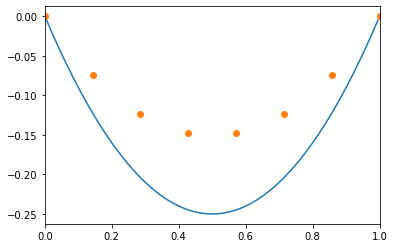

In [99]:
# Create 3 bit (8 node) finite element grid stiffness matrix with dirichlet bcs
nqbit = 3
n = 2**nqbit # The number of grid points
K = create_dirichlet_stiffness(2**nqbit)

# Get the paulie polynomial decomposition of this matrix
print("calling paulinomial decomposition")
nPauli, Pauli, Pauli_Names = pd.get_pauli_matrices()
result = pd.pauli_decomp(nqbit,K,Pauli,Pauli_Names,nPauli)
TEST = pd.build_matrix_from_pauli_decomp(result, Pauli)
TEST = np.array(TEST).astype(np.float64)
DIFF = TEST - K
assert(abs(DIFF.max())<1e-12) # make sure the decomp is correct
pd.print_pauli_decomp_list(result)

# Now let's fabricate different solutions and thus different RHS
xl = 0
xr = 1
h, x = create_grid(n,xl,xr)

# quadratic function
g  = 0
b  = 1
f, d2fdx2 = f_quadratic(g,b,x)
U = np.zeros(n)
F = np.zeros(n)
len(d2fdx2)
F[0:n] = d2fdx2[0:n] * h**2
F[0] = f[0]      # force Dirichlet BCs
F[n-1] = f[n-1]  # force Dirichlet BCS
print("F_quad ");pp.pprint(F)
U = np.linalg.solve(K, F)
print("U_quad ");pp.pprint(U)
hh, xx = create_grid(50,xl,xr)
f, d2fdx2 = f_quadratic(g,b,xx)
plt.plot(xx,f)
plt.plot(x, U, 'o')
plt.xlim(xl,xr)
plt.show()

# # sin function
# k=2
# f, d2fdx2 = f_sin(1,x)
# U = np.zeros(n)
# F = np.zeros(n)
# F[1:n-2] = d2fdx2[1:n-2] * h**2
# F[0] = f[0]      # force Dirichlet BCs
# F[n-1] = f[n-1]  # force Dirichlet BCS
# U = np.linalg.solve(K, F)
# hh, xx = create_grid(50,xl,xr)
# f, d2fdx2 = f_sin(1,xx)
# plt.plot(xx,f)
# plt.plot(x, U, 'o')
# plt.xlim(xl,xr)
# plt.show()

# # xcos(x) function
# k=1
# f, d2fdx2 = f_xcos(x)
# U = np.zeros(n)
# F = np.zeros(n)
# F[1:n-2] = d2fdx2[1:n-2] * h**2
# F[0] = f[0]      # force Dirichlet BCs
# F[n-1] = f[n-1]  # force Dirichlet BCS
# U = np.linalg.solve(K, F)
# hh, xx = create_grid(50,xl,xr)
# f, d2fdx2 = f_xcos(xx)
# plt.plot(xx,f)
# plt.plot(x, U, 'o')
# plt.xlim(xl,xr)
# plt.show()

In [52]:
# 0 = II
# 1 = X
# 2 = Y
# 3 = Z
# gate_set = []
#             [0, 0, 0], (I,I,I) 
#             [0, 0, 1], (I,I,X)
#             [0, 1, 1], (I,X,X)
#             [0, 2, 2], (I,Y,Y)
#             [0, 3, 2], (I,Z,Y)
#             [0, 3, 3], (I,Z,Z)
#             [1, 1, 1], (X,X,X)
#             [1, 2, 2], (X,Y,Y)
#             [2, 1, 2], (Y,X,Y)
#             [2, 2, 1], (Y,Y,X)
#             [3, 0, 2], (Z,I,Y)
#             [3, 2, 3], (Z,Y,Z)
#             [3, 3, 0], (Z,Z,I)
#             [3, 3, 1], (Z,Z,X)
#]

# Qiskit example matrix gate set and coefficients
coefficient_set = [0.55, 0.45]
gate_set = [[0, 0, 0], [0, 0, 1]]
print(coefficient_set)
print(gate_set)

# 8 node stiffness matrix gate set and coefficients
my_coefficient_set = [row[0] for row in result]
my_gate_set = [row[2] for row in result]
print(my_coefficient_set)
print(my_gate_set)

[0.55, 0.45]
[[0, 0, 0], [0, 0, 1]]
[-1.25000000000000, 0.750000000000000, 0.500000000000000, 0.500000000000000, -0.25*I, 0.750000000000000, 0.250000000000000, -0.250000000000000, 0.250000000000000, 0.250000000000000, -0.25*I, 0.750000000000000, 0.750000000000000, -0.250000000000000]
[[0, 0, 0], [0, 0, 1], [0, 1, 1], [0, 2, 2], [0, 3, 2], [0, 3, 3], [1, 1, 1], [1, 2, 2], [2, 1, 2], [2, 2, 1], [3, 0, 2], [3, 0, 3], [3, 3, 0], [3, 3, 1]]


## Quantum Variational Linear Solver

In [21]:
import qiskit
from qiskit import QuantumCircuit, QuantumRegister, ClassicalRegister
from qiskit import Aer, transpile, assemble
import math
import random
from scipy.optimize import minimize

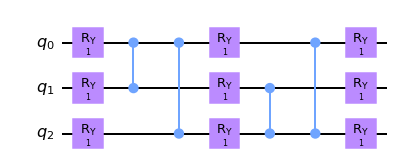

In [22]:
def apply_fixed_ansatz(qubits, parameters):
    for iz in range (0, len(qubits)):
        circ.ry(parameters[0][iz], qubits[iz])

    circ.cz(qubits[0], qubits[1])
    circ.cz(qubits[2], qubits[0])

    for iz in range (0, len(qubits)):
        circ.ry(parameters[1][iz], qubits[iz])

    circ.cz(qubits[1], qubits[2])
    circ.cz(qubits[2], qubits[0])

    for iz in range (0, len(qubits)):
        circ.ry(parameters[2][iz], qubits[iz])

circ = QuantumCircuit(3)
apply_fixed_ansatz([0, 1, 2], [[1, 1, 1], [1, 1, 1], [1, 1, 1]])
circ.draw(output='mpl')

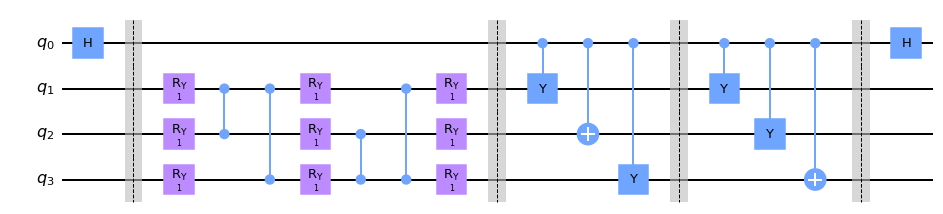

In [53]:
# Creates the Hadamard test
def had_test(gate_type, qubits, auxiliary_index, parameters):

    circ.h(auxiliary_index)

    apply_fixed_ansatz(qubits, parameters)

    for ie in range (0, len(gate_type[0])): # loop over the qubits in a gate
        if (gate_type[0][ie] == 1):
            circ.cz(auxiliary_index, qubits[ie])

    for ie in range (0, len(gate_type[1])):
        if (gate_type[1][ie] == 1):
            circ.cz(auxiliary_index, qubits[ie])
    
    circ.h(auxiliary_index)
    
circ = QuantumCircuit(4)
had_test([[0, 0, 0], [0, 0, 1]], [1, 2, 3], 0, [[1, 1, 1], [1, 1, 1], [1, 1, 1]])
circ.draw(output='mpl')

# Stiffness Matrix Hadamard Test
# Evaluates the overlap of two unitary matrices
def my_had_test(gate_type, qubits, auxiliary_index, parameters):

    circ.h(auxiliary_index)
    circ.barrier()
    apply_fixed_ansatz(qubits, parameters)
    
    circ.barrier()
    for ie in range (0, len(gate_type[0])): # loop over the qubits in a gate
        if (gate_type[0][ie] == 1):
            circ.cx(auxiliary_index, qubits[ie])
        if (gate_type[0][ie] == 2):
            circ.cy(auxiliary_index, qubits[ie])
        if (gate_type[0][ie] == 3):
            circ.cz(auxiliary_index, qubits[ie])
            
    circ.barrier()
    for ie in range (0, len(gate_type[1])):
        if (gate_type[1][ie] == 1):
            circ.cx(auxiliary_index, qubits[ie])
        if (gate_type[1][ie] == 2):
            circ.cy(auxiliary_index, qubits[ie])
        if (gate_type[1][ie] == 3):
            circ.cz(auxiliary_index, qubits[ie])
            
    circ.barrier()
    circ.h(auxiliary_index)
    
circ = QuantumCircuit(4)
my_had_test([[2,1,2],[2,2,1]], [1, 2, 3], 0, [[1, 1, 1], [1, 1, 1], [1, 1, 1]])
circ.draw(output='mpl')

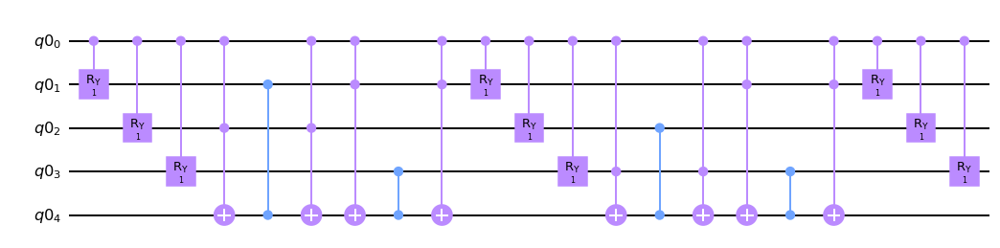

In [54]:
# Creates controlled anstaz for calculating |<b|psi>|^2 with a Hadamard test
def control_fixed_ansatz(qubits, parameters, auxiliary, reg):

    for i in range (0, len(qubits)):
        circ.cry(parameters[0][i], qiskit.circuit.Qubit(reg, auxiliary), qiskit.circuit.Qubit(reg, qubits[i]))

    circ.ccx(auxiliary, qubits[1], 4)
    circ.cz(qubits[0], 4)
    circ.ccx(auxiliary, qubits[1], 4)

    circ.ccx(auxiliary, qubits[0], 4)
    circ.cz(qubits[2], 4)
    circ.ccx(auxiliary, qubits[0], 4)

    for i in range (0, len(qubits)):
        circ.cry(parameters[1][i], qiskit.circuit.Qubit(reg, auxiliary), qiskit.circuit.Qubit(reg, qubits[i]))

    circ.ccx(auxiliary, qubits[2], 4)
    circ.cz(qubits[1], 4)
    circ.ccx(auxiliary, qubits[2], 4)

    circ.ccx(auxiliary, qubits[0], 4)
    circ.cz(qubits[2], 4)
    circ.ccx(auxiliary, qubits[0], 4)

    for i in range (0, len(qubits)):
        circ.cry(parameters[2][i], qiskit.circuit.Qubit(reg, auxiliary), qiskit.circuit.Qubit(reg, qubits[i]))

q_reg = QuantumRegister(5)
circ = QuantumCircuit(q_reg)
control_fixed_ansatz([1, 2, 3], [[1, 1, 1], [1, 1, 1], [1, 1, 1]], 0, q_reg)
circ.draw(output='mpl')

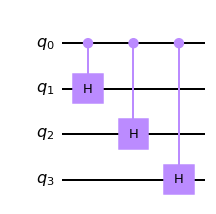

In [55]:
# The original
def control_b(auxiliary, qubits):
    for ia in qubits:
        circ.ch(auxiliary, ia)

circ = QuantumCircuit(4)
control_b(0, [1, 2, 3])
circ.draw(output='mpl')

array([0.       +0.j, 0.4082483+0.j, 0.4082483-0.j, 0.4082483-0.j, 0.4082483-0.j, 0.4082483-0.j,
       0.4082483+0.j, 0.       +0.j])


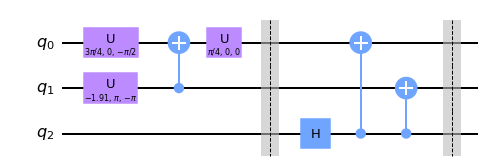

In [56]:
# For the quadratic solution with dirichlet BCs, we have b = [0,2,2,2,2,2,2,0], which is normalize to (1/sqrt(6))*[0,1,1,1,1,1,1,0]
# To move forward, we need to build this initial wavefunction with a U such that U|0> = |b> 
num_qubits = 3
circuit = QuantumCircuit(num_qubits)

# initialize wavefunction using qiskit, only helps find the circuit to build it
# turns out though, it is not real efficient. Found a better way online
# c = 1/np.sqrt(6)
# vector = [0, c, c, c, c, c, c, 0]
# initial_state = vector/np.linalg.norm(vector)
#circuit.initialize(initial_state, [0,1,2])  

circuit.u(3*np.pi/4, 0, -np.pi/2, 0)
circuit.u(-1.9106333, np.pi, -np.pi, 1)
circuit.cx(1,0)
circuit.u(np.pi/4, 0, 0, 0)
circuit.barrier()
circuit.h(2)
circuit.cx(2,0)
circuit.cx(2,1)


backend = Aer.get_backend('aer_simulator')
circuit.save_statevector()
t_circ = transpile(circuit, backend)
qobj = assemble(t_circ)
job = backend.run(qobj)
result = job.result()
o = result.get_statevector(circuit, decimals=10)
np.set_printoptions(precision=7)
pp.pprint(o)
circuit.draw(output='mpl')

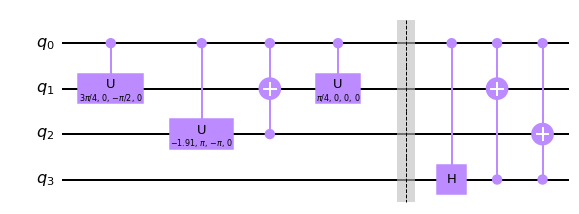

In [57]:
# For the quadratic solution
# NOTE: I'm not sure about this ....
def control_b_quad(auxiliary, qubits):
    circ.cu(3*np.pi/4, 0, -np.pi/2, 0, 0, 1)
    circ.cu(-1.9106333, np.pi, -np.pi, 0, 0, 2)
    circ.mcx([0, 2], 1)
    circ.cu(np.pi/4, 0, 0, 0, 0, 1)
    circ.barrier()
    circ.ch(0,3)
    
    circ.mcx([0, 3], 1)
    circ.mcx([0, 3], 2)

circ = QuantumCircuit(4)
control_b_quad(0, [1, 2, 3])
circ.draw(output='mpl')

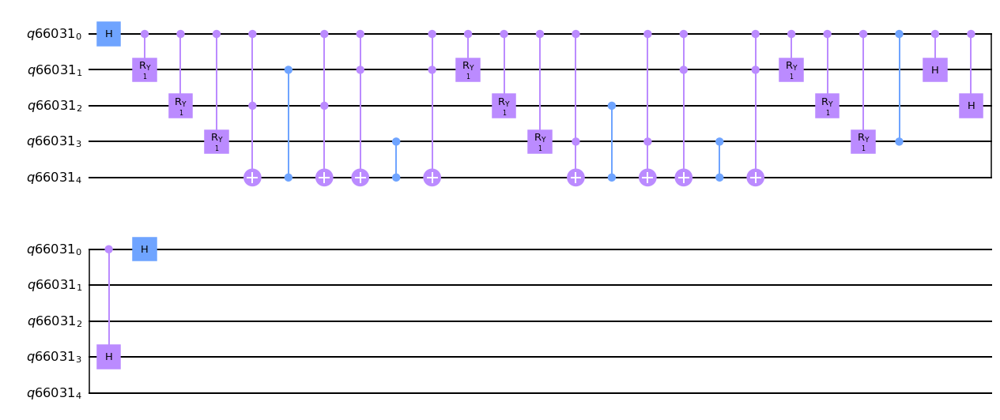

In [62]:
# Create the controlled Hadamard test for calculating <psi|psi>
def special_had_test(gate_type, qubits, auxiliary_index, parameters, reg):
    circ.h(auxiliary_index)
    control_fixed_ansatz(qubits, parameters, auxiliary_index, reg)
    for ty in range (0, len(gate_type)):
        if (gate_type[ty] == 1):
            circ.cz(auxiliary_index, qubits[ty])
    control_b(auxiliary_index, qubits)
    circ.h(auxiliary_index)

q_reg = QuantumRegister(5)
circ = QuantumCircuit(q_reg)
#special_had_test([[0, 0, 0], [0, 0, 1]], [1, 2, 3], 0, [[1, 1, 1], [1, 1, 1], [1, 1, 1]], q_reg)
# CJT -- I don't think the above (straight from qiskit) is correct. This function is only called for one gate I think.  The ty loop is over qubits in this gate.  
# I think it's this
special_had_test([0, 0, 1], [1, 2, 3], 0, [[1, 1, 1], [1, 1, 1], [1, 1, 1]], q_reg)
circ.draw(output='mpl')

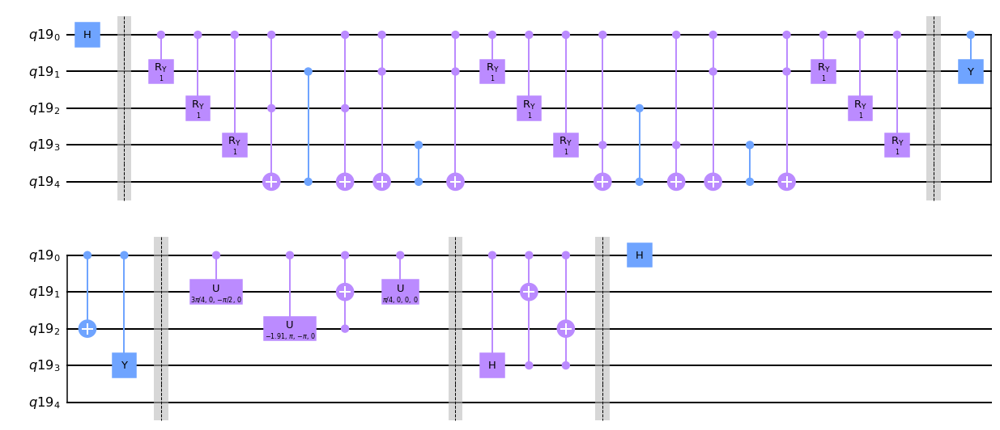

In [59]:
# Create the controlled Hadamard test for calculating <psi|psi> for the quadractic poisson problem
#M = 2*TensorProduct(II,II,II) - TensorProduct(II,II,X) - (1/2)*TensorProduct(II,X,X) - (1/2)*TensorProduct(II,Y,Y) - (1/4)*TensorProduct(X,X,X) + (1/4)*TensorProduct(X,Y,Y) - (1/4)*TensorProduct(Y,X,Y) - (1/4)*TensorProduct(Y,Y,X)
# 0 = II
# 1 = X
# 2 = Y
# gate_set = [
#             [0, 0, 0], (II,II,II) 
#             [0, 0, 1], (II,II,X)
#             [0, 1, 1], (II,X,X)
#             [0, 2, 2], (II,Y,Y)
#             [1, 1, 1], (X,X,X)
#             [1, 2, 2], (X,Y,Y)
#             [2, 1, 2], (Y,X,Y)
#             [2, 2, 1], (Y,Y,X)
#]
def my_special_had_test(gate_type, qubits, auxiliary_index, parameters, reg):
    circ.h(auxiliary_index)
    circ.barrier()
    control_fixed_ansatz(qubits, parameters, auxiliary_index, reg)
    circ.barrier()
    
    for ty in range (0, len(gate_type)):
        if (gate_type[ty] == 1):
            circ.cx(auxiliary_index, qubits[ty])
        if (gate_type[ty] == 2):
            circ.cy(auxiliary_index, qubits[ty])
        if (gate_type[ty] == 3):
            circ.cz(auxiliary_index, qubits[ty])
    
    circ.barrier()
    control_b_quad(auxiliary_index, qubits)
    circ.barrier()
    circ.h(auxiliary_index)

q_reg = QuantumRegister(5)
circ = QuantumCircuit(q_reg)
my_special_had_test([2, 1, 2], [1, 2, 3], 0, [[1, 1, 1], [1, 1, 1], [1, 1, 1]], q_reg)
circ.draw(output='mpl')

## The Original Qiskit Problem
$|\braket{b}{\phi}|^2 = \sum\limits_{m} \sum\limits_{n} c_m c_n \bra{0} \mathbf{U}^{\dagger} \mathbf{A}_n \mathbf{V}(k) \ket{0} \bra{0} \mathbf{U}^{\dagger} \mathbf{A}_m \mathbf{V}(k) \ket{0} $ <br>
In the original problem,<br>
$H_1 = \mathbf{Z}, c_1 = 0.45 $ <br>
$H_2 = \mathbf{I}, c_2 = 0.55 $ <br>
So that <br>
$|\braket{b}{\phi}|^2 = c_1*c_1*\bra{0} \mathbf{U}^{\dagger} \mathbf{A}_1 \mathbf{V}(k) \ket{0}  \bra{0} \mathbf{U}^{\dagger} \mathbf{A}_1 \mathbf{V}(k) \ket{0} + \
                       c_1*c_2*\bra{0} \mathbf{U}^{\dagger} \mathbf{A}_1 \mathbf{V}(k) \ket{0}  \bra{0} \mathbf{U}^{\dagger} \mathbf{A}_2 \mathbf{V}(k) \ket{0} + \
                       c_2*c_1*\bra{0} \mathbf{U}^{\dagger} \mathbf{A}_2 \mathbf{V}(k) \ket{0}  \bra{0} \mathbf{U}^{\dagger} \mathbf{A}_1 \mathbf{V}(k) \ket{0} + \
                       c_2*c_2*\bra{0} \mathbf{U}^{\dagger} \mathbf{A}_2 \mathbf{V}(k) \ket{0}  \bra{0} \mathbf{U}^{\dagger} \mathbf{A}_2 \mathbf{V}(k) \ket{0} $ <br>

In [101]:
# Implements the entire cost function on the quantum circuit\
def calculate_cost_function(parameters):
    
    global opt

    overall_sum_1 = 0
    
    parameters = [parameters[0:3], parameters[3:6], parameters[6:9]]

    for i in range(0, len(gate_set)):
        for j in range(0, len(gate_set)):

            global circ

            qctl = QuantumRegister(5) # note :: The controlled fixed ansatz requires 2 auxiliary qbits
            qc = ClassicalRegister(5)
            circ = QuantumCircuit(qctl, qc)

            backend = Aer.get_backend('aer_simulator')
            
            multiply = coefficient_set[i]*coefficient_set[j]

            had_test([gate_set[i], gate_set[j]], [1, 2, 3], 0, parameters)

            circ.save_statevector()
            t_circ = transpile(circ, backend)
            qobj = assemble(t_circ)
            job = backend.run(qobj)

            result = job.result()
            outputstate = np.real(result.get_statevector(circ, decimals=100))
            o = outputstate

            # 5 qbit Psi = ['|00000>', '|00001>', '|00010>', '|00011>', '|00100>', '|00101>', '|00110>', '|00111>', /
            #               '|01000>', '|01001>', '|01010>', '|01011>', '|01100>', '|01101>', '|01110>', '|01111>', 
            #               '|10000>', '|10001>', '|10010>', '|10011>', '|10100>', '|10101>', '|10110>', '|10111>', 
            #               '|11000>', '|11001>', '|11010>', '|11011>', '|11100>', '|11101>', '|11110>', '|11111>']
            # The auxiliary test qbit is the first bit on the RHS.
            # Below we loop over all 32 (2^5) states and add the square of all states where the auxiliary = 1 which is every other state
            # In the Hadamard test, the expection value is the difference between the |0> and |1> control probabilities. We are looking at |1>, so 
            # this difference can be calculated as
            # P(0) - P(1) = 1 - 2 P(1)
            m_sum = 0
            for l in range (0, len(o)):
                if (l%2 == 1):
                    n = o[l]**2
                    m_sum+=n

            overall_sum_1+=multiply*(1-(2*m_sum))

    overall_sum_2 = 0

    for i in range(0, len(gate_set)):
        for j in range(0, len(gate_set)):

            multiply = coefficient_set[i]*coefficient_set[j]
            mult = 1

            for extra in range(0, 2): # This is here because each pass is part of the two-term product above

                qctl = QuantumRegister(5)
                qc = ClassicalRegister(5)
                circ = QuantumCircuit(qctl, qc)

                backend = Aer.get_backend('aer_simulator')

                if (extra == 0):
                    special_had_test(gate_set[i], [1, 2, 3], 0, parameters, qctl)
                if (extra == 1):
                    special_had_test(gate_set[j], [1, 2, 3], 0, parameters, qctl)

                circ.save_statevector()    
                t_circ = transpile(circ, backend)
                qobj = assemble(t_circ)
                job = backend.run(qobj)

                result = job.result()
                outputstate = np.real(result.get_statevector(circ, decimals=100))
                o = outputstate

                m_sum = 0
                for l in range (0, len(o)):
                    if (l%2 == 1):
                        n = o[l]**2
                        m_sum+=n
                mult = mult*(1-(2*m_sum))

            overall_sum_2+=multiply*mult
            
    result = 1-float(overall_sum_2/overall_sum_1) # original 
    #result = result * np.conj(result) # cjt -- test the absolute value to see if it works for imaginary cost function I need 
    print(result)
    return result

out = minimize(calculate_cost_function, x0=[float(random.randint(0,3000))/1000 for i in range(0, 9)], method="COBYLA", options={'maxiter':200})
print(out)

out_f = [out['x'][0:3], out['x'][3:6], out['x'][6:9]]

circ = QuantumCircuit(3, 3)
apply_fixed_ansatz([0, 1, 2], out_f)
circ.save_statevector()

backend = Aer.get_backend('aer_simulator')
t_circ = transpile(circ, backend)
qobj = assemble(t_circ)
job = backend.run(qobj)

result = job.result()
o = result.get_statevector(circ, decimals=10)
pp.pprint(o)

a1 = coefficient_set[1]*np.array([[1,0,0,0,0,0,0,0], [0,1,0,0,0,0,0,0], [0,0,1,0,0,0,0,0], [0,0,0,1,0,0,0,0], [0,0,0,0,-1,0,0,0], [0,0,0,0,0,-1,0,0], [0,0,0,0,0,0,-1,0], [0,0,0,0,0,0,0,-1]])
a2 = coefficient_set[0]*np.array([[1,0,0,0,0,0,0,0], [0,1,0,0,0,0,0,0], [0,0,1,0,0,0,0,0], [0,0,0,1,0,0,0,0], [0,0,0,0,1,0,0,0], [0,0,0,0,0,1,0,0], [0,0,0,0,0,0,1,0], [0,0,0,0,0,0,0,1]])
a3 = np.add(a1, a2)
#pp.pprint(a3)

b = np.array([float(1/np.sqrt(8)),float(1/np.sqrt(8)),float(1/np.sqrt(8)),float(1/np.sqrt(8)),float(1/np.sqrt(8)),float(1/np.sqrt(8)),float(1/np.sqrt(8)),float(1/np.sqrt(8))])
solution = np.linalg.solve(a3, b)
solution = solution / np.linalg.norm(solution)
print("true solution: ",solution)

print((b.dot(a3.dot(o)/(np.linalg.norm(a3.dot(o)))))**2)

0.34086745074168323
0.5681565043043857
0.4441823275266536
0.30718978366104144
0.3791496161978858
0.41465510166923963
0.4425494118027419
0.35584136924545273
0.5753283353935051
0.2641518994916824
0.21544928478820483
0.2119606736945455
0.21173173154454616
0.37745683162629784
0.28642718049721716
0.2435680200349175
0.3252711458528551
0.187227463416398
0.180111787191618
0.24106638267021013
0.17624004789608602
0.33763850739777246
0.2783746025850744
0.16125555645219633
0.21435520209365708
0.1463753910812034
0.19945019480651296
0.14989210904034392
0.19679537797933047
0.19990732189372656
0.1605579702736585
0.14646688331391755
0.15283958863566774
0.14477302437058504
0.15571278184595724
0.15404242996991385
0.1540782705640461
0.14015898413635966
0.14844430314266252
0.14662425150153868
0.12502716028786384
0.11762946638635441
0.10019126998698366
0.0978347366864714
0.10908846123577627
0.09448648226465771
0.091799950609053
0.09408388545353535
0.10707291942365578
0.08527366351853424
0.04855465516725565


In [ ]:
# normal cost = (0.9895623673881648+0j) :: y([0.0492345+0.j, 0.0566489+0.j, 0.0483239+0.j, 0.0465353+0.j, 0.5773092+0.j, 0.5121179+0.j, 0.4766626+0.j, 0.4087889+0.j])
# my cosgt = (0.9904169110576401-0j) :: [-0.0489217+0.j, -0.051238 +0.j, -0.0509728+0.j, -0.0496725+0.j, -0.4522625+0.j, -0.4069965+0.j, -0.5846245+0.j, -0.5272025+0.j])


## My Quadatic 1D Poisson Problem

In [132]:
# Implements the entire cost function on the quantum circuit\
def my_calculate_cost_function(parameters):
    
    global opt

    overall_sum_1 = 0
    
    parameters = [parameters[0:3], parameters[3:6], parameters[6:9]]

    for i in range(0, len(my_gate_set)):
        for j in range(0, len(my_gate_set)):

            global circ

            qctl = QuantumRegister(5)
            qc = ClassicalRegister(5)
            circ = QuantumCircuit(qctl, qc)

            backend = Aer.get_backend('aer_simulator')
            
            multiply = my_coefficient_set[i].conjugate()*my_coefficient_set[j]  # cjt -- added conjugate here

            my_had_test([my_gate_set[i], my_gate_set[j]], [1, 2, 3], 0, parameters)

            circ.save_statevector()
            t_circ = transpile(circ, backend)
            qobj = assemble(t_circ)
            job = backend.run(qobj)

            result = job.result()
            outputstate = np.real(result.get_statevector(circ, decimals=100))
            o = outputstate
            #print("o: ",o)

            m_sum = 0
            for l in range (0, len(o)):
                if (l%2 == 1):
                    n = o[l]**2
                    m_sum+=n

            overall_sum_1+=multiply*(1-(2*m_sum))

    overall_sum_2 = 0

    for i in range(0, len(my_gate_set)):
        for j in range(0, len(my_gate_set)):

            #multiply = my_coefficient_set[i]*my_coefficient_set[j]
            multiply = my_coefficient_set[i].conjugate()*my_coefficient_set[j]
            mult = 1

            for extra in range(0, 2):

                qctl = QuantumRegister(5)
                qc = ClassicalRegister(5)
                circ = QuantumCircuit(qctl, qc)

                backend = Aer.get_backend('aer_simulator')

                if (extra == 0):
                    my_special_had_test(my_gate_set[i], [1, 2, 3], 0, parameters, qctl)
                if (extra == 1):
                    my_special_had_test(my_gate_set[j], [1, 2, 3], 0, parameters, qctl)

                circ.save_statevector()    
                t_circ = transpile(circ, backend)
                qobj = assemble(t_circ)
                job = backend.run(qobj)

                result = job.result()
                outputstate = np.real(result.get_statevector(circ, decimals=100))
                o = outputstate

                m_sum = 0
                for l in range (0, len(o)):
                    if (l%2 == 1):
                        n = o[l]**2
                        m_sum+=n
                mult = mult*(1-(2*m_sum))

            overall_sum_2+=multiply*mult
          
    print("overall_sum_2: ",overall_sum_2)
    print("overall_sum_1: ",overall_sum_1)
    assert(im(overall_sum_1)<1e-12)
    assert(im(overall_sum_2)<1e-12)
    result = 1-float(re(overall_sum_2)/re(overall_sum_1)) # original 
        
    #print("overall_sum_1: ",overall_sum_1," overall_sum_2: ",overall_sum_2)
    #result =  1 - float(re((overall_sum_2/overall_sum_1))) # added real - may be better squared
    
    #t = overall_sum_2/overall_sum_1
    #t = N(t * np.conj(t))
    #t = t * np.conj(t)
    #result = 1  - float(re(t))  # this is giving negative cost values, try squaring it
    
    print("result: ",result)
    return result

out = minimize(my_calculate_cost_function, x0=[float(random.randint(0,3000))/1000 for i in range(0, 9)], method="COBYLA", options={'maxiter':200})
print(out)

out_f = [out['x'][0:3], out['x'][3:6], out['x'][6:9]]

circ = QuantumCircuit(3, 3)
apply_fixed_ansatz([0, 1, 2], out_f)
circ.save_statevector()

backend = Aer.get_backend('aer_simulator')
t_circ = transpile(circ, backend)
qobj = assemble(t_circ)
job = backend.run(qobj)

result = job.result()
o = result.get_statevector(circ, decimals=10)
print("calculated solution: ",o)

solution = np.linalg.solve(K, F)
solution = solution / np.linalg.norm(solution)
print("true solution: ",solution)

# a1 = coefficient_set[1]*np.array([[1,0,0,0,0,0,0,0], [0,1,0,0,0,0,0,0], [0,0,1,0,0,0,0,0], [0,0,0,1,0,0,0,0], [0,0,0,0,-1,0,0,0], [0,0,0,0,0,-1,0,0], [0,0,0,0,0,0,-1,0], [0,0,0,0,0,0,0,-1]])
# a2 = coefficient_set[0]*np.array([[1,0,0,0,0,0,0,0], [0,1,0,0,0,0,0,0], [0,0,1,0,0,0,0,0], [0,0,0,1,0,0,0,0], [0,0,0,0,1,0,0,0], [0,0,0,0,0,1,0,0], [0,0,0,0,0,0,1,0], [0,0,0,0,0,0,0,1]])
# a3 = np.add(a1, a2)
# b = np.array([float(1/np.sqrt(8)),float(1/np.sqrt(8)),float(1/np.sqrt(8)),float(1/np.sqrt(8)),float(1/np.sqrt(8)),float(1/np.sqrt(8)),float(1/np.sqrt(8)),float(1/np.sqrt(8))])

# print((b.dot(a3.dot(o)/(np.linalg.norm(a3.dot(o)))))**2)

o:  [-5.5449972e-01  5.5511151e-17 -1.5394689e-01 -1.3877788e-17 -2.5060838e-01 -2.7755576e-17 -4.8664076e-02
  2.7755576e-17 -5.8884874e-01  5.5511151e-17 -2.7317982e-01 -2.7755576e-17 -4.2623155e-01  0.0000000e+00
 -2.4784445e-02  3.2959746e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.5716742  0.0171745 -0.2135634  0.0596165 -0.33842    0.0878116 -0.0367243 -0.0119398 -0.5716742
 -0.0171745 -0.2135634 -0.0596165 -0.33842   -0.0878116 -0.0367243  0.0119398  0.         0.
  0.         0.         0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.4903656 -0.0641341 -0.0893657 -0.0645812 -0.4197286  0.1691202 -0.1609219  0.1122579 -0.4197286
 -0.1691202 -0.1609219 -0.1122579 -0.4903656  0.0641341 -0.

o:  [-5.5449972e-01  5.5511151e-17 -1.5394689e-01 -1.3877788e-17 -2.5060838e-01 -2.7755576e-17 -4.8664076e-02
  2.7755576e-17 -5.8884874e-01  5.5511151e-17 -2.7317982e-01 -2.7755576e-17 -4.2623155e-01  0.0000000e+00
 -2.4784445e-02  3.2959746e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-5.5511151e-17 -5.5449972e-01 -4.1633363e-17 -1.5394689e-01 -2.5060838e-01 -2.7755576e-17 -4.8664076e-02
  2.7755576e-17 -5.8884874e-01  5.5511151e-17 -2.7317982e-01 -2.7755576e-17 -8.3266727e-17 -4.2623155e-01
  2.6020852e-17 -2.4784445e-02  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.2772499 -0.2

o:  [-5.5449972e-01  5.5511151e-17 -1.5394689e-01 -1.3877788e-17 -2.5060838e-01 -2.7755576e-17 -4.8664076e-02
  2.7755576e-17 -5.8884874e-01  5.5511151e-17 -2.7317982e-01 -2.7755576e-17 -4.2623155e-01  0.0000000e+00
 -2.4784445e-02  3.2959746e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.2772499 -0.2772499 -0.0769734 -0.0769734 -0.1253042 -0.1253042 -0.024332  -0.024332  -0.2944244
 -0.2944244 -0.1365899 -0.1365899 -0.2131158 -0.2131158 -0.0123922 -0.0123922  0.         0.
  0.         0.         0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2772499 -0.2772499 -0.0769734 -0.0769734 -0.1253042 -0.1253042 -0.024332  -0.024332  -0.2944244
 -0.2944244 -0.1365899 -0.1365899 -0.2131158 -0.2131158 -0.

o:  [-0.2772499 -0.2772499 -0.0769734 -0.0769734 -0.1253042 -0.1253042 -0.024332  -0.024332  -0.2944244
 -0.2944244 -0.1365899 -0.1365899 -0.2131158 -0.2131158 -0.0123922 -0.0123922  0.         0.
  0.         0.         0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2896421 -0.2648576 -0.2900892  0.1361423  0.0112857 -0.2618941  0.2700923 -0.3187564 -0.2700923
 -0.3187564 -0.0112857 -0.2618941 -0.2900892 -0.1361423 -0.2896421  0.2648576  0.         0.
  0.         0.         0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-5.5449972e-01  5.5511151e-17 -1.5394689e-01 -1.3877788e-17 -2.5060838e-01 -2.7755576e-17 -4.8664076e-02
  2.7755576e-17 -5.8884874e-01  5.5511151e-17 -2.7317982e-01 -2.7755576e-17 -4.2623155e-01  0.0000000e+00
 -2.4784445e-02  3.2959746e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.2648576 -0.2896421 -0.2900892  0.1361423 -0.2618941  0.0112857  0.2700923 -0.3187564 -0.2700923
 -0.3187564 -0.2618941 -0.0112857 -0.2900892 -0.1361423  0.2648576 -0.2896421  0.         0.
  0.         0.         0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-5.5511151e-17 -5.5449972e-01 -1.5394689e-01 -1.3877788e-17 -5.5511151e-17 -2.5060838e-01 -4.8664076e-02
  2.7755576e-17 -5.8884874e-01  5.5511151e-17 -8.3266727e-17 -2.7317982e-01 -4.2623155e-01  0.0000000e+00
  2.6020852e-17 -2.4784445e-02  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-5.5449972e-01  5.5511151e-17 -4.1633363e-17 -1.5394689e-01 -5.5511151e-17 -2.5060838e-01 -4.8664076e-02
  2.7755576e-17 -5.8884874e-01  5.5511151e-17 -8.3266

o:  [-0.2772499 -0.2772499 -0.0769734 -0.0769734 -0.1253042 -0.1253042 -0.024332  -0.024332  -0.2944244
 -0.2944244 -0.1365899 -0.1365899 -0.2131158 -0.2131158 -0.0123922 -0.0123922  0.         0.
  0.         0.         0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2772499 -0.2772499 -0.0769734 -0.0769734 -0.1253042 -0.1253042 -0.024332  -0.024332  -0.2944244
 -0.2944244 -0.1365899 -0.1365899 -0.2131158 -0.2131158 -0.0123922 -0.0123922  0.         0.
  0.         0.         0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2772499 -0.2772499 -0.0769734 -0.0769734 -0.1253042 -0.1253042 -0.024332  -0.024332  -0.2944244
 -0.2944244 -0.1365899 -0.1365899 -0.2131158 -0.2131158 -0.0123922 -0.0123922  0.         0.
  0.         0.         0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-5.5449972e-01  5.5511151e-17 -4.1633363e-17 -1.5394689e-01 -2.5060838e-01 -2.7755576e-17  2.0816682e-17
 -4.8664076e-02 -5.5511151e-17 -5.8884874e-01 -2.7317982e-01 -2.7755576e-17 -8.3266727e-17 -4.2623155e-01
 -2.4784445e-02  3.2959746e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.2896421 -0.2648576  0.1361423 -0.2900892  0.0112857 -0.2618941 -0.3187564  0.2700923 -0.3187564
 -0.2700923 -0.0112857 -0.2618941 -0.1361423 -0.2900892 -0.2896421  0.2648576  0.         0.
  0.         0.         0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2648576 -0.2896421 -0.2900892  0.1361423  0.0112857 -0.2618941 -0.3187564  0.2700923 -0.3187564
 -0.2700923 -0.0112857 -0.2618941 -0.2900892 -0.1361423  0.

overall_sum_2:  0.160837618728511 - 4.33680868994202e-18*I
overall_sum_1:  2.0812365090693 - 1.45716771982052e-16*I
result:  0.922720162736125
o:  [-3.4108847e-01  0.0000000e+00 -3.6579609e-01  0.0000000e+00 -2.0045717e-01 -1.3877788e-17 -1.9878923e-01
  0.0000000e+00 -5.9897823e-01  0.0000000e+00 -3.9762261e-01 -2.7755576e-17 -2.4229586e-01 -4.1633363e-17
 -3.0751536e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.4700333  0.1289449 -0.3817094  0.0159133 -0.2213765  0.0209193 -0.2531523  0.0543631 -0.4700333
 -0.1289449 -0.3817094 -0.0159133 -0.2213765 -0.0209193 -0.2531523 -0.0543631  0.         0.
  0.         0.         0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2916922 -0.0

o:  [-3.4108847e-01  0.0000000e+00 -5.5511151e-17 -3.6579609e-01 -5.5511151e-17 -2.0045717e-01 -1.9878923e-01
  0.0000000e+00 -5.9897823e-01  0.0000000e+00 -1.1102230e-16 -3.9762261e-01 -8.3266727e-17 -2.4229586e-01
 -3.0751536e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.2916922 -0.0493963 -0.3366557 -0.0291404 -0.3997177  0.1992605 -0.2982059  0.0994167 -0.3997177
 -0.1992605 -0.2982059 -0.0994167 -0.2916922  0.0493963 -0.3366557  0.0291404  0.         0.
  0.         0.         0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2707728 -0.0703156 -0.2822927 -0.0835034 -0.2707728  0.0703156 -0.2822927  0.0835034 -0.420637
 -0.1783412 -0.352569  -0.0450536 -0.420637   0.1783412 -0.3

o:  [-0.1705442 -0.1705442 -0.182898  -0.182898  -0.1002286 -0.1002286 -0.0993946 -0.0993946 -0.2994891
 -0.2994891 -0.1988113 -0.1988113 -0.1211479 -0.1211479 -0.1537577 -0.1537577  0.         0.
  0.         0.         0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1705442 -0.1705442 -0.182898  -0.182898  -0.1002286 -0.1002286 -0.0993946 -0.0993946 -0.2994891
 -0.2994891 -0.1988113 -0.1988113 -0.1211479 -0.1211479 -0.1537577 -0.1537577  0.         0.
  0.         0.         0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1705442 -0.1705442 -0.182898  -0.182898  -0.1002286 -0.1002286 -0.0993946 -0.0993946 -0.2994891
 -0.2994891 -0.1988113 -0.1988113 -0.1211479 -0.1211479 -0.1537577 -0.1537577  0.         0.
  0.         0.         0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.3243019 -0.0167866 -0.304046  -0.0617501 -0.2990399  0.0985827 -0.3988837  0.2000945 -0.3988837
 -0.2000945 -0.2990399 -0.0985827 -0.304046   0.0617501 -0.3243019  0.0167866  0.         0.
  0.         0.         0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2699389 -0.0711496 -0.2831266 -0.0826695 -0.2831266  0.0826695 -0.2699389  0.0711496 -0.4532468
 -0.1457314 -0.3199592 -0.0776634 -0.3199592  0.0776634 -0.4532468  0.1457314  0.         0.
  0.         0.         0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.3534423  0.0123538 -0.3534423 -0.0123538 -0.1996232 -0.000834  -0.1996232  0.000834  -0.4983004
 -0.1006778 -0.4983004  0.1006778 -0.2749056  0.0326097 -0.2749056 -0.0326097  0.         0.
  0.         0.         0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0167866 -0.3243019 -0.304046  -0.0617501  0.0985827 -0.2990399 -0.3988837  0.2000945 -0.3988837
 -0.2000945 -0.0985827 -0.2990399 -0.304046   0.0617501  0.0167866 -0.3243019  0.         0.
  0.         0.         0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2699389 -0.0711496 -0.0826695 -0.2831266 -0.2831266  0.0826695  0.0711496 -0.2699389 -0.1457314
 -0.4532468 -0.3199592 -0.0776634  0.0776634 -0.3199592 -0.4532468  0.1457314  0.         0.
  0.         0.         0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.3534423  0.0123538 -0.0123538 -0.3534423 -0.1996232 -0.000834   0.000834  -0.1996232 -0.1006778
 -0.4983004 -0.4983004  0.1006778  0.0326097 -0.2749056 -0.2749056 -0.0326097  0.         0.
  0.         0.         0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1705442 -0.1705442 -0.182898  -0.182898  -0.1002286 -0.1002286 -0.0993946 -0.0993946 -0.2994891
 -0.2994891 -0.1988113 -0.1988113 -0.1211479 -0.1211479 -0.1537577 -0.1537577  0.         0.
  0.         0.         0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1705442 -0.1705442 -0.182898  -0.182898  -0.1002286 -0.1002286 -0.0993946 -0.0993946 -0.2994891
 -0.2994891 -0.1988113 -0.1988113 -0.1211479 -0.1211479 -0.1537577 -0.1537577  0.         0.
  0.         0.         0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1705442 -0.1705442 -0.182898  -0.182898  -0.1002286 -0.1002286 -0.0993946 -0.0993946 -0.2994891
 -0.2994891 -0.1988113 -0.1988113 -0.1211479 -0.1211479 -0.1537577 -0.1537577  0.         0.
  0.         0.         0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.2916922 -0.0493963 -0.0291404 -0.3366557 -0.3997177  0.1992605  0.0994167 -0.2982059 -0.1992605
 -0.3997177 -0.2982059 -0.0994167  0.0493963 -0.2916922 -0.3366557  0.0291404  0.         0.
  0.         0.         0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1705442 -0.1705442 -0.182898  -0.182898  -0.1002286 -0.1002286 -0.0993946 -0.0993946 -0.2994891
 -0.2994891 -0.1988113 -0.1988113 -0.1211479 -0.1211479 -0.1537577 -0.1537577  0.         0.
  0.         0.         0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-3.4108847e-01  0.0000000e+00 -5.5511151e-17 -3.6579609e-01 -2.0045717e-01 -1.3877788e-17 -2.7755576e-17
 -1.9878923e-01 -1.1102230e-16 -5.9897823e-01 -3.9762261e-01 -2.7755576e-17 -8.3266727e-17 -2.4229586e-01
 -3.0751536e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

overall_sum_2:  0.485322785534251 + 1.73472347597681e-17*I
overall_sum_1:  1.69791817805344 + 4.85722573273506e-17*I
result:  0.7141659758359831
o:  [-4.3526178e-01 -5.5511151e-17 -3.4165600e-01 -8.3266727e-17  6.2052878e-04 -2.4557179e-17 -7.4325501e-02
 -2.0816682e-17 -7.0561406e-01 -1.1102230e-16 -3.9648647e-01 -8.3266727e-17  1.2739679e-01 -5.5511151e-17
 -1.3027286e-01 -2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.5704379  0.1351761 -0.3690712  0.0274152  0.0640087 -0.0633881 -0.1022992  0.0279737 -0.5704379
 -0.1351761 -0.3690712 -0.0274152  0.0640087  0.0633881 -0.1022992 -0.0279737  0.         0.
  0.         0.         0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1539325 -0

o:  [-0.1539325 -0.2813293 -0.2359644 -0.1056916 -0.3524968  0.3531173 -0.235406   0.1610805 -0.3524968
 -0.3531173 -0.235406  -0.1610805 -0.1539325  0.2813293 -0.2359644  0.1056916  0.         0.
  0.         0.         0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2173206 -0.2179412 -0.2079908 -0.1336653 -0.2173206  0.2179412 -0.2079908  0.1336653 -0.2891086
 -0.4165054 -0.2633797 -0.1331068 -0.2891086  0.4165054 -0.2633797  0.1331068  0.         0.
  0.         0.         0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-4.3526178e-01 -5.5511151e-17 -3.4165600e-01 -8.3266727e-17  6.2052878e-04 -2.4557179e-17 -7.4325501e-02
 -2.0816682e-17 -7.0561406e-01 -1.1102230e-16 -3.9648647e-01 -8.3266727e-17  1.2739679e-01 -5.5511151e-17
 -1.3027286e-01 -2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-2.1763089e-01 -2.1763089e-01 -1.7082800e-01 -1.7082800e-01  3.1026439e-04  3.1026439e-04 -3.7162751e-02
 -3.7162751e-02 -3.5280703e-01 -3.5280703e-01 -1.9824324e-01 -1.9824324e-01  6.3698397e-02  6.3698397e-02
 -6.5136430e-02 -6.5136430e-02  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-2.1763089e-01 -2.1763089e-01 -1.7082800e-01 -1.7082800e-01  3.1026439e-04  3.1026439e-04 -3.7162751e-02
 -3.7162751e-02 -3.5280703e-01 -3.5280703e-01 -1.9824324e-01 -1.9824324e-01  6.3698397e-02  6.3698397e-02
 -6.5136430e-02 -6.5136430e-02  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-2.1763089e-01 

o:  [-0.2547936 -0.1804681 -0.1705177 -0.1711383 -0.1705177  0.1711383 -0.2547936  0.1804681 -0.4179435
 -0.2876706 -0.1345448 -0.2619416 -0.1345448  0.2619416 -0.4179435  0.2876706  0.         0.
  0.         0.         0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.3884589 -0.0468029 -0.3884589  0.0468029 -0.0368525  0.037473  -0.0368525 -0.037473  -0.5510503
 -0.1545638 -0.5510503  0.1545638 -0.001438   0.1288348 -0.001438  -0.1288348  0.         0.
  0.         0.         0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0468029 -0.3884589  0.0468029 -0.3884589 -0.0368525  0.037473  -0.0368525 -0.037473  -0.5510503
 -0.1545638 -0.5510503  0.1545638  0.1288348 -0.001438  -0.1288348 -0.001438   0.         0.
  0.         0.         0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.2547936 -0.1804681 -0.1711383 -0.1705177 -0.1705177  0.1711383  0.1804681 -0.2547936 -0.2876706
 -0.4179435 -0.1345448 -0.2619416  0.2619416 -0.1345448 -0.4179435  0.2876706  0.         0.
  0.         0.         0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.3884589 -0.0468029  0.0468029 -0.3884589 -0.0368525  0.037473  -0.037473  -0.0368525 -0.1545638
 -0.5510503 -0.5510503  0.1545638  0.1288348 -0.001438  -0.001438  -0.1288348  0.         0.
  0.         0.         0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0468029 -0.3884589 -0.3884589  0.0468029 -0.0368525  0.037473  -0.037473  -0.0368525 -0.1545638
 -0.5510503 -0.5510503  0.1545638 -0.001438   0.1288348 -0.1288348 -0.001438   0.         0.
  0.         0.         0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-2.1763089e-01 -2.1763089e-01 -1.7082800e-01 -1.7082800e-01  3.1026439e-04  3.1026439e-04 -3.7162751e-02
 -3.7162751e-02 -3.5280703e-01 -3.5280703e-01 -1.9824324e-01 -1.9824324e-01  6.3698397e-02  6.3698397e-02
 -6.5136430e-02 -6.5136430e-02  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-2.1763089e-01 -2.1763089e-01 -1.7082800e-01 -1.7082800e-01  3.1026439e-04  3.1026439e-04 -3.7162751e-02
 -3.7162751e-02 -3.5280703e-01 -3.5280703e-01 -1.9824324e-01 -1.9824324e-01  6.3698397e-02  6.3698397e-02
 -6.5136430e-02 -6.5136430e-02  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-2.1763089e-01 

o:  [-0.2813293 -0.1539325 -0.2359644 -0.1056916 -0.3524968  0.3531173  0.1610805 -0.235406  -0.3531173
 -0.3524968 -0.235406  -0.1610805 -0.1539325  0.2813293  0.1056916 -0.2359644  0.         0.
  0.         0.         0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1539325 -0.2813293 -0.1056916 -0.2359644 -0.3524968  0.3531173  0.1610805 -0.235406  -0.3531173
 -0.3524968 -0.235406  -0.1610805  0.2813293 -0.1539325 -0.2359644  0.1056916  0.         0.
  0.         0.         0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-2.1763089e-01 -2.1763089e-01 -1.7082800e-01 -1.7082800e-01  3.1026439e-04  3.1026439e-04 -3.7162751e-02
 -3.7162751e-02 -3.5280703e-01 -3.5280703e-01 -1.9824324e-01 -1.9824324e-01  6.3698397e-02  6.3698397e-02
 -6.5136430e-02 -6.5136430e-02  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

overall_sum_2:  0.331288421704709 + 4.33680868994202e-18*I
overall_sum_1:  3.35514135799776 - 1.66533453693773e-16*I
result:  0.9012594742349658
o:  [-4.2801500e-01  2.7755576e-17 -6.7018432e-01 -5.5511151e-17 -2.3299471e-01 -2.7755576e-17 -1.9597464e-01
  0.0000000e+00 -4.3551228e-01  0.0000000e+00 -7.4212242e-02  2.7755576e-17 -1.8710028e-01 -2.7755576e-17
 -2.1160963e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.4317636  0.0037486 -0.3721983 -0.297986  -0.2100475 -0.0229472 -0.2037921  0.0078175 -0.4317636
 -0.0037486 -0.3721983  0.297986  -0.2100475  0.0229472 -0.2037921 -0.0078175  0.         0.
  0.         0.         0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.3075576 -0

o:  [-0.3075576 -0.1204574 -0.440897  -0.2292873 -0.3342535  0.1012588 -0.1350934 -0.0608812 -0.3342535
 -0.1012588 -0.1350934  0.0608812 -0.3075576  0.1204574 -0.440897   0.2292873  0.         0.
  0.         0.         0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.3305049 -0.0975101 -0.4330795 -0.2371048 -0.3305049  0.0975101 -0.4330795  0.2371048 -0.3113063
 -0.124206  -0.1429109  0.0686987 -0.3113063  0.124206  -0.1429109 -0.0686987  0.         0.
  0.         0.         0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-4.2801500e-01  2.7755576e-17 -6.7018432e-01 -5.5511151e-17 -2.3299471e-01 -2.7755576e-17 -1.9597464e-01
  0.0000000e+00 -4.3551228e-01  0.0000000e+00 -7.4212242e-02  2.7755576e-17 -1.8710028e-01 -2.7755576e-17
 -2.1160963e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.2140075 -0.2140075 -0.3350922 -0.3350922 -0.1164974 -0.1164974 -0.0979873 -0.0979873 -0.2177561
 -0.2177561 -0.0371061 -0.0371061 -0.0935501 -0.0935501 -0.1058048 -0.1058048  0.         0.
  0.         0.         0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2140075 -0.2140075 -0.3350922 -0.3350922 -0.1164974 -0.1164974 -0.0979873 -0.0979873 -0.2177561
 -0.2177561 -0.0371061 -0.0371061 -0.0935501 -0.0935501 -0.1058048 -0.1058048  0.         0.
  0.         0.         0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2140075 -0.2140075 -0.3350922 -0.3350922 -0.1164974 -0.1164974 -0.0979873 -0.0979873 -0.2177561
 -0.2177561 -0.0371061 -0.0371061 -0.0935501 -0.0935501 -0.1058048 -0.1058048  0.         0.
  0.         0.         0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.3119948 -0.1160202 -0.4515895 -0.2185948 -0.4515895  0.2185948 -0.3119948  0.1160202 -0.323561
 -0.1119513 -0.1306563  0.056444  -0.1306563 -0.056444  -0.323561   0.1119513  0.         0.
  0.         0.         0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.5490997  0.1210847 -0.5490997 -0.1210847 -0.2144847 -0.01851   -0.2144847  0.01851   -0.2548623
 -0.18065   -0.2548623  0.18065   -0.199355   0.0122547 -0.199355  -0.0122547  0.         0.
  0.         0.         0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1210847 -0.5490997 -0.1210847 -0.5490997 -0.2144847 -0.01851   -0.2144847  0.01851   -0.2548623
 -0.18065   -0.2548623  0.18065    0.0122547 -0.199355  -0.0122547 -0.199355   0.         0.
  0.         0.         0.         0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [-0.3119948 -0.1160202 -0.2185948 -0.4515895 -0.4515895  0.2185948  0.1160202 -0.3119948 -0.1119513
 -0.323561  -0.1306563  0.056444  -0.056444  -0.1306563 -0.323561   0.1119513  0.         0.
  0.         0.         0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.5490997  0.1210847 -0.1210847 -0.5490997 -0.2144847 -0.01851    0.01851   -0.2144847 -0.18065
 -0.2548623 -0.2548623  0.18065    0.0122547 -0.199355  -0.199355  -0.0122547  0.         0.
  0.         0.         0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1210847 -0.5490997 -0.5490997 -0.1210847 -0.2144847 -0.01851    0.01851   -0.2144847 -0.18065
 -0.2548623 -0.2548623  0.18065   -0.199355   0.0122547 -0.0122547 -0.199355   0.         0.
  0.         0.         0.         0.         0.         0.         0.         0.         0.
  0.         0.     

o:  [-0.2140075 -0.2140075 -0.3350922 -0.3350922 -0.1164974 -0.1164974 -0.0979873 -0.0979873 -0.2177561
 -0.2177561 -0.0371061 -0.0371061 -0.0935501 -0.0935501 -0.1058048 -0.1058048  0.         0.
  0.         0.         0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2140075 -0.2140075 -0.3350922 -0.3350922 -0.1164974 -0.1164974 -0.0979873 -0.0979873 -0.2177561
 -0.2177561 -0.0371061 -0.0371061 -0.0935501 -0.0935501 -0.1058048 -0.1058048  0.         0.
  0.         0.         0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-4.2801500e-01  2.7755576e-17 -1.6653345e-16 -6.7018432e-01 -5.5511151e-17 -2.3299471e-01 -1.9597464e-01
  0.0000000e+00 -4.3551228e-01  0.0000000e+00  1.3877788e-17 -7.4212242e-02 -5.5511151e-17 -1.8710028e-01
 -2.1160963e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.2140075 -0.2140075 -0.3350922 -0.3350922 -0.1164974 -0.1164974 -0.0979873 -0.0979873 -0.2177561
 -0.2177561 -0.0371061 -0.0371061 -0.0935501 -0.0935501 -0.1058048 -0.1058048  0.         0.
  0.         0.         0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-4.2801500e-01  2.7755576e-17 -1.6653345e-16 -6.7018432e-01 -2.3299471e-01 -2.7755576e-17 -2.7755576e-17
 -1.9597464e-01 -5.5511151e-17 -4.3551228e-01 -7.4212242e-02  2.7755576e-17 -5.5511151e-17 -1.8710028e-01
 -2.1160963e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.3198123 -0.1082027 -0.241542  -0.4286423 -0.0793912 -0.1536035 -0.3157435  0.1197688 -0.3157435
 -0.1197688  0.0793912 -0.1536035  0.241542  -0.4286423 -0.

overall_sum_2:  0.679112306601472
overall_sum_1:  2.83544784957679 - 1.31838984174237e-16*I
result:  0.7604920483009996
o:  [-1.8576579e-01  1.3877788e-17 -5.2879258e-01  0.0000000e+00 -7.3383643e-02  0.0000000e+00 -2.4758095e-01
 -1.3877788e-17 -2.9284881e-01 -2.7755576e-17 -6.0591735e-01  0.0000000e+00 -7.0137067e-02  0.0000000e+00
 -4.0171199e-01 -2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.2393073  0.0535415 -0.567355   0.0385624 -0.0717604 -0.0016233 -0.3246465  0.0770655 -0.2393073
 -0.0535415 -0.567355  -0.0385624 -0.0717604  0.0016233 -0.3246465 -0.0770655  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1279514 -0.0578144 -0.4652523 -0.06

o:  [-0.1279514 -0.0578144 -0.4652523 -0.0635403 -0.1831162  0.1097326 -0.4267491  0.1791682 -0.1831162
 -0.1097326 -0.4267491 -0.1791682 -0.1279514  0.0578144 -0.4652523  0.0635403  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1295747 -0.0561911 -0.3881868 -0.1406058 -0.1295747  0.0561911 -0.3881868  0.1406058 -0.1814929
 -0.1113559 -0.5038147 -0.1021027 -0.1814929  0.1113559 -0.5038147  0.1021027  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.8576579e-01  1.3877788e-17 -5.2879258e-01  0.0000000e+00 -7.3383643e-02  0.0000000e+00 -2.4758095e-01
 -1.3877788e-17 -2.9284881e-01 -2.7755576e-17 -6.0591735e-01  0.0000000e+00 -7.0137067e-02  0.0000000e+00
 -4.0171199e-01 -2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.0928829 -0.0928829 -0.2643963 -0.2643963 -0.0366918 -0.0366918 -0.1237905 -0.1237905 -0.1464244
 -0.1464244 -0.3029587 -0.3029587 -0.0350685 -0.0350685 -0.200856  -0.200856   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0928829 -0.0928829 -0.2643963 -0.2643963 -0.0366918 -0.0366918 -0.1237905 -0.1237905 -0.1464244
 -0.1464244 -0.3029587 -0.3029587 -0.0350685 -0.0350685 -0.200856  -0.200856   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.8576579e-01  1.3877788e-17 -5.2879258e-01  0.0000000e+00 -7.3383643e-02  0.0000000e+00 -2.4758095e-01
 -1.3877788e-17 -2.9284881e-01 -2.7755576e-17 -6.0591735e-01  0.0000000e+00 -7.0137067e-02  0.0000000e+00
 -4.0171199e-01 -2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.2937389  0.1079731 -0.2994648 -0.2293278  0.2662669 -0.3396505  0.0226339 -0.2702149 -0.0226339
 -0.2702149 -0.2662669 -0.3396505 -0.2994648  0.2293278 -0.2937389 -0.1079731  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.8576579e-01  1.3877788e-17 -5.2879258e-01  0.0000000e+00 -7.3383643e-02  0.0000000e+00 -2.4758095e-01
 -1.3877788e-17 -2.9284881e-01 -2.7755576e-17 -6.0591735e-01  0.0000000e+00 -7.0137067e-02  0.0000000e+00
 -4.0171199e-01 -2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-1.3877788e-17 -1.8576579e-01  0.0000000e+00 -5.2879258e-01 -7.3383643e-02  0.0000000e+00 -2.4758095e-01
 -1.3877788e-17 -2.9284881e-01 -2.7755576e-17 -6.0591

o:  [-1.3877788e-17 -1.8576579e-01 -5.2879258e-01  0.0000000e+00  0.0000000e+00 -7.3383643e-02 -2.4758095e-01
 -1.3877788e-17 -2.9284881e-01 -2.7755576e-17  0.0000000e+00 -6.0591735e-01 -7.0137067e-02  0.0000000e+00
 -1.1102230e-16 -4.0171199e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-1.8576579e-01  1.3877788e-17  0.0000000e+00 -5.2879258e-01  0.0000000e+00 -7.3383643e-02 -2.4758095e-01
 -1.3877788e-17 -2.9284881e-01 -2.7755576e-17  0.0000000e+00 -6.0591735e-01  0.0000000e+00 -7.0137067e-02
 -4.0171199e-01 -2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-1.8576579e-01 

o:  [-0.0928829 -0.0928829 -0.2643963 -0.2643963 -0.0366918 -0.0366918 -0.1237905 -0.1237905 -0.1464244
 -0.1464244 -0.3029587 -0.3029587 -0.0350685 -0.0350685 -0.200856  -0.200856   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0928829 -0.0928829 -0.2643963 -0.2643963 -0.0366918 -0.0366918 -0.1237905 -0.1237905 -0.1464244
 -0.1464244 -0.3029587 -0.3029587 -0.0350685 -0.0350685 -0.200856  -0.200856   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.8576579e-01  1.3877788e-17 -5.2879258e-01  0.0000000e+00 -7.3383643e-02  0.0000000e+00 -2.4758095e-01
 -1.3877788e-17 -2.9284881e-01 -2.7755576e-17 -6.0591735e-01  0.0000000e+00 -7.0137067e-02  0.0000000e+00
 -4.0171199e-01 -2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.0928829 -0.0928829 -0.2643963 -0.2643963 -0.0366918 -0.0366918 -0.1237905 -0.1237905 -0.1464244
 -0.1464244 -0.3029587 -0.3029587 -0.0350685 -0.0350685 -0.200856  -0.200856   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.8576579e-01  1.3877788e-17 -5.2879258e-01  0.0000000e+00  0.0000000e+00 -7.3383643e-02 -6.9388939e-17
 -2.4758095e-01 -5.5511151e-17 -2.9284881e-01  0.0000000e+00 -6.0591735e-01 -7.0137067e-02  0.0000000e+00
 -4.0171199e-01 -2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-1.8576579e-01  1.3877788e-17 -5.2879258e-01  0.0000000e+00 -7.3383643e-02  0.0000000e+00 -2.4758095e-01
 -1.3877788e-17 -2.9284881e-01 -2.7755576e-17 -6.0591

o:  [-0.1782601  0.0337188  0.0114978 -0.3394999  0.0165038 -0.1791671 -0.5449255  0.1495891 -0.1782601
 -0.0337188 -0.0114978 -0.3394999 -0.0165038 -0.1791671 -0.5449255 -0.1495891  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1782601  0.0337188 -0.3394999  0.0114978 -0.1791671  0.0165038 -0.5449255  0.1495891 -0.1782601
 -0.0337188 -0.3394999 -0.0114978 -0.1791671 -0.0165038 -0.5449255 -0.1495891  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.4454133e-01  1.3877788e-17 -3.2800218e-01  0.0000000e+00 -1.6266327e-01  1.3877788e-17 -3.9533638e-01
  2.7755576e-17 -2.1197893e-01  0.0000000e+00 -3.5099770e-01 -2.7755576e-17 -1.9567095e-01  2.7755576e-17
 -6.9451466e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.1536023  0.009061  -0.3616693  0.0336671 -0.009061  -0.1536023 -0.0336671 -0.3616693 -0.008154
 -0.2038249  0.1717585 -0.5227562 -0.2038249  0.008154  -0.5227562 -0.1717585  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.3877788e-17 -1.4454133e-01 -5.5511151e-17 -3.2800218e-01 -1.6266327e-01  1.3877788e-17 -3.9533638e-01
  2.7755576e-17 -2.1197893e-01  0.0000000e+00 -3.5099770e-01 -2.7755576e-17 -2.7755576e-17 -1.9567095e-01
 -5.5511151e-17 -6.9451466e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-1.4454133e-01  1.3877788e-17 -3.2800218e-01  0.0000000e+00 -1.6266327e-01  1.3877788e-17 -3.9533638e-01
  2.7755576e-17 -2.1197893e-01  0.0000000e+00 -3.50997

o:  [ 0.0255648 -0.1701061  0.1832562 -0.5112584  0.0246578 -0.1873211 -0.0221693 -0.373167  -0.0246578
 -0.1873211  0.0221693 -0.373167  -0.0255648 -0.1701061 -0.1832562 -0.5112584  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0722707 -0.0722707 -0.1640011 -0.1640011 -0.0813316 -0.0813316 -0.1976682 -0.1976682 -0.1059895
 -0.1059895 -0.1754989 -0.1754989 -0.0978355 -0.0978355 -0.3472573 -0.3472573  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.4454133e-01  1.3877788e-17 -3.2800218e-01  0.0000000e+00 -1.6266327e-01  1.3877788e-17 -3.9533638e-01
  2.7755576e-17 -2.1197893e-01  0.0000000e+00 -3.5099770e-01 -2.7755576e-17 -1.9567095e-01  2.7755576e-17
 -6.9451466e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.2749867 -0.419528  -0.0661656 -0.2618366  0.0941672 -0.2568305 -0.0916787 -0.3036577  0.0916787
 -0.3036577 -0.0941672 -0.2568305  0.0661656 -0.2618366 -0.2749867 -0.419528   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.3877788e-17 -1.4454133e-01 -5.5511151e-17 -3.2800218e-01 -1.6266327e-01  1.3877788e-17 -3.9533638e-01
  2.7755576e-17 -2.1197893e-01  0.0000000e+00 -3.5099770e-01 -2.7755576e-17 -2.7755576e-17 -1.9567095e-01
 -5.5511151e-17 -6.9451466e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-1.4454133e-01  1.3877788e-17 -3.2800218e-01  0.0000000e+00 -1.6266327e-01  1.3877788e-17 -3.9533638e-01
  2.7755576e-17 -2.1197893e-01  0.0000000e+00 -3.5099

o:  [ 0.2749867 -0.419528  -0.2618366 -0.0661656  0.0941672 -0.2568305 -0.3036577 -0.0916787 -0.3036577
  0.0916787 -0.0941672 -0.2568305 -0.2618366  0.0661656 -0.2749867 -0.419528   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.3877788e-17 -1.4454133e-01 -3.2800218e-01  0.0000000e+00 -1.6266327e-01  1.3877788e-17 -2.7755576e-17
 -3.9533638e-01 -2.7755576e-17 -2.1197893e-01 -3.5099770e-01 -2.7755576e-17 -1.9567095e-01  2.7755576e-17
 -5.5511151e-17 -6.9451466e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-1.4454133e-01  1.3877788e-17 -5.5511151e-17 -3.2800218e-01 -1.6266327e-01  1.3877788e-17 -2.7755576e-17
 -3.9533638e-01 -2.7755576e-17 -2.1197893e-01 -3.5099

o:  [-0.0722707 -0.0722707 -0.1640011 -0.1640011 -0.0813316 -0.0813316 -0.1976682 -0.1976682 -0.1059895
 -0.1059895 -0.1754989 -0.1754989 -0.0978355 -0.0978355 -0.3472573 -0.3472573  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.4454133e-01  1.3877788e-17 -5.5511151e-17 -3.2800218e-01 -1.3877788e-17 -1.6266327e-01 -3.9533638e-01
  2.7755576e-17 -2.1197893e-01  0.0000000e+00 -8.3266727e-17 -3.5099770e-01 -2.7755576e-17 -1.9567095e-01
 -6.9451466e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.419528   0.2749867 -0.0661656 -0.2618366 -0.2568305  0.0941672 -0.0916787 -0.3036577  0.0916787
 -0.3036577 -0.2568305 -0.0941672  0.0661656 -0.2618366 -0.

o:  [-0.1782601  0.0337188  0.0114978 -0.3394999 -0.1791671  0.0165038  0.1495891 -0.5449255 -0.0337188
 -0.1782601 -0.3394999 -0.0114978 -0.0165038 -0.1791671 -0.5449255 -0.1495891  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2699389  0.1253975 -0.0826695 -0.2453327  0.0826695 -0.2453327 -0.2699389 -0.1253975 -0.4532468
  0.2412679 -0.0776634 -0.2733343  0.0776634 -0.2733343 -0.4532468 -0.2412679  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1253975 -0.2699389 -0.2453327 -0.0826695  0.0826695 -0.2453327 -0.2699389 -0.1253975 -0.4532468
  0.2412679 -0.0776634 -0.2733343 -0.2733343  0.0776634 -0.2412679 -0.4532468  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1093047  0.3138439  0.1369582 -0.2791216 -0.0956939 -0.2112481 -0.4761101  0.1114639 -0.1093047
 -0.3138439 -0.1369582 -0.2791216  0.0956939 -0.2112481 -0.4761101 -0.1114639  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1093047  0.3138439 -0.2791216  0.1369582 -0.2112481 -0.0956939 -0.4761101  0.1114639 -0.1093047
 -0.3138439 -0.2791216 -0.1369582 -0.2112481  0.0956939 -0.4761101 -0.1114639  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 2.0453927e-01  0.0000000e+00 -1.4216333e-01 -4.1633363e-17 -3.0694197e-01  5.5511151e-17 -3.6464614e-01
  5.5511151e-17 -4.2314860e-01 -8.3266727e-17 -4.1607979e-01 -1.6653345e-16 -1.1555427e-01 -6.9388939e-18
 -5.8757397e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.0512014  0.2557406 -0.2534047  0.1112414 -0.2557406 -0.0512014 -0.1112414 -0.2534047 -0.1537972
 -0.2693514  0.0857471 -0.5018269 -0.2693514  0.1537972 -0.5018269 -0.0857471  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 2.7755576e-17  2.0453927e-01 -6.9388939e-17 -1.4216333e-01 -3.0694197e-01  5.5511151e-17 -3.6464614e-01
  5.5511151e-17 -4.2314860e-01 -8.3266727e-17 -4.1607979e-01 -1.6653345e-16 -2.7755576e-17 -1.1555427e-01
 -5.5511151e-17 -5.8757397e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 2.0453927e-01  0.0000000e+00 -1.4216333e-01 -4.1633363e-17 -3.0694197e-01  5.5511151e-17 -3.6464614e-01
  5.5511151e-17 -4.2314860e-01 -8.3266727e-17 -4.1607

o:  [ 0.3138439 -0.1093047  0.1369582 -0.2791216 -0.2112481 -0.0956939 -0.4761101  0.1114639 -0.1093047
 -0.3138439 -0.2791216 -0.1369582  0.0956939 -0.2112481 -0.1114639 -0.4761101  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0444925  0.1600468 -0.3648687  0.2227053  0.0581033 -0.3650453  0.0257168 -0.390363  -0.0581033
 -0.3650453 -0.0257168 -0.390363   0.0444925 -0.1600468 -0.3648687 -0.2227053  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1600468  0.0444925  0.2227053 -0.3648687  0.0581033 -0.3650453  0.0257168 -0.390363  -0.0581033
 -0.3650453 -0.0257168 -0.390363  -0.1600468  0.0444925 -0.2227053 -0.3648687  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0800534  0.2845927 -0.2245527  0.0823893 -0.0823893 -0.2245527 -0.2845927 -0.0800534  0.0822127
 -0.5053613 -0.1502628 -0.265817  -0.265817   0.1502628 -0.5053613 -0.0822127  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1733513  0.031188  -0.1733513  0.031188  -0.3357941  0.0288521 -0.3357941 -0.0288521 -0.4196142
 -0.0035344 -0.4196142  0.0035344  0.2360099 -0.3515641 -0.2360099 -0.3515641  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.031188   0.1733513  0.031188  -0.1733513 -0.3357941  0.0288521 -0.3357941 -0.0288521 -0.4196142
 -0.0035344 -0.4196142  0.0035344 -0.3515641  0.2360099 -0.3515641 -0.2360099  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.1733513  0.031188   0.031188  -0.1733513  0.0288521 -0.3357941 -0.3357941 -0.0288521 -0.4196142
 -0.0035344  0.0035344 -0.4196142 -0.3515641  0.2360099 -0.2360099 -0.3515641  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1022696  0.1022696 -0.0710817 -0.0710817 -0.153471  -0.153471  -0.1823231 -0.1823231 -0.2115743
 -0.2115743 -0.2080399 -0.2080399 -0.0577771 -0.0577771 -0.293787  -0.293787   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.3960566 -0.1915174 -0.1288588 -0.0133045  0.0545689 -0.3615109 -0.3938974  0.0292512 -0.3938974
 -0.0292512 -0.0545689 -0.3615109 -0.1288588  0.0133045 -0.3960566 -0.1915174  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.1022696  0.1022696 -0.0710817 -0.0710817 -0.153471  -0.153471  -0.1823231 -0.1823231 -0.2115743
 -0.2115743 -0.2080399 -0.2080399 -0.0577771 -0.0577771 -0.293787  -0.293787   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 2.0453927e-01  0.0000000e+00 -6.9388939e-17 -1.4216333e-01  0.0000000e+00 -3.0694197e-01 -3.6464614e-01
  5.5511151e-17 -4.2314860e-01 -8.3266727e-17 -2.4980018e-16 -4.1607979e-01 -2.7755576e-17 -1.1555427e-01
 -5.8757397e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1915174  0.3960566 -0.0133045 -0.1288588 -0.3615109  0.0545689  0.0292512 -0.3938974 -0.0292512
 -0.3938974 -0.3615109 -0.0545689  0.0133045 -0.1288588 -0.

o:  [-0.0800534  0.2845927  0.0823893 -0.2245527 -0.0823893 -0.2245527 -0.0800534 -0.2845927 -0.5053613
  0.0822127 -0.1502628 -0.265817   0.1502628 -0.265817  -0.5053613 -0.0822127  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2845927 -0.0800534 -0.2245527  0.0823893 -0.0823893 -0.2245527 -0.0800534 -0.2845927 -0.5053613
  0.0822127 -0.1502628 -0.265817  -0.265817   0.1502628 -0.0822127 -0.5053613  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2845927 -0.0800534  0.0823893 -0.2245527 -0.2245527 -0.0823893 -0.0800534 -0.2845927 -0.5053613
  0.0822127 -0.265817  -0.1502628  0.1502628 -0.265817  -0.0822127 -0.5053613  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0958282 -0.0654225 -0.5302247  0.1730789  0.0145161  0.0322678 -0.4172914 -0.0076338  0.0145161
 -0.0322678 -0.4172914  0.0076338  0.0958282  0.0654225 -0.5302247 -0.1730789  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0385948 -0.0081891 -0.3910355  0.0338897  0.0385948  0.0081891 -0.3910355 -0.0338897  0.0717494
 -0.0895012 -0.5564806  0.146823   0.0717494  0.0895012 -0.5564806 -0.146823   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 3.0405677e-02  3.4694470e-18 -3.5714580e-01  0.0000000e+00  4.6783909e-02 -3.4694470e-18 -4.2492523e-01
  2.7755576e-17 -1.7751752e-02  8.6736174e-18 -4.0965758e-01 -5.5511151e-17  1.6125065e-01 -1.3877788e-17
 -7.0330360e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.0152028  0.0152028 -0.1785729 -0.1785729  0.023392   0.023392  -0.2124626 -0.2124626 -0.0088759
 -0.0088759 -0.2048288 -0.2048288  0.0806253  0.0806253 -0.3516518 -0.3516518  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0152028  0.0152028 -0.1785729 -0.1785729  0.023392   0.023392  -0.2124626 -0.2124626 -0.0088759
 -0.0088759 -0.2048288 -0.2048288  0.0806253  0.0806253 -0.3516518 -0.3516518  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0152028  0.0152028 -0.1785729 -0.1785729  0.023392   0.023392  -0.2124626 -0.2124626 -0.0088759
 -0.0088759 -0.2048288 -0.2048288  0.0806253  0.0806253 -0.3516518 -0.3516518  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0152028  0.0152028 -0.1785729 -0.1785729  0.023392   0.023392  -0.2124626 -0.2124626 -0.0088759
 -0.0088759 -0.2048288 -0.2048288  0.0806253  0.0806253 -0.3516518 -0.3516518  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.336449   0.3668546 -0.0979476 -0.2591982  0.2282207 -0.1814368 -0.2035867 -0.2213385  0.2035867
 -0.2213385 -0.2282207 -0.1814368 -0.0979476  0.2591982 -0.336449  -0.3668546  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 3.0405677e-02  3.4694470e-18 -3.5714580e-01  0.0000000e+00  4.6783909e-02 -3.4694470e-18 -4.2492523e-01
  2.7755576e-17 -1.7751752e-02  8.6736174e-18 -4.0965758e-01 -5.5511151e-17  1.6125065e-01 -1.3877788e-17
 -7.0330360e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.3668546 -0.336449  -0.0979476 -0.2591982 -0.1814368  0.2282207 -0.2035867 -0.2213385  0.2035867
 -0.2213385 -0.1814368 -0.2282207 -0.0979476  0.2591982 -0.3668546 -0.336449   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 6.9388939e-18  3.0405677e-02 -3.5714580e-01  0.0000000e+00  3.4694470e-18  4.6783909e-02 -4.2492523e-01
  2.7755576e-17 -1.7751752e-02  8.6736174e-18 -1.1102230e-16 -4.0965758e-01  1.6125065e-01 -1.3877788e-17
 -5.5511151e-17 -7.0330360e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 3.0405677e-02  3.4694470e-18 -5.5511151e-17 -3.5714580e-01  3.4694470e-18  4.6783909e-02 -4.2492523e-01
  2.7755576e-17 -1.7751752e-02  8.6736174e-18 -1.1102

o:  [ 3.0405677e-02  3.4694470e-18 -5.5511151e-17 -3.5714580e-01  3.4694470e-18  4.6783909e-02 -4.2492523e-01
  2.7755576e-17 -1.7751752e-02  8.6736174e-18 -1.1102230e-16 -4.0965758e-01  1.3877788e-17  1.6125065e-01
 -7.0330360e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.0152028  0.0152028 -0.1785729 -0.1785729  0.023392   0.023392  -0.2124626 -0.2124626 -0.0088759
 -0.0088759 -0.2048288 -0.2048288  0.0806253  0.0806253 -0.3516518 -0.3516518  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0152028  0.0152028 -0.1785729 -0.1785729  0.023392   0.023392  -0.2124626 -0.2124626 -0.0088759
 -0.0088759 -0.2048288 -0.2048288  0.0806253  0.0806253 -0.

o:  [-0.336449   0.3668546 -0.2591982 -0.0979476  0.2282207 -0.1814368 -0.2213385 -0.2035867 -0.2213385
  0.2035867 -0.2282207 -0.1814368  0.2591982 -0.0979476 -0.336449  -0.3668546  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.3668546 -0.336449  -0.0979476 -0.2591982  0.2282207 -0.1814368 -0.2213385 -0.2035867 -0.2213385
  0.2035867 -0.2282207 -0.1814368 -0.0979476  0.2591982 -0.3668546 -0.336449   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.3668546 -0.336449  -0.2591982 -0.0979476 -0.1814368  0.2282207 -0.2213385 -0.2035867 -0.2213385
  0.2035867 -0.1814368 -0.2282207  0.2591982 -0.0979476 -0.3668546 -0.336449   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

overall_sum_2:  1.49571972108411 - 1.04083408558608e-17*I
overall_sum_1:  1.64698901560291 + 6.93889390390723e-18*I
result:  0.09184596441490511
o:  [-4.8862023e-02 -1.0408341e-17 -9.8314643e-02 -4.1633363e-17 -2.1204725e-01 -1.3877788e-17 -5.0419293e-01
  5.5511151e-17 -9.2219363e-02 -6.9388939e-18  2.4938601e-02 -6.5919492e-17 -2.7334553e-01 -5.5511151e-17
 -7.7777121e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0705407  0.0216787 -0.036688  -0.0616266 -0.2426964  0.0306491 -0.6409821  0.1367891 -0.0705407
 -0.0216787 -0.036688   0.0616266 -0.2426964 -0.0306491 -0.6409821 -0.1367891  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1611038  0

o:  [-4.8862023e-02 -1.0408341e-17 -5.5511151e-17 -9.8314643e-02 -6.9388939e-17 -2.1204725e-01 -5.0419293e-01
  5.5511151e-17 -9.2219363e-02 -6.9388939e-18 -6.2450045e-17  2.4938601e-02 -1.1102230e-16 -2.7334553e-01
 -7.7777121e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1611038  0.1122418 -0.4380429  0.3397283 -0.1521333 -0.0599139 -0.2396272 -0.2645658 -0.1521333
  0.0599139 -0.2396272  0.2645658 -0.1611038 -0.1122418 -0.4380429 -0.3397283  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1304546  0.0815926 -0.3012538  0.2029391 -0.1304546 -0.0815926 -0.3012538 -0.2029391 -0.1827824
  0.0905631 -0.3764163  0.4013549 -0.1827824 -0.0905631 -0.

o:  [-0.024431  -0.024431  -0.0491573 -0.0491573 -0.1060236 -0.1060236 -0.2520965 -0.2520965 -0.0461097
 -0.0461097  0.0124693  0.0124693 -0.1366728 -0.1366728 -0.3888856 -0.3888856  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.024431  -0.024431  -0.0491573 -0.0491573 -0.1060236 -0.1060236 -0.2520965 -0.2520965 -0.0461097
 -0.0461097  0.0124693  0.0124693 -0.1366728 -0.1366728 -0.3888856 -0.3888856  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.024431  -0.024431  -0.0491573 -0.0491573 -0.1060236 -0.1060236 -0.2520965 -0.2520965 -0.0461097
 -0.0461097  0.0124693  0.0124693 -0.1366728 -0.1366728 -0.3888856 -0.3888856  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-4.8862023e-02 -1.0408341e-17 -5.5511151e-17 -9.8314643e-02 -2.1204725e-01 -1.3877788e-17 -5.5511151e-17
 -5.0419293e-01 -2.0816682e-17 -9.2219363e-02  2.4938601e-02 -6.5919492e-17 -1.1102230e-16 -2.7334553e-01
 -7.7777121e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.0216787 -0.0705407 -0.036688  -0.0616266  0.0306491 -0.2426964 -0.6409821  0.1367891 -0.0705407
 -0.0216787  0.0616266 -0.036688  -0.2426964 -0.0306491 -0.1367891 -0.6409821  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.4133166  0.3644546 -0.1858301  0.0875154 -0.0935543 -0.1184929 -0.2982061 -0.2059868 -0.2982061
  0.2059868 -0.0935543  0.1184929 -0.1858301 -0.0875154 -0.

o:  [ 0.3644546 -0.4133166 -0.1858301  0.0875154 -0.1184929 -0.0935543 -0.2982061 -0.2059868 -0.2982061
  0.2059868  0.1184929 -0.0935543 -0.1858301 -0.0875154 -0.3644546 -0.4133166  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2765275  0.2276655  0.0568663 -0.1551809 -0.1551809 -0.0568663 -0.2276655 -0.2765275  0.3427759
 -0.4349953 -0.1242035  0.1491421 -0.1491421 -0.1242035 -0.4349953 -0.3427759  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.3644546 -0.4133166 -0.1858301  0.0875154 -0.1184929 -0.0935543 -0.2982061 -0.2059868 -0.2982061
  0.2059868  0.1184929 -0.0935543 -0.1858301 -0.0875154 -0.3644546 -0.4133166  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.3644546 -0.4133166  0.0875154 -0.1858301 -0.1184929 -0.0935543 -0.2059868 -0.2982061  0.2059868
 -0.2982061  0.1184929 -0.0935543 -0.0875154 -0.1858301 -0.3644546 -0.4133166  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2276655 -0.2765275  0.0568663 -0.1551809 -0.0568663 -0.1551809 -0.2276655 -0.2765275  0.3427759
 -0.4349953  0.1491421 -0.1242035 -0.1491421 -0.1242035 -0.3427759 -0.4349953  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.024431  -0.024431  -0.0491573 -0.0491573 -0.1060236 -0.1060236 -0.2520965 -0.2520965 -0.0461097
 -0.0461097  0.0124693  0.0124693 -0.1366728 -0.1366728 -0.3888856 -0.3888856  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0216787 -0.0705407 -0.0616266 -0.036688  -0.2426964  0.0306491 -0.6409821  0.1367891 -0.0705407
 -0.0216787 -0.036688   0.0616266 -0.0306491 -0.2426964 -0.1367891 -0.6409821  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-4.8862023e-02 -1.0408341e-17 -5.5511151e-17 -9.8314643e-02 -6.9388939e-17 -2.1204725e-01 -5.0419293e-01
  5.5511151e-17 -9.2219363e-02 -6.9388939e-18 -6.2450045e-17  2.4938601e-02 -1.1102230e-16 -2.7334553e-01
 -7.7777121e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0705407  0.0216787 -0.0616266 -0.036688   0.0306491 -0.2426964 -0.6409821  0.1367891 -0.0705407
 -0.0216787  0.0616266 -0.036688  -0.0306491 -0.2426964 -0.

overall_sum_2:  1.27182331501953 + 1.73472347597681e-18*I
overall_sum_1:  2.19272825698367 - 2.28983498828939e-16*I
result:  0.41998133559465256
o:  [-2.5218833e-02  0.0000000e+00 -1.1957174e-01  6.9388939e-18 -4.8940795e-02  3.4694470e-18 -1.3972247e-02
  8.6736174e-19 -2.5532582e-01  0.0000000e+00 -4.6528209e-01 -5.5511151e-17 -2.4970234e-01  1.3877788e-17
 -7.9902831e-01  1.1102230e-16  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1402723  0.1150535 -0.2924269  0.1728552 -0.1493216  0.1003808 -0.4065003  0.392528  -0.1402723
 -0.1150535 -0.2924269 -0.1728552 -0.1493216 -0.1003808 -0.4065003 -0.392528   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1374606  0

o:  [-2.5218833e-02  0.0000000e+00 -6.9388939e-18 -1.1957174e-01 -3.4694470e-18 -4.8940795e-02 -1.3972247e-02
  8.6736174e-19 -2.5532582e-01  0.0000000e+00 -1.1102230e-16 -4.6528209e-01 -1.3877788e-17 -2.4970234e-01
 -7.9902831e-01  1.1102230e-16  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1374606  0.1122418 -0.4593     0.3397283 -0.1521333  0.1031925 -0.2396272  0.2256549 -0.1521333
 -0.1031925 -0.2396272 -0.2256549 -0.1374606 -0.1122418 -0.4593    -0.3397283  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0370798  0.011861  -0.066772  -0.0527997 -0.0370798 -0.011861  -0.066772   0.0527997 -0.2525141
 -0.0028117 -0.6321552  0.1668731 -0.2525141  0.0028117 -0.

o:  [-0.0126094 -0.0126094 -0.0597859 -0.0597859 -0.0244704 -0.0244704 -0.0069861 -0.0069861 -0.1276629
 -0.1276629 -0.232641  -0.232641  -0.1248512 -0.1248512 -0.3995142 -0.3995142  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0126094 -0.0126094 -0.0597859 -0.0597859 -0.0244704 -0.0244704 -0.0069861 -0.0069861 -0.1276629
 -0.1276629 -0.232641  -0.232641  -0.1248512 -0.1248512 -0.3995142 -0.3995142  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0126094 -0.0126094 -0.0597859 -0.0597859 -0.0244704 -0.0244704 -0.0069861 -0.0069861 -0.1276629
 -0.1276629 -0.232641  -0.232641  -0.1248512 -0.1248512 -0.3995142 -0.3995142  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0195955 -0.0056233 -0.0842563 -0.0353155 -0.0842563  0.0353155 -0.0195955  0.0056233 -0.5271771
  0.2718512 -0.3574922 -0.1077899 -0.3574922  0.1077899 -0.5271771 -0.2718512  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0723953  0.0471765 -0.0723953 -0.0471765 -0.0314565 -0.0174843 -0.0314565  0.0174843 -0.360304
  0.1049781 -0.360304  -0.1049781 -0.5243653  0.274663  -0.5243653 -0.274663   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0471765 -0.0723953 -0.0471765 -0.0723953 -0.0314565 -0.0174843 -0.0314565  0.0174843 -0.360304
  0.1049781 -0.360304  -0.1049781  0.274663  -0.5243653 -0.274663  -0.5243653  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.   

o:  [-2.5218833e-02  0.0000000e+00 -1.1957174e-01  6.9388939e-18 -4.8940795e-02  3.4694470e-18 -1.3972247e-02
  8.6736174e-19 -2.5532582e-01  0.0000000e+00 -4.6528209e-01 -5.5511151e-17 -2.4970234e-01  1.3877788e-17
 -7.9902831e-01  1.1102230e-16  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-2.5218833e-02  0.0000000e+00 -1.1957174e-01  6.9388939e-18 -3.4694470e-18 -4.8940795e-02 -8.6736174e-19
 -1.3972247e-02 -2.7755576e-17 -2.5532582e-01 -1.1102230e-16 -4.6528209e-01 -2.4970234e-01  1.3877788e-17
 -7.9902831e-01  1.1102230e-16  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0126094 -0.0

o:  [-0.0126094 -0.0126094 -0.0597859 -0.0597859 -0.0244704 -0.0244704 -0.0069861 -0.0069861 -0.1276629
 -0.1276629 -0.232641  -0.232641  -0.1248512 -0.1248512 -0.3995142 -0.3995142  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0126094 -0.0126094 -0.0597859 -0.0597859 -0.0244704 -0.0244704 -0.0069861 -0.0069861 -0.1276629
 -0.1276629 -0.232641  -0.232641  -0.1248512 -0.1248512 -0.3995142 -0.3995142  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-2.5218833e-02  0.0000000e+00 -1.1957174e-01  6.9388939e-18 -4.8940795e-02  3.4694470e-18 -1.3972247e-02
  8.6736174e-19 -2.5532582e-01  0.0000000e+00 -4.6528209e-01 -5.5511151e-17 -2.4970234e-01  1.3877788e-17
 -7.9902831e-01  1.1102230e-16  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.3869047 -0.4121236  0.0650653 -0.184637   0.2081706 -0.2571114  0.1206768 -0.134649  -0.1206768
 -0.134649  -0.2081706 -0.2571114 -0.0650653 -0.184637  -0.3869047 -0.4121236  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0126094 -0.0126094 -0.0597859 -0.0597859 -0.0244704 -0.0244704 -0.0069861 -0.0069861 -0.1276629
 -0.1276629 -0.232641  -0.232641  -0.1248512 -0.1248512 -0.3995142 -0.3995142  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-2.5218833e-02  0.0000000e+00 -1.1957174e-01  6.9388939e-18 -3.4694470e-18 -4.8940795e-02 -8.6736174e-19
 -1.3972247e-02 -2.7755576e-17 -2.5532582e-01 -1.1102230e-16 -4.6528209e-01 -2.4970234e-01  1.3877788e-17
 -7.9902831e-01  1.1102230e-16  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.079765  -0.1156416 -0.0797399 -0.3889478  0.0870594 -0.0231541 -0.5605786  0.0161825 -0.079765
  0.1156416  0.0797399 -0.3889478 -0.0870594 -0.0231541 -0.5605786 -0.0161825  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.079765  -0.1156416 -0.3889478 -0.0797399 -0.0231541  0.0870594 -0.5605786  0.0161825 -0.079765
  0.1156416 -0.3889478  0.0797399 -0.0231541 -0.0870594 -0.5605786 -0.0161825  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.9540660e-01  1.3877788e-17 -4.6868770e-01  2.7755576e-17  6.3905356e-02  2.0816682e-17 -5.4439615e-01
  0.0000000e+00  3.5876689e-02 -2.4286129e-17 -3.0920797e-01  0.0000000e+00 -1.1021346e-01  4.8572257e-17
 -5.7676106e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -

o:  [-0.0657506 -0.129656  -0.5065419  0.0378542  0.129656  -0.0657506 -0.0378542 -0.5065419  0.0730451
 -0.0371684  0.1337765 -0.4429845 -0.0371684 -0.0730451 -0.4429845 -0.1337765  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.3877788e-17 -1.9540660e-01 -2.7755576e-17 -4.6868770e-01  6.3905356e-02  2.0816682e-17 -5.4439615e-01
  0.0000000e+00  3.5876689e-02 -2.4286129e-17 -3.0920797e-01  0.0000000e+00  2.7755576e-17 -1.1021346e-01
 -5.5511151e-17 -5.7676106e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-1.9540660e-01  1.3877788e-17 -4.6868770e-01  2.7755576e-17  6.3905356e-02  2.0816682e-17 -5.4439615e-01
  0.0000000e+00  3.5876689e-02 -2.4286129e-17 -3.0920

o:  [-0.1156416 -0.079765  -0.0797399 -0.3889478 -0.0231541  0.0870594 -0.5605786  0.0161825 -0.079765
  0.1156416 -0.3889478  0.0797399 -0.0870594 -0.0231541 -0.0161825 -0.5605786  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.15281   -0.0425966 -0.5227244  0.0540367  0.0140143  0.049891  -0.1175941 -0.4268021 -0.0140143
  0.049891   0.1175941 -0.4268021 -0.15281    0.0425966 -0.5227244 -0.0540367  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0425966 -0.15281    0.0540367 -0.5227244  0.0140143  0.049891  -0.1175941 -0.4268021 -0.0140143
  0.049891   0.1175941 -0.4268021  0.0425966 -0.15281   -0.0540367 -0.5227244  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [-0.3320471  0.1366405 -0.3320471 -0.1366405 -0.2402454  0.3041508 -0.2402454 -0.3041508 -0.1366656
  0.1725423 -0.1366656 -0.1725423 -0.3434873  0.2332738 -0.3434873 -0.2332738  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0977033 -0.0977033 -0.2343438 -0.2343438  0.0319527  0.0319527 -0.2721981 -0.2721981  0.0179383
  0.0179383 -0.154604  -0.154604  -0.0551067 -0.0551067 -0.2883805 -0.2883805  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1906772 -0.3860838 -0.1792371 -0.2894506  0.1865567 -0.1226513 -0.2901364 -0.2542597  0.2901364
 -0.2542597 -0.1865567 -0.1226513  0.1792371 -0.2894506 -0.1906772 -0.3860838  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.1366405 -0.3320471 -0.3320471 -0.1366405  0.3041508 -0.2402454 -0.2402454 -0.3041508 -0.1366656
  0.1725423 -0.1725423 -0.1366656 -0.3434873  0.2332738 -0.2332738 -0.3434873  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0977033 -0.0977033 -0.2343438 -0.2343438  0.0319527  0.0319527 -0.2721981 -0.2721981  0.0179383
  0.0179383 -0.154604  -0.154604  -0.0551067 -0.0551067 -0.2883805 -0.2883805  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1906772 -0.3860838 -0.2894506 -0.1792371  0.1865567 -0.1226513 -0.2542597 -0.2901364 -0.2542597
  0.2901364 -0.1865567 -0.1226513 -0.2894506  0.1792371 -0.1906772 -0.3860838  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-1.9540660e-01  1.3877788e-17 -2.7755576e-17 -4.6868770e-01  3.4694470e-17  6.3905356e-02 -5.4439615e-01
  0.0000000e+00  3.5876689e-02 -2.4286129e-17 -5.5511151e-17 -3.0920797e-01  2.7755576e-17 -1.1021346e-01
 -5.7676106e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.3860838  0.1906772 -0.1792371 -0.2894506 -0.1226513  0.1865567 -0.2901364 -0.2542597  0.2901364
 -0.2542597 -0.1226513 -0.1865567  0.1792371 -0.2894506 -0.3860838 -0.1906772  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1906772 -0.3860838 -0.2894506 -0.1792371 -0.1226513  0.1865567 -0.2901364 -0.2542597  0.2901364
 -0.2542597 -0.1226513 -0.1865567 -0.2894506  0.1792371 -0.

o:  [-0.3699014  0.1744948 -0.2662965 -0.2023912  0.2662965 -0.2023912 -0.3699014 -0.1744948 -0.2704422
  0.3063189 -0.0994973 -0.2097107  0.0994973 -0.2097107 -0.2704422 -0.3063189  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1744948 -0.3699014 -0.2023912 -0.2662965  0.2662965 -0.2023912 -0.3699014 -0.1744948 -0.2704422
  0.3063189 -0.0994973 -0.2097107 -0.2097107  0.0994973 -0.3063189 -0.2704422  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1744948 -0.3699014 -0.2662965 -0.2023912 -0.2023912  0.2662965 -0.3699014 -0.1744948 -0.2704422
  0.3063189 -0.2097107 -0.0994973  0.0994973 -0.2097107 -0.3063189 -0.2704422  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.161206  -0.0361173 -0.5351908  0.1208698 -0.0781272  0.0125837 -0.4002606 -0.0721019 -0.0781272
 -0.0125837 -0.4002606  0.0721019 -0.161206   0.0361173 -0.5351908 -0.1208698  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1314334 -0.0658899 -0.4433417  0.0290208 -0.1314334  0.0658899 -0.4433417 -0.0290208 -0.1078998
  0.0171889 -0.4921097  0.1639509 -0.1078998 -0.0171889 -0.4921097 -0.1639509  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.9732334e-01 -2.7755576e-17 -4.1432097e-01  0.0000000e+00 -6.5543464e-02  4.8572257e-17 -4.7236251e-01
  0.0000000e+00 -9.0710913e-02  0.0000000e+00 -3.2815873e-01 -2.7755576e-17 -1.2508871e-01  5.5511151e-17
 -6.5606062e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.0986617 -0.0986617 -0.2071605 -0.2071605 -0.0327717 -0.0327717 -0.2361813 -0.2361813 -0.0453555
 -0.0453555 -0.1640794 -0.1640794 -0.0625444 -0.0625444 -0.3280303 -0.3280303  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0986617 -0.0986617 -0.2071605 -0.2071605 -0.0327717 -0.0327717 -0.2361813 -0.2361813 -0.0453555
 -0.0453555 -0.1640794 -0.1640794 -0.0625444 -0.0625444 -0.3280303 -0.3280303  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.9732334e-01 -2.7755576e-17 -4.1432097e-01  0.0000000e+00 -6.5543464e-02  4.8572257e-17 -4.7236251e-01
  0.0000000e+00 -9.0710913e-02  0.0000000e+00 -3.2815873e-01 -2.7755576e-17 -1.2508871e-01  5.5511151e-17
 -6.5606062e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.0986617 -0.0986617 -0.2071605 -0.2071605 -0.0327717 -0.0327717 -0.2361813 -0.2361813 -0.0453555
 -0.0453555 -0.1640794 -0.1640794 -0.0625444 -0.0625444 -0.3280303 -0.3280303  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.426692   0.2293686 -0.2697048 -0.1446161  0.1313076 -0.1968511 -0.1908258 -0.2815367  0.1908258
 -0.2815367 -0.1313076 -0.1968511 -0.2697048  0.1446161 -0.426692  -0.2293686  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.9732334e-01 -2.7755576e-17 -4.1432097e-01  0.0000000e+00 -6.5543464e-02  4.8572257e-17 -4.7236251e-01
  0.0000000e+00 -9.0710913e-02  0.0000000e+00 -3.2815873e-01 -2.7755576e-17 -1.2508871e-01  5.5511151e-17
 -6.5606062e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-5.5511151e-17 -1.9732334e-01 -4.1432097e-01  0.0000000e+00  3.4694470e-17 -6.5543464e-02 -4.7236251e-01
  0.0000000e+00 -9.0710913e-02  0.0000000e+00 -8.3266727e-17 -3.2815873e-01 -1.2508871e-01  5.5511151e-17
 -1.1102230e-16 -6.5606062e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-1.9732334e-01 -2.7755576e-17 -8.3266727e-17 -4.1432097e-01  3.4694470e-17 -6.5543464e-02 -4.7236251e-01
  0.0000000e+00 -9.0710913e-02  0.0000000e+00 -8.3266727e-17 -3.2815873e-01  4.1633363e-17 -1.2508871e-01
 -6.5606062e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-1.9732334e-01 

o:  [-0.0986617 -0.0986617 -0.2071605 -0.2071605 -0.0327717 -0.0327717 -0.2361813 -0.2361813 -0.0453555
 -0.0453555 -0.1640794 -0.1640794 -0.0625444 -0.0625444 -0.3280303 -0.3280303  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0986617 -0.0986617 -0.2071605 -0.2071605 -0.0327717 -0.0327717 -0.2361813 -0.2361813 -0.0453555
 -0.0453555 -0.1640794 -0.1640794 -0.0625444 -0.0625444 -0.3280303 -0.3280303  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0986617 -0.0986617 -0.2071605 -0.2071605 -0.0327717 -0.0327717 -0.2361813 -0.2361813 -0.0453555
 -0.0453555 -0.1640794 -0.1640794 -0.0625444 -0.0625444 -0.3280303 -0.3280303  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.2293686 -0.426692  -0.1446161 -0.2697048 -0.1968511  0.1313076 -0.2815367 -0.1908258 -0.2815367
  0.1908258 -0.1968511 -0.1313076  0.1446161 -0.2697048 -0.2293686 -0.426692   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2293686 -0.426692  -0.1446161 -0.2697048  0.1313076 -0.1968511 -0.1908258 -0.2815367  0.1908258
 -0.2815367 -0.1313076 -0.1968511  0.1446161 -0.2697048 -0.2293686 -0.426692   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0986617 -0.0986617 -0.2071605 -0.2071605 -0.0327717 -0.0327717 -0.2361813 -0.2361813 -0.0453555
 -0.0453555 -0.1640794 -0.1640794 -0.0625444 -0.0625444 -0.3280303 -0.3280303  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-1.5951102e-01  7.2090689e-02 -3.3472032e-01  3.1695821e-04 -1.1957028e-01 -2.1464193e-02 -5.5849911e-01
  1.7504959e-01 -1.5951102e-01 -7.2090689e-02 -3.3472032e-01 -3.1695821e-04 -1.1957028e-01  2.1464193e-02
 -5.5849911e-01 -1.7504959e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-8.7420332e-02  6.9388939e-18 -3.3440336e-01  0.0000000e+00 -1.4103447e-01  0.0000000e+00 -3.8344952e-01
  2.7755576e-17 -2.3160171e-01  2.7755576e-17 -3.3503728e-01 -2.7755576e-17 -9.8106088e-02  6.9388939e-18
 -7.3354869e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1142274  0.0

o:  [-6.9388939e-18 -8.7420332e-02 -5.5511151e-17 -3.3440336e-01 -1.4103447e-01  0.0000000e+00 -3.8344952e-01
  2.7755576e-17 -2.3160171e-01  2.7755576e-17 -3.3503728e-01 -2.7755576e-17 -6.9388939e-18 -9.8106088e-02
 -5.5511151e-17 -7.3354869e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-8.7420332e-02  6.9388939e-18 -3.3440336e-01  0.0000000e+00 -1.4103447e-01  0.0000000e+00 -3.8344952e-01
  2.7755576e-17 -2.3160171e-01  2.7755576e-17 -3.3503728e-01 -2.7755576e-17 -9.8106088e-02  6.9388939e-18
 -7.3354869e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0437102 -0.0

o:  [-0.0927632  0.0053429 -0.533976   0.1995727  0.0452836 -0.1863181 -0.0242061 -0.3592434 -0.0452836
 -0.1863181  0.0242061 -0.3592434 -0.0927632 -0.0053429 -0.533976  -0.1995727  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0053429 -0.0927632  0.1995727 -0.533976   0.0452836 -0.1863181 -0.0242061 -0.3592434 -0.0452836
 -0.1863181  0.0242061 -0.3592434 -0.0053429 -0.0927632 -0.1995727 -0.533976   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0437102 -0.0437102 -0.1672017 -0.1672017 -0.0705172 -0.0705172 -0.1917248 -0.1917248 -0.1158009
 -0.1158009 -0.1675186 -0.1675186 -0.049053  -0.049053  -0.3667743 -0.3667743  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.2109118  0.1234915 -0.2109118 -0.1234915 -0.262242   0.1212075 -0.262242  -0.1212075 -0.2833195
  0.0517178 -0.2833195 -0.0517178 -0.4158274  0.3177213 -0.4158274 -0.3177213  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0437102 -0.0437102 -0.1672017 -0.1672017 -0.0705172 -0.0705172 -0.1917248 -0.1917248 -0.1158009
 -0.1158009 -0.1675186 -0.1675186 -0.049053  -0.049053  -0.3667743 -0.3667743  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.3230642 -0.4104845 -0.1181486 -0.2162547  0.0970014 -0.2380359 -0.0759239 -0.3075256  0.0759239
 -0.3075256 -0.0970014 -0.2380359  0.1181486 -0.2162547 -0.3230642 -0.4104845  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.3230642 -0.4104845 -0.2162547 -0.1181486  0.0970014 -0.2380359 -0.3075256 -0.0759239 -0.3075256
  0.0759239 -0.0970014 -0.2380359 -0.2162547  0.1181486 -0.3230642 -0.4104845  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-6.9388939e-18 -8.7420332e-02 -3.3440336e-01  0.0000000e+00 -1.4103447e-01  0.0000000e+00 -2.7755576e-17
 -3.8344952e-01 -2.7755576e-17 -2.3160171e-01 -3.3503728e-01 -2.7755576e-17 -9.8106088e-02  6.9388939e-18
 -5.5511151e-17 -7.3354869e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-8.7420332e-02  6.9388939e-18 -5.5511151e-17 -3.3440336e-01 -1.4103447e-01  0.0000000e+00 -2.7755576e-17
 -3.8344952e-01 -2.7755576e-17 -2.3160171e-01 -3.3503

o:  [ 0.3230642 -0.4104845 -0.2162547 -0.1181486 -0.2380359  0.0970014 -0.0759239 -0.3075256  0.0759239
 -0.3075256 -0.2380359 -0.0970014 -0.2162547  0.1181486 -0.3230642 -0.4104845  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.3230642 -0.4104845 -0.1181486 -0.2162547  0.0970014 -0.2380359 -0.0759239 -0.3075256  0.0759239
 -0.3075256 -0.0970014 -0.2380359  0.1181486 -0.2162547 -0.3230642 -0.4104845  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.3230642 -0.4104845 -0.1181486 -0.2162547 -0.2380359  0.0970014 -0.3075256 -0.0759239 -0.3075256
  0.0759239 -0.2380359 -0.0970014  0.1181486 -0.2162547 -0.3230642 -0.4104845  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.1480146 -0.2354349 -0.0966844 -0.2377189  0.0966844 -0.2377189 -0.1480146 -0.2354349  0.2509735
 -0.4825752 -0.1184656 -0.2165717  0.1184656 -0.2165717 -0.2509735 -0.4825752  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0437102 -0.0437102 -0.1672017 -0.1672017 -0.0705172 -0.0705172 -0.1917248 -0.1917248 -0.1158009
 -0.1158009 -0.1675186 -0.1675186 -0.049053  -0.049053  -0.3667743 -0.3667743  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.5951102e-01  7.2090689e-02 -3.3472032e-01  3.1695821e-04 -2.1464193e-02 -1.1957028e-01  1.7504959e-01
 -5.5849911e-01 -7.2090689e-02 -1.5951102e-01 -3.1695821e-04 -3.3472032e-01 -1.1957028e-01  2.1464193e-02
 -5.5849911e-01 -1.7504959e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.1217499  0.0859368 -0.4345063  0.1648288 -0.2753267  0.0168626 -0.4305842 -0.0183209 -0.2753267
 -0.0168626 -0.4305842  0.0183209 -0.1217499 -0.0859368 -0.4345063 -0.1648288  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1471386  0.1113255 -0.3592913  0.0896138 -0.1471386 -0.1113255 -0.3592913 -0.0896138 -0.249938
 -0.0422513 -0.5057992  0.0935359 -0.249938   0.0422513 -0.5057992 -0.0935359  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-3.5813060e-02  1.3877788e-17 -2.6967753e-01  0.0000000e+00 -2.5846411e-01  2.7755576e-17 -4.4890512e-01
  0.0000000e+00 -2.9218939e-01  0.0000000e+00 -4.1226327e-01  0.0000000e+00 -2.0768671e-01  0.0000000e+00
 -5.9933508e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 

o:  [-0.0179065 -0.0179065 -0.1348388 -0.1348388 -0.1292321 -0.1292321 -0.2244526 -0.2244526 -0.1460947
 -0.1460947 -0.2061316 -0.2061316 -0.1038434 -0.1038434 -0.2996675 -0.2996675  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-3.5813060e-02  1.3877788e-17 -2.6967753e-01  0.0000000e+00 -2.5846411e-01  2.7755576e-17 -4.4890512e-01
  0.0000000e+00 -2.9218939e-01  0.0000000e+00 -4.1226327e-01  0.0000000e+00 -2.0768671e-01  0.0000000e+00
 -5.9933508e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0179065 -0.0179065 -0.1348388 -0.1348388 -0.1292321 -0.1292321 -0.2244526 -0.2244526 -0.1460947
 -0.1460947 -0.2061316 -0.2061316 -0.1038434 -0.1038434 -0.

o:  [-0.0179065 -0.0179065 -0.1348388 -0.1348388 -0.1292321 -0.1292321 -0.2244526 -0.2244526 -0.1460947
 -0.1460947 -0.2061316 -0.2061316 -0.1038434 -0.1038434 -0.2996675 -0.2996675  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.3175741  0.281761  -0.2386821 -0.0309954  0.0768996 -0.3353637 -0.0783579 -0.3705473  0.0783579
 -0.3705473 -0.0768996 -0.3353637 -0.2386821  0.0309954 -0.3175741 -0.281761   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-3.5813060e-02  1.3877788e-17 -2.6967753e-01  0.0000000e+00 -2.5846411e-01  2.7755576e-17 -4.4890512e-01
  0.0000000e+00 -2.9218939e-01  0.0000000e+00 -4.1226327e-01  0.0000000e+00 -2.0768671e-01  0.0000000e+00
 -5.9933508e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.281761  -0.3175741 -0.2386821 -0.0309954 -0.3353637  0.0768996 -0.0783579 -0.3705473  0.0783579
 -0.3705473 -0.3353637 -0.0768996 -0.2386821  0.0309954 -0.281761  -0.3175741  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 6.9388939e-18 -3.5813060e-02 -2.6967753e-01  0.0000000e+00 -2.7755576e-17 -2.5846411e-01 -4.4890512e-01
  0.0000000e+00 -2.9218939e-01  0.0000000e+00 -5.5511151e-17 -4.1226327e-01 -2.0768671e-01  0.0000000e+00
 -1.1102230e-16 -5.9933508e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-3.5813060e-02  1.3877788e-17 -5.5511151e-17 -2.6967753e-01 -2.7755576e-17 -2.5846411e-01 -4.4890512e-01
  0.0000000e+00 -2.9218939e-01  0.0000000e+00 -5.5511

o:  [-0.0179065 -0.0179065 -0.1348388 -0.1348388 -0.1292321 -0.1292321 -0.2244526 -0.2244526 -0.1460947
 -0.1460947 -0.2061316 -0.2061316 -0.1038434 -0.1038434 -0.2996675 -0.2996675  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0179065 -0.0179065 -0.1348388 -0.1348388 -0.1292321 -0.1292321 -0.2244526 -0.2244526 -0.1460947
 -0.1460947 -0.2061316 -0.2061316 -0.1038434 -0.1038434 -0.2996675 -0.2996675  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-3.5813060e-02  1.3877788e-17 -2.6967753e-01  0.0000000e+00 -2.5846411e-01  2.7755576e-17 -4.4890512e-01
  0.0000000e+00 -2.9218939e-01  0.0000000e+00 -4.1226327e-01  0.0000000e+00 -2.0768671e-01  0.0000000e+00
 -5.9933508e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-3.5813060e-02  1.3877788e-17 -2.6967753e-01  0.0000000e+00 -2.5846411e-01  2.7755576e-17 -4.4890512e-01
  0.0000000e+00 -2.9218939e-01  0.0000000e+00 -4.1226327e-01  0.0000000e+00 -2.0768671e-01  0.0000000e+00
 -5.9933508e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1640012  0.1281882 -0.3409704  0.0712929 -0.2330754 -0.0253887 -0.5241201  0.075215  -0.1640012
 -0.1281882 -0.3409704 -0.0712929 -0.2330754  0.0253887 -0.5241201 -0.075215   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1640012  0.1281882  0.0712929 -0.3409704 -0.0253887 -0.2330754 -0.5241201  0.075215  -0.1640012
 -0.1281882 -0.0712929 -0.3409704  0.0253887 -0.2330754 -0.

o:  [-0.1777972  0.096184   0.0648895 -0.3419267 -0.0023585 -0.1696882 -0.5417476  0.1253879 -0.1777972
 -0.096184  -0.0648895 -0.3419267  0.0023585 -0.1696882 -0.5417476 -0.1253879  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1777972  0.096184  -0.3419267  0.0648895 -0.1696882 -0.0023585 -0.5417476  0.1253879 -0.1777972
 -0.096184  -0.3419267 -0.0648895 -0.1696882  0.0023585 -0.5417476 -0.1253879  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-8.1613212e-02 -4.1633363e-17 -2.7703720e-01 -5.5511151e-17 -1.7204669e-01  2.7755576e-17 -4.1635976e-01
  2.7755576e-17 -2.7398124e-01 -5.5511151e-17 -4.0681620e-01 -8.3266727e-17 -1.6732970e-01  2.7755576e-17
 -6.6713551e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.12683    0.0452167 -0.3466985  0.0696613 -0.0452167 -0.12683   -0.0696613 -0.3466985 -0.0533258
 -0.2206555  0.1301597 -0.5369759 -0.2206555  0.0533258 -0.5369759 -0.1301597  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-5.5511151e-17 -8.1613212e-02 -1.1102230e-16 -2.7703720e-01 -1.7204669e-01  2.7755576e-17 -4.1635976e-01
  2.7755576e-17 -2.7398124e-01 -5.5511151e-17 -4.0681620e-01 -8.3266727e-17  0.0000000e+00 -1.6732970e-01
 -5.5511151e-17 -6.6713551e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-8.1613212e-02 -4.1633363e-17 -2.7703720e-01 -5.5511151e-17 -1.7204669e-01  2.7755576e-17 -4.1635976e-01
  2.7755576e-17 -2.7398124e-01 -5.5511151e-17 -4.0681

o:  [-0.1244715  0.0428582 -0.4720864  0.1950492  0.0509673 -0.223014  -0.0047718 -0.411588  -0.0509673
 -0.223014   0.0047718 -0.411588  -0.1244715 -0.0428582 -0.4720864 -0.1950492  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0428582 -0.1244715  0.1950492 -0.4720864  0.0509673 -0.223014  -0.0047718 -0.411588  -0.0509673
 -0.223014   0.0047718 -0.411588  -0.0428582 -0.1244715 -0.1950492 -0.4720864  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0408066 -0.0408066 -0.1385186 -0.1385186 -0.0860233 -0.0860233 -0.2081799 -0.2081799 -0.1369906
 -0.1369906 -0.2034081 -0.2034081 -0.0836648 -0.0836648 -0.3335678 -0.3335678  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1793252  0.097712  -0.1793252 -0.097712  -0.2942032  0.1221565 -0.2942032 -0.1221565 -0.3403987
  0.0664175 -0.3403987 -0.0664175 -0.4172326  0.2499029 -0.4172326 -0.2499029  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0408066 -0.0408066 -0.1385186 -0.1385186 -0.0860233 -0.0860233 -0.2081799 -0.2081799 -0.1369906
 -0.1369906 -0.2034081 -0.2034081 -0.0836648 -0.0836648 -0.3335678 -0.3335678  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2927612 -0.3743744 -0.0548538 -0.2221834  0.1173848 -0.2894314 -0.0711893 -0.3451705  0.0711893
 -0.3451705 -0.1173848 -0.2894314  0.0548538 -0.2221834 -0.2927612 -0.3743744  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.097712  -0.1793252 -0.1793252 -0.097712   0.1221565 -0.2942032 -0.2942032 -0.1221565 -0.3403987
  0.0664175 -0.0664175 -0.3403987 -0.4172326  0.2499029 -0.2499029 -0.4172326  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0408066 -0.0408066 -0.1385186 -0.1385186 -0.0860233 -0.0860233 -0.2081799 -0.2081799 -0.1369906
 -0.1369906 -0.2034081 -0.2034081 -0.0836648 -0.0836648 -0.3335678 -0.3335678  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2927612 -0.3743744 -0.2221834 -0.0548538  0.1173848 -0.2894314 -0.3451705 -0.0711893 -0.3451705
  0.0711893 -0.1173848 -0.2894314 -0.2221834  0.0548538 -0.2927612 -0.3743744  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0408066 -0.0408066 -0.1385186 -0.1385186 -0.0860233 -0.0860233 -0.2081799 -0.2081799 -0.1369906
 -0.1369906 -0.2034081 -0.2034081 -0.0836648 -0.0836648 -0.3335678 -0.3335678  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-8.1613212e-02 -4.1633363e-17 -1.1102230e-16 -2.7703720e-01  0.0000000e+00 -1.7204669e-01 -4.1635976e-01
  2.7755576e-17 -2.7398124e-01 -5.5511151e-17 -1.6653345e-16 -4.0681620e-01  0.0000000e+00 -1.6732970e-01
 -6.6713551e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.3743744  0.2927612 -0.0548538 -0.2221834 -0.2894314  0.1173848 -0.0711893 -0.3451705  0.0711893
 -0.3451705 -0.2894314 -0.1173848  0.0548538 -0.2221834 -0.

o:  [ 0.1673733 -0.2489865 -0.2245419 -0.0524953  0.0524953 -0.2245419 -0.2489865 -0.1673733 -0.4705584
  0.1965771 -0.1197433 -0.2870729 -0.2870729  0.1197433 -0.1965771 -0.4705584  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1673733 -0.2489865 -0.0524953 -0.2245419 -0.2245419  0.0524953 -0.2489865 -0.1673733 -0.4705584
  0.1965771 -0.2870729 -0.1197433  0.1197433 -0.2870729 -0.1965771 -0.4705584  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1673733 -0.2489865 -0.0524953 -0.2245419  0.0524953 -0.2245419 -0.1673733 -0.2489865  0.1965771
 -0.4705584 -0.1197433 -0.2870729  0.1197433 -0.2870729 -0.1965771 -0.4705584  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-2.7703604e-01  0.0000000e+00 -8.3266727e-17 -4.3474654e-01 -5.5511151e-17 -1.2887132e-01 -3.1173443e-01
  2.7755576e-17 -2.6329520e-01 -8.3266727e-17 -8.3266727e-17 -4.4671874e-01 -2.7755576e-17 -1.2620970e-01
 -5.7935259e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.2016229 -0.0754132 -0.5070496  0.072303  -0.1960833  0.0672119 -0.3792266  0.0674922 -0.1960833
 -0.0672119 -0.3792266 -0.0674922 -0.2016229  0.0754132 -0.5070496 -0.072303   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2029537 -0.0740824 -0.3732405 -0.0615061 -0.2029537  0.0740824 -0.3732405  0.0615061 -0.1947525
 -0.0685428 -0.5130357  0.0663169 -0.1947525  0.0685428 -0.

o:  [-0.138518  -0.138518  -0.2173733 -0.2173733 -0.0644357 -0.0644357 -0.1558672 -0.1558672 -0.1316476
 -0.1316476 -0.2233594 -0.2233594 -0.0631049 -0.0631049 -0.2896763 -0.2896763  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.138518  -0.138518  -0.2173733 -0.2173733 -0.0644357 -0.0644357 -0.1558672 -0.1558672 -0.1316476
 -0.1316476 -0.2233594 -0.2233594 -0.0631049 -0.0631049 -0.2896763 -0.2896763  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.138518  -0.138518  -0.2173733 -0.2173733 -0.0644357 -0.0644357 -0.1558672 -0.1558672 -0.1316476
 -0.1316476 -0.2233594 -0.2233594 -0.0631049 -0.0631049 -0.2896763 -0.2896763  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.138518  -0.138518  -0.2173733 -0.2173733 -0.0644357 -0.0644357 -0.1558672 -0.1558672 -0.1316476
 -0.1316476 -0.2233594 -0.2233594 -0.0631049 -0.0631049 -0.2896763 -0.2896763  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.4281943  0.1511583 -0.2804781 -0.1542684  0.1589237 -0.287795  -0.0242196 -0.2875148  0.0242196
 -0.2875148 -0.1589237 -0.287795  -0.2804781  0.1542684 -0.4281943 -0.1511583  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-2.7703604e-01  0.0000000e+00 -4.3474654e-01  0.0000000e+00 -1.2887132e-01 -4.1633363e-17 -3.1173443e-01
  2.7755576e-17 -2.6329520e-01 -8.3266727e-17 -4.4671874e-01 -2.7755576e-17 -1.2620970e-01 -1.3877788e-17
 -5.7935259e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.1511583 -0.4281943 -0.2804781 -0.1542684 -0.287795   0.1589237 -0.0242196 -0.2875148  0.0242196
 -0.2875148 -0.287795  -0.1589237 -0.2804781  0.1542684 -0.1511583 -0.4281943  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-5.5511151e-17 -2.7703604e-01 -4.3474654e-01  0.0000000e+00 -5.5511151e-17 -1.2887132e-01 -3.1173443e-01
  2.7755576e-17 -2.6329520e-01 -8.3266727e-17 -8.3266727e-17 -4.4671874e-01 -1.2620970e-01 -1.3877788e-17
 -1.1102230e-16 -5.7935259e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-2.7703604e-01  0.0000000e+00 -8.3266727e-17 -4.3474654e-01 -5.5511151e-17 -1.2887132e-01 -3.1173443e-01
  2.7755576e-17 -2.6329520e-01 -8.3266727e-17 -8.3266

o:  [-0.138518  -0.138518  -0.2173733 -0.2173733 -0.0644357 -0.0644357 -0.1558672 -0.1558672 -0.1316476
 -0.1316476 -0.2233594 -0.2233594 -0.0631049 -0.0631049 -0.2896763 -0.2896763  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.138518  -0.138518  -0.2173733 -0.2173733 -0.0644357 -0.0644357 -0.1558672 -0.1558672 -0.1316476
 -0.1316476 -0.2233594 -0.2233594 -0.0631049 -0.0631049 -0.2896763 -0.2896763  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.138518  -0.138518  -0.2173733 -0.2173733 -0.0644357 -0.0644357 -0.1558672 -0.1558672 -0.1316476
 -0.1316476 -0.2233594 -0.2233594 -0.0631049 -0.0631049 -0.2896763 -0.2896763  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.1511583 -0.4281943 -0.2804781 -0.1542684  0.1589237 -0.287795  -0.2875148 -0.0242196 -0.2875148
  0.0242196 -0.1589237 -0.287795  -0.2804781  0.1542684 -0.1511583 -0.4281943  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1511583 -0.4281943 -0.1542684 -0.2804781 -0.287795   0.1589237 -0.2875148 -0.0242196 -0.2875148
  0.0242196 -0.287795  -0.1589237  0.1542684 -0.2804781 -0.1511583 -0.4281943  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1511583 -0.4281943 -0.1542684 -0.2804781  0.1589237 -0.287795  -0.0242196 -0.2875148  0.0242196
 -0.2875148 -0.1589237 -0.287795   0.1542684 -0.2804781 -0.1511583 -0.4281943  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.2569737  0.0117623 -0.0289583 -0.2939439  0.0277818 -0.326971  -0.4782952  0.1006796 -0.2569737
 -0.0117623  0.0289583 -0.2939439 -0.0277818 -0.326971  -0.4782952 -0.1006796  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2569737  0.0117623 -0.2939439 -0.0289583 -0.326971   0.0277818 -0.4782952  0.1006796 -0.2569737
 -0.0117623 -0.2939439  0.0289583 -0.326971  -0.0277818 -0.4782952 -0.1006796  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-2.4521141e-01  0.0000000e+00 -3.2290214e-01  0.0000000e+00 -2.9918922e-01  2.7755576e-17 -3.7761564e-01
  2.7755576e-17 -2.6873602e-01  0.0000000e+00 -2.6498559e-01 -2.7755576e-17 -3.5475276e-01  2.7755576e-17
 -5.7897485e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.0388454 -0.2840568 -0.2840568 -0.0388454 -0.3384024  0.0392132 -0.0392132 -0.3384024 -0.0018752
 -0.2668608 -0.2668608  0.0018752 -0.4668638  0.112111  -0.112111  -0.4668638  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1226057 -0.1226057 -0.1614511 -0.1614511 -0.1495946 -0.1495946 -0.1888078 -0.1888078 -0.134368
 -0.134368  -0.1324928 -0.1324928 -0.1773764 -0.1773764 -0.2894874 -0.2894874  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2999821  0.0547707  0.1280364 -0.4509385 -0.2839626 -0.0152266 -0.056315  -0.3213006  0.0152266
 -0.2839626 -0.3213006  0.056315  -0.0547707 -0.2999821 -0.4509385 -0.1280364  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [-2.4521141e-01  0.0000000e+00 -2.7755576e-17 -3.2290214e-01 -2.7755576e-17 -2.9918922e-01 -3.7761564e-01
  2.7755576e-17 -2.6873602e-01  0.0000000e+00 -5.5511151e-17 -2.6498559e-01 -2.7755576e-17 -3.5475276e-01
 -5.7897485e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1226057 -0.1226057 -0.1614511 -0.1614511 -0.1495946 -0.1495946 -0.1888078 -0.1888078 -0.134368
 -0.134368  -0.1324928 -0.1324928 -0.1773764 -0.1773764 -0.2894874 -0.2894874  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1226057 -0.1226057 -0.1614511 -0.1614511 -0.1495946 -0.1495946 -0.1888078 -0.1888078 -0.134368
 -0.134368  -0.1324928 -0.1324928 -0.1773764 -0.1773764 -0.28

o:  [-0.4120931  0.1668817  0.0159253 -0.3388275 -0.0171018 -0.2820874 -0.3231758 -0.0544398 -0.3231758
  0.0544398  0.0171018 -0.2820874 -0.0159253 -0.3388275 -0.4120931 -0.1668817  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.3114135  0.0662021 -0.0118565 -0.3110457  0.0118565 -0.3110457 -0.3114135 -0.0662021 -0.4238554
  0.1551194  0.0448836 -0.3098692 -0.0448836 -0.3098692 -0.4238554 -0.1551194  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1668817 -0.4120931  0.0159253 -0.3388275 -0.2820874 -0.0171018 -0.3231758 -0.0544398 -0.3231758
  0.0544398 -0.2820874  0.0171018 -0.0159253 -0.3388275 -0.1668817 -0.4120931  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.3114135  0.0662021 -0.3110457 -0.0118565  0.0118565 -0.3110457 -0.0662021 -0.3114135  0.1551194
 -0.4238554  0.0448836 -0.3098692 -0.3098692 -0.0448836 -0.4238554 -0.1551194  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1668817 -0.4120931 -0.3388275  0.0159253 -0.2820874 -0.0171018 -0.0544398 -0.3231758  0.0544398
 -0.3231758 -0.2820874  0.0171018 -0.3388275 -0.0159253 -0.1668817 -0.4120931  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0662021 -0.3114135 -0.3110457 -0.0118565 -0.3110457  0.0118565 -0.0662021 -0.3114135  0.1551194
 -0.4238554 -0.3098692  0.0448836 -0.3098692 -0.0448836 -0.1551194 -0.4238554  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-2.4521141e-01  0.0000000e+00 -2.7755576e-17 -3.2290214e-01 -2.9918922e-01  2.7755576e-17 -2.7755576e-17
 -3.7761564e-01 -5.5511151e-17 -2.6873602e-01 -2.6498559e-01 -2.7755576e-17 -2.7755576e-17 -3.5475276e-01
 -5.7897485e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.0117623 -0.2569737 -0.2939439 -0.0289583  0.0277818 -0.326971  -0.4782952  0.1006796 -0.2569737
 -0.0117623  0.0289583 -0.2939439 -0.326971  -0.0277818 -0.1006796 -0.4782952  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0547707 -0.2999821 -0.4509385  0.1280364 -0.0152266 -0.2839626 -0.3213006 -0.056315  -0.2839626
  0.0152266  0.056315  -0.3213006 -0.2999821 -0.0547707 -0.

o:  [ 0.0269889 -0.2722003 -0.3502589  0.0273568 -0.2722003 -0.0269889 -0.0273568 -0.3502589  0.0430084
 -0.3117444 -0.4219802  0.1569946 -0.3117444 -0.0430084 -0.1569946 -0.4219802  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2722003  0.0269889  0.0273568 -0.3502589 -0.2722003 -0.0269889 -0.0273568 -0.3502589  0.0430084
 -0.3117444 -0.4219802  0.1569946 -0.0430084 -0.3117444 -0.4219802 -0.1569946  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1226057 -0.1226057 -0.1614511 -0.1614511 -0.1495946 -0.1495946 -0.1888078 -0.1888078 -0.134368
 -0.134368  -0.1324928 -0.1324928 -0.1773764 -0.1773764 -0.2894874 -0.2894874  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [-0.198525   0.03207    0.0137923 -0.4098991  0.0127407 -0.1562734 -0.5002795  0.128408  -0.198525
 -0.03207   -0.0137923 -0.4098991 -0.0127407 -0.1562734 -0.5002795 -0.128408   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.198525   0.03207   -0.4098991  0.0137923 -0.1562734  0.0127407 -0.5002795  0.128408  -0.198525
 -0.03207   -0.4098991 -0.0137923 -0.1562734 -0.0127407 -0.5002795 -0.128408   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.6645504e-01  0.0000000e+00 -3.9610681e-01  2.7755576e-17 -1.4353267e-01 -1.3877788e-17 -3.7187153e-01
  0.0000000e+00 -2.3059498e-01 -1.3877788e-17 -4.2369134e-01  2.7755576e-17 -1.6901410e-01 -1.3877788e-17
 -6.2868744e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -

o:  [-0.1549939 -0.0114612 -0.0121176 -0.3839892  0.0114612 -0.1549939 -0.3839892  0.0121176 -0.1998045
 -0.0307904  0.1024981 -0.5261894  0.0307904 -0.1998045 -0.5261894 -0.1024981  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0012795 -0.1677346  0.1162903 -0.5123971 -0.1870638  0.0435312 -0.3977814  0.0259099 -0.1870638
 -0.0435312 -0.3977814 -0.0259099 -0.0012795 -0.1677346 -0.1162903 -0.5123971  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1549939 -0.0114612 -0.3839892 -0.0121176  0.0114612 -0.1549939  0.0121176 -0.3839892 -0.0307904
 -0.1998045  0.1024981 -0.5261894 -0.1998045  0.0307904 -0.5261894 -0.1024981  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.03207   -0.198525   0.0137923 -0.4098991 -0.1562734  0.0127407 -0.5002795  0.128408  -0.198525
 -0.03207   -0.4098991 -0.0137923 -0.0127407 -0.1562734 -0.128408  -0.5002795  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1677346  0.0012795 -0.5123971  0.1162903  0.0435312 -0.1870638  0.0259099 -0.3977814 -0.0435312
 -0.1870638 -0.0259099 -0.3977814 -0.1677346 -0.0012795 -0.5123971 -0.1162903  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0012795 -0.1677346  0.1162903 -0.5123971  0.0435312 -0.1870638  0.0259099 -0.3977814 -0.0435312
 -0.1870638 -0.0259099 -0.3977814 -0.0012795 -0.1677346 -0.1162903 -0.5123971  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [-0.2691633  0.1027082 -0.2698197 -0.1262871  0.1262871 -0.2698197 -0.1027082 -0.2691633  0.1990462
 -0.4296412 -0.1273386 -0.2963527 -0.2963527  0.1273386 -0.4296412 -0.1990462  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1148259 -0.2812809 -0.1148259 -0.2812809 -0.2577021  0.1141694 -0.2577021 -0.1141694 -0.3271432
  0.0965482 -0.3271432 -0.0965482  0.2298367 -0.3988508 -0.2298367 -0.3988508  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2812809  0.1148259 -0.2812809 -0.1148259 -0.2577021  0.1141694 -0.2577021 -0.1141694 -0.3271432
  0.0965482 -0.3271432 -0.0965482 -0.3988508  0.2298367 -0.3988508 -0.2298367  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.1027082 -0.2691633 -0.2698197 -0.1262871 -0.2698197  0.1262871 -0.1027082 -0.2691633  0.1990462
 -0.4296412 -0.2963527 -0.1273386 -0.2963527  0.1273386 -0.1990462 -0.4296412  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2812809  0.1148259 -0.1148259 -0.2812809  0.1141694 -0.2577021 -0.2577021 -0.1141694 -0.3271432
  0.0965482 -0.0965482 -0.3271432  0.2298367 -0.3988508 -0.3988508 -0.2298367  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1148259 -0.2812809 -0.2812809 -0.1148259  0.1141694 -0.2577021 -0.2577021 -0.1141694 -0.3271432
  0.0965482 -0.0965482 -0.3271432 -0.3988508  0.2298367 -0.2298367 -0.3988508  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1677346  0.0012795  0.1162903 -0.5123971  0.0435312 -0.1870638 -0.3977814  0.0259099 -0.1870638
 -0.0435312 -0.0259099 -0.3977814 -0.0012795 -0.1677346 -0.5123971 -0.1162903  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0832275 -0.0832275 -0.1980534 -0.1980534 -0.0717663 -0.0717663 -0.1859358 -0.1859358 -0.1152975
 -0.1152975 -0.2118457 -0.2118457 -0.0845071 -0.0845071 -0.3143437 -0.3143437  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.6645504e-01  0.0000000e+00 -2.7755576e-17 -3.9610681e-01 -4.1633363e-17 -1.4353267e-01 -3.7187153e-01
  0.0000000e+00 -2.3059498e-01 -1.3877788e-17 -2.7755576e-17 -4.2369134e-01 -4.1633363e-17 -1.6901410e-01
 -6.2868744e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.0832275 -0.0832275 -0.1980534 -0.1980534 -0.0717663 -0.0717663 -0.1859358 -0.1859358 -0.1152975
 -0.1152975 -0.2118457 -0.2118457 -0.0845071 -0.0845071 -0.3143437 -0.3143437  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.198525   0.03207    0.0137923 -0.4098991 -0.1562734  0.0127407  0.128408  -0.5002795 -0.03207
 -0.198525  -0.4098991 -0.0137923 -0.0127407 -0.1562734 -0.5002795 -0.128408   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2691633  0.1027082 -0.1262871 -0.2698197  0.1262871 -0.2698197 -0.2691633 -0.1027082 -0.4296412
  0.1990462 -0.1273386 -0.2963527  0.1273386 -0.2963527 -0.4296412 -0.1990462  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.   

o:  [-0.2044442  0.0407103 -0.432607   0.0370316 -0.1458893  0.0169086 -0.4743882  0.146326  -0.2044442
 -0.0407103 -0.432607  -0.0370316 -0.1458893 -0.0169086 -0.4743882 -0.146326   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.6373389e-01  1.3877788e-17 -3.9557543e-01  2.7755576e-17 -1.2898072e-01  1.3877788e-17 -3.2806218e-01
  2.7755576e-17 -2.4515451e-01  1.3877788e-17 -4.6963860e-01  2.7755576e-17 -1.6279795e-01  1.3877788e-17
 -6.2071422e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1463573 -0.0173766 -0.3618188 -0.0337566 -0.1463573  0.0173766 -0.3618188  0.0337566 -0.2039762
 -0.0411783 -0.5451764  0.0755378 -0.2039762  0.0411783 -0.

o:  [-0.1463573 -0.0173766 -0.3618188 -0.0337566  0.0173766 -0.1463573  0.0337566 -0.3618188 -0.0411783
 -0.2039762  0.0755378 -0.5451764 -0.2039762  0.0411783 -0.5451764 -0.0755378  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.3877788e-17 -1.6373389e-01 -2.7755576e-17 -3.9557543e-01 -1.2898072e-01  1.3877788e-17 -3.2806218e-01
  2.7755576e-17 -2.4515451e-01  1.3877788e-17 -4.6963860e-01  2.7755576e-17 -1.3877788e-17 -1.6279795e-01
 -5.5511151e-17 -6.2071422e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-1.6373389e-01  1.3877788e-17 -3.9557543e-01  2.7755576e-17 -1.2898072e-01  1.3877788e-17 -3.2806218e-01
  2.7755576e-17 -2.4515451e-01  1.3877788e-17 -4.6963

o:  [-1.6326592e-01 -4.6796970e-04 -5.0814483e-01  1.1256940e-01  5.8086893e-02 -1.8706761e-01  7.0788209e-02
 -3.9885039e-01 -5.8086893e-02 -1.8706761e-01 -7.0788209e-02 -3.9885039e-01 -1.6326592e-01  4.6796970e-04
 -5.0814483e-01 -1.1256940e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-4.6796970e-04 -1.6326592e-01  1.1256940e-01 -5.0814483e-01  5.8086893e-02 -1.8706761e-01  7.0788209e-02
 -3.9885039e-01 -5.8086893e-02 -1.8706761e-01 -7.0788209e-02 -3.9885039e-01  4.6796970e-04 -1.6326592e-01
 -1.1256940e-01 -5.0814483e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0818669 -0.0

o:  [ 0.1159208 -0.2796547 -0.1159208 -0.2796547 -0.2285215  0.0995407 -0.2285215 -0.0995407 -0.3573966
  0.112242  -0.3573966 -0.112242   0.2289581 -0.3917561 -0.2289581 -0.3917561  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2796547  0.1159208 -0.2796547 -0.1159208 -0.2285215  0.0995407 -0.2285215 -0.0995407 -0.3573966
  0.112242  -0.3573966 -0.112242  -0.3917561  0.2289581 -0.3917561 -0.2289581  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0818669 -0.0818669 -0.1977877 -0.1977877 -0.0644904 -0.0644904 -0.1640311 -0.1640311 -0.1225773
 -0.1225773 -0.2348193 -0.2348193 -0.081399  -0.081399  -0.3103571 -0.3103571  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.1159208 -0.2796547 -0.2796547 -0.1159208  0.0995407 -0.2285215 -0.2285215 -0.0995407 -0.3573966
  0.112242  -0.112242  -0.3573966 -0.3917561  0.2289581 -0.2289581 -0.3917561  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0818669 -0.0818669 -0.1977877 -0.1977877 -0.0644904 -0.0644904 -0.1640311 -0.1640311 -0.1225773
 -0.1225773 -0.2348193 -0.2348193 -0.081399  -0.081399  -0.3103571 -0.3103571  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2284902 -0.3922241 -0.2791867 -0.1163887  0.1703289 -0.2993097 -0.2866083 -0.0414538 -0.2866083
  0.0414538 -0.1703289 -0.2993097 -0.2791867  0.1163887 -0.2284902 -0.3922241  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-1.6373389e-01  1.3877788e-17 -2.7755576e-17 -3.9557543e-01 -1.3877788e-17 -1.2898072e-01 -3.2806218e-01
  2.7755576e-17 -2.4515451e-01  1.3877788e-17 -2.7755576e-17 -4.6963860e-01 -1.3877788e-17 -1.6279795e-01
 -6.2071422e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.3922241  0.2284902 -0.1163887 -0.2791867 -0.2993097  0.1703289 -0.0414538 -0.2866083  0.0414538
 -0.2866083 -0.2993097 -0.1703289  0.1163887 -0.2791867 -0.3922241 -0.2284902  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2284902 -0.3922241 -0.2791867 -0.1163887 -0.2993097  0.1703289 -0.0414538 -0.2866083  0.0414538
 -0.2866083 -0.2993097 -0.1703289 -0.2791867  0.1163887 -0.

o:  [ 0.0821641 -0.245898  -0.1332974 -0.2622781 -0.2622781  0.1332974 -0.245898  -0.0821641 -0.4329344
  0.1877799 -0.3162183 -0.1534203  0.1534203 -0.3162183 -0.1877799 -0.4329344  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0821641 -0.245898  -0.1332974 -0.2622781  0.1332974 -0.2622781 -0.0821641 -0.245898   0.1877799
 -0.4329344 -0.1534203 -0.3162183  0.1534203 -0.3162183 -0.1877799 -0.4329344  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0818669 -0.0818669 -0.1977877 -0.1977877 -0.0644904 -0.0644904 -0.1640311 -0.1640311 -0.1225773
 -0.1225773 -0.2348193 -0.2348193 -0.081399  -0.081399  -0.3103571 -0.3103571  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1962338  0.0180991 -0.5136172  0.154658  -0.1614972  0.0240152 -0.3827298  0.0174022 -0.1614972
 -0.0240152 -0.3827298 -0.0174022 -0.1962338 -0.0180991 -0.5136172 -0.154658   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1578084 -0.0203263 -0.3621434  0.0031842 -0.1578084  0.0203263 -0.3621434 -0.0031842 -0.1999226
  0.0144102 -0.5342036  0.1340717 -0.1999226 -0.0144102 -0.5342036 -0.1340717  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.7813467e-01  2.7755576e-17 -3.5895921e-01  2.7755576e-17 -1.3748203e-01 -1.3877788e-17 -3.6532759e-01
  0.0000000e+00 -1.8551240e-01  5.5511151e-17 -4.0013192e-01  5.5511151e-17 -2.1433284e-01 -2.7755576e-17
 -6.6827524e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.0890673 -0.0890673 -0.1794796 -0.1794796 -0.068741  -0.068741  -0.1826638 -0.1826638 -0.0927562
 -0.0927562 -0.200066  -0.200066  -0.1071664 -0.1071664 -0.3341376 -0.3341376  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0890673 -0.0890673 -0.1794796 -0.1794796 -0.068741  -0.068741  -0.1826638 -0.1826638 -0.0927562
 -0.0927562 -0.200066  -0.200066  -0.1071664 -0.1071664 -0.3341376 -0.3341376  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.7813467e-01  2.7755576e-17 -3.5895921e-01  2.7755576e-17 -1.3748203e-01 -1.3877788e-17 -3.6532759e-01
  0.0000000e+00 -1.8551240e-01  5.5511151e-17 -4.0013192e-01  5.5511151e-17 -2.1433284e-01 -2.7755576e-17
 -6.6827524e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.423205   0.2450703 -0.286646  -0.0723132  0.1313249 -0.268807  -0.0899076 -0.27542    0.0899076
 -0.27542   -0.1313249 -0.268807  -0.286646   0.0723132 -0.423205  -0.2450703  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.7813467e-01  2.7755576e-17 -3.5895921e-01  2.7755576e-17 -1.3748203e-01 -1.3877788e-17 -3.6532759e-01
  0.0000000e+00 -1.8551240e-01  5.5511151e-17 -4.0013192e-01  5.5511151e-17 -2.1433284e-01 -2.7755576e-17
 -6.6827524e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.0000000e+00 -1.7813467e-01 -2.7755576e-17 -3.5895921e-01 -1.3748203e-01 -1.3877788e-17 -3.6532759e-01
  0.0000000e+00 -1.8551240e-01  5.5511151e-17 -4.0013

o:  [ 0.0000000e+00 -1.7813467e-01 -3.5895921e-01  2.7755576e-17 -4.1633363e-17 -1.3748203e-01 -3.6532759e-01
  0.0000000e+00 -1.8551240e-01  5.5511151e-17 -5.5511151e-17 -4.0013192e-01 -2.1433284e-01 -2.7755576e-17
 -1.1102230e-16 -6.6827524e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-1.7813467e-01  2.7755576e-17 -2.7755576e-17 -3.5895921e-01 -4.1633363e-17 -1.3748203e-01 -3.6532759e-01
  0.0000000e+00 -1.8551240e-01  5.5511151e-17 -5.5511151e-17 -4.0013192e-01 -5.5511151e-17 -2.1433284e-01
 -6.6827524e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-1.7813467e-01 

o:  [-0.0890673 -0.0890673 -0.1794796 -0.1794796 -0.068741  -0.068741  -0.1826638 -0.1826638 -0.0927562
 -0.0927562 -0.200066  -0.200066  -0.1071664 -0.1071664 -0.3341376 -0.3341376  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0890673 -0.0890673 -0.1794796 -0.1794796 -0.068741  -0.068741  -0.1826638 -0.1826638 -0.0927562
 -0.0927562 -0.200066  -0.200066  -0.1071664 -0.1071664 -0.3341376 -0.3341376  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.7813467e-01  2.7755576e-17 -2.7755576e-17 -3.5895921e-01 -4.1633363e-17 -1.3748203e-01 -3.6532759e-01
  0.0000000e+00 -1.8551240e-01  5.5511151e-17 -5.5511151e-17 -4.0013192e-01 -5.5511151e-17 -2.1433284e-01
 -6.6827524e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.0890673 -0.0890673 -0.1794796 -0.1794796 -0.068741  -0.068741  -0.1826638 -0.1826638 -0.0927562
 -0.0927562 -0.200066  -0.200066  -0.1071664 -0.1071664 -0.3341376 -0.3341376  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.7813467e-01  2.7755576e-17 -2.7755576e-17 -3.5895921e-01 -1.3748203e-01 -1.3877788e-17 -5.5511151e-17
 -3.6532759e-01  2.7755576e-17 -1.8551240e-01 -4.0013192e-01  5.5511151e-17 -5.5511151e-17 -2.1433284e-01
 -6.6827524e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.423205   0.2450703 -0.0723132 -0.286646   0.1313249 -0.268807  -0.27542   -0.0899076 -0.27542
  0.0899076 -0.1313249 -0.268807   0.0723132 -0.286646  -0.42

overall_sum_2:  1.26468909915820
overall_sum_1:  1.01658003692944
result:  -0.24406249701516036
o:  [-1.4608449e-01 -1.3877788e-17 -3.7882191e-01 -5.5511151e-17 -8.7476118e-02  3.4694470e-17 -3.8593960e-01
  0.0000000e+00 -1.1123426e-01  0.0000000e+00 -4.1104749e-01 -2.7755576e-17 -1.3724352e-01  4.1633363e-17
 -6.9165234e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1286594 -0.0174251 -0.3949347  0.0161128 -0.1123598  0.0248837 -0.538796   0.1528564 -0.1286594
  0.0174251 -0.3949347 -0.0161128 -0.1123598 -0.0248837 -0.538796  -0.1528564  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.141664  -0.0044205 -0.5352371  0.1564152 -0.0993552  0.0118

o:  [-1.4608449e-01 -1.3877788e-17 -3.7882191e-01 -5.5511151e-17 -8.7476118e-02  3.4694470e-17 -3.8593960e-01
  0.0000000e+00 -1.1123426e-01  0.0000000e+00 -4.1104749e-01 -2.7755576e-17 -1.3724352e-01  4.1633363e-17
 -6.9165234e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-2.7755576e-17 -1.4608449e-01 -1.1102230e-16 -3.7882191e-01 -8.7476118e-02  3.4694470e-17 -3.8593960e-01
  0.0000000e+00 -1.1123426e-01  0.0000000e+00 -4.1104749e-01 -2.7755576e-17  1.3877788e-17 -1.3724352e-01
 -5.5511151e-17 -6.9165234e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0730422 -0.0

o:  [-1.4608449e-01 -1.3877788e-17 -3.7882191e-01 -5.5511151e-17 -8.7476118e-02  3.4694470e-17 -3.8593960e-01
  0.0000000e+00 -1.1123426e-01  0.0000000e+00 -4.1104749e-01 -2.7755576e-17 -1.3724352e-01  4.1633363e-17
 -6.9165234e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0730422 -0.0730422 -0.189411  -0.189411  -0.0437381 -0.0437381 -0.1929698 -0.1929698 -0.0556171
 -0.0556171 -0.2055237 -0.2055237 -0.0686218 -0.0686218 -0.3458262 -0.3458262  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0730422 -0.0730422 -0.189411  -0.189411  -0.0437381 -0.0437381 -0.1929698 -0.1929698 -0.0556171
 -0.0556171 -0.2055237 -0.2055237 -0.0686218 -0.0686218 -0.

o:  [-0.4188684  0.2727839 -0.2580327 -0.1207892  0.1617857 -0.2492618 -0.1373527 -0.2485869  0.1373527
 -0.2485869 -0.1617857 -0.2492618 -0.2580327  0.1207892 -0.4188684 -0.2727839  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.4608449e-01 -1.3877788e-17 -3.7882191e-01 -5.5511151e-17 -8.7476118e-02  3.4694470e-17 -3.8593960e-01
  0.0000000e+00 -1.1123426e-01  0.0000000e+00 -4.1104749e-01 -2.7755576e-17 -1.3724352e-01  4.1633363e-17
 -6.9165234e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-2.7755576e-17 -1.4608449e-01 -1.1102230e-16 -3.7882191e-01 -8.7476118e-02  3.4694470e-17 -3.8593960e-01
  0.0000000e+00 -1.1123426e-01  0.0000000e+00 -4.1104

o:  [-1.4608449e-01 -1.3877788e-17 -1.1102230e-16 -3.7882191e-01  2.0816682e-17 -8.7476118e-02 -3.8593960e-01
  0.0000000e+00 -1.1123426e-01  0.0000000e+00 -1.1102230e-16 -4.1104749e-01  1.3877788e-17 -1.3724352e-01
 -6.9165234e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-1.4608449e-01 -1.3877788e-17 -3.7882191e-01 -5.5511151e-17 -8.7476118e-02  3.4694470e-17 -3.8593960e-01
  0.0000000e+00 -1.1123426e-01  0.0000000e+00 -4.1104749e-01 -2.7755576e-17 -1.3724352e-01  4.1633363e-17
 -6.9165234e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-1.4608449e-01 

o:  [-0.0730422 -0.0730422 -0.189411  -0.189411  -0.0437381 -0.0437381 -0.1929698 -0.1929698 -0.0556171
 -0.0556171 -0.2055237 -0.2055237 -0.0686218 -0.0686218 -0.3458262 -0.3458262  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.4608449e-01 -1.3877788e-17 -3.7882191e-01 -5.5511151e-17 -8.7476118e-02  3.4694470e-17 -3.8593960e-01
  0.0000000e+00 -1.1123426e-01  0.0000000e+00 -4.1104749e-01 -2.7755576e-17 -1.3724352e-01  4.1633363e-17
 -6.9165234e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0730422 -0.0730422 -0.189411  -0.189411  -0.0437381 -0.0437381 -0.1929698 -0.1929698 -0.0556171
 -0.0556171 -0.2055237 -0.2055237 -0.0686218 -0.0686218 -0.

o:  [-1.4608449e-01 -1.3877788e-17 -3.7882191e-01 -5.5511151e-17 -8.7476118e-02  3.4694470e-17 -3.8593960e-01
  0.0000000e+00 -1.1123426e-01  0.0000000e+00 -4.1104749e-01 -2.7755576e-17 -1.3724352e-01  4.1633363e-17
 -6.9165234e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1286594 -0.0174251 -0.3949347  0.0161128 -0.1123598  0.0248837 -0.538796   0.1528564 -0.1286594
  0.0174251 -0.3949347 -0.0161128 -0.1123598 -0.0248837 -0.538796  -0.1528564  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1286594 -0.0174251  0.0161128 -0.3949347  0.0248837 -0.1123598 -0.538796   0.1528564 -0.1286594
  0.0174251 -0.0161128 -0.3949347 -0.0248837 -0.1123598 -0.

o:  [-0.1442525 -0.0532793 -0.0151208 -0.3741576  0.0438536 -0.1634608 -0.536902   0.1386493 -0.1442525
  0.0532793  0.0151208 -0.3741576 -0.0438536 -0.1634608 -0.536902  -0.1386493  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1442525 -0.0532793 -0.3741576 -0.0151208 -0.1634608  0.0438536 -0.536902   0.1386493 -0.1442525
  0.0532793 -0.3741576  0.0151208 -0.1634608 -0.0438536 -0.536902  -0.1386493  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.9753173e-01  0.0000000e+00 -3.8927841e-01 -2.7755576e-17 -1.1960726e-01  6.9388939e-18 -3.9825279e-01
  2.7755576e-17 -9.0973207e-02 -3.4694470e-17 -3.5903676e-01  0.0000000e+00 -2.0731443e-01  1.3877788e-17
 -6.7555130e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.1585695 -0.0389622 -0.3937656  0.0044872  0.0389622 -0.1585695 -0.0044872 -0.3937656  0.0581706
 -0.1491438  0.1582573 -0.517294  -0.1491438 -0.0581706 -0.517294  -0.1582573  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-4.1633363e-17 -1.9753173e-01 -8.3266727e-17 -3.8927841e-01 -1.1960726e-01  6.9388939e-18 -3.9825279e-01
  2.7755576e-17 -9.0973207e-02 -3.4694470e-17 -3.5903676e-01  0.0000000e+00 -1.3877788e-17 -2.0731443e-01
 -5.5511151e-17 -6.7555130e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-1.9753173e-01  0.0000000e+00 -3.8927841e-01 -2.7755576e-17 -1.1960726e-01  6.9388939e-18 -3.9825279e-01
  2.7755576e-17 -9.0973207e-02 -3.4694470e-17 -3.5903

o:  [ 0.0048913 -0.2024231  0.1431364 -0.5324149 -0.014317  -0.1052902 -0.019608  -0.3786448  0.014317
 -0.1052902  0.019608  -0.3786448 -0.0048913 -0.2024231 -0.1431364 -0.5324149  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0987659 -0.0987659 -0.1946392 -0.1946392 -0.0598036 -0.0598036 -0.1991264 -0.1991264 -0.0454866
 -0.0454866 -0.1795184 -0.1795184 -0.1036572 -0.1036572 -0.3377756 -0.3377756  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.9753173e-01  0.0000000e+00 -3.8927841e-01 -2.7755576e-17 -1.1960726e-01  6.9388939e-18 -3.9825279e-01
  2.7755576e-17 -9.0973207e-02 -3.4694470e-17 -3.5903676e-01  0.0000000e+00 -2.0731443e-01  1.3877788e-17
 -6.7555130e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 

o:  [ 0.2390098 -0.4365415 -0.090982  -0.2982964  0.1197148 -0.239322  -0.1536398 -0.244613   0.1536398
 -0.244613  -0.1197148 -0.239322   0.090982  -0.2982964 -0.2390098 -0.4365415  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-4.1633363e-17 -1.9753173e-01 -8.3266727e-17 -3.8927841e-01 -1.1960726e-01  6.9388939e-18 -3.9825279e-01
  2.7755576e-17 -9.0973207e-02 -3.4694470e-17 -3.5903676e-01  0.0000000e+00 -1.3877788e-17 -2.0731443e-01
 -5.5511151e-17 -6.7555130e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-1.9753173e-01  0.0000000e+00 -3.8927841e-01 -2.7755576e-17 -1.1960726e-01  6.9388939e-18 -3.9825279e-01
  2.7755576e-17 -9.0973207e-02 -3.4694470e-17 -3.5903

o:  [-4.1633363e-17 -1.9753173e-01 -3.8927841e-01 -2.7755576e-17 -1.1960726e-01  6.9388939e-18 -2.7755576e-17
 -3.9825279e-01 -4.8572257e-17 -9.0973207e-02 -3.5903676e-01  0.0000000e+00 -2.0731443e-01  1.3877788e-17
 -5.5511151e-17 -6.7555130e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-1.9753173e-01  0.0000000e+00 -8.3266727e-17 -3.8927841e-01 -1.1960726e-01  6.9388939e-18 -2.7755576e-17
 -3.9825279e-01 -4.8572257e-17 -9.0973207e-02 -3.5903676e-01  0.0000000e+00 -1.3877788e-17 -2.0731443e-01
 -6.7555130e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-1.9753173e-01 

o:  [ 0.2390098 -0.4365415 -0.2982964 -0.090982  -0.239322   0.1197148 -0.1536398 -0.244613   0.1536398
 -0.244613  -0.239322  -0.1197148 -0.2982964  0.090982  -0.2390098 -0.4365415  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2390098 -0.4365415 -0.090982  -0.2982964  0.1197148 -0.239322  -0.1536398 -0.244613   0.1536398
 -0.244613  -0.1197148 -0.239322   0.090982  -0.2982964 -0.2390098 -0.4365415  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2390098 -0.4365415 -0.090982  -0.2982964 -0.239322   0.1197148 -0.244613  -0.1536398 -0.244613
  0.1536398 -0.239322  -0.1197148  0.090982  -0.2982964 -0.2390098 -0.4365415  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [-0.1442525 -0.0532793 -0.3741576 -0.0151208  0.0438536 -0.1634608  0.1386493 -0.536902   0.0532793
 -0.1442525  0.0151208 -0.3741576 -0.1634608 -0.0438536 -0.536902  -0.1386493  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1442525 -0.0532793 -0.3741576 -0.0151208 -0.1634608  0.0438536 -0.536902   0.1386493 -0.1442525
  0.0532793 -0.3741576  0.0151208 -0.1634608 -0.0438536 -0.536902  -0.1386493  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.9753173e-01  0.0000000e+00 -3.8927841e-01 -2.7755576e-17 -1.1960726e-01  6.9388939e-18 -3.9825279e-01
  2.7755576e-17 -9.0973207e-02 -3.4694470e-17 -3.5903676e-01  0.0000000e+00 -2.0731443e-01  1.3877788e-17
 -6.7555130e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.1234934 -0.0264911 -0.3699528 -0.0077877 -0.1234934  0.0264911 -0.3699528  0.0077877 -0.141886
  0.0018709 -0.5586501  0.1220526 -0.141886  -0.0018709 -0.5586501 -0.1220526  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.4998454e-01 -2.7755576e-17 -3.7774057e-01 -5.5511151e-17 -9.7002260e-02 -1.3877788e-17 -3.6216509e-01
 -2.7755576e-17 -1.4001511e-01 -4.1633363e-17 -4.3659748e-01  0.0000000e+00 -1.4375692e-01  0.0000000e+00
 -6.8070263e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-5.5511151e-17 -1.4998454e-01 -1.1102230e-16 -3.7774057e-01 -9.7002260e-02 -1.3877788e-17 -3.6216509e-01
 -2.7755576e-17 -1.4001511e-01 -4.1633363e-17 -4.36597

o:  [-1.4998454e-01 -2.7755576e-17 -3.7774057e-01 -5.5511151e-17 -9.7002260e-02 -1.3877788e-17 -3.6216509e-01
 -2.7755576e-17 -1.4001511e-01 -4.1633363e-17 -4.3659748e-01  0.0000000e+00 -1.4375692e-01  0.0000000e+00
 -6.8070263e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0749923 -0.0749923 -0.1888703 -0.1888703 -0.0485011 -0.0485011 -0.1810825 -0.1810825 -0.0700076
 -0.0700076 -0.2182987 -0.2182987 -0.0718785 -0.0718785 -0.3403513 -0.3403513  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0749923 -0.0749923 -0.1888703 -0.1888703 -0.0485011 -0.0485011 -0.1810825 -0.1810825 -0.0700076
 -0.0700076 -0.2182987 -0.2182987 -0.0718785 -0.0718785 -0.

o:  [-0.0749923 -0.0749923 -0.1888703 -0.1888703 -0.0485011 -0.0485011 -0.1810825 -0.1810825 -0.0700076
 -0.0700076 -0.2182987 -0.2182987 -0.0718785 -0.0718785 -0.3403513 -0.3403513  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.4153436  0.265359  -0.2607487 -0.1169918  0.1697976 -0.2667999 -0.111075  -0.2510901  0.111075
 -0.2510901 -0.1697976 -0.2667999 -0.2607487  0.1169918 -0.4153436 -0.265359   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.4998454e-01 -2.7755576e-17 -3.7774057e-01 -5.5511151e-17 -9.7002260e-02 -1.3877788e-17 -3.6216509e-01
 -2.7755576e-17 -1.4001511e-01 -4.1633363e-17 -4.3659748e-01  0.0000000e+00 -1.4375692e-01  0.0000000e+00
 -6.8070263e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 

o:  [-0.0749923 -0.0749923 -0.1888703 -0.1888703 -0.0485011 -0.0485011 -0.1810825 -0.1810825 -0.0700076
 -0.0700076 -0.2182987 -0.2182987 -0.0718785 -0.0718785 -0.3403513 -0.3403513  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.265359  -0.4153436 -0.2607487 -0.1169918 -0.2667999  0.1697976 -0.111075  -0.2510901  0.111075
 -0.2510901 -0.2667999 -0.1697976 -0.2607487  0.1169918 -0.265359  -0.4153436  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-5.5511151e-17 -1.4998454e-01 -3.7774057e-01 -5.5511151e-17 -2.7755576e-17 -9.7002260e-02 -3.6216509e-01
 -2.7755576e-17 -1.4001511e-01 -4.1633363e-17 -8.3266727e-17 -4.3659748e-01 -1.4375692e-01  0.0000000e+00
 -1.1102230e-16 -6.8070263e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 

o:  [-0.0749923 -0.0749923 -0.1888703 -0.1888703 -0.0485011 -0.0485011 -0.1810825 -0.1810825 -0.0700076
 -0.0700076 -0.2182987 -0.2182987 -0.0718785 -0.0718785 -0.3403513 -0.3403513  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0749923 -0.0749923 -0.1888703 -0.1888703 -0.0485011 -0.0485011 -0.1810825 -0.1810825 -0.0700076
 -0.0700076 -0.2182987 -0.2182987 -0.0718785 -0.0718785 -0.3403513 -0.3403513  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0749923 -0.0749923 -0.1888703 -0.1888703 -0.0485011 -0.0485011 -0.1810825 -0.1810825 -0.0700076
 -0.0700076 -0.2182987 -0.2182987 -0.0718785 -0.0718785 -0.3403513 -0.3403513  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.265359  -0.4153436 -0.1169918 -0.2607487  0.1697976 -0.2667999 -0.111075  -0.2510901  0.111075
 -0.2510901 -0.1697976 -0.2667999  0.1169918 -0.2607487 -0.265359  -0.4153436  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0749923 -0.0749923 -0.1888703 -0.1888703 -0.0485011 -0.0485011 -0.1810825 -0.1810825 -0.0700076
 -0.0700076 -0.2182987 -0.2182987 -0.0718785 -0.0718785 -0.3403513 -0.3403513  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.4998454e-01 -2.7755576e-17 -3.7774057e-01 -5.5511151e-17 -2.7755576e-17 -9.7002260e-02 -8.3266727e-17
 -3.6216509e-01 -6.9388939e-17 -1.4001511e-01 -8.3266727e-17 -4.3659748e-01 -1.4375692e-01  0.0000000e+00
 -6.8070263e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 

o:  [-0.1414152 -0.0730028  0.0053576 -0.4603275  0.0073679 -0.0741276 -0.4902281  0.1298825 -0.1414152
  0.0730028 -0.0053576 -0.4603275 -0.0073679 -0.0741276 -0.4902281 -0.1298825  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1414152 -0.0730028 -0.4603275  0.0053576 -0.0741276  0.0073679 -0.4902281  0.1298825 -0.1414152
  0.0730028 -0.4603275 -0.0053576 -0.0741276 -0.0073679 -0.4902281 -0.1298825  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-2.1441804e-01  2.7755576e-17 -4.5496994e-01  5.5511151e-17 -6.6759644e-02 -1.3877788e-17 -3.6034562e-01
  5.5511151e-17 -6.8412380e-02  2.0816682e-17 -4.6568509e-01  2.7755576e-17 -8.1495543e-02 -2.7755576e-17
 -6.2011052e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.1405888 -0.0738292 -0.4076578 -0.0473122  0.0738292 -0.1405888  0.0473122 -0.4076578  0.0065416
 -0.074954   0.0772127 -0.5428978 -0.074954  -0.0065416 -0.5428978 -0.0772127  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0000000e+00 -2.1441804e-01 -5.5511151e-17 -4.5496994e-01 -6.6759644e-02 -1.3877788e-17 -3.6034562e-01
  5.5511151e-17 -6.8412380e-02  2.0816682e-17 -4.6568509e-01  2.7755576e-17 -3.4694470e-17 -8.1495543e-02
  0.0000000e+00 -6.2011052e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-2.1441804e-01  2.7755576e-17 -4.5496994e-01  5.5511151e-17 -6.6759644e-02 -1.3877788e-17 -3.6034562e-01
  5.5511151e-17 -6.8412380e-02  2.0816682e-17 -4.6568

o:  [-0.0664613 -0.1479568  0.0825703 -0.5375402  0.0008264 -0.067586   0.0526697 -0.4130154 -0.0008264
 -0.067586  -0.0526697 -0.4130154  0.0664613 -0.1479568 -0.0825703 -0.5375402  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.107209  -0.107209  -0.227485  -0.227485  -0.0333798 -0.0333798 -0.1801728 -0.1801728 -0.0342062
 -0.0342062 -0.2328425 -0.2328425 -0.0407478 -0.0407478 -0.3100553 -0.3100553  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-2.1441804e-01  2.7755576e-17 -4.5496994e-01  5.5511151e-17 -6.6759644e-02 -1.3877788e-17 -3.6034562e-01
  5.5511151e-17 -6.8412380e-02  2.0816682e-17 -4.6568509e-01  2.7755576e-17 -8.1495543e-02 -2.7755576e-17
 -6.2011052e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.334694   0.1202759 -0.334694  -0.1202759 -0.2135526  0.146793  -0.2135526 -0.146793  -0.2670487
  0.1986364 -0.2670487 -0.1986364 -0.350803   0.2693075 -0.350803  -0.2693075  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.107209  -0.107209  -0.227485  -0.227485  -0.0333798 -0.0333798 -0.1801728 -0.1801728 -0.0342062
 -0.0342062 -0.2328425 -0.2328425 -0.0407478 -0.0407478 -0.3100553 -0.3100553  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2028462 -0.4172643 -0.1867372 -0.2682327  0.1994627 -0.2662224 -0.1459666 -0.214379   0.1459666
 -0.214379  -0.1994627 -0.2662224  0.1867372 -0.2682327 -0.2028462 -0.4172643  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.107209  -0.107209  -0.227485  -0.227485  -0.0333798 -0.0333798 -0.1801728 -0.1801728 -0.0342062
 -0.0342062 -0.2328425 -0.2328425 -0.0407478 -0.0407478 -0.3100553 -0.3100553  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2028462 -0.4172643 -0.2682327 -0.1867372  0.1994627 -0.2662224 -0.214379  -0.1459666 -0.214379
  0.1459666 -0.1994627 -0.2662224 -0.2682327  0.1867372 -0.2028462 -0.4172643  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0000000e+00 -2.1441804e-01 -4.5496994e-01  5.5511151e-17 -6.6759644e-02 -1.3877788e-17  0.0000000e+00
 -3.6034562e-01  1.3877788e-17 -6.8412380e-02 -4.6568509e-01  2.7755576e-17 -8.1495543e-02 -2.7755576e-17
  0.0000000e+00 -6.2011052e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 

o:  [-0.4172643  0.2028462 -0.1867372 -0.2682327 -0.2662224  0.1994627 -0.1459666 -0.214379   0.1459666
 -0.214379  -0.2662224 -0.1994627  0.1867372 -0.2682327 -0.4172643 -0.2028462  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2028462 -0.4172643 -0.2682327 -0.1867372 -0.2662224  0.1994627 -0.1459666 -0.214379   0.1459666
 -0.214379  -0.2662224 -0.1994627 -0.2682327  0.1867372 -0.2028462 -0.4172643  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2028462 -0.4172643 -0.1867372 -0.2682327  0.1994627 -0.2662224 -0.1459666 -0.214379   0.1459666
 -0.214379  -0.1994627 -0.2662224  0.1867372 -0.2682327 -0.2028462 -0.4172643  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0729638 -0.2873818 -0.1941051 -0.2608648  0.1941051 -0.2608648 -0.0729638 -0.2873818  0.2758491
 -0.3442615 -0.1920948 -0.2735903  0.1920948 -0.2735903 -0.2758491 -0.3442615  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.107209  -0.107209  -0.227485  -0.227485  -0.0333798 -0.0333798 -0.1801728 -0.1801728 -0.0342062
 -0.0342062 -0.2328425 -0.2328425 -0.0407478 -0.0407478 -0.3100553 -0.3100553  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1414152 -0.0730028 -0.4603275  0.0053576  0.0073679 -0.0741276  0.1298825 -0.4902281  0.0730028
 -0.1414152 -0.0053576 -0.4603275 -0.0741276 -0.0073679 -0.4902281 -0.1298825  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1530367  0.019033  -0.5107654  0.1540299 -0.133764   0.0207163 -0.4142815  0.0407413 -0.133764
 -0.0207163 -0.4142815 -0.0407413 -0.1530367 -0.019033  -0.5107654 -0.1540299  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1235258 -0.010478  -0.3651379  0.0084023 -0.1235258  0.010478  -0.3651379 -0.0084023 -0.163275
  0.0087947 -0.559909   0.1048862 -0.163275  -0.0087947 -0.559909  -0.1048862  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.3400372e-01 -2.7755576e-17 -3.5673556e-01  2.7755576e-17 -1.1304779e-01  3.4694470e-17 -3.7354019e-01
  5.5511151e-17 -1.5448030e-01 -2.7755576e-17 -4.5502281e-01  5.5511151e-17 -1.7206975e-01  5.5511151e-17
 -6.6479527e-01  1.1102230e-16  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -

o:  [-0.0670019 -0.0670019 -0.1783678 -0.1783678 -0.0565239 -0.0565239 -0.1867701 -0.1867701 -0.0772401
 -0.0772401 -0.2275114 -0.2275114 -0.0860349 -0.0860349 -0.3323976 -0.3323976  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0670019 -0.0670019 -0.1783678 -0.1783678 -0.0565239 -0.0565239 -0.1867701 -0.1867701 -0.0772401
 -0.0772401 -0.2275114 -0.2275114 -0.0860349 -0.0860349 -0.3323976 -0.3323976  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0670019 -0.0670019 -0.1783678 -0.1783678 -0.0565239 -0.0565239 -0.1867701 -0.1867701 -0.0772401
 -0.0772401 -0.2275114 -0.2275114 -0.0860349 -0.0860349 -0.3323976 -0.3323976  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.2453696  0.1113659 -0.2453696 -0.1113659 -0.243294   0.1302462 -0.243294  -0.1302462 -0.3047516
  0.1502713 -0.3047516 -0.1502713 -0.4184325  0.2463628 -0.4184325 -0.2463628  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1113659 -0.2453696 -0.1113659 -0.2453696 -0.243294   0.1302462 -0.243294  -0.1302462 -0.3047516
  0.1502713 -0.3047516 -0.1502713  0.2463628 -0.4184325 -0.2463628 -0.4184325  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0670019 -0.0670019 -0.1783678 -0.1783678 -0.0565239 -0.0565239 -0.1867701 -0.1867701 -0.0772401
 -0.0772401 -0.2275114 -0.2275114 -0.0860349 -0.0860349 -0.3323976 -0.3323976  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0670019 -0.0670019 -0.1783678 -0.1783678 -0.0565239 -0.0565239 -0.1867701 -0.1867701 -0.0772401
 -0.0772401 -0.2275114 -0.2275114 -0.0860349 -0.0860349 -0.3323976 -0.3323976  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2653958 -0.3993995 -0.2644027 -0.0923329 -0.2840353  0.1709875 -0.1095299 -0.2640102  0.1095299
 -0.2640102 -0.2840353 -0.1709875 -0.2644027  0.0923329 -0.2653958 -0.3993995  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-4.1633363e-17 -1.3400372e-01 -3.5673556e-01  2.7755576e-17  2.0816682e-17 -1.1304779e-01 -3.7354019e-01
  5.5511151e-17 -1.5448030e-01 -2.7755576e-17  0.0000000e+00 -4.5502281e-01 -1.7206975e-01  5.5511151e-17
  0.0000000e+00 -6.6479527e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-1.3400372e-01 -2.7755576e-17 -2.7755576e-17 -3.5673556e-01  2.0816682e-17 -1.1304779e-01 -3.7354019e-01
  5.5511151e-17 -1.5448030e-01 -2.7755576e-17  0.0000000e+00 -4.5502281e-01  2.7755576e-17 -1.7206975e-01
 -6.6479527e-01  1.1102230e-16  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0670019 -0.0670019 -0.1783678 -0.1783678 -0.0565239 -0.0565239 -0.1867701 -0.1867701 -0.0772401
 -0.0772401 -0.2275114 -0.2275114 -0.0860349 -0.0860349 -0.3323976 -0.3323976  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0670019 -0.0670019 -0.1783678 -0.1783678 -0.0565239 -0.0565239 -0.1867701 -0.1867701 -0.0772401
 -0.0772401 -0.2275114 -0.2275114 -0.0860349 -0.0860349 -0.

o:  [-1.3400372e-01 -2.7755576e-17 -2.7755576e-17 -3.5673556e-01 -1.1304779e-01  3.4694470e-17  0.0000000e+00
 -3.7354019e-01 -5.5511151e-17 -1.5448030e-01 -4.5502281e-01  5.5511151e-17  2.7755576e-17 -1.7206975e-01
 -6.6479527e-01  1.1102230e-16  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.3993995  0.2653958 -0.0923329 -0.2644027  0.1709875 -0.2840353 -0.2640102 -0.1095299 -0.2640102
  0.1095299 -0.1709875 -0.2840353  0.0923329 -0.2644027 -0.3993995 -0.2653958  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2653958 -0.3993995 -0.2644027 -0.0923329  0.1709875 -0.2840353 -0.2640102 -0.1095299 -0.2640102
  0.1095299 -0.1709875 -0.2840353 -0.2644027  0.0923329 -0.

overall_sum_2:  1.36630523450622 - 1.73472347597681e-18*I
overall_sum_1:  1.00951538116654 - 1.38777878078145e-17*I
result:  -0.3534268620329428
o:  [-3.8819467e-02 -2.4286129e-17 -3.4163731e-01  0.0000000e+00 -8.2709003e-02  1.3877788e-17 -3.8129758e-01
  2.7755576e-17 -1.4491500e-01 -2.7755576e-17 -4.5551684e-01 -8.3266727e-17 -9.9851112e-02  6.9388939e-18
 -7.0077256e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0918672  0.0530478 -0.3985771  0.0569398 -0.0912801  0.0085711 -0.5410351  0.1597375 -0.0918672
 -0.0530478 -0.3985771 -0.0569398 -0.0912801 -0.0085711 -0.5410351 -0.1597375  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0693353  0

o:  [-0.0693353  0.0305158 -0.5212049  0.1795676 -0.113812   0.031103  -0.4184072  0.0371096 -0.113812
 -0.031103  -0.4184072 -0.0371096 -0.0693353 -0.0305158 -0.5212049 -0.1795676  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0607642  0.0219448 -0.3614674  0.0198301 -0.0607642 -0.0219448 -0.3614674 -0.0198301 -0.1223831
 -0.0225319 -0.5781447  0.1226279 -0.1223831  0.0225319 -0.5781447 -0.1226279  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-3.8819467e-02 -2.4286129e-17 -3.4163731e-01  0.0000000e+00 -8.2709003e-02  1.3877788e-17 -3.8129758e-01
  2.7755576e-17 -1.4491500e-01 -2.7755576e-17 -4.5551684e-01 -8.3266727e-17 -9.9851112e-02  6.9388939e-18
 -7.0077256e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 

o:  [-0.0194097 -0.0194097 -0.1708187 -0.1708187 -0.0413545 -0.0413545 -0.1906488 -0.1906488 -0.0724575
 -0.0724575 -0.2277584 -0.2277584 -0.0499256 -0.0499256 -0.3503863 -0.3503863  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0194097 -0.0194097 -0.1708187 -0.1708187 -0.0413545 -0.0413545 -0.1906488 -0.1906488 -0.0724575
 -0.0724575 -0.2277584 -0.2277584 -0.0499256 -0.0499256 -0.3503863 -0.3503863  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0194097 -0.0194097 -0.1708187 -0.1708187 -0.0413545 -0.0413545 -0.1906488 -0.1906488 -0.0724575
 -0.0724575 -0.2277584 -0.2277584 -0.0499256 -0.0499256 -0.3503863 -0.3503863  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1902284  0.1514089 -0.1902284 -0.1514089 -0.2320033  0.1492943 -0.2320033 -0.1492943 -0.3002159
  0.1553009 -0.3002159 -0.1553009 -0.4003118  0.3004607 -0.4003118 -0.3004607  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1514089 -0.1902284 -0.1514089 -0.1902284 -0.2320033  0.1492943 -0.2320033 -0.1492943 -0.3002159
  0.1553009 -0.3002159 -0.1553009  0.3004607 -0.4003118 -0.3004607 -0.4003118  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0194097 -0.0194097 -0.1708187 -0.1708187 -0.0413545 -0.0413545 -0.1906488 -0.1906488 -0.0724575
 -0.0724575 -0.2277584 -0.2277584 -0.0499256 -0.0499256 -0.3503863 -0.3503863  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.1514089 -0.1902284 -0.1902284 -0.1514089 -0.2320033  0.1492943 -0.1492943 -0.2320033  0.1553009
 -0.3002159 -0.3002159 -0.1553009 -0.4003118  0.3004607 -0.3004607 -0.4003118  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0194097 -0.0194097 -0.1708187 -0.1708187 -0.0413545 -0.0413545 -0.1906488 -0.1906488 -0.0724575
 -0.0724575 -0.2277584 -0.2277584 -0.0499256 -0.0499256 -0.3503863 -0.3503863  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.3309765 -0.369796  -0.2207442 -0.1208931 -0.2691129  0.1864039 -0.1181913 -0.2631063  0.1181913
 -0.2631063 -0.2691129 -0.1864039 -0.2207442  0.1208931 -0.3309765 -0.369796   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0194097 -0.0194097 -0.1708187 -0.1708187 -0.0413545 -0.0413545 -0.1906488 -0.1906488 -0.0724575
 -0.0724575 -0.2277584 -0.2277584 -0.0499256 -0.0499256 -0.3503863 -0.3503863  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-3.8819467e-02 -2.4286129e-17 -5.5511151e-17 -3.4163731e-01  0.0000000e+00 -8.2709003e-02 -3.8129758e-01
  2.7755576e-17 -1.4491500e-01 -2.7755576e-17 -1.6653345e-16 -4.5551684e-01 -6.9388939e-18 -9.9851112e-02
 -7.0077256e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0194097 -0.0194097 -0.1708187 -0.1708187 -0.0413545 -0.0413545 -0.1906488 -0.1906488 -0.0724575
 -0.0724575 -0.2277584 -0.2277584 -0.0499256 -0.0499256 -0.

o:  [-0.0693353  0.0305158  0.1795676 -0.5212049 -0.113812   0.031103   0.0371096 -0.4184072 -0.031103
 -0.113812  -0.4184072 -0.0371096 -0.0305158 -0.0693353 -0.5212049 -0.1795676  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0194097 -0.0194097 -0.1708187 -0.1708187 -0.0413545 -0.0413545 -0.1906488 -0.1906488 -0.0724575
 -0.0724575 -0.2277584 -0.2277584 -0.0499256 -0.0499256 -0.3503863 -0.3503863  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-3.8819467e-02 -2.4286129e-17 -5.5511151e-17 -3.4163731e-01 -8.2709003e-02  1.3877788e-17 -2.7755576e-17
 -3.8129758e-01 -5.5511151e-17 -1.4491500e-01 -4.5551684e-01 -8.3266727e-17 -6.9388939e-18 -9.9851112e-02
 -7.0077256e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 

overall_sum_2:  1.47196088402329
overall_sum_1:  1.11737237566401 + 9.71445146547012e-17*I
result:  -0.31734139493878466
o:  [-4.9988801e-02 -1.0408341e-17 -2.9524511e-01  0.0000000e+00 -1.0632677e-01 -3.4694470e-17 -3.7691028e-01
 -2.7755576e-17 -1.8971480e-01 -2.7755576e-17 -5.1200600e-01  0.0000000e+00 -1.6097106e-01 -5.5511151e-17
 -6.5795986e-01 -1.1102230e-16  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1198518  0.069863  -0.4036256  0.1083804 -0.1336489  0.0273221 -0.5174351  0.1405248 -0.1198518
 -0.069863  -0.4036256 -0.1083804 -0.1336489 -0.0273221 -0.5174351 -0.1405248  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1054799  0.0554911 -0.4766025  0.1

o:  [-0.1054799  0.0554911 -0.4766025  0.1813574 -0.1480208  0.041694  -0.4444581  0.0675479 -0.1480208
 -0.041694  -0.4444581 -0.0675479 -0.1054799 -0.0554911 -0.4766025 -0.1813574  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0781578  0.028169  -0.3360777  0.0408326 -0.0781578 -0.028169  -0.3360777 -0.0408326 -0.1753429
 -0.0143719 -0.5849829  0.0729769 -0.1753429  0.0143719 -0.5849829 -0.0729769  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-4.9988801e-02 -1.0408341e-17 -2.9524511e-01  0.0000000e+00 -1.0632677e-01 -3.4694470e-17 -3.7691028e-01
 -2.7755576e-17 -1.8971480e-01 -2.7755576e-17 -5.1200600e-01  0.0000000e+00 -1.6097106e-01 -5.5511151e-17
 -6.5795986e-01 -1.1102230e-16  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.0249944 -0.0249944 -0.1476226 -0.1476226 -0.0531634 -0.0531634 -0.1884551 -0.1884551 -0.0948574
 -0.0948574 -0.256003  -0.256003  -0.0804855 -0.0804855 -0.3289799 -0.3289799  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0249944 -0.0249944 -0.1476226 -0.1476226 -0.0531634 -0.0531634 -0.1884551 -0.1884551 -0.0948574
 -0.0948574 -0.256003  -0.256003  -0.0804855 -0.0804855 -0.3289799 -0.3289799  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0249944 -0.0249944 -0.1476226 -0.1476226 -0.0531634 -0.0531634 -0.1884551 -0.1884551 -0.0948574
 -0.0948574 -0.256003  -0.256003  -0.0804855 -0.0804855 -0.3289799 -0.3289799  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.1226282 -0.172617  -0.1226282 -0.172617  -0.2416185  0.1352918 -0.2416185 -0.1352918 -0.3508604
  0.1611456 -0.3508604 -0.1611456  0.2484944 -0.4094655 -0.2484944 -0.4094655  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0249944 -0.0249944 -0.1476226 -0.1476226 -0.0531634 -0.0531634 -0.1884551 -0.1884551 -0.0948574
 -0.0948574 -0.256003  -0.256003  -0.0804855 -0.0804855 -0.3289799 -0.3289799  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.3539743  0.3039855 -0.2281081 -0.067137   0.2028396 -0.3091664 -0.0935977 -0.2833125  0.0935977
 -0.2833125 -0.2028396 -0.3091664 -0.2281081  0.067137  -0.3539743 -0.3039855  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.1226282 -0.172617  -0.172617  -0.1226282 -0.2416185  0.1352918 -0.1352918 -0.2416185  0.1611456
 -0.3508604 -0.3508604 -0.1611456 -0.4094655  0.2484944 -0.2484944 -0.4094655  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0249944 -0.0249944 -0.1476226 -0.1476226 -0.0531634 -0.0531634 -0.1884551 -0.1884551 -0.0948574
 -0.0948574 -0.256003  -0.256003  -0.0804855 -0.0804855 -0.3289799 -0.3289799  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.3039855 -0.3539743 -0.2281081 -0.067137  -0.3091664  0.2028396 -0.0935977 -0.2833125  0.0935977
 -0.2833125 -0.3091664 -0.2028396 -0.2281081  0.067137  -0.3039855 -0.3539743  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0249944 -0.0249944 -0.1476226 -0.1476226 -0.0531634 -0.0531634 -0.1884551 -0.1884551 -0.0948574
 -0.0948574 -0.256003  -0.256003  -0.0804855 -0.0804855 -0.3289799 -0.3289799  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0249944 -0.0249944 -0.1476226 -0.1476226 -0.0531634 -0.0531634 -0.1884551 -0.1884551 -0.0948574
 -0.0948574 -0.256003  -0.256003  -0.0804855 -0.0804855 -0.3289799 -0.3289799  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-4.9988801e-02 -1.0408341e-17 -5.5511151e-17 -2.9524511e-01 -4.8572257e-17 -1.0632677e-01 -3.7691028e-01
 -2.7755576e-17 -1.8971480e-01 -2.7755576e-17 -1.1102230e-16 -5.1200600e-01 -8.3266727e-17 -1.6097106e-01
 -6.5795986e-01 -1.1102230e-16  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.0249944 -0.0249944 -0.1476226 -0.1476226 -0.0531634 -0.0531634 -0.1884551 -0.1884551 -0.0948574
 -0.0948574 -0.256003  -0.256003  -0.0804855 -0.0804855 -0.3289799 -0.3289799  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-4.9988801e-02 -1.0408341e-17 -5.5511151e-17 -2.9524511e-01 -1.0632677e-01 -3.4694470e-17 -1.1102230e-16
 -3.7691028e-01 -5.5511151e-17 -1.8971480e-01 -5.1200600e-01  0.0000000e+00 -8.3266727e-17 -1.6097106e-01
 -6.5795986e-01 -1.1102230e-16  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.3539743  0.3039855 -0.067137  -0.2281081  0.2028396 -0.3091664 -0.2833125 -0.0935977 -0.2833125
  0.0935977 -0.2028396 -0.3091664  0.067137  -0.2281081 -0.

overall_sum_2:  1.3820775934572 - 1.73472347597681e-18*I
overall_sum_1:  1.11592110656922 + 1.04083408558608e-16*I
result:  -0.23850833658505732
o:  [-1.2720337e-01  0.0000000e+00 -3.2369185e-01  0.0000000e+00 -1.1336618e-01 -2.7755576e-17 -3.8624140e-01
  0.0000000e+00 -1.3131677e-01  1.3877788e-17 -4.0817544e-01  0.0000000e+00 -1.8442228e-01 -6.9388939e-17
 -7.0650246e-01 -5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1292601  0.0020567 -0.3659336  0.0422418 -0.1488942  0.035528  -0.5463719  0.1601305 -0.1292601
 -0.0020567 -0.3659336 -0.0422418 -0.1488942 -0.035528  -0.5463719 -0.1601305  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1558128  0

o:  [-0.1202848 -0.0069186 -0.3549666  0.0312748 -0.1202848  0.0069186 -0.3549666 -0.0312748 -0.1578695
  0.0265528 -0.5573389  0.1491635 -0.1578695 -0.0265528 -0.5573389 -0.1491635  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.2720337e-01  0.0000000e+00 -3.2369185e-01  0.0000000e+00 -1.1336618e-01 -2.7755576e-17 -3.8624140e-01
  0.0000000e+00 -1.3131677e-01  1.3877788e-17 -4.0817544e-01  0.0000000e+00 -1.8442228e-01 -6.9388939e-17
 -7.0650246e-01 -5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-2.7755576e-17 -1.2720337e-01 -2.7755576e-17 -3.2369185e-01 -1.1336618e-01 -2.7755576e-17 -3.8624140e-01
  0.0000000e+00 -1.3131677e-01  1.3877788e-17 -4.0817

o:  [-0.0636017 -0.0636017 -0.1618459 -0.1618459 -0.0566831 -0.0566831 -0.1931207 -0.1931207 -0.0656584
 -0.0656584 -0.2040877 -0.2040877 -0.0922111 -0.0922111 -0.3532512 -0.3532512  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.2720337e-01  0.0000000e+00 -3.2369185e-01  0.0000000e+00 -1.1336618e-01 -2.7755576e-17 -3.8624140e-01
  0.0000000e+00 -1.3131677e-01  1.3877788e-17 -4.0817544e-01  0.0000000e+00 -1.8442228e-01 -6.9388939e-17
 -7.0650246e-01 -5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0636017 -0.0636017 -0.1618459 -0.1618459 -0.0566831 -0.0566831 -0.1931207 -0.1931207 -0.0656584
 -0.0656584 -0.2040877 -0.2040877 -0.0922111 -0.0922111 -0.

o:  [ 0.0982442 -0.2254476 -0.0982442 -0.2254476 -0.2498038  0.1364376 -0.2498038 -0.1364376 -0.2697461
  0.1384293 -0.2697461 -0.1384293  0.2610401 -0.4454624 -0.2610401 -0.4454624  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0636017 -0.0636017 -0.1618459 -0.1618459 -0.0566831 -0.0566831 -0.1931207 -0.1931207 -0.0656584
 -0.0656584 -0.2040877 -0.2040877 -0.0922111 -0.0922111 -0.3532512 -0.3532512  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.4168529  0.2896495 -0.2540571 -0.0696348  0.1474046 -0.2607708 -0.1274623 -0.2587791  0.1274623
 -0.2587791 -0.1474046 -0.2607708 -0.2540571  0.0696348 -0.4168529 -0.2896495  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0636017 -0.0636017 -0.1618459 -0.1618459 -0.0566831 -0.0566831 -0.1931207 -0.1931207 -0.0656584
 -0.0656584 -0.2040877 -0.2040877 -0.0922111 -0.0922111 -0.3532512 -0.3532512  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2896495 -0.4168529 -0.2540571 -0.0696348 -0.2607708  0.1474046 -0.1274623 -0.2587791  0.1274623
 -0.2587791 -0.2607708 -0.1474046 -0.2540571  0.0696348 -0.2896495 -0.4168529  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-2.7755576e-17 -1.2720337e-01 -3.2369185e-01  0.0000000e+00 -4.8572257e-17 -1.1336618e-01 -3.8624140e-01
  0.0000000e+00 -1.3131677e-01  1.3877788e-17 -8.3266727e-17 -4.0817544e-01 -1.8442228e-01 -6.9388939e-17
 -1.6653345e-16 -7.0650246e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.0636017 -0.0636017 -0.1618459 -0.1618459 -0.0566831 -0.0566831 -0.1931207 -0.1931207 -0.0656584
 -0.0656584 -0.2040877 -0.2040877 -0.0922111 -0.0922111 -0.3532512 -0.3532512  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.2720337e-01  0.0000000e+00 -2.7755576e-17 -3.2369185e-01 -4.8572257e-17 -1.1336618e-01 -3.8624140e-01
  0.0000000e+00 -1.3131677e-01  1.3877788e-17 -8.3266727e-17 -4.0817544e-01 -9.7144515e-17 -1.8442228e-01
 -7.0650246e-01 -5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0636017 -0.0636017 -0.1618459 -0.1618459 -0.0566831 -0.0566831 -0.1931207 -0.1931207 -0.0656584
 -0.0656584 -0.2040877 -0.2040877 -0.0922111 -0.0922111 -0.

o:  [-0.0636017 -0.0636017 -0.1618459 -0.1618459 -0.0566831 -0.0566831 -0.1931207 -0.1931207 -0.0656584
 -0.0656584 -0.2040877 -0.2040877 -0.0922111 -0.0922111 -0.3532512 -0.3532512  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.2720337e-01  0.0000000e+00 -2.7755576e-17 -3.2369185e-01 -1.1336618e-01 -2.7755576e-17 -5.5511151e-17
 -3.8624140e-01 -1.3877788e-17 -1.3131677e-01 -4.0817544e-01  0.0000000e+00 -9.7144515e-17 -1.8442228e-01
 -7.0650246e-01 -5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.4168529  0.2896495 -0.0696348 -0.2540571  0.1474046 -0.2607708 -0.2587791 -0.1274623 -0.2587791
  0.1274623 -0.1474046 -0.2607708  0.0696348 -0.2540571 -0.

overall_sum_2:  1.37730352093784 + 5.20417042793042e-18*I
overall_sum_1:  1.05131804262454 + 8.32667268468867e-17*I
result:  -0.31007313210329834
o:  [-1.3784743e-01  0.0000000e+00 -3.4811357e-01 -2.7755576e-17 -1.0705872e-01 -6.9388939e-18 -3.5566339e-01
  0.0000000e+00 -1.5148728e-01 -1.3877788e-17 -4.6661681e-01 -8.3266727e-17 -1.7775420e-01 -2.7755576e-17
 -6.7050788e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1446674  0.0068199 -0.4073652  0.0592516 -0.1424065  0.0353477 -0.5130856  0.1574222 -0.1446674
 -0.0068199 -0.4073652 -0.0592516 -0.1424065 -0.0353477 -0.5130856 -0.1574222  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1578008  

o:  [-0.1578008  0.0199534 -0.5093107  0.1611972 -0.129273   0.0222143 -0.4111401  0.0554767 -0.129273
 -0.0222143 -0.4111401 -0.0554767 -0.1578008 -0.0199534 -0.5093107 -0.1611972  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1224531 -0.0153944 -0.3518885  0.0037749 -0.1224531  0.0153944 -0.3518885 -0.0037749 -0.1646207
  0.0131335 -0.5685623  0.1019455 -0.1646207 -0.0131335 -0.5685623 -0.1019455  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.3784743e-01  0.0000000e+00 -3.4811357e-01 -2.7755576e-17 -1.0705872e-01 -6.9388939e-18 -3.5566339e-01
  0.0000000e+00 -1.5148728e-01 -1.3877788e-17 -4.6661681e-01 -8.3266727e-17 -1.7775420e-01 -2.7755576e-17
 -6.7050788e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 

o:  [-0.0689237 -0.0689237 -0.1740568 -0.1740568 -0.0535294 -0.0535294 -0.1778317 -0.1778317 -0.0757436
 -0.0757436 -0.2333084 -0.2333084 -0.0888771 -0.0888771 -0.3352539 -0.3352539  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0689237 -0.0689237 -0.1740568 -0.1740568 -0.0535294 -0.0535294 -0.1778317 -0.1778317 -0.0757436
 -0.0757436 -0.2333084 -0.2333084 -0.0888771 -0.0888771 -0.3352539 -0.3352539  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.3784743e-01  0.0000000e+00 -3.4811357e-01 -2.7755576e-17 -1.0705872e-01 -6.9388939e-18 -3.5566339e-01
  0.0000000e+00 -1.5148728e-01 -1.3877788e-17 -4.6661681e-01 -8.3266727e-17 -1.7775420e-01 -2.7755576e-17
 -6.7050788e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.1051331 -0.2429805 -0.1051331 -0.2429805 -0.2313611  0.1243023 -0.2313611 -0.1243023 -0.309052
  0.1575648 -0.309052  -0.1575648  0.2463768 -0.424131  -0.2463768 -0.424131   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0689237 -0.0689237 -0.1740568 -0.1740568 -0.0535294 -0.0535294 -0.1778317 -0.1778317 -0.0757436
 -0.0757436 -0.2333084 -0.2333084 -0.0888771 -0.0888771 -0.3352539 -0.3352539  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.4041777  0.2663302 -0.2629339 -0.0851797  0.179779  -0.2868378 -0.1020881 -0.2535753  0.1020881
 -0.2535753 -0.179779  -0.2868378 -0.2629339  0.0851797 -0.4041777 -0.2663302  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [-0.0689237 -0.0689237 -0.1740568 -0.1740568 -0.0535294 -0.0535294 -0.1778317 -0.1778317 -0.0757436
 -0.0757436 -0.2333084 -0.2333084 -0.0888771 -0.0888771 -0.3352539 -0.3352539  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2663302 -0.4041777 -0.2629339 -0.0851797 -0.2868378  0.179779  -0.1020881 -0.2535753  0.1020881
 -0.2535753 -0.2868378 -0.179779  -0.2629339  0.0851797 -0.2663302 -0.4041777  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-2.7755576e-17 -1.3784743e-01 -3.4811357e-01 -2.7755576e-17 -2.7755576e-17 -1.0705872e-01 -3.5566339e-01
  0.0000000e+00 -1.5148728e-01 -1.3877788e-17 -1.6653345e-16 -4.6661681e-01 -1.7775420e-01 -2.7755576e-17
 -1.1102230e-16 -6.7050788e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.0689237 -0.0689237 -0.1740568 -0.1740568 -0.0535294 -0.0535294 -0.1778317 -0.1778317 -0.0757436
 -0.0757436 -0.2333084 -0.2333084 -0.0888771 -0.0888771 -0.3352539 -0.3352539  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0689237 -0.0689237 -0.1740568 -0.1740568 -0.0535294 -0.0535294 -0.1778317 -0.1778317 -0.0757436
 -0.0757436 -0.2333084 -0.2333084 -0.0888771 -0.0888771 -0.3352539 -0.3352539  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0689237 -0.0689237 -0.1740568 -0.1740568 -0.0535294 -0.0535294 -0.1778317 -0.1778317 -0.0757436
 -0.0757436 -0.2333084 -0.2333084 -0.0888771 -0.0888771 -0.3352539 -0.3352539  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.2663302 -0.4041777 -0.0851797 -0.2629339 -0.2868378  0.179779  -0.2535753 -0.1020881 -0.2535753
  0.1020881 -0.2868378 -0.179779   0.0851797 -0.2629339 -0.2663302 -0.4041777  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2663302 -0.4041777 -0.0851797 -0.2629339  0.179779  -0.2868378 -0.1020881 -0.2535753  0.1020881
 -0.2535753 -0.179779  -0.2868378  0.0851797 -0.2629339 -0.2663302 -0.4041777  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0689237 -0.0689237 -0.1740568 -0.1740568 -0.0535294 -0.0535294 -0.1778317 -0.1778317 -0.0757436
 -0.0757436 -0.2333084 -0.2333084 -0.0888771 -0.0888771 -0.3352539 -0.3352539  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1485856  0.0208551  0.0581797 -0.4363335  0.0237358 -0.1286372 -0.4960852  0.1431925 -0.1485856
 -0.0208551 -0.0581797 -0.4363335 -0.0237358 -0.1286372 -0.4960852 -0.1431925  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1485856  0.0208551 -0.4363335  0.0581797 -0.1286372  0.0237358 -0.4960852  0.1431925 -0.1485856
 -0.0208551 -0.4363335 -0.0581797 -0.1286372 -0.0237358 -0.4960852 -0.1431925  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.2773049e-01 -4.1633363e-17 -3.7815376e-01  0.0000000e+00 -1.0490144e-01 -2.0816682e-17 -3.5289274e-01
 -2.7755576e-17 -1.6944075e-01 -2.7755576e-17 -4.9451321e-01  0.0000000e+00 -1.5237301e-01 -2.7755576e-17
 -6.3927774e-01 -5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.116316  -0.0114145 -0.3655233 -0.0126305  0.0114145 -0.116316   0.0126305 -0.3655233 -0.0085339
 -0.1609069  0.0723823 -0.5668955 -0.1609069  0.0085339 -0.5668955 -0.0723823  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-6.9388939e-17 -1.2773049e-01 -5.5511151e-17 -3.7815376e-01 -1.0490144e-01 -2.0816682e-17 -3.5289274e-01
 -2.7755576e-17 -1.6944075e-01 -2.7755576e-17 -4.9451321e-01  0.0000000e+00 -5.5511151e-17 -1.5237301e-01
 -1.6653345e-16 -6.3927774e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-1.2773049e-01 -4.1633363e-17 -3.7815376e-01  0.0000000e+00 -1.0490144e-01 -2.0816682e-17 -3.5289274e-01
 -2.7755576e-17 -1.6944075e-01 -2.7755576e-17 -4.9451

o:  [ 0.0208551 -0.1485856  0.0581797 -0.4363335 -0.1286372  0.0237358 -0.4960852  0.1431925 -0.1485856
 -0.0208551 -0.4363335 -0.0581797 -0.0237358 -0.1286372 -0.1431925 -0.4960852  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1400518  0.0123213 -0.5087158  0.130562   0.0322697 -0.1371711  0.0708102 -0.423703  -0.0322697
 -0.1371711 -0.0708102 -0.423703  -0.1400518 -0.0123213 -0.5087158 -0.130562   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0123213 -0.1400518  0.130562  -0.5087158  0.0322697 -0.1371711  0.0708102 -0.423703  -0.0322697
 -0.1371711 -0.0708102 -0.423703  -0.0123213 -0.1400518 -0.130562  -0.5087158  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.2529421  0.1252116 -0.2529421 -0.1252116 -0.2288971  0.1239957 -0.2288971 -0.1239957 -0.331977
  0.1625362 -0.331977  -0.1625362 -0.3958254  0.2434524 -0.3958254 -0.2434524  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0638652 -0.0638652 -0.1890769 -0.1890769 -0.0524507 -0.0524507 -0.1764464 -0.1764464 -0.0847204
 -0.0847204 -0.2472566 -0.2472566 -0.0761865 -0.0761865 -0.3196389 -0.3196389  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2557736 -0.3835041 -0.1128904 -0.2652634  0.1948059 -0.2997073 -0.091726  -0.2611667  0.091726
 -0.2611667 -0.1948059 -0.2997073  0.1128904 -0.2652634 -0.2557736 -0.3835041  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.   

o:  [-0.0638652 -0.0638652 -0.1890769 -0.1890769 -0.0524507 -0.0524507 -0.1764464 -0.1764464 -0.0847204
 -0.0847204 -0.2472566 -0.2472566 -0.0761865 -0.0761865 -0.3196389 -0.3196389  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2557736 -0.3835041 -0.2652634 -0.1128904  0.1948059 -0.2997073 -0.2611667 -0.091726  -0.2611667
  0.091726  -0.1948059 -0.2997073 -0.2652634  0.1128904 -0.2557736 -0.3835041  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-6.9388939e-17 -1.2773049e-01 -3.7815376e-01  0.0000000e+00 -1.0490144e-01 -2.0816682e-17 -8.3266727e-17
 -3.5289274e-01 -5.5511151e-17 -1.6944075e-01 -4.9451321e-01  0.0000000e+00 -1.5237301e-01 -2.7755576e-17
 -1.6653345e-16 -6.3927774e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-1.2773049e-01 -4.1633363e-17 -5.5511151e-17 -3.7815376e-01 -3.4694470e-17 -1.0490144e-01 -3.5289274e-01
 -2.7755576e-17 -1.6944075e-01 -2.7755576e-17 -8.3266727e-17 -4.9451321e-01 -5.5511151e-17 -1.5237301e-01
 -6.3927774e-01 -5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.3835041  0.2557736 -0.1128904 -0.2652634 -0.2997073  0.1948059 -0.091726  -0.2611667  0.091726
 -0.2611667 -0.2997073 -0.1948059  0.1128904 -0.2652634 -0.3835041 -0.2557736  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2557736 -0.3835041 -0.2652634 -0.1128904 -0.2997073  0.1948059 -0.091726  -0.2611667  0.091726
 -0.2611667 -0.2997073 -0.1948059 -0.2652634  0.1128904 -0.25

o:  [-0.1485856  0.0208551  0.0581797 -0.4363335 -0.1286372  0.0237358  0.1431925 -0.4960852 -0.0208551
 -0.1485856 -0.4363335 -0.0581797 -0.0237358 -0.1286372 -0.4960852 -0.1431925  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2403116  0.1125811 -0.1366262 -0.2415276  0.1366262 -0.2415276 -0.2403116 -0.1125811 -0.4043592
  0.2349185 -0.1710701 -0.3234431  0.1710701 -0.3234431 -0.4043592 -0.2349185  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1125811 -0.2403116 -0.2415276 -0.1366262  0.1366262 -0.2415276 -0.2403116 -0.1125811 -0.4043592
  0.2349185 -0.1710701 -0.3234431 -0.3234431  0.1710701 -0.2349185 -0.4043592  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1497461  0.0201061  0.053185  -0.4066116  0.0284321 -0.1441134 -0.515281   0.1480496 -0.1497461
 -0.0201061 -0.053185  -0.4066116 -0.0284321 -0.1441134 -0.515281  -0.1480496  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1497461  0.0201061 -0.4066116  0.053185  -0.1441134  0.0284321 -0.515281   0.1480496 -0.1497461
 -0.0201061 -0.4066116 -0.053185  -0.1441134 -0.0284321 -0.515281  -0.1480496  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.2963993e-01  1.3877788e-17 -3.5342653e-01 -2.7755576e-17 -1.1568132e-01  6.9388939e-18 -3.6723138e-01
  2.7755576e-17 -1.6985220e-01  1.3877788e-17 -4.5979659e-01 -8.3266727e-17 -1.7254550e-01  1.3877788e-17
 -6.6333061e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.1226606 -0.0069793 -0.360329   0.0069024  0.0069793 -0.1226606 -0.0069024 -0.360329   0.0013467
 -0.1711989  0.101767  -0.5615636 -0.1711989 -0.0013467 -0.5615636 -0.101767   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0000000e+00 -1.2963993e-01 -8.3266727e-17 -3.5342653e-01 -1.1568132e-01  6.9388939e-18 -3.6723138e-01
  2.7755576e-17 -1.6985220e-01  1.3877788e-17 -4.5979659e-01 -8.3266727e-17 -1.3877788e-17 -1.7254550e-01
 -5.5511151e-17 -6.6333061e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-1.2963993e-01  1.3877788e-17 -3.5342653e-01 -2.7755576e-17 -1.1568132e-01  6.9388939e-18 -3.6723138e-01
  2.7755576e-17 -1.6985220e-01  1.3877788e-17 -4.5979

o:  [ 0.0201061 -0.1497461  0.053185  -0.4066116 -0.1441134  0.0284321 -0.515281   0.1480496 -0.1497461
 -0.0201061 -0.4066116 -0.053185  -0.0284321 -0.1441134 -0.1480496 -0.515281   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1510927  0.0214528 -0.5083786  0.154952   0.0270854 -0.1427668  0.0462826 -0.413514  -0.0270854
 -0.1427668 -0.0462826 -0.413514  -0.1510927 -0.0214528 -0.5083786 -0.154952   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0214528 -0.1510927  0.154952  -0.5083786  0.0270854 -0.1427668  0.0462826 -0.413514  -0.0270854
 -0.1427668 -0.0462826 -0.413514  -0.0214528 -0.1510927 -0.154952  -0.5083786  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.2484357  0.1187957 -0.2345539 -0.1188726  0.1188726 -0.2345539 -0.1187957 -0.2484357  0.2467392
 -0.4165914 -0.1436255 -0.316171  -0.316171   0.1436255 -0.4165914 -0.2467392  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1118933 -0.2415332 -0.1118933 -0.2415332 -0.2414564  0.125775  -0.2414564 -0.125775  -0.3148244
  0.1449722 -0.3148244 -0.1449722  0.2453926 -0.4179381 -0.2453926 -0.4179381  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2415332  0.1118933 -0.2415332 -0.1118933 -0.2414564  0.125775  -0.2414564 -0.125775  -0.3148244
  0.1449722 -0.3148244 -0.1449722 -0.4179381  0.2453926 -0.4179381 -0.2453926  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.2415332  0.1118933 -0.1118933 -0.2415332  0.125775  -0.2414564 -0.2414564 -0.125775  -0.3148244
  0.1449722 -0.1449722 -0.3148244  0.2453926 -0.4179381 -0.4179381 -0.2453926  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1118933 -0.2415332 -0.2415332 -0.1118933  0.125775  -0.2414564 -0.2414564 -0.125775  -0.3148244
  0.1449722 -0.1449722 -0.3148244 -0.4179381  0.2453926 -0.2453926 -0.4179381  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.06482   -0.06482   -0.1767133 -0.1767133 -0.0578407 -0.0578407 -0.1836157 -0.1836157 -0.0849261
 -0.0849261 -0.2298983 -0.2298983 -0.0862728 -0.0862728 -0.3316653 -0.3316653  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1510927  0.0214528  0.154952  -0.5083786  0.0270854 -0.1427668 -0.413514   0.0462826 -0.1427668
 -0.0270854 -0.0462826 -0.413514  -0.0214528 -0.1510927 -0.5083786 -0.154952   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.06482   -0.06482   -0.1767133 -0.1767133 -0.0578407 -0.0578407 -0.1836157 -0.1836157 -0.0849261
 -0.0849261 -0.2298983 -0.2298983 -0.0862728 -0.0862728 -0.3316653 -0.3316653  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.2963993e-01  1.3877788e-17 -8.3266727e-17 -3.5342653e-01 -6.9388939e-18 -1.1568132e-01 -3.6723138e-01
  2.7755576e-17 -1.6985220e-01  1.3877788e-17 -1.6653345e-16 -4.5979659e-01 -1.3877788e-17 -1.7254550e-01
 -6.6333061e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.1497461  0.0201061  0.053185  -0.4066116 -0.1441134  0.0284321  0.1480496 -0.515281  -0.0201061
 -0.1497461 -0.4066116 -0.053185  -0.0284321 -0.1441134 -0.515281  -0.1480496  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2484357  0.1187957 -0.1188726 -0.2345539  0.1188726 -0.2345539 -0.2484357 -0.1187957 -0.4165914
  0.2467392 -0.1436255 -0.316171   0.1436255 -0.316171  -0.4165914 -0.2467392  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1187957 -0.2484357 -0.2345539 -0.1188726  0.1188726 -0.2345539 -0.2484357 -0.1187957 -0.4165914
  0.2467392 -0.1436255 -0.316171  -0.316171   0.1436255 -0.2467392 -0.4165914  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1686726 -0.0015725  0.0323767 -0.40174    0.0364899 -0.1799354 -0.5093318  0.1263988 -0.1686726
  0.0015725 -0.0323767 -0.40174   -0.0364899 -0.1799354 -0.5093318 -0.1263988  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1686726 -0.0015725 -0.40174    0.0323767 -0.1799354  0.0364899 -0.5093318  0.1263988 -0.1686726
  0.0015725 -0.40174   -0.0323767 -0.1799354 -0.0364899 -0.5093318 -0.1263988  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.7024513e-01  1.3877788e-17 -3.6936324e-01  0.0000000e+00 -1.4344548e-01  0.0000000e+00 -3.8293305e-01
  5.5511151e-17 -1.6710017e-01  0.0000000e+00 -4.3411670e-01 -2.7755576e-17 -2.1642529e-01  1.3877788e-17
 -6.3573059e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.0230901 -0.1933352  0.1331837 -0.5025469 -0.1552728  0.0118273 -0.4085249  0.0255918 -0.1552728
 -0.0118273 -0.4085249 -0.0255918 -0.0230901 -0.1933352 -0.1331837 -0.5025469  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1568453 -0.0133998 -0.3761481  0.0067849  0.0133998 -0.1568453 -0.0067849 -0.3761481  0.0246626
 -0.1917627  0.1008069 -0.5349236 -0.1917627 -0.0246626 -0.5349236 -0.1008069  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.3877788e-17 -1.7024513e-01 -5.5511151e-17 -3.6936324e-01 -1.4344548e-01  0.0000000e+00 -3.8293305e-01
  5.5511151e-17 -1.6710017e-01  0.0000000e+00 -4.3411670e-01 -2.7755576e-17 -1.3877788e-17 -2.1642529e-01
 -5.5511151e-17 -6.3573059e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-1.7024513e-01  1.3877788e-17 -3.6936324e-01  0.0000000e+00 -2.7755576e-17 -1.4344548e-01 -5.5511151e-17
 -3.8293305e-01 -2.7755576e-17 -1.6710017e-01 -1.1102230e-16 -4.3411670e-01 -2.1642529e-01  1.3877788e-17
 -6.3573059e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0015725 -0.1686726  0.0323767 -0.40174   -0.1799354  0.0364899 -0.5093318  0.1263988 -0.1686726
  0.0015725 -0.40174   -0.0323767 -0.0364899 -0.1799354 -0.1263988 -0.5093318  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1933352  0.0230901 -0.5025469  0.1331837  0.0118273 -0.1552728  0.0255918 -0.4085249 -0.0118273
 -0.1552728 -0.0255918 -0.4085249 -0.1933352 -0.0230901 -0.

o:  [-0.2765891  0.106344  -0.2564044 -0.1129589  0.1129589 -0.2564044 -0.106344  -0.2765891  0.2343152
 -0.4014154 -0.1088457 -0.325271  -0.325271   0.1088457 -0.4014154 -0.2343152  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0995591 -0.2698042 -0.0995591 -0.2698042 -0.2631893  0.1197438 -0.2631893 -0.1197438 -0.3006084
  0.1335083 -0.3006084 -0.1335083  0.2096527 -0.4260779 -0.2096527 -0.4260779  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2698042  0.0995591 -0.2698042 -0.0995591 -0.2631893  0.1197438 -0.2631893 -0.1197438 -0.3006084
  0.1335083 -0.3006084 -0.1335083 -0.4260779  0.2096527 -0.4260779 -0.2096527  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.2698042  0.0995591 -0.0995591 -0.2698042  0.1197438 -0.2631893 -0.2631893 -0.1197438 -0.3006084
  0.1335083 -0.1335083 -0.3006084  0.2096527 -0.4260779 -0.4260779 -0.2096527  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0995591 -0.2698042 -0.2698042 -0.0995591  0.1197438 -0.2631893 -0.2631893 -0.1197438 -0.3006084
  0.1335083 -0.1335083 -0.3006084 -0.4260779  0.2096527 -0.2096527 -0.4260779  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0851226 -0.0851226 -0.1846816 -0.1846816 -0.0717227 -0.0717227 -0.1914665 -0.1914665 -0.0835501
 -0.0835501 -0.2170583 -0.2170583 -0.1082126 -0.1082126 -0.3178653 -0.3178653  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1933352  0.0230901  0.1331837 -0.5025469  0.0118273 -0.1552728 -0.4085249  0.0255918 -0.1552728
 -0.0118273 -0.0255918 -0.4085249 -0.0230901 -0.1933352 -0.5025469 -0.1331837  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0851226 -0.0851226 -0.1846816 -0.1846816 -0.0717227 -0.0717227 -0.1914665 -0.1914665 -0.0835501
 -0.0835501 -0.2170583 -0.2170583 -0.1082126 -0.1082126 -0.3178653 -0.3178653  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.7024513e-01  1.3877788e-17 -5.5511151e-17 -3.6936324e-01 -2.7755576e-17 -1.4344548e-01 -3.8293305e-01
  5.5511151e-17 -1.6710017e-01  0.0000000e+00 -1.1102230e-16 -4.3411670e-01 -1.3877788e-17 -2.1642529e-01
 -6.3573059e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.0851226 -0.0851226 -0.1846816 -0.1846816 -0.0717227 -0.0717227 -0.1914665 -0.1914665 -0.0835501
 -0.0835501 -0.2170583 -0.2170583 -0.1082126 -0.1082126 -0.3178653 -0.3178653  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1686726 -0.0015725  0.0323767 -0.40174   -0.1799354  0.0364899  0.1263988 -0.5093318  0.0015725
 -0.1686726 -0.40174   -0.0323767 -0.0364899 -0.1799354 -0.5093318 -0.1263988  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2765891  0.106344  -0.1129589 -0.2564044  0.1129589 -0.2564044 -0.2765891 -0.106344  -0.4014154
  0.2343152 -0.1088457 -0.325271   0.1088457 -0.325271  -0.4014154 -0.2343152  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1409215 -0.0225248  0.032651  -0.4364584  0.0218494 -0.1185671 -0.5071544  0.1277912 -0.1409215
  0.0225248 -0.032651  -0.4364584 -0.0218494 -0.1185671 -0.5071544 -0.1277912  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1409215 -0.0225248 -0.4364584  0.032651  -0.1185671  0.0218494 -0.5071544  0.1277912 -0.1409215
  0.0225248 -0.4364584 -0.032651  -0.1185671 -0.0218494 -0.5071544 -0.1277912  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.6344636e-01  1.3877788e-17 -4.0380741e-01  0.0000000e+00 -9.6717690e-02 -2.0816682e-17 -3.7936318e-01
 -2.7755576e-17 -1.1839667e-01  2.7755576e-17 -4.6910940e-01  0.0000000e+00 -1.4041656e-01 -1.3877788e-17
 -6.3494560e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.0115149 -0.1519315  0.1155691 -0.5193765 -0.1075572  0.0108395 -0.4242363  0.0448731 -0.1075572
 -0.0108395 -0.4242363 -0.0448731  0.0115149 -0.1519315 -0.1155691 -0.5193765  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.130082  -0.0333643 -0.3915853 -0.0122221  0.0333643 -0.130082   0.0122221 -0.3915853  0.0110099
 -0.1294066  0.0829181 -0.5520275 -0.1294066 -0.0110099 -0.5520275 -0.0829181  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.3877788e-17 -1.6344636e-01 -5.5511151e-17 -4.0380741e-01 -9.6717690e-02 -2.0816682e-17 -3.7936318e-01
 -2.7755576e-17 -1.1839667e-01  2.7755576e-17 -4.6910940e-01  0.0000000e+00 -2.7755576e-17 -1.4041656e-01
 -1.1102230e-16 -6.3494560e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.0817232 -0.0817232 -0.2019037 -0.2019037 -0.0483588 -0.0483588 -0.1896816 -0.1896816 -0.0591983
 -0.0591983 -0.2345547 -0.2345547 -0.0702083 -0.0702083 -0.3174728 -0.3174728  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.6344636e-01  1.3877788e-17 -4.0380741e-01  0.0000000e+00 -3.4694470e-17 -9.6717690e-02 -8.3266727e-17
 -3.7936318e-01  6.9388939e-18 -1.1839667e-01 -8.3266727e-17 -4.6910940e-01 -1.4041656e-01 -1.3877788e-17
 -6.3494560e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0225248 -0.1409215  0.032651  -0.4364584 -0.1185671  0.0218494 -0.5071544  0.1277912 -0.1409215
  0.0225248 -0.4364584 -0.032651  -0.0218494 -0.1185671 -0.

o:  [-0.2714048  0.1079584 -0.2502626 -0.1535449  0.1535449 -0.2502626 -0.1079584 -0.2714048  0.2582745
 -0.3766711 -0.1643464 -0.304763  -0.304763   0.1643464 -0.3766711 -0.2582745  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1201805 -0.2836269 -0.1201805 -0.2836269 -0.2380404  0.1413227 -0.2380404 -0.1413227 -0.293753
  0.1753564 -0.293753  -0.1753564  0.2472645 -0.3876811 -0.2472645 -0.3876811  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2836269  0.1201805 -0.2836269 -0.1201805 -0.2380404  0.1413227 -0.2380404 -0.1413227 -0.293753
  0.1753564 -0.293753  -0.1753564 -0.3876811  0.2472645 -0.3876811 -0.2472645  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.   

o:  [-0.2836269  0.1201805 -0.1201805 -0.2836269  0.1413227 -0.2380404 -0.2380404 -0.1413227 -0.293753
  0.1753564 -0.1753564 -0.293753   0.2472645 -0.3876811 -0.3876811 -0.2472645  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1201805 -0.2836269 -0.2836269 -0.1201805  0.1413227 -0.2380404 -0.2380404 -0.1413227 -0.293753
  0.1753564 -0.1753564 -0.293753  -0.3876811  0.2472645 -0.2472645 -0.3876811  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0817232 -0.0817232 -0.2019037 -0.2019037 -0.0483588 -0.0483588 -0.1896816 -0.1896816 -0.0591983
 -0.0591983 -0.2345547 -0.2345547 -0.0702083 -0.0702083 -0.3174728 -0.3174728  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.   

o:  [-0.1519315 -0.0115149  0.1155691 -0.5193765  0.0108395 -0.1075572 -0.4242363  0.0448731 -0.1075572
 -0.0108395 -0.0448731 -0.4242363  0.0115149 -0.1519315 -0.5193765 -0.1155691  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0817232 -0.0817232 -0.2019037 -0.2019037 -0.0483588 -0.0483588 -0.1896816 -0.1896816 -0.0591983
 -0.0591983 -0.2345547 -0.2345547 -0.0702083 -0.0702083 -0.3174728 -0.3174728  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.6344636e-01  1.3877788e-17 -5.5511151e-17 -4.0380741e-01 -3.4694470e-17 -9.6717690e-02 -3.7936318e-01
 -2.7755576e-17 -1.1839667e-01  2.7755576e-17 -8.3266727e-17 -4.6910940e-01 -2.7755576e-17 -1.4041656e-01
 -6.3494560e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-1.6344636e-01  1.3877788e-17 -4.0380741e-01  0.0000000e+00 -9.6717690e-02 -2.0816682e-17 -3.7936318e-01
 -2.7755576e-17 -1.1839667e-01  2.7755576e-17 -4.6910940e-01  0.0000000e+00 -1.4041656e-01 -1.3877788e-17
 -6.3494560e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1409215 -0.0225248 -0.4364584  0.032651  -0.1185671  0.0218494 -0.5071544  0.1277912 -0.1409215
  0.0225248 -0.4364584 -0.032651  -0.1185671 -0.0218494 -0.5071544 -0.1277912  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1409215 -0.0225248  0.032651  -0.4364584  0.0218494 -0.1185671 -0.5071544  0.1277912 -0.1409215
  0.0225248 -0.032651  -0.4364584 -0.0218494 -0.1185671 -0.

o:  [-0.1302469 -0.0153441  0.0428943 -0.4568955  0.0167724 -0.1092441 -0.4986055  0.1066954 -0.1302469
  0.0153441 -0.0428943 -0.4568955 -0.0167724 -0.1092441 -0.4986055 -0.1066954  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1302469 -0.0153441 -0.4568955  0.0428943 -0.1092441  0.0167724 -0.4986055  0.1066954 -0.1302469
  0.0153441 -0.4568955 -0.0428943 -0.1092441 -0.0167724 -0.4986055 -0.1066954  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.4559096e-01  1.3877788e-17 -4.1400121e-01  5.5511151e-17 -9.2471649e-02  6.9388939e-18 -3.9191008e-01
  2.7755576e-17 -1.1490280e-01 -6.9388939e-18 -4.9978972e-01  5.5511151e-17 -1.2601653e-01  1.3877788e-17
 -6.0530089e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-1.4559096e-01  1.3877788e-17 -4.1400121e-01  5.5511151e-17 -9.2471649e-02  6.9388939e-18 -3.9191008e-01
  2.7755576e-17 -1.1490280e-01 -6.9388939e-18 -4.9978972e-01  5.5511151e-17 -1.2601653e-01  1.3877788e-17
 -6.0530089e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0727955 -0.0727955 -0.2070006 -0.2070006 -0.0462358 -0.0462358 -0.195955  -0.195955  -0.0574514
 -0.0574514 -0.2498949 -0.2498949 -0.0630083 -0.0630083 -0.3026504 -0.3026504  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0097872 -0.1358037  0.0956498 -0.5096511  0.0112156 -0.1036872  0.0539398 -0.4458499 -0.0112156
 -0.1036872 -0.0539398 -0.4458499  0.0097872 -0.1358037 -0.

o:  [-0.0097872 -0.1358037  0.0956498 -0.5096511  0.0112156 -0.1036872  0.0539398 -0.4458499 -0.0112156
 -0.1036872 -0.0539398 -0.4458499  0.0097872 -0.1358037 -0.0956498 -0.5096511  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0727955 -0.0727955 -0.2070006 -0.2070006 -0.0462358 -0.0462358 -0.195955  -0.195955  -0.0574514
 -0.0574514 -0.2498949 -0.2498949 -0.0630083 -0.0630083 -0.3026504 -0.3026504  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.4559096e-01  1.3877788e-17 -4.1400121e-01  5.5511151e-17 -9.2471649e-02  6.9388939e-18 -3.9191008e-01
  2.7755576e-17 -1.1490280e-01 -6.9388939e-18 -4.9978972e-01  5.5511151e-17 -1.2601653e-01  1.3877788e-17
 -6.0530089e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.1342051 -0.2797961 -0.1342051 -0.2797961 -0.2421909  0.1497192 -0.2421909 -0.1497192 -0.3073463
  0.1924435 -0.3073463 -0.1924435  0.2396422 -0.3656587 -0.2396422 -0.3656587  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2797961  0.1342051 -0.2797961 -0.1342051 -0.2421909  0.1497192 -0.2421909 -0.1497192 -0.3073463
  0.1924435 -0.3073463 -0.1924435 -0.3656587  0.2396422 -0.3656587 -0.2396422  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0727955 -0.0727955 -0.2070006 -0.2070006 -0.0462358 -0.0462358 -0.195955  -0.195955  -0.0574514
 -0.0574514 -0.2498949 -0.2498949 -0.0630083 -0.0630083 -0.3026504 -0.3026504  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.1342051 -0.2797961 -0.2797961 -0.1342051  0.1497192 -0.2421909 -0.2421909 -0.1497192 -0.3073463
  0.1924435 -0.1924435 -0.3073463 -0.3656587  0.2396422 -0.2396422 -0.3656587  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0727955 -0.0727955 -0.2070006 -0.2070006 -0.0462358 -0.0462358 -0.195955  -0.195955  -0.0574514
 -0.0574514 -0.2498949 -0.2498949 -0.0630083 -0.0630083 -0.3026504 -0.3026504  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.229855  -0.3754459 -0.2700089 -0.1439923  0.203659  -0.2961307 -0.2534064 -0.1385036 -0.2534064
  0.1385036 -0.203659  -0.2961307 -0.2700089  0.1439923 -0.229855  -0.3754459  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0727955 -0.0727955 -0.2070006 -0.2070006 -0.0462358 -0.0462358 -0.195955  -0.195955  -0.0574514
 -0.0574514 -0.2498949 -0.2498949 -0.0630083 -0.0630083 -0.3026504 -0.3026504  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.4559096e-01  1.3877788e-17 -5.5511151e-17 -4.1400121e-01 -6.9388939e-18 -9.2471649e-02 -3.9191008e-01
  2.7755576e-17 -1.1490280e-01 -6.9388939e-18 -5.5511151e-17 -4.9978972e-01 -1.3877788e-17 -1.2601653e-01
 -6.0530089e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.3754459  0.229855  -0.1439923 -0.2700089 -0.2961307  0.203659  -0.1385036 -0.2534064  0.1385036
 -0.2534064 -0.2961307 -0.203659   0.1439923 -0.2700089 -0.

o:  [-0.1302469 -0.0153441  0.0428943 -0.4568955 -0.1092441  0.0167724  0.1066954 -0.4986055  0.0153441
 -0.1302469 -0.4568955 -0.0428943 -0.0167724 -0.1092441 -0.4986055 -0.1066954  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2687505  0.1231596 -0.1607648 -0.2532364  0.1607648 -0.2532364 -0.2687505 -0.1231596 -0.3601018
  0.245199  -0.1868866 -0.3129031  0.1868866 -0.3129031 -0.3601018 -0.245199   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1231596 -0.2687505 -0.2532364 -0.1607648  0.1607648 -0.2532364 -0.2687505 -0.1231596 -0.3601018
  0.245199  -0.1868866 -0.3129031 -0.3129031  0.1868866 -0.245199  -0.3601018  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1007182 -0.0031523  0.0431439 -0.4692518  0.0057679 -0.0743704 -0.5023453  0.0993591 -0.1007182
  0.0031523 -0.0431439 -0.4692518 -0.0057679 -0.0743704 -0.5023453 -0.0993591  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1007182 -0.0031523 -0.4692518  0.0431439 -0.0743704  0.0057679 -0.5023453  0.0993591 -0.1007182
  0.0031523 -0.4692518 -0.0431439 -0.0743704 -0.0057679 -0.5023453 -0.0993591  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.0387047e-01 -6.9388939e-18 -4.2610787e-01  0.0000000e+00 -6.8602555e-02  0.0000000e+00 -4.0298625e-01
  0.0000000e+00 -9.7565885e-02  1.3877788e-17 -5.1239572e-01  5.5511151e-17 -8.0138287e-02  1.3877788e-17
 -6.0170439e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.0118661 -0.0920044  0.0877983 -0.5139061 -0.0830842  0.0144817 -0.457691   0.0547047 -0.0830842
 -0.0144817 -0.457691  -0.0547047  0.0118661 -0.0920044 -0.0877983 -0.5139061  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0862365 -0.017634  -0.4145471 -0.0115608  0.017634  -0.0862365  0.0115608 -0.4145471 -0.0087138
 -0.0888521  0.0446543 -0.5570501 -0.0888521  0.0087138 -0.5570501 -0.0446543  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-2.7755576e-17 -1.0387047e-01 -8.3266727e-17 -4.2610787e-01 -6.8602555e-02  0.0000000e+00 -4.0298625e-01
  0.0000000e+00 -9.7565885e-02  1.3877788e-17 -5.1239572e-01  5.5511151e-17  0.0000000e+00 -8.0138287e-02
 -5.5511151e-17 -6.0170439e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.0920044 -0.0118661 -0.5139061  0.0877983  0.0144817 -0.0830842  0.0547047 -0.457691  -0.0144817
 -0.0830842 -0.0547047 -0.457691  -0.0920044  0.0118661 -0.5139061 -0.0877983  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0118661 -0.0920044  0.0877983 -0.5139061  0.0144817 -0.0830842  0.0547047 -0.457691  -0.0144817
 -0.0830842 -0.0547047 -0.457691   0.0118661 -0.0920044 -0.0877983 -0.5139061  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0519352 -0.0519352 -0.2130539 -0.2130539 -0.0343013 -0.0343013 -0.2014931 -0.2014931 -0.0487829
 -0.0487829 -0.2561979 -0.2561979 -0.0400691 -0.0400691 -0.3008522 -0.3008522  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.248917  -0.3527874 -0.1729848 -0.2531231  0.2218966 -0.2904991 -0.1527102 -0.2502761  0.1527102
 -0.2502761 -0.2218966 -0.2904991  0.1729848 -0.2531231 -0.248917  -0.3527874  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-2.7755576e-17 -1.0387047e-01 -8.3266727e-17 -4.2610787e-01 -6.8602555e-02  0.0000000e+00 -4.0298625e-01
  0.0000000e+00 -9.7565885e-02  1.3877788e-17 -5.1239572e-01  5.5511151e-17  0.0000000e+00 -8.0138287e-02
 -5.5511151e-17 -6.0170439e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-1.0387047e-01 -6.9388939e-18 -4.2610787e-01  0.0000000e+00 -6.8602555e-02  0.0000000e+00 -4.0298625e-01
  0.0000000e+00 -9.7565885e-02  1.3877788e-17 -5.1239

o:  [-1.0387047e-01 -6.9388939e-18 -8.3266727e-17 -4.2610787e-01 -6.8602555e-02  0.0000000e+00 -8.3266727e-17
 -4.0298625e-01  0.0000000e+00 -9.7565885e-02 -5.1239572e-01  5.5511151e-17  0.0000000e+00 -8.0138287e-02
 -6.0170439e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-1.0387047e-01 -6.9388939e-18 -4.2610787e-01  0.0000000e+00 -1.3877788e-17 -6.8602555e-02 -8.3266727e-17
 -4.0298625e-01  0.0000000e+00 -9.7565885e-02 -5.5511151e-17 -5.1239572e-01 -8.0138287e-02  1.3877788e-17
 -6.0170439e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-1.0387047e-01 

o:  [ 0.248917  -0.3527874 -0.1729848 -0.2531231 -0.2904991  0.2218966 -0.2502761 -0.1527102 -0.2502761
  0.1527102 -0.2904991 -0.2218966  0.1729848 -0.2531231 -0.248917  -0.3527874  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0519352 -0.0519352 -0.2130539 -0.2130539 -0.0343013 -0.0343013 -0.2014931 -0.2014931 -0.0487829
 -0.0487829 -0.2561979 -0.2561979 -0.0400691 -0.0400691 -0.3008522 -0.3008522  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.0387047e-01 -6.9388939e-18 -4.2610787e-01  0.0000000e+00 -6.8602555e-02  0.0000000e+00 -4.0298625e-01
  0.0000000e+00 -9.7565885e-02  1.3877788e-17 -5.1239572e-01  5.5511151e-17 -8.0138287e-02  1.3877788e-17
 -6.0170439e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.1007182 -0.0031523 -0.4692518  0.0431439 -0.0743704  0.0057679 -0.5023453  0.0993591 -0.1007182
  0.0031523 -0.4692518 -0.0431439 -0.0743704 -0.0057679 -0.5023453 -0.0993591  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.0387047e-01 -6.9388939e-18 -4.2610787e-01  0.0000000e+00 -6.8602555e-02  0.0000000e+00 -4.0298625e-01
  0.0000000e+00 -9.7565885e-02  1.3877788e-17 -5.1239572e-01  5.5511151e-17 -8.0138287e-02  1.3877788e-17
 -6.0170439e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
overall_sum_2:  1.48716346327544 - 6.07153216591882e-18*I
overall_sum_1:  1.02945327572493
result:  -0.44461482453217194
o:  [-1.4688226e-01  0.0000000e+00 -4.1036

o:  [-1.4688226e-01  0.0000000e+00 -4.1036401e-01  2.7755576e-17 -9.5740729e-02  0.0000000e+00 -3.8096524e-01
  2.7755576e-17 -1.2507523e-01  0.0000000e+00 -5.1100531e-01  0.0000000e+00 -1.3045164e-01  0.0000000e+00
 -6.0161309e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-1.3877788e-17 -1.4688226e-01 -2.7755576e-17 -4.1036401e-01 -9.5740729e-02  0.0000000e+00 -3.8096524e-01
  2.7755576e-17 -1.2507523e-01  0.0000000e+00 -5.1100531e-01  0.0000000e+00 -2.7755576e-17 -1.3045164e-01
 -5.5511151e-17 -6.0161309e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0734411 -0.0

o:  [-1.4688226e-01  0.0000000e+00 -4.1036401e-01  2.7755576e-17 -9.5740729e-02  0.0000000e+00 -3.8096524e-01
  2.7755576e-17 -1.2507523e-01  0.0000000e+00 -5.1100531e-01  0.0000000e+00 -1.3045164e-01  0.0000000e+00
 -6.0161309e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0734411 -0.0734411 -0.205182  -0.205182  -0.0478704 -0.0478704 -0.1904826 -0.1904826 -0.0625376
 -0.0625376 -0.2555027 -0.2555027 -0.0652258 -0.0652258 -0.3008065 -0.3008065  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0734411 -0.0734411 -0.205182  -0.205182  -0.0478704 -0.0478704 -0.1904826 -0.1904826 -0.0625376
 -0.0625376 -0.2555027 -0.2555027 -0.0652258 -0.0652258 -0.

o:  [-1.4688226e-01  0.0000000e+00 -4.1036401e-01  2.7755576e-17 -9.5740729e-02  0.0000000e+00 -3.8096524e-01
  2.7755576e-17 -1.2507523e-01  0.0000000e+00 -5.1100531e-01  0.0000000e+00 -1.3045164e-01  0.0000000e+00
 -6.0161309e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-1.3877788e-17 -1.4688226e-01 -2.7755576e-17 -4.1036401e-01 -9.5740729e-02  0.0000000e+00 -3.8096524e-01
  2.7755576e-17 -1.2507523e-01  0.0000000e+00 -5.1100531e-01  0.0000000e+00 -2.7755576e-17 -1.3045164e-01
 -5.5511151e-17 -6.0161309e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-1.3877788e-17 

o:  [-1.4688226e-01  0.0000000e+00 -2.7755576e-17 -4.1036401e-01 -1.3877788e-17 -9.5740729e-02 -3.8096524e-01
  2.7755576e-17 -1.2507523e-01  0.0000000e+00  0.0000000e+00 -5.1100531e-01 -2.7755576e-17 -1.3045164e-01
 -6.0161309e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-1.4688226e-01  0.0000000e+00 -4.1036401e-01  2.7755576e-17 -9.5740729e-02  0.0000000e+00 -3.8096524e-01
  2.7755576e-17 -1.2507523e-01  0.0000000e+00 -5.1100531e-01  0.0000000e+00 -1.3045164e-01  0.0000000e+00
 -6.0161309e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-1.4688226e-01 

o:  [-0.0734411 -0.0734411 -0.205182  -0.205182  -0.0478704 -0.0478704 -0.1904826 -0.1904826 -0.0625376
 -0.0625376 -0.2555027 -0.2555027 -0.0652258 -0.0652258 -0.3008065 -0.3008065  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0734411 -0.0734411 -0.205182  -0.205182  -0.0478704 -0.0478704 -0.1904826 -0.1904826 -0.0625376
 -0.0625376 -0.2555027 -0.2555027 -0.0652258 -0.0652258 -0.3008065 -0.3008065  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.4688226e-01  0.0000000e+00 -4.1036401e-01  2.7755576e-17 -9.5740729e-02  0.0000000e+00 -3.8096524e-01
  2.7755576e-17 -1.2507523e-01  0.0000000e+00 -5.1100531e-01  0.0000000e+00 -1.3045164e-01  0.0000000e+00
 -6.0161309e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.0734411 -0.0734411 -0.205182  -0.205182  -0.0478704 -0.0478704 -0.1904826 -0.1904826 -0.0625376
 -0.0625376 -0.2555027 -0.2555027 -0.0652258 -0.0652258 -0.3008065 -0.3008065  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.4688226e-01  0.0000000e+00 -4.1036401e-01  2.7755576e-17 -1.3877788e-17 -9.5740729e-02 -2.7755576e-17
 -3.8096524e-01  0.0000000e+00 -1.2507523e-01  0.0000000e+00 -5.1100531e-01 -1.3045164e-01  0.0000000e+00
 -6.0161309e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-1.4688226e-01  0.0000000e+00 -4.1036401e-01  2.7755576e-17 -9.5740729e-02  0.0000000e+00 -3.8096524e-01
  2.7755576e-17 -1.2507523e-01  0.0000000e+00 -5.1100

o:  [-0.1191298 -0.0344802  0.0317553 -0.4468432  0.0199578 -0.115297  -0.5114481  0.0931188 -0.1191298
  0.0344802 -0.0317553 -0.4468432 -0.0199578 -0.115297  -0.5114481 -0.0931188  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1191298 -0.0344802 -0.4468432  0.0317553 -0.115297   0.0199578 -0.5114481  0.0931188 -0.1191298
  0.0344802 -0.4468432 -0.0317553 -0.115297  -0.0199578 -0.5114481 -0.0931188  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.5361000e-01 -1.3877788e-17 -4.1508789e-01  0.0000000e+00 -9.5339282e-02  6.9388939e-18 -4.1832936e-01
  2.7755576e-17 -8.4649535e-02 -2.0816682e-17 -4.7859846e-01 -5.5511151e-17 -1.3525482e-01  1.3877788e-17
 -6.0456686e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.1244746 -0.0291354  0.0016207 -0.4167086  0.0291354 -0.1244746 -0.4167086 -0.0016207 -0.1099522
  0.0253026  0.0629842 -0.5415827 -0.0253026 -0.1099522 -0.5415827 -0.0629842  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0091776 -0.1444324  0.0947395 -0.5098274 -0.0899944 -0.0053449 -0.4484639  0.0301346 -0.0899944
  0.0053449 -0.4484639 -0.0301346  0.0091776 -0.1444324 -0.0947395 -0.5098274  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1244746 -0.0291354 -0.4167086  0.0016207  0.0291354 -0.1244746 -0.0016207 -0.4167086  0.0253026
 -0.1099522  0.0629842 -0.5415827 -0.1099522 -0.0253026 -0.5415827 -0.0629842  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.076805  -0.076805  -0.2075439 -0.2075439 -0.0476696 -0.0476696 -0.2091647 -0.2091647 -0.0423248
 -0.0423248 -0.2392992 -0.2392992 -0.0676274 -0.0676274 -0.3022834 -0.3022834  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.5361000e-01 -1.3877788e-17 -4.1508789e-01  0.0000000e+00 -6.9388939e-18 -9.5339282e-02 -2.7755576e-17
 -4.1832936e-01 -3.4694470e-17 -8.4649535e-02 -1.1102230e-16 -4.7859846e-01 -1.3525482e-01  1.3877788e-17
 -6.0456686e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0344802 -0.1191298  0.0317553 -0.4468432 -0.115297   0.0199578 -0.5114481  0.0931188 -0.1191298
  0.0344802 -0.4468432 -0.0317553 -0.0199578 -0.115297  -0.

  0.         0.         0.         0.         0.       ]
o:  [ 0.2254784 -0.3790884 -0.1399165 -0.2751714 -0.2869689  0.1916296 -0.2514894 -0.1668399 -0.2514894
  0.1668399 -0.2869689 -0.1916296  0.1399165 -0.2751714 -0.2254784 -0.3790884  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2859697  0.1323597 -0.2552136 -0.1598743  0.1598743 -0.2552136 -0.1323597 -0.2859697  0.2599587
 -0.3446082 -0.1716718 -0.3069266 -0.3069266  0.1716718 -0.3446082 -0.2599587  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1307389 -0.2843489 -0.1307389 -0.2843489 -0.2568343  0.161495  -0.2568343 -0.161495  -0.281624
  0.1969745 -0.281624  -0.1969745  0.234656  -0.3699108 -0.234656  -0.3699108  0.         0.
  0.         0.         0.        -0.         0.     

o:  [ 0.2254784 -0.3790884 -0.1399165 -0.2751714  0.1916296 -0.2869689 -0.1668399 -0.2514894  0.1668399
 -0.2514894 -0.1916296 -0.2869689  0.1399165 -0.2751714 -0.2254784 -0.3790884  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2254784 -0.3790884 -0.1399165 -0.2751714 -0.2869689  0.1916296 -0.2514894 -0.1668399 -0.2514894
  0.1668399 -0.2869689 -0.1916296  0.1399165 -0.2751714 -0.2254784 -0.3790884  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2859697  0.1323597 -0.2552136 -0.1598743  0.1598743 -0.2552136 -0.1323597 -0.2859697  0.2599587
 -0.3446082 -0.1716718 -0.3069266 -0.3069266  0.1716718 -0.3446082 -0.2599587  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.076805  -0.076805  -0.2075439 -0.2075439 -0.0476696 -0.0476696 -0.2091647 -0.2091647 -0.0423248
 -0.0423248 -0.2392992 -0.2392992 -0.0676274 -0.0676274 -0.3022834 -0.3022834  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.076805  -0.076805  -0.2075439 -0.2075439 -0.0476696 -0.0476696 -0.2091647 -0.2091647 -0.0423248
 -0.0423248 -0.2392992 -0.2392992 -0.0676274 -0.0676274 -0.3022834 -0.3022834  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.076805  -0.076805  -0.2075439 -0.2075439 -0.0476696 -0.0476696 -0.2091647 -0.2091647 -0.0423248
 -0.0423248 -0.2392992 -0.2392992 -0.0676274 -0.0676274 -0.3022834 -0.3022834  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-1.5361000e-01 -1.3877788e-17 -4.1508789e-01  0.0000000e+00 -6.9388939e-18 -9.5339282e-02 -2.7755576e-17
 -4.1832936e-01 -3.4694470e-17 -8.4649535e-02 -1.1102230e-16 -4.7859846e-01 -1.3525482e-01  1.3877788e-17
 -6.0456686e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-1.5361000e-01 -1.3877788e-17 -4.1508789e-01  0.0000000e+00 -9.5339282e-02  6.9388939e-18 -4.1832936e-01
  2.7755576e-17 -8.4649535e-02 -2.0816682e-17 -4.7859846e-01 -5.5511151e-17 -1.3525482e-01  1.3877788e-17
 -6.0456686e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1191298 -0.0

o:  [-0.1109572 -0.0373747  0.027327  -0.4477476  0.0152523 -0.0950536 -0.5153794  0.1009118 -0.1109572
  0.0373747 -0.027327  -0.4477476 -0.0152523 -0.0950536 -0.5153794 -0.1009118  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1109572 -0.0373747 -0.4477476  0.027327  -0.0950536  0.0152523 -0.5153794  0.1009118 -0.1109572
  0.0373747 -0.4477476 -0.027327  -0.0950536 -0.0152523 -0.5153794 -0.1009118  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.4833191e-01 -5.5511151e-17 -4.2042062e-01 -1.1102230e-16 -7.9801304e-02 -4.8572257e-17 -4.1446764e-01
 -8.3266727e-17 -7.3582504e-02 -1.3877788e-17 -4.7507453e-01 -8.3266727e-17 -1.1030583e-01 -4.8572257e-17
 -6.1629125e-01 -5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.1140666 -0.0342653 -0.4174441 -0.0029765  0.0342653 -0.1140666  0.0029765 -0.4174441  0.0183617
 -0.0919442  0.0706084 -0.5456829 -0.0919442 -0.0183617 -0.5456829 -0.0706084  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-6.9388939e-17 -1.4833191e-01 -1.6653345e-16 -4.2042062e-01 -7.9801304e-02 -4.8572257e-17 -4.1446764e-01
 -8.3266727e-17 -7.3582504e-02 -1.3877788e-17 -4.7507453e-01 -8.3266727e-17 -6.2450045e-17 -1.1030583e-01
 -1.6653345e-16 -6.1629125e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-1.4833191e-01 -5.5511151e-17 -4.2042062e-01 -1.1102230e-16 -7.9801304e-02 -4.8572257e-17 -4.1446764e-01
 -8.3266727e-17 -7.3582504e-02 -1.3877788e-17 -4.7507

o:  [-0.1293189 -0.019013  -0.5183559  0.0979353 -0.0031094 -0.0766919  0.0303034 -0.4447711  0.0031094
 -0.0766919 -0.0303034 -0.4447711 -0.1293189  0.019013  -0.5183559 -0.0979353  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.019013  -0.1293189  0.0979353 -0.5183559 -0.0031094 -0.0766919  0.0303034 -0.4447711  0.0031094
 -0.0766919 -0.0303034 -0.4447711  0.019013  -0.1293189 -0.0979353 -0.5183559  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.074166  -0.074166  -0.2102103 -0.2102103 -0.0399007 -0.0399007 -0.2072338 -0.2072338 -0.0367913
 -0.0367913 -0.2375373 -0.2375373 -0.0551529 -0.0551529 -0.3081456 -0.3081456  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.2843763  0.1360444 -0.2843763 -0.1360444 -0.2471345  0.1673332 -0.2471345 -0.1673332 -0.2743285
  0.200746  -0.2743285 -0.200746  -0.3632985  0.2529927 -0.3632985 -0.2529927  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.074166  -0.074166  -0.2102103 -0.2102103 -0.0399007 -0.0399007 -0.2072338 -0.2072338 -0.0367913
 -0.0367913 -0.2375373 -0.2375373 -0.0551529 -0.0551529 -0.3081456 -0.3081456  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2339797 -0.3823116 -0.1550574 -0.2653632  0.1976366 -0.2774379 -0.1704426 -0.2440251  0.1704426
 -0.2440251 -0.1976366 -0.2774379  0.1550574 -0.2653632 -0.2339797 -0.3823116  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.1360444 -0.2843763 -0.2843763 -0.1360444  0.1673332 -0.2471345 -0.2471345 -0.1673332 -0.2743285
  0.200746  -0.200746  -0.2743285 -0.3632985  0.2529927 -0.2529927 -0.3632985  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.074166  -0.074166  -0.2102103 -0.2102103 -0.0399007 -0.0399007 -0.2072338 -0.2072338 -0.0367913
 -0.0367913 -0.2375373 -0.2375373 -0.0551529 -0.0551529 -0.3081456 -0.3081456  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2339797 -0.3823116 -0.2653632 -0.1550574  0.1976366 -0.2774379 -0.2440251 -0.1704426 -0.2440251
  0.1704426 -0.1976366 -0.2774379 -0.2653632  0.1550574 -0.2339797 -0.3823116  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.074166  -0.074166  -0.2102103 -0.2102103 -0.0399007 -0.0399007 -0.2072338 -0.2072338 -0.0367913
 -0.0367913 -0.2375373 -0.2375373 -0.0551529 -0.0551529 -0.3081456 -0.3081456  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.4833191e-01 -5.5511151e-17 -1.6653345e-16 -4.2042062e-01 -6.2450045e-17 -7.9801304e-02 -4.1446764e-01
 -8.3266727e-17 -7.3582504e-02 -1.3877788e-17 -1.6653345e-16 -4.7507453e-01 -6.2450045e-17 -1.1030583e-01
 -6.1629125e-01 -5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.3823116  0.2339797 -0.1550574 -0.2653632 -0.2774379  0.1976366 -0.1704426 -0.2440251  0.1704426
 -0.2440251 -0.2774379 -0.1976366  0.1550574 -0.2653632 -0.

o:  [-0.1109572 -0.0373747  0.027327  -0.4477476 -0.0950536  0.0152523  0.1009118 -0.5153794  0.0373747
 -0.1109572 -0.4477476 -0.027327  -0.0152523 -0.0950536 -0.5153794 -0.1009118  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2813998  0.1330679 -0.1703097 -0.250111   0.1703097 -0.250111  -0.2813998 -0.1330679 -0.3449369
  0.2713544 -0.1823843 -0.2926902  0.1823843 -0.2926902 -0.3449369 -0.2713544  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1330679 -0.2813998 -0.250111  -0.1703097  0.1703097 -0.250111  -0.2813998 -0.1330679 -0.3449369
  0.2713544 -0.1823843 -0.2926902 -0.2926902  0.1823843 -0.2713544 -0.3449369  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1459415 -0.0514842  0.016813  -0.464661   0.0213838 -0.1444303 -0.4835659  0.0685896 -0.1459415
  0.0514842 -0.016813  -0.464661  -0.0213838 -0.1444303 -0.4835659 -0.0685896  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1459415 -0.0514842 -0.464661   0.016813  -0.1444303  0.0213838 -0.4835659  0.0685896 -0.1459415
  0.0514842 -0.464661  -0.016813  -0.1444303 -0.0213838 -0.4835659 -0.0685896  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.9742573e-01  2.7755576e-17 -4.4784796e-01 -5.5511151e-17 -1.2304647e-01  2.7755576e-17 -4.1497627e-01
  5.5511151e-17 -9.4457370e-02 -6.9388939e-18 -4.8147406e-01 -1.3877788e-16 -1.6581415e-01  2.7755576e-17
 -5.5215555e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.0158058 -0.1816199  0.0521538 -0.5000018 -0.1087519 -0.0142946 -0.4482252  0.0332489 -0.1087519
  0.0142946 -0.4482252 -0.0332489  0.0158058 -0.1816199 -0.0521538 -0.5000018  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1602361 -0.0371896 -0.4314121 -0.0164358  0.0371896 -0.1602361  0.0164358 -0.4314121  0.0356784
 -0.1301358  0.0353407 -0.5168148 -0.1301358 -0.0356784 -0.5168148 -0.0353407  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-2.7755576e-17 -1.9742573e-01 -1.1102230e-16 -4.4784796e-01 -1.2304647e-01  2.7755576e-17 -4.1497627e-01
  5.5511151e-17 -9.4457370e-02 -6.9388939e-18 -4.8147406e-01 -1.3877788e-16  0.0000000e+00 -1.6581415e-01
 -1.1102230e-16 -5.5215555e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-1.9742573e-01  2.7755576e-17 -4.4784796e-01 -5.5511151e-17  6.9388939e-18 -1.2304647e-01 -5.5511151e-17
 -4.1497627e-01 -2.0816682e-17 -9.4457370e-02 -1.9428903e-16 -4.8147406e-01 -1.6581415e-01  2.7755576e-17
 -5.5215555e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0514842 -0.1459415  0.016813  -0.464661  -0.1444303  0.0213838 -0.4835659  0.0685896 -0.1459415
  0.0514842 -0.464661  -0.016813  -0.0213838 -0.1444303 -0.0685896 -0.4835659  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1816199 -0.0158058 -0.5000018  0.0521538 -0.0142946 -0.1087519  0.0332489 -0.4482252  0.0142946
 -0.1087519 -0.0332489 -0.4482252 -0.1816199  0.0158058 -0.

o:  [-0.306201   0.1087753 -0.2854472 -0.1624007  0.1624007 -0.2854472 -0.1087753 -0.306201   0.2288491
 -0.3233065 -0.15783   -0.3236441 -0.3236441  0.15783   -0.3233065 -0.2288491  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1252111 -0.3226368 -0.1252111 -0.3226368 -0.2690114  0.1459649 -0.2690114 -0.1459649 -0.2879657
  0.1935083 -0.2879657 -0.1935083  0.1931707 -0.3589848 -0.1931707 -0.3589848  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.3226368  0.1252111 -0.3226368 -0.1252111 -0.2690114  0.1459649 -0.2690114 -0.1459649 -0.2879657
  0.1935083 -0.2879657 -0.1935083 -0.3589848  0.1931707 -0.3589848 -0.1931707  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.3226368  0.1252111 -0.1252111 -0.3226368  0.1459649 -0.2690114 -0.2690114 -0.1459649 -0.2879657
  0.1935083 -0.1935083 -0.2879657  0.1931707 -0.3589848 -0.3589848 -0.1931707  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1252111 -0.3226368 -0.3226368 -0.1252111  0.1459649 -0.2690114 -0.2690114 -0.1459649 -0.2879657
  0.1935083 -0.1935083 -0.2879657 -0.3589848  0.1931707 -0.1931707 -0.3589848  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0987129 -0.0987129 -0.223924  -0.223924  -0.0615232 -0.0615232 -0.2074881 -0.2074881 -0.0472287
 -0.0472287 -0.240737  -0.240737  -0.0829071 -0.0829071 -0.2760778 -0.2760778  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0987129 -0.0987129 -0.223924  -0.223924  -0.0615232 -0.0615232 -0.2074881 -0.2074881 -0.0472287
 -0.0472287 -0.240737  -0.240737  -0.0829071 -0.0829071 -0.2760778 -0.2760778  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.9742573e-01  2.7755576e-17 -1.1102230e-16 -4.4784796e-01  6.9388939e-18 -1.2304647e-01 -4.1497627e-01
  5.5511151e-17 -9.4457370e-02 -6.9388939e-18 -1.9428903e-16 -4.8147406e-01  0.0000000e+00 -1.6581415e-01
 -5.5215555e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.3747906  0.1773649 -0.1410169 -0.3068311 -0.3022603  0.1792138 -0.1602594 -0.2547168  0.1602594
 -0.2547168 -0.3022603 -0.1792138  0.1410169 -0.3068311 -0.

o:  [ 0.1087753 -0.306201  -0.2854472 -0.1624007  0.1624007 -0.2854472 -0.306201  -0.1087753 -0.3233065
  0.2288491 -0.15783   -0.3236441 -0.3236441  0.15783   -0.2288491 -0.3233065  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1087753 -0.306201  -0.1624007 -0.2854472 -0.2854472  0.1624007 -0.306201  -0.1087753 -0.3233065
  0.2288491 -0.3236441 -0.15783    0.15783   -0.3236441 -0.2288491 -0.3233065  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1087753 -0.306201  -0.1624007 -0.2854472  0.1624007 -0.2854472 -0.1087753 -0.306201   0.2288491
 -0.3233065 -0.15783   -0.3236441  0.15783   -0.3236441 -0.2288491 -0.3233065  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-1.8701704e-01  1.3877788e-17 -2.7755576e-17 -4.4725868e-01 -2.7755576e-17 -1.3254902e-01 -4.1089558e-01
  0.0000000e+00 -1.2225763e-01  6.9388939e-18 -1.1102230e-16 -5.1157291e-01 -2.7755576e-17 -1.7296634e-01
 -5.2154459e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1799917 -0.0070253 -0.4844016  0.037143  -0.1274033 -0.0051457 -0.4612342  0.0503387 -0.1274033
  0.0051457 -0.4612342 -0.0503387 -0.1799917  0.0070253 -0.4844016 -0.037143   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.159783  -0.027234  -0.4290771 -0.0181815 -0.159783   0.027234  -0.4290771  0.0181815 -0.147612
  0.0253544 -0.5165587  0.0049858 -0.147612  -0.0253544 -0.5

o:  [-0.0935085 -0.0935085 -0.2236293 -0.2236293 -0.0662745 -0.0662745 -0.2054478 -0.2054478 -0.0611288
 -0.0611288 -0.2557865 -0.2557865 -0.0864832 -0.0864832 -0.2607723 -0.2607723  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0935085 -0.0935085 -0.2236293 -0.2236293 -0.0662745 -0.0662745 -0.2054478 -0.2054478 -0.0611288
 -0.0611288 -0.2557865 -0.2557865 -0.0864832 -0.0864832 -0.2607723 -0.2607723  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0935085 -0.0935085 -0.2236293 -0.2236293 -0.0662745 -0.0662745 -0.2054478 -0.2054478 -0.0611288
 -0.0611288 -0.2557865 -0.2557865 -0.0864832 -0.0864832 -0.2607723 -0.2607723  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.3542808  0.1672638 -0.3101125 -0.1371462 -0.322061   0.1895119 -0.2665766 -0.144319  -0.2665766
  0.144319  -0.322061  -0.1895119 -0.3101125  0.1371462 -0.3542808 -0.1672638  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2989563  0.1119393 -0.2899038 -0.1573548 -0.2899038  0.1573548 -0.2989563 -0.1119393 -0.3219011
  0.1996435 -0.3422696 -0.1693033 -0.3422696  0.1693033 -0.3219011 -0.1996435  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.3171379  0.1301208 -0.3171379 -0.1301208 -0.2717223  0.1391733 -0.2717223 -0.1391733 -0.3169153
  0.1946576 -0.3169153 -0.1946576 -0.3472555  0.1742891 -0.3472555 -0.1742891  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.2989563  0.1119393 -0.1573548 -0.2899038 -0.2899038  0.1573548 -0.1119393 -0.2989563  0.1996435
 -0.3219011 -0.3422696 -0.1693033  0.1693033 -0.3422696 -0.3219011 -0.1996435  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.3171379  0.1301208 -0.1301208 -0.3171379 -0.2717223  0.1391733 -0.1391733 -0.2717223  0.1946576
 -0.3169153 -0.3169153 -0.1946576  0.1742891 -0.3472555 -0.3472555 -0.1742891  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1301208 -0.3171379 -0.3171379 -0.1301208 -0.2717223  0.1391733 -0.1391733 -0.2717223  0.1946576
 -0.3169153 -0.3169153 -0.1946576 -0.3472555  0.1742891 -0.1742891 -0.3472555  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0935085 -0.0935085 -0.2236293 -0.2236293 -0.0662745 -0.0662745 -0.2054478 -0.2054478 -0.0611288
 -0.0611288 -0.2557865 -0.2557865 -0.0864832 -0.0864832 -0.2607723 -0.2607723  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.8701704e-01  1.3877788e-17 -2.7755576e-17 -4.4725868e-01 -2.7755576e-17 -1.3254902e-01 -4.1089558e-01
  0.0000000e+00 -1.2225763e-01  6.9388939e-18 -1.1102230e-16 -5.1157291e-01 -2.7755576e-17 -1.7296634e-01
 -5.2154459e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0935085 -0.0935085 -0.2236293 -0.2236293 -0.0662745 -0.0662745 -0.2054478 -0.2054478 -0.0611288
 -0.0611288 -0.2557865 -0.2557865 -0.0864832 -0.0864832 -0.

o:  [-0.0935085 -0.0935085 -0.2236293 -0.2236293 -0.0662745 -0.0662745 -0.2054478 -0.2054478 -0.0611288
 -0.0611288 -0.2557865 -0.2557865 -0.0864832 -0.0864832 -0.2607723 -0.2607723  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.8701704e-01  1.3877788e-17 -2.7755576e-17 -4.4725868e-01 -1.3254902e-01  0.0000000e+00 -8.3266727e-17
 -4.1089558e-01 -6.9388939e-18 -1.2225763e-01 -5.1157291e-01 -5.5511151e-17 -2.7755576e-17 -1.7296634e-01
 -5.2154459e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.3542808  0.1672638 -0.1371462 -0.3101125  0.1895119 -0.322061  -0.2665766 -0.144319  -0.2665766
  0.144319  -0.1895119 -0.322061   0.1371462 -0.3101125 -0.

overall_sum_2:  1.33032952820373
overall_sum_1:  0.842489542187067 - 6.93889390390723e-17*I
result:  -0.5790457466691585
o:  [-1.8425497e-01  1.3877788e-17 -4.3517859e-01 -2.7755576e-17 -1.3173961e-01  1.3877788e-17 -3.8550639e-01
  8.3266727e-17 -1.2691413e-01  1.3877788e-17 -5.5666272e-01  0.0000000e+00 -1.8944576e-01  4.1633363e-17
 -4.9882755e-01  1.3877788e-16  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1555845 -0.0286704 -0.4959207  0.0607421 -0.1605927  0.0288531 -0.442167   0.0566606 -0.1555845
  0.0286704 -0.4959207 -0.0607421 -0.1605927 -0.0288531 -0.442167  -0.0566606  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1868504  0.0025954 -0.4670031  0.0

o:  [-0.1868504  0.0025954 -0.4670031  0.0318245 -0.1293269 -0.0024127 -0.4710846  0.0855782 -0.1293269
  0.0024127 -0.4710846 -0.0855782 -0.1868504 -0.0025954 -0.4670031 -0.0318245  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1579973 -0.0262577 -0.4103425 -0.0248361 -0.1579973  0.0262577 -0.4103425  0.0248361 -0.1581799
  0.0312658 -0.5277451 -0.0289176 -0.1581799 -0.0312658 -0.5277451  0.0289176  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.8425497e-01  1.3877788e-17 -4.3517859e-01 -2.7755576e-17 -1.3173961e-01  1.3877788e-17 -3.8550639e-01
  8.3266727e-17 -1.2691413e-01  1.3877788e-17 -5.5666272e-01  0.0000000e+00 -1.8944576e-01  4.1633363e-17
 -4.9882755e-01  1.3877788e-16  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.0921275 -0.0921275 -0.2175893 -0.2175893 -0.0658698 -0.0658698 -0.1927532 -0.1927532 -0.0634571
 -0.0634571 -0.2783314 -0.2783314 -0.0947229 -0.0947229 -0.2494138 -0.2494138  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0921275 -0.0921275 -0.2175893 -0.2175893 -0.0658698 -0.0658698 -0.1927532 -0.1927532 -0.0634571
 -0.0634571 -0.2783314 -0.2783314 -0.0947229 -0.0947229 -0.2494138 -0.2494138  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0921275 -0.0921275 -0.2175893 -0.2175893 -0.0658698 -0.0658698 -0.1927532 -0.1927532 -0.0634571
 -0.0634571 -0.2783314 -0.2783314 -0.0947229 -0.0947229 -0.2494138 -0.2494138  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.3415413  0.1572863 -0.3123122 -0.1228664 -0.3442012  0.2124616 -0.2562103 -0.1292961 -0.2562103
  0.1292961 -0.3442012 -0.2124616 -0.3123122  0.1228664 -0.3415413 -0.1572863  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2848807  0.1006257 -0.2834591 -0.1517195 -0.2834591  0.1517195 -0.2848807 -0.1006257 -0.3128708
  0.1859567 -0.3730542 -0.1836085 -0.3730542  0.1836085 -0.3128708 -0.1859567  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.3097168  0.1254618 -0.3097168 -0.1254618 -0.258623   0.1268834 -0.258623  -0.1268834 -0.3417884
  0.2148743 -0.3417884 -0.2148743 -0.3441367  0.1546909 -0.3441367 -0.1546909  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.2848807  0.1006257 -0.1517195 -0.2834591 -0.2834591  0.1517195 -0.1006257 -0.2848807  0.1859567
 -0.3128708 -0.3730542 -0.1836085  0.1836085 -0.3730542 -0.3128708 -0.1859567  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.3097168  0.1254618 -0.1254618 -0.3097168 -0.258623   0.1268834 -0.1268834 -0.258623   0.2148743
 -0.3417884 -0.3417884 -0.2148743  0.1546909 -0.3441367 -0.3441367 -0.1546909  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1254618 -0.3097168 -0.3097168 -0.1254618 -0.258623   0.1268834 -0.1268834 -0.258623   0.2148743
 -0.3417884 -0.3417884 -0.2148743 -0.3441367  0.1546909 -0.1546909 -0.3441367  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0921275 -0.0921275 -0.2175893 -0.2175893 -0.0658698 -0.0658698 -0.1927532 -0.1927532 -0.0634571
 -0.0634571 -0.2783314 -0.2783314 -0.0947229 -0.0947229 -0.2494138 -0.2494138  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0921275 -0.0921275 -0.2175893 -0.2175893 -0.0658698 -0.0658698 -0.1927532 -0.1927532 -0.0634571
 -0.0634571 -0.2783314 -0.2783314 -0.0947229 -0.0947229 -0.2494138 -0.2494138  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.8425497e-01  1.3877788e-17 -8.3266727e-17 -4.3517859e-01 -1.3877788e-17 -1.3173961e-01 -3.8550639e-01
  8.3266727e-17 -1.2691413e-01  1.3877788e-17 -1.1102230e-16 -5.5666272e-01  1.3877788e-17 -1.8944576e-01
 -4.9882755e-01  1.3877788e-16  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.0025954 -0.1868504 -0.4670031  0.0318245 -0.1293269 -0.0024127  0.0855782 -0.4710846  0.0024127
 -0.1293269 -0.4710846 -0.0855782 -0.1868504 -0.0025954 -0.0318245 -0.4670031  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1868504  0.0025954  0.0318245 -0.4670031 -0.1293269 -0.0024127  0.0855782 -0.4710846  0.0024127
 -0.1293269 -0.4710846 -0.0855782 -0.0025954 -0.1868504 -0.4670031 -0.0318245  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0921275 -0.0921275 -0.2175893 -0.2175893 -0.0658698 -0.0658698 -0.1927532 -0.1927532 -0.0634571
 -0.0634571 -0.2783314 -0.2783314 -0.0947229 -0.0947229 -0.2494138 -0.2494138  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1555845 -0.0286704 -0.4959207  0.0607421  0.0288531 -0.1605927  0.0566606 -0.442167   0.0286704
 -0.1555845 -0.0607421 -0.4959207 -0.1605927 -0.0288531 -0.442167  -0.0566606  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1555845 -0.0286704 -0.4959207  0.0607421 -0.1605927  0.0288531 -0.442167   0.0566606 -0.1555845
  0.0286704 -0.4959207 -0.0607421 -0.1605927 -0.0288531 -0.442167  -0.0566606  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.8425497e-01  1.3877788e-17 -4.3517859e-01 -2.7755576e-17 -1.3173961e-01  1.3877788e-17 -3.8550639e-01
  8.3266727e-17 -1.2691413e-01  1.3877788e-17 -5.5666272e-01  0.0000000e+00 -1.8944576e-01  4.1633363e-17
 -4.9882755e-01  1.3877788e-16  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.1593005 -0.0013217  0.0835602 -0.4746205  0.0359983 -0.1930745 -0.4481679  0.0542819 -0.1593005
  0.0013217 -0.0835602 -0.4746205 -0.0359983 -0.1930745 -0.4481679 -0.0542819  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.6062221e-01  1.3877788e-17 -5.5511151e-17 -3.9106030e-01 -1.3877788e-17 -1.5707619e-01 -3.9388601e-01
  2.7755576e-17 -1.5797876e-01  0.0000000e+00 -1.1102230e-16 -5.5818074e-01 -4.1633363e-17 -2.2907287e-01
 -5.0244981e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-1.9484754e-01  3.4225329e-02 -4.4675506e-01  5.5694753e-02 -1.5752748e-01  4.5128888e-04 -4.7603338e-01
  8.2147365e-02 -1.5752748e-01 -4.5128888e-04 -4.7603

o:  [-0.0803111 -0.0803111 -0.1955302 -0.1955302 -0.0785381 -0.0785381 -0.196943  -0.196943  -0.0789894
 -0.0789894 -0.2790904 -0.2790904 -0.1145364 -0.1145364 -0.2512249 -0.2512249  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 3.4225329e-02 -1.9484754e-01  5.5694753e-02 -4.4675506e-01  4.5128888e-04 -1.5752748e-01  8.2147365e-02
 -4.7603338e-01 -4.5128888e-04 -1.5752748e-01 -8.2147365e-02 -4.7603338e-01 -3.4225329e-02 -1.9484754e-01
 -5.5694753e-02 -4.4675506e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.115219  -0.2758413 -0.115219  -0.2758413 -0.2754811  0.1184049 -0.2754811 -0.1184049 -0.3580798
  0.200101  -0.3580798 -0.200101   0.1366885 -0.3657613 -0.

o:  [ 3.4225329e-02 -1.9484754e-01  5.5694753e-02 -4.4675506e-01  4.5128888e-04 -1.5752748e-01  8.2147365e-02
 -4.7603338e-01 -4.5128888e-04 -1.5752748e-01 -8.2147365e-02 -4.7603338e-01 -3.4225329e-02 -1.9484754e-01
 -5.5694753e-02 -4.4675506e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0803111 -0.0803111 -0.1955302 -0.1955302 -0.0785381 -0.0785381 -0.196943  -0.196943  -0.0789894
 -0.0789894 -0.2790904 -0.2790904 -0.1145364 -0.1145364 -0.2512249 -0.2512249  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.6062221e-01  1.3877788e-17 -3.9106030e-01  0.0000000e+00 -1.5707619e-01  0.0000000e+00 -3.9388601e-01
  2.7755576e-17 -1.5797876e-01  0.0000000e+00 -5.5818

o:  [ 0.115219  -0.2758413 -0.115219  -0.2758413 -0.2754811  0.1184049 -0.2754811 -0.1184049 -0.3580798
  0.200101  -0.3580798 -0.200101   0.1366885 -0.3657613 -0.1366885 -0.3657613  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2758413  0.115219  -0.2758413 -0.115219  -0.2754811  0.1184049 -0.2754811 -0.1184049 -0.3580798
  0.200101  -0.3580798 -0.200101  -0.3657613  0.1366885 -0.3657613 -0.1366885  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0803111 -0.0803111 -0.1955302 -0.1955302 -0.0785381 -0.0785381 -0.196943  -0.196943  -0.0789894
 -0.0789894 -0.2790904 -0.2790904 -0.1145364 -0.1145364 -0.2512249 -0.2512249  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.115219  -0.2758413 -0.2758413 -0.115219   0.1184049 -0.2754811 -0.2754811 -0.1184049 -0.3580798
  0.200101  -0.200101  -0.3580798 -0.3657613  0.1366885 -0.1366885 -0.3657613  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0803111 -0.0803111 -0.1955302 -0.1955302 -0.0785381 -0.0785381 -0.196943  -0.196943  -0.0789894
 -0.0789894 -0.2790904 -0.2790904 -0.1145364 -0.1145364 -0.2512249 -0.2512249  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1709138 -0.331536  -0.3100666 -0.0809937  0.2005523 -0.3576285 -0.2759324 -0.1179536 -0.2759324
  0.1179536 -0.2005523 -0.3576285 -0.3100666  0.0809937 -0.1709138 -0.331536   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0803111 -0.0803111 -0.1955302 -0.1955302 -0.0785381 -0.0785381 -0.196943  -0.196943  -0.0789894
 -0.0789894 -0.2790904 -0.2790904 -0.1145364 -0.1145364 -0.2512249 -0.2512249  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.6062221e-01  1.3877788e-17 -5.5511151e-17 -3.9106030e-01 -1.3877788e-17 -1.5707619e-01 -3.9388601e-01
  2.7755576e-17 -1.5797876e-01  0.0000000e+00 -1.1102230e-16 -5.5818074e-01 -4.1633363e-17 -2.2907287e-01
 -5.0244981e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.331536   0.1709138 -0.0809937 -0.3100666 -0.3576285  0.2005523 -0.1179536 -0.2759324  0.1179536
 -0.2759324 -0.3576285 -0.2005523  0.0809937 -0.3100666 -0.

o:  [-0.1593005 -0.0013217  0.0835602 -0.4746205 -0.1930745  0.0359983  0.0542819 -0.4481679  0.0013217
 -0.1593005 -0.4746205 -0.0835602 -0.0359983 -0.1930745 -0.4481679 -0.0542819  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2772541  0.1166319 -0.1169921 -0.2740682  0.1169921 -0.2740682 -0.2772541 -0.1166319 -0.3302143
  0.1722355 -0.1645539 -0.3936268  0.1645539 -0.3936268 -0.3302143 -0.1722355  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1166319 -0.2772541 -0.2740682 -0.1169921  0.1169921 -0.2740682 -0.2772541 -0.1166319 -0.3302143
  0.1722355 -0.1645539 -0.3936268 -0.3936268  0.1645539 -0.1722355 -0.3302143  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1577517 -0.0113866  0.0704362 -0.5017632  0.0298003 -0.1602814 -0.4341565  0.0564543 -0.1577517
  0.0113866 -0.0704362 -0.5017632 -0.0298003 -0.1602814 -0.4341565 -0.0564543  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1577517 -0.0113866 -0.5017632  0.0704362 -0.1602814  0.0298003 -0.4341565  0.0564543 -0.1577517
  0.0113866 -0.5017632 -0.0704362 -0.1602814 -0.0298003 -0.4341565 -0.0564543  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.6913834e-01  1.3877788e-17 -4.3132707e-01  2.7755576e-17 -1.3048111e-01 -1.3877788e-17 -3.7770212e-01
 -2.7755576e-17 -1.4636514e-01  1.3877788e-17 -5.7219943e-01  5.5511151e-17 -1.9008178e-01 -4.1633363e-17
 -4.9061079e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.1498097 -0.0193286 -0.0268125 -0.4045146  0.0193286 -0.1498097 -0.4045146  0.0268125 -0.1682235
  0.0218583 -0.0407943 -0.5314051 -0.0218583 -0.1682235 -0.5314051  0.0407943  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0104717 -0.1796101  0.0296419 -0.4609689 -0.1384231  0.007942  -0.4749508  0.0972487 -0.1384231
 -0.007942  -0.4749508 -0.0972487 -0.0104717 -0.1796101 -0.0296419 -0.4609689  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1498097 -0.0193286 -0.4045146 -0.0268125  0.0193286 -0.1498097  0.0268125 -0.4045146  0.0218583
 -0.1682235 -0.0407943 -0.5314051 -0.1682235 -0.0218583 -0.5314051  0.0407943  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-1.6913834e-01  1.3877788e-17 -4.3132707e-01  2.7755576e-17 -2.7755576e-17 -1.3048111e-01 -8.3266727e-17
 -3.7770212e-01 -1.3877788e-17 -1.4636514e-01 -5.5511151e-17 -5.7219943e-01 -1.9008178e-01 -4.1633363e-17
 -4.9061079e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0113866 -0.1577517  0.0704362 -0.5017632 -0.1602814  0.0298003 -0.4341565  0.0564543 -0.1577517
  0.0113866 -0.5017632 -0.0704362 -0.0298003 -0.1602814 -0.0564543 -0.4341565  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1796101  0.0104717 -0.4609689  0.0296419  0.007942  -0.1384231  0.0972487 -0.4749508 -0.007942
 -0.1384231 -0.0972487 -0.4749508 -0.1796101 -0.0104717 -0.4

o:  [ 0.1310944 -0.3002327 -0.1310944 -0.3002327 -0.2540916  0.1236105 -0.2540916 -0.1236105 -0.3592823
  0.2129171 -0.3592823 -0.2129171  0.1502645 -0.3403463 -0.1502645 -0.3403463  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.3002327  0.1310944 -0.3002327 -0.1310944 -0.2540916  0.1236105 -0.2540916 -0.1236105 -0.3592823
  0.2129171 -0.3592823 -0.2129171 -0.3403463  0.1502645 -0.3403463 -0.1502645  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0845692 -0.0845692 -0.2156635 -0.2156635 -0.0652406 -0.0652406 -0.1888511 -0.1888511 -0.0731826
 -0.0731826 -0.2860997 -0.2860997 -0.0950409 -0.0950409 -0.2453054 -0.2453054  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.3002327  0.1310944 -0.1310944 -0.3002327  0.1236105 -0.2540916 -0.2540916 -0.1236105 -0.3592823
  0.2129171 -0.2129171 -0.3592823  0.1502645 -0.3403463 -0.3403463 -0.1502645  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1310944 -0.3002327 -0.3002327 -0.1310944  0.1236105 -0.2540916 -0.2540916 -0.1236105 -0.3592823
  0.2129171 -0.2129171 -0.3592823 -0.3403463  0.1502645 -0.1502645 -0.3403463  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0845692 -0.0845692 -0.2156635 -0.2156635 -0.0652406 -0.0652406 -0.1888511 -0.1888511 -0.0731826
 -0.0731826 -0.2860997 -0.2860997 -0.0950409 -0.0950409 -0.2453054 -0.2453054  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0104717 -0.1796101 -0.4609689  0.0296419  0.007942  -0.1384231 -0.4749508  0.0972487 -0.1384231
 -0.007942  -0.0972487 -0.4749508 -0.1796101 -0.0104717 -0.0296419 -0.4609689  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1796101  0.0104717  0.0296419 -0.4609689  0.007942  -0.1384231 -0.4749508  0.0972487 -0.1384231
 -0.007942  -0.0972487 -0.4749508 -0.0104717 -0.1796101 -0.4609689 -0.0296419  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0845692 -0.0845692 -0.2156635 -0.2156635 -0.0652406 -0.0652406 -0.1888511 -0.1888511 -0.0731826
 -0.0731826 -0.2860997 -0.2860997 -0.0950409 -0.0950409 -0.2453054 -0.2453054  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1577517 -0.0113866  0.0704362 -0.5017632 -0.1602814  0.0298003  0.0564543 -0.4341565  0.0113866
 -0.1577517 -0.5017632 -0.0704362 -0.0298003 -0.1602814 -0.4341565 -0.0564543  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2734202  0.1042819 -0.150423  -0.2809041  0.150423  -0.2809041 -0.2734202 -0.1042819 -0.318488
  0.1721228 -0.1910588 -0.3811406  0.1910588 -0.3811406 -0.318488  -0.1721228  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1042819 -0.2734202 -0.2809041 -0.150423   0.150423  -0.2809041 -0.2734202 -0.1042819 -0.318488
  0.1721228 -0.1910588 -0.3811406 -0.3811406  0.1910588 -0.1721228 -0.318488   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.   

o:  [-0.1629379 -0.0423949  0.0594007 -0.5179318  0.0308161 -0.1566567 -0.4149717  0.0466872 -0.1629379
  0.0423949 -0.0594007 -0.5179318 -0.0308161 -0.1566567 -0.4149717 -0.0466872  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1629379 -0.0423949 -0.5179318  0.0594007 -0.1566567  0.0308161 -0.4149717  0.0466872 -0.1629379
  0.0423949 -0.5179318 -0.0594007 -0.1566567 -0.0308161 -0.4149717 -0.0466872  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-2.0533281e-01  1.3877788e-17 -4.5853109e-01  2.7755576e-17 -1.2584063e-01  0.0000000e+00 -3.6828444e-01
  2.7755576e-17 -1.2054305e-01  6.9388939e-18 -5.7733248e-01  0.0000000e+00 -1.8747277e-01  4.1633363e-17
 -4.6165888e-01  2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.1655867 -0.0397461 -0.4134078 -0.0451233  0.0397461 -0.1655867  0.0451233 -0.4134078  0.0334649
 -0.1540079 -0.0578368 -0.5194957 -0.1540079 -0.0334649 -0.5194957  0.0578368  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.3877788e-17 -2.0533281e-01 -2.7755576e-17 -4.5853109e-01 -1.2584063e-01  0.0000000e+00 -3.6828444e-01
  2.7755576e-17 -1.2054305e-01  6.9388939e-18 -5.7733248e-01  0.0000000e+00  1.3877788e-17 -1.8747277e-01
 -2.7755576e-17 -4.6165888e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-2.0533281e-01  1.3877788e-17 -4.5853109e-01  2.7755576e-17 -1.2584063e-01  0.0000000e+00 -3.6828444e-01
  2.7755576e-17 -1.2054305e-01  6.9388939e-18 -5.7733

o:  [-0.1964028 -0.00893   -0.460095   0.0015639 -0.0026488 -0.1231918  0.104524  -0.4728085  0.0026488
 -0.1231918 -0.104524  -0.4728085 -0.1964028  0.00893   -0.460095  -0.0015639  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.00893   -0.1964028  0.0015639 -0.460095  -0.0026488 -0.1231918  0.104524  -0.4728085  0.0026488
 -0.1231918 -0.104524  -0.4728085  0.00893   -0.1964028 -0.0015639 -0.460095   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1026664 -0.1026664 -0.2292655 -0.2292655 -0.0629203 -0.0629203 -0.1841422 -0.1841422 -0.0602715
 -0.0602715 -0.2886662 -0.2886662 -0.0937364 -0.0937364 -0.2308294 -0.2308294  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1026664 -0.1026664 -0.2292655 -0.2292655 -0.0629203 -0.0629203 -0.1841422 -0.1841422 -0.0602715
 -0.0602715 -0.2886662 -0.2886662 -0.0937364 -0.0937364 -0.2308294 -0.2308294  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.128163  -0.3334958 -0.1355292 -0.3230019  0.2257459 -0.3515866 -0.1238707 -0.2444137  0.1238707
 -0.2444137 -0.2257459 -0.3515866  0.1355292 -0.3230019 -0.128163  -0.3334958  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.3877788e-17 -2.0533281e-01 -2.7755576e-17 -4.5853109e-01 -1.2584063e-01  0.0000000e+00 -3.6828444e-01
  2.7755576e-17 -1.2054305e-01  6.9388939e-18 -5.7733248e-01  0.0000000e+00  1.3877788e-17 -1.8747277e-01
 -2.7755576e-17 -4.6165888e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.1265991 -0.3319319 -0.3319319 -0.1265991  0.1212219 -0.2470625 -0.2470625 -0.1212219 -0.3489378
  0.2283947 -0.2283947 -0.3489378 -0.3245658  0.1370931 -0.1370931 -0.3245658  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1026664 -0.1026664 -0.2292655 -0.2292655 -0.0629203 -0.0629203 -0.1841422 -0.1841422 -0.0602715
 -0.0602715 -0.2886662 -0.2886662 -0.0937364 -0.0937364 -0.2308294 -0.2308294  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.128163  -0.3334958 -0.3230019 -0.1355292  0.2257459 -0.3515866 -0.2444137 -0.1238707 -0.2444137
  0.1238707 -0.2257459 -0.3515866 -0.3230019  0.1355292 -0.128163  -0.3334958  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1964028 -0.00893    0.0015639 -0.460095  -0.0026488 -0.1231918 -0.4728085  0.104524  -0.1231918
  0.0026488 -0.104524  -0.4728085  0.00893   -0.1964028 -0.460095  -0.0015639  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1026664 -0.1026664 -0.2292655 -0.2292655 -0.0629203 -0.0629203 -0.1841422 -0.1841422 -0.0602715
 -0.0602715 -0.2886662 -0.2886662 -0.0937364 -0.0937364 -0.2308294 -0.2308294  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-2.0533281e-01  1.3877788e-17 -2.7755576e-17 -4.5853109e-01 -2.7755576e-17 -1.2584063e-01 -3.6828444e-01
  2.7755576e-17 -1.2054305e-01  6.9388939e-18  0.0000000e+00 -5.7733248e-01  1.3877788e-17 -1.8747277e-01
 -4.6165888e-01  2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.1026664 -0.1026664 -0.2292655 -0.2292655 -0.0629203 -0.0629203 -0.1841422 -0.1841422 -0.0602715
 -0.0602715 -0.2886662 -0.2886662 -0.0937364 -0.0937364 -0.2308294 -0.2308294  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1629379 -0.0423949  0.0594007 -0.5179318 -0.1566567  0.0308161  0.0466872 -0.4149717  0.0423949
 -0.1629379 -0.5179318 -0.0594007 -0.0308161 -0.1566567 -0.4149717 -0.0466872  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2868086  0.0814758 -0.1663452 -0.2921859  0.1663452 -0.2921859 -0.2868086 -0.0814758 -0.291101
  0.1705579 -0.1949299 -0.3824026  0.1949299 -0.3824026 -0.291101  -0.1705579  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [-0.1568359 -0.0541821  0.0563508 -0.5492817  0.0233437 -0.1309551 -0.3844691  0.045501  -0.1568359
  0.0541821 -0.0563508 -0.5492817 -0.0233437 -0.1309551 -0.3844691 -0.045501   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1568359 -0.0541821 -0.5492817  0.0563508 -0.1309551  0.0233437 -0.3844691  0.045501  -0.1568359
  0.0541821 -0.5492817 -0.0563508 -0.1309551 -0.0233437 -0.3844691 -0.045501   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-2.1101803e-01 -1.3877788e-17 -4.9293085e-01 -5.5511151e-17 -1.0761140e-01  6.9388939e-18 -3.3896813e-01
  2.7755576e-17 -1.0265386e-01 -1.3877788e-17 -6.0563251e-01 -5.5511151e-17 -1.5429882e-01  1.3877788e-17
 -4.2997009e-01 -2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.1826584 -0.0283596 -0.0314804 -0.4614505 -0.1051326 -0.0024788  0.1333322 -0.4723003  0.0024788
 -0.1051326 -0.4723003 -0.1333322  0.0283596 -0.1826584 -0.4614505  0.0314804  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1826584 -0.0283596 -0.0314804 -0.4614505 -0.0024788 -0.1051326 -0.4723003  0.1333322 -0.1051326
  0.0024788 -0.1333322 -0.4723003  0.0283596 -0.1826584 -0.4614505  0.0314804  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1593147 -0.0517033 -0.0769814 -0.4159495  0.0517033 -0.1593147 -0.4159495  0.0769814 -0.1284763
  0.0258225 -0.0878312 -0.5178013 -0.0258225 -0.1284763 -0.5178013  0.0878312  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.105509  -0.105509  -0.2464654 -0.2464654 -0.0538057 -0.0538057 -0.1694841 -0.1694841 -0.0513269
 -0.0513269 -0.3028163 -0.3028163 -0.0771494 -0.0771494 -0.214985  -0.214985   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.105509  -0.105509  -0.2464654 -0.2464654 -0.0538057 -0.0538057 -0.1694841 -0.1694841 -0.0513269
 -0.0513269 -0.3028163 -0.3028163 -0.0771494 -0.0771494 -0.214985  -0.214985   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.105509  -0.105509  -0.2464654 -0.2464654 -0.0538057 -0.0538057 -0.1694841 -0.1694841 -0.0513269
 -0.0513269 -0.3028163 -0.3028163 -0.0771494 -0.0771494 -0.214985  -0.214985   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.3204941  0.109476  -0.169316  -0.3236148 -0.356622   0.2490106 -0.1181571 -0.220811   0.1181571
 -0.220811  -0.356622  -0.2490106  0.169316  -0.3236148 -0.3204941 -0.109476   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.3204941  0.109476  -0.169316  -0.3236148  0.2490106 -0.356622  -0.220811  -0.1181571 -0.220811
  0.1181571 -0.2490106 -0.356622   0.169316  -0.3236148 -0.3204941 -0.109476   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2749931  0.0639751 -0.1926597 -0.3002711  0.1926597 -0.3002711 -0.2749931 -0.0639751 -0.266312
  0.1636581 -0.2256668 -0.3799657  0.2256668 -0.3799657 -0.266312  -0.1636581  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.   

  0.         0.         0.         0.         0.       ]
o:  [-0.2749931  0.0639751 -0.3002711 -0.1926597  0.1926597 -0.3002711 -0.0639751 -0.2749931  0.1636581
 -0.266312  -0.2256668 -0.3799657 -0.3799657  0.2256668 -0.266312  -0.1636581  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.109476  -0.3204941 -0.3236148 -0.169316  -0.356622   0.2490106 -0.1181571 -0.220811   0.1181571
 -0.220811  -0.356622  -0.2490106 -0.3236148  0.169316  -0.109476  -0.3204941  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0639751 -0.2749931 -0.3002711 -0.1926597 -0.3002711  0.1926597 -0.0639751 -0.2749931  0.1636581
 -0.266312  -0.3799657 -0.2256668 -0.3799657  0.2256668 -0.1636581 -0.266312   0.         0.
  0.         0.         0.        -0.         0.    

o:  [-0.105509  -0.105509  -0.2464654 -0.2464654 -0.0538057 -0.0538057 -0.1694841 -0.1694841 -0.0513269
 -0.0513269 -0.3028163 -0.3028163 -0.0771494 -0.0771494 -0.214985  -0.214985   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.105509  -0.105509  -0.2464654 -0.2464654 -0.0538057 -0.0538057 -0.1694841 -0.1694841 -0.0513269
 -0.0513269 -0.3028163 -0.3028163 -0.0771494 -0.0771494 -0.214985  -0.214985   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-2.1101803e-01 -1.3877788e-17 -1.6653345e-16 -4.9293085e-01 -1.0761140e-01  6.9388939e-18 -2.7755576e-17
 -3.3896813e-01 -2.7755576e-17 -1.0265386e-01 -6.0563251e-01 -5.5511151e-17 -1.3877788e-17 -1.5429882e-01
 -4.2997009e-01 -2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.1568359 -0.0541821  0.0563508 -0.5492817  0.0233437 -0.1309551 -0.3844691  0.045501  -0.1568359
  0.0541821 -0.0563508 -0.5492817 -0.0233437 -0.1309551 -0.3844691 -0.045501   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-2.1101803e-01 -1.3877788e-17 -1.6653345e-16 -4.9293085e-01 -6.9388939e-18 -1.0761140e-01 -3.3896813e-01
  2.7755576e-17 -1.0265386e-01 -1.3877788e-17 -1.6653345e-16 -6.0563251e-01 -1.3877788e-17 -1.5429882e-01
 -4.2997009e-01 -2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0517033 -0.1593147 -0.4159495 -0.0769814 -0.1593147  0.0517033  0.0769814 -0.4159495  0.0258225
 -0.1284763 -0.5178013 -0.0878312 -0.1284763 -0.0258225  0.

o:  [-0.1794975 -0.0488036  0.0584938 -0.5094534  0.0366157 -0.1712329 -0.4112986  0.0510552 -0.1794975
  0.0488036 -0.0584938 -0.5094534 -0.0366157 -0.1712329 -0.4112986 -0.0510552  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1794975 -0.0488036 -0.5094534  0.0584938 -0.1712329  0.0366157 -0.4112986  0.0510552 -0.1794975
  0.0488036 -0.5094534 -0.0584938 -0.1712329 -0.0366157 -0.4112986 -0.0510552  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-2.2830107e-01 -1.3877788e-17 -4.5095953e-01  8.3266727e-17 -1.3461721e-01  0.0000000e+00 -3.6024350e-01
  2.7755576e-17 -1.3069387e-01 -2.7755576e-17 -5.6794718e-01  1.6653345e-16 -2.0784858e-01  0.0000000e+00
 -4.6235380e-01  2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.1814591 -0.0468419 -0.4056015 -0.045358   0.0468419 -0.1814591  0.045358  -0.4056015  0.0385774
 -0.1692712 -0.0527967 -0.5151505 -0.1692712 -0.0385774 -0.5151505  0.0527967  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-5.5511151e-17 -2.2830107e-01  0.0000000e+00 -4.5095953e-01 -1.3461721e-01  0.0000000e+00 -3.6024350e-01
  2.7755576e-17 -1.3069387e-01 -2.7755576e-17 -5.6794718e-01  1.6653345e-16 -2.7755576e-17 -2.0784858e-01
 -2.7755576e-17 -4.6235380e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-2.2830107e-01 -1.3877788e-17 -4.5095953e-01  8.3266727e-17 -1.3461721e-01  0.0000000e+00 -3.6024350e-01
  2.7755576e-17 -1.3069387e-01 -2.7755576e-17 -5.6794

o:  [-0.0488036 -0.1794975  0.0584938 -0.5094534 -0.1712329  0.0366157 -0.4112986  0.0510552 -0.1794975
  0.0488036 -0.5094534 -0.0584938 -0.0366157 -0.1712329 -0.0510552 -0.4112986  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2180748 -0.0102262 -0.4566567  0.0056971 -0.0019617 -0.1326555  0.1038518 -0.4640953  0.0019617
 -0.1326555 -0.1038518 -0.4640953 -0.2180748  0.0102262 -0.4566567 -0.0056971  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0102262 -0.2180748  0.0056971 -0.4566567 -0.0019617 -0.1326555  0.1038518 -0.4640953  0.0019617
 -0.1326555 -0.1038518 -0.4640953  0.0102262 -0.2180748 -0.0056971 -0.4566567  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.3396303  0.1113292 -0.3396303 -0.1113292 -0.2474304  0.1128131 -0.2474304 -0.1128131 -0.3493205
  0.2186267 -0.3493205 -0.2186267 -0.3351012  0.1272526 -0.3351012 -0.1272526  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1141505 -0.1141505 -0.2254798 -0.2254798 -0.0673086 -0.0673086 -0.1801217 -0.1801217 -0.0653469
 -0.0653469 -0.2839736 -0.2839736 -0.1039243 -0.1039243 -0.2311769 -0.2311769  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1170264 -0.3453274 -0.1215555 -0.3294041  0.216665  -0.3512822 -0.1147748 -0.2454687  0.1147748
 -0.2454687 -0.216665  -0.3512822  0.1215555 -0.3294041 -0.1170264 -0.3453274  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.1113292 -0.3396303 -0.3396303 -0.1113292  0.1128131 -0.2474304 -0.2474304 -0.1128131 -0.3493205
  0.2186267 -0.2186267 -0.3493205 -0.3351012  0.1272526 -0.1272526 -0.3351012  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1141505 -0.1141505 -0.2254798 -0.2254798 -0.0673086 -0.0673086 -0.1801217 -0.1801217 -0.0653469
 -0.0653469 -0.2839736 -0.2839736 -0.1039243 -0.1039243 -0.2311769 -0.2311769  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1170264 -0.3453274 -0.3294041 -0.1215555  0.216665  -0.3512822 -0.2454687 -0.1147748 -0.2454687
  0.1147748 -0.216665  -0.3512822 -0.3294041  0.1215555 -0.1170264 -0.3453274  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-2.2830107e-01 -1.3877788e-17  0.0000000e+00 -4.5095953e-01 -1.3877788e-17 -1.3461721e-01 -3.6024350e-01
  2.7755576e-17 -1.3069387e-01 -2.7755576e-17  5.5511151e-17 -5.6794718e-01 -2.7755576e-17 -2.0784858e-01
 -4.6235380e-01  2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.3453274  0.1170264 -0.1215555 -0.3294041 -0.3512822  0.216665  -0.1147748 -0.2454687  0.1147748
 -0.2454687 -0.3512822 -0.216665   0.1215555 -0.3294041 -0.3453274 -0.1170264  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1170264 -0.3453274 -0.3294041 -0.1215555 -0.3512822  0.216665  -0.1147748 -0.2454687  0.1147748
 -0.2454687 -0.3512822 -0.216665  -0.3294041  0.1215555 -0.

o:  [-0.1794975 -0.0488036  0.0584938 -0.5094534 -0.1712329  0.0366157  0.0510552 -0.4112986  0.0488036
 -0.1794975 -0.5094534 -0.0584938 -0.0366157 -0.1712329 -0.4112986 -0.0510552  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2942723  0.0659712 -0.1581712 -0.2927884  0.1581712 -0.2927884 -0.2942723 -0.0659712 -0.2965238
  0.16583   -0.1800493 -0.3878979  0.1800493 -0.3878979 -0.2965238 -0.16583    0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0659712 -0.2942723 -0.2927884 -0.1581712  0.1581712 -0.2927884 -0.2942723 -0.0659712 -0.2965238
  0.16583   -0.1800493 -0.3878979 -0.3878979  0.1800493 -0.16583   -0.2965238  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1687586 -0.0682736  0.0494046 -0.5290063  0.0309838 -0.1608906 -0.3956187  0.0347976 -0.1687586
  0.0682736 -0.0494046 -0.5290063 -0.0309838 -0.1608906 -0.3956187 -0.0347976  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1687586 -0.0682736 -0.5290063  0.0494046 -0.1608906  0.0309838 -0.3956187  0.0347976 -0.1687586
  0.0682736 -0.5290063 -0.0494046 -0.1608906 -0.0309838 -0.3956187 -0.0347976  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-2.3703223e-01  0.0000000e+00 -4.7960167e-01 -5.5511151e-17 -1.2990677e-01  2.7755576e-17 -3.6082105e-01
  0.0000000e+00 -1.0048495e-01 -1.3877788e-17 -5.7841088e-01 -5.5511151e-17 -1.9187434e-01  1.3877788e-17
 -4.3041634e-01 -5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.1834695 -0.0535627 -0.4202114 -0.0593903  0.0535627 -0.1834695  0.0593903 -0.4202114  0.0456947
 -0.1461796 -0.0739973 -0.5044136 -0.1461796 -0.0456947 -0.5044136  0.0739973  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-4.1633363e-17 -2.3703223e-01 -1.1102230e-16 -4.7960167e-01 -1.2990677e-01  2.7755576e-17 -3.6082105e-01
  0.0000000e+00 -1.0048495e-01 -1.3877788e-17 -5.7841088e-01 -5.5511151e-17 -1.3877788e-17 -1.9187434e-01
 -1.1102230e-16 -4.3041634e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-2.3703223e-01  0.0000000e+00 -4.7960167e-01 -5.5511151e-17 -1.2990677e-01  2.7755576e-17 -3.6082105e-01
  0.0000000e+00 -1.0048495e-01 -1.3877788e-17 -5.7841

o:  [-0.0682736 -0.1687586  0.0494046 -0.5290063 -0.1608906  0.0309838 -0.3956187  0.0347976 -0.1687586
  0.0682736 -0.5290063 -0.0494046 -0.0309838 -0.1608906 -0.0347976 -0.3956187  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2144533 -0.0225789 -0.455009  -0.0245927 -0.0147109 -0.1151959  0.1087949 -0.469616   0.0147109
 -0.1151959 -0.1087949 -0.469616  -0.2144533  0.0225789 -0.455009   0.0245927  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0225789 -0.2144533 -0.0245927 -0.455009  -0.0147109 -0.1151959  0.1087949 -0.469616   0.0147109
 -0.1151959 -0.1087949 -0.469616   0.0225789 -0.2144533  0.0245927 -0.455009   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.2989266  0.0618944 -0.1748475 -0.3047542  0.1748475 -0.3047542 -0.2989266 -0.0618944 -0.2654506
  0.1649657 -0.1932683 -0.3851426  0.1932683 -0.3851426 -0.2654506 -0.1649657  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0966921 -0.3337243 -0.1438637 -0.335738  -0.3541588  0.2242521 -0.230653  -0.130168  -0.230653
  0.130168  -0.3541588 -0.2242521  0.1438637 -0.335738  -0.0966921 -0.3337243  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2989266  0.0618944 -0.3047542 -0.1748475  0.1748475 -0.3047542 -0.0618944 -0.2989266  0.1649657
 -0.2654506 -0.1932683 -0.3851426 -0.3851426  0.1932683 -0.2654506 -0.1649657  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [-0.2989266  0.0618944 -0.3047542 -0.1748475  0.1748475 -0.3047542 -0.0618944 -0.2989266  0.1649657
 -0.2654506 -0.1932683 -0.3851426 -0.3851426  0.1932683 -0.2654506 -0.1649657  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0966921 -0.3337243 -0.335738  -0.1438637 -0.3541588  0.2242521 -0.130168  -0.230653   0.130168
 -0.230653  -0.3541588 -0.2242521 -0.335738   0.1438637 -0.0966921 -0.3337243  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0618944 -0.2989266 -0.3047542 -0.1748475 -0.3047542  0.1748475 -0.0618944 -0.2989266  0.1649657
 -0.2654506 -0.3851426 -0.1932683 -0.3851426  0.1932683 -0.1649657 -0.2654506  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [-0.1185161 -0.1185161 -0.2398008 -0.2398008 -0.0649534 -0.0649534 -0.1804105 -0.1804105 -0.0502425
 -0.0502425 -0.2892054 -0.2892054 -0.0959372 -0.0959372 -0.2152082 -0.2152082  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1185161 -0.1185161 -0.2398008 -0.2398008 -0.0649534 -0.0649534 -0.1804105 -0.1804105 -0.0502425
 -0.0502425 -0.2892054 -0.2892054 -0.0959372 -0.0959372 -0.2152082 -0.2152082  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-2.3703223e-01  0.0000000e+00 -1.1102230e-16 -4.7960167e-01 -1.2990677e-01  2.7755576e-17 -5.5511151e-17
 -3.6082105e-01 -2.7755576e-17 -1.0048495e-01 -5.7841088e-01 -5.5511151e-17 -1.3877788e-17 -1.9187434e-01
 -4.3041634e-01 -5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.1687586 -0.0682736  0.0494046 -0.5290063  0.0309838 -0.1608906 -0.3956187  0.0347976 -0.1687586
  0.0682736 -0.0494046 -0.5290063 -0.0309838 -0.1608906 -0.3956187 -0.0347976  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-2.3703223e-01  0.0000000e+00 -1.1102230e-16 -4.7960167e-01  0.0000000e+00 -1.2990677e-01 -3.6082105e-01
  0.0000000e+00 -1.0048495e-01 -1.3877788e-17 -1.6653345e-16 -5.7841088e-01 -1.3877788e-17 -1.9187434e-01
 -4.3041634e-01 -5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0535627 -0.1834695 -0.4202114 -0.0593903 -0.1834695  0.0535627  0.0593903 -0.4202114  0.0456947
 -0.1461796 -0.5044136 -0.0739973 -0.1461796 -0.0456947  0.

o:  [-0.1642034 -0.0719127  0.0417549 -0.5253204  0.0302733 -0.1578686 -0.4039629  0.0337018 -0.1642034
  0.0719127 -0.0417549 -0.5253204 -0.0302733 -0.1578686 -0.4039629 -0.0337018  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1642034 -0.0719127 -0.5253204  0.0417549 -0.1578686  0.0302733 -0.4039629  0.0337018 -0.1642034
  0.0719127 -0.5253204 -0.0417549 -0.1578686 -0.0302733 -0.4039629 -0.0337018  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-2.3611612e-01 -9.7144515e-17 -4.8356552e-01  0.0000000e+00 -1.2759531e-01 -1.3877788e-17 -3.7026113e-01
  0.0000000e+00 -9.2290686e-02 -6.2450045e-17 -5.6707527e-01 -5.5511151e-17 -1.8814184e-01 -1.3877788e-17
 -4.3766473e-01 -2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.1818557 -0.0542604 -0.4269133 -0.0566522  0.0542604 -0.1818557  0.0566522 -0.4269133  0.0479256
 -0.1402163 -0.0647053 -0.50237   -0.1402163 -0.0479256 -0.50237    0.0647053  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.3877788e-16 -2.3611612e-01 -8.3266727e-17 -4.8356552e-01 -1.2759531e-01 -1.3877788e-17 -3.7026113e-01
  0.0000000e+00 -9.2290686e-02 -6.2450045e-17 -5.6707527e-01 -5.5511151e-17 -4.1633363e-17 -1.8814184e-01
 -8.3266727e-17 -4.3766473e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-2.3611612e-01 -9.7144515e-17 -4.8356552e-01  0.0000000e+00 -1.2759531e-01 -1.3877788e-17 -3.7026113e-01
  0.0000000e+00 -9.2290686e-02 -6.2450045e-17 -5.6707

o:  [-0.1180581 -0.1180581 -0.2417828 -0.2417828 -0.0637977 -0.0637977 -0.1851306 -0.1851306 -0.0461453
 -0.0461453 -0.2835376 -0.2835376 -0.0940709 -0.0940709 -0.2188324 -0.2188324  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-2.3611612e-01 -9.7144515e-17 -4.8356552e-01  0.0000000e+00 -1.2759531e-01 -1.3877788e-17 -3.7026113e-01
  0.0000000e+00 -9.2290686e-02 -6.2450045e-17 -5.6707527e-01 -5.5511151e-17 -1.8814184e-01 -1.3877788e-17
 -4.3766473e-01 -2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.3368904  0.1007743 -0.3358537 -0.1477118  0.21974   -0.3473353 -0.1389852 -0.2312759  0.1389852
 -0.2312759 -0.21974   -0.3473353 -0.3358537  0.1477118 -0.

o:  [-1.3877788e-16 -2.3611612e-01 -8.3266727e-17 -4.8356552e-01 -1.2759531e-01 -1.3877788e-17 -3.7026113e-01
  0.0000000e+00 -9.2290686e-02 -6.2450045e-17 -5.6707527e-01 -5.5511151e-17 -4.1633363e-17 -1.8814184e-01
 -8.3266727e-17 -4.3766473e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-2.3611612e-01 -9.7144515e-17 -4.8356552e-01  0.0000000e+00 -1.2759531e-01 -1.3877788e-17 -3.7026113e-01
  0.0000000e+00 -9.2290686e-02 -6.2450045e-17 -5.6707527e-01 -5.5511151e-17 -1.8814184e-01 -1.3877788e-17
 -4.3766473e-01 -2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-2.3611612e-01 

o:  [-1.3877788e-16 -2.3611612e-01 -4.8356552e-01  0.0000000e+00 -1.2759531e-01 -1.3877788e-17 -8.3266727e-17
 -3.7026113e-01 -7.6327833e-17 -9.2290686e-02 -5.6707527e-01 -5.5511151e-17 -1.8814184e-01 -1.3877788e-17
 -8.3266727e-17 -4.3766473e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-2.3611612e-01 -9.7144515e-17 -8.3266727e-17 -4.8356552e-01 -1.2759531e-01 -1.3877788e-17 -8.3266727e-17
 -3.7026113e-01 -7.6327833e-17 -9.2290686e-02 -5.6707527e-01 -5.5511151e-17 -4.1633363e-17 -1.8814184e-01
 -4.3766473e-01 -2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-2.3611612e-01 

o:  [ 0.1007743 -0.3368904 -0.1477118 -0.3358537  0.21974   -0.3473353 -0.1389852 -0.2312759  0.1389852
 -0.2312759 -0.21974   -0.3473353  0.1477118 -0.3358537 -0.1007743 -0.3368904  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1007743 -0.3368904 -0.1477118 -0.3358537 -0.3473353  0.21974   -0.2312759 -0.1389852 -0.2312759
  0.1389852 -0.3473353 -0.21974    0.1477118 -0.3358537 -0.1007743 -0.3368904  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1180581 -0.1180581 -0.2417828 -0.2417828 -0.0637977 -0.0637977 -0.1851306 -0.1851306 -0.0461453
 -0.0461453 -0.2835376 -0.2835376 -0.0940709 -0.0940709 -0.2188324 -0.2188324  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0670725 -0.3031886 -0.1779851 -0.3055804  0.1779851 -0.3055804 -0.0670725 -0.3031886  0.172687
 -0.2649777 -0.1894667 -0.3776086  0.1894667 -0.3776086 -0.172687  -0.2649777  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1180581 -0.1180581 -0.2417828 -0.2417828 -0.0637977 -0.0637977 -0.1851306 -0.1851306 -0.0461453
 -0.0461453 -0.2835376 -0.2835376 -0.0940709 -0.0940709 -0.2188324 -0.2188324  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1642034 -0.0719127 -0.5253204  0.0417549  0.0302733 -0.1578686  0.0337018 -0.4039629  0.0719127
 -0.1642034 -0.0417549 -0.5253204 -0.1578686 -0.0302733 -0.4039629 -0.0337018  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [-0.2036437 -0.0163373 -0.4691826 -0.0055209 -0.0797614 -0.0351144 -0.4735455  0.0791161 -0.0797614
  0.0351144 -0.4735455 -0.0791161 -0.2036437  0.0163373 -0.4691826  0.0055209  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1674284 -0.0525526 -0.4345665 -0.040137  -0.1674284  0.0525526 -0.4345665  0.040137  -0.1159767
  0.0713297 -0.5081616 -0.0444999 -0.1159767 -0.0713297 -0.5081616  0.0444999  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-2.1998104e-01 -2.7755576e-17 -4.7470350e-01 -2.7755576e-17 -1.1487578e-01 -2.0816682e-17 -3.9442942e-01
 -5.5511151e-17 -4.4647011e-02 -3.4694470e-17 -5.5266153e-01 -5.5511151e-17 -1.8730636e-01  0.0000000e+00
 -4.6366165e-01 -8.3266727e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.1099905 -0.1099905 -0.2373518 -0.2373518 -0.0574379 -0.0574379 -0.1972147 -0.1972147 -0.0223235
 -0.0223235 -0.2763308 -0.2763308 -0.0936532 -0.0936532 -0.2318308 -0.2318308  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1099905 -0.1099905 -0.2373518 -0.2373518 -0.0574379 -0.0574379 -0.1972147 -0.1972147 -0.0223235
 -0.0223235 -0.2763308 -0.2763308 -0.0936532 -0.0936532 -0.2318308 -0.2318308  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1099905 -0.1099905 -0.2373518 -0.2373518 -0.0574379 -0.0574379 -0.1972147 -0.1972147 -0.0223235
 -0.0223235 -0.2763308 -0.2763308 -0.0936532 -0.0936532 -0.2318308 -0.2318308  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.3072052  0.0872242 -0.2947896 -0.1799139 -0.2947896  0.1799139 -0.3072052 -0.0872242 -0.2541543
  0.2095073 -0.3699839 -0.1826776 -0.3699839  0.1826776 -0.2541543 -0.2095073  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.3473423  0.1273612 -0.3473423 -0.1273612 -0.2546526  0.1397768 -0.2546526 -0.1397768 -0.2986543
  0.2540073 -0.2986543 -0.2540073 -0.325484   0.1381776 -0.325484  -0.1381776  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1273612 -0.3473423 -0.1273612 -0.3473423 -0.2546526  0.1397768 -0.2546526 -0.1397768 -0.2986543
  0.2540073 -0.2986543 -0.2540073  0.1381776 -0.325484  -0.1381776 -0.325484   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.3072052  0.0872242 -0.1799139 -0.2947896 -0.2947896  0.1799139 -0.0872242 -0.3072052  0.2095073
 -0.2541543 -0.3699839 -0.1826776  0.1826776 -0.3699839 -0.2541543 -0.2095073  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.3473423  0.1273612 -0.1273612 -0.3473423 -0.2546526  0.1397768 -0.1397768 -0.2546526  0.2540073
 -0.2986543 -0.2986543 -0.2540073  0.1381776 -0.325484  -0.325484  -0.1381776  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1273612 -0.3473423 -0.3473423 -0.1273612 -0.2546526  0.1397768 -0.1397768 -0.2546526  0.2540073
 -0.2986543 -0.2986543 -0.2540073 -0.325484   0.1381776 -0.1381776 -0.325484   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1099905 -0.1099905 -0.2373518 -0.2373518 -0.0574379 -0.0574379 -0.1972147 -0.1972147 -0.0223235
 -0.0223235 -0.2763308 -0.2763308 -0.0936532 -0.0936532 -0.2318308 -0.2318308  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1099905 -0.1099905 -0.2373518 -0.2373518 -0.0574379 -0.0574379 -0.1972147 -0.1972147 -0.0223235
 -0.0223235 -0.2763308 -0.2763308 -0.0936532 -0.0936532 -0.2318308 -0.2318308  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1099905 -0.1099905 -0.2373518 -0.2373518 -0.0574379 -0.0574379 -0.1972147 -0.1972147 -0.0223235
 -0.0223235 -0.2763308 -0.2763308 -0.0936532 -0.0936532 -0.2318308 -0.2318308  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-2.1998104e-01 -2.7755576e-17 -1.1102230e-16 -4.7470350e-01 -3.4694470e-17 -1.1487578e-01 -3.9442942e-01
 -5.5511151e-17 -4.4647011e-02 -3.4694470e-17 -1.6653345e-16 -5.5266153e-01 -2.7755576e-17 -1.8730636e-01
 -4.6366165e-01 -8.3266727e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.132314  -0.087667   0.038979  -0.5136825  0.0362153 -0.1510911 -0.4290455  0.0346161 -0.132314
  0.087667  -0.038979  -0.5136825 -0.0362153 -0.1510911 -0.4290455 -0.0346161  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0163373 -0.2036437 -0.4691826 -0.0055209 -0.0797614 -0.0351144  0.0791161 -0.4735455  0.0351144
 -0.0797614 -0.4735455 -0.0791161 -0.2036437  0.0163373  0.0

overall_sum_2:  1.32639789505441 + 3.46944695195361e-18*I
overall_sum_1:  0.764969375963298 - 2.77555756156289e-17*I
result:  -0.7339228689829893
o:  [-2.1207865e-01  1.3877788e-17 -4.5974809e-01  5.5511151e-17 -1.0358803e-01  1.3877788e-17 -3.8324846e-01
  2.7755576e-17 -4.5983898e-02  3.4694470e-18 -5.6846393e-01  5.5511151e-17 -1.8151678e-01  1.3877788e-17
 -4.7731581e-01  2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1290313 -0.0830474 -0.514106   0.0543579 -0.1425524  0.0389644 -0.4302821  0.0470337 -0.1290313
  0.0830474 -0.514106  -0.0543579 -0.1425524 -0.0389644 -0.4302821 -0.0470337  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1967977 -

o:  [-2.1207865e-01  1.3877788e-17 -5.5511151e-17 -4.5974809e-01 -1.3877788e-17 -1.0358803e-01 -3.8324846e-01
  2.7755576e-17 -4.5983898e-02  3.4694470e-18 -5.5511151e-17 -5.6846393e-01 -1.3877788e-17 -1.8151678e-01
 -4.7731581e-01  2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1967977 -0.0152809 -0.4685319  0.0087839 -0.074786  -0.0288021 -0.4758562  0.0926077 -0.074786
  0.0288021 -0.4758562 -0.0926077 -0.1967977  0.0152809 -0.4685319 -0.0087839  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1578333 -0.0542453 -0.4214983 -0.0382498 -0.1578333  0.0542453 -0.4214983  0.0382498 -0.1137503
  0.0677664 -0.5228899 -0.0455741 -0.1137503 -0.0677664 -0.5

o:  [-0.1060393 -0.1060393 -0.229874  -0.229874  -0.051794  -0.051794  -0.1916242 -0.1916242 -0.0229919
 -0.0229919 -0.284232  -0.284232  -0.0907584 -0.0907584 -0.2386579 -0.2386579  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1060393 -0.1060393 -0.229874  -0.229874  -0.051794  -0.051794  -0.1916242 -0.1916242 -0.0229919
 -0.0229919 -0.284232  -0.284232  -0.0907584 -0.0907584 -0.2386579 -0.2386579  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1060393 -0.1060393 -0.229874  -0.229874  -0.051794  -0.051794  -0.1916242 -0.1916242 -0.0229919
 -0.0229919 -0.284232  -0.284232  -0.0907584 -0.0907584 -0.2386579 -0.2386579  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.2976636  0.0855849 -0.2816681 -0.17808   -0.2816681  0.17808   -0.2976636 -0.0855849 -0.2616499
  0.215666  -0.3749904 -0.1934736 -0.3749904  0.1934736 -0.2616499 -0.215666   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.3359134  0.1238347 -0.3359134 -0.1238347 -0.2434182  0.1398302 -0.2434182 -0.1398302 -0.3072239
  0.26124   -0.3072239 -0.26124   -0.3294163  0.1478995 -0.3294163 -0.1478995  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1238347 -0.3359134 -0.1238347 -0.3359134 -0.2434182  0.1398302 -0.2434182 -0.1398302 -0.3072239
  0.26124   -0.3072239 -0.26124    0.1478995 -0.3294163 -0.1478995 -0.3294163  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.2976636  0.0855849 -0.17808   -0.2816681 -0.2816681  0.17808   -0.0855849 -0.2976636  0.215666
 -0.2616499 -0.3749904 -0.1934736  0.1934736 -0.3749904 -0.2616499 -0.215666   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.3359134  0.1238347 -0.1238347 -0.3359134 -0.2434182  0.1398302 -0.1398302 -0.2434182  0.26124
 -0.3072239 -0.3072239 -0.26124    0.1478995 -0.3294163 -0.3294163 -0.1478995  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1238347 -0.3359134 -0.3359134 -0.1238347 -0.2434182  0.1398302 -0.1398302 -0.2434182  0.26124
 -0.3072239 -0.3072239 -0.26124   -0.3294163  0.1478995 -0.1478995 -0.3294163  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.      

o:  [-0.1060393 -0.1060393 -0.229874  -0.229874  -0.051794  -0.051794  -0.1916242 -0.1916242 -0.0229919
 -0.0229919 -0.284232  -0.284232  -0.0907584 -0.0907584 -0.2386579 -0.2386579  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1060393 -0.1060393 -0.229874  -0.229874  -0.051794  -0.051794  -0.1916242 -0.1916242 -0.0229919
 -0.0229919 -0.284232  -0.284232  -0.0907584 -0.0907584 -0.2386579 -0.2386579  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1060393 -0.1060393 -0.229874  -0.229874  -0.051794  -0.051794  -0.1916242 -0.1916242 -0.0229919
 -0.0229919 -0.284232  -0.284232  -0.0907584 -0.0907584 -0.2386579 -0.2386579  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1967977 -0.0152809  0.0087839 -0.4685319 -0.074786  -0.0288021  0.0926077 -0.4758562  0.0288021
 -0.074786  -0.4758562 -0.0926077  0.0152809 -0.1967977 -0.4685319 -0.0087839  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1060393 -0.1060393 -0.229874  -0.229874  -0.051794  -0.051794  -0.1916242 -0.1916242 -0.0229919
 -0.0229919 -0.284232  -0.284232  -0.0907584 -0.0907584 -0.2386579 -0.2386579  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-2.1207865e-01  1.3877788e-17 -5.5511151e-17 -4.5974809e-01 -1.0358803e-01  1.3877788e-17 -2.7755576e-17
 -3.8324846e-01 -3.4694470e-18 -4.5983898e-02 -5.6846393e-01  5.5511151e-17 -1.3877788e-17 -1.8151678e-01
 -4.7731581e-01  2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

overall_sum_2:  1.34457744146827 + 3.46944695195361e-18*I
overall_sum_1:  0.779348832796982 + 3.46944695195361e-17*I
result:  -0.7252575289588299
o:  [-1.9916578e-01  1.3877788e-17 -4.9290984e-01  5.5511151e-17 -9.5078068e-02 -2.0816682e-17 -4.1757603e-01
  2.7755576e-17 -1.6205738e-02  1.7347235e-18 -5.3469433e-01  5.5511151e-17 -1.5153436e-01 -1.3877788e-17
 -4.7417295e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1076858 -0.09148   -0.5138021  0.0208922 -0.1233062  0.0282281 -0.4458745  0.0282985 -0.1076858
  0.09148   -0.5138021 -0.0208922 -0.1233062 -0.0282281 -0.4458745 -0.0282985  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1753501 -

o:  [-1.9916578e-01  1.3877788e-17 -5.5511151e-17 -4.9290984e-01 -3.4694470e-17 -9.5078068e-02 -4.1757603e-01
  2.7755576e-17 -1.6205738e-02  1.7347235e-18  0.0000000e+00 -5.3469433e-01 -4.1633363e-17 -1.5153436e-01
 -4.7417295e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1753501 -0.0238157 -0.4835414 -0.0093684 -0.0556419 -0.0394362 -0.4761352  0.0585592 -0.0556419
  0.0394362 -0.4761352 -0.0585592 -0.1753501  0.0238157 -0.4835414  0.0093684  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1471219 -0.0520439 -0.4552429 -0.0376669 -0.1471219  0.0520439 -0.4552429  0.0376669 -0.0838701
  0.0676643 -0.5044336 -0.0302607 -0.0838701 -0.0676643 -0.

o:  [-0.1471219 -0.0520439 -0.0376669 -0.4552429 -0.1471219  0.0520439  0.0376669 -0.4552429  0.0676643
 -0.0838701 -0.5044336 -0.0302607 -0.0676643 -0.0838701 -0.5044336  0.0302607  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0995829 -0.0995829 -0.2464549 -0.2464549 -0.047539  -0.047539  -0.208788  -0.208788  -0.0081029
 -0.0081029 -0.2673472 -0.2673472 -0.0757672 -0.0757672 -0.2370865 -0.2370865  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0995829 -0.0995829 -0.2464549 -0.2464549 -0.047539  -0.047539  -0.208788  -0.208788  -0.0081029
 -0.0081029 -0.2673472 -0.2673472 -0.0757672 -0.0757672 -0.2370865 -0.2370865  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.3366694  0.1375036 -0.3222221 -0.1706877 -0.3148862  0.2198081 -0.2168909 -0.2006851 -0.2168909
  0.2006851 -0.3148862 -0.2198081 -0.3222221  0.1706877 -0.3366694 -0.1375036  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.3083709  0.1092051 -0.293994  -0.1989159 -0.293994   0.1989159 -0.3083709 -0.1092051 -0.2451893
  0.2289836 -0.3431143 -0.19158   -0.3431143  0.19158   -0.2451893 -0.2289836  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.3460378  0.146872  -0.3460378 -0.146872  -0.256327   0.161249  -0.256327  -0.161249  -0.27545
  0.2592443 -0.27545   -0.2592443 -0.3128537  0.1613193 -0.3128537 -0.1613193  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.   

o:  [-0.3083709  0.1092051 -0.1989159 -0.293994  -0.293994   0.1989159 -0.1092051 -0.3083709  0.2289836
 -0.2451893 -0.3431143 -0.19158    0.19158   -0.3431143 -0.2451893 -0.2289836  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1375036 -0.3366694 -0.3222221 -0.1706877  0.2198081 -0.3148862 -0.2168909 -0.2006851 -0.2168909
  0.2006851 -0.2198081 -0.3148862 -0.3222221  0.1706877 -0.1375036 -0.3366694  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.3083709  0.1092051 -0.1989159 -0.293994  -0.293994   0.1989159 -0.1092051 -0.3083709  0.2289836
 -0.2451893 -0.3431143 -0.19158    0.19158   -0.3431143 -0.2451893 -0.2289836  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.1375036 -0.3366694 -0.1706877 -0.3222221  0.2198081 -0.3148862 -0.2006851 -0.2168909  0.2006851
 -0.2168909 -0.2198081 -0.3148862  0.1706877 -0.3222221 -0.1375036 -0.3366694  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1092051 -0.3083709 -0.1989159 -0.293994   0.1989159 -0.293994  -0.1092051 -0.3083709  0.2289836
 -0.2451893 -0.19158   -0.3431143  0.19158   -0.3431143 -0.2289836 -0.2451893  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0995829 -0.0995829 -0.2464549 -0.2464549 -0.047539  -0.047539  -0.208788  -0.208788  -0.0081029
 -0.0081029 -0.2673472 -0.2673472 -0.0757672 -0.0757672 -0.2370865 -0.2370865  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-1.9916578e-01  1.3877788e-17 -5.5511151e-17 -4.9290984e-01 -3.4694470e-17 -9.5078068e-02 -4.1757603e-01
  2.7755576e-17 -1.6205738e-02  1.7347235e-18  0.0000000e+00 -5.3469433e-01 -4.1633363e-17 -1.5153436e-01
 -4.7417295e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1076858 -0.09148    0.0208922 -0.5138021  0.0282281 -0.1233062 -0.4458745  0.0282985 -0.1076858
  0.09148   -0.0208922 -0.5138021 -0.0282281 -0.1233062 -0.4458745 -0.0282985  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0238157 -0.1753501 -0.4835414 -0.0093684 -0.0556419 -0.0394362  0.0585592 -0.4761352  0.0394362
 -0.0556419 -0.4761352 -0.0585592 -0.1753501  0.0238157  0.

overall_sum_2:  1.38850911128645 + 1.30104260698261e-18*I
overall_sum_1:  0.846207890731391 - 6.93889390390723e-18*I
result:  -0.6408605101594314
o:  [-2.0222769e-01 -4.1633363e-17 -4.5961132e-01 -5.5511151e-17 -1.2167658e-01 -6.9388939e-18 -4.0223967e-01
 -5.5511151e-17 -5.6688790e-02 -3.4694470e-17 -5.6486294e-01 -1.1102230e-16 -1.9389572e-01 -2.7755576e-17
 -4.5976096e-01 -2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1294582 -0.0727694 -0.5122371  0.0526258 -0.1577862  0.0361096 -0.4310003  0.0287606 -0.1294582
  0.0727694 -0.5122371 -0.0526258 -0.1577862 -0.0361096 -0.4310003 -0.0287606  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.9806170e-

o:  [-1.9806170e-01 -4.1659803e-03 -4.5968614e-01  7.4817416e-05 -8.9182686e-02 -3.2493895e-02 -4.8355131e-01
  8.1311636e-02 -8.9182686e-02  3.2493895e-02 -4.8355131e-01 -8.1311636e-02 -1.9806170e-01  4.1659803e-03
 -4.5968614e-01 -7.4817416e-05  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1619521 -0.0402756 -0.4309255 -0.0286858 -0.1619521  0.0402756 -0.4309255  0.0286858 -0.1252923
  0.0686035 -0.512312  -0.052551  -0.1252923 -0.0686035 -0.512312   0.052551   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-2.0222769e-01 -4.1633363e-17 -4.5961132e-01 -5.5511151e-17 -1.2167658e-01 -6.9388939e-18 -4.0223967e-01
 -5.5511151e-17 -5.6688790e-02 -3.4694470e-17 -5.6486

o:  [-0.1011138 -0.1011138 -0.2298057 -0.2298057 -0.0608383 -0.0608383 -0.2011198 -0.2011198 -0.0283444
 -0.0283444 -0.2824315 -0.2824315 -0.0969479 -0.0969479 -0.2298805 -0.2298805  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1011138 -0.1011138 -0.2298057 -0.2298057 -0.0608383 -0.0608383 -0.2011198 -0.2011198 -0.0283444
 -0.0283444 -0.2824315 -0.2824315 -0.0969479 -0.0969479 -0.2298805 -0.2298805  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-2.0222769e-01 -4.1633363e-17 -4.5961132e-01 -5.5511151e-17 -1.2167658e-01 -6.9388939e-18 -4.0223967e-01
 -5.5511151e-17 -5.6688790e-02 -3.4694470e-17 -5.6486294e-01 -1.1102230e-16 -1.9389572e-01 -2.7755576e-17
 -4.5976096e-01 -2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.1011138 -0.1011138 -0.2298057 -0.2298057 -0.0608383 -0.0608383 -0.2011198 -0.2011198 -0.0283444
 -0.0283444 -0.2824315 -0.2824315 -0.0969479 -0.0969479 -0.2298805 -0.2298805  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.3309943  0.1287666 -0.3267535 -0.1328578  0.2215932 -0.3432698 -0.1727754 -0.2294642  0.1727754
 -0.2294642 -0.2215932 -0.3432698 -0.3267535  0.1328578 -0.3309943 -0.1287666  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-2.0222769e-01 -4.1633363e-17 -4.5961132e-01 -5.5511151e-17 -1.2167658e-01 -6.9388939e-18 -4.0223967e-01
 -5.5511151e-17 -5.6688790e-02 -3.4694470e-17 -5.6486294e-01 -1.1102230e-16 -1.9389572e-01 -2.7755576e-17
 -4.5976096e-01 -2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.1287666 -0.3309943 -0.3267535 -0.1328578 -0.3432698  0.2215932 -0.1727754 -0.2294642  0.1727754
 -0.2294642 -0.3432698 -0.2215932 -0.3267535  0.1328578 -0.1287666 -0.3309943  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-6.9388939e-17 -2.0222769e-01 -4.5961132e-01 -5.5511151e-17 -2.7755576e-17 -1.2167658e-01 -4.0223967e-01
 -5.5511151e-17 -5.6688790e-02 -3.4694470e-17 -1.6653345e-16 -5.6486294e-01 -1.9389572e-01 -2.7755576e-17
 -8.3266727e-17 -4.5976096e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-2.0222769e-01 -4.1633363e-17 -1.1102230e-16 -4.5961132e-01 -2.7755576e-17 -1.2167658e-01 -4.0223967e-01
 -5.5511151e-17 -5.6688790e-02 -3.4694470e-17 -1.6653

o:  [ 0.1287666 -0.3309943 -0.1328578 -0.3267535  0.2215932 -0.3432698 -0.1727754 -0.2294642  0.1727754
 -0.2294642 -0.2215932 -0.3432698  0.1328578 -0.3267535 -0.1287666 -0.3309943  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.100006  -0.3022337 -0.1689674 -0.290644   0.1689674 -0.290644  -0.100006  -0.3022337  0.2015361
 -0.2582249 -0.1854836 -0.3793793  0.1854836 -0.3793793 -0.2015361 -0.2582249  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1011138 -0.1011138 -0.2298057 -0.2298057 -0.0608383 -0.0608383 -0.2011198 -0.2011198 -0.0283444
 -0.0283444 -0.2824315 -0.2824315 -0.0969479 -0.0969479 -0.2298805 -0.2298805  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0727694 -0.1294582  0.0526258 -0.5122371 -0.1577862  0.0361096 -0.4310003  0.0287606 -0.1294582
  0.0727694 -0.5122371 -0.0526258 -0.0361096 -0.1577862 -0.0287606 -0.4310003  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-2.0222769e-01 -4.1633363e-17 -1.1102230e-16 -4.5961132e-01 -2.7755576e-17 -1.2167658e-01 -4.0223967e-01
 -5.5511151e-17 -5.6688790e-02 -3.4694470e-17 -1.6653345e-16 -5.6486294e-01 -5.5511151e-17 -1.9389572e-01
 -4.5976096e-01 -2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1294582 -0.0727694  0.0526258 -0.5122371  0.0361096 -0.1577862 -0.4310003  0.0287606 -0.1294582
  0.0727694 -0.0526258 -0.5122371 -0.0361096 -0.1577862 -0.

overall_sum_2:  1.33090875431644 + 4.33680868994202e-19*I
overall_sum_1:  0.741313318172119 + 9.71445146547012e-17*I
result:  -0.7953390579817197
o:  [-2.0766987e-01 -2.7755576e-17 -4.3601633e-01  0.0000000e+00 -1.4941738e-01  0.0000000e+00 -4.0746213e-01
  2.7755576e-17 -6.5630060e-02 -2.0816682e-17 -5.7243493e-01 -5.5511151e-17 -2.2894647e-01  1.3877788e-17
 -4.4046168e-01  2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.13665   -0.0710199 -0.5042256  0.0682093 -0.1891819  0.0397645 -0.4239619  0.0164998 -0.13665
  0.0710199 -0.5042256 -0.0682093 -0.1891819 -0.0397645 -0.4239619 -0.0164998  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2183082  0.

o:  [-0.1785436 -0.0291262 -0.4217392 -0.0142771 -0.1785436  0.0291262 -0.4217392  0.0142771 -0.1472883
  0.0816582 -0.5064483 -0.0659866 -0.1472883 -0.0816582 -0.5064483  0.0659866  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-2.0766987e-01 -2.7755576e-17 -4.3601633e-01  0.0000000e+00 -1.4941738e-01  0.0000000e+00 -4.0746213e-01
  2.7755576e-17 -6.5630060e-02 -2.0816682e-17 -5.7243493e-01 -5.5511151e-17 -2.2894647e-01  1.3877788e-17
 -4.4046168e-01  2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-5.5511151e-17 -2.0766987e-01 -8.3266727e-17 -4.3601633e-01 -1.4941738e-01  0.0000000e+00 -4.0746213e-01
  2.7755576e-17 -6.5630060e-02 -2.0816682e-17 -5.7243

o:  [-0.1038349 -0.1038349 -0.2180082 -0.2180082 -0.0747087 -0.0747087 -0.2037311 -0.2037311 -0.032815
 -0.032815  -0.2862175 -0.2862175 -0.1144732 -0.1144732 -0.2202308 -0.2202308  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1038349 -0.1038349 -0.2180082 -0.2180082 -0.0747087 -0.0747087 -0.2037311 -0.2037311 -0.032815
 -0.032815  -0.2862175 -0.2862175 -0.1144732 -0.1144732 -0.2202308 -0.2202308  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-2.0766987e-01 -2.7755576e-17 -4.3601633e-01  0.0000000e+00 -1.4941738e-01  0.0000000e+00 -4.0746213e-01
  2.7755576e-17 -6.5630060e-02 -2.0816682e-17 -5.7243493e-01 -5.5511151e-17 -2.2894647e-01  1.3877788e-17
 -4.4046168e-01  2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  

o:  [-0.1038349 -0.1038349 -0.2180082 -0.2180082 -0.0747087 -0.0747087 -0.2037311 -0.2037311 -0.032815
 -0.032815  -0.2862175 -0.2862175 -0.1144732 -0.1144732 -0.2202308 -0.2202308  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.3240658  0.1163959 -0.3324814 -0.1035349  0.2115088 -0.3609262 -0.170916  -0.2365461  0.170916
 -0.2365461 -0.2115088 -0.3609262 -0.3324814  0.1035349 -0.3240658 -0.1163959  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-2.0766987e-01 -2.7755576e-17 -4.3601633e-01  0.0000000e+00 -1.4941738e-01  0.0000000e+00 -4.0746213e-01
  2.7755576e-17 -6.5630060e-02 -2.0816682e-17 -5.7243493e-01 -5.5511151e-17 -2.2894647e-01  1.3877788e-17
 -4.4046168e-01  2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -

o:  [ 0.1163959 -0.3240658 -0.3324814 -0.1035349 -0.3609262  0.2115088 -0.170916  -0.2365461  0.170916
 -0.2365461 -0.3609262 -0.2115088 -0.3324814  0.1035349 -0.1163959 -0.3240658  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-5.5511151e-17 -2.0766987e-01 -4.3601633e-01  0.0000000e+00 -1.3877788e-17 -1.4941738e-01 -4.0746213e-01
  2.7755576e-17 -6.5630060e-02 -2.0816682e-17 -1.6653345e-16 -5.7243493e-01 -2.2894647e-01  1.3877788e-17
 -2.7755576e-17 -4.4046168e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-2.0766987e-01 -2.7755576e-17 -8.3266727e-17 -4.3601633e-01 -1.3877788e-17 -1.4941738e-01 -4.0746213e-01
  2.7755576e-17 -6.5630060e-02 -2.0816682e-17 -1.66533

o:  [-0.1038349 -0.1038349 -0.2180082 -0.2180082 -0.0747087 -0.0747087 -0.2037311 -0.2037311 -0.032815
 -0.032815  -0.2862175 -0.2862175 -0.1144732 -0.1144732 -0.2202308 -0.2202308  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1038349 -0.1038349 -0.2180082 -0.2180082 -0.0747087 -0.0747087 -0.2037311 -0.2037311 -0.032815
 -0.032815  -0.2862175 -0.2862175 -0.1144732 -0.1144732 -0.2202308 -0.2202308  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1038349 -0.1038349 -0.2180082 -0.2180082 -0.0747087 -0.0747087 -0.2037311 -0.2037311 -0.032815
 -0.032815  -0.2862175 -0.2862175 -0.1144732 -0.1144732 -0.2202308 -0.2202308  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.    

o:  [ 0.1163959 -0.3240658 -0.3324814 -0.1035349  0.2115088 -0.3609262 -0.2365461 -0.170916  -0.2365461
  0.170916  -0.2115088 -0.3609262 -0.3324814  0.1035349 -0.1163959 -0.3240658  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1163959 -0.3240658 -0.1035349 -0.3324814 -0.3609262  0.2115088 -0.2365461 -0.170916  -0.2365461
  0.170916  -0.3609262 -0.2115088  0.1035349 -0.3324814 -0.1163959 -0.3240658  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1163959 -0.3240658 -0.1035349 -0.3324814  0.2115088 -0.3609262 -0.170916  -0.2365461  0.170916
 -0.2365461 -0.2115088 -0.3609262  0.1035349 -0.3324814 -0.1163959 -0.3240658  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [-0.1388681 -0.0542753  0.0763237 -0.5130147  0.0411026 -0.1897873 -0.4133565  0.0137197 -0.1388681
  0.0542753 -0.0763237 -0.5130147 -0.0411026 -0.1897873 -0.4133565 -0.0137197  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1388681 -0.0542753 -0.5130147  0.0763237 -0.1897873  0.0411026 -0.4133565  0.0137197 -0.1388681
  0.0542753 -0.5130147 -0.0763237 -0.1897873 -0.0411026 -0.4133565 -0.0137197  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.9314348e-01  4.1633363e-17 -4.3669101e-01  1.1102230e-16 -1.4868476e-01 -2.7755576e-17 -3.9963680e-01
 -2.7755576e-17 -8.4592808e-02  4.8572257e-17 -5.8933836e-01  5.5511151e-17 -2.3088990e-01  0.0000000e+00
 -4.2707614e-01 -2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.1709141 -0.0222294 -0.0185271 -0.4181639  0.0222294 -0.1709141 -0.4181639  0.0185271 -0.1577414
  0.0731485 -0.0811311 -0.5082073 -0.0731485 -0.1577414 -0.5082073  0.0811311  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0188732 -0.2120167 -0.0048074 -0.4318836 -0.1166388 -0.032046  -0.4944876  0.0948508 -0.1166388
  0.032046  -0.4944876 -0.0948508 -0.0188732 -0.2120167  0.0048074 -0.4318836  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1709141 -0.0222294 -0.4181639 -0.0185271  0.0222294 -0.1709141  0.0185271 -0.4181639  0.0731485
 -0.1577414 -0.0811311 -0.5082073 -0.1577414 -0.0731485 -0.5082073  0.0811311  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-1.9314348e-01  4.1633363e-17 -4.3669101e-01  1.1102230e-16 -4.1633363e-17 -1.4868476e-01 -1.1102230e-16
 -3.9963680e-01  3.4694470e-17 -8.4592808e-02 -5.5511151e-17 -5.8933836e-01 -2.3088990e-01  0.0000000e+00
 -4.2707614e-01 -2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0542753 -0.1388681  0.0763237 -0.5130147 -0.1897873  0.0411026 -0.4133565  0.0137197 -0.1388681
  0.0542753 -0.5130147 -0.0763237 -0.0411026 -0.1897873 -0.0137197 -0.4133565  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2120167  0.0188732 -0.4318836 -0.0048074 -0.032046  -0.1166388  0.0948508 -0.4944876  0.032046
 -0.1166388 -0.0948508 -0.4944876 -0.2120167 -0.0188732 -0.4

o:  [ 0.1169663 -0.3101098 -0.1029006 -0.3337905 -0.3690116  0.2203268 -0.2421148 -0.157522  -0.2421148
  0.157522  -0.3690116 -0.2203268  0.1029006 -0.3337905 -0.1169663 -0.3101098  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2963901  0.1032467 -0.2926879 -0.1440031  0.1440031 -0.2926879 -0.1032467 -0.2963901  0.1712417
 -0.2558345 -0.1792242 -0.4101141 -0.4101141  0.1792242 -0.2558345 -0.1712417  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1217738 -0.3149172 -0.1217738 -0.3149172 -0.2741608  0.125476  -0.2741608 -0.125476  -0.3369656
  0.2523728 -0.3369656 -0.2523728  0.0980931 -0.328983  -0.0980931 -0.328983   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.1169663 -0.3101098 -0.3337905 -0.1029006 -0.3690116  0.2203268 -0.157522  -0.2421148  0.157522
 -0.2421148 -0.3690116 -0.2203268 -0.3337905  0.1029006 -0.1169663 -0.3101098  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1032467 -0.2963901 -0.2926879 -0.1440031 -0.2926879  0.1440031 -0.1032467 -0.2963901  0.1712417
 -0.2558345 -0.4101141 -0.1792242 -0.4101141  0.1792242 -0.1712417 -0.2558345  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.3149172  0.1217738 -0.1217738 -0.3149172  0.125476  -0.2741608 -0.2741608 -0.125476  -0.3369656
  0.2523728 -0.2523728 -0.3369656  0.0980931 -0.328983  -0.328983  -0.0980931  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [-0.0542753 -0.1388681 -0.5130147  0.0763237  0.0411026 -0.1897873 -0.4133565  0.0137197 -0.1388681
  0.0542753 -0.0763237 -0.5130147 -0.1897873 -0.0411026 -0.0137197 -0.4133565  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0188732 -0.2120167 -0.4318836 -0.0048074 -0.032046  -0.1166388 -0.4944876  0.0948508 -0.1166388
  0.032046  -0.0948508 -0.4944876 -0.2120167 -0.0188732  0.0048074 -0.4318836  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2120167  0.0188732 -0.0048074 -0.4318836 -0.032046  -0.1166388 -0.4944876  0.0948508 -0.1166388
  0.032046  -0.0948508 -0.4944876 -0.0188732 -0.2120167 -0.4318836  0.0048074  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-1.9314348e-01  4.1633363e-17  5.5511151e-17 -4.3669101e-01 -4.1633363e-17 -1.4868476e-01 -3.9963680e-01
 -2.7755576e-17 -8.4592808e-02  4.8572257e-17 -5.5511151e-17 -5.8933836e-01 -4.1633363e-17 -2.3088990e-01
 -4.2707614e-01 -2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0222294 -0.1709141 -0.4181639 -0.0185271 -0.1709141  0.0222294  0.0185271 -0.4181639  0.0731485
 -0.1577414 -0.5082073 -0.0811311 -0.1577414 -0.0731485  0.0811311 -0.5082073  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1709141 -0.0222294 -0.0185271 -0.4181639 -0.1709141  0.0222294  0.0185271 -0.4181639  0.0731485
 -0.1577414 -0.5082073 -0.0811311 -0.0731485 -0.1577414 -0.

o:  [-0.1279288 -0.0526806  0.0752584 -0.5312051  0.0368686 -0.1753978 -0.4009432  0.0117108 -0.1279288
  0.0526806 -0.0752584 -0.5312051 -0.0368686 -0.1753978 -0.4009432 -0.0117108  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1279288 -0.0526806 -0.5312051  0.0752584 -0.1753978  0.0368686 -0.4009432  0.0117108 -0.1279288
  0.0526806 -0.5312051 -0.0752584 -0.1753978 -0.0368686 -0.4009432 -0.0117108  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.8060943e-01 -2.7755576e-17 -4.5594670e-01  0.0000000e+00 -1.3852915e-01 -1.3877788e-17 -3.8923235e-01
  0.0000000e+00 -7.5248261e-02 -3.4694470e-17 -6.0646356e-01  0.0000000e+00 -2.1226638e-01 -1.3877788e-17
 -4.1265400e-01 -5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.1595693 -0.0210401 -0.4225895 -0.0333572  0.0210401 -0.1595693  0.0333572 -0.4225895  0.0685091
 -0.1437573 -0.0969048 -0.5095588 -0.1437573 -0.0685091 -0.5095588  0.0969048  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-5.5511151e-17 -1.8060943e-01 -8.3266727e-17 -4.5594670e-01 -1.3852915e-01 -1.3877788e-17 -3.8923235e-01
  0.0000000e+00 -7.5248261e-02 -3.4694470e-17 -6.0646356e-01  0.0000000e+00 -5.5511151e-17 -2.1226638e-01
 -1.1102230e-16 -4.1265400e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-1.8060943e-01 -2.7755576e-17 -4.5594670e-01  0.0000000e+00 -1.3852915e-01 -1.3877788e-17 -3.8923235e-01
  0.0000000e+00 -7.5248261e-02 -3.4694470e-17 -6.0646

o:  [-1.8060943e-01 -2.7755576e-17 -4.5594670e-01  0.0000000e+00 -4.1633363e-17 -1.3852915e-01 -8.3266727e-17
 -3.8923235e-01 -4.8572257e-17 -7.5248261e-02 -1.1102230e-16 -6.0646356e-01 -2.1226638e-01 -1.3877788e-17
 -4.1265400e-01 -5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0526806 -0.1279288  0.0752584 -0.5312051 -0.1753978  0.0368686 -0.4009432  0.0117108 -0.1279288
  0.0526806 -0.5312051 -0.0752584 -0.0368686 -0.1753978 -0.0117108 -0.4009432  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1964379  0.0158285 -0.4343004 -0.0216464 -0.0316404 -0.1068887  0.1086156 -0.497848   0.0316404
 -0.1068887 -0.1086156 -0.497848  -0.1964379 -0.0158285 -0.

o:  [-0.2849209  0.1043115 -0.2972379 -0.1587088  0.1587088 -0.2972379 -0.1043115 -0.2849209  0.1687029
 -0.2439511 -0.1970986 -0.409365  -0.409365   0.1970986 -0.2439511 -0.1687029  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1376686 -0.3182781 -0.1376686 -0.3182781 -0.2638808  0.1253516 -0.2638808 -0.1253516 -0.3408559
  0.2656076 -0.3408559 -0.2656076  0.1001938 -0.3124602 -0.1001938 -0.3124602  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.3182781  0.1376686 -0.3182781 -0.1376686 -0.2638808  0.1253516 -0.2638808 -0.1253516 -0.3408559
  0.2656076 -0.3408559 -0.2656076 -0.3124602  0.1001938 -0.3124602 -0.1001938  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.3182781  0.1376686 -0.1376686 -0.3182781  0.1253516 -0.2638808 -0.2638808 -0.1253516 -0.3408559
  0.2656076 -0.2656076 -0.3408559  0.1001938 -0.3124602 -0.3124602 -0.1001938  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1376686 -0.3182781 -0.3182781 -0.1376686  0.1253516 -0.2638808 -0.2638808 -0.1253516 -0.3408559
  0.2656076 -0.2656076 -0.3408559 -0.3124602  0.1001938 -0.1001938 -0.3124602  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0903047 -0.0903047 -0.2279734 -0.2279734 -0.0692646 -0.0692646 -0.1946162 -0.1946162 -0.0376241
 -0.0376241 -0.3032318 -0.3032318 -0.1061332 -0.1061332 -0.206327  -0.206327   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1964379  0.0158285 -0.0216464 -0.4343004 -0.0316404 -0.1068887 -0.497848   0.1086156 -0.1068887
  0.0316404 -0.1086156 -0.497848  -0.0158285 -0.1964379 -0.4343004  0.0216464  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0903047 -0.0903047 -0.2279734 -0.2279734 -0.0692646 -0.0692646 -0.1946162 -0.1946162 -0.0376241
 -0.0376241 -0.3032318 -0.3032318 -0.1061332 -0.1061332 -0.206327  -0.206327   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.8060943e-01 -2.7755576e-17 -8.3266727e-17 -4.5594670e-01 -4.1633363e-17 -1.3852915e-01 -3.8923235e-01
  0.0000000e+00 -7.5248261e-02 -3.4694470e-17 -1.1102230e-16 -6.0646356e-01 -5.5511151e-17 -2.1226638e-01
 -4.1265400e-01 -5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-1.8060943e-01 -2.7755576e-17 -4.5594670e-01  0.0000000e+00 -1.3852915e-01 -1.3877788e-17 -3.8923235e-01
  0.0000000e+00 -7.5248261e-02 -3.4694470e-17 -6.0646356e-01  0.0000000e+00 -2.1226638e-01 -1.3877788e-17
 -4.1265400e-01 -5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1279288 -0.0526806 -0.5312051  0.0752584 -0.1753978  0.0368686 -0.4009432  0.0117108 -0.1279288
  0.0526806 -0.5312051 -0.0752584 -0.1753978 -0.0368686 -0.4009432 -0.0117108  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1279288 -0.0526806  0.0752584 -0.5312051  0.0368686 -0.1753978 -0.4009432  0.0117108 -0.1279288
  0.0526806 -0.0752584 -0.5312051 -0.0368686 -0.1753978 -0.

o:  [-0.1325477 -0.0583747  0.0744244 -0.5348856  0.0385084 -0.1774124 -0.3928654  0.0089767 -0.1325477
  0.0583747 -0.0744244 -0.5348856 -0.0385084 -0.1774124 -0.3928654 -0.0089767  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1325477 -0.0583747 -0.5348856  0.0744244 -0.1774124  0.0385084 -0.3928654  0.0089767 -0.1325477
  0.0583747 -0.5348856 -0.0744244 -0.1774124 -0.0385084 -0.3928654 -0.0089767  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.9092247e-01  0.0000000e+00 -4.6046119e-01  1.1102230e-16 -1.3890403e-01  2.7755576e-17 -3.8388870e-01
  0.0000000e+00 -7.4172993e-02 -2.7755576e-17 -6.0931004e-01  1.6653345e-16 -2.1592086e-01  2.7755576e-17
 -4.0184208e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.1649132 -0.0260092 -0.4221749 -0.0382862  0.0260092 -0.1649132  0.0382862 -0.4221749  0.0708739
 -0.1450469 -0.103734  -0.5055761 -0.1450469 -0.0708739 -0.5055761  0.103734   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-2.7755576e-17 -1.9092247e-01  5.5511151e-17 -4.6046119e-01 -1.3890403e-01  2.7755576e-17 -3.8388870e-01
  0.0000000e+00 -7.4172993e-02 -2.7755576e-17 -6.0931004e-01  1.6653345e-16  0.0000000e+00 -2.1592086e-01
 -5.5511151e-17 -4.0184208e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-1.9092247e-01  0.0000000e+00 -4.6046119e-01  1.1102230e-16 -1.3890403e-01  2.7755576e-17 -3.8388870e-01
  0.0000000e+00 -7.4172993e-02 -2.7755576e-17 -6.0931

o:  [-0.2034217  0.0124992 -0.4311516 -0.0293096 -0.0323655 -0.1065385  0.1127107 -0.4965994  0.0323655
 -0.1065385 -0.1127107 -0.4965994 -0.2034217 -0.0124992 -0.4311516  0.0293096  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0124992 -0.2034217 -0.0293096 -0.4311516 -0.0323655 -0.1065385  0.1127107 -0.4965994  0.0323655
 -0.1065385 -0.1127107 -0.4965994 -0.0124992 -0.2034217  0.0293096 -0.4311516  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0954612 -0.0954612 -0.2302306 -0.2302306 -0.069452  -0.069452  -0.1919443 -0.1919443 -0.0370865
 -0.0370865 -0.304655  -0.304655  -0.1079604 -0.1079604 -0.200921  -0.200921   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0954612 -0.0954612 -0.2302306 -0.2302306 -0.069452  -0.069452  -0.1919443 -0.1919443 -0.0370865
 -0.0370865 -0.304655  -0.304655  -0.1079604 -0.1079604 -0.200921  -0.200921   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1054598 -0.2963823 -0.1222702 -0.338191   0.235203  -0.374107  -0.1548579 -0.2290308  0.1548579
 -0.2290308 -0.235203  -0.374107   0.1222702 -0.338191  -0.1054598 -0.2963823  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-2.7755576e-17 -1.9092247e-01  5.5511151e-17 -4.6046119e-01 -1.3890403e-01  2.7755576e-17 -3.8388870e-01
  0.0000000e+00 -7.4172993e-02 -2.7755576e-17 -6.0931004e-01  1.6653345e-16  0.0000000e+00 -2.1592086e-01
 -5.5511151e-17 -4.0184208e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.0954612 -0.0954612 -0.2302306 -0.2302306 -0.069452  -0.069452  -0.1919443 -0.1919443 -0.0370865
 -0.0370865 -0.304655  -0.304655  -0.1079604 -0.1079604 -0.200921  -0.200921   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1054598 -0.2963823 -0.338191  -0.1222702  0.235203  -0.374107  -0.2290308 -0.1548579 -0.2290308
  0.1548579 -0.235203  -0.374107  -0.338191   0.1222702 -0.1054598 -0.2963823  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-2.7755576e-17 -1.9092247e-01 -4.6046119e-01  1.1102230e-16 -1.3890403e-01  2.7755576e-17 -5.5511151e-17
 -3.8388870e-01 -3.4694470e-17 -7.4172993e-02 -6.0931004e-01  1.6653345e-16 -2.1592086e-01  2.7755576e-17
 -5.5511151e-17 -4.0184208e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.1054598 -0.2963823 -0.1222702 -0.338191   0.235203  -0.374107  -0.1548579 -0.2290308  0.1548579
 -0.2290308 -0.235203  -0.374107   0.1222702 -0.338191  -0.1054598 -0.2963823  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1054598 -0.2963823 -0.1222702 -0.338191  -0.374107   0.235203  -0.2290308 -0.1548579 -0.2290308
  0.1548579 -0.374107  -0.235203   0.1222702 -0.338191  -0.1054598 -0.2963823  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0954612 -0.0954612 -0.2302306 -0.2302306 -0.069452  -0.069452  -0.1919443 -0.1919443 -0.0370865
 -0.0370865 -0.304655  -0.304655  -0.1079604 -0.1079604 -0.200921  -0.200921   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0964831 -0.2874056 -0.1607786 -0.2996826  0.1607786 -0.2996826 -0.0964831 -0.2874056  0.1638345
 -0.2380075 -0.1966946 -0.4126155  0.1966946 -0.4126155 -0.1638345 -0.2380075  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0954612 -0.0954612 -0.2302306 -0.2302306 -0.069452  -0.069452  -0.1919443 -0.1919443 -0.0370865
 -0.0370865 -0.304655  -0.304655  -0.1079604 -0.1079604 -0.200921  -0.200921   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1325477 -0.0583747 -0.5348856  0.0744244  0.0385084 -0.1774124  0.0089767 -0.3928654  0.0583747
 -0.1325477 -0.0744244 -0.5348856 -0.1774124 -0.0385084 -0.3928654 -0.0089767  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-1.7168960e-01 -1.3877788e-17 -1.1102230e-16 -4.5692056e-01  1.3877788e-17 -1.3926709e-01 -3.8072616e-01
 -5.5511151e-17 -8.6755233e-02 -2.0816682e-17 -1.6653345e-16 -6.2061541e-01  4.1633363e-17 -2.1672377e-01
 -3.9716421e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1942067  0.0225171 -0.4270424 -0.0298782 -0.1130112 -0.0262559 -0.5006708  0.1199446 -0.1130112
  0.0262559 -0.5006708 -0.1199446 -0.1942067 -0.0225171 -0.4270424  0.0298782  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1554783 -0.0162113 -0.4188234 -0.0380972 -0.1554783  0.0162113 -0.4188234  0.0380972 -0.1517395
  0.0649843 -0.5088898 -0.1117256 -0.1517395 -0.0649843 -0.

o:  [-0.0858448 -0.0858448 -0.2284603 -0.2284603 -0.0696335 -0.0696335 -0.1903631 -0.1903631 -0.0433776
 -0.0433776 -0.3103077 -0.3103077 -0.1083619 -0.1083619 -0.1985821 -0.1985821  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0858448 -0.0858448 -0.2284603 -0.2284603 -0.0696335 -0.0696335 -0.1903631 -0.1903631 -0.0433776
 -0.0433776 -0.3103077 -0.3103077 -0.1083619 -0.1083619 -0.1985821 -0.1985821  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0858448 -0.0858448 -0.2284603 -0.2284603 -0.0696335 -0.0696335 -0.1903631 -0.1903631 -0.0433776
 -0.0433776 -0.3103077 -0.3103077 -0.1083619 -0.1083619 -0.1985821 -0.1985821  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.3143051  0.1426155 -0.3143051 -0.1426155 -0.2599966  0.1207295 -0.2599966 -0.1207295 -0.3536853
  0.2669301 -0.3536853 -0.2669301 -0.306944   0.0902202 -0.306944  -0.0902202  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1426155 -0.3143051 -0.1426155 -0.3143051 -0.2599966  0.1207295 -0.2599966 -0.1207295 -0.3536853
  0.2669301 -0.3536853 -0.2669301  0.0902202 -0.306944  -0.0902202 -0.306944   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0858448 -0.0858448 -0.2284603 -0.2284603 -0.0696335 -0.0696335 -0.1903631 -0.1903631 -0.0433776
 -0.0433776 -0.3103077 -0.3103077 -0.1083619 -0.1083619 -0.1985821 -0.1985821  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.1426155 -0.3143051 -0.3143051 -0.1426155 -0.2599966  0.1207295 -0.1207295 -0.2599966  0.2669301
 -0.3536853 -0.3536853 -0.2669301 -0.306944   0.0902202 -0.0902202 -0.306944   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0858448 -0.0858448 -0.2284603 -0.2284603 -0.0696335 -0.0696335 -0.1903631 -0.1903631 -0.0433776
 -0.0433776 -0.3103077 -0.3103077 -0.1083619 -0.1083619 -0.1985821 -0.1985821  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1127373 -0.2844269 -0.3368222 -0.1200984 -0.3799412  0.2406742 -0.1469855 -0.2337407  0.1469855
 -0.2337407 -0.3799412 -0.2406742 -0.3368222  0.1200984 -0.1127373 -0.2844269  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0858448 -0.0858448 -0.2284603 -0.2284603 -0.0696335 -0.0696335 -0.1903631 -0.1903631 -0.0433776
 -0.0433776 -0.3103077 -0.3103077 -0.1083619 -0.1083619 -0.1985821 -0.1985821  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.7168960e-01 -1.3877788e-17 -1.1102230e-16 -4.5692056e-01  1.3877788e-17 -1.3926709e-01 -3.8072616e-01
 -5.5511151e-17 -8.6755233e-02 -2.0816682e-17 -1.6653345e-16 -6.2061541e-01  4.1633363e-17 -2.1672377e-01
 -3.9716421e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0858448 -0.0858448 -0.2284603 -0.2284603 -0.0696335 -0.0696335 -0.1903631 -0.1903631 -0.0433776
 -0.0433776 -0.3103077 -0.3103077 -0.1083619 -0.1083619 -0.

o:  [-0.0858448 -0.0858448 -0.2284603 -0.2284603 -0.0696335 -0.0696335 -0.1903631 -0.1903631 -0.0433776
 -0.0433776 -0.3103077 -0.3103077 -0.1083619 -0.1083619 -0.1985821 -0.1985821  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.7168960e-01 -1.3877788e-17 -1.1102230e-16 -4.5692056e-01 -1.3926709e-01  4.1633363e-17 -1.1102230e-16
 -3.8072616e-01 -3.4694470e-17 -8.6755233e-02 -6.2061541e-01 -1.1102230e-16  4.1633363e-17 -2.1672377e-01
 -3.9716421e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.2844269  0.1127373 -0.1200984 -0.3368222  0.2406742 -0.3799412 -0.2337407 -0.1469855 -0.2337407
  0.1469855 -0.2406742 -0.3799412  0.1200984 -0.3368222 -0.

overall_sum_2:  1.31477223637782
overall_sum_1:  0.678202589561405 - 1.52655665885959e-16*I
result:  -0.9386128225020289
o:  [-1.5001172e-01  0.0000000e+00 -4.6756332e-01  0.0000000e+00 -1.3135992e-01 -6.9388939e-17 -3.8070465e-01
 -5.5511151e-17 -8.3147327e-02 -6.9388939e-18 -6.3499791e-01  0.0000000e+00 -2.0162564e-01 -6.9388939e-17
 -3.8196969e-01 -5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1165795 -0.0334322 -0.5512806  0.0837173 -0.1664928  0.0351329 -0.3813372  0.0006325 -0.1165795
  0.0334322 -0.5512806 -0.0837173 -0.1664928 -0.0351329 -0.3813372 -0.0006325  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1758187  0.025807  -0.4247665 -0.0

o:  [-0.1758187  0.025807  -0.4247665 -0.0427968 -0.1072536 -0.0241063 -0.5078513  0.1271466 -0.1072536
  0.0241063 -0.5078513 -0.1271466 -0.1758187 -0.025807  -0.4247665  0.0427968  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1406858 -0.0093259 -0.424134  -0.0434293 -0.1406858  0.0093259 -0.424134   0.0434293 -0.1423865
  0.0592392 -0.5084838 -0.1265141 -0.1423865 -0.0592392 -0.5084838  0.1265141  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.5001172e-01  0.0000000e+00 -4.6756332e-01  0.0000000e+00 -1.3135992e-01 -6.9388939e-17 -3.8070465e-01
 -5.5511151e-17 -8.3147327e-02 -6.9388939e-18 -6.3499791e-01  0.0000000e+00 -2.0162564e-01 -6.9388939e-17
 -3.8196969e-01 -5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.0750059 -0.0750059 -0.2337817 -0.2337817 -0.06568   -0.06568   -0.1903523 -0.1903523 -0.0415737
 -0.0415737 -0.317499  -0.317499  -0.1008128 -0.1008128 -0.1909848 -0.1909848  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0750059 -0.0750059 -0.2337817 -0.2337817 -0.06568   -0.06568   -0.1903523 -0.1903523 -0.0415737
 -0.0415737 -0.317499  -0.317499  -0.1008128 -0.1008128 -0.1909848 -0.1909848  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.5001172e-01  0.0000000e+00 -4.6756332e-01  0.0000000e+00 -1.3135992e-01 -6.9388939e-17 -3.8070465e-01
 -5.5511151e-17 -8.3147327e-02 -6.9388939e-18 -6.3499791e-01  0.0000000e+00 -2.0162564e-01 -6.9388939e-17
 -3.8196969e-01 -5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.0750059 -0.0750059 -0.2337817 -0.2337817 -0.06568   -0.06568   -0.1903523 -0.1903523 -0.0415737
 -0.0415737 -0.317499  -0.317499  -0.1008128 -0.1008128 -0.1909848 -0.1909848  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2659907  0.115979  -0.3345945 -0.1329688  0.251819  -0.3831789 -0.1487787 -0.231926   0.1487787
 -0.231926  -0.251819  -0.3831789 -0.3345945  0.1329688 -0.2659907 -0.115979   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.5001172e-01  0.0000000e+00 -4.6756332e-01  0.0000000e+00 -1.3135992e-01 -6.9388939e-17 -3.8070465e-01
 -5.5511151e-17 -8.3147327e-02 -6.9388939e-18 -6.3499791e-01  0.0000000e+00 -2.0162564e-01 -6.9388939e-17
 -3.8196969e-01 -5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.115979  -0.2659907 -0.3345945 -0.1329688 -0.3831789  0.251819  -0.1487787 -0.231926   0.1487787
 -0.231926  -0.3831789 -0.251819  -0.3345945  0.1329688 -0.115979  -0.2659907  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-2.7755576e-17 -1.5001172e-01 -4.6756332e-01  0.0000000e+00 -6.9388939e-17 -1.3135992e-01 -3.8070465e-01
 -5.5511151e-17 -8.3147327e-02 -6.9388939e-18 -5.5511151e-17 -6.3499791e-01 -2.0162564e-01 -6.9388939e-17
 -1.1102230e-16 -3.8196969e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-1.5001172e-01  0.0000000e+00 -8.3266727e-17 -4.6756332e-01 -6.9388939e-17 -1.3135992e-01 -3.8070465e-01
 -5.5511151e-17 -8.3147327e-02 -6.9388939e-18 -5.5511

o:  [-0.0750059 -0.0750059 -0.2337817 -0.2337817 -0.06568   -0.06568   -0.1903523 -0.1903523 -0.0415737
 -0.0415737 -0.317499  -0.317499  -0.1008128 -0.1008128 -0.1909848 -0.1909848  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0750059 -0.0750059 -0.2337817 -0.2337817 -0.06568   -0.06568   -0.1903523 -0.1903523 -0.0415737
 -0.0415737 -0.317499  -0.317499  -0.1008128 -0.1008128 -0.1909848 -0.1909848  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0750059 -0.0750059 -0.2337817 -0.2337817 -0.06568   -0.06568   -0.1903523 -0.1903523 -0.0415737
 -0.0415737 -0.317499  -0.317499  -0.1008128 -0.1008128 -0.1909848 -0.1909848  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.115979  -0.2659907 -0.1329688 -0.3345945 -0.3831789  0.251819  -0.231926  -0.1487787 -0.231926
  0.1487787 -0.3831789 -0.251819   0.1329688 -0.3345945 -0.115979  -0.2659907  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.115979  -0.2659907 -0.1329688 -0.3345945  0.251819  -0.3831789 -0.1487787 -0.231926   0.1487787
 -0.231926  -0.251819  -0.3831789  0.1329688 -0.3345945 -0.115979  -0.2659907  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0750059 -0.0750059 -0.2337817 -0.2337817 -0.06568   -0.06568   -0.1903523 -0.1903523 -0.0415737
 -0.0415737 -0.317499  -0.317499  -0.1008128 -0.1008128 -0.1909848 -0.1909848  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [-0.1080383 -0.0372983  0.0723946 -0.5624216  0.0326228 -0.1631315 -0.3709766 -0.0088164 -0.1080383
  0.0372983 -0.0723946 -0.5624216 -0.0326228 -0.1631315 -0.3709766  0.0088164  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1080383 -0.0372983 -0.5624216  0.0723946 -0.1631315  0.0326228 -0.3709766 -0.0088164 -0.1080383
  0.0372983 -0.5624216 -0.0723946 -0.1631315 -0.0326228 -0.3709766  0.0088164  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.4533664e-01 -1.3877788e-17 -4.9002695e-01 -8.3266727e-17 -1.3050873e-01  1.3877788e-17 -3.7979303e-01
  2.7755576e-17 -7.0739994e-02 -2.0816682e-17 -6.3481621e-01 -5.5511151e-17 -1.9575428e-01 -1.3877788e-17
 -3.6216027e-01  2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.1379227 -0.007414  -0.43491   -0.055117   0.007414  -0.1379227  0.055117  -0.43491    0.0625071
 -0.1332471 -0.136328  -0.4984882 -0.1332471 -0.0625071 -0.4984882  0.136328   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-4.1633363e-17 -1.4533664e-01 -1.3877788e-16 -4.9002695e-01 -1.3050873e-01  1.3877788e-17 -3.7979303e-01
  2.7755576e-17 -7.0739994e-02 -2.0816682e-17 -6.3481621e-01 -5.5511151e-17 -4.1633363e-17 -1.9575428e-01
 -2.7755576e-17 -3.6216027e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-1.4533664e-01 -1.3877788e-17 -4.9002695e-01 -8.3266727e-17 -1.3050873e-01  1.3877788e-17 -3.7979303e-01
  2.7755576e-17 -7.0739994e-02 -2.0816682e-17 -6.3481

o:  [ 0.0252088 -0.1705455 -0.0639333 -0.4260936 -0.0298844 -0.1006244  0.1275116 -0.5073046  0.0298844
 -0.1006244 -0.1275116 -0.5073046 -0.0252088 -0.1705455  0.0639333 -0.4260936  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0726683 -0.0726683 -0.2450135 -0.2450135 -0.0652544 -0.0652544 -0.1898965 -0.1898965 -0.03537
 -0.03537   -0.3174081 -0.3174081 -0.0978771 -0.0978771 -0.1810801 -0.1810801  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.4533664e-01 -1.3877788e-17 -4.9002695e-01 -8.3266727e-17 -1.3050873e-01  1.3877788e-17 -3.7979303e-01
  2.7755576e-17 -7.0739994e-02 -2.0816682e-17 -6.3481621e-01 -5.5511151e-17 -1.9575428e-01 -1.3877788e-17
 -3.6216027e-01  2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  

o:  [-0.2625648  0.1172282 -0.1797591 -0.3102678  0.1797591 -0.3102678 -0.2625648 -0.1172282 -0.2164501
  0.1457101 -0.219531  -0.4152852  0.219531  -0.4152852 -0.2164501 -0.1457101  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1084118 -0.2537485 -0.1471363 -0.3428906 -0.3826625  0.2521537 -0.2252665 -0.1545265 -0.2252665
  0.1545265 -0.3826625 -0.2521537  0.1471363 -0.3428906 -0.1084118 -0.2537485  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2625648  0.1172282 -0.3102678 -0.1797591  0.1797591 -0.3102678 -0.1172282 -0.2625648  0.1457101
 -0.2164501 -0.219531  -0.4152852 -0.4152852  0.219531  -0.2164501 -0.1457101  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.1084118 -0.2537485 -0.1471363 -0.3428906  0.2521537 -0.3826625 -0.1545265 -0.2252665  0.1545265
 -0.2252665 -0.2521537 -0.3826625  0.1471363 -0.3428906 -0.1084118 -0.2537485  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1084118 -0.2537485 -0.1471363 -0.3428906 -0.3826625  0.2521537 -0.2252665 -0.1545265 -0.2252665
  0.1545265 -0.3826625 -0.2521537  0.1471363 -0.3428906 -0.1084118 -0.2537485  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2625648  0.1172282 -0.3102678 -0.1797591  0.1797591 -0.3102678 -0.1172282 -0.2625648  0.1457101
 -0.2164501 -0.219531  -0.4152852 -0.4152852  0.219531  -0.2164501 -0.1457101  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0726683 -0.0726683 -0.2450135 -0.2450135 -0.0652544 -0.0652544 -0.1898965 -0.1898965 -0.03537
 -0.03537   -0.3174081 -0.3174081 -0.0978771 -0.0978771 -0.1810801 -0.1810801  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0726683 -0.0726683 -0.2450135 -0.2450135 -0.0652544 -0.0652544 -0.1898965 -0.1898965 -0.03537
 -0.03537   -0.3174081 -0.3174081 -0.0978771 -0.0978771 -0.1810801 -0.1810801  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.4533664e-01 -1.3877788e-17 -1.3877788e-16 -4.9002695e-01 -1.3050873e-01  1.3877788e-17 -2.7755576e-17
 -3.7979303e-01 -3.4694470e-17 -7.0739994e-02 -6.3481621e-01 -5.5511151e-17 -4.1633363e-17 -1.9575428e-01
 -3.6216027e-01  2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.

o:  [-0.1080383 -0.0372983  0.0723946 -0.5624216  0.0326228 -0.1631315 -0.3709766 -0.0088164 -0.1080383
  0.0372983 -0.0723946 -0.5624216 -0.0326228 -0.1631315 -0.3709766  0.0088164  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.4533664e-01 -1.3877788e-17 -1.3877788e-16 -4.9002695e-01 -1.3877788e-17 -1.3050873e-01 -3.7979303e-01
  2.7755576e-17 -7.0739994e-02 -2.0816682e-17 -1.6653345e-16 -6.3481621e-01 -4.1633363e-17 -1.9575428e-01
 -3.6216027e-01  2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.007414  -0.1379227 -0.43491   -0.055117  -0.1379227  0.007414   0.055117  -0.43491    0.0625071
 -0.1332471 -0.4984882 -0.136328  -0.1332471 -0.0625071  0.

o:  [-0.095412  -0.0382946  0.0659598 -0.5753199  0.0310917 -0.156447  -0.3583241 -0.0157448 -0.095412
  0.0382946 -0.0659598 -0.5753199 -0.0310917 -0.156447  -0.3583241  0.0157448  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.095412  -0.0382946 -0.5753199  0.0659598 -0.156447   0.0310917 -0.3583241 -0.0157448 -0.095412
  0.0382946 -0.5753199 -0.0659598 -0.156447  -0.0310917 -0.3583241  0.0157448  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.3370665e-01  1.3877788e-17 -5.0936005e-01  5.5511151e-17 -1.2535529e-01  1.3877788e-17 -3.7406891e-01
  2.7755576e-17 -5.7117395e-02  2.4286129e-17 -6.4127969e-01  5.5511151e-17 -1.8753875e-01  1.3877788e-17
 -3.4257926e-01  2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -

o:  [-0.129531  -0.0041757 -0.4417145 -0.0676456  0.0041757 -0.129531   0.0676456 -0.4417145  0.0652107
 -0.1223281 -0.1493502 -0.4919295 -0.1223281 -0.0652107 -0.4919295  0.1493502  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0000000e+00 -1.3370665e-01 -5.5511151e-17 -5.0936005e-01 -1.2535529e-01  1.3877788e-17 -3.7406891e-01
  2.7755576e-17 -5.7117395e-02  2.4286129e-17 -6.4127969e-01  5.5511151e-17 -1.3877788e-17 -1.8753875e-01
 -2.7755576e-17 -3.4257926e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-1.3370665e-01  1.3877788e-17 -5.0936005e-01  5.5511151e-17 -1.2535529e-01  1.3877788e-17 -3.7406891e-01
  2.7755576e-17 -5.7117395e-02  2.4286129e-17 -6.4127

o:  [-0.0668533 -0.0668533 -0.25468   -0.25468   -0.0626776 -0.0626776 -0.1870345 -0.1870345 -0.0285587
 -0.0285587 -0.3206398 -0.3206398 -0.0937694 -0.0937694 -0.1712896 -0.1712896  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.3370665e-01  1.3877788e-17 -5.0936005e-01  5.5511151e-17 -1.2535529e-01  1.3877788e-17 -3.7406891e-01
  2.7755576e-17 -5.7117395e-02  2.4286129e-17 -6.4127969e-01  5.5511151e-17 -1.8753875e-01  1.3877788e-17
 -3.4257926e-01  2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.238143   0.1044363 -0.3484494 -0.1609106  0.2579622 -0.3833175 -0.1584758 -0.2155932  0.1584758
 -0.2155932 -0.2579622 -0.3833175 -0.3484494  0.1609106 -0.

o:  [ 0.1044363 -0.238143  -0.1609106 -0.3484494  0.2579622 -0.3833175 -0.1584758 -0.2155932  0.1584758
 -0.2155932 -0.2579622 -0.3833175  0.1609106 -0.3484494 -0.1044363 -0.238143   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0000000e+00 -1.3370665e-01 -5.5511151e-17 -5.0936005e-01 -1.2535529e-01  1.3877788e-17 -3.7406891e-01
  2.7755576e-17 -5.7117395e-02  2.4286129e-17 -6.4127969e-01  5.5511151e-17 -1.3877788e-17 -1.8753875e-01
 -2.7755576e-17 -3.4257926e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-1.3370665e-01  1.3877788e-17 -5.0936005e-01  5.5511151e-17 -1.2535529e-01  1.3877788e-17 -3.7406891e-01
  2.7755576e-17 -5.7117395e-02  2.4286129e-17 -6.4127

o:  [ 0.0000000e+00 -1.3370665e-01 -5.0936005e-01  5.5511151e-17 -1.2535529e-01  1.3877788e-17 -2.7755576e-17
 -3.7406891e-01  1.3877788e-17 -5.7117395e-02 -6.4127969e-01  5.5511151e-17 -1.8753875e-01  1.3877788e-17
 -2.7755576e-17 -3.4257926e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-1.3370665e-01  1.3877788e-17 -5.5511151e-17 -5.0936005e-01 -1.2535529e-01  1.3877788e-17 -2.7755576e-17
 -3.7406891e-01  1.3877788e-17 -5.7117395e-02 -6.4127969e-01  5.5511151e-17 -1.3877788e-17 -1.8753875e-01
 -3.4257926e-01  2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-1.3370665e-01 

o:  [ 0.1044363 -0.238143  -0.1609106 -0.3484494 -0.3833175  0.2579622 -0.2155932 -0.1584758 -0.2155932
  0.1584758 -0.3833175 -0.2579622  0.1609106 -0.3484494 -0.1044363 -0.238143   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0668533 -0.0668533 -0.25468   -0.25468   -0.0626776 -0.0626776 -0.1870345 -0.1870345 -0.0285587
 -0.0285587 -0.3206398 -0.3206398 -0.0937694 -0.0937694 -0.1712896 -0.1712896  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.3370665e-01  1.3877788e-17 -5.0936005e-01  5.5511151e-17 -1.2535529e-01  1.3877788e-17 -3.7406891e-01
  2.7755576e-17 -5.7117395e-02  2.4286129e-17 -6.4127969e-01  5.5511151e-17 -1.8753875e-01  1.3877788e-17
 -3.4257926e-01  2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.1201811 -0.2538878 -0.1920024 -0.3173577  0.1920024 -0.3173577 -0.1201811 -0.2538878  0.1427309
 -0.1998483 -0.2268705 -0.4144092  0.2268705 -0.4144092 -0.1427309 -0.1998483  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0668533 -0.0668533 -0.25468   -0.25468   -0.0626776 -0.0626776 -0.1870345 -0.1870345 -0.0285587
 -0.0285587 -0.3206398 -0.3206398 -0.0937694 -0.0937694 -0.1712896 -0.1712896  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.095412  -0.0382946 -0.5753199  0.0659598  0.0310917 -0.156447  -0.0157448 -0.3583241  0.0382946
 -0.095412  -0.0659598 -0.5753199 -0.156447  -0.0310917 -0.3583241  0.0157448  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1415881  0.033133  -0.4210821 -0.0872161 -0.0855019 -0.028831  -0.5144962  0.1452242 -0.0855019
  0.028831  -0.5144962 -0.1452242 -0.1415881 -0.033133  -0.4210821  0.0872161  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.111394   0.002939  -0.4387851 -0.0695131 -0.111394  -0.002939  -0.4387851  0.0695131 -0.115696
  0.0590251 -0.4967932 -0.1629272 -0.115696  -0.0590251 -0.4967932  0.1629272  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.0845504e-01  0.0000000e+00 -5.0829824e-01  5.5511151e-17 -1.1433295e-01  6.9388939e-18 -3.6927201e-01
 -2.7755576e-17 -5.6670936e-02  1.0408341e-17 -6.5972041e-01  5.5511151e-17 -1.7472111e-01  1.3877788e-17
 -3.3386597e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 

o:  [-0.0542275 -0.0542275 -0.2541491 -0.2541491 -0.0571665 -0.0571665 -0.184636  -0.184636  -0.0283355
 -0.0283355 -0.3298602 -0.3298602 -0.0873606 -0.0873606 -0.166933  -0.166933   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0542275 -0.0542275 -0.2541491 -0.2541491 -0.0571665 -0.0571665 -0.184636  -0.184636  -0.0283355
 -0.0283355 -0.3298602 -0.3298602 -0.0873606 -0.0873606 -0.166933  -0.166933   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.0845504e-01  0.0000000e+00 -5.0829824e-01  5.5511151e-17 -1.1433295e-01  6.9388939e-18 -3.6927201e-01
 -2.7755576e-17 -5.6670936e-02  1.0408341e-17 -6.5972041e-01  5.5511151e-17 -1.7472111e-01  1.3877788e-17
 -3.3386597e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.3083766  0.1999216 -0.3083766 -0.1999216 -0.2418025  0.1274695 -0.2418025 -0.1274695 -0.3581957
  0.3015247 -0.3581957 -0.3015247 -0.2542935  0.0795724 -0.2542935 -0.0795724  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1999216 -0.3083766 -0.1999216 -0.3083766 -0.2418025  0.1274695 -0.2418025 -0.1274695 -0.3581957
  0.3015247 -0.3581957 -0.3015247  0.0795724 -0.2542935 -0.0795724 -0.2542935  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0542275 -0.0542275 -0.2541491 -0.2541491 -0.0571665 -0.0571665 -0.184636  -0.184636  -0.0283355
 -0.0283355 -0.3298602 -0.3298602 -0.0873606 -0.0873606 -0.166933  -0.166933   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.1127055 -0.2211605 -0.3415097 -0.1667886 -0.3870267  0.2726937 -0.1563005 -0.2129715  0.1563005
 -0.2129715 -0.3870267 -0.2726937 -0.3415097  0.1667886 -0.1127055 -0.2211605  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-2.0816682e-17 -1.0845504e-01 -5.0829824e-01  5.5511151e-17 -6.9388939e-18 -1.1433295e-01 -3.6927201e-01
 -2.7755576e-17 -5.6670936e-02  1.0408341e-17 -5.5511151e-17 -6.5972041e-01 -1.7472111e-01  1.3877788e-17
  0.0000000e+00 -3.3386597e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-1.0845504e-01  0.0000000e+00 -5.5511151e-17 -5.0829824e-01 -6.9388939e-18 -1.1433295e-01 -3.6927201e-01
 -2.7755576e-17 -5.6670936e-02  1.0408341e-17 -5.5511

o:  [-0.0542275 -0.0542275 -0.2541491 -0.2541491 -0.0571665 -0.0571665 -0.184636  -0.184636  -0.0283355
 -0.0283355 -0.3298602 -0.3298602 -0.0873606 -0.0873606 -0.166933  -0.166933   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0542275 -0.0542275 -0.2541491 -0.2541491 -0.0571665 -0.0571665 -0.184636  -0.184636  -0.0283355
 -0.0283355 -0.3298602 -0.3298602 -0.0873606 -0.0873606 -0.166933  -0.166933   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0542275 -0.0542275 -0.2541491 -0.2541491 -0.0571665 -0.0571665 -0.184636  -0.184636  -0.0283355
 -0.0283355 -0.3298602 -0.3298602 -0.0873606 -0.0873606 -0.166933  -0.166933   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.1127055 -0.2211605 -0.1667886 -0.3415097  0.2726937 -0.3870267 -0.1563005 -0.2129715  0.1563005
 -0.2129715 -0.2726937 -0.3870267  0.1667886 -0.3415097 -0.1127055 -0.2211605  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0542275 -0.0542275 -0.2541491 -0.2541491 -0.0571665 -0.0571665 -0.184636  -0.184636  -0.0283355
 -0.0283355 -0.3298602 -0.3298602 -0.0873606 -0.0873606 -0.166933  -0.166933   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.0845504e-01  0.0000000e+00 -5.0829824e-01  5.5511151e-17 -6.9388939e-18 -1.1433295e-01 -8.3266727e-17
 -3.6927201e-01  0.0000000e+00 -5.6670936e-02 -5.5511151e-17 -6.5972041e-01 -1.7472111e-01  1.3877788e-17
 -3.3386597e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.095112  -0.0391221 -0.5739697  0.0614845 -0.154549   0.0295285 -0.362185  -0.0163187 -0.095112
  0.0391221 -0.5739697 -0.0614845 -0.154549  -0.0295285 -0.362185   0.0163187  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.3423408e-01 -1.3877788e-17 -5.1248522e-01  0.0000000e+00 -1.2502050e-01 -1.3877788e-17 -3.7850371e-01
 -5.5511151e-17 -5.5989884e-02 -1.3877788e-17 -6.3545417e-01  0.0000000e+00 -1.8407747e-01  0.0000000e+00
 -3.4586637e-01 -5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1296273 -0.0046068 -0.4454945 -0.0669908 -0.1296273  0.0046068 -0.4454945  0.0669908 -0.1200337
  0.0640438 -0.4906603 -0.1447939 -0.1200337 -0.0640438 -0.4

o:  [ 0.0249217 -0.1591558 -0.0833094 -0.4291758 -0.0905052 -0.0345153 -0.5069789  0.1284752 -0.0905052
  0.0345153 -0.5069789 -0.1284752 -0.0249217 -0.1591558  0.0833094 -0.4291758  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1296273 -0.0046068 -0.4454945 -0.0669908  0.0046068 -0.1296273  0.0669908 -0.4454945  0.0640438
 -0.1200337 -0.1447939 -0.4906603 -0.1200337 -0.0640438 -0.4906603  0.1447939  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-4.1633363e-17 -1.3423408e-01 -5.5511151e-17 -5.1248522e-01 -1.2502050e-01 -1.3877788e-17 -3.7850371e-01
 -5.5511151e-17 -5.5989884e-02 -1.3877788e-17 -6.3545417e-01  0.0000000e+00 -2.7755576e-17 -1.8407747e-01
 -1.1102230e-16 -3.4586637e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-1.3423408e-01 -1.3877788e-17 -5.1248522e-01  0.0000000e+00 -4.1633363e-17 -1.2502050e-01 -1.1102230e-16
 -3.7850371e-01 -2.4286129e-17 -5.5989884e-02 -5.5511151e-17 -6.3545417e-01 -1.8407747e-01  0.0000000e+00
 -3.4586637e-01 -5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0391221 -0.095112   0.0614845 -0.5739697 -0.154549   0.0295285 -0.362185  -0.0163187 -0.095112
  0.0391221 -0.5739697 -0.0614845 -0.0295285 -0.154549   0.0163187 -0.362185   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1591558  0.0249217 -0.4291758 -0.0833094 -0.0345153 -0.0905052  0.1284752 -0.5069789  0.0345153
 -0.0905052 -0.1284752 -0.5069789 -0.1591558 -0.0249217 -0.4

o:  [-0.2563689  0.1221348 -0.3187529 -0.1937324  0.1937324 -0.3187529 -0.1221348 -0.2563689  0.1449382
 -0.2009281 -0.2256884 -0.4097658 -0.4097658  0.2256884 -0.2009281 -0.1449382  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1891256 -0.3233596 -0.1891256 -0.3233596 -0.2517621  0.1267416 -0.2517621 -0.1267416 -0.345722
  0.2897321 -0.345722  -0.2897321  0.0808945 -0.2649719 -0.0808945 -0.2649719  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.3233596  0.1891256 -0.3233596 -0.1891256 -0.2517621  0.1267416 -0.2517621 -0.1267416 -0.345722
  0.2897321 -0.345722  -0.2897321 -0.2649719  0.0808945 -0.2649719 -0.0808945  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.   

o:  [-0.3233596  0.1891256 -0.1891256 -0.3233596  0.1267416 -0.2517621 -0.2517621 -0.1267416 -0.345722
  0.2897321 -0.2897321 -0.345722   0.0808945 -0.2649719 -0.2649719 -0.0808945  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1891256 -0.3233596 -0.3233596 -0.1891256  0.1267416 -0.2517621 -0.2517621 -0.1267416 -0.345722
  0.2897321 -0.2897321 -0.345722  -0.2649719  0.0808945 -0.0808945 -0.2649719  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.067117  -0.067117  -0.2562426 -0.2562426 -0.0625102 -0.0625102 -0.1892519 -0.1892519 -0.0279949
 -0.0279949 -0.3177271 -0.3177271 -0.0920387 -0.0920387 -0.1729332 -0.1729332  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.   

o:  [-0.1591558  0.0249217 -0.0833094 -0.4291758 -0.0345153 -0.0905052 -0.5069789  0.1284752 -0.0905052
  0.0345153 -0.1284752 -0.5069789 -0.0249217 -0.1591558 -0.4291758  0.0833094  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.067117  -0.067117  -0.2562426 -0.2562426 -0.0625102 -0.0625102 -0.1892519 -0.1892519 -0.0279949
 -0.0279949 -0.3177271 -0.3177271 -0.0920387 -0.0920387 -0.1729332 -0.1729332  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.3423408e-01 -1.3877788e-17 -5.5511151e-17 -5.1248522e-01 -4.1633363e-17 -1.2502050e-01 -3.7850371e-01
 -5.5511151e-17 -5.5989884e-02 -1.3877788e-17 -5.5511151e-17 -6.3545417e-01 -2.7755576e-17 -1.8407747e-01
 -3.4586637e-01 -5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.095112  -0.0391221  0.0614845 -0.5739697 -0.154549   0.0295285 -0.0163187 -0.362185   0.0391221
 -0.095112  -0.5739697 -0.0614845 -0.0295285 -0.154549  -0.362185   0.0163187  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2563689  0.1221348 -0.1937324 -0.3187529  0.1937324 -0.3187529 -0.2563689 -0.1221348 -0.2009281
  0.1449382 -0.2256884 -0.4097658  0.2256884 -0.4097658 -0.2009281 -0.1449382  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1221348 -0.2563689 -0.3187529 -0.1937324  0.1937324 -0.3187529 -0.2563689 -0.1221348 -0.2009281
  0.1449382 -0.2256884 -0.4097658 -0.4097658  0.2256884 -0.1449382 -0.2009281  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1078627 -0.0336449  0.0567853 -0.5852092  0.0271487 -0.1599886 -0.3386735 -0.0224973 -0.1078627
  0.0336449 -0.0567853 -0.5852092 -0.0271487 -0.1599886 -0.3386735  0.0224973  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1078627 -0.0336449 -0.5852092  0.0567853 -0.1599886  0.0271487 -0.3386735 -0.0224973 -0.1078627
  0.0336449 -0.5852092 -0.0567853 -0.1599886 -0.0271487 -0.3386735  0.0224973  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.4150764e-01  1.3877788e-17 -5.2842392e-01  5.5511151e-17 -1.3283992e-01 -1.3877788e-17 -3.6117083e-01
 -2.7755576e-17 -7.4217747e-02  4.1633363e-17 -6.4199446e-01  5.5511151e-17 -1.8713734e-01  0.0000000e+00
 -3.1617619e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.0228149 -0.1643225 -0.1061239 -0.4223001 -0.1035288 -0.0293111 -0.5015826  0.1404118 -0.1035288
  0.0293111 -0.5015826 -0.1404118 -0.0228149 -0.1643225  0.1061239 -0.4223001  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1371738 -0.0043339 -0.4447974 -0.0836265  0.0043339 -0.1371738  0.0836265 -0.4447974  0.0564598
 -0.1306775 -0.1629091 -0.4790853 -0.1306775 -0.0564598 -0.4790853  0.1629091  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.3877788e-17 -1.4150764e-01 -5.5511151e-17 -5.2842392e-01 -1.3283992e-01 -1.3877788e-17 -3.6117083e-01
 -2.7755576e-17 -7.4217747e-02  4.1633363e-17 -6.4199446e-01  5.5511151e-17 -2.7755576e-17 -1.8713734e-01
 -2.7755576e-17 -3.1617619e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-1.4150764e-01  1.3877788e-17 -5.2842392e-01  5.5511151e-17 -4.1633363e-17 -1.3283992e-01 -8.3266727e-17
 -3.6117083e-01  3.4694470e-17 -7.4217747e-02 -5.5511151e-17 -6.4199446e-01 -1.8713734e-01  0.0000000e+00
 -3.1617619e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0336449 -0.1078627  0.0567853 -0.5852092 -0.1599886  0.0271487 -0.3386735 -0.0224973 -0.1078627
  0.0336449 -0.5852092 -0.0567853 -0.0271487 -0.1599886  0.0224973 -0.3386735  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1643225  0.0228149 -0.4223001 -0.1061239 -0.0293111 -0.1035288  0.1404118 -0.5015826  0.0293111
 -0.1035288 -0.1404118 -0.5015826 -0.1643225 -0.0228149 -0.

o:  [ 0.1934581 -0.3349658 -0.1934581 -0.3349658 -0.2470054  0.1141655 -0.2470054 -0.1141655 -0.3581061
  0.2838884 -0.3581061 -0.2838884  0.0645194 -0.2516568 -0.0645194 -0.2516568  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.3349658  0.1934581 -0.3349658 -0.1934581 -0.2470054  0.1141655 -0.2470054 -0.1141655 -0.3581061
  0.2838884 -0.3581061 -0.2838884 -0.2516568  0.0645194 -0.2516568 -0.0645194  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0707538 -0.0707538 -0.264212  -0.264212  -0.06642   -0.06642   -0.1805854 -0.1805854 -0.0371089
 -0.0371089 -0.3209972 -0.3209972 -0.0935687 -0.0935687 -0.1580881 -0.1580881  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.1098316 -0.2513392 -0.3306319 -0.197792  -0.3306319  0.197792  -0.1098316 -0.2513392  0.1209792
 -0.195197  -0.4145659 -0.2274286 -0.4145659  0.2274286 -0.1209792 -0.195197   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.3349658  0.1934581 -0.1934581 -0.3349658  0.1141655 -0.2470054 -0.2470054 -0.1141655 -0.3581061
  0.2838884 -0.2838884 -0.3581061  0.0645194 -0.2516568 -0.2516568 -0.0645194  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1934581 -0.3349658 -0.3349658 -0.1934581  0.1141655 -0.2470054 -0.2470054 -0.1141655 -0.3581061
  0.2838884 -0.2838884 -0.3581061 -0.2516568  0.0645194 -0.0645194 -0.2516568  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0336449 -0.1078627 -0.5852092  0.0567853  0.0271487 -0.1599886 -0.3386735 -0.0224973 -0.1078627
  0.0336449 -0.0567853 -0.5852092 -0.1599886 -0.0271487  0.0224973 -0.3386735  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0228149 -0.1643225 -0.4223001 -0.1061239 -0.0293111 -0.1035288 -0.5015826  0.1404118 -0.1035288
  0.0293111 -0.1404118 -0.5015826 -0.1643225 -0.0228149  0.1061239 -0.4223001  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1643225  0.0228149 -0.1061239 -0.4223001 -0.0293111 -0.1035288 -0.5015826  0.1404118 -0.1035288
  0.0293111 -0.1404118 -0.5015826 -0.0228149 -0.1643225 -0.4223001  0.1061239  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0707538 -0.0707538 -0.264212  -0.264212  -0.06642   -0.06642   -0.1805854 -0.1805854 -0.0371089
 -0.0371089 -0.3209972 -0.3209972 -0.0935687 -0.0935687 -0.1580881 -0.1580881  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1078627 -0.0336449  0.0567853 -0.5852092 -0.1599886  0.0271487 -0.0224973 -0.3386735  0.0336449
 -0.1078627 -0.5852092 -0.0567853 -0.0271487 -0.1599886 -0.3386735  0.0224973  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2513392  0.1098316 -0.197792  -0.3306319  0.197792  -0.3306319 -0.2513392 -0.1098316 -0.195197
  0.1209792 -0.2274286 -0.4145659  0.2274286 -0.4145659 -0.195197  -0.1209792  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [-0.1097507 -0.034259   0.0591655 -0.5825399  0.0277255 -0.1678823 -0.3381683 -0.0248356 -0.1097507
  0.034259  -0.0591655 -0.5825399 -0.0277255 -0.1678823 -0.3381683  0.0248356  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1097507 -0.034259  -0.5825399  0.0591655 -0.1678823  0.0277255 -0.3381683 -0.0248356 -0.1097507
  0.034259  -0.5825399 -0.0591655 -0.1678823 -0.0277255 -0.3381683  0.0248356  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.4400974e-01  1.3877788e-17 -5.2337443e-01  5.5511151e-17 -1.4015684e-01  0.0000000e+00 -3.6300389e-01
  2.7755576e-17 -7.5491729e-02  1.3877788e-17 -6.4170538e-01  5.5511151e-17 -1.9560779e-01  1.3877788e-17
 -3.1333279e-01  2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.025799  -0.1698088 -0.1050208 -0.4183536 -0.1078243 -0.0323326 -0.5023546  0.1393507 -0.1078243
  0.0323326 -0.5023546 -0.1393507 -0.025799  -0.1698088  0.1050208 -0.4183536  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1420833 -0.0019265 -0.4431892 -0.0801853  0.0019265 -0.1420833  0.0801853 -0.4431892  0.060058
 -0.1355498 -0.1641863 -0.4775191 -0.1355498 -0.060058  -0.4775191  0.1641863  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.3877788e-17 -1.4400974e-01 -5.5511151e-17 -5.2337443e-01 -1.4015684e-01  0.0000000e+00 -3.6300389e-01
  2.7755576e-17 -7.5491729e-02  1.3877788e-17 -6.4170538e-01  5.5511151e-17 -1.3877788e-17 -1.9560779e-01
 -2.7755576e-17 -3.1333279e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 

o:  [ 0.025799  -0.1698088 -0.1050208 -0.4183536 -0.0323326 -0.1078243  0.1393507 -0.5023546  0.0323326
 -0.1078243 -0.1393507 -0.5023546 -0.025799  -0.1698088  0.1050208 -0.4183536  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0720049 -0.0720049 -0.2616872 -0.2616872 -0.0700784 -0.0700784 -0.1815019 -0.1815019 -0.0377459
 -0.0377459 -0.3208527 -0.3208527 -0.0978039 -0.0978039 -0.1566664 -0.1566664  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.4400974e-01  1.3877788e-17 -5.2337443e-01  5.5511151e-17 -1.4015684e-01  0.0000000e+00 -3.6300389e-01
  2.7755576e-17 -7.5491729e-02  1.3877788e-17 -6.4170538e-01  5.5511151e-17 -1.9560779e-01  1.3877788e-17
 -3.1333279e-01  2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.1896823 -0.3336921 -0.1896823 -0.3336921 -0.2515804  0.1114235 -0.2515804 -0.1114235 -0.3585986
  0.2831068 -0.3585986 -0.2831068  0.0588625 -0.2544703 -0.0588625 -0.2544703  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.3336921  0.1896823 -0.3336921 -0.1896823 -0.2515804  0.1114235 -0.2515804 -0.1114235 -0.3585986
  0.2831068 -0.3585986 -0.2831068 -0.2544703  0.0588625 -0.2544703 -0.0588625  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0720049 -0.0720049 -0.2616872 -0.2616872 -0.0700784 -0.0700784 -0.1815019 -0.1815019 -0.0377459
 -0.0377459 -0.3208527 -0.3208527 -0.0978039 -0.0978039 -0.1566664 -0.1566664  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0846615 -0.2286713 -0.3594911 -0.1638833 -0.3909311  0.2507743 -0.1437561 -0.2192478  0.1437561
 -0.2192478 -0.3909311 -0.2507743 -0.3594911  0.1638833 -0.0846615 -0.2286713  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1094971 -0.2535068 -0.3317656 -0.1916088 -0.3317656  0.1916088 -0.1094971 -0.2535068  0.1189205
 -0.1944123 -0.4186566 -0.2230488 -0.4186566  0.2230488 -0.1189205 -0.1944123  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.3336921  0.1896823 -0.1896823 -0.3336921  0.1114235 -0.2515804 -0.2515804 -0.1114235 -0.3585986
  0.2831068 -0.2831068 -0.3585986  0.0588625 -0.2544703 -0.2544703 -0.0588625  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.034259  -0.1097507 -0.5825399  0.0591655  0.0277255 -0.1678823 -0.3381683 -0.0248356 -0.1097507
  0.034259  -0.0591655 -0.5825399 -0.1678823 -0.0277255  0.0248356 -0.3381683  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.025799  -0.1698088 -0.4183536 -0.1050208 -0.0323326 -0.1078243 -0.5023546  0.1393507 -0.1078243
  0.0323326 -0.1393507 -0.5023546 -0.1698088 -0.025799   0.1050208 -0.4183536  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1698088  0.025799  -0.1050208 -0.4183536 -0.0323326 -0.1078243 -0.5023546  0.1393507 -0.1078243
  0.0323326 -0.1393507 -0.5023546 -0.025799  -0.1698088 -0.4183536  0.1050208  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1097507 -0.034259   0.0591655 -0.5825399  0.0277255 -0.1678823 -0.3381683 -0.0248356 -0.1097507
  0.034259  -0.0591655 -0.5825399 -0.0277255 -0.1678823 -0.3381683  0.0248356  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.4400974e-01  1.3877788e-17 -5.5511151e-17 -5.2337443e-01 -2.7755576e-17 -1.4015684e-01 -3.6300389e-01
  2.7755576e-17 -7.5491729e-02  1.3877788e-17 -5.5511151e-17 -6.4170538e-01 -1.3877788e-17 -1.9560779e-01
 -3.1333279e-01  2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0019265 -0.1420833 -0.4431892 -0.0801853 -0.1420833  0.0019265  0.0801853 -0.4431892  0.060058
 -0.1355498 -0.4775191 -0.1641863 -0.1355498 -0.060058   0.1

o:  [-0.0962529 -0.0432466  0.046907  -0.579309   0.0246094 -0.1664562 -0.3488884 -0.0320852 -0.0962529
  0.0432466 -0.046907  -0.579309  -0.0246094 -0.1664562 -0.3488884  0.0320852  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0962529 -0.0432466 -0.579309   0.046907  -0.1664562  0.0246094 -0.3488884 -0.0320852 -0.0962529
  0.0432466 -0.579309  -0.046907  -0.1664562 -0.0246094 -0.3488884  0.0320852  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.3949957e-01  1.3877788e-17 -5.3240206e-01 -1.1102230e-16 -1.4184677e-01  1.3877788e-17 -3.8097360e-01
  0.0000000e+00 -5.3006295e-02  3.4694470e-18 -6.2621602e-01 -1.1102230e-16 -1.9106561e-01  2.7755576e-17
 -3.1680323e-01 -2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.1406732  0.0011736 -0.0757142 -0.4566878 -0.0011736 -0.1406732 -0.4566878  0.0757142 -0.122036
  0.0690297 -0.1547064 -0.4715096 -0.0690297 -0.122036  -0.4715096  0.1547064  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.025783  -0.1652826 -0.1077994 -0.4246026 -0.0974265 -0.0444202 -0.5035948  0.1226212 -0.0974265
  0.0444202 -0.5035948 -0.1226212 -0.025783  -0.1652826  0.1077994 -0.4246026  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1406732  0.0011736 -0.4566878 -0.0757142 -0.0011736 -0.1406732  0.0757142 -0.4566878  0.0690297
 -0.122036  -0.1547064 -0.4715096 -0.122036  -0.0690297 -0.4715096  0.1547064  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [-0.0697498 -0.0697498 -0.266201  -0.266201  -0.0709234 -0.0709234 -0.1904868 -0.1904868 -0.0265031
 -0.0265031 -0.313108  -0.313108  -0.0955328 -0.0955328 -0.1584016 -0.1584016  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0697498 -0.0697498 -0.266201  -0.266201  -0.0709234 -0.0709234 -0.1904868 -0.1904868 -0.0265031
 -0.0265031 -0.313108  -0.313108  -0.0955328 -0.0955328 -0.1584016 -0.1584016  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.3949957e-01  1.3877788e-17 -5.3240206e-01 -1.1102230e-16 -1.3877788e-17 -1.4184677e-01 -5.5511151e-17
 -3.8097360e-01 -3.4694470e-18 -5.3006295e-02 -2.2204460e-16 -6.2621602e-01 -1.9106561e-01  2.7755576e-17
 -3.1680323e-01 -2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.2602366  0.120737  -0.1952776 -0.3371244  0.1952776 -0.3371244 -0.2602366 -0.120737  -0.1849048
  0.1318985 -0.2175752 -0.4086408  0.2175752 -0.4086408 -0.1849048 -0.1318985  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0886518 -0.2281514 -0.1706682 -0.3617338 -0.3840314  0.2421846 -0.2169899 -0.1639836 -0.2169899
  0.1639836 -0.3840314 -0.2421846  0.1706682 -0.3617338 -0.0886518 -0.2281514  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2602366  0.120737  -0.3371244 -0.1952776  0.1952776 -0.3371244 -0.120737  -0.2602366  0.1318985
 -0.1849048 -0.2175752 -0.4086408 -0.4086408  0.2175752 -0.1849048 -0.1318985  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0886518 -0.2281514 -0.1706682 -0.3617338 -0.3840314  0.2421846 -0.2169899 -0.1639836 -0.2169899
  0.1639836 -0.3840314 -0.2421846  0.1706682 -0.3617338 -0.0886518 -0.2281514  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2602366  0.120737  -0.3371244 -0.1952776  0.1952776 -0.3371244 -0.120737  -0.2602366  0.1318985
 -0.1849048 -0.2175752 -0.4086408 -0.4086408  0.2175752 -0.1849048 -0.1318985  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0886518 -0.2281514 -0.3617338 -0.1706682 -0.3840314  0.2421846 -0.1639836 -0.2169899  0.1639836
 -0.2169899 -0.3840314 -0.2421846 -0.3617338  0.1706682 -0.0886518 -0.2281514  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0697498 -0.0697498 -0.266201  -0.266201  -0.0709234 -0.0709234 -0.1904868 -0.1904868 -0.0265031
 -0.0265031 -0.313108  -0.313108  -0.0955328 -0.0955328 -0.1584016 -0.1584016  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.3949957e-01  1.3877788e-17 -2.2204460e-16 -5.3240206e-01 -1.4184677e-01  1.3877788e-17 -5.5511151e-17
 -3.8097360e-01 -3.4694470e-18 -5.3006295e-02 -6.2621602e-01 -1.1102230e-16  0.0000000e+00 -1.9106561e-01
 -3.1680323e-01 -2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0432466 -0.0962529 -0.579309   0.046907   0.0246094 -0.1664562 -0.3488884 -0.0320852 -0.0962529
  0.0432466 -0.046907  -0.579309  -0.1664562 -0.0246094  0.

o:  [-0.0962529 -0.0432466 -0.579309   0.046907  -0.1664562  0.0246094 -0.3488884 -0.0320852 -0.0962529
  0.0432466 -0.579309  -0.046907  -0.1664562 -0.0246094 -0.3488884  0.0320852  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0962529 -0.0432466  0.046907  -0.579309   0.0246094 -0.1664562 -0.3488884 -0.0320852 -0.0962529
  0.0432466 -0.046907  -0.579309  -0.0246094 -0.1664562 -0.3488884  0.0320852  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.3949957e-01  1.3877788e-17 -2.2204460e-16 -5.3240206e-01 -1.3877788e-17 -1.4184677e-01 -3.8097360e-01
  0.0000000e+00 -5.3006295e-02  3.4694470e-18 -2.2204460e-16 -6.2621602e-01  0.0000000e+00 -1.9106561e-01
 -3.1680323e-01 -2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.1011087 -0.0492916  0.0457782 -0.5813983  0.025908  -0.1695427 -0.3414855 -0.0346337 -0.1011087
  0.0492916 -0.0457782 -0.5813983 -0.025908  -0.1695427 -0.3414855  0.0346337  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1011087 -0.0492916 -0.5813983  0.0457782 -0.1695427  0.025908  -0.3414855 -0.0346337 -0.1011087
  0.0492916 -0.5813983 -0.0457782 -0.1695427 -0.025908  -0.3414855  0.0346337  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.5040035e-01  0.0000000e+00 -5.3562003e-01  0.0000000e+00 -1.4363472e-01  1.3877788e-17 -3.7611921e-01
  8.3266727e-17 -5.1817057e-02  6.9388939e-18 -6.2717648e-01  5.5511151e-17 -1.9545068e-01  2.7755576e-17
 -3.0685179e-01  1.1102230e-16  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-1.3877788e-17 -1.5040035e-01  0.0000000e+00 -5.3562003e-01 -1.4363472e-01  1.3877788e-17 -3.7611921e-01
  8.3266727e-17 -5.1817057e-02  6.9388939e-18 -6.2717648e-01  5.5511151e-17 -2.7755576e-17 -1.9545068e-01
  5.5511151e-17 -3.0685179e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-1.5040035e-01  0.0000000e+00 -5.3562003e-01  0.0000000e+00 -1.4363472e-01  1.3877788e-17 -3.7611921e-01
  8.3266727e-17 -5.1817057e-02  6.9388939e-18 -6.2717648e-01  5.5511151e-17 -1.9545068e-01  2.7755576e-17
 -3.0685179e-01  1.1102230e-16  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0752002 -0.0

o:  [-0.1729255  0.0225252 -0.4212359 -0.1143841 -0.0459088 -0.0977259  0.1255286 -0.5016478  0.0459088
 -0.0977259 -0.1255286 -0.5016478 -0.1729255 -0.0225252 -0.4212359  0.1143841  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0225252 -0.1729255 -0.1143841 -0.4212359 -0.0459088 -0.0977259  0.1255286 -0.5016478  0.0459088
 -0.0977259 -0.1255286 -0.5016478 -0.0225252 -0.1729255  0.1143841 -0.4212359  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0752002 -0.0752002 -0.26781   -0.26781   -0.0718174 -0.0718174 -0.1880596 -0.1880596 -0.0259085
 -0.0259085 -0.3135882 -0.3135882 -0.0977253 -0.0977253 -0.1534259 -0.1534259  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0752002 -0.0752002 -0.26781   -0.26781   -0.0718174 -0.0718174 -0.1880596 -0.1880596 -0.0259085
 -0.0259085 -0.3135882 -0.3135882 -0.0977253 -0.0977253 -0.1534259 -0.1534259  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2286261  0.0782257 -0.1700847 -0.3655354 -0.3854056  0.2417709 -0.1621511 -0.2139681  0.1621511
 -0.2139681 -0.3854056 -0.2417709  0.1700847 -0.3655354 -0.2286261 -0.0782257  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2286261  0.0782257 -0.1700847 -0.3655354  0.2417709 -0.3854056 -0.2139681 -0.1621511 -0.2139681
  0.1621511 -0.2417709 -0.3854056  0.1700847 -0.3655354 -0.2286261 -0.0782257  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0752002 -0.0752002 -0.26781   -0.26781   -0.0718174 -0.0718174 -0.1880596 -0.1880596 -0.0259085
 -0.0259085 -0.3135882 -0.3135882 -0.0977253 -0.0977253 -0.1534259 -0.1534259  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0782257 -0.2286261 -0.1700847 -0.3655354  0.2417709 -0.3854056 -0.1621511 -0.2139681  0.1621511
 -0.2139681 -0.2417709 -0.3854056  0.1700847 -0.3655354 -0.0782257 -0.2286261  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0782257 -0.2286261 -0.1700847 -0.3655354 -0.3854056  0.2417709 -0.2139681 -0.1621511 -0.2139681
  0.1621511 -0.3854056 -0.2417709  0.1700847 -0.3655354 -0.0782257 -0.2286261  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0752002 -0.0752002 -0.26781   -0.26781   -0.0718174 -0.0718174 -0.1880596 -0.1880596 -0.0259085
 -0.0259085 -0.3135882 -0.3135882 -0.0977253 -0.0977253 -0.1534259 -0.1534259  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.5040035e-01  0.0000000e+00 -5.3562003e-01  0.0000000e+00 -1.4363472e-01  1.3877788e-17 -3.7611921e-01
  8.3266727e-17 -5.1817057e-02  6.9388939e-18 -6.2717648e-01  5.5511151e-17 -1.9545068e-01  2.7755576e-17
 -3.0685179e-01  1.1102230e-16  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0752002 -0.0752002 -0.26781   -0.26781   -0.0718174 -0.0718174 -0.1880596 -0.1880596 -0.0259085
 -0.0259085 -0.3135882 -0.3135882 -0.0977253 -0.0977253 -0.

o:  [-0.0752002 -0.0752002 -0.26781   -0.26781   -0.0718174 -0.0718174 -0.1880596 -0.1880596 -0.0259085
 -0.0259085 -0.3135882 -0.3135882 -0.0977253 -0.0977253 -0.1534259 -0.1534259  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.5040035e-01  0.0000000e+00 -5.3562003e-01  0.0000000e+00 -1.3877788e-17 -1.4363472e-01  0.0000000e+00
 -3.7611921e-01  0.0000000e+00 -5.1817057e-02 -5.5511151e-17 -6.2717648e-01 -1.9545068e-01  2.7755576e-17
 -3.0685179e-01  1.1102230e-16  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-1.5040035e-01  0.0000000e+00 -5.3562003e-01  0.0000000e+00 -1.4363472e-01  1.3877788e-17 -3.7611921e-01
  8.3266727e-17 -5.1817057e-02  6.9388939e-18 -6.2717

o:  [-0.10446   -0.0417039  0.0474646 -0.5721192  0.0274897 -0.1815828 -0.3497049 -0.0418818 -0.10446
  0.0417039 -0.0474646 -0.5721192 -0.0274897 -0.1815828 -0.3497049  0.0418818  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.10446   -0.0417039 -0.5721192  0.0474646 -0.1815828  0.0274897 -0.3497049 -0.0418818 -0.10446
  0.0417039 -0.5721192 -0.0474646 -0.1815828 -0.0274897 -0.3497049  0.0418818  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.4616398e-01  0.0000000e+00 -5.2465464e-01  0.0000000e+00 -1.5409311e-01  1.3877788e-17 -3.9158666e-01
  2.7755576e-17 -6.2756085e-02  0.0000000e+00 -6.1958378e-01  5.5511151e-17 -2.0907250e-01  1.3877788e-17
 -3.0782316e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.

o:  [-0.1501285  0.0039646 -0.4581207 -0.066534  -0.0039646 -0.1501285  0.066534  -0.4581207  0.0731582
 -0.1359143 -0.1558803 -0.4637035 -0.1359143 -0.0731582 -0.4637035  0.1558803  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-2.7755576e-17 -1.4616398e-01  0.0000000e+00 -5.2465464e-01 -1.5409311e-01  1.3877788e-17 -3.9158666e-01
  2.7755576e-17 -6.2756085e-02  0.0000000e+00 -6.1958378e-01  5.5511151e-17 -1.3877788e-17 -2.0907250e-01
  0.0000000e+00 -3.0782316e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-1.4616398e-01  0.0000000e+00 -5.2465464e-01  0.0000000e+00 -1.5409311e-01  1.3877788e-17 -3.9158666e-01
  2.7755576e-17 -6.2756085e-02  0.0000000e+00 -6.1958

o:  [-0.1776182  0.0314543 -0.4162389 -0.1084157 -0.0456685 -0.1084246  0.1139986 -0.5055852  0.0456685
 -0.1084246 -0.1139986 -0.5055852 -0.1776182 -0.0314543 -0.4162389  0.1084157  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0314543 -0.1776182 -0.1084157 -0.4162389 -0.0456685 -0.1084246  0.1139986 -0.5055852  0.0456685
 -0.1084246 -0.1139986 -0.5055852 -0.0314543 -0.1776182  0.1084157 -0.4162389  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.073082  -0.073082  -0.2623273 -0.2623273 -0.0770466 -0.0770466 -0.1957933 -0.1957933 -0.031378
 -0.031378  -0.3097919 -0.3097919 -0.1045363 -0.1045363 -0.1539116 -0.1539116  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [-0.073082  -0.073082  -0.2623273 -0.2623273 -0.0770466 -0.0770466 -0.1957933 -0.1957933 -0.031378
 -0.031378  -0.3097919 -0.3097919 -0.1045363 -0.1045363 -0.1539116 -0.1539116  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0808296 -0.2269936 -0.1577911 -0.3668636  0.2327453 -0.3868384 -0.1644153 -0.2271714  0.1644153
 -0.2271714 -0.2327453 -0.3868384  0.1577911 -0.3668636 -0.0808296 -0.2269936  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-2.7755576e-17 -1.4616398e-01  0.0000000e+00 -5.2465464e-01 -1.5409311e-01  1.3877788e-17 -3.9158666e-01
  2.7755576e-17 -6.2756085e-02  0.0000000e+00 -6.1958378e-01  5.5511151e-17 -1.3877788e-17 -2.0907250e-01
  0.0000000e+00 -3.0782316e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 

o:  [ 0.0808296 -0.2269936 -0.3668636 -0.1577911  0.2327453 -0.3868384 -0.2271714 -0.1644153 -0.2271714
  0.1644153 -0.2327453 -0.3868384 -0.3668636  0.1577911 -0.0808296 -0.2269936  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-2.7755576e-17 -1.4616398e-01 -5.2465464e-01  0.0000000e+00 -1.5409311e-01  1.3877788e-17 -2.7755576e-17
 -3.9158666e-01 -1.3877788e-17 -6.2756085e-02 -6.1958378e-01  5.5511151e-17 -2.0907250e-01  1.3877788e-17
  0.0000000e+00 -3.0782316e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-1.4616398e-01  0.0000000e+00  0.0000000e+00 -5.2465464e-01 -1.5409311e-01  1.3877788e-17 -2.7755576e-17
 -3.9158666e-01 -1.3877788e-17 -6.2756085e-02 -6.1958

o:  [ 0.0808296 -0.2269936 -0.3668636 -0.1577911 -0.3868384  0.2327453 -0.1644153 -0.2271714  0.1644153
 -0.2271714 -0.3868384 -0.2327453 -0.3668636  0.1577911 -0.0808296 -0.2269936  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0808296 -0.2269936 -0.1577911 -0.3668636  0.2327453 -0.3868384 -0.1644153 -0.2271714  0.1644153
 -0.2271714 -0.2327453 -0.3868384  0.1577911 -0.3668636 -0.0808296 -0.2269936  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0808296 -0.2269936 -0.1577911 -0.3668636 -0.3868384  0.2327453 -0.2271714 -0.1644153 -0.2271714
  0.1644153 -0.3868384 -0.2327453  0.1577911 -0.3668636 -0.0808296 -0.2269936  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.1227113 -0.2688753 -0.1852808 -0.3393739  0.1852808 -0.3393739 -0.1227113 -0.2688753  0.1225335
 -0.1852896 -0.2052556 -0.4143281  0.2052556 -0.4143281 -0.1225335 -0.1852896  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.073082  -0.073082  -0.2623273 -0.2623273 -0.0770466 -0.0770466 -0.1957933 -0.1957933 -0.031378
 -0.031378  -0.3097919 -0.3097919 -0.1045363 -0.1045363 -0.1539116 -0.1539116  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.10446   -0.0417039 -0.5721192  0.0474646  0.0274897 -0.1815828 -0.0418818 -0.3497049  0.0417039
 -0.10446   -0.0474646 -0.5721192 -0.1815828 -0.0274897 -0.3497049  0.0418818  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [-1.3630141e-01 -4.1633363e-17 -1.1102230e-16 -5.1690360e-01 -4.1633363e-17 -1.6640690e-01 -3.9642025e-01
 -2.7755576e-17 -7.3036027e-02 -3.4694470e-17 -1.1102230e-16 -6.1986726e-01 -5.5511151e-17 -2.2389781e-01
 -2.9948691e-01 -5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1800996  0.0437982 -0.4081953 -0.1087083 -0.1197215 -0.0466854 -0.5081438  0.1117235 -0.1197215
  0.0466854 -0.5081438 -0.1117235 -0.1800996 -0.0437982 -0.4081953  0.1087083  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1513542  0.0150527 -0.4566619 -0.0602417 -0.1513542 -0.0150527 -0.4566619  0.0602417 -0.1484669
  0.0754309 -0.4596771 -0.1601902 -0.1484669 -0.0754309 -0.

o:  [-0.1513542  0.0150527 -0.0602417 -0.4566619 -0.1513542 -0.0150527  0.0602417 -0.4566619  0.0754309
 -0.1484669 -0.4596771 -0.1601902 -0.0754309 -0.1484669 -0.4596771  0.1601902  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0681507 -0.0681507 -0.2584518 -0.2584518 -0.0832035 -0.0832035 -0.1982101 -0.1982101 -0.036518
 -0.036518  -0.3099336 -0.3099336 -0.1119489 -0.1119489 -0.1497435 -0.1497435  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0681507 -0.0681507 -0.2584518 -0.2584518 -0.0832035 -0.0832035 -0.1982101 -0.1982101 -0.036518
 -0.036518  -0.3099336 -0.3099336 -0.1119489 -0.1119489 -0.1497435 -0.1497435  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.   

o:  [-0.0316327 -0.1046687 -0.5683854  0.0514818  0.0287455 -0.1951524 -0.3479536 -0.0484667 -0.1046687
  0.0316327 -0.0514818 -0.5683854 -0.1951524 -0.0287455  0.0484667 -0.3479536  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2178942  0.0815928 -0.3704007 -0.1465029 -0.3931371  0.2267302 -0.2347281 -0.1616921 -0.2347281
  0.1616921 -0.3931371 -0.2267302 -0.3704007  0.1465029 -0.2178942 -0.0815928  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2663608  0.1300594 -0.3416553 -0.1752483 -0.3416553  0.1752483 -0.2663608 -0.1300594 -0.1862615
  0.1132254 -0.4218825 -0.1979847 -0.4218825  0.1979847 -0.1862615 -0.1132254  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0815928 -0.2178942 -0.3704007 -0.1465029  0.2267302 -0.3931371 -0.2347281 -0.1616921 -0.2347281
  0.1616921 -0.2267302 -0.3931371 -0.3704007  0.1465029 -0.0815928 -0.2178942  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2663608  0.1300594 -0.1752483 -0.3416553 -0.3416553  0.1752483 -0.1300594 -0.2663608  0.1132254
 -0.1862615 -0.4218825 -0.1979847  0.1979847 -0.4218825 -0.1862615 -0.1132254  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.3266025  0.1903011 -0.1903011 -0.3266025 -0.2814136  0.1150067 -0.1150067 -0.2814136  0.2734156
 -0.3464516 -0.3464516 -0.2734156  0.0377946 -0.2616924 -0.2616924 -0.0377946  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0681507 -0.0681507 -0.2584518 -0.2584518 -0.0832035 -0.0832035 -0.1982101 -0.1982101 -0.036518
 -0.036518  -0.3099336 -0.3099336 -0.1119489 -0.1119489 -0.1497435 -0.1497435  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0681507 -0.0681507 -0.2584518 -0.2584518 -0.0832035 -0.0832035 -0.1982101 -0.1982101 -0.036518
 -0.036518  -0.3099336 -0.3099336 -0.1119489 -0.1119489 -0.1497435 -0.1497435  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0681507 -0.0681507 -0.2584518 -0.2584518 -0.0832035 -0.0832035 -0.1982101 -0.1982101 -0.036518
 -0.036518  -0.3099336 -0.3099336 -0.1119489 -0.1119489 -0.1497435 -0.1497435  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.    

o:  [ 0.0437982 -0.1800996 -0.4081953 -0.1087083 -0.1197215 -0.0466854  0.1117235 -0.5081438  0.0466854
 -0.1197215 -0.5081438 -0.1117235 -0.1800996 -0.0437982  0.1087083 -0.4081953  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1800996  0.0437982 -0.1087083 -0.4081953 -0.1197215 -0.0466854  0.1117235 -0.5081438  0.0466854
 -0.1197215 -0.5081438 -0.1117235 -0.0437982 -0.1800996 -0.4081953  0.1087083  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0681507 -0.0681507 -0.2584518 -0.2584518 -0.0832035 -0.0832035 -0.1982101 -0.1982101 -0.036518
 -0.036518  -0.3099336 -0.3099336 -0.1119489 -0.1119489 -0.1497435 -0.1497435  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.  

overall_sum_2:  1.31907057947609
overall_sum_1:  0.553041217513781 - 5.55111512312578e-17*I
result:  -1.3851216468205063
o:  [-1.3326366e-01  1.3877788e-17 -5.1079879e-01  0.0000000e+00 -1.8066198e-01  1.3877788e-17 -4.0394844e-01
 -2.7755576e-17 -7.6487862e-02  0.0000000e+00 -6.1500877e-01  5.5511151e-17 -2.4012410e-01  4.1633363e-17
 -2.8942450e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1048758 -0.0283879 -0.5629038  0.052105  -0.210393   0.0297311 -0.3466865 -0.057262  -0.1048758
  0.0283879 -0.5629038 -0.052105  -0.210393  -0.0297311 -0.3466865  0.057262   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1866939  0.0534302 -0.4001116 -0.1

o:  [-1.3326366e-01  1.3877788e-17  0.0000000e+00 -5.1079879e-01 -1.3877788e-17 -1.8066198e-01 -4.0394844e-01
 -2.7755576e-17 -7.6487862e-02  0.0000000e+00 -5.5511151e-17 -6.1500877e-01  0.0000000e+00 -2.4012410e-01
 -2.8942450e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1866939  0.0534302 -0.4001116 -0.1106871 -0.1285749 -0.0520871 -0.5094786  0.1055302 -0.1285749
  0.0520871 -0.5094786 -0.1055302 -0.1866939 -0.0534302 -0.4001116  0.1106871  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1569628  0.0236992 -0.4573736 -0.0534252 -0.1569628 -0.0236992 -0.4573736  0.0534252 -0.158306
  0.0818181 -0.4522166 -0.1627921 -0.158306  -0.0818181 -0.4

o:  [-0.0666318 -0.0666318 -0.2553994 -0.2553994 -0.090331  -0.090331  -0.2019742 -0.2019742 -0.0382439
 -0.0382439 -0.3075044 -0.3075044 -0.120062  -0.120062  -0.1447123 -0.1447123  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0666318 -0.0666318 -0.2553994 -0.2553994 -0.090331  -0.090331  -0.2019742 -0.2019742 -0.0382439
 -0.0382439 -0.3075044 -0.3075044 -0.120062  -0.120062  -0.1447123 -0.1447123  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0666318 -0.0666318 -0.2553994 -0.2553994 -0.090331  -0.090331  -0.2019742 -0.2019742 -0.0382439
 -0.0382439 -0.3075044 -0.3075044 -0.120062  -0.120062  -0.1447123 -0.1447123  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.2686061  0.1353424 -0.3457304 -0.1650684 -0.3457304  0.1650684 -0.2686061 -0.1353424 -0.1829562
  0.1064683 -0.4275664 -0.1874423 -0.4275664  0.1874423 -0.1829562 -0.1064683  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.3220312  0.1887676 -0.3220312 -0.1887676 -0.2923052  0.1116432 -0.2923052 -0.1116432 -0.3457483
  0.2692605 -0.3457483 -0.2692605 -0.2647743  0.0246502 -0.2647743 -0.0246502  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1887676 -0.3220312 -0.1887676 -0.3220312 -0.2923052  0.1116432 -0.2923052 -0.1116432 -0.3457483
  0.2692605 -0.3457483 -0.2692605  0.0246502 -0.2647743 -0.0246502 -0.2647743  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.3220312  0.1887676 -0.1887676 -0.3220312 -0.2923052  0.1116432 -0.1116432 -0.2923052  0.2692605
 -0.3457483 -0.3457483 -0.2692605  0.0246502 -0.2647743 -0.2647743 -0.0246502  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1887676 -0.3220312 -0.3220312 -0.1887676 -0.2923052  0.1116432 -0.1116432 -0.2923052  0.2692605
 -0.3457483 -0.3457483 -0.2692605 -0.2647743  0.0246502 -0.0246502 -0.2647743  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0666318 -0.0666318 -0.2553994 -0.2553994 -0.090331  -0.090331  -0.2019742 -0.2019742 -0.0382439
 -0.0382439 -0.3075044 -0.3075044 -0.120062  -0.120062  -0.1447123 -0.1447123  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0666318 -0.0666318 -0.2553994 -0.2553994 -0.090331  -0.090331  -0.2019742 -0.2019742 -0.0382439
 -0.0382439 -0.3075044 -0.3075044 -0.120062  -0.120062  -0.1447123 -0.1447123  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0666318 -0.0666318 -0.2553994 -0.2553994 -0.090331  -0.090331  -0.2019742 -0.2019742 -0.0382439
 -0.0382439 -0.3075044 -0.3075044 -0.120062  -0.120062  -0.1447123 -0.1447123  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.3326366e-01  1.3877788e-17 -5.1079879e-01  0.0000000e+00 -1.8066198e-01  1.3877788e-17 -4.0394844e-01
 -2.7755576e-17 -7.6487862e-02  0.0000000e+00 -6.1500877e-01  5.5511151e-17 -2.4012410e-01  4.1633363e-17
 -2.8942450e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.0780804 -0.2113441 -0.1353373 -0.3754614  0.2171734 -0.3978354 -0.1637303 -0.2402182  0.1637303
 -0.2402182 -0.2171734 -0.3978354  0.1353373 -0.3754614 -0.0780804 -0.2113441  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0666318 -0.0666318 -0.2553994 -0.2553994 -0.090331  -0.090331  -0.2019742 -0.2019742 -0.0382439
 -0.0382439 -0.3075044 -0.3075044 -0.120062  -0.120062  -0.1447123 -0.1447123  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.3326366e-01  1.3877788e-17 -5.1079879e-01  0.0000000e+00 -1.3877788e-17 -1.8066198e-01 -8.3266727e-17
 -4.0394844e-01 -1.3877788e-17 -7.6487862e-02 -5.5511151e-17 -6.1500877e-01 -2.4012410e-01  4.1633363e-17
 -2.8942450e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.1115464 -0.0153313  0.0603362 -0.5512342  0.0296239 -0.2264849 -0.3516162 -0.0633707 -0.1115464
  0.0153313 -0.0603362 -0.5512342 -0.0296239 -0.2264849 -0.3516162  0.0633707  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1115464 -0.0153313 -0.5512342  0.0603362 -0.2264849  0.0296239 -0.3516162 -0.0633707 -0.1115464
  0.0153313 -0.5512342 -0.0603362 -0.2264849 -0.0296239 -0.3516162  0.0633707  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.2687776e-01  2.7755576e-17 -4.9089797e-01  2.7755576e-17 -1.9686095e-01  0.0000000e+00 -4.1498695e-01
  2.7755576e-17 -9.6215126e-02  2.7755576e-17 -6.1157037e-01  5.5511151e-17 -2.5610878e-01  0.0000000e+00
 -2.8824545e-01  2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.1618694  0.0349916 -0.4529425 -0.0379555 -0.0349916 -0.1618694  0.0379555 -0.4529425  0.0799468
 -0.176162  -0.1616625 -0.4499079 -0.176162  -0.0799468 -0.4499079  0.1616625  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0000000e+00 -1.2687776e-01 -2.7755576e-17 -4.9089797e-01 -1.9686095e-01  0.0000000e+00 -4.1498695e-01
  2.7755576e-17 -9.6215126e-02  2.7755576e-17 -6.1157037e-01  5.5511151e-17 -2.7755576e-17 -2.5610878e-01
 -2.7755576e-17 -2.8824545e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-1.2687776e-01  2.7755576e-17 -4.9089797e-01  2.7755576e-17 -1.9686095e-01  0.0000000e+00 -4.1498695e-01
  2.7755576e-17 -9.6215126e-02  2.7755576e-17 -6.1157

o:  [-0.0153313 -0.1115464  0.0603362 -0.5512342 -0.2264849  0.0296239 -0.3516162 -0.0633707 -0.1115464
  0.0153313 -0.5512342 -0.0603362 -0.0296239 -0.2264849  0.0633707 -0.3516162  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1914933  0.0646155 -0.3895717 -0.1013263 -0.0503229 -0.146538   0.0982917 -0.5132787  0.0503229
 -0.146538  -0.0982917 -0.5132787 -0.1914933 -0.0646155 -0.3895717  0.1013263  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0646155 -0.1914933 -0.1013263 -0.3895717 -0.0503229 -0.146538   0.0982917 -0.5132787  0.0503229
 -0.146538  -0.0982917 -0.5132787 -0.0646155 -0.1914933  0.1013263 -0.3895717  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.1820101 -0.3088879 -0.1820101 -0.3088879 -0.305924   0.109063  -0.305924  -0.109063  -0.3538927
  0.2576776 -0.3538927 -0.2576776  0.0160683 -0.2721771 -0.0160683 -0.2721771  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.3088879  0.1820101 -0.3088879 -0.1820101 -0.305924   0.109063  -0.305924  -0.109063  -0.3538927
  0.2576776 -0.3538927 -0.2576776 -0.2721771  0.0160683 -0.2721771 -0.0160683  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0634389 -0.0634389 -0.245449  -0.245449  -0.0984305 -0.0984305 -0.2074935 -0.2074935 -0.0481076
 -0.0481076 -0.3057852 -0.3057852 -0.1280544 -0.1280544 -0.1441227 -0.1441227  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.1440546 -0.2709324 -0.3438795 -0.1470185 -0.3438795  0.1470185 -0.1440546 -0.2709324  0.0960152
 -0.1922303 -0.4338396 -0.1777308 -0.4338396  0.1777308 -0.0960152 -0.1922303  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.3088879  0.1820101 -0.1820101 -0.3088879  0.109063  -0.305924  -0.305924  -0.109063  -0.3538927
  0.2576776 -0.2576776 -0.3538927  0.0160683 -0.2721771 -0.2721771 -0.0160683  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1820101 -0.3088879 -0.3088879 -0.1820101  0.109063  -0.305924  -0.305924  -0.109063  -0.3538927
  0.2576776 -0.2576776 -0.3538927 -0.2721771  0.0160683 -0.0160683 -0.2721771  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0153313 -0.1115464 -0.5512342  0.0603362  0.0296239 -0.2264849 -0.3516162 -0.0633707 -0.1115464
  0.0153313 -0.0603362 -0.5512342 -0.2264849 -0.0296239  0.0633707 -0.3516162  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0646155 -0.1914933 -0.3895717 -0.1013263 -0.0503229 -0.146538  -0.5132787  0.0982917 -0.146538
  0.0503229 -0.0982917 -0.5132787 -0.1914933 -0.0646155  0.1013263 -0.3895717  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1914933  0.0646155 -0.1013263 -0.3895717 -0.0503229 -0.146538  -0.5132787  0.0982917 -0.146538
  0.0503229 -0.0982917 -0.5132787 -0.0646155 -0.1914933 -0.3895717  0.1013263  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.   

o:  [-0.1618694  0.0349916 -0.0379555 -0.4529425 -0.1618694 -0.0349916  0.0379555 -0.4529425  0.0799468
 -0.176162  -0.4499079 -0.1616625 -0.0799468 -0.176162  -0.4499079  0.1616625  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0634389 -0.0634389 -0.245449  -0.245449  -0.0984305 -0.0984305 -0.2074935 -0.2074935 -0.0481076
 -0.0481076 -0.3057852 -0.3057852 -0.1280544 -0.1280544 -0.1441227 -0.1441227  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1115464 -0.0153313  0.0603362 -0.5512342 -0.2264849  0.0296239 -0.0633707 -0.3516162  0.0153313
 -0.1115464 -0.5512342 -0.0603362 -0.0296239 -0.2264849 -0.3516162  0.0633707  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1102229 -0.0088969  0.0520997 -0.557633   0.0270263 -0.223843  -0.344285  -0.0688079 -0.1102229
  0.0088969 -0.0520997 -0.557633  -0.0270263 -0.223843  -0.344285   0.0688079  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1102229 -0.0088969 -0.557633   0.0520997 -0.223843   0.0270263 -0.344285  -0.0688079 -0.1102229
  0.0088969 -0.557633  -0.0520997 -0.223843  -0.0270263 -0.344285   0.0688079  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.1911985e-01  0.0000000e+00 -5.0553326e-01  5.5511151e-17 -1.9681669e-01  1.3877788e-17 -4.1309294e-01
  8.3266727e-17 -1.0132600e-01  6.9388939e-18 -6.0973269e-01  5.5511151e-17 -2.5086935e-01  0.0000000e+00
 -2.7547715e-01  2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.0658747 -0.1849946 -0.1150281 -0.3905052 -0.1490713 -0.0477453 -0.5114128  0.0983199 -0.1490713
  0.0477453 -0.5114128 -0.0983199 -0.0658747 -0.1849946  0.1150281 -0.3905052  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1579683  0.0388484 -0.4593131 -0.0462202 -0.0388484 -0.1579683  0.0462202 -0.4593131  0.0747717
 -0.1760977 -0.1671278 -0.4426049 -0.1760977 -0.0747717 -0.4426049  0.1671278  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-2.0816682e-17 -1.1911985e-01 -5.5511151e-17 -5.0553326e-01 -1.9681669e-01  1.3877788e-17 -4.1309294e-01
  8.3266727e-17 -1.0132600e-01  6.9388939e-18 -6.0973269e-01  5.5511151e-17  0.0000000e+00 -2.5086935e-01
 -2.7755576e-17 -2.7547715e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-1.1911985e-01  0.0000000e+00 -5.0553326e-01  5.5511151e-17 -1.3877788e-17 -1.9681669e-01  0.0000000e+00
 -4.1309294e-01 -6.9388939e-18 -1.0132600e-01 -5.5511151e-17 -6.0973269e-01 -2.5086935e-01  0.0000000e+00
 -2.7547715e-01  2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0088969 -0.1102229  0.0520997 -0.557633  -0.223843   0.0270263 -0.344285  -0.0688079 -0.1102229
  0.0088969 -0.557633  -0.0520997 -0.0270263 -0.223843   0.0688079 -0.344285   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1849946  0.0658747 -0.3905052 -0.1150281 -0.0477453 -0.1490713  0.0983199 -0.5114128  0.0477453
 -0.1490713 -0.0983199 -0.5114128 -0.1849946 -0.0658747 -0.

o:  [-0.2661064  0.1469865 -0.351175  -0.1543583  0.1543583 -0.351175  -0.1469865 -0.2661064  0.0870756
 -0.1884016 -0.1794317 -0.430301  -0.430301   0.1794317 -0.1884016 -0.0870756  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1932067 -0.3123266 -0.1932067 -0.3123266 -0.3049548  0.1081381 -0.3049548 -0.1081381 -0.3555293
  0.2542033 -0.3555293 -0.2542033  0.0123039 -0.2631733 -0.0123039 -0.2631733  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.3123266  0.1932067 -0.3123266 -0.1932067 -0.3049548  0.1081381 -0.3049548 -0.1081381 -0.3555293
  0.2542033 -0.3555293 -0.2542033 -0.2631733  0.0123039 -0.2631733 -0.0123039  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.1932067 -0.3123266 -0.3123266 -0.1932067  0.1081381 -0.3049548 -0.3049548 -0.1081381 -0.3555293
  0.2542033 -0.2542033 -0.3555293 -0.2631733  0.0123039 -0.0123039 -0.2631733  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0595599 -0.0595599 -0.2527666 -0.2527666 -0.0984083 -0.0984083 -0.2065465 -0.2065465 -0.050663
 -0.050663  -0.3048663 -0.3048663 -0.1254347 -0.1254347 -0.1377386 -0.1377386  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0781787 -0.1972985 -0.3782013 -0.127332   0.206458  -0.4032747 -0.2572095 -0.1558835 -0.2572095
  0.1558835 -0.206458  -0.4032747 -0.3782013  0.127332  -0.0781787 -0.1972985  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [-0.0595599 -0.0595599 -0.2527666 -0.2527666 -0.0984083 -0.0984083 -0.2065465 -0.2065465 -0.050663
 -0.050663  -0.3048663 -0.3048663 -0.1254347 -0.1254347 -0.1377386 -0.1377386  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.1911985e-01  0.0000000e+00 -5.5511151e-17 -5.0553326e-01 -1.3877788e-17 -1.9681669e-01 -4.1309294e-01
  8.3266727e-17 -1.0132600e-01  6.9388939e-18 -5.5511151e-17 -6.0973269e-01  0.0000000e+00 -2.5086935e-01
 -2.7547715e-01  2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1972985  0.0781787 -0.127332  -0.3782013 -0.4032747  0.206458  -0.1558835 -0.2572095  0.1558835
 -0.2572095 -0.4032747 -0.206458   0.127332  -0.3782013 -0.1

o:  [-0.1102229 -0.0088969  0.0520997 -0.557633  -0.223843   0.0270263 -0.0688079 -0.344285   0.0088969
 -0.1102229 -0.557633  -0.0520997 -0.0270263 -0.223843  -0.344285   0.0688079  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2661064  0.1469865 -0.1543583 -0.351175   0.1543583 -0.351175  -0.2661064 -0.1469865 -0.1884016
  0.0870756 -0.1794317 -0.430301   0.1794317 -0.430301  -0.1884016 -0.0870756  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1469865 -0.2661064 -0.351175  -0.1543583  0.1543583 -0.351175  -0.2661064 -0.1469865 -0.1884016
  0.0870756 -0.1794317 -0.430301  -0.430301   0.1794317 -0.0870756 -0.1884016  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1143651 -0.0164297  0.0470837 -0.5649783  0.0291127 -0.2303326 -0.3252434 -0.0744943 -0.1143651
  0.0164297 -0.0470837 -0.5649783 -0.0291127 -0.2303326 -0.3252434  0.0744943  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1143651 -0.0164297 -0.5649783  0.0470837 -0.2303326  0.0291127 -0.3252434 -0.0744943 -0.1143651
  0.0164297 -0.5649783 -0.0470837 -0.2303326 -0.0291127 -0.3252434  0.0744943  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.3079484e-01  1.3877788e-17 -5.1789462e-01  5.5511151e-17 -2.0121995e-01  0.0000000e+00 -3.9973767e-01
  8.3266727e-17 -9.7935342e-02  6.9388939e-18 -6.1206202e-01  5.5511151e-17 -2.5944529e-01  0.0000000e+00
 -2.5074908e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-1.3877788e-17 -1.3079484e-01 -5.5511151e-17 -5.1789462e-01 -2.0121995e-01  0.0000000e+00 -3.9973767e-01
  8.3266727e-17 -9.7935342e-02  6.9388939e-18 -6.1206202e-01  5.5511151e-17 -2.7755576e-17 -2.5944529e-01
  2.7755576e-17 -2.5074908e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-1.3079484e-01  1.3877788e-17 -5.1789462e-01  5.5511151e-17 -2.0121995e-01  0.0000000e+00 -3.9973767e-01
  8.3266727e-17 -9.7935342e-02  6.9388939e-18 -6.1206202e-01  5.5511151e-17 -2.5944529e-01  0.0000000e+00
 -2.5074908e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0653974 -0.0

o:  [ 0.0643252 -0.1951201 -0.1335728 -0.3843218 -0.0516423 -0.1495776  0.1061622 -0.5058998  0.0516423
 -0.1495776 -0.1061622 -0.5058998 -0.0643252 -0.1951201  0.1335728 -0.3843218  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0653974 -0.0653974 -0.2589473 -0.2589473 -0.10061   -0.10061   -0.1998688 -0.1998688 -0.0489677
 -0.0489677 -0.306031  -0.306031  -0.1297226 -0.1297226 -0.1253745 -0.1253745  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.3079484e-01  1.3877788e-17 -5.1789462e-01  5.5511151e-17 -2.0121995e-01  0.0000000e+00 -3.9973767e-01
  8.3266727e-17 -9.7935342e-02  6.9388939e-18 -6.1206202e-01  5.5511151e-17 -2.5944529e-01  0.0000000e+00
 -2.5074908e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.3243447  0.1935499 -0.3243447 -0.1935499 -0.3004788  0.0992589 -0.3004788 -0.0992589 -0.3549987
  0.2570633 -0.3549987 -0.2570633 -0.2550972 -0.0043481 -0.2550972  0.0043481  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0653974 -0.0653974 -0.2589473 -0.2589473 -0.10061   -0.10061   -0.1998688 -0.1998688 -0.0489677
 -0.0489677 -0.306031  -0.306031  -0.1297226 -0.1297226 -0.1253745 -0.1253745  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0599771 -0.190772  -0.1292247 -0.38867    0.205421  -0.406641  -0.1509012 -0.2488365  0.1509012
 -0.2488365 -0.205421  -0.406641   0.1292247 -0.38867   -0.0599771 -0.190772   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.1935499 -0.3243447 -0.3243447 -0.1935499  0.0992589 -0.3004788 -0.3004788 -0.0992589 -0.3549987
  0.2570633 -0.2570633 -0.3549987 -0.2550972 -0.0043481  0.0043481 -0.2550972  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0653974 -0.0653974 -0.2589473 -0.2589473 -0.10061   -0.10061   -0.1998688 -0.1998688 -0.0489677
 -0.0489677 -0.306031  -0.306031  -0.1297226 -0.1297226 -0.1253745 -0.1253745  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0599771 -0.190772  -0.38867   -0.1292247  0.205421  -0.406641  -0.2488365 -0.1509012 -0.2488365
  0.1509012 -0.205421  -0.406641  -0.38867    0.1292247 -0.0599771 -0.190772   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1951201  0.0643252 -0.1335728 -0.3843218 -0.0516423 -0.1495776 -0.5058998  0.1061622 -0.1495776
  0.0516423 -0.1061622 -0.5058998 -0.0643252 -0.1951201 -0.3843218  0.1335728  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0653974 -0.0653974 -0.2589473 -0.2589473 -0.10061   -0.10061   -0.1998688 -0.1998688 -0.0489677
 -0.0489677 -0.306031  -0.306031  -0.1297226 -0.1297226 -0.1253745 -0.1253745  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.3079484e-01  1.3877788e-17 -5.5511151e-17 -5.1789462e-01 -4.1633363e-17 -2.0121995e-01 -3.9973767e-01
  8.3266727e-17 -9.7935342e-02  6.9388939e-18 -5.5511151e-17 -6.1206202e-01 -2.7755576e-17 -2.5944529e-01
 -2.5074908e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-1.3079484e-01  1.3877788e-17 -5.5511151e-17 -5.1789462e-01 -4.1633363e-17 -2.0121995e-01 -3.9973767e-01
  8.3266727e-17 -9.7935342e-02  6.9388939e-18 -5.5511151e-17 -6.1206202e-01 -2.7755576e-17 -2.5944529e-01
 -2.5074908e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.0352126 -0.1660074 -0.4588161 -0.0590785 -0.1660074 -0.0352126  0.0590785 -0.4588161  0.080755
 -0.1786903 -0.4314056 -0.1806565 -0.1786903 -0.080755   0.1806565 -0.4314056  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1660074  0.0352126 -0.0590785 -0.4588161 -0.1660074 -0.0352126  0.0590785 -0.4588161  0.080755
 -0.1786903 -0.4314056 -0.1806565 -0.080755  -0.1786903 -0.43

o:  [-0.101577  -0.0177581  0.0380255 -0.568521   0.0272351 -0.2333503 -0.3210041 -0.0804177 -0.101577
  0.0177581 -0.0380255 -0.568521  -0.0272351 -0.2333503 -0.3210041  0.0804177  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.101577  -0.0177581 -0.568521   0.0380255 -0.2333503  0.0272351 -0.3210041 -0.0804177 -0.101577
  0.0177581 -0.568521  -0.0380255 -0.2333503 -0.0272351 -0.3210041  0.0804177  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.1933513e-01  1.3877788e-17 -5.3049544e-01 -1.1102230e-16 -2.0611519e-01  1.3877788e-17 -4.0142177e-01
  2.7755576e-17 -8.3818852e-02  6.9388939e-18 -6.0654651e-01 -5.5511151e-17 -2.6058540e-01  0.0000000e+00
 -2.4058633e-01  4.1633363e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -

o:  [-0.1627252  0.04339   -0.0645368 -0.4659586 -0.04339   -0.1627252 -0.4659586  0.0645368 -0.1722021
  0.0883833 -0.1829801 -0.4235664 -0.0883833 -0.1722021 -0.4235664  0.1829801  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0706251 -0.1899603 -0.1449546 -0.3855409 -0.144967  -0.0611482 -0.5039841  0.1025624 -0.144967
  0.0611482 -0.5039841 -0.1025624 -0.0706251 -0.1899603  0.1449546 -0.3855409  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1627252  0.04339   -0.4659586 -0.0645368 -0.04339   -0.1627252  0.0645368 -0.4659586  0.0883833
 -0.1722021 -0.1829801 -0.4235664 -0.1722021 -0.0883833 -0.4235664  0.1829801  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [-0.0596676 -0.0596676 -0.2652477 -0.2652477 -0.1030576 -0.1030576 -0.2007109 -0.2007109 -0.0419094
 -0.0419094 -0.3032733 -0.3032733 -0.1302927 -0.1302927 -0.1202932 -0.1202932  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.1933513e-01  1.3877788e-17 -5.3049544e-01 -1.1102230e-16 -1.3877788e-17 -2.0611519e-01 -2.7755576e-17
 -4.0142177e-01 -6.9388939e-18 -8.3818852e-02 -1.6653345e-16 -6.0654651e-01 -2.6058540e-01  0.0000000e+00
 -2.4058633e-01  4.1633363e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0177581 -0.101577   0.0380255 -0.568521  -0.2333503  0.0272351 -0.3210041 -0.0804177 -0.101577
  0.0177581 -0.568521  -0.0380255 -0.0272351 -0.2333503  0.0

o:  [-0.2603784  0.1410433 -0.3683053 -0.1621901  0.1621901 -0.3683053 -0.1410433 -0.2603784  0.0783837
 -0.1622026 -0.1729806 -0.433566  -0.433566   0.1729806 -0.1622026 -0.0783837  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2055802 -0.3249153 -0.2055802 -0.3249153 -0.3037685  0.0976533 -0.3037685 -0.0976533 -0.3451827
  0.2613638 -0.3451827 -0.2613638 -0.0099995 -0.2505859  0.0099995 -0.2505859  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.3249153  0.2055802 -0.3249153 -0.2055802 -0.3037685  0.0976533 -0.3037685 -0.0976533 -0.3451827
  0.2613638 -0.3451827 -0.2613638 -0.2505859 -0.0099995 -0.2505859  0.0099995  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.3249153  0.2055802 -0.2055802 -0.3249153  0.0976533 -0.3037685 -0.3037685 -0.0976533 -0.3451827
  0.2613638 -0.2613638 -0.3451827 -0.0099995 -0.2505859 -0.2505859  0.0099995  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2055802 -0.3249153 -0.3249153 -0.2055802  0.0976533 -0.3037685 -0.3037685 -0.0976533 -0.3451827
  0.2613638 -0.2613638 -0.3451827 -0.2505859 -0.0099995  0.0099995 -0.2505859  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0596676 -0.0596676 -0.2652477 -0.2652477 -0.1030576 -0.1030576 -0.2007109 -0.2007109 -0.0419094
 -0.0419094 -0.3032733 -0.3032733 -0.1302927 -0.1302927 -0.1202932 -0.1202932  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0596676 -0.0596676 -0.2652477 -0.2652477 -0.1030576 -0.1030576 -0.2007109 -0.2007109 -0.0419094
 -0.0419094 -0.3032733 -0.3032733 -0.1302927 -0.1302927 -0.1202932 -0.1202932  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.1933513e-01  1.3877788e-17 -1.6653345e-16 -5.3049544e-01 -1.3877788e-17 -2.0611519e-01 -4.0142177e-01
  2.7755576e-17 -8.3818852e-02  6.9388939e-18 -1.6653345e-16 -6.0654651e-01 -2.7755576e-17 -2.6058540e-01
 -2.4058633e-01  4.1633363e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1799607  0.0606256 -0.134955  -0.3955404 -0.4063309  0.2002157 -0.1588015 -0.2426203  0.1588015
 -0.2426203 -0.4063309 -0.2002157  0.134955  -0.3955404 -0.

o:  [-0.101577  -0.0177581  0.0380255 -0.568521  -0.2333503  0.0272351 -0.0804177 -0.3210041  0.0177581
 -0.101577  -0.568521  -0.0380255 -0.0272351 -0.2333503 -0.3210041  0.0804177  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2603784  0.1410433 -0.1621901 -0.3683053  0.1621901 -0.3683053 -0.2603784 -0.1410433 -0.1622026
  0.0783837 -0.1729806 -0.433566   0.1729806 -0.433566  -0.1622026 -0.0783837  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1410433 -0.2603784 -0.3683053 -0.1621901  0.1621901 -0.3683053 -0.2603784 -0.1410433 -0.1622026
  0.0783837 -0.1729806 -0.433566  -0.433566   0.1729806 -0.0783837 -0.1622026  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1170804 -0.0106815  0.0375931 -0.5765507  0.0249187 -0.2423387 -0.294158  -0.080475  -0.1170804
  0.0106815 -0.0375931 -0.5765507 -0.0249187 -0.2423387 -0.294158   0.080475   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1170804 -0.0106815 -0.5765507  0.0375931 -0.2423387  0.0249187 -0.294158  -0.080475  -0.1170804
  0.0106815 -0.5765507 -0.0375931 -0.2423387 -0.0249187 -0.294158   0.080475   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.2776191e-01 -1.3877788e-17 -5.3895762e-01  0.0000000e+00 -2.1741999e-01  0.0000000e+00 -3.7463297e-01
 -2.7755576e-17 -1.0639894e-01 -2.0816682e-17 -6.1414375e-01  0.0000000e+00 -2.6725748e-01  0.0000000e+00
 -2.1368300e-01 -1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.1975097  0.0697478 -0.1626373 -0.3763203 -0.1619095 -0.0555105  0.1197554 -0.4943884  0.0555105
 -0.1619095 -0.4943884 -0.1197554 -0.0697478 -0.1975097 -0.3763203  0.1626373  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1975097  0.0697478 -0.1626373 -0.3763203 -0.0555105 -0.1619095 -0.4943884  0.1197554 -0.1619095
  0.0555105 -0.1197554 -0.4943884 -0.0697478 -0.1975097 -0.3763203  0.1626373  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.172591   0.044829  -0.0821623 -0.4567953 -0.044829  -0.172591  -0.4567953  0.0821623 -0.1868282
  0.0804293 -0.2002304 -0.4139134 -0.0804293 -0.1868282 -0.4139134  0.2002304  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.063881  -0.063881  -0.2694788 -0.2694788 -0.10871   -0.10871   -0.1873165 -0.1873165 -0.0531995
 -0.0531995 -0.3070719 -0.3070719 -0.1336287 -0.1336287 -0.1068415 -0.1068415  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.063881  -0.063881  -0.2694788 -0.2694788 -0.10871   -0.10871   -0.1873165 -0.1873165 -0.0531995
 -0.0531995 -0.3070719 -0.3070719 -0.1336287 -0.1336287 -0.1068415 -0.1068415  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.063881  -0.063881  -0.2694788 -0.2694788 -0.10871   -0.10871   -0.1873165 -0.1873165 -0.0531995
 -0.0531995 -0.3070719 -0.3070719 -0.1336287 -0.1336287 -0.1068415 -0.1068415  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.2511974  0.1234355 -0.1607688 -0.3781888  0.1607688 -0.3781888 -0.2511974 -0.1234355 -0.160041
  0.053642  -0.1734431 -0.4407006  0.1734431 -0.4407006 -0.160041  -0.053642   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0429605 -0.1707225 -0.1358501 -0.4031075 -0.4157819  0.1983619 -0.240516  -0.134117  -0.240516
  0.134117  -0.4157819 -0.1983619  0.1358501 -0.4031075 -0.0429605 -0.1707225  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2511974  0.1234355 -0.3781888 -0.1607688  0.1607688 -0.3781888 -0.1234355 -0.2511974  0.053642
 -0.160041  -0.1734431 -0.4407006 -0.4407006  0.1734431 -0.160041  -0.053642   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.    

o:  [ 0.1234355 -0.2511974 -0.3781888 -0.1607688 -0.3781888  0.1607688 -0.1234355 -0.2511974  0.053642
 -0.160041  -0.4407006 -0.1734431 -0.4407006  0.1734431 -0.053642  -0.160041   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.3333598  0.2055979 -0.2055979 -0.3333598  0.0786065 -0.2960265 -0.2960265 -0.0786065 -0.3602713
  0.2538724 -0.2538724 -0.3602713 -0.0267872 -0.2404702 -0.2404702  0.0267872  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2055979 -0.3333598 -0.3333598 -0.2055979  0.0786065 -0.2960265 -0.2960265 -0.0786065 -0.3602713
  0.2538724 -0.2538724 -0.3602713 -0.2404702 -0.0267872  0.0267872 -0.2404702  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [-0.1975097  0.0697478 -0.1626373 -0.3763203 -0.0555105 -0.1619095 -0.4943884  0.1197554 -0.1619095
  0.0555105 -0.1197554 -0.4943884 -0.0697478 -0.1975097 -0.3763203  0.1626373  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.063881  -0.063881  -0.2694788 -0.2694788 -0.10871   -0.10871   -0.1873165 -0.1873165 -0.0531995
 -0.0531995 -0.3070719 -0.3070719 -0.1336287 -0.1336287 -0.1068415 -0.1068415  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.2776191e-01 -1.3877788e-17 -5.5511151e-17 -5.3895762e-01 -2.7755576e-17 -2.1741999e-01 -3.7463297e-01
 -2.7755576e-17 -1.0639894e-01 -2.0816682e-17 -1.1102230e-16 -6.1414375e-01 -2.7755576e-17 -2.6725748e-01
 -2.1368300e-01 -1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.172591   0.044829  -0.0821623 -0.4567953 -0.172591  -0.044829   0.0821623 -0.4567953  0.0804293
 -0.1868282 -0.4139134 -0.2002304 -0.0804293 -0.1868282 -0.4139134  0.2002304  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.063881  -0.063881  -0.2694788 -0.2694788 -0.10871   -0.10871   -0.1873165 -0.1873165 -0.0531995
 -0.0531995 -0.3070719 -0.3070719 -0.1336287 -0.1336287 -0.1068415 -0.1068415  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1170804 -0.0106815  0.0375931 -0.5765507 -0.2423387  0.0249187 -0.080475  -0.294158   0.0106815
 -0.1170804 -0.5765507 -0.0375931 -0.0249187 -0.2423387 -0.294158   0.080475   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1193719 -0.0132096  0.0439396 -0.5756902  0.0313733 -0.2497999 -0.2879978 -0.0768048 -0.1193719
  0.0132096 -0.0439396 -0.5756902 -0.0313733 -0.2497999 -0.2879978  0.0768048  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1193719 -0.0132096 -0.5756902  0.0439396 -0.2497999  0.0313733 -0.2879978 -0.0768048 -0.1193719
  0.0132096 -0.5756902 -0.0439396 -0.2497999 -0.0313733 -0.2879978  0.0768048  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.3258143e-01  0.0000000e+00 -5.3175058e-01  5.5511151e-17 -2.1842662e-01  1.3877788e-17 -3.6480260e-01
  2.7755576e-17 -1.0616231e-01  1.3877788e-17 -6.1962977e-01  5.5511151e-17 -2.8117321e-01  2.7755576e-17
 -2.1119304e-01  2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.175504   0.0429226 -0.083474  -0.4482766 -0.0429226 -0.175504  -0.4482766  0.083474  -0.1936678
  0.0875054 -0.2042184 -0.4154114 -0.0875054 -0.1936678 -0.4154114  0.2042184  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0742959 -0.2068773 -0.1602788 -0.3714718 -0.1622945 -0.0561322 -0.4922162  0.1274136 -0.1622945
  0.0561322 -0.4922162 -0.1274136 -0.0742959 -0.2068773  0.1602788 -0.3714718  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.175504   0.0429226 -0.4482766 -0.083474  -0.0429226 -0.175504   0.083474  -0.4482766  0.0875054
 -0.1936678 -0.2042184 -0.4154114 -0.1936678 -0.0875054 -0.4154114  0.2042184  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-1.3258143e-01  0.0000000e+00 -5.3175058e-01  5.5511151e-17 -1.3877788e-17 -2.1842662e-01 -2.7755576e-17
 -3.6480260e-01  0.0000000e+00 -1.0616231e-01 -5.5511151e-17 -6.1962977e-01 -2.8117321e-01  2.7755576e-17
 -2.1119304e-01  2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0132096 -0.1193719  0.0439396 -0.5756902 -0.2497999  0.0313733 -0.2879978 -0.0768048 -0.1193719
  0.0132096 -0.5756902 -0.0439396 -0.0313733 -0.2497999  0.0768048 -0.2879978  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2068773  0.0742959 -0.3714718 -0.1602788 -0.0561322 -0.1622945  0.1274136 -0.4922162  0.0561322
 -0.1622945 -0.1274136 -0.4922162 -0.2068773 -0.0742959 -0.

o:  [ 0.0393058 -0.1718872 -0.1252887 -0.4064619 -0.4190282  0.2006016 -0.2354825 -0.1293201 -0.2354825
  0.1293201 -0.4190282 -0.2006016  0.1252887 -0.4064619 -0.0393058 -0.1718872  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.248692   0.1161106 -0.3750886 -0.156662   0.156662  -0.3750886 -0.1161106 -0.248692   0.0525154
 -0.1586777 -0.1692283 -0.4504015 -0.4504015  0.1692283 -0.1586777 -0.0525154  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1995846 -0.332166  -0.1995846 -0.332166  -0.2916146  0.073188  -0.2916146 -0.073188  -0.362896
  0.2567337 -0.362896  -0.2567337 -0.0349901 -0.2461831  0.0349901 -0.2461831  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [ 0.0393058 -0.1718872 -0.4064619 -0.1252887 -0.4190282  0.2006016 -0.1293201 -0.2354825  0.1293201
 -0.2354825 -0.4190282 -0.2006016 -0.4064619  0.1252887 -0.0393058 -0.1718872  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1161106 -0.248692  -0.3750886 -0.156662  -0.3750886  0.156662  -0.1161106 -0.248692   0.0525154
 -0.1586777 -0.4504015 -0.1692283 -0.4504015  0.1692283 -0.0525154 -0.1586777  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.332166   0.1995846 -0.1995846 -0.332166   0.073188  -0.2916146 -0.2916146 -0.073188  -0.362896
  0.2567337 -0.2567337 -0.362896  -0.0349901 -0.2461831 -0.2461831  0.0349901  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [-0.0132096 -0.1193719 -0.5756902  0.0439396  0.0313733 -0.2497999 -0.2879978 -0.0768048 -0.1193719
  0.0132096 -0.0439396 -0.5756902 -0.2497999 -0.0313733  0.0768048 -0.2879978  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0742959 -0.2068773 -0.3714718 -0.1602788 -0.0561322 -0.1622945 -0.4922162  0.1274136 -0.1622945
  0.0561322 -0.1274136 -0.4922162 -0.2068773 -0.0742959  0.1602788 -0.3714718  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2068773  0.0742959 -0.1602788 -0.3714718 -0.0561322 -0.1622945 -0.4922162  0.1274136 -0.1622945
  0.0561322 -0.1274136 -0.4922162 -0.0742959 -0.2068773 -0.3714718  0.1602788  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.175504   0.0429226 -0.083474  -0.4482766 -0.175504  -0.0429226  0.083474  -0.4482766  0.0875054
 -0.1936678 -0.4154114 -0.2042184 -0.0875054 -0.1936678 -0.4154114  0.2042184  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0662907 -0.0662907 -0.2658753 -0.2658753 -0.1092133 -0.1092133 -0.1824013 -0.1824013 -0.0530812
 -0.0530812 -0.3098149 -0.3098149 -0.1405866 -0.1405866 -0.1055965 -0.1055965  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1193719 -0.0132096  0.0439396 -0.5756902 -0.2497999  0.0313733 -0.0768048 -0.2879978  0.0132096
 -0.1193719 -0.5756902 -0.0439396 -0.0313733 -0.2497999 -0.2879978  0.0768048  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1144613 -0.0072925  0.0498723 -0.5798764  0.0330124 -0.2455504 -0.2838633 -0.0783473 -0.1144613
  0.0072925 -0.0498723 -0.5798764 -0.0330124 -0.2455504 -0.2838633  0.0783473  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1144613 -0.0072925 -0.5798764  0.0498723 -0.2455504  0.0330124 -0.2838633 -0.0783473 -0.1144613
  0.0072925 -0.5798764 -0.0498723 -0.2455504 -0.0330124 -0.2838633  0.0783473  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.2175374e-01  6.9388939e-18 -5.3000419e-01  5.5511151e-17 -2.1253801e-01  4.1633363e-17 -3.6221061e-01
 -2.7755576e-17 -1.0716878e-01  6.9388939e-18 -6.2974871e-01  5.5511151e-17 -2.7856287e-01  2.7755576e-17
 -2.0551595e-01 -1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.1671459  0.0453921 -0.4461074 -0.0838968 -0.0453921 -0.1671459  0.0838968 -0.4461074  0.085697
 -0.1928658 -0.2121164 -0.4176323 -0.1928658 -0.085697  -0.4176323  0.2121164  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-6.9388939e-18 -1.2175374e-01 -5.5511151e-17 -5.3000419e-01 -2.1253801e-01  4.1633363e-17 -3.6221061e-01
 -2.7755576e-17 -1.0716878e-01  6.9388939e-18 -6.2974871e-01  5.5511151e-17 -2.7755576e-17 -2.7856287e-01
 -5.5511151e-17 -2.0551595e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-1.2175374e-01  6.9388939e-18 -5.3000419e-01  5.5511151e-17 -2.1253801e-01  4.1633363e-17 -3.6221061e-01
 -2.7755576e-17 -1.0716878e-01  6.9388939e-18 -6.29748

o:  [-0.0608769 -0.0608769 -0.2650021 -0.2650021 -0.106269  -0.106269  -0.1811053 -0.1811053 -0.0535844
 -0.0535844 -0.3148744 -0.3148744 -0.1392814 -0.1392814 -0.102758  -0.102758   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.2175374e-01  6.9388939e-18 -5.3000419e-01  5.5511151e-17  1.3877788e-17 -2.1253801e-01 -8.3266727e-17
 -3.6221061e-01 -6.9388939e-18 -1.0716878e-01 -5.5511151e-17 -6.2974871e-01 -2.7856287e-01  2.7755576e-17
 -2.0551595e-01 -1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0072925 -0.1144613  0.0498723 -0.5798764 -0.2455504  0.0330124 -0.2838633 -0.0783473 -0.1144613
  0.0072925 -0.5798764 -0.0498723 -0.0330124 -0.2455504  0.

o:  [-0.2419822  0.1202284 -0.3712711 -0.1587331  0.1587331 -0.3712711 -0.1202284 -0.2419822  0.0491736
 -0.1563424 -0.1755929 -0.4541558 -0.4541558  0.1755929 -0.1563424 -0.0491736  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2041252 -0.325879  -0.2041252 -0.325879  -0.2873743  0.0748363 -0.2873743 -0.0748363 -0.3684587
  0.26129   -0.3684587 -0.26129   -0.0365235 -0.2420394  0.0365235 -0.2420394  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.325879   0.2041252 -0.325879  -0.2041252 -0.2873743  0.0748363 -0.2873743 -0.0748363 -0.3684587
  0.26129   -0.3684587 -0.26129   -0.2420394 -0.0365235 -0.2420394  0.0365235  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.1202284 -0.2419822 -0.3712711 -0.1587331 -0.3712711  0.1587331 -0.1202284 -0.2419822  0.0491736
 -0.1563424 -0.4541558 -0.1755929 -0.4541558  0.1755929 -0.0491736 -0.1563424  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.325879   0.2041252 -0.2041252 -0.325879   0.0748363 -0.2873743 -0.2873743 -0.0748363 -0.3684587
  0.26129   -0.26129   -0.3684587 -0.0365235 -0.2420394 -0.2420394  0.0365235  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2041252 -0.325879  -0.325879  -0.2041252  0.0748363 -0.2873743 -0.2873743 -0.0748363 -0.3684587
  0.26129   -0.26129   -0.3684587 -0.2420394 -0.0365235  0.0365235 -0.2420394  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0072925 -0.1144613 -0.5798764  0.0498723  0.0330124 -0.2455504 -0.2838633 -0.0783473 -0.1144613
  0.0072925 -0.0498723 -0.5798764 -0.2455504 -0.0330124  0.0783473 -0.2838633  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0784046 -0.2001583 -0.3677601 -0.1622441 -0.0526846 -0.1598534 -0.4959797  0.133769  -0.1598534
  0.0526846 -0.133769  -0.4959797 -0.2001583 -0.0784046  0.1622441 -0.3677601  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2001583  0.0784046 -0.1622441 -0.3677601 -0.0526846 -0.1598534 -0.4959797  0.133769  -0.1598534
  0.0526846 -0.133769  -0.4959797 -0.0784046 -0.2001583 -0.3677601  0.1622441  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0453921 -0.1671459 -0.4461074 -0.0838968 -0.1671459 -0.0453921  0.0838968 -0.4461074  0.085697
 -0.1928658 -0.4176323 -0.2121164 -0.1928658 -0.085697   0.2121164 -0.4176323  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1671459  0.0453921 -0.0838968 -0.4461074 -0.1671459 -0.0453921  0.0838968 -0.4461074  0.085697
 -0.1928658 -0.4176323 -0.2121164 -0.085697  -0.1928658 -0.4176323  0.2121164  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0608769 -0.0608769 -0.2650021 -0.2650021 -0.106269  -0.106269  -0.1811053 -0.1811053 -0.0535844
 -0.0535844 -0.3148744 -0.3148744 -0.1392814 -0.1392814 -0.102758  -0.102758   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.   

o:  [-0.1120364  0.0032312  0.0613236 -0.5841564  0.0380613 -0.2476004 -0.2709397 -0.0792165 -0.1120364
 -0.0032312 -0.0613236 -0.5841564 -0.0380613 -0.2476004 -0.2709397  0.0792165  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1120364  0.0032312 -0.5841564  0.0613236 -0.2476004  0.0380613 -0.2709397 -0.0792165 -0.1120364
 -0.0032312 -0.5841564 -0.0613236 -0.2476004 -0.0380613 -0.2709397  0.0792165  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.0880517e-01 -1.3877788e-17 -5.2283277e-01 -5.5511151e-17 -2.0953904e-01  2.7755576e-17 -3.5015614e-01
  0.0000000e+00 -1.1526753e-01  1.3877788e-17 -6.4547996e-01  5.5511151e-17 -2.8566173e-01  2.7755576e-17
 -1.9172322e-01  4.1633363e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-2.7755576e-17 -1.0880517e-01 -1.1102230e-16 -5.2283277e-01 -2.0953904e-01  2.7755576e-17 -3.5015614e-01
  0.0000000e+00 -1.1526753e-01  1.3877788e-17 -6.4547996e-01  5.5511151e-17 -2.7755576e-17 -2.8566173e-01
  1.3877788e-17 -1.9172322e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-1.0880517e-01 -1.3877788e-17 -5.2283277e-01 -5.5511151e-17 -2.0953904e-01  2.7755576e-17 -3.5015614e-01
  0.0000000e+00 -1.1526753e-01  1.3877788e-17 -6.4547996e-01  5.5511151e-17 -2.8566173e-01  2.7755576e-17
 -1.9172322e-01  4.1633363e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0544026 -0.0

o:  [ 0.0884283 -0.1972334 -0.1655548 -0.357278  -0.0471358 -0.1624033  0.1476619 -0.497818   0.0471358
 -0.1624033 -0.1476619 -0.497818  -0.0884283 -0.1972334  0.1655548 -0.357278   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0544026 -0.0544026 -0.2614164 -0.2614164 -0.1047695 -0.1047695 -0.1750781 -0.1750781 -0.0576338
 -0.0576338 -0.32274   -0.32274   -0.1428309 -0.1428309 -0.0958616 -0.0958616  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.0880517e-01 -1.3877788e-17 -5.2283277e-01 -5.5511151e-17 -2.0953904e-01  2.7755576e-17 -3.5015614e-01
  0.0000000e+00 -1.1526753e-01  1.3877788e-17 -6.4547996e-01  5.5511151e-17 -2.8566173e-01  2.7755576e-17
 -1.9172322e-01  4.1633363e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.0544026 -0.0544026 -0.2614164 -0.2614164 -0.1047695 -0.1047695 -0.1750781 -0.1750781 -0.0576338
 -0.0576338 -0.32274   -0.32274   -0.1428309 -0.1428309 -0.0958616 -0.0958616  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.041459  -0.1502642 -0.1185855 -0.4042472  0.2179705 -0.4275095 -0.1174443 -0.2327118  0.1174443
 -0.2327118 -0.2179705 -0.4275095  0.1185855 -0.4042472 -0.041459  -0.1502642  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-2.7755576e-17 -1.0880517e-01 -1.1102230e-16 -5.2283277e-01 -2.0953904e-01  2.7755576e-17 -3.5015614e-01
  0.0000000e+00 -1.1526753e-01  1.3877788e-17 -6.4547996e-01  5.5511151e-17 -2.7755576e-17 -2.8566173e-01
  1.3877788e-17 -1.9172322e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.0544026 -0.0544026 -0.2614164 -0.2614164 -0.1047695 -0.1047695 -0.1750781 -0.1750781 -0.0576338
 -0.0576338 -0.32274   -0.32274   -0.1428309 -0.1428309 -0.0958616 -0.0958616  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.041459  -0.1502642 -0.4042472 -0.1185855  0.2179705 -0.4275095 -0.2327118 -0.1174443 -0.2327118
  0.1174443 -0.2179705 -0.4275095 -0.4042472  0.1185855 -0.041459  -0.1502642  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-2.7755576e-17 -1.0880517e-01 -5.2283277e-01 -5.5511151e-17 -2.0953904e-01  2.7755576e-17 -5.5511151e-17
 -3.5015614e-01 -1.3877788e-17 -1.1526753e-01 -6.4547996e-01  5.5511151e-17 -2.8566173e-01  2.7755576e-17
  1.3877788e-17 -1.9172322e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-1.0880517e-01 -1.3877788e-17 -1.1102230e-16 -5.2283277e-01  0.0000000e+00 -2.0953904e-01 -3.5015614e-01
  0.0000000e+00 -1.1526753e-01  1.3877788e-17 -5.5511151e-17 -6.4547996e-01 -2.7755576e-17 -2.8566173e-01
 -1.9172322e-01  4.1633363e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1502642  0.041459  -0.1185855 -0.4042472 -0.4275095  0.2179705 -0.1174443 -0.2327118  0.1174443
 -0.2327118 -0.4275095 -0.2179705  0.1185855 -0.4042472 -0.1502642 -0.041459   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.041459  -0.1502642 -0.4042472 -0.1185855 -0.4275095  0.2179705 -0.1174443 -0.2327118  0.1174443
 -0.2327118 -0.4275095 -0.2179705 -0.4042472  0.1185855 -0.

o:  [-0.1120364  0.0032312  0.0613236 -0.5841564 -0.2476004  0.0380613 -0.0792165 -0.2709397 -0.0032312
 -0.1120364 -0.5841564 -0.0613236 -0.0380613 -0.2476004 -0.2709397  0.0792165  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2294807  0.1206755 -0.1566469 -0.3661859  0.1566469 -0.3661859 -0.2294807 -0.1206755 -0.1534954
  0.0382278 -0.1799091 -0.4655708  0.1799091 -0.4655708 -0.1534954 -0.0382278  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1206755 -0.2294807 -0.3661859 -0.1566469  0.1566469 -0.3661859 -0.2294807 -0.1206755 -0.1534954
  0.0382278 -0.1799091 -0.4655708 -0.4655708  0.1799091 -0.0382278 -0.1534954  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1122461 -0.0025236  0.0586114 -0.5817527  0.0387413 -0.252102  -0.2713916 -0.0825423 -0.1122461
  0.0025236 -0.0586114 -0.5817527 -0.0387413 -0.252102  -0.2713916  0.0825423  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1122461 -0.0025236 -0.5817527  0.0586114 -0.252102   0.0387413 -0.2713916 -0.0825423 -0.1122461
  0.0025236 -0.5817527 -0.0586114 -0.252102  -0.0387413 -0.2713916  0.0825423  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.1476971e-01  0.0000000e+00 -5.2314128e-01  5.5511151e-17 -2.1336067e-01  2.7755576e-17 -3.5393392e-01
  0.0000000e+00 -1.0972258e-01 -6.9388939e-18 -6.4036410e-01  5.5511151e-17 -2.9084330e-01  2.7755576e-17
 -1.8884931e-01  1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.1640652  0.0492955 -0.0846037 -0.4385376 -0.0492955 -0.1640652 -0.4385376  0.0846037 -0.2002829
  0.0905604 -0.2257574 -0.4146067 -0.0905604 -0.2002829 -0.4146067  0.2257574  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0880368 -0.2028065 -0.167146  -0.3559953 -0.1615416 -0.051819  -0.497149   0.1432151 -0.1615416
  0.051819  -0.497149  -0.1432151 -0.0880368 -0.2028065  0.167146  -0.3559953  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1640652  0.0492955 -0.4385376 -0.0846037 -0.0492955 -0.1640652  0.0846037 -0.4385376  0.0905604
 -0.2002829 -0.2257574 -0.4146067 -0.2002829 -0.0905604 -0.4146067  0.2257574  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-1.1476971e-01  0.0000000e+00 -5.2314128e-01  5.5511151e-17 -2.7755576e-17 -2.1336067e-01 -5.5511151e-17
 -3.5393392e-01 -3.4694470e-17 -1.0972258e-01 -5.5511151e-17 -6.4036410e-01 -2.9084330e-01  2.7755576e-17
 -1.8884931e-01  1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0025236 -0.1122461  0.0586114 -0.5817527 -0.252102   0.0387413 -0.2713916 -0.0825423 -0.1122461
  0.0025236 -0.5817527 -0.0586114 -0.0387413 -0.252102   0.0825423 -0.2713916  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2028065  0.0880368 -0.3559953 -0.167146  -0.051819  -0.1615416  0.1432151 -0.497149   0.051819
 -0.1615416 -0.1432151 -0.497149  -0.2028065 -0.0880368 -0.3

o:  [ 0.2041858 -0.3189555 -0.2041858 -0.3189555 -0.2836473  0.0702866 -0.2836473 -0.0702866 -0.3750433
  0.2653208 -0.3750433 -0.2653208 -0.050997  -0.2398463  0.050997  -0.2398463  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.3189555  0.2041858 -0.3189555 -0.2041858 -0.2836473  0.0702866 -0.2836473 -0.0702866 -0.3750433
  0.2653208 -0.3750433 -0.2653208 -0.2398463 -0.050997  -0.2398463  0.050997   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0573849 -0.0573849 -0.2615706 -0.2615706 -0.1066803 -0.1066803 -0.176967  -0.176967  -0.0548613
 -0.0548613 -0.320182  -0.320182  -0.1454217 -0.1454217 -0.0944247 -0.0944247  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.3189555  0.2041858 -0.2041858 -0.3189555  0.0702866 -0.2836473 -0.2836473 -0.0702866 -0.3750433
  0.2653208 -0.2653208 -0.3750433 -0.050997  -0.2398463 -0.2398463  0.050997   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2041858 -0.3189555 -0.3189555 -0.2041858  0.0702866 -0.2836473 -0.2836473 -0.0702866 -0.3750433
  0.2653208 -0.2653208 -0.3750433 -0.2398463 -0.050997   0.050997  -0.2398463  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0573849 -0.0573849 -0.2615706 -0.2615706 -0.1066803 -0.1066803 -0.176967  -0.176967  -0.0548613
 -0.0548613 -0.320182  -0.320182  -0.1454217 -0.1454217 -0.0944247 -0.0944247  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.2028065  0.0880368 -0.167146  -0.3559953 -0.051819  -0.1615416 -0.497149   0.1432151 -0.1615416
  0.051819  -0.1432151 -0.497149  -0.0880368 -0.2028065 -0.3559953  0.167146   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0573849 -0.0573849 -0.2615706 -0.2615706 -0.1066803 -0.1066803 -0.176967  -0.176967  -0.0548613
 -0.0548613 -0.320182  -0.320182  -0.1454217 -0.1454217 -0.0944247 -0.0944247  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.1476971e-01  0.0000000e+00 -5.5511151e-17 -5.2314128e-01 -2.7755576e-17 -2.1336067e-01 -3.5393392e-01
  0.0000000e+00 -1.0972258e-01 -6.9388939e-18 -5.5511151e-17 -6.4036410e-01 -2.7755576e-17 -2.9084330e-01
 -1.8884931e-01  1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.1122461 -0.0025236  0.0586114 -0.5817527 -0.252102   0.0387413 -0.0825423 -0.2713916  0.0025236
 -0.1122461 -0.5817527 -0.0586114 -0.0387413 -0.252102  -0.2713916  0.0825423  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2343518  0.1195821 -0.1548903 -0.368251   0.1548903 -0.368251  -0.2343518 -0.1195821 -0.1492859
  0.0395634 -0.1747604 -0.4656037  0.1747604 -0.4656037 -0.1492859 -0.0395634  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1195821 -0.2343518 -0.368251  -0.1548903  0.1548903 -0.368251  -0.2343518 -0.1195821 -0.1492859
  0.0395634 -0.1747604 -0.4656037 -0.4656037  0.1747604 -0.0395634 -0.1492859  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1172955 -0.0097963  0.0509927 -0.5856406  0.0398767 -0.2575331 -0.2533443 -0.0920531 -0.1172955
  0.0097963 -0.0509927 -0.5856406 -0.0398767 -0.2575331 -0.2533443  0.0920531  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1172955 -0.0097963 -0.5856406  0.0509927 -0.2575331  0.0398767 -0.2533443 -0.0920531 -0.1172955
  0.0097963 -0.5856406 -0.0509927 -0.2575331 -0.0398767 -0.2533443  0.0920531  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.2709186e-01  0.0000000e+00 -5.3464799e-01 -5.5511151e-17 -2.1765641e-01  0.0000000e+00 -3.4539744e-01
 -2.7755576e-17 -1.0749918e-01 -6.9388939e-18 -6.3663329e-01  0.0000000e+00 -2.9740988e-01  0.0000000e+00
 -1.6129116e-01 -2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.1723741  0.0452823 -0.4400227 -0.0946253 -0.0452823 -0.1723741  0.0946253 -0.4400227  0.0949553
 -0.2024545 -0.2376711 -0.3989622 -0.2024545 -0.0949553 -0.3989622  0.2376711  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.3877788e-17 -1.2709186e-01 -1.6653345e-16 -5.3464799e-01 -2.1765641e-01  0.0000000e+00 -3.4539744e-01
 -2.7755576e-17 -1.0749918e-01 -6.9388939e-18 -6.3663329e-01  0.0000000e+00 -2.7755576e-17 -2.9740988e-01
 -5.5511151e-17 -1.6129116e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-1.2709186e-01  0.0000000e+00 -5.3464799e-01 -5.5511151e-17 -2.1765641e-01  0.0000000e+00 -3.4539744e-01
 -2.7755576e-17 -1.0749918e-01 -6.9388939e-18 -6.3663

o:  [-0.2122509  0.085159  -0.3479696 -0.1866784 -0.0550786 -0.1625778  0.1456179 -0.4910154  0.0550786
 -0.1625778 -0.1456179 -0.4910154 -0.2122509 -0.085159  -0.3479696  0.1866784  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.085159  -0.2122509 -0.1866784 -0.3479696 -0.0550786 -0.1625778  0.1456179 -0.4910154  0.0550786
 -0.1625778 -0.1456179 -0.4910154 -0.085159  -0.2122509  0.1866784 -0.3479696  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0635459 -0.0635459 -0.267324  -0.267324  -0.1088282 -0.1088282 -0.1726987 -0.1726987 -0.0537496
 -0.0537496 -0.3183166 -0.3183166 -0.1487049 -0.1487049 -0.0806456 -0.0806456  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.2362446  0.1091528 -0.1584958 -0.3761522  0.1584958 -0.3761522 -0.2362446 -0.1091528 -0.1343952
  0.026896  -0.1696117 -0.4670216  0.1696117 -0.4670216 -0.1343952 -0.026896   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0170997 -0.1441915 -0.1186191 -0.4160289 -0.4271448  0.2094884 -0.2264483 -0.1189491 -0.2264483
  0.1189491 -0.4271448 -0.2094884  0.1186191 -0.4160289 -0.0170997 -0.1441915  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2362446  0.1091528 -0.3761522 -0.1584958  0.1584958 -0.3761522 -0.1091528 -0.2362446  0.026896
 -0.1343952 -0.1696117 -0.4670216 -0.4670216  0.1696117 -0.1343952 -0.026896   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [-0.2362446  0.1091528 -0.3761522 -0.1584958  0.1584958 -0.3761522 -0.1091528 -0.2362446  0.026896
 -0.1343952 -0.1696117 -0.4670216 -0.4670216  0.1696117 -0.1343952 -0.026896   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0170997 -0.1441915 -0.4160289 -0.1186191 -0.4271448  0.2094884 -0.1189491 -0.2264483  0.1189491
 -0.2264483 -0.4271448 -0.2094884 -0.4160289  0.1186191 -0.0170997 -0.1441915  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1091528 -0.2362446 -0.3761522 -0.1584958 -0.3761522  0.1584958 -0.1091528 -0.2362446  0.026896
 -0.1343952 -0.4670216 -0.1696117 -0.4670216  0.1696117 -0.026896  -0.1343952  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.   

  0.         0.         0.         0.         0.       ]
o:  [-1.2709186e-01  0.0000000e+00 -1.6653345e-16 -5.3464799e-01 -2.1765641e-01  0.0000000e+00 -8.3266727e-17
 -3.4539744e-01 -2.0816682e-17 -1.0749918e-01 -6.3663329e-01  0.0000000e+00 -2.7755576e-17 -2.9740988e-01
 -1.6129116e-01 -2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0097963 -0.1172955 -0.5856406  0.0509927  0.0398767 -0.2575331 -0.2533443 -0.0920531 -0.1172955
  0.0097963 -0.0509927 -0.5856406 -0.2575331 -0.0398767  0.0920531 -0.2533443  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.085159  -0.2122509 -0.3479696 -0.1866784 -0.0550786 -0.1625778 -0.4910154  0.1456179 -0.1625778
  

o:  [ 0.0452823 -0.1723741 -0.4400227 -0.0946253 -0.1723741 -0.0452823  0.0946253 -0.4400227  0.0949553
 -0.2024545 -0.3989622 -0.2376711 -0.2024545 -0.0949553  0.2376711 -0.3989622  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1723741  0.0452823 -0.0946253 -0.4400227 -0.1723741 -0.0452823  0.0946253 -0.4400227  0.0949553
 -0.2024545 -0.3989622 -0.2376711 -0.0949553 -0.2024545 -0.3989622  0.2376711  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0635459 -0.0635459 -0.267324  -0.267324  -0.1088282 -0.1088282 -0.1726987 -0.1726987 -0.0537496
 -0.0537496 -0.3183166 -0.3183166 -0.1487049 -0.1487049 -0.0806456 -0.0806456  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1039252 -0.008116   0.0460643 -0.5867214  0.0385371 -0.2622384 -0.2514391 -0.0964057 -0.1039252
  0.008116  -0.0460643 -0.5867214 -0.0385371 -0.2622384 -0.2514391  0.0964057  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1039252 -0.008116  -0.5867214  0.0460643 -0.2622384  0.0385371 -0.2514391 -0.0964057 -0.1039252
  0.008116  -0.5867214 -0.0460643 -0.2622384 -0.0385371 -0.2514391  0.0964057  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.1204115e-01  6.9388939e-18 -5.4065704e-01  5.5511151e-17 -2.2370131e-01  1.3877788e-17 -3.4784480e-01
  2.7755576e-17 -9.5809215e-02  6.9388939e-18 -6.3278572e-01  5.5511151e-17 -3.0077555e-01  2.7755576e-17
 -1.5503339e-01  1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-6.9388939e-18 -1.1204115e-01 -5.5511151e-17 -5.4065704e-01 -2.2370131e-01  1.3877788e-17 -3.4784480e-01
  2.7755576e-17 -9.5809215e-02  6.9388939e-18 -6.3278572e-01  5.5511151e-17 -2.7755576e-17 -3.0077555e-01
 -1.3877788e-17 -1.5503339e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-1.1204115e-01  6.9388939e-18 -5.4065704e-01  5.5511151e-17 -2.2370131e-01  1.3877788e-17 -3.4784480e-01
  2.7755576e-17 -9.5809215e-02  6.9388939e-18 -6.3278572e-01  5.5511151e-17 -3.0077555e-01  2.7755576e-17
 -1.5503339e-01  1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0560206 -0.0

o:  [-0.008116  -0.1039252  0.0460643 -0.5867214 -0.2622384  0.0385371 -0.2514391 -0.0964057 -0.1039252
  0.008116  -0.5867214 -0.0460643 -0.0385371 -0.2622384  0.0964057 -0.2514391  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2064084  0.0943672 -0.3478452 -0.1928118 -0.063946  -0.1597553  0.1424705 -0.4903153  0.063946
 -0.1597553 -0.1424705 -0.4903153 -0.2064084 -0.0943672 -0.3478452  0.1928118  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0943672 -0.2064084 -0.1928118 -0.3478452 -0.063946  -0.1597553  0.1424705 -0.4903153  0.063946
 -0.1597553 -0.1424705 -0.4903153 -0.0943672 -0.2064084  0.1928118 -0.3478452  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.   

o:  [-0.0560206 -0.0560206 -0.2703285 -0.2703285 -0.1118507 -0.1118507 -0.1739224 -0.1739224 -0.0479046
 -0.0479046 -0.3163929 -0.3163929 -0.1503878 -0.1503878 -0.0775167 -0.0775167  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0214961 -0.1335373 -0.1199407 -0.4207163  0.2045422 -0.4282435 -0.1260178 -0.221827   0.1260178
 -0.221827  -0.2045422 -0.4282435  0.1199407 -0.4207163 -0.0214961 -0.1335373  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-6.9388939e-18 -1.1204115e-01 -5.5511151e-17 -5.4065704e-01 -2.2370131e-01  1.3877788e-17 -3.4784480e-01
  2.7755576e-17 -9.5809215e-02  6.9388939e-18 -6.3278572e-01  5.5511151e-17 -2.7755576e-17 -3.0077555e-01
 -1.3877788e-17 -1.5503339e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.0214961 -0.1335373 -0.4207163 -0.1199407  0.2045422 -0.4282435 -0.221827  -0.1260178 -0.221827
  0.1260178 -0.2045422 -0.4282435 -0.4207163  0.1199407 -0.0214961 -0.1335373  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-6.9388939e-18 -1.1204115e-01 -5.4065704e-01  5.5511151e-17 -2.2370131e-01  1.3877788e-17 -2.7755576e-17
 -3.4784480e-01 -6.9388939e-18 -9.5809215e-02 -6.3278572e-01  5.5511151e-17 -3.0077555e-01  2.7755576e-17
 -1.3877788e-17 -1.5503339e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-1.1204115e-01  6.9388939e-18 -5.5511151e-17 -5.4065704e-01 -2.2370131e-01  1.3877788e-17 -2.7755576e-17
 -3.4784480e-01 -6.9388939e-18 -9.5809215e-02 -6.32785

o:  [-0.1335373  0.0214961 -0.1199407 -0.4207163 -0.4282435  0.2045422 -0.1260178 -0.221827   0.1260178
 -0.221827  -0.4282435 -0.2045422  0.1199407 -0.4207163 -0.1335373 -0.0214961  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0214961 -0.1335373 -0.4207163 -0.1199407 -0.4282435  0.2045422 -0.1260178 -0.221827   0.1260178
 -0.221827  -0.4282435 -0.2045422 -0.4207163  0.1199407 -0.0214961 -0.1335373  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0214961 -0.1335373 -0.1199407 -0.4207163  0.2045422 -0.4282435 -0.1260178 -0.221827   0.1260178
 -0.221827  -0.2045422 -0.4282435  0.1199407 -0.4207163 -0.0214961 -0.1335373  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.1179018 -0.229943  -0.1584779 -0.3821792 -0.3821792  0.1584779 -0.229943  -0.1179018 -0.1254213
  0.0296121 -0.4667806 -0.1660051  0.1660051 -0.4667806 -0.0296121 -0.1254213  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1179018 -0.229943  -0.1584779 -0.3821792  0.1584779 -0.3821792 -0.1179018 -0.229943   0.0296121
 -0.1254213 -0.1660051 -0.4667806  0.1660051 -0.4667806 -0.0296121 -0.1254213  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0560206 -0.0560206 -0.2703285 -0.2703285 -0.1118507 -0.1118507 -0.1739224 -0.1739224 -0.0479046
 -0.0479046 -0.3163929 -0.3163929 -0.1503878 -0.1503878 -0.0775167 -0.0775167  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.2157875  0.1030922 -0.3353202 -0.1861454 -0.1690261 -0.0684866 -0.4930408  0.1391712 -0.1690261
  0.0684866 -0.4930408 -0.1391712 -0.2157875 -0.1030922 -0.3353202  0.1861454  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.175104   0.0624087 -0.4376676 -0.083798  -0.175104  -0.0624087 -0.4376676  0.083798  -0.2097096
  0.1091701 -0.3906934 -0.2415185 -0.2097096 -0.1091701 -0.3906934  0.2415185  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.1269534e-01 -3.4694470e-17 -5.2146556e-01  0.0000000e+00 -2.3751268e-01 -4.1633363e-17 -3.5386960e-01
  0.0000000e+00 -1.0053952e-01  0.0000000e+00 -6.3221191e-01  0.0000000e+00 -3.1887965e-01 -5.5511151e-17
 -1.4917485e-01  2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.0563477 -0.0563477 -0.2607328 -0.2607328 -0.1187563 -0.1187563 -0.1769348 -0.1769348 -0.0502698
 -0.0502698 -0.316106  -0.316106  -0.1594398 -0.1594398 -0.0745874 -0.0745874  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0563477 -0.0563477 -0.2607328 -0.2607328 -0.1187563 -0.1187563 -0.1769348 -0.1769348 -0.0502698
 -0.0502698 -0.316106  -0.316106  -0.1594398 -0.1594398 -0.0745874 -0.0745874  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0563477 -0.0563477 -0.2607328 -0.2607328 -0.1187563 -0.1187563 -0.1769348 -0.1769348 -0.0502698
 -0.0502698 -0.316106  -0.316106  -0.1594398 -0.1594398 -0.0745874 -0.0745874  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.3170805  0.2043851 -0.3170805 -0.2043851 -0.2956911  0.0581785 -0.2956911 -0.0581785 -0.3663757
  0.2658362 -0.3663757 -0.2658362 -0.2340272 -0.0848524 -0.2340272  0.0848524  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2043851 -0.3170805 -0.2043851 -0.3170805 -0.2956911  0.0581785 -0.2956911 -0.0581785 -0.3663757
  0.2658362 -0.3663757 -0.2658362 -0.0848524 -0.2340272  0.0848524 -0.2340272  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0563477 -0.0563477 -0.2607328 -0.2607328 -0.1187563 -0.1187563 -0.1769348 -0.1769348 -0.0502698
 -0.0502698 -0.316106  -0.316106  -0.1594398 -0.1594398 -0.0745874 -0.0745874  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.3170805  0.2043851 -0.2043851 -0.3170805 -0.2956911  0.0581785 -0.0581785 -0.2956911  0.2658362
 -0.3663757 -0.3663757 -0.2658362 -0.0848524 -0.2340272 -0.2340272  0.0848524  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2043851 -0.3170805 -0.3170805 -0.2043851 -0.2956911  0.0581785 -0.0581785 -0.2956911  0.2658362
 -0.3663757 -0.3663757 -0.2658362 -0.2340272 -0.0848524  0.0848524 -0.2340272  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0563477 -0.0563477 -0.2607328 -0.2607328 -0.1187563 -0.1187563 -0.1769348 -0.1769348 -0.0502698
 -0.0502698 -0.316106  -0.316106  -0.1594398 -0.1594398 -0.0745874 -0.0745874  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0563477 -0.0563477 -0.2607328 -0.2607328 -0.1187563 -0.1187563 -0.1769348 -0.1769348 -0.0502698
 -0.0502698 -0.316106  -0.316106  -0.1594398 -0.1594398 -0.0745874 -0.0745874  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.1269534e-01 -3.4694470e-17 -5.5511151e-17 -5.2146556e-01 -6.9388939e-17 -2.3751268e-01 -3.5386960e-01
  0.0000000e+00 -1.0053952e-01  0.0000000e+00 -1.1102230e-16 -6.3221191e-01 -1.1102230e-16 -3.1887965e-01
 -1.4917485e-01  2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0563477 -0.0563477 -0.2607328 -0.2607328 -0.1187563 -0.1187563 -0.1769348 -0.1769348 -0.0502698
 -0.0502698 -0.316106  -0.316106  -0.1594398 -0.1594398 -0.

o:  [ 0.1030922 -0.2157875 -0.3353202 -0.1861454 -0.1690261 -0.0684866  0.1391712 -0.4930408  0.0684866
 -0.1690261 -0.4930408 -0.1391712 -0.2157875 -0.1030922  0.1861454 -0.3353202  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2157875  0.1030922 -0.1861454 -0.3353202 -0.1690261 -0.0684866  0.1391712 -0.4930408  0.0684866
 -0.1690261 -0.4930408 -0.1391712 -0.1030922 -0.2157875 -0.3353202  0.1861454  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0563477 -0.0563477 -0.2607328 -0.2607328 -0.1187563 -0.1187563 -0.1769348 -0.1769348 -0.0502698
 -0.0502698 -0.316106  -0.316106  -0.1594398 -0.1594398 -0.0745874 -0.0745874  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

overall_sum_2:  1.14429431215548 + 4.33680868994202e-19*I
overall_sum_1:  0.361696266763079 - 1.38777878078145e-17*I
result:  -2.163688479275973
o:  [-1.1640692e-01  2.7755576e-17 -5.2822594e-01  0.0000000e+00 -2.3568715e-01  0.0000000e+00 -3.4935949e-01
  2.7755576e-17 -8.8829899e-02  4.1633363e-17 -6.3218413e-01  0.0000000e+00 -3.1791909e-01  0.0000000e+00
 -1.4562359e-01  2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1026184 -0.0137885 -0.580205   0.0519791 -0.2768031  0.041116  -0.2474915 -0.1018679 -0.1026184
  0.0137885 -0.580205  -0.0519791 -0.2768031 -0.041116  -0.2474915  0.1018679  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.217163   0

o:  [-0.217163   0.1007561 -0.3369248 -0.1913012 -0.1622585 -0.0734286 -0.4907718  0.1414123 -0.1622585
  0.0734286 -0.4907718 -0.1414123 -0.217163  -0.1007561 -0.3369248  0.1913012  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.176047   0.0596401 -0.4387927 -0.0894332 -0.176047  -0.0596401 -0.4387927  0.0894332 -0.2033745
  0.1145446 -0.3889039 -0.2432803 -0.2033745 -0.1145446 -0.3889039  0.2432803  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.1640692e-01  2.7755576e-17 -5.2822594e-01  0.0000000e+00 -2.3568715e-01  0.0000000e+00 -3.4935949e-01
  2.7755576e-17 -8.8829899e-02  4.1633363e-17 -6.3218413e-01  0.0000000e+00 -3.1791909e-01  0.0000000e+00
 -1.4562359e-01  2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.0582035 -0.0582035 -0.264113  -0.264113  -0.1178436 -0.1178436 -0.1746797 -0.1746797 -0.0444149
 -0.0444149 -0.3160921 -0.3160921 -0.1589595 -0.1589595 -0.0728118 -0.0728118  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0582035 -0.0582035 -0.264113  -0.264113  -0.1178436 -0.1178436 -0.1746797 -0.1746797 -0.0444149
 -0.0444149 -0.3160921 -0.3160921 -0.1589595 -0.1589595 -0.0728118 -0.0728118  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0582035 -0.0582035 -0.264113  -0.264113  -0.1178436 -0.1178436 -0.1746797 -0.1746797 -0.0444149
 -0.0444149 -0.3160921 -0.3160921 -0.1589595 -0.1589595 -0.0728118 -0.0728118  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.3223164  0.2059095 -0.3223164 -0.2059095 -0.2925233  0.0568362 -0.2925233 -0.0568362 -0.360507
  0.2716771 -0.360507  -0.2716771 -0.2317713 -0.0861477 -0.2317713  0.0861477  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2059095 -0.3223164 -0.2059095 -0.3223164 -0.2925233  0.0568362 -0.2925233 -0.0568362 -0.360507
  0.2716771 -0.360507  -0.2716771 -0.0861477 -0.2317713  0.0861477 -0.2317713  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0582035 -0.0582035 -0.264113  -0.264113  -0.1178436 -0.1178436 -0.1746797 -0.1746797 -0.0444149
 -0.0444149 -0.3160921 -0.3160921 -0.1589595 -0.1589595 -0.0728118 -0.0728118  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.   

o:  [-0.3223164  0.2059095 -0.2059095 -0.3223164 -0.2925233  0.0568362 -0.0568362 -0.2925233  0.2716771
 -0.360507  -0.360507  -0.2716771 -0.0861477 -0.2317713 -0.2317713  0.0861477  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2059095 -0.3223164 -0.3223164 -0.2059095 -0.2925233  0.0568362 -0.0568362 -0.2925233  0.2716771
 -0.360507  -0.360507  -0.2716771 -0.2317713 -0.0861477  0.0861477 -0.2317713  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0582035 -0.0582035 -0.264113  -0.264113  -0.1178436 -0.1178436 -0.1746797 -0.1746797 -0.0444149
 -0.0444149 -0.3160921 -0.3160921 -0.1589595 -0.1589595 -0.0728118 -0.0728118  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0582035 -0.0582035 -0.264113  -0.264113  -0.1178436 -0.1178436 -0.1746797 -0.1746797 -0.0444149
 -0.0444149 -0.3160921 -0.3160921 -0.1589595 -0.1589595 -0.0728118 -0.0728118  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0582035 -0.0582035 -0.264113  -0.264113  -0.1178436 -0.1178436 -0.1746797 -0.1746797 -0.0444149
 -0.0444149 -0.3160921 -0.3160921 -0.1589595 -0.1589595 -0.0728118 -0.0728118  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.1640692e-01  2.7755576e-17 -1.1102230e-16 -5.2822594e-01 -2.7755576e-17 -2.3568715e-01 -3.4935949e-01
  2.7755576e-17 -8.8829899e-02  4.1633363e-17 -5.5511151e-17 -6.3218413e-01 -5.5511151e-17 -3.1791909e-01
 -1.4562359e-01  2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-1.1640692e-01  2.7755576e-17 -1.1102230e-16 -5.2822594e-01 -2.3568715e-01  0.0000000e+00 -2.7755576e-17
 -3.4935949e-01  2.7755576e-17 -8.8829899e-02 -6.3218413e-01  0.0000000e+00 -5.5511151e-17 -3.1791909e-01
 -1.4562359e-01  2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1310153  0.0146083 -0.1051534 -0.4230725  0.1982485 -0.4339356 -0.2190947 -0.1302648 -0.2190947
  0.1302648 -0.1982485 -0.4339356  0.1051534 -0.4230725 -0.1310153 -0.0146083  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0146083 -0.1310153 -0.4230725 -0.1051534  0.1982485 -0.4339356 -0.2190947 -0.1302648 -0.2190947
  0.1302648 -0.1982485 -0.4339356 -0.4230725  0.1051534 -0.

overall_sum_2:  1.15031197302122 - 1.73472347597681e-18*I
overall_sum_1:  0.364672410391771
result:  -2.15437071805193
o:  [-1.1363805e-01  2.0816682e-17 -5.2568846e-01 -5.5511151e-17 -2.3769404e-01  1.3877788e-17 -3.4507437e-01
  0.0000000e+00 -9.6894040e-02  3.4694470e-17 -6.3482015e-01 -5.5511151e-17 -3.2318301e-01  0.0000000e+00
 -1.3539175e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.105266  -0.008372  -0.5802543  0.0545658 -0.2804385  0.0427445 -0.2402331 -0.1048413 -0.105266
  0.008372  -0.5802543 -0.0545658 -0.2804385 -0.0427445 -0.2402331  0.1048413  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2184105  0.1047725 -0.3305401 -0.1951

o:  [-0.2184105  0.1047725 -0.3305401 -0.1951484 -0.167294  -0.0704    -0.4899473  0.1448729 -0.167294
  0.0704    -0.4899473 -0.1448729 -0.2184105 -0.1047725 -0.3305401  0.1951484  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.175666   0.062028  -0.4353814 -0.090307  -0.175666  -0.062028  -0.4353814  0.090307  -0.2100385
  0.1131445 -0.3851059 -0.2497142 -0.2100385 -0.1131445 -0.3851059  0.2497142  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.1363805e-01  2.0816682e-17 -5.2568846e-01 -5.5511151e-17 -2.3769404e-01  1.3877788e-17 -3.4507437e-01
  0.0000000e+00 -9.6894040e-02  3.4694470e-17 -6.3482015e-01 -5.5511151e-17 -3.2318301e-01  0.0000000e+00
 -1.3539175e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 

o:  [-0.056819  -0.056819  -0.2628442 -0.2628442 -0.118847  -0.118847  -0.1725372 -0.1725372 -0.048447
 -0.048447  -0.3174101 -0.3174101 -0.1615915 -0.1615915 -0.0676959 -0.0676959  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.056819  -0.056819  -0.2628442 -0.2628442 -0.118847  -0.118847  -0.1725372 -0.1725372 -0.048447
 -0.048447  -0.3174101 -0.3174101 -0.1615915 -0.1615915 -0.0676959 -0.0676959  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.1363805e-01  2.0816682e-17 -5.2568846e-01 -5.5511151e-17 -2.3769404e-01  1.3877788e-17 -3.4507437e-01
  0.0000000e+00 -9.6894040e-02  3.4694470e-17 -6.3482015e-01 -5.5511151e-17 -3.2318301e-01  0.0000000e+00
 -1.3539175e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  

o:  [ 0.2060252 -0.3196633 -0.2060252 -0.3196633 -0.2913842  0.0536902 -0.2913842 -0.0536902 -0.3658571
  0.2689631 -0.3658571 -0.2689631 -0.0938956 -0.2292874  0.0938956 -0.2292874  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.056819  -0.056819  -0.2628442 -0.2628442 -0.118847  -0.118847  -0.1725372 -0.1725372 -0.048447
 -0.048447  -0.3174101 -0.3174101 -0.1615915 -0.1615915 -0.0676959 -0.0676959  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1245149  0.0108768 -0.4244357 -0.1012527  0.1985631 -0.4362571 -0.1240902 -0.2209842  0.1240902
 -0.2209842 -0.1985631 -0.4362571 -0.4244357  0.1012527 -0.1245149 -0.0108768  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [-0.056819  -0.056819  -0.2628442 -0.2628442 -0.118847  -0.118847  -0.1725372 -0.1725372 -0.048447
 -0.048447  -0.3174101 -0.3174101 -0.1615915 -0.1615915 -0.0676959 -0.0676959  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0108768 -0.1245149 -0.4244357 -0.1012527 -0.4362571  0.1985631 -0.1240902 -0.2209842  0.1240902
 -0.2209842 -0.4362571 -0.1985631 -0.4244357  0.1012527 -0.0108768 -0.1245149  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0000000e+00 -1.1363805e-01 -5.2568846e-01 -5.5511151e-17 -1.3877788e-17 -2.3769404e-01 -3.4507437e-01
  0.0000000e+00 -9.6894040e-02  3.4694470e-17 -1.6653345e-16 -6.3482015e-01 -3.2318301e-01  0.0000000e+00
  0.0000000e+00 -1.3539175e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 

o:  [-0.056819  -0.056819  -0.2628442 -0.2628442 -0.118847  -0.118847  -0.1725372 -0.1725372 -0.048447
 -0.048447  -0.3174101 -0.3174101 -0.1615915 -0.1615915 -0.0676959 -0.0676959  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.056819  -0.056819  -0.2628442 -0.2628442 -0.118847  -0.118847  -0.1725372 -0.1725372 -0.048447
 -0.048447  -0.3174101 -0.3174101 -0.1615915 -0.1615915 -0.0676959 -0.0676959  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.056819  -0.056819  -0.2628442 -0.2628442 -0.118847  -0.118847  -0.1725372 -0.1725372 -0.048447
 -0.048447  -0.3174101 -0.3174101 -0.1615915 -0.1615915 -0.0676959 -0.0676959  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.    

o:  [-0.2184105  0.1047725 -0.1951484 -0.3305401 -0.167294  -0.0704     0.1448729 -0.4899473  0.0704
 -0.167294  -0.4899473 -0.1448729 -0.1047725 -0.2184105 -0.3305401  0.1951484  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.056819  -0.056819  -0.2628442 -0.2628442 -0.118847  -0.118847  -0.1725372 -0.1725372 -0.048447
 -0.048447  -0.3174101 -0.3174101 -0.1615915 -0.1615915 -0.0676959 -0.0676959  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.1363805e-01  2.0816682e-17 -1.6653345e-16 -5.2568846e-01 -2.3769404e-01  1.3877788e-17 -5.5511151e-17
 -3.4507437e-01  2.0816682e-17 -9.6894040e-02 -6.3482015e-01 -5.5511151e-17 -5.5511151e-17 -3.2318301e-01
 -1.3539175e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.

overall_sum_2:  1.13932891016553 + 8.67361737988404e-19*I
overall_sum_1:  0.355891661023963 + 4.85722573273506e-17*I
result:  -2.2013363473802032
o:  [-9.9904769e-02  0.0000000e+00 -5.2645600e-01  5.5511151e-17 -2.3246666e-01  0.0000000e+00 -3.6988175e-01
  2.7755576e-17 -7.2265532e-02  1.3877788e-17 -6.2627537e-01  5.5511151e-17 -3.2224261e-01 -2.7755576e-17
 -1.4396671e-01  1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0860852 -0.0138196 -0.5763657  0.0499097 -0.2773546  0.044888  -0.2569242 -0.1129575 -0.0860852
  0.0138196 -0.5763657 -0.0499097 -0.2773546 -0.044888  -0.2569242  0.1129575  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2110737  

o:  [-0.2110737  0.1111689 -0.3352114 -0.1912446 -0.1523661 -0.0801006 -0.4980786  0.1281968 -0.1523661
  0.0801006 -0.4980786 -0.1281968 -0.2110737 -0.1111689 -0.3352114  0.1912446  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1661857  0.0662809 -0.4481689 -0.0782871 -0.1661857 -0.0662809 -0.4481689  0.0782871 -0.1972541
  0.1249885 -0.385121  -0.2411543 -0.1972541 -0.1249885 -0.385121   0.2411543  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-9.9904769e-02  0.0000000e+00 -5.2645600e-01  5.5511151e-17 -2.3246666e-01  0.0000000e+00 -3.6988175e-01
  2.7755576e-17 -7.2265532e-02  1.3877788e-17 -6.2627537e-01  5.5511151e-17 -3.2224261e-01 -2.7755576e-17
 -1.4396671e-01  1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.0499524 -0.0499524 -0.263228  -0.263228  -0.1162333 -0.1162333 -0.1849409 -0.1849409 -0.0361328
 -0.0361328 -0.3131377 -0.3131377 -0.1611213 -0.1611213 -0.0719834 -0.0719834  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0499524 -0.0499524 -0.263228  -0.263228  -0.1162333 -0.1162333 -0.1849409 -0.1849409 -0.0361328
 -0.0361328 -0.3131377 -0.3131377 -0.1611213 -0.1611213 -0.0719834 -0.0719834  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-9.9904769e-02  0.0000000e+00 -5.2645600e-01  5.5511151e-17 -2.3246666e-01  0.0000000e+00 -3.6988175e-01
  2.7755576e-17 -7.2265532e-02  1.3877788e-17 -6.2627537e-01  5.5511151e-17 -3.2224261e-01 -2.7755576e-17
 -1.4396671e-01  1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.0499524 -0.0499524 -0.263228  -0.263228  -0.1162333 -0.1162333 -0.1849409 -0.1849409 -0.0361328
 -0.0361328 -0.3131377 -0.3131377 -0.1611213 -0.1611213 -0.0719834 -0.0719834  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1219357  0.022031  -0.4243493 -0.1021067  0.1969044 -0.429371  -0.1488081 -0.2210736  0.1488081
 -0.2210736 -0.1969044 -0.429371  -0.4243493  0.1021067 -0.1219357 -0.022031   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-9.9904769e-02  0.0000000e+00 -5.2645600e-01  5.5511151e-17 -2.3246666e-01  0.0000000e+00 -3.6988175e-01
  2.7755576e-17 -7.2265532e-02  1.3877788e-17 -6.2627537e-01  5.5511151e-17 -3.2224261e-01 -2.7755576e-17
 -1.4396671e-01  1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.022031  -0.1219357 -0.4243493 -0.1021067 -0.429371   0.1969044 -0.1488081 -0.2210736  0.1488081
 -0.2210736 -0.429371  -0.1969044 -0.4243493  0.1021067 -0.022031  -0.1219357  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-2.0816682e-17 -9.9904769e-02 -5.2645600e-01  5.5511151e-17 -4.1633363e-17 -2.3246666e-01 -3.6988175e-01
  2.7755576e-17 -7.2265532e-02  1.3877788e-17 -5.5511151e-17 -6.2627537e-01 -3.2224261e-01 -2.7755576e-17
 -1.3877788e-17 -1.4396671e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-9.9904769e-02  0.0000000e+00 -5.5511151e-17 -5.2645600e-01 -4.1633363e-17 -2.3246666e-01 -3.6988175e-01
  2.7755576e-17 -7.2265532e-02  1.3877788e-17 -5.5511

o:  [-0.0499524 -0.0499524 -0.263228  -0.263228  -0.1162333 -0.1162333 -0.1849409 -0.1849409 -0.0361328
 -0.0361328 -0.3131377 -0.3131377 -0.1611213 -0.1611213 -0.0719834 -0.0719834  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0499524 -0.0499524 -0.263228  -0.263228  -0.1162333 -0.1162333 -0.1849409 -0.1849409 -0.0361328
 -0.0361328 -0.3131377 -0.3131377 -0.1611213 -0.1611213 -0.0719834 -0.0719834  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0499524 -0.0499524 -0.263228  -0.263228  -0.1162333 -0.1162333 -0.1849409 -0.1849409 -0.0361328
 -0.0361328 -0.3131377 -0.3131377 -0.1611213 -0.1611213 -0.0719834 -0.0719834  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.022031  -0.1219357 -0.1021067 -0.4243493 -0.429371   0.1969044 -0.2210736 -0.1488081 -0.2210736
  0.1488081 -0.429371  -0.1969044  0.1021067 -0.4243493 -0.022031  -0.1219357  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.022031  -0.1219357 -0.1021067 -0.4243493  0.1969044 -0.429371  -0.1488081 -0.2210736  0.1488081
 -0.2210736 -0.1969044 -0.429371   0.1021067 -0.4243493 -0.022031  -0.1219357  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0499524 -0.0499524 -0.263228  -0.263228  -0.1162333 -0.1162333 -0.1849409 -0.1849409 -0.0361328
 -0.0361328 -0.3131377 -0.3131377 -0.1611213 -0.1611213 -0.0719834 -0.0719834  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0764266 -0.0117458  0.0392142 -0.5772041  0.0394041 -0.2752498 -0.2581982 -0.1238434 -0.0764266
  0.0117458 -0.0392142 -0.5772041 -0.0394041 -0.2752498 -0.2581982  0.1238434  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0764266 -0.0117458 -0.5772041  0.0392142 -0.2752498  0.0394041 -0.2581982 -0.1238434 -0.0764266
  0.0117458 -0.5772041 -0.0392142 -0.2752498 -0.0394041 -0.2581982  0.1238434  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-8.8172347e-02  6.9388939e-18 -5.3798991e-01 -5.5511151e-17 -2.3584571e-01  1.3877788e-17 -3.8204160e-01
 -5.5511151e-17 -6.4680810e-02  6.9388939e-18 -6.1641837e-01 -5.5511151e-17 -3.1465389e-01  2.7755576e-17
 -1.3435488e-01 -4.1633363e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.1132408 -0.2014131 -0.2018175 -0.3361724 -0.1502633 -0.0855825 -0.49923    0.1171884 -0.1502633
  0.0855825 -0.49923   -0.1171884 -0.1132408 -0.2014131  0.2018175 -0.3361724  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.162009   0.0738367 -0.4600158 -0.0779742 -0.0738367 -0.162009   0.0779742 -0.4600158  0.1249865
 -0.1896673 -0.2410317 -0.3753866 -0.1896673 -0.1249865 -0.3753866  0.2410317  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-6.9388939e-18 -8.8172347e-02 -1.6653345e-16 -5.3798991e-01 -2.3584571e-01  1.3877788e-17 -3.8204160e-01
 -5.5511151e-17 -6.4680810e-02  6.9388939e-18 -6.1641837e-01 -5.5511151e-17 -2.7755576e-17 -3.1465389e-01
 -6.9388939e-17 -1.3435488e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.0117458 -0.0764266  0.0392142 -0.5772041 -0.2752498  0.0394041 -0.2581982 -0.1238434 -0.0764266
  0.0117458 -0.5772041 -0.0392142 -0.0394041 -0.2752498  0.1238434 -0.2581982  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2014131  0.1132408 -0.3361724 -0.2018175 -0.0855825 -0.1502633  0.1171884 -0.49923    0.0855825
 -0.1502633 -0.1171884 -0.49923   -0.2014131 -0.1132408 -0.3361724  0.2018175  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1132408 -0.2014131 -0.2018175 -0.3361724 -0.0855825 -0.1502633  0.1171884 -0.49923    0.0855825
 -0.1502633 -0.1171884 -0.49923   -0.1132408 -0.2014131  0.2018175 -0.3361724  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.3130811  0.2249088 -0.3130811 -0.2249088 -0.3089437  0.0730979 -0.3089437 -0.0730979 -0.3405496
  0.2758688 -0.3405496 -0.2758688 -0.2245044 -0.0901495 -0.2245044  0.0901495  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0440862 -0.0440862 -0.268995  -0.268995  -0.1179229 -0.1179229 -0.1910208 -0.1910208 -0.0323404
 -0.0323404 -0.3082092 -0.3082092 -0.1573269 -0.1573269 -0.0671774 -0.0671774  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0230913 -0.1112636 -0.111668  -0.4263219  0.1902863 -0.426132  -0.1586804 -0.2233612  0.1586804
 -0.2233612 -0.1902863 -0.426132   0.111668  -0.4263219 -0.0230913 -0.1112636  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0440862 -0.0440862 -0.268995  -0.268995  -0.1179229 -0.1179229 -0.1910208 -0.1910208 -0.0323404
 -0.0323404 -0.3082092 -0.3082092 -0.1573269 -0.1573269 -0.0671774 -0.0671774  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0230913 -0.1112636 -0.4263219 -0.111668   0.1902863 -0.426132  -0.2233612 -0.1586804 -0.2233612
  0.1586804 -0.1902863 -0.426132  -0.4263219  0.111668  -0.0230913 -0.1112636  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-6.9388939e-18 -8.8172347e-02 -5.3798991e-01 -5.5511151e-17 -2.3584571e-01  1.3877788e-17 -1.1102230e-16
 -3.8204160e-01 -6.9388939e-18 -6.4680810e-02 -6.1641837e-01 -5.5511151e-17 -3.1465389e-01  2.7755576e-17
 -6.9388939e-17 -1.3435488e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.1112636  0.0230913 -0.111668  -0.4263219 -0.426132   0.1902863 -0.1586804 -0.2233612  0.1586804
 -0.2233612 -0.426132  -0.1902863  0.111668  -0.4263219 -0.1112636 -0.0230913  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0230913 -0.1112636 -0.4263219 -0.111668  -0.426132   0.1902863 -0.1586804 -0.2233612  0.1586804
 -0.2233612 -0.426132  -0.1902863 -0.4263219  0.111668  -0.0230913 -0.1112636  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0230913 -0.1112636 -0.111668  -0.4263219  0.1902863 -0.426132  -0.1586804 -0.2233612  0.1586804
 -0.2233612 -0.1902863 -0.426132   0.111668  -0.4263219 -0.0230913 -0.1112636  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.1469346 -0.235107  -0.1510721 -0.3869178  0.1510721 -0.3869178 -0.1469346 -0.235107   0.034837
 -0.0995178 -0.1508822 -0.4655361  0.1508822 -0.4655361 -0.034837  -0.0995178  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0440862 -0.0440862 -0.268995  -0.268995  -0.1179229 -0.1179229 -0.1910208 -0.1910208 -0.0323404
 -0.0323404 -0.3082092 -0.3082092 -0.1573269 -0.1573269 -0.0671774 -0.0671774  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0764266 -0.0117458 -0.5772041  0.0392142  0.0394041 -0.2752498 -0.1238434 -0.2581982  0.0117458
 -0.0764266 -0.0392142 -0.5772041 -0.2752498 -0.0394041 -0.2581982  0.1238434  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [-0.2077748  0.1151189 -0.3378935 -0.2091641 -0.1504074 -0.0982532 -0.4926046  0.1035387 -0.1504074
  0.0982532 -0.4926046 -0.1035387 -0.2077748 -0.1151189 -0.3378935  0.2091641  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1706583  0.0780023 -0.4680617 -0.0789958 -0.1706583 -0.0780023 -0.4680617  0.0789958 -0.187524
  0.1353697 -0.3624364 -0.233707  -0.187524  -0.1353697 -0.3624364  0.233707   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-9.2655942e-02  2.7755576e-17 -5.4705755e-01  0.0000000e+00 -2.4866060e-01  1.3877788e-17 -3.8906593e-01
 -2.7755576e-17 -5.2154282e-02  2.0816682e-17 -5.9614334e-01  5.5511151e-17 -3.2289366e-01  2.7755576e-17
 -1.2872937e-01 -1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 

o:  [-0.046328  -0.046328  -0.2735288 -0.2735288 -0.1243303 -0.1243303 -0.194533  -0.194533  -0.0260771
 -0.0260771 -0.2980717 -0.2980717 -0.1614468 -0.1614468 -0.0643647 -0.0643647  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.046328  -0.046328  -0.2735288 -0.2735288 -0.1243303 -0.1243303 -0.194533  -0.194533  -0.0260771
 -0.0260771 -0.2980717 -0.2980717 -0.1614468 -0.1614468 -0.0643647 -0.0643647  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-9.2655942e-02  2.7755576e-17 -5.4705755e-01  0.0000000e+00 -2.4866060e-01  1.3877788e-17 -3.8906593e-01
 -2.7755576e-17 -5.2154282e-02  2.0816682e-17 -5.9614334e-01  5.5511151e-17 -3.2289366e-01  2.7755576e-17
 -1.2872937e-01 -1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.2272008 -0.3198567 -0.2272008 -0.3198567 -0.3188633  0.0702027 -0.3188633 -0.0702027 -0.3241488
  0.2719945 -0.3241488 -0.2719945 -0.0970821 -0.2258115  0.0970821 -0.2258115  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.046328  -0.046328  -0.2735288 -0.2735288 -0.1243303 -0.1243303 -0.194533  -0.194533  -0.0260771
 -0.0260771 -0.2980717 -0.2980717 -0.1614468 -0.1614468 -0.0643647 -0.0643647  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1106927  0.0180367 -0.4349756 -0.1120819  0.1737414 -0.422402  -0.1684558 -0.2206101  0.1684558
 -0.2206101 -0.1737414 -0.422402  -0.4349756  0.1120819 -0.1106927 -0.0180367  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.2272008 -0.3198567 -0.3198567 -0.2272008 -0.3188633  0.0702027 -0.0702027 -0.3188633  0.2719945
 -0.3241488 -0.3241488 -0.2719945 -0.2258115 -0.0970821  0.0970821 -0.2258115  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.046328  -0.046328  -0.2735288 -0.2735288 -0.1243303 -0.1243303 -0.194533  -0.194533  -0.0260771
 -0.0260771 -0.2980717 -0.2980717 -0.1614468 -0.1614468 -0.0643647 -0.0643647  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0180367 -0.1106927 -0.4349756 -0.1120819 -0.422402   0.1737414 -0.1684558 -0.2206101  0.1684558
 -0.2206101 -0.422402  -0.1737414 -0.4349756  0.1120819 -0.0180367 -0.1106927  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-9.2655942e-02  2.7755576e-17  0.0000000e+00 -5.4705755e-01 -1.3877788e-17 -2.4866060e-01 -3.8906593e-01
 -2.7755576e-17 -5.2154282e-02  2.0816682e-17 -5.5511151e-17 -5.9614334e-01 -2.7755576e-17 -3.2289366e-01
 -1.2872937e-01 -1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.046328  -0.046328  -0.2735288 -0.2735288 -0.1243303 -0.1243303 -0.194533  -0.194533  -0.0260771
 -0.0260771 -0.2980717 -0.2980717 -0.1614468 -0.1614468 -0.0643647 -0.0643647  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.046328  -0.046328  -0.2735288 -0.2735288 -0.1243303 -0.1243303 -0.194533  -0.194533  -0.0260771
 -0.0260771 -0.2980717 -0.2980717 -0.1614468 -0.1614468 -0.

o:  [-0.046328  -0.046328  -0.2735288 -0.2735288 -0.1243303 -0.1243303 -0.194533  -0.194533  -0.0260771
 -0.0260771 -0.2980717 -0.2980717 -0.1614468 -0.1614468 -0.0643647 -0.0643647  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-9.2655942e-02  2.7755576e-17  0.0000000e+00 -5.4705755e-01 -2.4866060e-01  1.3877788e-17 -8.3266727e-17
 -3.8906593e-01  1.0408341e-17 -5.2154282e-02 -5.9614334e-01  5.5511151e-17 -2.7755576e-17 -3.2289366e-01
 -1.2872937e-01 -1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1106927  0.0180367 -0.1120819 -0.4349756  0.1737414 -0.422402  -0.2206101 -0.1684558 -0.2206101
  0.1684558 -0.1737414 -0.422402   0.1120819 -0.4349756 -0.

overall_sum_2:  1.1521424158153 + 8.67361737988404e-19*I
overall_sum_1:  0.34730442446167 - 3.46944695195361e-17*I
result:  -2.3173847917461696
o:  [-8.1788916e-02 -6.9388939e-18 -5.3430577e-01  0.0000000e+00 -2.3359711e-01 -5.5511151e-17 -3.7592440e-01
  2.7755576e-17 -6.8919633e-02 -6.9388939e-18 -6.2364785e-01 -5.5511151e-17 -3.1904440e-01 -5.5511151e-17
 -1.2831707e-01  2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0753543 -0.0064346 -0.5789768  0.044671  -0.2763208  0.0427236 -0.2521207 -0.1238037 -0.0753543
  0.0064346 -0.5789768 -0.044671  -0.2763208 -0.0427236 -0.2521207  0.1238037  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2004167  0.

o:  [-8.1788916e-02 -6.9388939e-18 -5.5511151e-17 -5.3430577e-01 -9.7144515e-17 -2.3359711e-01 -3.7592440e-01
  2.7755576e-17 -6.8919633e-02 -6.9388939e-18 -1.6653345e-16 -6.2364785e-01 -1.1102230e-16 -3.1904440e-01
 -1.2831707e-01  2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.2004167  0.1186277 -0.3313114 -0.2029943 -0.1512584 -0.0823387 -0.4997861  0.1238617 -0.1512584
  0.0823387 -0.4997861 -0.1238617 -0.2004167 -0.1186277 -0.3313114  0.2029943  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.157693   0.0759041 -0.4551151 -0.0791907 -0.157693  -0.0759041 -0.4551151  0.0791907 -0.193982
  0.1250624 -0.3759825 -0.2476654 -0.193982  -0.1250624 -0.3

o:  [-0.157693   0.0759041 -0.0791907 -0.4551151 -0.157693  -0.0759041  0.0791907 -0.4551151  0.1250624
 -0.193982  -0.3759825 -0.2476654 -0.1250624 -0.193982  -0.3759825  0.2476654  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0408945 -0.0408945 -0.2671529 -0.2671529 -0.1167986 -0.1167986 -0.1879622 -0.1879622 -0.0344598
 -0.0344598 -0.3118239 -0.3118239 -0.1595222 -0.1595222 -0.0641585 -0.0641585  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0408945 -0.0408945 -0.2671529 -0.2671529 -0.1167986 -0.1167986 -0.1879622 -0.1879622 -0.0344598
 -0.0344598 -0.3118239 -0.3118239 -0.1595222 -0.1595222 -0.0641585 -0.0641585  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.105053   0.0232641 -0.4266751 -0.1076307 -0.4286225  0.1950254 -0.222422  -0.1535024 -0.222422
  0.1535024 -0.4286225 -0.1950254 -0.4266751  0.1076307 -0.105053  -0.0232641  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2288567  0.1470677 -0.3839514 -0.1503543 -0.3839514  0.1503543 -0.2288567 -0.1470677 -0.0986184
  0.0296987 -0.4713461 -0.1523017 -0.4713461  0.1523017 -0.0986184 -0.0296987  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.3080473  0.2262584 -0.3080473 -0.2262584 -0.3047608  0.0711636 -0.3047608 -0.0711636 -0.3462837
  0.2773641 -0.3462837 -0.2773641 -0.2236807 -0.0953637 -0.2236807  0.0953637  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [-0.2288567  0.1470677 -0.1503543 -0.3839514 -0.3839514  0.1503543 -0.1470677 -0.2288567  0.0296987
 -0.0986184 -0.4713461 -0.1523017  0.1523017 -0.4713461 -0.0986184 -0.0296987  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.3080473  0.2262584 -0.2262584 -0.3080473 -0.3047608  0.0711636 -0.0711636 -0.3047608  0.2773641
 -0.3462837 -0.3462837 -0.2773641 -0.0953637 -0.2236807 -0.2236807  0.0953637  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2262584 -0.3080473 -0.3080473 -0.2262584 -0.3047608  0.0711636 -0.0711636 -0.3047608  0.2773641
 -0.3462837 -0.3462837 -0.2773641 -0.2236807 -0.0953637  0.0953637 -0.2236807  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0408945 -0.0408945 -0.2671529 -0.2671529 -0.1167986 -0.1167986 -0.1879622 -0.1879622 -0.0344598
 -0.0344598 -0.3118239 -0.3118239 -0.1595222 -0.1595222 -0.0641585 -0.0641585  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0408945 -0.0408945 -0.2671529 -0.2671529 -0.1167986 -0.1167986 -0.1879622 -0.1879622 -0.0344598
 -0.0344598 -0.3118239 -0.3118239 -0.1595222 -0.1595222 -0.0641585 -0.0641585  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0408945 -0.0408945 -0.2671529 -0.2671529 -0.1167986 -0.1167986 -0.1879622 -0.1879622 -0.0344598
 -0.0344598 -0.3118239 -0.3118239 -0.1595222 -0.1595222 -0.0641585 -0.0641585  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.1186277 -0.2004167 -0.3313114 -0.2029943 -0.1512584 -0.0823387  0.1238617 -0.4997861  0.0823387
 -0.1512584 -0.4997861 -0.1238617 -0.2004167 -0.1186277  0.2029943 -0.3313114  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2004167  0.1186277 -0.2029943 -0.3313114 -0.1512584 -0.0823387  0.1238617 -0.4997861  0.0823387
 -0.1512584 -0.4997861 -0.1238617 -0.1186277 -0.2004167 -0.3313114  0.2029943  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0408945 -0.0408945 -0.2671529 -0.2671529 -0.1167986 -0.1167986 -0.1879622 -0.1879622 -0.0344598
 -0.0344598 -0.3118239 -0.3118239 -0.1595222 -0.1595222 -0.0641585 -0.0641585  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

overall_sum_2:  1.17344646670981 + 1.73472347597681e-18*I
overall_sum_1:  0.331225524766591 - 1.38777878078145e-17*I
result:  -2.542741663815665
o:  [-5.5640290e-02 -1.0408341e-17 -5.3528409e-01  0.0000000e+00 -2.2069790e-01  1.3877788e-17 -3.7108801e-01
  2.7755576e-17 -7.1557126e-02 -1.3877788e-17 -6.3756945e-01 -5.5511151e-17 -3.1315477e-01  2.7755576e-17
 -1.1949933e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0635987  0.0079584 -0.5864268  0.0511427 -0.2669263  0.0462284 -0.2452937 -0.1257943 -0.0635987
 -0.0079584 -0.5864268 -0.0511427 -0.2669263 -0.0462284 -0.2452937  0.1257943  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1843975  0

o:  [-5.5640290e-02 -1.0408341e-17 -5.5511151e-17 -5.3528409e-01 -1.3877788e-17 -2.2069790e-01 -3.7108801e-01
  2.7755576e-17 -7.1557126e-02 -1.3877788e-17 -1.1102230e-16 -6.3756945e-01 -2.7755576e-17 -3.1315477e-01
 -1.1949933e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1843975  0.1287572 -0.3273917 -0.2078924 -0.1461275 -0.0745704 -0.5043287  0.1332407 -0.1461275
  0.0745704 -0.5043287 -0.1332407 -0.1843975 -0.1287572 -0.3273917  0.2078924  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1381691  0.0825288 -0.4531861 -0.082098  -0.1381691 -0.0825288 -0.4531861  0.082098  -0.1923559
  0.1207988 -0.3785344 -0.2590351 -0.1923559 -0.1207988 -0.

o:  [-0.0278201 -0.0278201 -0.267642  -0.267642  -0.1103489 -0.1103489 -0.185544  -0.185544  -0.0357786
 -0.0357786 -0.3187847 -0.3187847 -0.1565774 -0.1565774 -0.0597497 -0.0597497  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0278201 -0.0278201 -0.267642  -0.267642  -0.1103489 -0.1103489 -0.185544  -0.185544  -0.0357786
 -0.0357786 -0.3187847 -0.3187847 -0.1565774 -0.1565774 -0.0597497 -0.0597497  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0278201 -0.0278201 -0.267642  -0.267642  -0.1103489 -0.1103489 -0.185544  -0.185544  -0.0357786
 -0.0357786 -0.3187847 -0.3187847 -0.1565774 -0.1565774 -0.0597497 -0.0597497  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.2398219 -0.2954622 -0.2398219 -0.2954622 -0.295893   0.0751951 -0.295893  -0.0751951 -0.3545633
  0.2830062 -0.3545633 -0.2830062 -0.0968277 -0.2163271  0.0968277 -0.2163271  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0278201 -0.0278201 -0.267642  -0.267642  -0.1103489 -0.1103489 -0.185544  -0.185544  -0.0357786
 -0.0357786 -0.3187847 -0.3187847 -0.1565774 -0.1565774 -0.0597497 -0.0597497  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0875698  0.0319295 -0.4242194 -0.1110647  0.2084358 -0.4291337 -0.1497654 -0.2213226  0.1497654
 -0.2213226 -0.2084358 -0.4291337 -0.4242194  0.1110647 -0.0875698 -0.0319295  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0278201 -0.0278201 -0.267642  -0.267642  -0.1103489 -0.1103489 -0.185544  -0.185544  -0.0357786
 -0.0357786 -0.3187847 -0.3187847 -0.1565774 -0.1565774 -0.0597497 -0.0597497  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0319295 -0.0875698 -0.4242194 -0.1110647 -0.4291337  0.2084358 -0.1497654 -0.2213226  0.1497654
 -0.2213226 -0.4291337 -0.2084358 -0.4242194  0.1110647 -0.0319295 -0.0875698  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-2.0816682e-17 -5.5640290e-02 -5.3528409e-01  0.0000000e+00 -1.3877788e-17 -2.2069790e-01 -3.7108801e-01
  2.7755576e-17 -7.1557126e-02 -1.3877788e-17 -1.1102230e-16 -6.3756945e-01 -3.1315477e-01  2.7755576e-17
 -1.3877788e-17 -1.1949933e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-5.5640290e-02 -1.0408341e-17 -5.5511151e-17 -5.3528409e-01 -1.3877788e-17 -2.2069790e-01 -3.7108801e-01
  2.7755576e-17 -7.1557126e-02 -1.3877788e-17 -1.1102230e-16 -6.3756945e-01 -2.7755576e-17 -3.1315477e-01
 -1.1949933e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0278201 -0.0278201 -0.267642  -0.267642  -0.1103489 -0.1103489 -0.185544  -0.185544  -0.0357786
 -0.0357786 -0.3187847 -0.3187847 -0.1565774 -0.1565774 -0.0597497 -0.0597497  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0278201 -0.0278201 -0.267642  -0.267642  -0.1103489 -0.1103489 -0.185544  -0.185544  -0.0357786
 -0.0357786 -0.3187847 -0.3187847 -0.1565774 -0.1565774 -0.

o:  [-0.0278201 -0.0278201 -0.267642  -0.267642  -0.1103489 -0.1103489 -0.185544  -0.185544  -0.0357786
 -0.0357786 -0.3187847 -0.3187847 -0.1565774 -0.1565774 -0.0597497 -0.0597497  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-5.5640290e-02 -1.0408341e-17 -5.5511151e-17 -5.3528409e-01 -2.2069790e-01  1.3877788e-17 -2.7755576e-17
 -3.7108801e-01 -2.0816682e-17 -7.1557126e-02 -6.3756945e-01 -5.5511151e-17 -2.7755576e-17 -3.1315477e-01
 -1.1949933e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0875698  0.0319295 -0.1110647 -0.4242194  0.2084358 -0.4291337 -0.2213226 -0.1497654 -0.2213226
  0.1497654 -0.2084358 -0.4291337  0.1110647 -0.4242194 -0.

overall_sum_2:  1.20204600863933
overall_sum_1:  0.324961140483314 + 7.63278329429795e-17*I
result:  -2.6990453900165714
o:  [-2.3746527e-02  0.0000000e+00 -5.1864149e-01  5.5511151e-17 -2.0923058e-01 -2.7755576e-17 -3.8533883e-01
  5.5511151e-17 -6.2061670e-02  1.0408341e-17 -6.4781780e-01  5.5511151e-17 -3.1058592e-01  0.0000000e+00
 -1.3490918e-01  6.9388939e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0429041  0.0191576 -0.5832296  0.0645882 -0.2599083  0.0506777 -0.260124  -0.1252148 -0.0429041
 -0.0191576 -0.5832296 -0.0645882 -0.2599083 -0.0506777 -0.260124   0.1252148  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1671662  0.1434197 -0.3267753 -0.1

o:  [-0.1671662  0.1434197 -0.3267753 -0.1918662 -0.1356461 -0.0735845 -0.5165783  0.1312395 -0.1356461
  0.0735845 -0.5165783 -0.1312395 -0.1671662 -0.1434197 -0.3267753  0.1918662  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1164886  0.092742  -0.4519902 -0.0666513 -0.1164886 -0.092742  -0.4519902  0.0666513 -0.1863238
  0.1242621 -0.3913635 -0.2564543 -0.1863238 -0.1242621 -0.3913635  0.2564543  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-2.3746527e-02  0.0000000e+00 -5.1864149e-01  5.5511151e-17 -2.0923058e-01 -2.7755576e-17 -3.8533883e-01
  5.5511151e-17 -6.2061670e-02  1.0408341e-17 -6.4781780e-01  5.5511151e-17 -3.1058592e-01  0.0000000e+00
 -1.3490918e-01  6.9388939e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.0118733 -0.0118733 -0.2593207 -0.2593207 -0.1046153 -0.1046153 -0.1926694 -0.1926694 -0.0310308
 -0.0310308 -0.3239089 -0.3239089 -0.155293  -0.155293  -0.0674546 -0.0674546  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0118733 -0.0118733 -0.2593207 -0.2593207 -0.1046153 -0.1046153 -0.1926694 -0.1926694 -0.0310308
 -0.0310308 -0.3239089 -0.3239089 -0.155293  -0.155293  -0.0674546 -0.0674546  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-2.3746527e-02  0.0000000e+00 -5.1864149e-01  5.5511151e-17 -2.0923058e-01 -2.7755576e-17 -3.8533883e-01
  5.5511151e-17 -6.2061670e-02  1.0408341e-17 -6.4781780e-01  5.5511151e-17 -3.1058592e-01  0.0000000e+00
 -1.3490918e-01  6.9388939e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.271194   0.2474475 -0.271194  -0.2474475 -0.2972847  0.0880541 -0.2972847 -0.0880541 -0.3549397
  0.2928781 -0.3549397 -0.2928781 -0.2227476 -0.0878384 -0.2227476  0.0878384  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2474475 -0.271194  -0.2474475 -0.271194  -0.2972847  0.0880541 -0.2972847 -0.0880541 -0.3549397
  0.2928781 -0.3549397 -0.2928781 -0.0878384 -0.2227476  0.0878384 -0.2227476  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0118733 -0.0118733 -0.2593207 -0.2593207 -0.1046153 -0.1046153 -0.1926694 -0.1926694 -0.0310308
 -0.0310308 -0.3239089 -0.3239089 -0.155293  -0.155293  -0.0674546 -0.0674546  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.2474475 -0.271194  -0.271194  -0.2474475 -0.2972847  0.0880541 -0.0880541 -0.2972847  0.2928781
 -0.3549397 -0.3549397 -0.2928781 -0.2227476 -0.0878384  0.0878384 -0.2227476  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0118733 -0.0118733 -0.2593207 -0.2593207 -0.1046153 -0.1046153 -0.1926694 -0.1926694 -0.0310308
 -0.0310308 -0.3239089 -0.3239089 -0.155293  -0.155293  -0.0674546 -0.0674546  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0555813 -0.0793279 -0.4146137 -0.1040278 -0.4285242  0.2192936 -0.1616386 -0.2237002  0.1616386
 -0.2237002 -0.4285242 -0.2192936 -0.4146137  0.1040278 -0.0555813 -0.0793279  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-2.3746527e-02  0.0000000e+00 -5.5511151e-17 -5.1864149e-01 -5.5511151e-17 -2.0923058e-01 -3.8533883e-01
  5.5511151e-17 -6.2061670e-02  1.0408341e-17 -5.5511151e-17 -6.4781780e-01 -5.5511151e-17 -3.1058592e-01
 -1.3490918e-01  6.9388939e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0118733 -0.0118733 -0.2593207 -0.2593207 -0.1046153 -0.1046153 -0.1926694 -0.1926694 -0.0310308
 -0.0310308 -0.3239089 -0.3239089 -0.155293  -0.155293  -0.0674546 -0.0674546  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0118733 -0.0118733 -0.2593207 -0.2593207 -0.1046153 -0.1046153 -0.1926694 -0.1926694 -0.0310308
 -0.0310308 -0.3239089 -0.3239089 -0.155293  -0.155293  -0.

o:  [-2.3746527e-02  0.0000000e+00 -5.5511151e-17 -5.1864149e-01 -2.0923058e-01 -2.7755576e-17  0.0000000e+00
 -3.8533883e-01  0.0000000e+00 -6.2061670e-02 -6.4781780e-01  5.5511151e-17 -5.5511151e-17 -3.1058592e-01
 -1.3490918e-01  6.9388939e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0793279  0.0555813 -0.1040278 -0.4146137  0.2192936 -0.4285242 -0.2237002 -0.1616386 -0.2237002
  0.1616386 -0.2192936 -0.4285242  0.1040278 -0.4146137 -0.0793279 -0.0555813  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0555813 -0.0793279 -0.4146137 -0.1040278  0.2192936 -0.4285242 -0.2237002 -0.1616386 -0.2237002
  0.1616386 -0.2192936 -0.4285242 -0.4146137  0.1040278 -0.

overall_sum_2:  1.22568986546963 - 7.80625564189563e-18*I
overall_sum_1:  0.33865839328971 - 2.77555756156289e-17*I
result:  -2.6192514042346375
o:  [-5.7120177e-02  0.0000000e+00 -5.2499343e-01 -5.5511151e-17 -2.2687832e-01 -1.3877788e-17 -3.7464869e-01
  2.7755576e-17 -7.4448203e-02 -2.0816682e-17 -6.3774462e-01 -5.5511151e-17 -3.2158363e-01 -5.5511151e-17
 -1.1664904e-01  1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0657842  0.008664  -0.581369   0.0563756 -0.274231   0.0473527 -0.2456489 -0.1289998 -0.0657842
 -0.008664  -0.581369  -0.0563756 -0.274231  -0.0473527 -0.2456489  0.1289998  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1893519  0

o:  [-5.7120177e-02  0.0000000e+00 -1.1102230e-16 -5.2499343e-01 -6.9388939e-17 -2.2687832e-01 -3.7464869e-01
  2.7755576e-17 -7.4448203e-02 -2.0816682e-17 -1.6653345e-16 -6.3774462e-01 -1.1102230e-16 -3.2158363e-01
 -1.1664904e-01  1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1893519  0.1322317 -0.3208212 -0.2041722 -0.1506633 -0.0762151 -0.5061967  0.131548  -0.1506633
  0.0762151 -0.5061967 -0.131548  -0.1893519 -0.1322317 -0.3208212  0.2041722  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1419992  0.0848791 -0.4498211 -0.0751724 -0.1419992 -0.0848791 -0.4498211  0.0751724 -0.1980159
  0.1235677 -0.3771968 -0.2605478 -0.1980159 -0.1235677 -0.

o:  [-0.0285601 -0.0285601 -0.2624967 -0.2624967 -0.1134392 -0.1134392 -0.1873243 -0.1873243 -0.0372241
 -0.0372241 -0.3188723 -0.3188723 -0.1607918 -0.1607918 -0.0583245 -0.0583245  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1322317 -0.1893519 -0.3208212 -0.2041722 -0.1506633 -0.0762151  0.131548  -0.5061967  0.0762151
 -0.1506633 -0.5061967 -0.131548  -0.1893519 -0.1322317  0.2041722 -0.3208212  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1322317 -0.1893519 -0.3208212 -0.2041722 -0.0762151 -0.1506633 -0.5061967  0.131548  -0.1506633
  0.0762151 -0.131548  -0.5061967 -0.1893519 -0.1322317  0.2041722 -0.3208212  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-5.7120177e-02  0.0000000e+00 -1.1102230e-16 -5.2499343e-01 -2.2687832e-01 -1.3877788e-17 -2.7755576e-17
 -3.7464869e-01 -3.4694470e-17 -7.4448203e-02 -6.3774462e-01 -5.5511151e-17 -1.1102230e-16 -3.2158363e-01
 -1.1664904e-01  1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.008664  -0.0657842 -0.581369   0.0563756  0.0473527 -0.274231  -0.2456489 -0.1289998 -0.0657842
 -0.008664  -0.0563756 -0.581369  -0.274231  -0.0473527  0.1289998 -0.2456489  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0868846  0.0297644 -0.4232885 -0.1017049 -0.4323115  0.2054332 -0.2245484 -0.1501002 -0.2245484
  0.1501002 -0.4323115 -0.2054332 -0.4232885  0.1017049 -0.

o:  [ 0.0297644 -0.0868846 -0.4232885 -0.1017049  0.2054332 -0.4323115 -0.2245484 -0.1501002 -0.2245484
  0.1501002 -0.2054332 -0.4323115 -0.4232885  0.1017049 -0.0297644 -0.0868846  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2158844  0.1587643 -0.1490576 -0.3759359 -0.3759359  0.1490576 -0.1587643 -0.2158844  0.0211004
 -0.0955486 -0.4796641 -0.1580805  0.1580805 -0.4796641 -0.0955486 -0.0211004  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0297644 -0.0868846 -0.4232885 -0.1017049  0.2054332 -0.4323115 -0.2245484 -0.1501002 -0.2245484
  0.1501002 -0.2054332 -0.4323115 -0.4232885  0.1017049 -0.0297644 -0.0868846  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.1587643 -0.2158844 -0.1490576 -0.3759359  0.1490576 -0.3759359 -0.1587643 -0.2158844  0.0211004
 -0.0955486 -0.1580805 -0.4796641  0.1580805 -0.4796641 -0.0211004 -0.0955486  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0285601 -0.0285601 -0.2624967 -0.2624967 -0.1134392 -0.1134392 -0.1873243 -0.1873243 -0.0372241
 -0.0372241 -0.3188723 -0.3188723 -0.1607918 -0.1607918 -0.0583245 -0.0583245  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0285601 -0.0285601 -0.2624967 -0.2624967 -0.1134392 -0.1134392 -0.1873243 -0.1873243 -0.0372241
 -0.0372241 -0.3188723 -0.3188723 -0.1607918 -0.1607918 -0.0583245 -0.0583245  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.1322317 -0.1893519 -0.3208212 -0.2041722 -0.1506633 -0.0762151  0.131548  -0.5061967  0.0762151
 -0.1506633 -0.5061967 -0.131548  -0.1893519 -0.1322317  0.2041722 -0.3208212  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1893519  0.1322317 -0.2041722 -0.3208212 -0.1506633 -0.0762151  0.131548  -0.5061967  0.0762151
 -0.1506633 -0.5061967 -0.131548  -0.1322317 -0.1893519 -0.3208212  0.2041722  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0285601 -0.0285601 -0.2624967 -0.2624967 -0.1134392 -0.1134392 -0.1873243 -0.1873243 -0.0372241
 -0.0372241 -0.3188723 -0.3188723 -0.1607918 -0.1607918 -0.0583245 -0.0583245  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

overall_sum_2:  1.18325854884034 + 5.20417042793042e-18*I
overall_sum_1:  0.320807441986891 - 3.46944695195361e-17*I
result:  -2.6883762468598995
o:  [-6.7381429e-02  2.7755576e-17 -5.3674199e-01  0.0000000e+00 -2.1027660e-01  2.7755576e-17 -3.6546494e-01
  0.0000000e+00 -7.5144529e-02  2.7755576e-17 -6.4450738e-01  5.5511151e-17 -3.1317477e-01  0.0000000e+00
 -1.0233282e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.071263   0.0038816 -0.5906247  0.0538827 -0.2617257  0.0514491 -0.2338989 -0.1315661 -0.071263
 -0.0038816 -0.5906247 -0.0538827 -0.2617257 -0.0514491 -0.2338989  0.1315661  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1902781  0

o:  [-0.1902781  0.1228967 -0.3195374 -0.2172046 -0.1427106 -0.067566  -0.5049862  0.1395212 -0.1427106
  0.067566  -0.5049862 -0.1395212 -0.1902781 -0.1228967 -0.3195374  0.2172046  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.138829   0.0714476 -0.4511035 -0.0856385 -0.138829  -0.0714476 -0.4511035  0.0856385 -0.1941597
  0.1190151 -0.3734201 -0.2710873 -0.1941597 -0.1190151 -0.3734201  0.2710873  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-6.7381429e-02  2.7755576e-17 -5.3674199e-01  0.0000000e+00 -2.1027660e-01  2.7755576e-17 -3.6546494e-01
  0.0000000e+00 -7.5144529e-02  2.7755576e-17 -6.4450738e-01  5.5511151e-17 -3.1317477e-01  0.0000000e+00
 -1.0233282e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.0336907 -0.0336907 -0.268371  -0.268371  -0.1051383 -0.1051383 -0.1827325 -0.1827325 -0.0375723
 -0.0375723 -0.3222537 -0.3222537 -0.1565874 -0.1565874 -0.0511664 -0.0511664  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0336907 -0.0336907 -0.268371  -0.268371  -0.1051383 -0.1051383 -0.1827325 -0.1827325 -0.0375723
 -0.0375723 -0.3222537 -0.3222537 -0.1565874 -0.1565874 -0.0511664 -0.0511664  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-6.7381429e-02  2.7755576e-17 -5.3674199e-01  0.0000000e+00 -2.1027660e-01  2.7755576e-17 -3.6546494e-01
  0.0000000e+00 -7.5144529e-02  2.7755576e-17 -6.4450738e-01  5.5511151e-17 -3.1317477e-01  0.0000000e+00
 -1.0233282e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.0848571  0.0174757 -0.4249584 -0.1117836  0.2171154 -0.427392  -0.1451602 -0.2203047  0.1451602
 -0.2203047 -0.2171154 -0.427392  -0.4249584  0.1117836 -0.0848571 -0.0174757  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-6.7381429e-02  2.7755576e-17 -5.3674199e-01  0.0000000e+00 -2.1027660e-01  2.7755576e-17 -3.6546494e-01
  0.0000000e+00 -7.5144529e-02  2.7755576e-17 -6.4450738e-01  5.5511151e-17 -3.1317477e-01  0.0000000e+00
 -1.0233282e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 2.0816682e-17 -6.7381429e-02  0.0000000e+00 -5.3674199e-01 -2.1027660e-01  2.7755576e-17 -3.6546494e-01
  0.0000000e+00 -7.5144529e-02  2.7755576e-17 -6.4450

o:  [ 2.0816682e-17 -6.7381429e-02 -5.3674199e-01  0.0000000e+00 -2.7755576e-17 -2.1027660e-01 -3.6546494e-01
  0.0000000e+00 -7.5144529e-02  2.7755576e-17 -5.5511151e-17 -6.4450738e-01 -3.1317477e-01  0.0000000e+00
 -1.3877788e-17 -1.0233282e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-6.7381429e-02  2.7755576e-17  0.0000000e+00 -5.3674199e-01 -2.7755576e-17 -2.1027660e-01 -3.6546494e-01
  0.0000000e+00 -7.5144529e-02  2.7755576e-17 -5.5511151e-17 -6.4450738e-01 -5.5511151e-17 -3.1317477e-01
 -1.0233282e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-6.7381429e-02 

o:  [-0.0336907 -0.0336907 -0.268371  -0.268371  -0.1051383 -0.1051383 -0.1827325 -0.1827325 -0.0375723
 -0.0375723 -0.3222537 -0.3222537 -0.1565874 -0.1565874 -0.0511664 -0.0511664  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0336907 -0.0336907 -0.268371  -0.268371  -0.1051383 -0.1051383 -0.1827325 -0.1827325 -0.0375723
 -0.0375723 -0.3222537 -0.3222537 -0.1565874 -0.1565874 -0.0511664 -0.0511664  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0336907 -0.0336907 -0.268371  -0.268371  -0.1051383 -0.1051383 -0.1827325 -0.1827325 -0.0375723
 -0.0375723 -0.3222537 -0.3222537 -0.1565874 -0.1565874 -0.0511664 -0.0511664  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0174757 -0.0848571 -0.1117836 -0.4249584  0.2171154 -0.427392  -0.1451602 -0.2203047  0.1451602
 -0.2203047 -0.2171154 -0.427392   0.1117836 -0.4249584 -0.0174757 -0.0848571  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0336907 -0.0336907 -0.268371  -0.268371  -0.1051383 -0.1051383 -0.1827325 -0.1827325 -0.0375723
 -0.0375723 -0.3222537 -0.3222537 -0.1565874 -0.1565874 -0.0511664 -0.0511664  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-6.7381429e-02  2.7755576e-17 -5.3674199e-01  0.0000000e+00 -2.7755576e-17 -2.1027660e-01 -5.5511151e-17
 -3.6546494e-01  2.0816682e-17 -7.5144529e-02 -5.5511151e-17 -6.4450738e-01 -3.1317477e-01  0.0000000e+00
 -1.0233282e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.0799943  0.009458   0.0542839 -0.5987097  0.0523203 -0.2643274 -0.2058269 -0.1309207 -0.0799943
 -0.009458  -0.0542839 -0.5987097 -0.0523203 -0.2643274 -0.2058269  0.1309207  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0799943  0.009458  -0.5987097  0.0542839 -0.2643274  0.0523203 -0.2058269 -0.1309207 -0.0799943
 -0.009458  -0.5987097 -0.0542839 -0.2643274 -0.0523203 -0.2058269  0.1309207  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-7.0536376e-02  2.7755576e-17 -5.4442581e-01  0.0000000e+00 -2.1200711e-01 -1.3877788e-17 -3.3674762e-01
 -5.5511151e-17 -8.9452295e-02 -1.3877788e-17 -6.5299366e-01  0.0000000e+00 -3.1664777e-01  2.7755576e-17
 -7.4906171e-02 -4.1633363e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.1412717  0.0707354 -0.4405867 -0.1038391 -0.0707354 -0.1412717  0.1038391 -0.4405867  0.1135977
 -0.20305   -0.2890437 -0.3639499 -0.20305   -0.1135977 -0.3639499  0.2890437  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 1.3877788e-17 -7.0536376e-02  0.0000000e+00 -5.4442581e-01 -2.1200711e-01 -1.3877788e-17 -3.3674762e-01
 -5.5511151e-17 -8.9452295e-02 -1.3877788e-17 -6.5299366e-01  0.0000000e+00 -2.7755576e-17 -3.1664777e-01
 -5.5511151e-17 -7.4906171e-02  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-7.0536376e-02  2.7755576e-17 -5.4442581e-01  0.0000000e+00 -2.1200711e-01 -1.3877788e-17 -3.3674762e-01
 -5.5511151e-17 -8.9452295e-02 -1.3877788e-17 -6.5299

o:  [ 0.009458  -0.0799943  0.0542839 -0.5987097 -0.2643274  0.0523203 -0.2058269 -0.1309207 -0.0799943
 -0.009458  -0.5987097 -0.0542839 -0.0523203 -0.2643274  0.1309207 -0.2058269  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1935921  0.1230557 -0.309666  -0.2347598 -0.0612774 -0.1507297  0.158123  -0.4948706  0.0612774
 -0.1507297 -0.158123  -0.4948706 -0.1935921 -0.1230557 -0.309666   0.2347598  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1230557 -0.1935921 -0.2347598 -0.309666  -0.0612774 -0.1507297  0.158123  -0.4948706  0.0612774
 -0.1507297 -0.158123  -0.4948706 -0.1230557 -0.1935921  0.2347598 -0.309666   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.203642   0.1331056 -0.3782165 -0.1662094  0.1662094 -0.3782165 -0.1331056 -0.203642  -0.0072731
 -0.0821792 -0.1681729 -0.4848207 -0.4848207  0.1681729 -0.0821792  0.0072731  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2369447 -0.3074811 -0.2369447 -0.3074811 -0.2743774  0.0623703 -0.2743774 -0.0623703 -0.371223
  0.2817707 -0.371223  -0.2817707 -0.1208708 -0.195777   0.1208708 -0.195777   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.3074811  0.2369447 -0.3074811 -0.2369447 -0.2743774  0.0623703 -0.2743774 -0.0623703 -0.371223
  0.2817707 -0.371223  -0.2817707 -0.195777  -0.1208708 -0.195777   0.1208708  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.   

o:  [ 0.1331056 -0.203642  -0.3782165 -0.1662094 -0.3782165  0.1662094 -0.1331056 -0.203642  -0.0072731
 -0.0821792 -0.4848207 -0.1681729 -0.4848207  0.1681729  0.0072731 -0.0821792  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.3074811  0.2369447 -0.2369447 -0.3074811  0.0623703 -0.2743774 -0.2743774 -0.0623703 -0.371223
  0.2817707 -0.2817707 -0.371223  -0.1208708 -0.195777  -0.195777   0.1208708  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2369447 -0.3074811 -0.3074811 -0.2369447  0.0623703 -0.2743774 -0.2743774 -0.0623703 -0.371223
  0.2817707 -0.2817707 -0.371223  -0.195777  -0.1208708  0.1208708 -0.195777   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.   

o:  [ 0.009458  -0.0799943 -0.5987097  0.0542839  0.0523203 -0.2643274 -0.2058269 -0.1309207 -0.0799943
 -0.009458  -0.0542839 -0.5987097 -0.2643274 -0.0523203  0.1309207 -0.2058269  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1230557 -0.1935921 -0.309666  -0.2347598 -0.0612774 -0.1507297 -0.4948706  0.158123  -0.1507297
  0.0612774 -0.158123  -0.4948706 -0.1935921 -0.1230557  0.2347598 -0.309666   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1935921  0.1230557 -0.2347598 -0.309666  -0.0612774 -0.1507297 -0.4948706  0.158123  -0.1507297
  0.0612774 -0.158123  -0.4948706 -0.1230557 -0.1935921 -0.309666   0.2347598  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1412717  0.0707354 -0.1038391 -0.4405867 -0.1412717 -0.0707354  0.1038391 -0.4405867  0.1135977
 -0.20305   -0.3639499 -0.2890437 -0.1135977 -0.20305   -0.3639499  0.2890437  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0352682 -0.0352682 -0.2722129 -0.2722129 -0.1060036 -0.1060036 -0.1683738 -0.1683738 -0.0447261
 -0.0447261 -0.3264968 -0.3264968 -0.1583239 -0.1583239 -0.0374531 -0.0374531  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0799943  0.009458   0.0542839 -0.5987097 -0.2643274  0.0523203 -0.1309207 -0.2058269 -0.009458
 -0.0799943 -0.5987097 -0.0542839 -0.0523203 -0.2643274 -0.2058269  0.1309207  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [-0.07682    0.0116323  0.057939  -0.5875527  0.0506314 -0.2628282 -0.2375997 -0.1315005 -0.07682
 -0.0116323 -0.057939  -0.5875527 -0.0506314 -0.2628282 -0.2375997  0.1315005  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.07682    0.0116323 -0.5875527  0.057939  -0.2628282  0.0506314 -0.2375997 -0.1315005 -0.07682
 -0.0116323 -0.5875527 -0.057939  -0.2628282 -0.0506314 -0.2375997  0.1315005  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-6.5187692e-02  6.9388939e-18 -5.2961373e-01  0.0000000e+00 -2.1219690e-01  0.0000000e+00 -3.6910016e-01
  2.7755576e-17 -8.8452387e-02  3.4694470e-17 -6.4549176e-01  0.0000000e+00 -3.1345960e-01  5.5511151e-17
 -1.0609926e-01  2.0816682e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.

o:  [ 0.232213  -0.2974007 -0.2974007 -0.232213  -0.2906485  0.0784516 -0.0784516 -0.2906485  0.2785197
 -0.3669721 -0.3669721 -0.2785197 -0.2097794 -0.1036802  0.1036802 -0.2097794  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0325938 -0.0325938 -0.2648069 -0.2648069 -0.1060984 -0.1060984 -0.1845501 -0.1845501 -0.0442262
 -0.0442262 -0.3227459 -0.3227459 -0.1567298 -0.1567298 -0.0530496 -0.0530496  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1893236  0.124136  -0.2117572 -0.3178565 -0.1503246 -0.0618723  0.1381958 -0.507296   0.0618723
 -0.1503246 -0.507296  -0.1381958 -0.124136  -0.1893236 -0.3178565  0.2117572  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0325938 -0.0325938 -0.2648069 -0.2648069 -0.1060984 -0.1060984 -0.1845501 -0.1845501 -0.0442262
 -0.0442262 -0.3227459 -0.3227459 -0.1567298 -0.1567298 -0.0530496 -0.0530496  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0325938 -0.0325938 -0.2648069 -0.2648069 -0.1060984 -0.1060984 -0.1845501 -0.1845501 -0.0442262
 -0.0442262 -0.3227459 -0.3227459 -0.1567298 -0.1567298 -0.0530496 -0.0530496  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0325938 -0.0325938 -0.2648069 -0.2648069 -0.1060984 -0.1060984 -0.1845501 -0.1845501 -0.0442262
 -0.0442262 -0.3227459 -0.3227459 -0.1567298 -0.1567298 -0.0530496 -0.0530496  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-6.9388939e-18 -6.5187692e-02 -1.1102230e-16 -5.2961373e-01 -2.1219690e-01  0.0000000e+00 -3.6910016e-01
  2.7755576e-17 -8.8452387e-02  3.4694470e-17 -6.4549176e-01  0.0000000e+00  0.0000000e+00 -3.1345960e-01
  0.0000000e+00 -1.0609926e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-6.9388939e-18 -6.5187692e-02 -5.2961373e-01  0.0000000e+00 -4.1633363e-17 -2.1219690e-01 -3.6910016e-01
  2.7755576e-17 -8.8452387e-02  3.4694470e-17 -1.1102230e-16 -6.4549176e-01 -3.1345960e-01  5.5511151e-17
  0.0000000e+00 -1.0609926e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0

o:  [-6.5187692e-02  6.9388939e-18 -1.1102230e-16 -5.2961373e-01 -4.1633363e-17 -2.1219690e-01 -3.6910016e-01
  2.7755576e-17 -8.8452387e-02  3.4694470e-17 -1.1102230e-16 -6.4549176e-01  0.0000000e+00 -3.1345960e-01
 -1.0609926e-01  2.0816682e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-6.5187692e-02  6.9388939e-18 -5.2961373e-01  0.0000000e+00 -2.1219690e-01  0.0000000e+00 -3.6910016e-01
  2.7755576e-17 -8.8452387e-02  3.4694470e-17 -6.4549176e-01  0.0000000e+00 -3.1345960e-01  5.5511151e-17
 -1.0609926e-01  2.0816682e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-6.5187692e-02 

o:  [-0.0325938 -0.0325938 -0.2648069 -0.2648069 -0.1060984 -0.1060984 -0.1845501 -0.1845501 -0.0442262
 -0.0442262 -0.3227459 -0.3227459 -0.1567298 -0.1567298 -0.0530496 -0.0530496  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0325938 -0.0325938 -0.2648069 -0.2648069 -0.1060984 -0.1060984 -0.1845501 -0.1845501 -0.0442262
 -0.0442262 -0.3227459 -0.3227459 -0.1567298 -0.1567298 -0.0530496 -0.0530496  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-6.5187692e-02  6.9388939e-18 -5.2961373e-01  0.0000000e+00 -2.1219690e-01  0.0000000e+00 -3.6910016e-01
  2.7755576e-17 -8.8452387e-02  3.4694470e-17 -6.4549176e-01  0.0000000e+00 -3.1345960e-01  5.5511151e-17
 -1.0609926e-01  2.0816682e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-6.5187692e-02  6.9388939e-18 -5.2961373e-01  0.0000000e+00 -4.1633363e-17 -2.1219690e-01 -2.7755576e-17
 -3.6910016e-01  2.0816682e-17 -8.8452387e-02 -1.1102230e-16 -6.4549176e-01 -3.1345960e-01  5.5511151e-17
 -1.0609926e-01  2.0816682e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-6.5187692e-02  6.9388939e-18 -5.2961373e-01  0.0000000e+00 -2.1219690e-01  0.0000000e+00 -3.6910016e-01
  2.7755576e-17 -8.8452387e-02  3.4694470e-17 -6.4549176e-01  0.0000000e+00 -3.1345960e-01  5.5511151e-17
 -1.0609926e-01  2.0816682e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.07682    0.0

o:  [-0.0761697  0.0121368  0.0524362 -0.5952444  0.0475334 -0.2592421 -0.2239605 -0.1317622 -0.0761697
 -0.0121368 -0.0524362 -0.5952444 -0.0475334 -0.2592421 -0.2239605  0.1317622  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0761697  0.0121368 -0.5952444  0.0524362 -0.2592421  0.0475334 -0.2239605 -0.1317622 -0.0761697
 -0.0121368 -0.5952444 -0.0524362 -0.2592421 -0.0475334 -0.2239605  0.1317622  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-6.4032816e-02  2.7755576e-17 -5.4280817e-01  5.5511151e-17 -2.1170875e-01  1.3877788e-17 -3.5572266e-01
  2.7755576e-17 -8.8306486e-02  3.4694470e-17 -6.4768055e-01  1.1102230e-16 -3.0677553e-01  2.7755576e-17
 -9.2198289e-02 -2.0816682e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.1378708  0.073838  -0.0935428 -0.4492654 -0.073838  -0.1378708 -0.4492654  0.0935428 -0.197541
  0.1092345 -0.2777411 -0.3699394 -0.1092345 -0.197541  -0.3699394  0.2777411  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1213714 -0.1854042 -0.2253049 -0.3175032 -0.1500076 -0.0617011 -0.5017016  0.1459789 -0.1500076
  0.0617011 -0.5017016 -0.1459789 -0.1213714 -0.1854042  0.2253049 -0.3175032  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1378708  0.073838  -0.4492654 -0.0935428 -0.073838  -0.1378708  0.0935428 -0.4492654  0.1092345
 -0.197541  -0.2777411 -0.3699394 -0.197541  -0.1092345 -0.3699394  0.2777411  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [-0.0320164 -0.0320164 -0.2714041 -0.2714041 -0.1058544 -0.1058544 -0.1778613 -0.1778613 -0.0441532
 -0.0441532 -0.3238403 -0.3238403 -0.1533878 -0.1533878 -0.0460991 -0.0460991  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-6.4032816e-02  2.7755576e-17 -5.4280817e-01  5.5511151e-17 -1.3877788e-17 -2.1170875e-01 -2.7755576e-17
 -3.5572266e-01  2.0816682e-17 -8.8306486e-02  0.0000000e+00 -6.4768055e-01 -3.0677553e-01  2.7755576e-17
 -9.2198289e-02 -2.0816682e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.0121368 -0.0761697  0.0524362 -0.5952444 -0.2592421  0.0475334 -0.2239605 -0.1317622 -0.0761697
 -0.0121368 -0.5952444 -0.0524362 -0.0475334 -0.2592421  0.

o:  [-0.2098777  0.1458449 -0.1655497 -0.3772585  0.1655497 -0.3772585 -0.2098777 -0.1458449 -0.0902524
  0.0019459 -0.1704525 -0.477228   0.1704525 -0.477228  -0.0902524 -0.0019459  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0140827 -0.0781156 -0.1180163 -0.4247918 -0.4296947  0.2179859 -0.2220146 -0.1337081 -0.2220146
  0.1337081 -0.4296947 -0.2179859  0.1180163 -0.4247918 -0.0140827 -0.0781156  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2098777  0.1458449 -0.3772585 -0.1655497  0.1655497 -0.3772585 -0.1458449 -0.2098777  0.0019459
 -0.0902524 -0.1704525 -0.477228  -0.477228   0.1704525 -0.0902524 -0.0019459  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0140827 -0.0781156 -0.4247918 -0.1180163 -0.4296947  0.2179859 -0.1337081 -0.2220146  0.1337081
 -0.2220146 -0.4296947 -0.2179859 -0.4247918  0.1180163 -0.0140827 -0.0781156  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1458449 -0.2098777 -0.3772585 -0.1655497 -0.3772585  0.1655497 -0.1458449 -0.2098777  0.0019459
 -0.0902524 -0.477228  -0.1704525 -0.477228   0.1704525 -0.0019459 -0.0902524  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.3034205  0.2393877 -0.2393877 -0.3034205  0.072007  -0.2837157 -0.2837157 -0.072007  -0.3679935
  0.279687  -0.279687  -0.3679935 -0.1072886 -0.1994869 -0.1994869  0.1072886  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0121368 -0.0761697 -0.5952444  0.0524362  0.0475334 -0.2592421 -0.2239605 -0.1317622 -0.0761697
 -0.0121368 -0.0524362 -0.5952444 -0.2592421 -0.0475334  0.1317622 -0.2239605  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1213714 -0.1854042 -0.3175032 -0.2253049 -0.0617011 -0.1500076 -0.5017016  0.1459789 -0.1500076
  0.0617011 -0.1459789 -0.5017016 -0.1854042 -0.1213714  0.2253049 -0.3175032  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1854042  0.1213714 -0.2253049 -0.3175032 -0.0617011 -0.1500076 -0.5017016  0.1459789 -0.1500076
  0.0617011 -0.1459789 -0.5017016 -0.1213714 -0.1854042 -0.3175032  0.2253049  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-6.4032816e-02  2.7755576e-17 -5.5511151e-17 -5.4280817e-01 -1.3877788e-17 -2.1170875e-01 -3.5572266e-01
  2.7755576e-17 -8.8306486e-02  3.4694470e-17  0.0000000e+00 -6.4768055e-01 -2.7755576e-17 -3.0677553e-01
 -9.2198289e-02 -2.0816682e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.073838  -0.1378708 -0.4492654 -0.0935428 -0.1378708 -0.073838   0.0935428 -0.4492654  0.1092345
 -0.197541  -0.3699394 -0.2777411 -0.197541  -0.1092345  0.2777411 -0.3699394  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1378708  0.073838  -0.0935428 -0.4492654 -0.1378708 -0.073838   0.0935428 -0.4492654  0.1092345
 -0.197541  -0.3699394 -0.2777411 -0.1092345 -0.197541  -0.

o:  [-0.0670635  0.0025983 -0.5896108  0.0459166 -0.2637698  0.0490652 -0.234461  -0.1370865 -0.0670635
 -0.0025983 -0.5896108 -0.0459166 -0.2637698 -0.0490652 -0.234461   0.1370865  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-6.4465177e-02 -4.1633363e-17 -5.4369419e-01  0.0000000e+00 -2.1470452e-01 -2.7755576e-17 -3.7154753e-01
  0.0000000e+00 -6.9661780e-02 -6.9388939e-18 -6.3552732e-01  0.0000000e+00 -3.1283501e-01  0.0000000e+00
 -9.7374494e-02  6.9388939e-18  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1395848  0.0751197 -0.4576209 -0.0860733 -0.1395848 -0.0751197 -0.4576209  0.0860733 -0.1912484
  0.1215866 -0.3664509 -0.2690764 -0.1912484 -0.1215866 -0.

o:  [-0.1395848  0.0751197 -0.4576209 -0.0860733 -0.0751197 -0.1395848  0.0860733 -0.4576209  0.1215866
 -0.1912484 -0.2690764 -0.3664509 -0.1912484 -0.1215866 -0.3664509  0.2690764  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-5.5511151e-17 -6.4465177e-02 -1.1102230e-16 -5.4369419e-01 -2.1470452e-01 -2.7755576e-17 -3.7154753e-01
  0.0000000e+00 -6.9661780e-02 -6.9388939e-18 -6.3552732e-01  0.0000000e+00 -5.5511151e-17 -3.1283501e-01
 -6.9388939e-18 -9.7374494e-02  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-6.4465177e-02 -4.1633363e-17 -5.4369419e-01  0.0000000e+00 -2.1470452e-01 -2.7755576e-17 -3.7154753e-01
  0.0000000e+00 -6.9661780e-02 -6.9388939e-18 -6.3552

o:  [-0.1886501  0.1241849 -0.3205343 -0.2231598 -0.0725214 -0.1421832  0.1319899 -0.5035374  0.0725214
 -0.1421832 -0.1319899 -0.5035374 -0.1886501 -0.1241849 -0.3205343  0.2231598  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1241849 -0.1886501 -0.2231598 -0.3205343 -0.0725214 -0.1421832  0.1319899 -0.5035374  0.0725214
 -0.1421832 -0.1319899 -0.5035374 -0.1241849 -0.1886501  0.2231598 -0.3205343  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0322326 -0.0322326 -0.2718471 -0.2718471 -0.1073523 -0.1073523 -0.1857738 -0.1857738 -0.0348309
 -0.0348309 -0.3177637 -0.3177637 -0.1564175 -0.1564175 -0.0486872 -0.0486872  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.3040797  0.2396145 -0.3040797 -0.2396145 -0.293126   0.0784215 -0.293126  -0.0784215 -0.3525945
  0.2829328 -0.3525945 -0.2829328 -0.2051048 -0.1077303 -0.2051048  0.1077303  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0322326 -0.0322326 -0.2718471 -0.2718471 -0.1073523 -0.1073523 -0.1857738 -0.1857738 -0.0348309
 -0.0348309 -0.3177637 -0.3177637 -0.1564175 -0.1564175 -0.0486872 -0.0486872  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0164547 -0.0809198 -0.1154296 -0.4282646  0.2104114 -0.4251159 -0.1509429 -0.2206047  0.1509429
 -0.2206047 -0.2104114 -0.4251159  0.1154296 -0.4282646 -0.0164547 -0.0809198  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.3040797  0.2396145 -0.2396145 -0.3040797  0.0784215 -0.293126  -0.293126  -0.0784215 -0.3525945
  0.2829328 -0.2829328 -0.3525945 -0.1077303 -0.2051048 -0.2051048  0.1077303  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2396145 -0.3040797 -0.3040797 -0.2396145  0.0784215 -0.293126  -0.293126  -0.0784215 -0.3525945
  0.2829328 -0.2829328 -0.3525945 -0.2051048 -0.1077303  0.1077303 -0.2051048  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0322326 -0.0322326 -0.2718471 -0.2718471 -0.1073523 -0.1073523 -0.1857738 -0.1857738 -0.0348309
 -0.0348309 -0.3177637 -0.3177637 -0.1564175 -0.1564175 -0.0486872 -0.0486872  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1886501  0.1241849 -0.2231598 -0.3205343 -0.0725214 -0.1421832 -0.5035374  0.1319899 -0.1421832
  0.0725214 -0.1319899 -0.5035374 -0.1241849 -0.1886501 -0.3205343  0.2231598  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0322326 -0.0322326 -0.2718471 -0.2718471 -0.1073523 -0.1073523 -0.1857738 -0.1857738 -0.0348309
 -0.0348309 -0.3177637 -0.3177637 -0.1564175 -0.1564175 -0.0486872 -0.0486872  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-6.4465177e-02 -4.1633363e-17 -1.1102230e-16 -5.4369419e-01 -5.5511151e-17 -2.1470452e-01 -3.7154753e-01
  0.0000000e+00 -6.9661780e-02 -6.9388939e-18 -5.5511151e-17 -6.3552732e-01 -5.5511151e-17 -3.1283501e-01
 -9.7374494e-02  6.9388939e-18  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.0670635  0.0025983  0.0459166 -0.5896108 -0.2637698  0.0490652 -0.1370865 -0.234461  -0.0025983
 -0.0670635 -0.5896108 -0.0459166 -0.0490652 -0.2637698 -0.234461   0.1370865  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2180064  0.1535412 -0.1644948 -0.3791994  0.1644948 -0.3791994 -0.2180064 -0.1535412 -0.0835181
  0.0138564 -0.1613462 -0.4741812  0.1613462 -0.4741812 -0.0835181 -0.0138564  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1535412 -0.2180064 -0.3791994 -0.1644948  0.1644948 -0.3791994 -0.2180064 -0.1535412 -0.0835181
  0.0138564 -0.1613462 -0.4741812 -0.4741812  0.1613462 -0.0138564 -0.0835181  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0615107 -0.0010157  0.0384734 -0.589604   0.0531128 -0.2686855 -0.2281782 -0.1415069 -0.0615107
  0.0010157 -0.0384734 -0.589604  -0.0531128 -0.2686855 -0.2281782  0.1415069  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0615107 -0.0010157 -0.589604   0.0384734 -0.2686855  0.0531128 -0.2281782 -0.1415069 -0.0615107
  0.0010157 -0.589604  -0.0384734 -0.2686855 -0.0531128 -0.2281782  0.1415069  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-6.2526398e-02 -1.3877788e-17 -5.5113057e-01 -5.5511151e-17 -2.1557271e-01 -5.5511151e-17 -3.6968501e-01
 -1.1102230e-16 -6.0495097e-02  6.9388939e-18 -6.2807738e-01 -5.5511151e-17 -3.2179834e-01 -8.3266727e-17
 -8.6671294e-02 -4.1633363e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.1390496  0.0765232 -0.0907228 -0.4604078 -0.0765232 -0.1390496 -0.4604078  0.0907228 -0.1911467
  0.1306516 -0.270703  -0.3573743 -0.1306516 -0.1911467 -0.3573743  0.270703   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.129636  -0.1921624 -0.2322296 -0.3189009 -0.1380339 -0.0775388 -0.4988812  0.1291962 -0.1380339
  0.0775388 -0.4988812 -0.1291962 -0.129636  -0.1921624  0.2322296 -0.3189009  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1390496  0.0765232 -0.4604078 -0.0907228 -0.0765232 -0.1390496  0.0907228 -0.4604078  0.1306516
 -0.1911467 -0.270703  -0.3573743 -0.1911467 -0.1306516 -0.3573743  0.270703   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0312632 -0.0312632 -0.2755653 -0.2755653 -0.1077864 -0.1077864 -0.1848425 -0.1848425 -0.0302475
 -0.0302475 -0.3140387 -0.3140387 -0.1608992 -0.1608992 -0.0433356 -0.0433356  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-6.2526398e-02 -1.3877788e-17 -5.5113057e-01 -5.5511151e-17 -9.7144515e-17 -2.1557271e-01 -1.6653345e-16
 -3.6968501e-01 -6.9388939e-18 -6.0495097e-02 -1.1102230e-16 -6.2807738e-01 -3.2179834e-01 -8.3266727e-17
 -8.6671294e-02 -4.1633363e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0010157 -0.0615107  0.0384734 -0.589604  -0.2686855  0.0531128 -0.2281782 -0.1415069 -0.0615107
  0.0010157 -0.589604  -0.0384734 -0.0531128 -0.2686855  0.

o:  [-0.2161057  0.1535793 -0.3833516 -0.1677789  0.1677789 -0.3833516 -0.1535793 -0.2161057  0.0130881
 -0.0735832 -0.1531395 -0.4749379 -0.4749379  0.1531395 -0.0735832 -0.0130881  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2443021 -0.3068285 -0.2443021 -0.3068285 -0.2926289  0.0770561 -0.2926289 -0.0770561 -0.3442862
  0.2837911 -0.3442862 -0.2837911 -0.1175635 -0.2042348  0.1175635 -0.2042348  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.3068285  0.2443021 -0.3068285 -0.2443021 -0.2926289  0.0770561 -0.2926289 -0.0770561 -0.3442862
  0.2837911 -0.3442862 -0.2837911 -0.2042348 -0.1175635 -0.2042348  0.1175635  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0312632 -0.0312632 -0.2755653 -0.2755653 -0.1077864 -0.1077864 -0.1848425 -0.1848425 -0.0302475
 -0.0302475 -0.3140387 -0.3140387 -0.1608992 -0.1608992 -0.0433356 -0.0433356  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0120724 -0.0745988 -0.1146661 -0.4364645  0.2062523 -0.421825  -0.154595  -0.2150901  0.154595
 -0.2150901 -0.2062523 -0.421825   0.1146661 -0.4364645 -0.0120724 -0.0745988  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0120724 -0.0745988 -0.1146661 -0.4364645 -0.421825   0.2062523 -0.2150901 -0.154595  -0.2150901
  0.154595  -0.421825  -0.2062523  0.1146661 -0.4364645 -0.0120724 -0.0745988  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [-6.2526398e-02 -1.3877788e-17 -5.5113057e-01 -5.5511151e-17 -2.1557271e-01 -5.5511151e-17 -3.6968501e-01
 -1.1102230e-16 -6.0495097e-02  6.9388939e-18 -6.2807738e-01 -5.5511151e-17 -3.2179834e-01 -8.3266727e-17
 -8.6671294e-02 -4.1633363e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0312632 -0.0312632 -0.2755653 -0.2755653 -0.1077864 -0.1077864 -0.1848425 -0.1848425 -0.0302475
 -0.0302475 -0.3140387 -0.3140387 -0.1608992 -0.1608992 -0.0433356 -0.0433356  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0312632 -0.0312632 -0.2755653 -0.2755653 -0.1077864 -0.1077864 -0.1848425 -0.1848425 -0.0302475
 -0.0302475 -0.3140387 -0.3140387 -0.1608992 -0.1608992 -0.

o:  [-6.2526398e-02 -1.3877788e-17 -5.5113057e-01 -5.5511151e-17 -9.7144515e-17 -2.1557271e-01 -1.6653345e-16
 -3.6968501e-01 -6.9388939e-18 -6.0495097e-02 -1.1102230e-16 -6.2807738e-01 -3.2179834e-01 -8.3266727e-17
 -8.6671294e-02 -4.1633363e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-6.2526398e-02 -1.3877788e-17 -5.5113057e-01 -5.5511151e-17 -2.1557271e-01 -5.5511151e-17 -3.6968501e-01
 -1.1102230e-16 -6.0495097e-02  6.9388939e-18 -6.2807738e-01 -5.5511151e-17 -3.2179834e-01 -8.3266727e-17
 -8.6671294e-02 -4.1633363e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0615107 -0.0

o:  [-0.0514629 -0.0057217  0.0229632 -0.5918111  0.0506292 -0.2629257 -0.2287092 -0.1501667 -0.0514629
  0.0057217 -0.0229632 -0.5918111 -0.0506292 -0.2629257 -0.2287092  0.1501667  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0514629 -0.0057217 -0.5918111  0.0229632 -0.2629257  0.0506292 -0.2287092 -0.1501667 -0.0514629
  0.0057217 -0.5918111 -0.0229632 -0.2629257 -0.0506292 -0.2287092  0.1501667  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-5.7184614e-02 -2.4286129e-17 -5.6884783e-01  0.0000000e+00 -2.1229650e-01 -2.7755576e-17 -3.7887587e-01
 -2.7755576e-17 -4.5741210e-02 -2.0816682e-17 -6.1477429e-01  0.0000000e+00 -3.1355498e-01 -5.5511151e-17
 -7.8542497e-02 -1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.1281852 -0.1853698 -0.2451527 -0.3236952 -0.1290189 -0.0832776 -0.4968251  0.1179492 -0.1290189
  0.0832776 -0.4968251 -0.1179492 -0.1281852 -0.1853698  0.2451527 -0.3236952  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1347406  0.0775559 -0.4738618 -0.094986  -0.0775559 -0.1347406  0.094986  -0.4738618  0.1339069
 -0.1796481 -0.2681159 -0.3466584 -0.1796481 -0.1339069 -0.3466584  0.2681159  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-3.4694470e-17 -5.7184614e-02 -1.1102230e-16 -5.6884783e-01 -2.1229650e-01 -2.7755576e-17 -3.7887587e-01
 -2.7755576e-17 -4.5741210e-02 -2.0816682e-17 -6.1477429e-01  0.0000000e+00 -1.1102230e-16 -3.1355498e-01
 -2.7755576e-17 -7.8542497e-02  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.0285923 -0.0285923 -0.2844239 -0.2844239 -0.1061483 -0.1061483 -0.1894379 -0.1894379 -0.0228706
 -0.0228706 -0.3073871 -0.3073871 -0.1567775 -0.1567775 -0.0392712 -0.0392712  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-5.7184614e-02 -2.4286129e-17 -5.6884783e-01  0.0000000e+00 -5.5511151e-17 -2.1229650e-01 -8.3266727e-17
 -3.7887587e-01 -2.7755576e-17 -4.5741210e-02 -1.1102230e-16 -6.1477429e-01 -3.1355498e-01 -5.5511151e-17
 -7.8542497e-02 -1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0057217 -0.0514629  0.0229632 -0.5918111 -0.2629257  0.0506292 -0.2287092 -0.1501667 -0.0514629
  0.0057217 -0.5918111 -0.0229632 -0.0506292 -0.2629257  0.

o:  [-0.2180302  0.1608456 -0.3905722 -0.1782757  0.1782757 -0.3905722 -0.1608456 -0.2180302  0.0164006
 -0.0621419 -0.1506097 -0.4641646 -0.4641646  0.1506097 -0.0621419 -0.0164006  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2558316 -0.3130162 -0.2558316 -0.3130162 -0.2955862  0.0832897 -0.2955862 -0.0832897 -0.3302578
  0.2845165 -0.3302578 -0.2845165 -0.1175062 -0.1960487  0.1175062 -0.1960487  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.3130162  0.2558316 -0.3130162 -0.2558316 -0.2955862  0.0832897 -0.2955862 -0.0832897 -0.3302578
  0.2845165 -0.3302578 -0.2845165 -0.1960487 -0.1175062 -0.1960487  0.1175062  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.1608456 -0.2180302 -0.3905722 -0.1782757 -0.3905722  0.1782757 -0.1608456 -0.2180302  0.0164006
 -0.0621419 -0.4641646 -0.1506097 -0.4641646  0.1506097 -0.0164006 -0.0621419  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.3130162  0.2558316 -0.2558316 -0.3130162  0.0832897 -0.2955862 -0.2955862 -0.0832897 -0.3302578
  0.2845165 -0.2845165 -0.3302578 -0.1175062 -0.1960487 -0.1960487  0.1175062  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2558316 -0.3130162 -0.3130162 -0.2558316  0.0832897 -0.2955862 -0.2955862 -0.0832897 -0.3302578
  0.2845165 -0.2845165 -0.3302578 -0.1960487 -0.1175062  0.1175062 -0.1960487  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-5.7184614e-02 -2.4286129e-17 -1.1102230e-16 -5.6884783e-01 -2.1229650e-01 -2.7755576e-17 -8.3266727e-17
 -3.7887587e-01 -2.7755576e-17 -4.5741210e-02 -6.1477429e-01  0.0000000e+00 -1.1102230e-16 -3.1355498e-01
 -7.8542497e-02 -1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0057217 -0.0514629 -0.5918111  0.0229632  0.0506292 -0.2629257 -0.2287092 -0.1501667 -0.0514629
  0.0057217 -0.0229632 -0.5918111 -0.2629257 -0.0506292  0.1501667 -0.2287092  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1281852 -0.1853698 -0.3236952 -0.2451527 -0.0832776 -0.1290189 -0.4968251  0.1179492 -0.1290189
  0.0832776 -0.1179492 -0.4968251 -0.1853698 -0.1281852  0.

o:  [ 0.0775559 -0.1347406 -0.4738618 -0.094986  -0.1347406 -0.0775559  0.094986  -0.4738618  0.1339069
 -0.1796481 -0.3466584 -0.2681159 -0.1796481 -0.1339069  0.2681159 -0.3466584  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1347406  0.0775559 -0.094986  -0.4738618 -0.1347406 -0.0775559  0.094986  -0.4738618  0.1339069
 -0.1796481 -0.3466584 -0.2681159 -0.1339069 -0.1796481 -0.3466584  0.2681159  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0285923 -0.0285923 -0.2844239 -0.2844239 -0.1061483 -0.1061483 -0.1894379 -0.1894379 -0.0228706
 -0.0228706 -0.3073871 -0.3073871 -0.1567775 -0.1567775 -0.0392712 -0.0392712  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0719411 -0.0085556  0.0319634 -0.5888723  0.0507516 -0.2730125 -0.2235246 -0.1410112 -0.0719411
  0.0085556 -0.0319634 -0.5888723 -0.0507516 -0.2730125 -0.2235246  0.1410112  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0719411 -0.0085556 -0.5888723  0.0319634 -0.2730125  0.0507516 -0.2235246 -0.1410112 -0.0719411
  0.0085556 -0.5888723 -0.0319634 -0.2730125 -0.0507516 -0.2235246  0.1410112  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-8.0496726e-02  6.9388939e-18 -5.5690888e-01  5.5511151e-17 -2.2226095e-01 -2.7755576e-17 -3.6453584e-01
 -5.5511151e-17 -6.3385557e-02 -2.0816682e-17 -6.2083578e-01  0.0000000e+00 -3.2376411e-01 -5.5511151e-17
 -8.2513454e-02 -1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-6.9388939e-18 -8.0496726e-02 -5.5511151e-17 -5.5690888e-01 -2.2226095e-01 -2.7755576e-17 -3.6453584e-01
 -5.5511151e-17 -6.3385557e-02 -2.0816682e-17 -6.2083578e-01  0.0000000e+00 -1.1102230e-16 -3.2376411e-01
 -2.7755576e-17 -8.2513454e-02  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-8.0496726e-02  6.9388939e-18 -5.5690888e-01  5.5511151e-17 -2.2226095e-01 -2.7755576e-17 -3.6453584e-01
 -5.5511151e-17 -6.3385557e-02 -2.0816682e-17 -6.2083578e-01  0.0000000e+00 -3.2376411e-01 -5.5511151e-17
 -8.2513454e-02 -1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0402484 -0.0

o:  [-0.2021304  0.1216337 -0.3197112 -0.2371977 -0.0794377 -0.1428233  0.12815   -0.4926858  0.0794377
 -0.1428233 -0.12815   -0.4926858 -0.2021304 -0.1216337 -0.3197112  0.2371977  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1216337 -0.2021304 -0.2371977 -0.3197112 -0.0794377 -0.1428233  0.12815   -0.4926858  0.0794377
 -0.1428233 -0.12815   -0.4926858 -0.1216337 -0.2021304  0.2371977 -0.3197112  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0402484 -0.0402484 -0.2784544 -0.2784544 -0.1111305 -0.1111305 -0.1822679 -0.1822679 -0.0316928
 -0.0316928 -0.3104179 -0.3104179 -0.1618821 -0.1618821 -0.0412567 -0.0412567  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0402484 -0.0402484 -0.2784544 -0.2784544 -0.1111305 -0.1111305 -0.1822679 -0.1822679 -0.0316928
 -0.0316928 -0.3104179 -0.3104179 -0.1618821 -0.1618821 -0.0412567 -0.0412567  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0010084 -0.0815051 -0.1165724 -0.4403365  0.1992874 -0.4215484 -0.1505751 -0.2139607  0.1505751
 -0.2139607 -0.1992874 -0.4215484  0.1165724 -0.4403365 -0.0010084 -0.0815051  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-6.9388939e-18 -8.0496726e-02 -5.5511151e-17 -5.5690888e-01 -2.2226095e-01 -2.7755576e-17 -3.6453584e-01
 -5.5511151e-17 -6.3385557e-02 -2.0816682e-17 -6.2083578e-01  0.0000000e+00 -1.1102230e-16 -3.2376411e-01
 -2.7755576e-17 -8.2513454e-02  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.0010084 -0.0815051 -0.4403365 -0.1165724  0.1992874 -0.4215484 -0.2139607 -0.1505751 -0.2139607
  0.1505751 -0.1992874 -0.4215484 -0.4403365  0.1165724 -0.0010084 -0.0815051  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-6.9388939e-18 -8.0496726e-02 -5.5690888e-01  5.5511151e-17 -2.2226095e-01 -2.7755576e-17 -1.1102230e-16
 -3.6453584e-01 -3.4694470e-17 -6.3385557e-02 -6.2083578e-01  0.0000000e+00 -3.2376411e-01 -5.5511151e-17
 -2.7755576e-17 -8.2513454e-02  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-8.0496726e-02  6.9388939e-18 -5.5511151e-17 -5.5690888e-01 -2.2226095e-01 -2.7755576e-17 -1.1102230e-16
 -3.6453584e-01 -3.4694470e-17 -6.3385557e-02 -6.2083

o:  [-0.0815051  0.0010084 -0.1165724 -0.4403365 -0.4215484  0.1992874 -0.1505751 -0.2139607  0.1505751
 -0.2139607 -0.4215484 -0.1992874  0.1165724 -0.4403365 -0.0815051 -0.0010084  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0010084 -0.0815051 -0.4403365 -0.1165724 -0.4215484  0.1992874 -0.1505751 -0.2139607  0.1505751
 -0.2139607 -0.4215484 -0.1992874 -0.4403365  0.1165724 -0.0010084 -0.0815051  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0010084 -0.0815051 -0.1165724 -0.4403365  0.1992874 -0.4215484 -0.1505751 -0.2139607  0.1505751
 -0.2139607 -0.1992874 -0.4215484  0.1165724 -0.4403365 -0.0010084 -0.0815051  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.1420196 -0.2225163 -0.3895849 -0.167324   0.167324  -0.3895849 -0.2225163 -0.1420196 -0.0729495
  0.0095639 -0.1485358 -0.4722999 -0.4722999  0.1485358 -0.0095639 -0.0729495  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1420196 -0.2225163 -0.167324  -0.3895849 -0.3895849  0.167324  -0.2225163 -0.1420196 -0.0729495
  0.0095639 -0.4722999 -0.1485358  0.1485358 -0.4722999 -0.0095639 -0.0729495  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1420196 -0.2225163 -0.167324  -0.3895849  0.167324  -0.3895849 -0.1420196 -0.2225163  0.0095639
 -0.0729495 -0.1485358 -0.4722999  0.1485358 -0.4722999 -0.0095639 -0.0729495  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1926468  0.1378509 -0.3165216 -0.2312943 -0.132022  -0.083796  -0.5008941  0.1218805 -0.132022
  0.083796  -0.5008941 -0.1218805 -0.1926468 -0.1378509 -0.3165216  0.2312943  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.135307   0.0805111 -0.4634147 -0.0844012 -0.135307  -0.0805111 -0.4634147  0.0844012 -0.1893618
  0.1411359 -0.3540009 -0.2687737 -0.1893618 -0.1411359 -0.3540009  0.2687737  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-5.4795859e-02  1.3877788e-17 -5.4781590e-01  5.5511151e-17 -2.1581805e-01  1.3877788e-17 -3.7901359e-01
  8.3266727e-17 -4.8225959e-02  2.4286129e-17 -6.2277464e-01  5.5511151e-17 -3.3049773e-01  0.0000000e+00
 -8.5227204e-02  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 

o:  [-0.0273979 -0.0273979 -0.273908  -0.273908  -0.107909  -0.107909  -0.1895068 -0.1895068 -0.024113
 -0.024113  -0.3113873 -0.3113873 -0.1652489 -0.1652489 -0.0426136 -0.0426136  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0273979 -0.0273979 -0.273908  -0.273908  -0.107909  -0.107909  -0.1895068 -0.1895068 -0.024113
 -0.024113  -0.3113873 -0.3113873 -0.1652489 -0.1652489 -0.0426136 -0.0426136  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-5.4795859e-02  1.3877788e-17 -5.4781590e-01  5.5511151e-17 -2.1581805e-01  1.3877788e-17 -3.7901359e-01
  8.3266727e-17 -4.8225959e-02  2.4286129e-17 -6.2277464e-01  5.5511151e-17 -3.3049773e-01  0.0000000e+00
 -8.5227204e-02  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  

o:  [-0.2169047  0.1621089 -0.381817  -0.1659989 -0.381817   0.1659989 -0.2169047 -0.1621089 -0.0667266
  0.0185006 -0.4766362 -0.1461385 -0.4766362  0.1461385 -0.0667266 -0.0185006  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.3013059  0.24651   -0.3013059 -0.24651   -0.2974158  0.0815978 -0.2974158 -0.0815978 -0.3355003
  0.2872743 -0.3355003 -0.2872743 -0.2078625 -0.1226353 -0.2078625  0.1226353  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.24651   -0.3013059 -0.24651   -0.3013059 -0.2974158  0.0815978 -0.2974158 -0.0815978 -0.3355003
  0.2872743 -0.3355003 -0.2872743 -0.1226353 -0.2078625  0.1226353 -0.2078625  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.2169047  0.1621089 -0.1659989 -0.381817  -0.381817   0.1659989 -0.1621089 -0.2169047  0.0185006
 -0.0667266 -0.4766362 -0.1461385  0.1461385 -0.4766362 -0.0667266 -0.0185006  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0152157 -0.0700115 -0.4391568 -0.1086591  0.2034783 -0.4192963 -0.2136198 -0.1653938 -0.2136198
  0.1653938 -0.2034783 -0.4192963 -0.4391568  0.1086591 -0.0152157 -0.0700115  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2169047  0.1621089 -0.1659989 -0.381817  -0.381817   0.1659989 -0.1621089 -0.2169047  0.0185006
 -0.0667266 -0.4766362 -0.1461385  0.1461385 -0.4766362 -0.0667266 -0.0185006  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0273979 -0.0273979 -0.273908  -0.273908  -0.107909  -0.107909  -0.1895068 -0.1895068 -0.024113
 -0.024113  -0.3113873 -0.3113873 -0.1652489 -0.1652489 -0.0426136 -0.0426136  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0273979 -0.0273979 -0.273908  -0.273908  -0.107909  -0.107909  -0.1895068 -0.1895068 -0.024113
 -0.024113  -0.3113873 -0.3113873 -0.1652489 -0.1652489 -0.0426136 -0.0426136  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0273979 -0.0273979 -0.273908  -0.273908  -0.107909  -0.107909  -0.1895068 -0.1895068 -0.024113
 -0.024113  -0.3113873 -0.3113873 -0.1652489 -0.1652489 -0.0426136 -0.0426136  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.    

o:  [ 0.1378509 -0.1926468 -0.3165216 -0.2312943 -0.132022  -0.083796   0.1218805 -0.5008941  0.083796
 -0.132022  -0.5008941 -0.1218805 -0.1926468 -0.1378509  0.2312943 -0.3165216  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1926468  0.1378509 -0.2312943 -0.3165216 -0.132022  -0.083796   0.1218805 -0.5008941  0.083796
 -0.132022  -0.5008941 -0.1218805 -0.1378509 -0.1926468 -0.3165216  0.2312943  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0273979 -0.0273979 -0.273908  -0.273908  -0.107909  -0.107909  -0.1895068 -0.1895068 -0.024113
 -0.024113  -0.3113873 -0.3113873 -0.1652489 -0.1652489 -0.0426136 -0.0426136  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.    

overall_sum_2:  1.18920721155626 - 2.60208521396521e-18*I
overall_sum_1:  0.28607075948622 - 6.93889390390723e-18*I
result:  -3.1570386770464296
o:  [-5.1675846e-02  1.0408341e-17 -5.5670245e-01  5.5511151e-17 -2.1997678e-01  1.3877788e-17 -3.5207710e-01
  2.7755576e-17 -5.9266723e-02  0.0000000e+00 -6.2895560e-01  5.5511151e-17 -3.3581447e-01  2.7755576e-17
 -5.6523113e-02  3.4694470e-18  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0554713  0.0037954 -0.592829   0.0361266 -0.2778956  0.0579188 -0.2043001 -0.147777  -0.0554713
 -0.0037954 -0.592829  -0.0361266 -0.2778956 -0.0579188 -0.2043001  0.147777   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1937452  0

o:  [-0.1937452  0.1420693 -0.3066128 -0.2500897 -0.1396217 -0.080355  -0.4905164  0.1384393 -0.1396217
  0.080355  -0.4905164 -0.1384393 -0.1937452 -0.1420693 -0.3066128  0.2500897  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1358263  0.0841505 -0.4543898 -0.1023127 -0.1358263 -0.0841505 -0.4543898  0.1023127 -0.1975406
  0.1382739 -0.3427394 -0.2862162 -0.1975406 -0.1382739 -0.3427394  0.2862162  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-5.1675846e-02  1.0408341e-17 -5.5670245e-01  5.5511151e-17 -2.1997678e-01  1.3877788e-17 -3.5207710e-01
  2.7755576e-17 -5.9266723e-02  0.0000000e+00 -6.2895560e-01  5.5511151e-17 -3.3581447e-01  2.7755576e-17
 -5.6523113e-02  3.4694470e-18  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.0258379 -0.0258379 -0.2783512 -0.2783512 -0.1099884 -0.1099884 -0.1760386 -0.1760386 -0.0296334
 -0.0296334 -0.3144778 -0.3144778 -0.1679072 -0.1679072 -0.0282616 -0.0282616  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0258379 -0.0258379 -0.2783512 -0.2783512 -0.1099884 -0.1099884 -0.1760386 -0.1760386 -0.0296334
 -0.0296334 -0.3144778 -0.3144778 -0.1679072 -0.1679072 -0.0282616 -0.0282616  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0258379 -0.0258379 -0.2783512 -0.2783512 -0.1099884 -0.1099884 -0.1760386 -0.1760386 -0.0296334
 -0.0296334 -0.3144778 -0.3144778 -0.1679072 -0.1679072 -0.0282616 -0.0282616  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.2018765  0.1502006 -0.3883396 -0.1683628 -0.3883396  0.1683628 -0.2018765 -0.1502006 -0.0578949
 -0.0013718 -0.482385  -0.1465706 -0.482385   0.1465706 -0.0578949  0.0013718  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.3041892  0.2525133 -0.3041892 -0.2525133 -0.2860269  0.0660502 -0.2860269 -0.0660502 -0.3441112
  0.2848444 -0.3441112 -0.2848444 -0.1961688 -0.1396457 -0.1961688  0.1396457  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2525133 -0.3041892 -0.2525133 -0.3041892 -0.2860269  0.0660502 -0.2860269 -0.0660502 -0.3441112
  0.2848444 -0.3441112 -0.2848444 -0.1396457 -0.1961688  0.1396457 -0.1961688  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.3041892  0.2525133 -0.2525133 -0.3041892 -0.2860269  0.0660502 -0.0660502 -0.2860269  0.2848444
 -0.3441112 -0.3441112 -0.2848444 -0.1396457 -0.1961688 -0.1961688  0.1396457  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2525133 -0.3041892 -0.3041892 -0.2525133 -0.2860269  0.0660502 -0.0660502 -0.2860269  0.2848444
 -0.3441112 -0.3441112 -0.2848444 -0.1961688 -0.1396457  0.1396457 -0.1961688  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0258379 -0.0258379 -0.2783512 -0.2783512 -0.1099884 -0.1099884 -0.1760386 -0.1760386 -0.0296334
 -0.0296334 -0.3144778 -0.3144778 -0.1679072 -0.1679072 -0.0282616 -0.0282616  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0258379 -0.0258379 -0.2783512 -0.2783512 -0.1099884 -0.1099884 -0.1760386 -0.1760386 -0.0296334
 -0.0296334 -0.3144778 -0.3144778 -0.1679072 -0.1679072 -0.0282616 -0.0282616  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-5.1675846e-02  1.0408341e-17 -5.5511151e-17 -5.5670245e-01 -1.3877788e-17 -2.1997678e-01 -3.5207710e-01
  2.7755576e-17 -5.9266723e-02  0.0000000e+00 -5.5511151e-17 -6.2895560e-01 -2.7755576e-17 -3.3581447e-01
 -5.6523113e-02  3.4694470e-18  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0258379 -0.0258379 -0.2783512 -0.2783512 -0.1099884 -0.1099884 -0.1760386 -0.1760386 -0.0296334
 -0.0296334 -0.3144778 -0.3144778 -0.1679072 -0.1679072 -0.

o:  [-0.0258379 -0.0258379 -0.2783512 -0.2783512 -0.1099884 -0.1099884 -0.1760386 -0.1760386 -0.0296334
 -0.0296334 -0.3144778 -0.3144778 -0.1679072 -0.1679072 -0.0282616 -0.0282616  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-5.1675846e-02  1.0408341e-17 -5.5511151e-17 -5.5670245e-01 -2.1997678e-01  1.3877788e-17 -2.7755576e-17
 -3.5207710e-01 -6.9388939e-18 -5.9266723e-02 -6.2895560e-01  5.5511151e-17 -2.7755576e-17 -3.3581447e-01
 -5.6523113e-02  3.4694470e-18  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0540995  0.0024236 -0.110444  -0.4462585  0.2044894 -0.4244662 -0.2056719 -0.1464052 -0.2056719
  0.1464052 -0.2044894 -0.4244662  0.110444  -0.4462585 -0.

overall_sum_2:  1.17553476895732 - 3.46944695195361e-18*I
overall_sum_1:  0.269468051148641 - 5.55111512312578e-17*I
result:  -3.3624272485975712
o:  [-5.3532586e-02 -1.0408341e-17 -5.3733933e-01 -5.5511151e-17 -2.3070147e-01  1.3877788e-17 -3.5900287e-01
 -5.5511151e-17 -6.4441090e-02 -6.9388939e-18 -6.2922298e-01 -5.5511151e-17 -3.5222749e-01  2.7755576e-17
 -4.6433349e-02 -3.4694470e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0589868  0.0054543 -0.5832812  0.0459418 -0.2914645  0.060763  -0.2027181 -0.1562848 -0.0589868
 -0.0054543 -0.5832812 -0.0459418 -0.2914645 -0.060763  -0.2027181  0.1562848  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.20288    

o:  [-5.3532586e-02 -1.0408341e-17 -1.6653345e-16 -5.3733933e-01 -1.3877788e-17 -2.3070147e-01 -3.5900287e-01
 -5.5511151e-17 -6.4441090e-02 -6.9388939e-18 -1.6653345e-16 -6.2922298e-01 -2.7755576e-17 -3.5222749e-01
 -4.6433349e-02 -3.4694470e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.20288    0.1493475 -0.2918863 -0.245453  -0.1475713 -0.0831302 -0.4941129  0.1351101 -0.1475713
  0.0831302 -0.4941129 -0.1351101 -0.20288   -0.1493475 -0.2918863  0.245453   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.142117   0.0885844 -0.4481711 -0.0891682 -0.142117  -0.0885844 -0.4481711  0.0891682 -0.2083343
  0.1438932 -0.3378282 -0.2913948 -0.2083343 -0.1438932 -0.

o:  [-0.0267663 -0.0267663 -0.2686697 -0.2686697 -0.1153507 -0.1153507 -0.1795014 -0.1795014 -0.0322205
 -0.0322205 -0.3146115 -0.3146115 -0.1761137 -0.1761137 -0.0232167 -0.0232167  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0267663 -0.0267663 -0.2686697 -0.2686697 -0.1153507 -0.1153507 -0.1795014 -0.1795014 -0.0322205
 -0.0322205 -0.3146115 -0.3146115 -0.1761137 -0.1761137 -0.0232167 -0.0232167  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0267663 -0.0267663 -0.2686697 -0.2686697 -0.1153507 -0.1153507 -0.1795014 -0.1795014 -0.0322205
 -0.0322205 -0.3146115 -0.3146115 -0.1761137 -0.1761137 -0.0232167 -0.0232167  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.2062677  0.1527351 -0.3840204 -0.1533189 -0.3840204  0.1533189 -0.2062677 -0.1527351 -0.0554372
 -0.0090039 -0.4907252 -0.1384977 -0.4907252  0.1384977 -0.0554372  0.0090039  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.295436   0.2419034 -0.295436  -0.2419034 -0.2948522  0.0641507 -0.2948522 -0.0641507 -0.346832
  0.2823909 -0.346832  -0.2823909 -0.1993304 -0.1528971 -0.1993304  0.1528971  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2419034 -0.295436  -0.2419034 -0.295436  -0.2948522  0.0641507 -0.2948522 -0.0641507 -0.346832
  0.2823909 -0.346832  -0.2823909 -0.1528971 -0.1993304  0.1528971 -0.1993304  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.   

o:  [-0.0035496 -0.049983  -0.4447834 -0.0925559  0.1992608 -0.4299622 -0.211722  -0.1472809 -0.211722
  0.1472809 -0.1992608 -0.4299622 -0.4447834  0.0925559  0.0035496 -0.049983   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2062677  0.1527351 -0.1533189 -0.3840204 -0.3840204  0.1533189 -0.1527351 -0.2062677 -0.0090039
 -0.0554372 -0.4907252 -0.1384977  0.1384977 -0.4907252 -0.0554372  0.0090039  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.295436   0.2419034 -0.2419034 -0.295436  -0.2948522  0.0641507 -0.0641507 -0.2948522  0.2823909
 -0.346832  -0.346832  -0.2823909 -0.1528971 -0.1993304 -0.1993304  0.1528971  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [-0.0267663 -0.0267663 -0.2686697 -0.2686697 -0.1153507 -0.1153507 -0.1795014 -0.1795014 -0.0322205
 -0.0322205 -0.3146115 -0.3146115 -0.1761137 -0.1761137 -0.0232167 -0.0232167  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0267663 -0.0267663 -0.2686697 -0.2686697 -0.1153507 -0.1153507 -0.1795014 -0.1795014 -0.0322205
 -0.0322205 -0.3146115 -0.3146115 -0.1761137 -0.1761137 -0.0232167 -0.0232167  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0267663 -0.0267663 -0.2686697 -0.2686697 -0.1153507 -0.1153507 -0.1795014 -0.1795014 -0.0322205
 -0.0322205 -0.3146115 -0.3146115 -0.1761137 -0.1761137 -0.0232167 -0.0232167  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-5.3532586e-02 -1.0408341e-17 -1.6653345e-16 -5.3733933e-01 -1.3877788e-17 -2.3070147e-01 -3.5900287e-01
 -5.5511151e-17 -6.4441090e-02 -6.9388939e-18 -1.6653345e-16 -6.2922298e-01 -2.7755576e-17 -3.5222749e-01
 -4.6433349e-02 -3.4694470e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0589868  0.0054543  0.0459418 -0.5832812  0.060763  -0.2914645 -0.2027181 -0.1562848 -0.0589868
 -0.0054543 -0.0459418 -0.5832812 -0.060763  -0.2914645 -0.2027181  0.1562848  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1493475 -0.20288   -0.2918863 -0.245453  -0.1475713 -0.0831302  0.1351101 -0.4941129  0.0831302
 -0.1475713 -0.4941129 -0.1351101 -0.20288   -0.1493475  0.

o:  [-5.3532586e-02 -1.0408341e-17 -5.3733933e-01 -5.5511151e-17 -2.3070147e-01  1.3877788e-17 -3.5900287e-01
 -5.5511151e-17 -6.4441090e-02 -6.9388939e-18 -6.2922298e-01 -5.5511151e-17 -3.5222749e-01  2.7755576e-17
 -4.6433349e-02 -3.4694470e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
overall_sum_2:  1.13966191082156 - 2.60208521396521e-18*I
overall_sum_1:  0.259602614750662 - 4.16333634234434e-17*I
result:  -3.3900247765846467
o:  [-5.3795392e-02  6.9388939e-18 -5.3479141e-01  0.0000000e+00 -2.3070798e-01 -4.1633363e-17 -3.6360519e-01
 -5.5511151e-17 -5.6056909e-02  3.4694470e-18 -6.2727912e-01 -5.5511151e-17 -3.5532128e-01 -5.5511151e-17
 -5.2864120e-02 -1.7347235e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e

o:  [-5.3795392e-02  6.9388939e-18 -1.1102230e-16 -5.3479141e-01 -6.9388939e-17 -2.3070798e-01 -3.6360519e-01
 -5.5511151e-17 -5.6056909e-02  3.4694470e-18 -1.1102230e-16 -6.2727912e-01 -1.1102230e-16 -3.5532128e-01
 -5.2864120e-02 -1.7347235e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.2045583  0.1507629 -0.2938278 -0.2409636 -0.1433824 -0.0873255 -0.4954422  0.131837  -0.1433824
  0.0873255 -0.4954422 -0.131837  -0.2045583 -0.1507629 -0.2938278  0.2409636  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1422517  0.0884563 -0.4491983 -0.0855931 -0.1422517 -0.0884563 -0.4491983  0.0855931 -0.2056891
  0.1496322 -0.3400716 -0.2872075 -0.2056891 -0.1496322 -0.

o:  [-0.0268977 -0.0268977 -0.2673957 -0.2673957 -0.115354  -0.115354  -0.1818026 -0.1818026 -0.0280285
 -0.0280285 -0.3136396 -0.3136396 -0.1776606 -0.1776606 -0.0264321 -0.0264321  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0268977 -0.0268977 -0.2673957 -0.2673957 -0.115354  -0.115354  -0.1818026 -0.1818026 -0.0280285
 -0.0280285 -0.3136396 -0.3136396 -0.1776606 -0.1776606 -0.0264321 -0.0264321  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0268977 -0.0268977 -0.2673957 -0.2673957 -0.115354  -0.115354  -0.1818026 -0.1818026 -0.0280285
 -0.0280285 -0.3136396 -0.3136396 -0.1776606 -0.1776606 -0.0264321 -0.0264321  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0533298 -0.0004656 -0.4450563 -0.0897351 -0.4289936  0.1982856 -0.2098311 -0.1537741 -0.2098311
  0.1537741 -0.4289936 -0.1982856 -0.4450563  0.0897351 -0.0533298  0.0004656  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2087003  0.1549049 -0.3827497 -0.1520417 -0.3827497  0.1520417 -0.2087003 -0.1549049 -0.0544605
 -0.0015964 -0.4913002 -0.1359789 -0.4913002  0.1359789 -0.0544605  0.0015964  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2942934  0.240498  -0.2942934 -0.240498  -0.2971566  0.0664486 -0.2971566 -0.0664486 -0.341668
  0.2856111 -0.341668  -0.2856111 -0.2040927 -0.1512286 -0.2040927  0.1512286  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [-0.0004656 -0.0533298 -0.4450563 -0.0897351  0.1982856 -0.4289936 -0.2098311 -0.1537741 -0.2098311
  0.1537741 -0.1982856 -0.4289936 -0.4450563  0.0897351  0.0004656 -0.0533298  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2087003  0.1549049 -0.1520417 -0.3827497 -0.3827497  0.1520417 -0.1549049 -0.2087003 -0.0015964
 -0.0544605 -0.4913002 -0.1359789  0.1359789 -0.4913002 -0.0544605  0.0015964  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2942934  0.240498  -0.240498  -0.2942934 -0.2971566  0.0664486 -0.0664486 -0.2971566  0.2856111
 -0.341668  -0.341668  -0.2856111 -0.1512286 -0.2040927 -0.2040927  0.1512286  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

  0.         0.         0.         0.         0.       ]
o:  [ 0.1549049 -0.2087003 -0.1520417 -0.3827497  0.1520417 -0.3827497 -0.1549049 -0.2087003 -0.0015964
 -0.0544605 -0.1359789 -0.4913002  0.1359789 -0.4913002  0.0015964 -0.0544605  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0268977 -0.0268977 -0.2673957 -0.2673957 -0.115354  -0.115354  -0.1818026 -0.1818026 -0.0280285
 -0.0280285 -0.3136396 -0.3136396 -0.1776606 -0.1776606 -0.0264321 -0.0264321  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0268977 -0.0268977 -0.2673957 -0.2673957 -0.115354  -0.115354  -0.1818026 -0.1818026 -0.0280285
 -0.0280285 -0.3136396 -0.3136396 -0.1776606 -0.1776606 -0.0264321 -0.0264321  0.         0.
  0.         0.        -0.         0.         0.    

o:  [-0.0004656 -0.0533298 -0.0897351 -0.4450563 -0.4289936  0.1982856 -0.2098311 -0.1537741 -0.2098311
  0.1537741 -0.4289936 -0.1982856  0.0897351 -0.4450563  0.0004656 -0.0533298  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0268977 -0.0268977 -0.2673957 -0.2673957 -0.115354  -0.115354  -0.1818026 -0.1818026 -0.0280285
 -0.0280285 -0.3136396 -0.3136396 -0.1776606 -0.1776606 -0.0264321 -0.0264321  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-5.3795392e-02  6.9388939e-18 -5.3479141e-01  0.0000000e+00 -2.3070798e-01 -4.1633363e-17 -3.6360519e-01
 -5.5511151e-17 -5.6056909e-02  3.4694470e-18 -6.2727912e-01 -5.5511151e-17 -3.5532128e-01 -5.5511151e-17
 -5.2864120e-02 -1.7347235e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.0268977 -0.0268977 -0.2673957 -0.2673957 -0.115354  -0.115354  -0.1818026 -0.1818026 -0.0280285
 -0.0280285 -0.3136396 -0.3136396 -0.1776606 -0.1776606 -0.0264321 -0.0264321  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0549262  0.0011308 -0.5810353  0.0462439  0.0623066 -0.2930146 -0.1553705 -0.2082347 -0.0011308
 -0.0549262 -0.0462439 -0.5810353 -0.2930146 -0.0623066 -0.2082347  0.1553705  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0549262  0.0011308 -0.5810353  0.0462439 -0.2930146  0.0623066 -0.2082347 -0.1553705 -0.0549262
 -0.0011308 -0.5810353 -0.0462439 -0.2930146 -0.0623066 -0.2082347  0.1553705  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1933269  0.1592619 -0.2947802 -0.2473656 -0.1547477 -0.0886487 -0.4891325  0.1346076 -0.1547477
  0.0886487 -0.4891325 -0.1346076 -0.1933269 -0.1592619 -0.2947802  0.2473656  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1387307  0.1046657 -0.4483353 -0.0938104 -0.1387307 -0.1046657 -0.4483353  0.0938104 -0.2093439
  0.1432449 -0.3355774 -0.2881628 -0.2093439 -0.1432449 -0.3355774  0.2881628  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-3.4065011e-02 -6.9388939e-18 -5.4214576e-01  5.5511151e-17 -2.4339638e-01  0.0000000e+00 -3.5452492e-01
  2.7755576e-17 -6.6099000e-02  1.3877788e-17 -6.2374016e-01  0.0000000e+00 -3.5258876e-01  0.0000000e+00
 -4.7414550e-02  2.4286129e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.1387307  0.1046657 -0.0938104 -0.4483353 -0.1387307 -0.1046657  0.0938104 -0.4483353  0.1432449
 -0.2093439 -0.3355774 -0.2881628 -0.1432449 -0.2093439 -0.3355774  0.2881628  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0170325 -0.0170325 -0.2710729 -0.2710729 -0.1216982 -0.1216982 -0.1772625 -0.1772625 -0.0330495
 -0.0330495 -0.3118701 -0.3118701 -0.1762944 -0.1762944 -0.0237073 -0.0237073  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0170325 -0.0170325 -0.2710729 -0.2710729 -0.1216982 -0.1216982 -0.1772625 -0.1772625 -0.0330495
 -0.0330495 -0.3118701 -0.3118701 -0.1762944 -0.1762944 -0.0237073 -0.0237073  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.016017  -0.050082  -0.582943   0.0407972  0.0545962 -0.2979926 -0.2009697 -0.1535552 -0.050082
 -0.016017  -0.0407972 -0.582943  -0.2979926 -0.0545962  0.1535552 -0.2009697  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0407398  0.0066748 -0.4473673 -0.0947785 -0.4335683  0.1901719 -0.210312  -0.144213  -0.210312
  0.144213  -0.4335683 -0.1901719 -0.4473673  0.0947785 -0.0407398 -0.0066748  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.194295   0.16023   -0.3927711 -0.1493747 -0.3927711  0.1493747 -0.194295  -0.16023   -0.0567568
 -0.0093422 -0.4881645 -0.1355757 -0.4881645  0.1355757 -0.0567568  0.0093422  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.   

o:  [-0.194295   0.16023   -0.1493747 -0.3927711 -0.3927711  0.1493747 -0.16023   -0.194295  -0.0093422
 -0.0567568 -0.4881645 -0.1355757  0.1355757 -0.4881645 -0.0567568  0.0093422  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0066748 -0.0407398 -0.4473673 -0.0947785  0.1901719 -0.4335683 -0.210312  -0.144213  -0.210312
  0.144213  -0.1901719 -0.4335683 -0.4473673  0.0947785 -0.0066748 -0.0407398  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.194295   0.16023   -0.1493747 -0.3927711 -0.3927711  0.1493747 -0.16023   -0.194295  -0.0093422
 -0.0567568 -0.4881645 -0.1355757  0.1355757 -0.4881645 -0.0567568  0.0093422  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [ 0.16023   -0.194295  -0.1493747 -0.3927711  0.1493747 -0.3927711 -0.16023   -0.194295  -0.0093422
 -0.0567568 -0.1355757 -0.4881645  0.1355757 -0.4881645  0.0093422 -0.0567568  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0170325 -0.0170325 -0.2710729 -0.2710729 -0.1216982 -0.1216982 -0.1772625 -0.1772625 -0.0330495
 -0.0330495 -0.3118701 -0.3118701 -0.1762944 -0.1762944 -0.0237073 -0.0237073  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0170325 -0.0170325 -0.2710729 -0.2710729 -0.1216982 -0.1216982 -0.1772625 -0.1772625 -0.0330495
 -0.0330495 -0.3118701 -0.3118701 -0.1762944 -0.1762944 -0.0237073 -0.0237073  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.016017  -0.050082   0.0407972 -0.582943  -0.2979926  0.0545962 -0.2009697 -0.1535552 -0.050082
 -0.016017  -0.582943  -0.0407972 -0.0545962 -0.2979926  0.1535552 -0.2009697  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-3.4065011e-02 -6.9388939e-18 -5.5511151e-17 -5.4214576e-01 -4.1633363e-17 -2.4339638e-01 -3.5452492e-01
  2.7755576e-17 -6.6099000e-02  1.3877788e-17 -1.1102230e-16 -6.2374016e-01 -5.5511151e-17 -3.5258876e-01
 -4.7414550e-02  2.4286129e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.050082   0.016017   0.0407972 -0.582943   0.0545962 -0.2979926 -0.2009697 -0.1535552 -0.050082
 -0.016017  -0.0407972 -0.582943  -0.0545962 -0.2979926 -0.20

overall_sum_2:  1.12889815873352 - 4.33680868994202e-18*I
overall_sum_1:  0.254408606873496 - 6.93889390390723e-17*I
result:  -3.4373426379197367
o:  [-3.1841139e-02  3.8163916e-17 -5.3725396e-01  0.0000000e+00 -2.4611012e-01  2.7755576e-17 -3.5896284e-01
  2.7755576e-17 -7.7558773e-02 -6.9388939e-18 -6.2325175e-01 -5.5511151e-17 -3.5217871e-01  2.7755576e-17
 -4.9313898e-02  3.4694470e-18  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0547     0.0228588 -0.5802529  0.0429989 -0.2991444  0.0530343 -0.2041384 -0.1548245 -0.0547
 -0.0228588 -0.5802529 -0.0429989 -0.2991444 -0.0530343 -0.2041384  0.1548245  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1920099  0.1

o:  [-3.1841139e-02  3.8163916e-17 -1.1102230e-16 -5.3725396e-01 -2.7755576e-17 -2.4611012e-01 -3.5896284e-01
  2.7755576e-17 -7.7558773e-02 -6.9388939e-18 -1.1102230e-16 -6.2325175e-01 -2.7755576e-17 -3.5217871e-01
 -4.9313898e-02  3.4694470e-18  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1920099  0.1601688 -0.2932839 -0.24397   -0.1618344 -0.0842757 -0.4911073  0.1321445 -0.1618344
  0.0842757 -0.4911073 -0.1321445 -0.1920099 -0.1601688 -0.2932839  0.24397    0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1389756  0.1071345 -0.4481084 -0.0891456 -0.1389756 -0.1071345 -0.4481084  0.0891456 -0.2148687
  0.13731   -0.3362828 -0.2869689 -0.2148687 -0.13731   -0.

o:  [-0.0159206 -0.0159206 -0.268627  -0.268627  -0.1230551 -0.1230551 -0.1794814 -0.1794814 -0.0387794
 -0.0387794 -0.3116259 -0.3116259 -0.1760894 -0.1760894 -0.0246569 -0.0246569  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0159206 -0.0159206 -0.268627  -0.268627  -0.1230551 -0.1230551 -0.1794814 -0.1794814 -0.0387794
 -0.0387794 -0.3116259 -0.3116259 -0.1760894 -0.1760894 -0.0246569 -0.0246569  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0159206 -0.0159206 -0.268627  -0.268627  -0.1230551 -0.1230551 -0.1794814 -0.1794814 -0.0387794
 -0.0387794 -0.3116259 -0.3116259 -0.1760894 -0.1760894 -0.0246569 -0.0246569  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.2845476  0.2527064 -0.2845476 -0.2527064 -0.3025365  0.0564264 -0.3025365 -0.0564264 -0.3504053
  0.2728465 -0.3504053 -0.2728465 -0.2007463 -0.1514324 -0.2007463  0.1514324  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2527064 -0.2845476 -0.2527064 -0.2845476 -0.3025365  0.0564264 -0.3025365 -0.0564264 -0.3504053
  0.2728465 -0.3504053 -0.2728465 -0.1514324 -0.2007463  0.1514324 -0.2007463  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0159206 -0.0159206 -0.268627  -0.268627  -0.1230551 -0.1230551 -0.1794814 -0.1794814 -0.0387794
 -0.0387794 -0.3116259 -0.3116259 -0.1760894 -0.1760894 -0.0246569 -0.0246569  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.2845476  0.2527064 -0.2527064 -0.2845476 -0.3025365  0.0564264 -0.0564264 -0.3025365  0.2728465
 -0.3504053 -0.3504053 -0.2728465 -0.1514324 -0.2007463 -0.2007463  0.1514324  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2527064 -0.2845476 -0.2845476 -0.2527064 -0.3025365  0.0564264 -0.0564264 -0.3025365  0.2728465
 -0.3504053 -0.3504053 -0.2728465 -0.2007463 -0.1514324  0.1514324 -0.2007463  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0159206 -0.0159206 -0.268627  -0.268627  -0.1230551 -0.1230551 -0.1794814 -0.1794814 -0.0387794
 -0.0387794 -0.3116259 -0.3116259 -0.1760894 -0.1760894 -0.0246569 -0.0246569  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0159206 -0.0159206 -0.268627  -0.268627  -0.1230551 -0.1230551 -0.1794814 -0.1794814 -0.0387794
 -0.0387794 -0.3116259 -0.3116259 -0.1760894 -0.1760894 -0.0246569 -0.0246569  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-3.1841139e-02  3.8163916e-17 -1.1102230e-16 -5.3725396e-01 -2.7755576e-17 -2.4611012e-01 -3.5896284e-01
  2.7755576e-17 -7.7558773e-02 -6.9388939e-18 -1.1102230e-16 -6.2325175e-01 -2.7755576e-17 -3.5217871e-01
 -4.9313898e-02  3.4694470e-18  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0159206 -0.0159206 -0.268627  -0.268627  -0.1230551 -0.1230551 -0.1794814 -0.1794814 -0.0387794
 -0.0387794 -0.3116259 -0.3116259 -0.1760894 -0.1760894 -0.

o:  [-0.0159206 -0.0159206 -0.268627  -0.268627  -0.1230551 -0.1230551 -0.1794814 -0.1794814 -0.0387794
 -0.0387794 -0.3116259 -0.3116259 -0.1760894 -0.1760894 -0.0246569 -0.0246569  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-3.1841139e-02  3.8163916e-17 -1.1102230e-16 -5.3725396e-01 -2.4611012e-01  2.7755576e-17 -2.7755576e-17
 -3.5896284e-01 -2.0816682e-17 -7.7558773e-02 -6.2325175e-01 -5.5511151e-17 -2.7755576e-17 -3.5217871e-01
 -4.9313898e-02  3.4694470e-18  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0405775  0.0087364 -0.0925376 -0.4447163  0.1885708 -0.4346809 -0.2182608 -0.140702  -0.2182608
  0.140702  -0.1885708 -0.4346809  0.0925376 -0.4447163 -0.

overall_sum_2:  1.12363374933727 - 8.67361737988404e-18*I
overall_sum_1:  0.250909468433604 + 4.85722573273506e-17*I
result:  -3.478243712172274
o:  [-2.2016431e-02 -1.0408341e-17 -5.3137174e-01  5.5511151e-17 -2.4000751e-01 -2.7755576e-17 -3.4068693e-01
 -5.5511151e-17 -9.4993431e-02  2.0816682e-17 -6.3602495e-01  0.0000000e+00 -3.5917504e-01  2.7755576e-17
 -3.0495212e-02 -2.6020852e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0585049  0.0364885 -0.5836983  0.0523266 -0.2995913  0.0595838 -0.1855911 -0.1550959 -0.0585049
 -0.0364885 -0.5836983 -0.0523266 -0.2995913 -0.0595838 -0.1855911  0.1550959  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1905957  0

o:  [-0.1905957  0.1685793 -0.2809335 -0.2504383 -0.1675005 -0.072507  -0.4883559  0.147669  -0.1675005
  0.072507  -0.4883559 -0.147669  -0.1905957 -0.1685793 -0.2809335  0.2504383  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.131012   0.1089955 -0.4360293 -0.0953424 -0.131012  -0.1089955 -0.4360293  0.0953424 -0.2270842
  0.1320908 -0.3332601 -0.3027649 -0.2270842 -0.1320908 -0.3332601  0.3027649  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-2.2016431e-02 -1.0408341e-17 -5.3137174e-01  5.5511151e-17 -2.4000751e-01 -2.7755576e-17 -3.4068693e-01
 -5.5511151e-17 -9.4993431e-02  2.0816682e-17 -6.3602495e-01  0.0000000e+00 -3.5917504e-01  2.7755576e-17
 -3.0495212e-02 -2.6020852e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.0110082 -0.0110082 -0.2656859 -0.2656859 -0.1200038 -0.1200038 -0.1703435 -0.1703435 -0.0474967
 -0.0474967 -0.3180125 -0.3180125 -0.1795875 -0.1795875 -0.0152476 -0.0152476  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0110082 -0.0110082 -0.2656859 -0.2656859 -0.1200038 -0.1200038 -0.1703435 -0.1703435 -0.0474967
 -0.0474967 -0.3180125 -0.3180125 -0.1795875 -0.1795875 -0.0152476 -0.0152476  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0110082 -0.0110082 -0.2656859 -0.2656859 -0.1200038 -0.1200038 -0.1703435 -0.1703435 -0.0474967
 -0.0474967 -0.3180125 -0.3180125 -0.1795875 -0.1795875 -0.0152476 -0.0152476  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-1.3877788e-17 -2.2016431e-02 -5.3137174e-01  5.5511151e-17 -5.5511151e-17 -2.4000751e-01 -3.4068693e-01
 -5.5511151e-17 -9.4993431e-02  2.0816682e-17 -1.1102230e-16 -6.3602495e-01 -3.5917504e-01  2.7755576e-17
 -3.2959746e-17 -3.0495212e-02  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-1.3877788e-17 -2.2016431e-02 -5.3137174e-01  5.5511151e-17 -2.4000751e-01 -2.7755576e-17 -1.1102230e-16
 -3.4068693e-01  6.9388939e-18 -9.4993431e-02 -6.3602495e-01  0.0000000e+00 -3.5917504e-01  2.7755576e-17
 -3.2959746e-17 -3.0495212e-02  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0110082 -0.0

o:  [-2.2016431e-02 -1.0408341e-17 -5.3137174e-01  5.5511151e-17 -2.4000751e-01 -2.7755576e-17 -3.4068693e-01
 -5.5511151e-17 -9.4993431e-02  2.0816682e-17 -6.3602495e-01  0.0000000e+00 -3.5917504e-01  2.7755576e-17
 -3.0495212e-02 -2.6020852e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-2.2016431e-02 -1.0408341e-17 -5.3137174e-01  5.5511151e-17 -5.5511151e-17 -2.4000751e-01 -1.1102230e-16
 -3.4068693e-01  6.9388939e-18 -9.4993431e-02 -1.1102230e-16 -6.3602495e-01 -3.5917504e-01  2.7755576e-17
 -3.0495212e-02 -2.6020852e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0110082 -0.0

o:  [-2.2016431e-02 -1.0408341e-17 -5.3137174e-01  5.5511151e-17 -2.4000751e-01 -2.7755576e-17 -3.4068693e-01
 -5.5511151e-17 -9.4993431e-02  2.0816682e-17 -6.3602495e-01  0.0000000e+00 -3.5917504e-01  2.7755576e-17
 -3.0495212e-02 -2.6020852e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0110082 -0.0110082 -0.2656859 -0.2656859 -0.1200038 -0.1200038 -0.1703435 -0.1703435 -0.0474967
 -0.0474967 -0.3180125 -0.3180125 -0.1795875 -0.1795875 -0.0152476 -0.0152476  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0110082 -0.0110082 -0.2656859 -0.2656859 -0.1200038 -0.1200038 -0.1703435 -0.1703435 -0.0474967
 -0.0474967 -0.3180125 -0.3180125 -0.1795875 -0.1795875 -0.

o:  [-2.2016431e-02 -1.0408341e-17 -5.3137174e-01  5.5511151e-17 -2.4000751e-01 -2.7755576e-17 -3.4068693e-01
 -5.5511151e-17 -9.4993431e-02  2.0816682e-17 -6.3602495e-01  0.0000000e+00 -3.5917504e-01  2.7755576e-17
 -3.0495212e-02 -2.6020852e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0585049  0.0364885 -0.5836983  0.0523266 -0.2995913  0.0595838 -0.1855911 -0.1550959 -0.0585049
 -0.0364885 -0.5836983 -0.0523266 -0.2995913 -0.0595838 -0.1855911  0.1550959  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0585049  0.0364885  0.0523266 -0.5836983  0.0595838 -0.2995913 -0.1855911 -0.1550959 -0.0585049
 -0.0364885 -0.0523266 -0.5836983 -0.0595838 -0.2995913 -0.

o:  [-0.0600579  0.0249634  0.0506743 -0.5789047  0.0537678 -0.3012825 -0.2044204 -0.1504043 -0.0600579
 -0.0249634 -0.0506743 -0.5789047 -0.0537678 -0.3012825 -0.2044204  0.1504043  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0600579  0.0249634 -0.5789047  0.0506743 -0.3012825  0.0537678 -0.2044204 -0.1504043 -0.0600579
 -0.0249634 -0.5789047 -0.0506743 -0.3012825 -0.0537678 -0.2044204  0.1504043  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-3.5094560e-02  4.1633363e-17 -5.2823049e-01  1.1102230e-16 -2.4751478e-01  2.7755576e-17 -3.5482474e-01
 -5.5511151e-17 -8.5021271e-02  2.0816682e-17 -6.2957899e-01  0.0000000e+00 -3.5505028e-01 -5.5511151e-17
 -5.4016058e-02 -1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.1413047  0.1062101 -0.0867029 -0.4415276 -0.1062101 -0.1413047 -0.4415276  0.0867029 -0.2200358
  0.1350145 -0.2877815 -0.3417975 -0.1350145 -0.2200358 -0.3417975  0.2877815  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1599779 -0.1950724 -0.2371072 -0.2911233 -0.166268  -0.0812468 -0.4922019  0.1373771 -0.166268
  0.0812468 -0.4922019 -0.1373771 -0.1599779 -0.1950724  0.2371072 -0.2911233  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1413047  0.1062101 -0.4415276 -0.0867029 -0.1062101 -0.1413047  0.0867029 -0.4415276  0.1350145
 -0.2200358 -0.2877815 -0.3417975 -0.2200358 -0.1350145 -0.3417975  0.2877815  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [-0.0175473 -0.0175473 -0.2641152 -0.2641152 -0.1237574 -0.1237574 -0.1774124 -0.1774124 -0.0425106
 -0.0425106 -0.3147895 -0.3147895 -0.1775251 -0.1775251 -0.027008  -0.027008   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-3.5094560e-02  4.1633363e-17 -5.2823049e-01  1.1102230e-16 -2.7755576e-17 -2.4751478e-01 -1.1102230e-16
 -3.5482474e-01  6.9388939e-18 -8.5021271e-02 -1.1102230e-16 -6.2957899e-01 -3.5505028e-01 -5.5511151e-17
 -5.4016058e-02 -1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.0249634 -0.0600579  0.0506743 -0.5789047 -0.3012825  0.0537678 -0.2044204 -0.1504043 -0.0600579
 -0.0249634 -0.5789047 -0.0506743 -0.0537678 -0.3012825  0.

o:  [ 3.4694470e-17 -3.5094560e-02 -5.2823049e-01  1.1102230e-16 -2.4751478e-01  2.7755576e-17 -1.1102230e-16
 -3.5482474e-01  6.9388939e-18 -8.5021271e-02 -6.2957899e-01  0.0000000e+00 -3.5505028e-01 -5.5511151e-17
 -2.4286129e-17 -5.4016058e-02  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0175473 -0.0175473 -0.2641152 -0.2641152 -0.1237574 -0.1237574 -0.1774124 -0.1774124 -0.0425106
 -0.0425106 -0.3147895 -0.3147895 -0.1775251 -0.1775251 -0.027008  -0.027008   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0445553  0.0094607 -0.0865901 -0.4416404 -0.4385469  0.1910321 -0.1349017 -0.219923   0.1349017
 -0.219923  -0.4385469 -0.1910321  0.0865901 -0.4416404 -0.

o:  [-3.5094560e-02  4.1633363e-17 -5.2823049e-01  1.1102230e-16 -2.7755576e-17 -2.4751478e-01 -1.1102230e-16
 -3.5482474e-01  6.9388939e-18 -8.5021271e-02 -1.1102230e-16 -6.2957899e-01 -3.5505028e-01 -5.5511151e-17
 -5.4016058e-02 -1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0175473 -0.0175473 -0.2641152 -0.2641152 -0.1237574 -0.1237574 -0.1774124 -0.1774124 -0.0425106
 -0.0425106 -0.3147895 -0.3147895 -0.1775251 -0.1775251 -0.027008  -0.027008   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0094607 -0.0445553 -0.0865901 -0.4416404  0.1910321 -0.4385469 -0.1349017 -0.219923   0.1349017
 -0.219923  -0.1910321 -0.4385469  0.0865901 -0.4416404 -0.

o:  [-0.0175473 -0.0175473 -0.2641152 -0.2641152 -0.1237574 -0.1237574 -0.1774124 -0.1774124 -0.0425106
 -0.0425106 -0.3147895 -0.3147895 -0.1775251 -0.1775251 -0.027008  -0.027008   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0175473 -0.0175473 -0.2641152 -0.2641152 -0.1237574 -0.1237574 -0.1774124 -0.1774124 -0.0425106
 -0.0425106 -0.3147895 -0.3147895 -0.1775251 -0.1775251 -0.027008  -0.027008   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0175473 -0.0175473 -0.2641152 -0.2641152 -0.1237574 -0.1237574 -0.1774124 -0.1774124 -0.0425106
 -0.0425106 -0.3147895 -0.3147895 -0.1775251 -0.1775251 -0.027008  -0.027008   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0094607 -0.0445553 -0.4416404 -0.0865901  0.1910321 -0.4385469 -0.219923  -0.1349017 -0.219923
  0.1349017 -0.1910321 -0.4385469 -0.4416404  0.0865901 -0.0094607 -0.0445553  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0094607 -0.0445553 -0.0865901 -0.4416404 -0.4385469  0.1910321 -0.219923  -0.1349017 -0.219923
  0.1349017 -0.4385469 -0.1910321  0.0865901 -0.4416404 -0.0094607 -0.0445553  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0094607 -0.0445553 -0.0865901 -0.4416404  0.1910321 -0.4385469 -0.1349017 -0.219923   0.1349017
 -0.219923  -0.1910321 -0.4385469  0.0865901 -0.4416404 -0.0094607 -0.0445553  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.   

o:  [-0.0479514  0.0273152  0.0312995 -0.583444   0.0473472 -0.2944595 -0.198422  -0.1650713 -0.0479514
 -0.0273152 -0.0312995 -0.583444  -0.0473472 -0.2944595 -0.198422   0.1650713  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0479514  0.0273152 -0.583444   0.0312995 -0.2944595  0.0473472 -0.198422  -0.1650713 -0.0479514
 -0.0273152 -0.583444  -0.0312995 -0.2944595 -0.0473472 -0.198422   0.1650713  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-2.0636218e-02 -6.9388939e-18 -5.5214446e-01  0.0000000e+00 -2.4711235e-01  0.0000000e+00 -3.6349332e-01
  2.7755576e-17 -7.5266571e-02 -1.3877788e-17 -6.1474353e-01  0.0000000e+00 -3.4180668e-01  0.0000000e+00
 -3.3350646e-02  3.4694470e-18  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.1338743  0.1132381 -0.0943256 -0.4578189 -0.1132381 -0.1338743 -0.4578189  0.0943256 -0.2085366
  0.1332701 -0.2906964 -0.3240471 -0.1332701 -0.2085366 -0.3240471  0.2906964  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1605852 -0.1812215 -0.2593969 -0.2927476 -0.1611895 -0.0859229 -0.4891184  0.1256251 -0.1611895
  0.0859229 -0.4891184 -0.1256251 -0.1605852 -0.1812215  0.2593969 -0.2927476  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1338743  0.1132381 -0.4578189 -0.0943256 -0.1132381 -0.1338743  0.0943256 -0.4578189  0.1332701
 -0.2085366 -0.2906964 -0.3240471 -0.2085366 -0.1332701 -0.3240471  0.2906964  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-2.0636218e-02 -6.9388939e-18 -5.5214446e-01  0.0000000e+00 -4.1633363e-17 -2.4711235e-01 -2.7755576e-17
 -3.6349332e-01 -2.7755576e-17 -7.5266571e-02 -1.1102230e-16 -6.1474353e-01 -3.4180668e-01  0.0000000e+00
 -3.3350646e-02  3.4694470e-18  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.0273152 -0.0479514  0.0312995 -0.583444  -0.2944595  0.0473472 -0.198422  -0.1650713 -0.0479514
 -0.0273152 -0.583444  -0.0312995 -0.0473472 -0.2944595  0.1650713 -0.198422   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1812215  0.1605852 -0.2927476 -0.2593969 -0.0859229 -0.1611895  0.1256251 -0.4891184  0.0859229
 -0.1611895 -0.1256251 -0.4891184 -0.1812215 -0.1605852 -0.

o:  [ 0.0063572 -0.0269934 -0.1051689 -0.4469756 -0.4309279  0.1838156 -0.2193799 -0.1441134 -0.2193799
  0.1441134 -0.4309279 -0.1838156  0.1051689 -0.4469756 -0.0063572 -0.0269934  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1920648  0.1714286 -0.3996284 -0.1525161  0.1525161 -0.3996284 -0.1714286 -0.1920648 -0.020958
 -0.0543086 -0.1364684 -0.4782751 -0.4782751  0.1364684 -0.0543086  0.020958   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2657541 -0.2863903 -0.2657541 -0.2863903 -0.3053028  0.0581905 -0.3053028 -0.0581905 -0.3450051
  0.2697385 -0.3450051 -0.2697385 -0.154228  -0.1875787  0.154228  -0.1875787  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [-0.1920648  0.1714286 -0.3996284 -0.1525161  0.1525161 -0.3996284 -0.1714286 -0.1920648 -0.020958
 -0.0543086 -0.1364684 -0.4782751 -0.4782751  0.1364684 -0.0543086  0.020958   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0063572 -0.0269934 -0.4469756 -0.1051689 -0.4309279  0.1838156 -0.1441134 -0.2193799  0.1441134
 -0.2193799 -0.4309279 -0.1838156 -0.4469756  0.1051689 -0.0063572 -0.0269934  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1714286 -0.1920648 -0.3996284 -0.1525161 -0.3996284  0.1525161 -0.1714286 -0.1920648 -0.020958
 -0.0543086 -0.4782751 -0.1364684 -0.4782751  0.1364684  0.020958  -0.0543086  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.   

o:  [-0.0103181 -0.0103181 -0.2760722 -0.2760722 -0.1235562 -0.1235562 -0.1817467 -0.1817467 -0.0376333
 -0.0376333 -0.3073718 -0.3073718 -0.1709033 -0.1709033 -0.0166753 -0.0166753  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-2.0636218e-02 -6.9388939e-18 -1.1102230e-16 -5.5214446e-01 -2.4711235e-01  0.0000000e+00 -2.7755576e-17
 -3.6349332e-01 -2.7755576e-17 -7.5266571e-02 -6.1474353e-01  0.0000000e+00 -5.5511151e-17 -3.4180668e-01
 -3.3350646e-02  3.4694470e-18  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.0273152 -0.0479514 -0.583444   0.0312995  0.0473472 -0.2944595 -0.198422  -0.1650713 -0.0479514
 -0.0273152 -0.0312995 -0.583444  -0.2944595 -0.0473472  0.

o:  [-2.0636218e-02 -6.9388939e-18 -1.1102230e-16 -5.5214446e-01 -4.1633363e-17 -2.4711235e-01 -3.6349332e-01
  2.7755576e-17 -7.5266571e-02 -1.3877788e-17 -1.1102230e-16 -6.1474353e-01 -5.5511151e-17 -3.4180668e-01
 -3.3350646e-02  3.4694470e-18  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.1132381 -0.1338743 -0.4578189 -0.0943256 -0.1338743 -0.1132381  0.0943256 -0.4578189  0.1332701
 -0.2085366 -0.3240471 -0.2906964 -0.2085366 -0.1332701  0.2906964 -0.3240471  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1338743  0.1132381 -0.0943256 -0.4578189 -0.1338743 -0.1132381  0.0943256 -0.4578189  0.1332701
 -0.2085366 -0.3240471 -0.2906964 -0.1332701 -0.2085366 -0.

o:  [-0.0624077  0.0155352  0.013144  -0.583308   0.0422193 -0.3039303 -0.1812849 -0.16859   -0.0624077
 -0.0155352 -0.013144  -0.583308  -0.0422193 -0.3039303 -0.1812849  0.16859    0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0624077  0.0155352 -0.583308   0.013144  -0.3039303  0.0422193 -0.1812849 -0.16859   -0.0624077
 -0.0155352 -0.583308  -0.013144  -0.3039303 -0.0422193 -0.1812849  0.16859    0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-4.6872506e-02 -5.2041704e-17 -5.7016401e-01 -1.6653345e-16 -2.6171095e-01 -2.7755576e-17 -3.4987498e-01
  5.5511151e-17 -7.7942836e-02 -5.5511151e-17 -5.9645204e-01 -1.1102230e-16 -3.4614961e-01 -2.7755576e-17
 -1.2694913e-02  4.0766002e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.1496386 -0.1965111 -0.2787345 -0.2914295 -0.1698269 -0.0918841 -0.4731635  0.1232885 -0.1698269
  0.0918841 -0.4731635 -0.1232885 -0.1496386 -0.1965111  0.2787345 -0.2914295  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1542917  0.1074192 -0.4600195 -0.1101445 -0.1074192 -0.1542917  0.1101445 -0.4600195  0.1341034
 -0.2120462 -0.2918786 -0.3045735 -0.2120462 -0.1341034 -0.3045735  0.2918786  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-6.2450045e-17 -4.6872506e-02 -2.2204460e-16 -5.7016401e-01 -2.6171095e-01 -2.7755576e-17 -3.4987498e-01
  5.5511151e-17 -7.7942836e-02 -5.5511151e-17 -5.9645204e-01 -1.1102230e-16 -8.3266727e-17 -3.4614961e-01
  3.8163916e-17 -1.2694913e-02  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.0234363 -0.0234363 -0.285082  -0.285082  -0.1308555 -0.1308555 -0.1749375 -0.1749375 -0.0389714
 -0.0389714 -0.298226  -0.298226  -0.1730748 -0.1730748 -0.0063475 -0.0063475  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-4.6872506e-02 -5.2041704e-17 -5.7016401e-01 -1.6653345e-16 -5.5511151e-17 -2.6171095e-01  0.0000000e+00
 -3.4987498e-01 -6.2450045e-17 -7.7942836e-02 -1.6653345e-16 -5.9645204e-01 -3.4614961e-01 -2.7755576e-17
 -1.2694913e-02  4.0766002e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.0155352 -0.0624077  0.013144  -0.583308  -0.3039303  0.0422193 -0.1812849 -0.16859   -0.0624077
 -0.0155352 -0.583308  -0.013144  -0.0422193 -0.3039303  0.

o:  [-0.1983737  0.1515012 -0.1542265 -0.4159375  0.1542265 -0.4159375 -0.1983737 -0.1515012 -0.0453189
 -0.032624  -0.1251512 -0.4713008  0.1251512 -0.4713008 -0.0453189  0.032624   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0170888 -0.0297837 -0.1120072 -0.4581568 -0.4290815  0.1673705 -0.2139089 -0.1359661 -0.2139089
  0.1359661 -0.4290815 -0.1673705  0.1120072 -0.4581568  0.0170888 -0.0297837  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1983737  0.1515012 -0.4159375 -0.1542265  0.1542265 -0.4159375 -0.1515012 -0.1983737 -0.032624
 -0.0453189 -0.1251512 -0.4713008 -0.4713008  0.1251512 -0.0453189  0.032624   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [-0.0234363 -0.0234363 -0.285082  -0.285082  -0.1308555 -0.1308555 -0.1749375 -0.1749375 -0.0389714
 -0.0389714 -0.298226  -0.298226  -0.1730748 -0.1730748 -0.0063475 -0.0063475  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0170888 -0.0297837 -0.1120072 -0.4581568  0.1673705 -0.4290815 -0.1359661 -0.2139089  0.1359661
 -0.2139089 -0.1673705 -0.4290815  0.1120072 -0.4581568  0.0170888 -0.0297837  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0170888 -0.0297837 -0.1120072 -0.4581568 -0.4290815  0.1673705 -0.2139089 -0.1359661 -0.2139089
  0.1359661 -0.4290815 -0.1673705  0.1120072 -0.4581568  0.0170888 -0.0297837  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-4.6872506e-02 -5.2041704e-17 -5.7016401e-01 -1.6653345e-16 -2.6171095e-01 -2.7755576e-17 -3.4987498e-01
  5.5511151e-17 -7.7942836e-02 -5.5511151e-17 -5.9645204e-01 -1.1102230e-16 -3.4614961e-01 -2.7755576e-17
 -1.2694913e-02  4.0766002e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0234363 -0.0234363 -0.285082  -0.285082  -0.1308555 -0.1308555 -0.1749375 -0.1749375 -0.0389714
 -0.0389714 -0.298226  -0.298226  -0.1730748 -0.1730748 -0.0063475 -0.0063475  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0234363 -0.0234363 -0.285082  -0.285082  -0.1308555 -0.1308555 -0.1749375 -0.1749375 -0.0389714
 -0.0389714 -0.298226  -0.298226  -0.1730748 -0.1730748 -0.

o:  [-4.6872506e-02 -5.2041704e-17 -5.7016401e-01 -1.6653345e-16 -5.5511151e-17 -2.6171095e-01  0.0000000e+00
 -3.4987498e-01 -6.2450045e-17 -7.7942836e-02 -1.6653345e-16 -5.9645204e-01 -3.4614961e-01 -2.7755576e-17
 -1.2694913e-02  4.0766002e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-4.6872506e-02 -5.2041704e-17 -5.7016401e-01 -1.6653345e-16 -2.6171095e-01 -2.7755576e-17 -3.4987498e-01
  5.5511151e-17 -7.7942836e-02 -5.5511151e-17 -5.9645204e-01 -1.1102230e-16 -3.4614961e-01 -2.7755576e-17
 -1.2694913e-02  4.0766002e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0624077  0.0

o:  [-0.0535178  0.0296994  0.0312569 -0.5869695  0.0460253 -0.2930482 -0.1909628 -0.1621151 -0.0535178
 -0.0296994 -0.0312569 -0.5869695 -0.0460253 -0.2930482 -0.1909628  0.1621151  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0535178  0.0296994 -0.5869695  0.0312569 -0.2930482  0.0460253 -0.1909628 -0.1621151 -0.0535178
 -0.0296994 -0.5869695 -0.0312569 -0.2930482 -0.0460253 -0.1909628  0.1621151  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-2.3818395e-02 -1.7347235e-18 -5.5571259e-01  0.0000000e+00 -2.4702292e-01  1.3877788e-17 -3.5307786e-01
  2.7755576e-17 -8.3217172e-02  1.3877788e-17 -6.1822633e-01 -5.5511151e-17 -3.3907349e-01  2.7755576e-17
 -2.8847681e-02  1.7347235e-18  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.1576275 -0.1814459 -0.2634325 -0.2922801 -0.16512   -0.0819029 -0.4856521  0.1325742 -0.16512
  0.0819029 -0.4856521 -0.1325742 -0.1576275 -0.1814459  0.2634325 -0.2922801  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1354207  0.1116023 -0.4543952 -0.1013174 -0.1116023 -0.1354207  0.1013174 -0.4543952  0.1279282
 -0.2111453 -0.2946893 -0.323537  -0.2111453 -0.1279282 -0.323537   0.2946893  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-6.9388939e-18 -2.3818395e-02 -5.5511151e-17 -5.5571259e-01 -2.4702292e-01  1.3877788e-17 -3.5307786e-01
  2.7755576e-17 -8.3217172e-02  1.3877788e-17 -6.1822633e-01 -5.5511151e-17 -2.7755576e-17 -3.3907349e-01
 -1.7347235e-18 -2.8847681e-02  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  

o:  [-2.3818395e-02 -1.7347235e-18 -5.5571259e-01  0.0000000e+00 -1.3877788e-17 -2.4702292e-01 -2.7755576e-17
 -3.5307786e-01  0.0000000e+00 -8.3217172e-02 -1.1102230e-16 -6.1822633e-01 -3.3907349e-01  2.7755576e-17
 -2.8847681e-02  1.7347235e-18  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.0296994 -0.0535178  0.0312569 -0.5869695 -0.2930482  0.0460253 -0.1909628 -0.1621151 -0.0535178
 -0.0296994 -0.5869695 -0.0312569 -0.0460253 -0.2930482  0.1621151 -0.1909628  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1814459  0.1576275 -0.2922801 -0.2634325 -0.0819029 -0.16512    0.1325742 -0.4856521  0.0819029
 -0.16512   -0.1325742 -0.4856521 -0.1814459 -0.1576275 -0.

o:  [ 0.2659471 -0.2897655 -0.2659471 -0.2897655 -0.3000504  0.0530275 -0.3000504 -0.0530275 -0.3507217
  0.2675046 -0.3507217 -0.2675046 -0.1551129 -0.1839606  0.1551129 -0.1839606  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2897655  0.2659471 -0.2897655 -0.2659471 -0.3000504  0.0530275 -0.3000504 -0.0530275 -0.3507217
  0.2675046 -0.3507217 -0.2675046 -0.1839606 -0.1551129 -0.1839606  0.1551129  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0119092 -0.0119092 -0.2778563 -0.2778563 -0.1235115 -0.1235115 -0.1765389 -0.1765389 -0.0416086
 -0.0416086 -0.3091132 -0.3091132 -0.1695367 -0.1695367 -0.0144238 -0.0144238  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.1646297 -0.1884481 -0.4013678 -0.1543448 -0.4013678  0.1543448 -0.1646297 -0.1884481 -0.0271847
 -0.0560324 -0.4786499 -0.1395764 -0.4786499  0.1395764  0.0271847 -0.0560324  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2897655  0.2659471 -0.2659471 -0.2897655  0.0530275 -0.3000504 -0.3000504 -0.0530275 -0.3507217
  0.2675046 -0.2675046 -0.3507217 -0.1551129 -0.1839606 -0.1839606  0.1551129  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2659471 -0.2897655 -0.2897655 -0.2659471  0.0530275 -0.3000504 -0.3000504 -0.0530275 -0.3507217
  0.2675046 -0.2675046 -0.3507217 -0.1839606 -0.1551129  0.1551129 -0.1839606  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0296994 -0.0535178 -0.5869695  0.0312569  0.0460253 -0.2930482 -0.1909628 -0.1621151 -0.0535178
 -0.0296994 -0.0312569 -0.5869695 -0.2930482 -0.0460253  0.1621151 -0.1909628  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1576275 -0.1814459 -0.2922801 -0.2634325 -0.0819029 -0.16512   -0.4856521  0.1325742 -0.16512
  0.0819029 -0.1325742 -0.4856521 -0.1814459 -0.1576275  0.2634325 -0.2922801  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1814459  0.1576275 -0.2634325 -0.2922801 -0.0819029 -0.16512   -0.4856521  0.1325742 -0.16512
  0.0819029 -0.1325742 -0.4856521 -0.1576275 -0.1814459 -0.2922801  0.2634325  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.     

o:  [ 0.1116023 -0.1354207 -0.4543952 -0.1013174 -0.1354207 -0.1116023  0.1013174 -0.4543952  0.1279282
 -0.2111453 -0.323537  -0.2946893 -0.2111453 -0.1279282  0.2946893 -0.323537   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1354207  0.1116023 -0.1013174 -0.4543952 -0.1354207 -0.1116023  0.1013174 -0.4543952  0.1279282
 -0.2111453 -0.323537  -0.2946893 -0.1279282 -0.2111453 -0.323537   0.2946893  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0119092 -0.0119092 -0.2778563 -0.2778563 -0.1235115 -0.1235115 -0.1765389 -0.1765389 -0.0416086
 -0.0416086 -0.3091132 -0.3091132 -0.1695367 -0.1695367 -0.0144238 -0.0144238  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0348445  0.0341972  0.028468  -0.5818826  0.0456976 -0.2849263 -0.2138614 -0.1709112 -0.0348445
 -0.0341972 -0.028468  -0.5818826 -0.0456976 -0.2849263 -0.2138614  0.1709112  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0348445  0.0341972 -0.5818826  0.028468  -0.2849263  0.0456976 -0.2138614 -0.1709112 -0.0348445
 -0.0341972 -0.5818826 -0.028468  -0.2849263 -0.0456976 -0.2138614  0.1709112  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-6.4735143e-04 -5.6378513e-17 -5.5341462e-01 -1.1102230e-16 -2.3922866e-01 -4.1633363e-17 -3.8477260e-01
 -5.5511151e-17 -6.9041667e-02 -4.8572257e-17 -6.1035062e-01 -5.5511151e-17 -3.3062391e-01 -5.5511151e-17
 -4.2950281e-02 -1.7347235e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.1656356  0.1649883 -0.2552322 -0.2981825 -0.0850935 -0.1541352 -0.4975616  0.112789  -0.1541352
  0.0850935 -0.112789  -0.4975616 -0.1649883 -0.1656356 -0.2981825  0.2552322  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.119938   0.1192907 -0.084321  -0.4690936 -0.1192907 -0.119938  -0.4690936  0.084321  -0.1998328
  0.1307911 -0.2837002 -0.3266504 -0.1307911 -0.1998328 -0.3266504  0.2837002  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1649883 -0.1656356 -0.2552322 -0.2981825 -0.1541352 -0.0850935 -0.4975616  0.112789  -0.1541352
  0.0850935 -0.4975616 -0.112789  -0.1649883 -0.1656356  0.2552322 -0.2981825  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0003237 -0.0003237 -0.2767073 -0.2767073 -0.1196143 -0.1196143 -0.1923863 -0.1923863 -0.0345208
 -0.0345208 -0.3051753 -0.3051753 -0.165312  -0.165312  -0.0214751 -0.0214751  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0003237 -0.0003237 -0.2767073 -0.2767073 -0.1196143 -0.1196143 -0.1923863 -0.1923863 -0.0345208
 -0.0345208 -0.3051753 -0.3051753 -0.165312  -0.165312  -0.0214751 -0.0214751  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-6.4735143e-04 -5.6378513e-17 -5.5341462e-01 -1.1102230e-16 -8.3266727e-17 -2.3922866e-01 -1.1102230e-16
 -3.8477260e-01 -5.5511151e-17 -6.9041667e-02 -1.6653345e-16 -6.1035062e-01 -3.3062391e-01 -5.5511151e-17
 -4.2950281e-02 -1.7347235e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.0217988  0.0211515 -0.1113954 -0.4420193  0.185561  -0.4247896 -0.2269071 -0.1578655 -0.2269071
  0.1578655 -0.185561  -0.4247896  0.1113954 -0.4420193 -0.0217988 -0.0211515  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.19271    0.1920626 -0.157093  -0.3963216  0.157093  -0.3963216 -0.19271   -0.1920626 -0.055996
 -0.0130457 -0.1398634 -0.4704873  0.1398634 -0.4704873 -0.055996   0.0130457  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0211515 -0.0217988 -0.1113954 -0.4420193 -0.4247896  0.185561  -0.2269071 -0.1578655 -0.2269071
  0.1578655 -0.4247896 -0.185561   0.1113954 -0.4420193 -0.0211515 -0.0217988  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [-0.19271    0.1920626 -0.3963216 -0.157093   0.157093  -0.3963216 -0.1920626 -0.19271   -0.0130457
 -0.055996  -0.1398634 -0.4704873 -0.4704873  0.1398634 -0.055996   0.0130457  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0211515 -0.0217988 -0.4420193 -0.1113954 -0.4247896  0.185561  -0.1578655 -0.2269071  0.1578655
 -0.2269071 -0.4247896 -0.185561  -0.4420193  0.1113954 -0.0211515 -0.0217988  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1920626 -0.19271   -0.3963216 -0.157093  -0.3963216  0.157093  -0.1920626 -0.19271   -0.0130457
 -0.055996  -0.4704873 -0.1398634 -0.4704873  0.1398634  0.0130457 -0.055996   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

  0.         0.         0.         0.         0.       ]
o:  [-0.0003237 -0.0003237 -0.2767073 -0.2767073 -0.1196143 -0.1196143 -0.1923863 -0.1923863 -0.0345208
 -0.0345208 -0.3051753 -0.3051753 -0.165312  -0.165312  -0.0214751 -0.0214751  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-6.4735143e-04 -5.6378513e-17 -2.2204460e-16 -5.5341462e-01 -2.3922866e-01 -4.1633363e-17 -1.1102230e-16
 -3.8477260e-01 -5.5511151e-17 -6.9041667e-02 -6.1035062e-01 -5.5511151e-17 -8.3266727e-17 -3.3062391e-01
 -4.2950281e-02 -1.7347235e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.0341972 -0.0348445 -0.5818826  0.028468   0.0456976 -0.2849263 -0.2138614 -0.1709112 -0.0348445
 -

o:  [ 0.0211515 -0.0217988 -0.1113954 -0.4420193 -0.4247896  0.185561  -0.2269071 -0.1578655 -0.2269071
  0.1578655 -0.4247896 -0.185561   0.1113954 -0.4420193 -0.0211515 -0.0217988  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0211515 -0.0217988 -0.1113954 -0.4420193  0.185561  -0.4247896 -0.1578655 -0.2269071  0.1578655
 -0.2269071 -0.185561  -0.4247896  0.1113954 -0.4420193 -0.0211515 -0.0217988  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0003237 -0.0003237 -0.2767073 -0.2767073 -0.1196143 -0.1196143 -0.1923863 -0.1923863 -0.0345208
 -0.0345208 -0.3051753 -0.3051753 -0.165312  -0.165312  -0.0214751 -0.0214751  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0435017  0.0260601  0.0307804 -0.581117   0.0488226 -0.2962918 -0.2032979 -0.1651712 -0.0435017
 -0.0260601 -0.0307804 -0.581117  -0.0488226 -0.2962918 -0.2032979  0.1651712  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0435017  0.0260601 -0.581117   0.0307804 -0.2962918  0.0488226 -0.2032979 -0.1651712 -0.0435017
 -0.0260601 -0.581117  -0.0307804 -0.2962918 -0.0488226 -0.2032979  0.1651712  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.7441549e-02  0.0000000e+00 -5.5033667e-01  0.0000000e+00 -2.4746921e-01 -6.9388939e-17 -3.6846915e-01
  5.5511151e-17 -6.9561795e-02  6.9388939e-18 -6.1189737e-01  5.5511151e-17 -3.4511439e-01  0.0000000e+00
 -3.8126683e-02  5.2041704e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.1324554  0.1150138 -0.0909338 -0.4594029 -0.1150138 -0.1324554 -0.4594029  0.0909338 -0.2073381
  0.1377763 -0.2868853 -0.325012  -0.1377763 -0.2073381 -0.325012   0.2868853  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1638364 -0.181278  -0.256105  -0.2942317 -0.1585155 -0.0889537 -0.4901833  0.1217141 -0.1585155
  0.0889537 -0.4901833 -0.1217141 -0.1638364 -0.181278   0.256105  -0.2942317  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1324554  0.1150138 -0.4594029 -0.0909338 -0.1150138 -0.1324554  0.0909338 -0.4594029  0.1377763
 -0.2073381 -0.2868853 -0.325012  -0.2073381 -0.1377763 -0.325012   0.2868853  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0087208 -0.0087208 -0.2751683 -0.2751683 -0.1237346 -0.1237346 -0.1842346 -0.1842346 -0.0347809
 -0.0347809 -0.3059487 -0.3059487 -0.1725572 -0.1725572 -0.0190633 -0.0190633  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.7441549e-02  0.0000000e+00 -5.5033667e-01  0.0000000e+00 -9.7144515e-17 -2.4746921e-01  0.0000000e+00
 -3.6846915e-01 -6.9388939e-18 -6.9561795e-02 -5.5511151e-17 -6.1189737e-01 -3.4511439e-01  0.0000000e+00
 -3.8126683e-02  5.2041704e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.0260601 -0.0435017  0.0307804 -0.581117  -0.2962918  0.0488226 -0.2032979 -0.1651712 -0.0435017
 -0.0260601 -0.581117  -0.0307804 -0.0488226 -0.2962918  0.

o:  [-0.0277841  0.0103426 -0.1026111 -0.4477255  0.1822141 -0.4296833 -0.2190155 -0.1494537 -0.2190155
  0.1494537 -0.1822141 -0.4296833  0.1026111 -0.4477255 -0.0277841 -0.0103426  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1929554  0.1755138 -0.1514337 -0.3989029  0.1514337 -0.3989029 -0.1929554 -0.1755138 -0.0538442
 -0.0157176 -0.1333915 -0.4785059  0.1333915 -0.4785059 -0.0538442  0.0157176  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0103426 -0.0277841 -0.1026111 -0.4477255 -0.4296833  0.1822141 -0.2190155 -0.1494537 -0.2190155
  0.1494537 -0.4296833 -0.1822141  0.1026111 -0.4477255 -0.0103426 -0.0277841  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0087208 -0.0087208 -0.2751683 -0.2751683 -0.1237346 -0.1237346 -0.1842346 -0.1842346 -0.0347809
 -0.0347809 -0.3059487 -0.3059487 -0.1725572 -0.1725572 -0.0190633 -0.0190633  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0103426 -0.0277841 -0.1026111 -0.4477255  0.1822141 -0.4296833 -0.1494537 -0.2190155  0.1494537
 -0.2190155 -0.1822141 -0.4296833  0.1026111 -0.4477255 -0.0103426 -0.0277841  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0103426 -0.0277841 -0.1026111 -0.4477255 -0.4296833  0.1822141 -0.2190155 -0.1494537 -0.2190155
  0.1494537 -0.4296833 -0.1822141  0.1026111 -0.4477255 -0.0103426 -0.0277841  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-1.7441549e-02  0.0000000e+00 -5.5033667e-01  0.0000000e+00 -2.4746921e-01 -6.9388939e-17 -3.6846915e-01
  5.5511151e-17 -6.9561795e-02  6.9388939e-18 -6.1189737e-01  5.5511151e-17 -3.4511439e-01  0.0000000e+00
 -3.8126683e-02  5.2041704e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0087208 -0.0087208 -0.2751683 -0.2751683 -0.1237346 -0.1237346 -0.1842346 -0.1842346 -0.0347809
 -0.0347809 -0.3059487 -0.3059487 -0.1725572 -0.1725572 -0.0190633 -0.0190633  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0087208 -0.0087208 -0.2751683 -0.2751683 -0.1237346 -0.1237346 -0.1842346 -0.1842346 -0.0347809
 -0.0347809 -0.3059487 -0.3059487 -0.1725572 -0.1725572 -0.

o:  [-0.0087208 -0.0087208 -0.2751683 -0.2751683 -0.1237346 -0.1237346 -0.1842346 -0.1842346 -0.0347809
 -0.0347809 -0.3059487 -0.3059487 -0.1725572 -0.1725572 -0.0190633 -0.0190633  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.7441549e-02  0.0000000e+00 -5.5033667e-01  0.0000000e+00 -9.7144515e-17 -2.4746921e-01  0.0000000e+00
 -3.6846915e-01 -6.9388939e-18 -6.9561795e-02 -5.5511151e-17 -6.1189737e-01 -3.4511439e-01  0.0000000e+00
 -3.8126683e-02  5.2041704e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-1.7441549e-02  0.0000000e+00 -5.5033667e-01  0.0000000e+00 -2.4746921e-01 -6.9388939e-17 -3.6846915e-01
  5.5511151e-17 -6.9561795e-02  6.9388939e-18 -6.1189

o:  [-0.0344245  0.0305202  0.0295973 -0.5885753  0.0502599 -0.2915681 -0.1856979 -0.1690115 -0.0344245
 -0.0305202 -0.0295973 -0.5885753 -0.0502599 -0.2915681 -0.1856979  0.1690115  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0344245  0.0305202 -0.5885753  0.0295973 -0.2915681  0.0502599 -0.1856979 -0.1690115 -0.0344245
 -0.0305202 -0.5885753 -0.0295973 -0.2915681 -0.0502599 -0.1856979  0.1690115  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-3.9042935e-03 -4.5536491e-18 -5.5897794e-01  5.5511151e-17 -2.4130816e-01  2.7755576e-17 -3.5470937e-01
  2.7755576e-17 -6.4944712e-02  6.9388939e-18 -6.1817262e-01  5.5511151e-17 -3.4182805e-01  2.7755576e-17
 -1.6686340e-02  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.2814411  0.2775368 -0.2814411 -0.2775368 -0.2980088  0.0567006 -0.2980088 -0.0567006 -0.3415587
  0.276614  -0.3415587 -0.276614  -0.1792572 -0.1625709 -0.1792572  0.1625709  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2814411  0.2775368 -0.2775368 -0.2814411  0.0567006 -0.2980088 -0.2980088 -0.0567006 -0.3415587
  0.276614  -0.276614  -0.3415587 -0.1625709 -0.1792572 -0.1792572  0.1625709  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2814411  0.2775368 -0.2775368 -0.2814411 -0.2980088  0.0567006 -0.0567006 -0.2980088  0.276614
 -0.3415587 -0.3415587 -0.276614  -0.1625709 -0.1792572 -0.1792572  0.1625709  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [ 0.006391  -0.0102953 -0.450403  -0.1085749 -0.4297404  0.1884322 -0.1448823 -0.209827   0.1448823
 -0.209827  -0.4297404 -0.1884322 -0.450403   0.1085749 -0.006391  -0.0102953  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.006391  -0.0102953 -0.450403  -0.1085749  0.1884322 -0.4297404 -0.209827  -0.1448823 -0.209827
  0.1448823 -0.1884322 -0.4297404 -0.450403   0.1085749 -0.006391  -0.0102953  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0019521 -0.0019521 -0.279489  -0.279489  -0.1206541 -0.1206541 -0.1773547 -0.1773547 -0.0324724
 -0.0324724 -0.3090863 -0.3090863 -0.170914  -0.170914  -0.0083432 -0.0083432  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [-3.9042935e-03 -4.5536491e-18 -5.5511151e-17 -5.5897794e-01 -2.7755576e-17 -2.4130816e-01 -3.5470937e-01
  2.7755576e-17 -6.4944712e-02  6.9388939e-18 -5.5511151e-17 -6.1817262e-01 -2.7755576e-17 -3.4182805e-01
 -1.6686340e-02  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-3.9042935e-03 -4.5536491e-18 -5.5511151e-17 -5.5897794e-01 -2.4130816e-01  2.7755576e-17 -2.7755576e-17
 -3.5470937e-01  0.0000000e+00 -6.4944712e-02 -6.1817262e-01  5.5511151e-17 -2.7755576e-17 -3.4182805e-01
 -1.6686340e-02  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0019521 -0.0

o:  [-0.0019521 -0.0019521 -0.279489  -0.279489  -0.1206541 -0.1206541 -0.1773547 -0.1773547 -0.0324724
 -0.0324724 -0.3090863 -0.3090863 -0.170914  -0.170914  -0.0083432 -0.0083432  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.006391  -0.0102953 -0.1085749 -0.450403  -0.4297404  0.1884322 -0.209827  -0.1448823 -0.209827
  0.1448823 -0.4297404 -0.1884322  0.1085749 -0.450403  -0.006391  -0.0102953  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.006391  -0.0102953 -0.1085749 -0.450403   0.1884322 -0.4297404 -0.1448823 -0.209827   0.1448823
 -0.209827  -0.1884322 -0.4297404  0.1085749 -0.450403  -0.006391  -0.0102953  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [-0.0019521 -0.0019521 -0.279489  -0.279489  -0.1206541 -0.1206541 -0.1773547 -0.1773547 -0.0324724
 -0.0324724 -0.3090863 -0.3090863 -0.170914  -0.170914  -0.0083432 -0.0083432  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-3.9042935e-03 -4.5536491e-18 -5.5897794e-01  5.5511151e-17 -2.4130816e-01  2.7755576e-17 -3.5470937e-01
  2.7755576e-17 -6.4944712e-02  6.9388939e-18 -6.1817262e-01  5.5511151e-17 -3.4182805e-01  2.7755576e-17
 -1.6686340e-02  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-3.9042935e-03 -4.5536491e-18 -5.5897794e-01  5.5511151e-17 -2.7755576e-17 -2.4130816e-01 -2.7755576e-17
 -3.5470937e-01  0.0000000e+00 -6.4944712e-02 -5.5511

o:  [-0.0344245  0.0305202 -0.5885753  0.0295973  0.0502599 -0.2915681 -0.1690115 -0.1856979 -0.0305202
 -0.0344245 -0.0295973 -0.5885753 -0.2915681 -0.0502599 -0.1856979  0.1690115  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0344245  0.0305202 -0.5885753  0.0295973 -0.2915681  0.0502599 -0.1856979 -0.1690115 -0.0344245
 -0.0305202 -0.5885753 -0.0295973 -0.2915681 -0.0502599 -0.1856979  0.1690115  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-3.9042935e-03 -4.5536491e-18 -5.5897794e-01  5.5511151e-17 -2.4130816e-01  2.7755576e-17 -3.5470937e-01
  2.7755576e-17 -6.4944712e-02  6.9388939e-18 -6.1817262e-01  5.5511151e-17 -3.4182805e-01  2.7755576e-17
 -1.6686340e-02  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.1647326  0.1733317 -0.2843879 -0.2664068 -0.1609598 -0.0852039 -0.49087    0.129804  -0.1609598
  0.0852039 -0.49087   -0.129804  -0.1647326 -0.1733317 -0.2843879  0.2664068  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1187823  0.1273814 -0.4559304 -0.0948643 -0.1187823 -0.1273814 -0.4559304  0.0948643 -0.2069101
  0.1311542 -0.3193276 -0.3013464 -0.2069101 -0.1311542 -0.3193276  0.3013464  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 8.5990624e-03 -2.0816682e-17 -5.5079470e-01  1.1102230e-16 -2.4616368e-01  0.0000000e+00 -3.6106603e-01
  0.0000000e+00 -7.5755877e-02  0.0000000e+00 -6.2067404e-01  1.1102230e-16 -3.3806433e-01  2.7755576e-17
 -1.7981183e-02 -3.8163916e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.0042995  0.0042995 -0.2753973 -0.2753973 -0.1230818 -0.1230818 -0.180533  -0.180533  -0.0378779
 -0.0378779 -0.310337  -0.310337  -0.1690322 -0.1690322 -0.0089906 -0.0089906  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0042995  0.0042995 -0.2753973 -0.2753973 -0.1230818 -0.1230818 -0.180533  -0.180533  -0.0378779
 -0.0378779 -0.310337  -0.310337  -0.1690322 -0.1690322 -0.0089906 -0.0089906  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0042995  0.0042995 -0.2753973 -0.2753973 -0.1230818 -0.1230818 -0.180533  -0.180533  -0.0378779
 -0.0378779 -0.310337  -0.310337  -0.1690322 -0.1690322 -0.0089906 -0.0089906  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1762335  0.1848325 -0.3984792 -0.1523155 -0.3984792  0.1523155 -0.1762335 -0.1848325 -0.0468685
 -0.0288873 -0.4793692 -0.1413049 -0.4793692  0.1413049 -0.0468685  0.0288873  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2710978  0.2796969 -0.2710978 -0.2796969 -0.3036149  0.0574512 -0.3036149 -0.0574512 -0.348215
  0.2724591 -0.348215  -0.2724591 -0.1780228 -0.1600416 -0.1780228  0.1600416  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2796969 -0.2710978 -0.2796969 -0.2710978 -0.3036149  0.0574512 -0.3036149 -0.0574512 -0.348215
  0.2724591 -0.348215  -0.2724591 -0.1600416 -0.1780228  0.1600416 -0.1780228  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.   

o:  [ 0.0132901 -0.0046911 -0.4444295 -0.1063652  0.1872552 -0.4334189 -0.218411  -0.1426551 -0.218411
  0.1426551 -0.1872552 -0.4334189 -0.4444295  0.1063652 -0.0132901 -0.0046911  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1762335  0.1848325 -0.1523155 -0.3984792 -0.3984792  0.1523155 -0.1848325 -0.1762335 -0.0288873
 -0.0468685 -0.4793692 -0.1413049  0.1413049 -0.4793692 -0.0468685  0.0288873  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2710978  0.2796969 -0.2796969 -0.2710978 -0.3036149  0.0574512 -0.0574512 -0.3036149  0.2724591
 -0.348215  -0.348215  -0.2724591 -0.1600416 -0.1780228 -0.1780228  0.1600416  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [ 0.0042995  0.0042995 -0.2753973 -0.2753973 -0.1230818 -0.1230818 -0.180533  -0.180533  -0.0378779
 -0.0378779 -0.310337  -0.310337  -0.1690322 -0.1690322 -0.0089906 -0.0089906  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0042995  0.0042995 -0.2753973 -0.2753973 -0.1230818 -0.1230818 -0.180533  -0.180533  -0.0378779
 -0.0378779 -0.310337  -0.310337  -0.1690322 -0.1690322 -0.0089906 -0.0089906  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0042995  0.0042995 -0.2753973 -0.2753973 -0.1230818 -0.1230818 -0.180533  -0.180533  -0.0378779
 -0.0378779 -0.310337  -0.310337  -0.1690322 -0.1690322 -0.0089906 -0.0089906  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 8.5990624e-03 -2.0816682e-17  0.0000000e+00 -5.5079470e-01 -4.1633363e-17 -2.4616368e-01 -3.6106603e-01
  0.0000000e+00 -7.5755877e-02  0.0000000e+00  5.5511151e-17 -6.2067404e-01 -2.7755576e-17 -3.3806433e-01
 -1.7981183e-02 -3.8163916e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0335784  0.0421775  0.0349397 -0.5857344  0.0459503 -0.292114  -0.1895236 -0.1715424 -0.0335784
 -0.0421775 -0.0349397 -0.5857344 -0.0459503 -0.292114  -0.1895236  0.1715424  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1733317 -0.1647326 -0.2843879 -0.2664068 -0.1609598 -0.0852039  0.129804  -0.49087    0.0852039
 -0.1609598 -0.49087   -0.129804  -0.1647326 -0.1733317  0.

overall_sum_2:  1.14805071217268 + 1.73472347597681e-18*I
overall_sum_1:  0.240836667511968 - 1.38777878078145e-17*I
result:  -3.766926581541524
o:  [-4.6723847e-03 -1.6913554e-17 -5.5049156e-01  5.5511151e-17 -2.4785885e-01  0.0000000e+00 -3.5829632e-01
  2.7755576e-17 -6.4488768e-02 -6.9388939e-18 -6.1706138e-01  0.0000000e+00 -3.4928672e-01  2.7755576e-17
 -1.4219505e-02  1.0408341e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0345806  0.0299082 -0.5837765  0.0332849 -0.2985728  0.0507139 -0.1862579 -0.1720384 -0.0345806
 -0.0299082 -0.5837765 -0.0332849 -0.2985728 -0.0507139 -0.1862579  0.1720384  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1769796  0

o:  [-4.6723847e-03 -1.6913554e-17 -5.5511151e-17 -5.5049156e-01 -4.1633363e-17 -2.4785885e-01 -3.5829632e-01
  2.7755576e-17 -6.4488768e-02 -6.9388939e-18 -1.1102230e-16 -6.1706138e-01 -2.7755576e-17 -3.4928672e-01
 -1.4219505e-02  1.0408341e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1769796  0.1723072 -0.2823555 -0.268136  -0.1561738 -0.091685  -0.4876788  0.1293825 -0.1561738
  0.091685  -0.4876788 -0.1293825 -0.1769796 -0.1723072 -0.2823555  0.268136   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1262656  0.1215932 -0.4543939 -0.0960976 -0.1262656 -0.1215932 -0.4543939  0.0960976 -0.2068877
  0.142399  -0.3156404 -0.3014209 -0.2068877 -0.142399  -0.

o:  [-0.0023362 -0.0023362 -0.2752458 -0.2752458 -0.1239294 -0.1239294 -0.1791482 -0.1791482 -0.0322444
 -0.0322444 -0.3085307 -0.3085307 -0.1746434 -0.1746434 -0.0071098 -0.0071098  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0023362 -0.0023362 -0.2752458 -0.2752458 -0.1239294 -0.1239294 -0.1791482 -0.1791482 -0.0322444
 -0.0322444 -0.3085307 -0.3085307 -0.1746434 -0.1746434 -0.0071098 -0.0071098  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0023362 -0.0023362 -0.2752458 -0.2752458 -0.1239294 -0.1239294 -0.1791482 -0.1791482 -0.0322444
 -0.0322444 -0.3085307 -0.3085307 -0.1746434 -0.1746434 -0.0071098 -0.0071098  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0094459  0.0047736 -0.4498891 -0.1006024 -0.4324601  0.1846013 -0.2113925 -0.1469038 -0.2113925
  0.1469038 -0.4324601 -0.1846013 -0.4498891  0.1006024 -0.0094459 -0.0047736  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1814844  0.176812  -0.3991752 -0.1513164 -0.3991752  0.1513164 -0.1814844 -0.176812  -0.0393541
 -0.0251346 -0.483174  -0.1338873 -0.483174   0.1338873 -0.0393541  0.0251346  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.277582   0.2729096 -0.277582  -0.2729096 -0.3030776  0.0552187 -0.3030776 -0.0552187 -0.3407751
  0.2762863 -0.3407751 -0.2762863 -0.1817531 -0.1675336 -0.1817531  0.1675336  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1814844  0.176812  -0.1513164 -0.3991752 -0.3991752  0.1513164 -0.176812  -0.1814844 -0.0251346
 -0.0393541 -0.483174  -0.1338873  0.1338873 -0.483174  -0.0393541  0.0251346  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.277582   0.2729096 -0.2729096 -0.277582  -0.3030776  0.0552187 -0.0552187 -0.3030776  0.2762863
 -0.3407751 -0.3407751 -0.2762863 -0.1675336 -0.1817531 -0.1817531  0.1675336  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2729096 -0.277582  -0.277582  -0.2729096 -0.3030776  0.0552187 -0.0552187 -0.3030776  0.2762863
 -0.3407751 -0.3407751 -0.2762863 -0.1817531 -0.1675336  0.1675336 -0.1817531  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0023362 -0.0023362 -0.2752458 -0.2752458 -0.1239294 -0.1239294 -0.1791482 -0.1791482 -0.0322444
 -0.0322444 -0.3085307 -0.3085307 -0.1746434 -0.1746434 -0.0071098 -0.0071098  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0023362 -0.0023362 -0.2752458 -0.2752458 -0.1239294 -0.1239294 -0.1791482 -0.1791482 -0.0322444
 -0.0322444 -0.3085307 -0.3085307 -0.1746434 -0.1746434 -0.0071098 -0.0071098  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0023362 -0.0023362 -0.2752458 -0.2752458 -0.1239294 -0.1239294 -0.1791482 -0.1791482 -0.0322444
 -0.0322444 -0.3085307 -0.3085307 -0.1746434 -0.1746434 -0.0071098 -0.0071098  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0345806  0.0299082  0.0332849 -0.5837765  0.0507139 -0.2985728 -0.1862579 -0.1720384 -0.0345806
 -0.0299082 -0.0332849 -0.5837765 -0.0507139 -0.2985728 -0.1862579  0.1720384  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1723072 -0.1769796 -0.2823555 -0.268136  -0.1561738 -0.091685   0.1293825 -0.4876788  0.091685
 -0.1561738 -0.4876788 -0.1293825 -0.1769796 -0.1723072  0.268136  -0.2823555  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1769796  0.1723072 -0.268136  -0.2823555 -0.1561738 -0.091685   0.1293825 -0.4876788  0.091685
 -0.1561738 -0.4876788 -0.1293825 -0.1723072 -0.1769796 -0.2823555  0.268136   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.   

overall_sum_2:  1.13301752702323 + 3.46944695195361e-18*I
overall_sum_1:  0.235818436112666 + 6.93889390390723e-17*I
result:  -3.804618102385813
o:  [ 7.5269935e-03  9.1072982e-18 -5.6139757e-01  5.5511151e-17 -2.5309395e-01  2.7755576e-17 -3.5508536e-01
  2.7755576e-17 -4.7481762e-02 -3.4694470e-18 -6.1074000e-01  1.1102230e-16 -3.4453719e-01  2.7755576e-17
 -2.5888384e-02  1.7347235e-18  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0199774  0.0275044 -0.5860688  0.0246712 -0.2988156  0.0457216 -0.1904869 -0.1645985 -0.0199774
 -0.0275044 -0.5860688 -0.0246712 -0.2988156 -0.0457216 -0.1904869  0.1645985  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1685051  0

o:  [ 7.5269935e-03  9.1072982e-18 -5.5511151e-17 -5.6139757e-01  0.0000000e+00 -2.5309395e-01 -3.5508536e-01
  2.7755576e-17 -4.7481762e-02 -3.4694470e-18  0.0000000e+00 -6.1074000e-01 -2.7755576e-17 -3.4453719e-01
 -2.5888384e-02  1.7347235e-18  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1685051  0.1760321 -0.293643  -0.2677546 -0.1502879 -0.1028061 -0.4829127  0.1278273 -0.1502879
  0.1028061 -0.4829127 -0.1278273 -0.1685051 -0.1760321 -0.293643   0.2677546  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1227835  0.1303105 -0.4582415 -0.1031561 -0.1227835 -0.1303105 -0.4582415  0.1031561 -0.1960095
  0.1485277 -0.3183142 -0.2924258 -0.1960095 -0.1485277 -0.

o:  [ 0.0037635  0.0037635 -0.2806988 -0.2806988 -0.126547  -0.126547  -0.1775427 -0.1775427 -0.0237409
 -0.0237409 -0.30537   -0.30537   -0.1722686 -0.1722686 -0.0129442 -0.0129442  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0037635  0.0037635 -0.2806988 -0.2806988 -0.126547  -0.126547  -0.1775427 -0.1775427 -0.0237409
 -0.0237409 -0.30537   -0.30537   -0.1722686 -0.1722686 -0.0129442 -0.0129442  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0037635  0.0037635 -0.2806988 -0.2806988 -0.126547  -0.126547  -0.1775427 -0.1775427 -0.0237409
 -0.0237409 -0.30537   -0.30537   -0.1722686 -0.1722686 -0.0129442 -0.0129442  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1737792  0.1813062 -0.4072458 -0.1541518 -0.4072458  0.1541518 -0.1737792 -0.1813062 -0.0366851
 -0.0107967 -0.4776386 -0.1331014 -0.4776386  0.1331014 -0.0366851  0.0107967  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2769353  0.2844623 -0.2769353 -0.2844623 -0.3040897  0.0509957 -0.3040897 -0.0509957 -0.3291109
  0.2816291 -0.3291109 -0.2816291 -0.1852128 -0.1593244 -0.1852128  0.1593244  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2844623 -0.2769353 -0.2844623 -0.2769353 -0.3040897  0.0509957 -0.3040897 -0.0509957 -0.3291109
  0.2816291 -0.3291109 -0.2816291 -0.1593244 -0.1852128  0.1593244 -0.1852128  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.2844623 -0.2769353 -0.2769353 -0.2844623 -0.3040897  0.0509957 -0.0509957 -0.3040897  0.2816291
 -0.3291109 -0.3291109 -0.2816291 -0.1852128 -0.1593244  0.1593244 -0.1852128  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0037635  0.0037635 -0.2806988 -0.2806988 -0.126547  -0.126547  -0.1775427 -0.1775427 -0.0237409
 -0.0237409 -0.30537   -0.30537   -0.1722686 -0.1722686 -0.0129442 -0.0129442  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0167077 -0.0091807 -0.4529674 -0.1084302 -0.431917   0.178823  -0.1538018 -0.2012836  0.1538018
 -0.2012836 -0.431917  -0.178823  -0.4529674  0.1084302 -0.0167077 -0.0091807  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0037635  0.0037635 -0.2806988 -0.2806988 -0.126547  -0.126547  -0.1775427 -0.1775427 -0.0237409
 -0.0237409 -0.30537   -0.30537   -0.1722686 -0.1722686 -0.0129442 -0.0129442  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 7.5269935e-03  9.1072982e-18 -5.5511151e-17 -5.6139757e-01  0.0000000e+00 -2.5309395e-01 -3.5508536e-01
  2.7755576e-17 -4.7481762e-02 -3.4694470e-18  0.0000000e+00 -6.1074000e-01 -2.7755576e-17 -3.4453719e-01
 -2.5888384e-02  1.7347235e-18  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.0037635  0.0037635 -0.2806988 -0.2806988 -0.126547  -0.126547  -0.1775427 -0.1775427 -0.0237409
 -0.0237409 -0.30537   -0.30537   -0.1722686 -0.1722686 -0.

o:  [ 0.0037635  0.0037635 -0.2806988 -0.2806988 -0.126547  -0.126547  -0.1775427 -0.1775427 -0.0237409
 -0.0237409 -0.30537   -0.30537   -0.1722686 -0.1722686 -0.0129442 -0.0129442  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 7.5269935e-03  9.1072982e-18 -5.5511151e-17 -5.6139757e-01 -2.5309395e-01  2.7755576e-17 -2.7755576e-17
 -3.5508536e-01 -1.0408341e-17 -4.7481762e-02 -6.1074000e-01  1.1102230e-16 -2.7755576e-17 -3.4453719e-01
 -2.5888384e-02  1.7347235e-18  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0091807  0.0167077 -0.1084302 -0.4529674  0.178823  -0.431917  -0.2012836 -0.1538018 -0.2012836
  0.1538018 -0.178823  -0.431917   0.1084302 -0.4529674 -0.

overall_sum_2:  1.13752975540742 + 2.60208521396521e-18*I
overall_sum_1:  0.255072390585058 - 1.04083408558608e-16*I
result:  -3.4596349796945054
o:  [-1.2290670e-02  2.3418767e-17 -5.4692269e-01 -5.5511151e-17 -2.4541606e-01  2.7755576e-17 -3.6474404e-01
  2.7755576e-17 -5.9084729e-02  3.4694470e-18 -6.1825645e-01  5.5511151e-17 -3.4824671e-01  2.7755576e-17
 -2.1200040e-02  1.2143064e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0356877  0.023397  -0.5825896  0.0356669 -0.2968314  0.0514153 -0.192972  -0.171772  -0.0356877
 -0.023397  -0.5825896 -0.0356669 -0.2968314 -0.0514153 -0.192972   0.171772   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1802687  

o:  [-1.2290670e-02  2.3418767e-17 -1.1102230e-16 -5.4692269e-01 -2.7755576e-17 -2.4541606e-01 -3.6474404e-01
  2.7755576e-17 -5.9084729e-02  3.4694470e-18 -5.5511151e-17 -6.1825645e-01 -2.7755576e-17 -3.4824671e-01
 -2.1200040e-02  1.2143064e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1802687  0.167978  -0.2840614 -0.2628613 -0.1522504 -0.0931657 -0.4915002  0.1267562 -0.1522504
  0.0931657 -0.4915002 -0.1267562 -0.1802687 -0.167978  -0.2840614  0.2628613  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1288534  0.1165627 -0.4558334 -0.0910893 -0.1288534 -0.1165627 -0.4558334  0.0910893 -0.2036657
  0.144581  -0.3197282 -0.2985282 -0.2036657 -0.144581  -0.

o:  [ 0.167978  -0.1802687 -0.2840614 -0.2628613 -0.1522504 -0.0931657  0.1267562 -0.4915002  0.0931657
 -0.1522504 -0.4915002 -0.1267562 -0.1802687 -0.167978   0.2628613 -0.2840614  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.167978  -0.1802687 -0.2840614 -0.2628613 -0.0931657 -0.1522504 -0.4915002  0.1267562 -0.1522504
  0.0931657 -0.1267562 -0.4915002 -0.1802687 -0.167978   0.2628613 -0.2840614  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1288534  0.1165627 -0.0910893 -0.4558334 -0.1288534 -0.1165627  0.0910893 -0.4558334  0.144581
 -0.2036657 -0.3197282 -0.2985282 -0.144581  -0.2036657 -0.3197282  0.2985282  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [-1.2290670e-02  2.3418767e-17 -1.1102230e-16 -5.4692269e-01 -2.4541606e-01  2.7755576e-17 -2.7755576e-17
 -3.6474404e-01 -3.4694470e-18 -5.9084729e-02 -6.1825645e-01  5.5511151e-17 -2.7755576e-17 -3.4824671e-01
 -2.1200040e-02  1.2143064e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.023397  -0.0356877 -0.5825896  0.0356669  0.0514153 -0.2968314 -0.192972  -0.171772  -0.0356877
 -0.023397  -0.0356669 -0.5825896 -0.2968314 -0.0514153  0.171772  -0.192972   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0167454  0.0044547 -0.4475847 -0.099338  -0.4318363  0.1864202 -0.2119144 -0.1528297 -0.2119144
  0.1528297 -0.4318363 -0.1864202 -0.4475847  0.099338  -0.

o:  [-0.1885174  0.1762267 -0.1507533 -0.3961694 -0.3961694  0.1507533 -0.1762267 -0.1885174 -0.0189423
 -0.0401424 -0.4832516 -0.1350049  0.1350049 -0.4832516 -0.0401424  0.0189423  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0044547 -0.0167454 -0.4475847 -0.099338   0.1864202 -0.4318363 -0.2119144 -0.1528297 -0.2119144
  0.1528297 -0.1864202 -0.4318363 -0.4475847  0.099338  -0.0044547 -0.0167454  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1885174  0.1762267 -0.1507533 -0.3961694 -0.3961694  0.1507533 -0.1762267 -0.1885174 -0.0189423
 -0.0401424 -0.4832516 -0.1350049  0.1350049 -0.4832516 -0.0401424  0.0189423  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0061453 -0.0061453 -0.2734613 -0.2734613 -0.122708  -0.122708  -0.182372  -0.182372  -0.0295424
 -0.0295424 -0.3091282 -0.3091282 -0.1741234 -0.1741234 -0.0106    -0.0106     0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0061453 -0.0061453 -0.2734613 -0.2734613 -0.122708  -0.122708  -0.182372  -0.182372  -0.0295424
 -0.0295424 -0.3091282 -0.3091282 -0.1741234 -0.1741234 -0.0106    -0.0106     0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0061453 -0.0061453 -0.2734613 -0.2734613 -0.122708  -0.122708  -0.182372  -0.182372  -0.0295424
 -0.0295424 -0.3091282 -0.3091282 -0.1741234 -0.1741234 -0.0106    -0.0106     0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-1.2290670e-02  2.3418767e-17 -1.1102230e-16 -5.4692269e-01 -2.7755576e-17 -2.4541606e-01 -3.6474404e-01
  2.7755576e-17 -5.9084729e-02  3.4694470e-18 -5.5511151e-17 -6.1825645e-01 -2.7755576e-17 -3.4824671e-01
 -2.1200040e-02  1.2143064e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0356877  0.023397   0.0356669 -0.5825896  0.0514153 -0.2968314 -0.192972  -0.171772  -0.0356877
 -0.023397  -0.0356669 -0.5825896 -0.0514153 -0.2968314 -0.192972   0.171772   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.167978  -0.1802687 -0.2840614 -0.2628613 -0.1522504 -0.0931657  0.1267562 -0.4915002  0.0931657
 -0.1522504 -0.4915002 -0.1267562 -0.1802687 -0.167978   0.

overall_sum_2:  1.13846123572979 - 2.60208521396521e-18*I
overall_sum_1:  0.24329391241707 - 3.46944695195361e-17*I
result:  -3.6793658929623048
o:  [-5.7983666e-03  4.3368087e-19 -5.5263403e-01 -1.1102230e-16 -2.3833416e-01  2.7755576e-17 -3.5120380e-01
 -2.7755576e-17 -6.3271315e-02  3.4694470e-17 -6.2132146e-01 -1.1102230e-16 -3.5264416e-01 -2.7755576e-17
  3.6343232e-03 -2.1684043e-19  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0345348  0.0287365 -0.5869777  0.0343437 -0.2954892  0.057155  -0.1737847 -0.1774191 -0.0345348
 -0.0287365 -0.5869777 -0.0343437 -0.2954892 -0.057155  -0.1737847  0.1774191  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1792213  0

o:  [-0.1792213  0.1734229 -0.2744999 -0.2781342 -0.1508027 -0.0875314 -0.4862626  0.1350588 -0.1508027
  0.0875314 -0.4862626 -0.1350588 -0.1792213 -0.1734229 -0.2744999  0.2781342  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1220663  0.1162679 -0.4519189 -0.1007151 -0.1220663 -0.1162679 -0.4519189  0.1007151 -0.2079577
  0.1446864 -0.3088436 -0.3124779 -0.2079577 -0.1446864 -0.3088436  0.3124779  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-5.7983666e-03  4.3368087e-19 -5.5263403e-01 -1.1102230e-16 -2.3833416e-01  2.7755576e-17 -3.5120380e-01
 -2.7755576e-17 -6.3271315e-02  3.4694470e-17 -6.2132146e-01 -1.1102230e-16 -3.5264416e-01 -2.7755576e-17
  3.6343232e-03 -2.1684043e-19  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.0028992 -0.0028992 -0.276317  -0.276317  -0.1191671 -0.1191671 -0.1756019 -0.1756019 -0.0316357
 -0.0316357 -0.3106607 -0.3106607 -0.1763221 -0.1763221  0.0018172  0.0018172  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0028992 -0.0028992 -0.276317  -0.276317  -0.1191671 -0.1191671 -0.1756019 -0.1756019 -0.0316357
 -0.0316357 -0.3106607 -0.3106607 -0.1763221 -0.1763221  0.0018172  0.0018172  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0028992 -0.0028992 -0.276317  -0.276317  -0.1191671 -0.1191671 -0.1756019 -0.1756019 -0.0316357
 -0.0316357 -0.3106607 -0.3106607 -0.1763221 -0.1763221  0.0018172  0.0018172  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.2734178 -0.2792162 -0.2734178 -0.2792162 -0.294769   0.0564348 -0.294769  -0.0564348 -0.3422964
  0.2790251 -0.3422964 -0.2790251 -0.1781392 -0.1745049  0.1781392 -0.1745049  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0028992 -0.0028992 -0.276317  -0.276317  -0.1191671 -0.1191671 -0.1756019 -0.1756019 -0.0316357
 -0.0316357 -0.3106607 -0.3106607 -0.1763221 -0.1763221  0.0018172  0.0018172  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.001082  -0.0047163 -0.4526391 -0.0999949  0.1914936 -0.4298278 -0.1439662 -0.2072376  0.1439662
 -0.2072376 -0.1914936 -0.4298278 -0.4526391  0.0999949 -0.001082   0.0047163  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.2734178 -0.2792162 -0.2792162 -0.2734178 -0.294769   0.0564348 -0.0564348 -0.294769   0.2790251
 -0.3422964 -0.3422964 -0.2790251 -0.1745049 -0.1781392  0.1781392 -0.1745049  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0028992 -0.0028992 -0.276317  -0.276317  -0.1191671 -0.1191671 -0.1756019 -0.1756019 -0.0316357
 -0.0316357 -0.3106607 -0.3106607 -0.1763221 -0.1763221  0.0018172  0.0018172  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0047163 -0.001082  -0.4526391 -0.0999949 -0.4298278  0.1914936 -0.1439662 -0.2072376  0.1439662
 -0.2072376 -0.4298278 -0.1914936 -0.4526391  0.0999949  0.0047163 -0.001082   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0028992 -0.0028992 -0.276317  -0.276317  -0.1191671 -0.1191671 -0.1756019 -0.1756019 -0.0316357
 -0.0316357 -0.3106607 -0.3106607 -0.1763221 -0.1763221  0.0018172  0.0018172  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0028992 -0.0028992 -0.276317  -0.276317  -0.1191671 -0.1191671 -0.1756019 -0.1756019 -0.0316357
 -0.0316357 -0.3106607 -0.3106607 -0.1763221 -0.1763221  0.0018172  0.0018172  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0028992 -0.0028992 -0.276317  -0.276317  -0.1191671 -0.1191671 -0.1756019 -0.1756019 -0.0316357
 -0.0316357 -0.3106607 -0.3106607 -0.1763221 -0.1763221  0.0018172  0.0018172  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.001082  -0.0047163 -0.0999949 -0.4526391  0.1914936 -0.4298278 -0.2072376 -0.1439662 -0.2072376
  0.1439662 -0.1914936 -0.4298278  0.0999949 -0.4526391 -0.001082   0.0047163  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0047163 -0.001082  -0.4526391 -0.0999949  0.1914936 -0.4298278 -0.2072376 -0.1439662 -0.2072376
  0.1439662 -0.1914936 -0.4298278 -0.4526391  0.0999949  0.0047163 -0.001082   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0047163 -0.001082  -0.0999949 -0.4526391 -0.4298278  0.1914936 -0.2072376 -0.1439662 -0.2072376
  0.1439662 -0.4298278 -0.1914936  0.0999949 -0.4526391  0.0047163 -0.001082   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

overall_sum_2:  1.13872500743826 + 1.12757025938492e-17*I
overall_sum_1:  0.225910784681224 - 1.38777878078145e-17*I
result:  -4.040596043456181
o:  [ 9.0132392e-04  1.9569849e-17 -5.3786581e-01  5.5511151e-17 -2.2995053e-01 -1.3877788e-17 -3.3714776e-01
  0.0000000e+00 -8.0158681e-02  5.5511151e-17 -6.3589292e-01  0.0000000e+00 -3.6475621e-01 -2.7755576e-17
  1.7926949e-02  1.7347235e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0396287  0.04053   -0.5868794  0.0490136 -0.2973534  0.0674028 -0.1596104 -0.1775374 -0.0396287
 -0.04053   -0.5868794 -0.0490136 -0.2973534 -0.0674028 -0.1596104  0.1775374  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1819274  0

o:  [ 0.0004507  0.0004507 -0.2689329 -0.2689329 -0.1149753 -0.1149753 -0.1685739 -0.1685739 -0.0400793
 -0.0400793 -0.3179465 -0.3179465 -0.1823781 -0.1823781  0.0089635  0.0089635  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0396287  0.04053    0.0490136 -0.5868794 -0.2973534  0.0674028 -0.1775374 -0.1596104 -0.04053
 -0.0396287 -0.5868794 -0.0490136 -0.0674028 -0.2973534 -0.1596104  0.1775374  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0396287  0.04053    0.0490136 -0.5868794  0.0674028 -0.2973534 -0.1596104 -0.1775374 -0.0396287
 -0.04053   -0.0490136 -0.5868794 -0.0674028 -0.2973534 -0.1596104  0.1775374  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.   

o:  [ 0.1828288 -0.1819274 -0.2599694 -0.2778964 -0.1550546 -0.0748959  0.1493726 -0.4865203  0.0748959
 -0.1550546 -0.4865203 -0.1493726 -0.1819274 -0.1828288  0.2778964 -0.2599694  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1828288 -0.1819274 -0.2599694 -0.2778964 -0.0748959 -0.1550546 -0.4865203  0.1493726 -0.1550546
  0.0748959 -0.1493726 -0.4865203 -0.1819274 -0.1828288  0.2778964 -0.2599694  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1145246  0.1154259 -0.100359  -0.4375068 -0.1145246 -0.1154259  0.100359  -0.4375068  0.1422988
 -0.2224574 -0.308983  -0.3269099 -0.1422988 -0.2224574 -0.308983   0.3269099  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 9.0132392e-04  1.9569849e-17 -5.5511151e-17 -5.3786581e-01 -2.2995053e-01 -1.3877788e-17 -5.5511151e-17
 -3.3714776e-01  4.1633363e-17 -8.0158681e-02 -6.3589292e-01  0.0000000e+00 -8.3266727e-17 -3.6475621e-01
  1.7926949e-02  1.7347235e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.04053   -0.0396287 -0.5868794  0.0490136  0.0674028 -0.2973534 -0.1596104 -0.1775374 -0.0396287
 -0.04053   -0.0490136 -0.5868794 -0.2973534 -0.0674028  0.1775374 -0.1596104  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0094141 -0.0085128 -0.451311  -0.0865548 -0.4329217  0.2029712 -0.2086532 -0.1284945 -0.2086532
  0.1284945 -0.4329217 -0.2029712 -0.451311   0.0865548  0.

o:  [-0.1681232  0.1690245 -0.1539576 -0.3839082 -0.3839082  0.1539576 -0.1690245 -0.1681232 -0.0490428
 -0.0311159 -0.5003246 -0.1355684  0.1355684 -0.5003246 -0.0311159  0.0490428  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0085128  0.0094141 -0.451311  -0.0865548  0.2029712 -0.4329217 -0.2086532 -0.1284945 -0.2086532
  0.1284945 -0.2029712 -0.4329217 -0.451311   0.0865548  0.0085128  0.0094141  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1681232  0.1690245 -0.1539576 -0.3839082 -0.3839082  0.1539576 -0.1690245 -0.1681232 -0.0490428
 -0.0311159 -0.5003246 -0.1355684  0.1355684 -0.5003246 -0.0311159  0.0490428  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0085128  0.0094141 -0.0865548 -0.451311   0.2029712 -0.4329217 -0.1284945 -0.2086532  0.1284945
 -0.2086532 -0.2029712 -0.4329217  0.0865548 -0.451311   0.0085128  0.0094141  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1690245 -0.1681232 -0.1539576 -0.3839082  0.1539576 -0.3839082 -0.1690245 -0.1681232 -0.0490428
 -0.0311159 -0.1355684 -0.5003246  0.1355684 -0.5003246  0.0490428 -0.0311159  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0004507  0.0004507 -0.2689329 -0.2689329 -0.1149753 -0.1149753 -0.1685739 -0.1685739 -0.0400793
 -0.0400793 -0.3179465 -0.3179465 -0.1823781 -0.1823781  0.0089635  0.0089635  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 9.0132392e-04  1.9569849e-17 -5.3786581e-01  5.5511151e-17 -5.5511151e-17 -2.2995053e-01 -5.5511151e-17
 -3.3714776e-01  4.1633363e-17 -8.0158681e-02  0.0000000e+00 -6.3589292e-01 -3.6475621e-01 -2.7755576e-17
  1.7926949e-02  1.7347235e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.04053   -0.0396287  0.0490136 -0.5868794 -0.2973534  0.0674028 -0.1596104 -0.1775374 -0.0396287
 -0.04053   -0.5868794 -0.0490136 -0.0674028 -0.2973534  0.1775374 -0.1596104  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 9.0132392e-04  1.9569849e-17 -5.5511151e-17 -5.3786581e-01 -5.5511151e-17 -2.2995053e-01 -3.3714776e-01
  0.0000000e+00 -8.0158681e-02  5.5511151e-17  0.0000

o:  [-0.0396287  0.04053   -0.5868794  0.0490136 -0.2973534  0.0674028 -0.1596104 -0.1775374 -0.0396287
 -0.04053   -0.5868794 -0.0490136 -0.2973534 -0.0674028 -0.1596104  0.1775374  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 9.0132392e-04  1.9569849e-17 -5.3786581e-01  5.5511151e-17 -2.2995053e-01 -1.3877788e-17 -3.3714776e-01
  0.0000000e+00 -8.0158681e-02  5.5511151e-17 -6.3589292e-01  0.0000000e+00 -3.6475621e-01 -2.7755576e-17
  1.7926949e-02  1.7347235e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
overall_sum_2:  1.12416115551561 - 1.73472347597681e-18*I
overall_sum_1:  0.226120623908776
result:  -3.9715109399712425
o:  [-1.2957108e-02 -6.0715322e-18 -5.5712

o:  [-0.1304838  0.1175267 -0.4523802 -0.104745  -0.1304838 -0.1175267 -0.4523802  0.104745  -0.2119711
  0.1437117 -0.2992421 -0.313706  -0.2119711 -0.1437117 -0.2992421  0.313706   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.2957108e-02 -6.0715322e-18 -5.5712523e-01  5.5511151e-17 -2.4801045e-01 -1.3877788e-17 -3.4763525e-01
  2.7755576e-17 -6.8259402e-02  1.3877788e-17 -6.1294811e-01  5.5511151e-17 -3.5568272e-01  2.7755576e-17
  1.4463959e-02 -1.7347235e-18  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-7.8062556e-18 -1.2957108e-02 -5.5511151e-17 -5.5712523e-01 -2.4801045e-01 -1.3877788e-17 -3.4763525e-01
  2.7755576e-17 -6.8259402e-02  1.3877788e-17 -6.1294

o:  [-0.0064786 -0.0064786 -0.2785626 -0.2785626 -0.1240052 -0.1240052 -0.1738176 -0.1738176 -0.0341297
 -0.0341297 -0.3064741 -0.3064741 -0.1778414 -0.1778414  0.007232   0.007232   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0064786 -0.0064786 -0.2785626 -0.2785626 -0.1240052 -0.1240052 -0.1738176 -0.1738176 -0.0341297
 -0.0341297 -0.3064741 -0.3064741 -0.1778414 -0.1778414  0.007232   0.007232   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.2957108e-02 -6.0715322e-18 -5.5712523e-01  5.5511151e-17 -2.4801045e-01 -1.3877788e-17 -3.4763525e-01
  2.7755576e-17 -6.8259402e-02  1.3877788e-17 -6.1294811e-01  5.5511151e-17 -3.5568272e-01  2.7755576e-17
  1.4463959e-02 -1.7347235e-18  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.0064786 -0.0064786 -0.2785626 -0.2785626 -0.1240052 -0.1240052 -0.1738176 -0.1738176 -0.0341297
 -0.0341297 -0.3064741 -0.3064741 -0.1778414 -0.1778414  0.007232   0.007232   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0007534 -0.0137105 -0.456404  -0.1007213  0.1824688 -0.4304793 -0.1396879 -0.2079473  0.1396879
 -0.2079473 -0.1824688 -0.4304793 -0.456404   0.1007213  0.0007534  0.0137105  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.2957108e-02 -6.0715322e-18 -5.5712523e-01  5.5511151e-17 -2.4801045e-01 -1.3877788e-17 -3.4763525e-01
  2.7755576e-17 -6.8259402e-02  1.3877788e-17 -6.1294811e-01  5.5511151e-17 -3.5568272e-01  2.7755576e-17
  1.4463959e-02 -1.7347235e-18  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.0064786 -0.0064786 -0.2785626 -0.2785626 -0.1240052 -0.1240052 -0.1738176 -0.1738176 -0.0341297
 -0.0341297 -0.3064741 -0.3064741 -0.1778414 -0.1778414  0.007232   0.007232   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0137105  0.0007534 -0.456404  -0.1007213 -0.4304793  0.1824688 -0.1396879 -0.2079473  0.1396879
 -0.2079473 -0.4304793 -0.1824688 -0.456404   0.1007213  0.0137105  0.0007534  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-7.8062556e-18 -1.2957108e-02 -5.5712523e-01  5.5511151e-17 -5.5511151e-17 -2.4801045e-01 -3.4763525e-01
  2.7755576e-17 -6.8259402e-02  1.3877788e-17 -5.5511151e-17 -6.1294811e-01 -3.5568272e-01  2.7755576e-17
  1.7347235e-18  1.4463959e-02  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-1.2957108e-02 -6.0715322e-18 -5.5511151e-17 -5.5712523e-01 -5.5511151e-17 -2.4801045e-01 -3.4763525e-01
  2.7755576e-17 -6.8259402e-02  1.3877788e-17 -5.5511151e-17 -6.1294811e-01 -2.7755576e-17 -3.5568272e-01
  1.4463959e-02 -1.7347235e-18  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0064786 -0.0064786 -0.2785626 -0.2785626 -0.1240052 -0.1240052 -0.1738176 -0.1738176 -0.0341297
 -0.0341297 -0.3064741 -0.3064741 -0.1778414 -0.1778414  0.007232   0.007232   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0064786 -0.0064786 -0.2785626 -0.2785626 -0.1240052 -0.1240052 -0.1738176 -0.1738176 -0.0341297
 -0.0341297 -0.3064741 -0.3064741 -0.1778414 -0.1778414  0.

o:  [-0.1843199  0.1713628 -0.2857946 -0.2713306 -0.1581349 -0.0898755  0.1326564 -0.4802917  0.0898755
 -0.1581349 -0.4802917 -0.1326564 -0.1713628 -0.1843199 -0.2713306  0.2857946  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0064786 -0.0064786 -0.2785626 -0.2785626 -0.1240052 -0.1240052 -0.1738176 -0.1738176 -0.0341297
 -0.0341297 -0.3064741 -0.3064741 -0.1778414 -0.1778414  0.007232   0.007232   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.2957108e-02 -6.0715322e-18 -5.5511151e-17 -5.5712523e-01 -2.4801045e-01 -1.3877788e-17 -2.7755576e-17
 -3.4763525e-01  6.9388939e-18 -6.8259402e-02 -6.1294811e-01  5.5511151e-17 -2.7755576e-17 -3.5568272e-01
  1.4463959e-02 -1.7347235e-18  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

overall_sum_2:  1.12215821635311 - 1.04083408558608e-17*I
overall_sum_1:  0.219340836923908 - 5.55111512312578e-17*I
result:  -4.116047846313256
o:  [-3.0260113e-02 -5.2041704e-17 -5.7714145e-01 -1.1102230e-16 -2.4397986e-01  2.7755576e-17 -3.3859285e-01
  0.0000000e+00 -6.1797694e-02 -5.5511151e-17 -6.0313035e-01 -5.5511151e-17 -3.5083160e-01  2.7755576e-17
  3.3952808e-02 -3.4694470e-18  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0460289  0.0157688 -0.5901359  0.0129944 -0.2974057  0.0534259 -0.15232   -0.1862728 -0.0460289
 -0.0157688 -0.5901359 -0.0129944 -0.2974057 -0.0534259 -0.15232    0.1862728  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1905459  0

o:  [-0.1905459  0.1602857 -0.2715943 -0.3055471 -0.1528888 -0.0910911 -0.4708616  0.1322688 -0.1528888
  0.0910911 -0.4708616 -0.1322688 -0.1905459 -0.1602857 -0.2715943  0.3055471  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.13712    0.1068599 -0.4578672 -0.1192743 -0.13712   -0.1068599 -0.4578672  0.1192743 -0.2063146
  0.144517  -0.2845888 -0.3185416 -0.2063146 -0.144517  -0.2845888  0.3185416  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-3.0260113e-02 -5.2041704e-17 -5.7714145e-01 -1.1102230e-16 -2.4397986e-01  2.7755576e-17 -3.3859285e-01
  0.0000000e+00 -6.1797694e-02 -5.5511151e-17 -6.0313035e-01 -5.5511151e-17 -3.5083160e-01  2.7755576e-17
  3.3952808e-02 -3.4694470e-18  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.0151301 -0.0151301 -0.2885707 -0.2885707 -0.1219899 -0.1219899 -0.1692964 -0.1692964 -0.0308988
 -0.0308988 -0.3015652 -0.3015652 -0.1754158 -0.1754158  0.0169764  0.0169764  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0151301 -0.0151301 -0.2885707 -0.2885707 -0.1219899 -0.1219899 -0.1692964 -0.1692964 -0.0308988
 -0.0308988 -0.3015652 -0.3015652 -0.1754158 -0.1754158  0.0169764  0.0169764  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0151301 -0.0151301 -0.2885707 -0.2885707 -0.1219899 -0.1219899 -0.1692964 -0.1692964 -0.0308988
 -0.0308988 -0.3015652 -0.3015652 -0.1754158 -0.1754158  0.0169764  0.0169764  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.3037008  0.2734407 -0.3037008 -0.2734407 -0.2912864  0.0473065 -0.2912864 -0.0473065 -0.332464
  0.2706663 -0.332464  -0.2706663 -0.1584394 -0.1923922 -0.1584394  0.1923922  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2734407 -0.3037008 -0.2734407 -0.3037008 -0.2912864  0.0473065 -0.2912864 -0.0473065 -0.332464
  0.2706663 -0.332464  -0.2706663 -0.1923922 -0.1584394  0.1923922 -0.1584394  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0151301 -0.0151301 -0.2885707 -0.2885707 -0.1219899 -0.1219899 -0.1692964 -0.1692964 -0.0308988
 -0.0308988 -0.3015652 -0.3015652 -0.1754158 -0.1754158  0.0169764  0.0169764  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.   

o:  [-0.3037008  0.2734407 -0.2734407 -0.3037008 -0.2912864  0.0473065 -0.0473065 -0.2912864  0.2706663
 -0.332464  -0.332464  -0.2706663 -0.1923922 -0.1584394 -0.1584394  0.1923922  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2734407 -0.3037008 -0.3037008 -0.2734407 -0.2912864  0.0473065 -0.0473065 -0.2912864  0.2706663
 -0.332464  -0.332464  -0.2706663 -0.1584394 -0.1923922  0.1923922 -0.1584394  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0151301 -0.0151301 -0.2885707 -0.2885707 -0.1219899 -0.1219899 -0.1692964 -0.1692964 -0.0308988
 -0.0308988 -0.3015652 -0.3015652 -0.1754158 -0.1754158  0.0169764  0.0169764  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0151301 -0.0151301 -0.2885707 -0.2885707 -0.1219899 -0.1219899 -0.1692964 -0.1692964 -0.0308988
 -0.0308988 -0.3015652 -0.3015652 -0.1754158 -0.1754158  0.0169764  0.0169764  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-3.0260113e-02 -5.2041704e-17 -2.2204460e-16 -5.7714145e-01 -2.7755576e-17 -2.4397986e-01 -3.3859285e-01
  0.0000000e+00 -6.1797694e-02 -5.5511151e-17 -1.6653345e-16 -6.0313035e-01 -2.7755576e-17 -3.5083160e-01
  3.3952808e-02 -3.4694470e-18  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0151301 -0.0151301 -0.2885707 -0.2885707 -0.1219899 -0.1219899 -0.1692964 -0.1692964 -0.0308988
 -0.0308988 -0.3015652 -0.3015652 -0.1754158 -0.1754158  0.

o:  [-3.0260113e-02 -5.2041704e-17 -2.2204460e-16 -5.7714145e-01 -2.4397986e-01  2.7755576e-17 -5.5511151e-17
 -3.3859285e-01 -6.2450045e-17 -6.1797694e-02 -6.0313035e-01 -5.5511151e-17 -2.7755576e-17 -3.5083160e-01
  3.3952808e-02 -3.4694470e-18  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.0018463 -0.0321065 -0.1131549 -0.4639865  0.1795752 -0.4235551 -0.2001953 -0.1383976 -0.2001953
  0.1383976 -0.1795752 -0.4235551  0.1131549 -0.4639865  0.0018463  0.0321065  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0321065  0.0018463 -0.4639865 -0.1131549  0.1795752 -0.4235551 -0.2001953 -0.1383976 -0.2001953
  0.1383976 -0.1795752 -0.4235551 -0.4639865  0.1131549  0.

overall_sum_2:  1.13359641394691 + 1.73472347597681e-18*I
overall_sum_1:  0.223321400218475 - 1.38777878078145e-17*I
result:  -4.076076062741482
o:  [-1.8713815e-03 -1.4636729e-17 -5.6054022e-01  0.0000000e+00 -2.4303873e-01 -1.3877788e-17 -3.5595108e-01
  0.0000000e+00 -6.5728953e-02 -6.9388939e-18 -6.1118451e-01 -5.5511151e-17 -3.4927894e-01 -2.7755576e-17
  1.2632903e-02  1.8214596e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0338002  0.0319288 -0.5858624  0.0253221 -0.2961588  0.0531201 -0.1716591 -0.184292  -0.0338002
 -0.0319288 -0.5858624 -0.0253221 -0.2961588 -0.0531201 -0.1716591  0.184292   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1755752  0

o:  [-0.0338002  0.0319288  0.0253221 -0.5858624  0.0531201 -0.2961588 -0.1716591 -0.184292  -0.0338002
 -0.0319288 -0.0253221 -0.5858624 -0.0531201 -0.2961588 -0.1716591  0.184292   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.8713815e-03 -1.4636729e-17 -1.1102230e-16 -5.6054022e-01 -6.9388939e-17 -2.4303873e-01 -3.5595108e-01
  0.0000000e+00 -6.5728953e-02 -6.9388939e-18 -1.1102230e-16 -6.1118451e-01 -8.3266727e-17 -3.4927894e-01
  1.2632903e-02  1.8214596e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1755752  0.1737038 -0.2739537 -0.2865866 -0.1543838 -0.0886549 -0.4835678  0.1276167 -0.1543838
  0.0886549 -0.4835678 -0.1276167 -0.1755752 -0.1737038 -0.

o:  [ 0.1737038 -0.1755752 -0.2739537 -0.2865866 -0.0886549 -0.1543838 -0.4835678  0.1276167 -0.1543838
  0.0886549 -0.1276167 -0.4835678 -0.1755752 -0.1737038  0.2865866 -0.2739537  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1224551  0.1205837 -0.1022946 -0.4582456 -0.1224551 -0.1205837  0.1022946 -0.4582456  0.141775
 -0.2075039 -0.2992758 -0.3119087 -0.141775  -0.2075039 -0.2992758  0.3119087  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0009357 -0.0009357 -0.2802701 -0.2802701 -0.1215194 -0.1215194 -0.1779755 -0.1779755 -0.0328645
 -0.0328645 -0.3055923 -0.3055923 -0.1746395 -0.1746395  0.0063165  0.0063165  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [ 0.0319288 -0.0338002 -0.5858624  0.0253221  0.0531201 -0.2961588 -0.1716591 -0.184292  -0.0338002
 -0.0319288 -0.0253221 -0.5858624 -0.2961588 -0.0531201  0.184292  -0.1716591  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0053808 -0.0072521 -0.4549096 -0.1056306 -0.4271116  0.1840729 -0.21084   -0.1451111 -0.21084
  0.1451111 -0.4271116 -0.1840729 -0.4549096  0.1056306  0.0053808  0.0072521  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1789112  0.1770398 -0.4017895 -0.1587507 -0.4017895  0.1587507 -0.1789112 -0.1770398 -0.026548
 -0.0391809 -0.4802317 -0.1309528 -0.4802317  0.1309528 -0.026548   0.0391809  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.    

o:  [-0.0072521  0.0053808 -0.4549096 -0.1056306  0.1840729 -0.4271116 -0.21084   -0.1451111 -0.21084
  0.1451111 -0.1840729 -0.4271116 -0.4549096  0.1056306  0.0072521  0.0053808  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1789112  0.1770398 -0.1587507 -0.4017895 -0.4017895  0.1587507 -0.1770398 -0.1789112 -0.0391809
 -0.026548  -0.4802317 -0.1309528  0.1309528 -0.4802317 -0.026548   0.0391809  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0072521  0.0053808 -0.4549096 -0.1056306  0.1840729 -0.4271116 -0.21084   -0.1451111 -0.21084
  0.1451111 -0.1840729 -0.4271116 -0.4549096  0.1056306  0.0072521  0.0053808  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.     

o:  [-0.0072521  0.0053808 -0.1056306 -0.4549096 -0.4271116  0.1840729 -0.21084   -0.1451111 -0.21084
  0.1451111 -0.4271116 -0.1840729  0.1056306 -0.4549096  0.0072521  0.0053808  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0072521  0.0053808 -0.1056306 -0.4549096  0.1840729 -0.4271116 -0.1451111 -0.21084    0.1451111
 -0.21084   -0.1840729 -0.4271116  0.1056306 -0.4549096  0.0072521  0.0053808  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1770398 -0.1789112 -0.1587507 -0.4017895  0.1587507 -0.4017895 -0.1770398 -0.1789112 -0.0391809
 -0.026548  -0.1309528 -0.4802317  0.1309528 -0.4802317  0.0391809 -0.026548   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.   

o:  [ 0.0319288 -0.0338002  0.0253221 -0.5858624 -0.2961588  0.0531201 -0.1716591 -0.184292  -0.0338002
 -0.0319288 -0.5858624 -0.0253221 -0.0531201 -0.2961588  0.184292  -0.1716591  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.8713815e-03 -1.4636729e-17 -1.1102230e-16 -5.6054022e-01 -6.9388939e-17 -2.4303873e-01 -3.5595108e-01
  0.0000000e+00 -6.5728953e-02 -6.9388939e-18 -1.1102230e-16 -6.1118451e-01 -8.3266727e-17 -3.4927894e-01
  1.2632903e-02  1.8214596e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0338002  0.0319288  0.0253221 -0.5858624  0.0531201 -0.2961588 -0.1716591 -0.184292  -0.0338002
 -0.0319288 -0.0253221 -0.5858624 -0.0531201 -0.2961588 -0.

o:  [-1.8713815e-03 -1.4636729e-17 -5.6054022e-01  0.0000000e+00 -2.4303873e-01 -1.3877788e-17 -3.5595108e-01
  0.0000000e+00 -6.5728953e-02 -6.9388939e-18 -6.1118451e-01 -5.5511151e-17 -3.4927894e-01 -2.7755576e-17
  1.2632903e-02  1.8214596e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
overall_sum_2:  1.13835500365744 - 1.73472347597681e-18*I
overall_sum_1:  0.220896475538932 - 1.38777878078145e-17*I
result:  -4.153341631549985
o:  [ 3.8324233e-03 -5.2041704e-18 -5.4731666e-01  5.5511151e-17 -2.5077060e-01  0.0000000e+00 -3.7350735e-01
  2.7755576e-17 -7.3164790e-02  1.3877788e-17 -6.0743394e-01  5.5511151e-17 -3.5138856e-01  0.0000000e+00
  1.5269479e-02  2.8622937e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+

o:  [-0.1737781  0.1776105 -0.2660236 -0.2812931 -0.1619677 -0.0888029 -0.4904706  0.1169633 -0.1619677
  0.0888029 -0.4904706 -0.1169633 -0.1737781 -0.1776105 -0.2660236  0.2812931  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1234691  0.1273015 -0.460412  -0.0869047 -0.1234691 -0.1273015 -0.460412   0.0869047 -0.2122767
  0.1391119 -0.2960822 -0.3113517 -0.2122767 -0.1391119 -0.2960822  0.3113517  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 3.8324233e-03 -5.2041704e-18 -5.4731666e-01  5.5511151e-17 -2.5077060e-01  0.0000000e+00 -3.7350735e-01
  2.7755576e-17 -7.3164790e-02  1.3877788e-17 -6.0743394e-01  5.5511151e-17 -3.5138856e-01  0.0000000e+00
  1.5269479e-02  2.8622937e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.0019162  0.0019162 -0.2736583 -0.2736583 -0.1253853 -0.1253853 -0.1867537 -0.1867537 -0.0365824
 -0.0365824 -0.303717  -0.303717  -0.1756943 -0.1756943  0.0076347  0.0076347  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0019162  0.0019162 -0.2736583 -0.2736583 -0.1253853 -0.1253853 -0.1867537 -0.1867537 -0.0365824
 -0.0365824 -0.303717  -0.303717  -0.1756943 -0.1756943  0.0076347  0.0076347  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 3.8324233e-03 -5.2041704e-18 -5.4731666e-01  5.5511151e-17 -2.5077060e-01  0.0000000e+00 -3.7350735e-01
  2.7755576e-17 -7.3164790e-02  1.3877788e-17 -6.0743394e-01  5.5511151e-17 -3.5138856e-01  0.0000000e+00
  1.5269479e-02  2.8622937e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.2755745 -0.2717421 -0.2755745 -0.2717421 -0.312139   0.0613684 -0.312139  -0.0613684 -0.3402994
  0.2671346 -0.3402994 -0.2671346 -0.183329  -0.1680595  0.183329  -0.1680595  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0019162  0.0019162 -0.2736583 -0.2736583 -0.1253853 -0.1253853 -0.1867537 -0.1867537 -0.0365824
 -0.0365824 -0.303717  -0.303717  -0.1756943 -0.1756943  0.0076347  0.0076347  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.009551  -0.0057185 -0.4493526 -0.0979641  0.1783317 -0.4291023 -0.1501713 -0.2233361  0.1501713
 -0.2233361 -0.1783317 -0.4291023 -0.4493526  0.0979641  0.009551   0.0057185  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0019162  0.0019162 -0.2736583 -0.2736583 -0.1253853 -0.1253853 -0.1867537 -0.1867537 -0.0365824
 -0.0365824 -0.303717  -0.303717  -0.1756943 -0.1756943  0.0076347  0.0076347  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0057185  0.009551  -0.4493526 -0.0979641 -0.4291023  0.1783317 -0.1501713 -0.2233361  0.1501713
 -0.2233361 -0.4291023 -0.1783317 -0.4493526  0.0979641  0.0057185  0.009551   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-4.5536491e-18  3.8324233e-03 -5.4731666e-01  5.5511151e-17 -5.5511151e-17 -2.5077060e-01 -3.7350735e-01
  2.7755576e-17 -7.3164790e-02  1.3877788e-17 -5.5511151e-17 -6.0743394e-01 -3.5138856e-01  0.0000000e+00
  3.0357661e-17  1.5269479e-02  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 3.8324233e-03 -5.2041704e-18 -5.5511151e-17 -5.4731666e-01 -5.5511151e-17 -2.5077060e-01 -3.7350735e-01
  2.7755576e-17 -7.3164790e-02  1.3877788e-17 -5.5511151e-17 -6.0743394e-01 -5.5511151e-17 -3.5138856e-01
  1.5269479e-02  2.8622937e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.0019162  0.0019162 -0.2736583 -0.2736583 -0.1253853 -0.1253853 -0.1867537 -0.1867537 -0.0365824
 -0.0365824 -0.303717  -0.303717  -0.1756943 -0.1756943  0.0076347  0.0076347  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0019162  0.0019162 -0.2736583 -0.2736583 -0.1253853 -0.1253853 -0.1867537 -0.1867537 -0.0365824
 -0.0365824 -0.303717  -0.303717  -0.1756943 -0.1756943  0.

o:  [ 0.0019162  0.0019162 -0.2736583 -0.2736583 -0.1253853 -0.1253853 -0.1867537 -0.1867537 -0.0365824
 -0.0365824 -0.303717  -0.303717  -0.1756943 -0.1756943  0.0076347  0.0076347  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 3.8324233e-03 -5.2041704e-18 -5.5511151e-17 -5.4731666e-01 -2.5077060e-01  0.0000000e+00 -2.7755576e-17
 -3.7350735e-01  6.9388939e-18 -7.3164790e-02 -6.0743394e-01  5.5511151e-17 -5.5511151e-17 -3.5138856e-01
  1.5269479e-02  2.8622937e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.009551  -0.0057185 -0.0979641 -0.4493526  0.1783317 -0.4291023 -0.2233361 -0.1501713 -0.2233361
  0.1501713 -0.1783317 -0.4291023  0.0979641 -0.4493526  0.

overall_sum_2:  1.12580342349968 + 6.93889390390723e-18*I
overall_sum_1:  0.218857824225875
result:  -4.143994405874115
o:  [ 6.3359163e-03 -2.7321895e-17 -5.6800886e-01 -5.5511151e-17 -2.4633097e-01 -4.1633363e-17 -3.5000011e-01
 -5.5511151e-17 -6.0628032e-02 -2.4286129e-17 -6.0657458e-01 -5.5511151e-17 -3.4961578e-01 -2.7755576e-17
  1.7524113e-02 -5.0306981e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0271461  0.033482  -0.5872917  0.0192829 -0.2979734  0.0516424 -0.166238  -0.1837621 -0.0271461
 -0.033482  -0.5872917 -0.0192829 -0.2979734 -0.0516424 -0.166238   0.1837621  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1716399  0.1779758 -0.2752424 -0.29

o:  [ 6.3359163e-03 -2.7321895e-17 -1.1102230e-16 -5.6800886e-01 -6.9388939e-17 -2.4633097e-01 -3.5000011e-01
 -5.5511151e-17 -6.0628032e-02 -2.4286129e-17 -1.6653345e-16 -6.0657458e-01 -8.3266727e-17 -3.4961578e-01
  1.7524113e-02 -5.0306981e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1716399  0.1779758 -0.2752424 -0.2927665 -0.1534795 -0.0928515 -0.4782873  0.1282872 -0.1534795
  0.0928515 -0.4782873 -0.1282872 -0.1716399 -0.1779758 -0.2752424  0.2927665  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1199975  0.1263334 -0.4590045 -0.1090044 -0.1199975 -0.1263334 -0.4590045  0.1090044 -0.2051219
  0.1444939 -0.2945252 -0.3120493 -0.2051219 -0.1444939 -0.

o:  [ 0.003168   0.003168  -0.2840044 -0.2840044 -0.1231655 -0.1231655 -0.1750001 -0.1750001 -0.030314
 -0.030314  -0.3032873 -0.3032873 -0.1748079 -0.1748079  0.0087621  0.0087621  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.003168   0.003168  -0.2840044 -0.2840044 -0.1231655 -0.1231655 -0.1750001 -0.1750001 -0.030314
 -0.030314  -0.3032873 -0.3032873 -0.1748079 -0.1748079  0.0087621  0.0087621  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.003168   0.003168  -0.2840044 -0.2840044 -0.1231655 -0.1231655 -0.1750001 -0.1750001 -0.030314
 -0.030314  -0.3032873 -0.3032873 -0.1748079 -0.1748079  0.0087621  0.0087621  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.    

o:  [-0.1718321  0.178168  -0.4071699 -0.1608389 -0.4071699  0.1608389 -0.1718321 -0.178168  -0.021552
 -0.0390761 -0.4780952 -0.1284794 -0.4780952  0.1284794 -0.021552   0.0390761  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2808365  0.2871724 -0.2808365 -0.2871724 -0.2981655  0.0518346 -0.2981655 -0.0518346 -0.3336013
  0.2729733 -0.3336013 -0.2729733 -0.1660458 -0.1835699 -0.1660458  0.1835699  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2871724 -0.2808365 -0.2871724 -0.2808365 -0.2981655  0.0518346 -0.2981655 -0.0518346 -0.3336013
  0.2729733 -0.3336013 -0.2729733 -0.1835699 -0.1660458  0.1835699 -0.1660458  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [-0.1718321  0.178168  -0.1608389 -0.4071699 -0.4071699  0.1608389 -0.178168  -0.1718321 -0.0390761
 -0.021552  -0.4780952 -0.1284794  0.1284794 -0.4780952 -0.021552   0.0390761  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2808365  0.2871724 -0.2871724 -0.2808365 -0.2981655  0.0518346 -0.0518346 -0.2981655  0.2729733
 -0.3336013 -0.3336013 -0.2729733 -0.1835699 -0.1660458 -0.1660458  0.1835699  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2871724 -0.2808365 -0.2808365 -0.2871724 -0.2981655  0.0518346 -0.0518346 -0.2981655  0.2729733
 -0.3336013 -0.3336013 -0.2729733 -0.1660458 -0.1835699  0.1835699 -0.1660458  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.003168   0.003168  -0.2840044 -0.2840044 -0.1231655 -0.1231655 -0.1750001 -0.1750001 -0.030314
 -0.030314  -0.3032873 -0.3032873 -0.1748079 -0.1748079  0.0087621  0.0087621  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.003168   0.003168  -0.2840044 -0.2840044 -0.1231655 -0.1231655 -0.1750001 -0.1750001 -0.030314
 -0.030314  -0.3032873 -0.3032873 -0.1748079 -0.1748079  0.0087621  0.0087621  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.003168   0.003168  -0.2840044 -0.2840044 -0.1231655 -0.1231655 -0.1750001 -0.1750001 -0.030314
 -0.030314  -0.3032873 -0.3032873 -0.1748079 -0.1748079  0.0087621  0.0087621  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.    

  0.         0.         0.         0.         0.       ]
o:  [ 0.003168   0.003168  -0.2840044 -0.2840044 -0.1231655 -0.1231655 -0.1750001 -0.1750001 -0.030314
 -0.030314  -0.3032873 -0.3032873 -0.1748079 -0.1748079  0.0087621  0.0087621  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 6.3359163e-03 -2.7321895e-17 -1.1102230e-16 -5.6800886e-01 -2.4633097e-01 -4.1633363e-17 -1.1102230e-16
 -3.5000011e-01 -3.4694470e-17 -6.0628032e-02 -6.0657458e-01 -5.5511151e-17 -8.3266727e-17 -3.4961578e-01
  1.7524113e-02 -5.0306981e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.01193   -0.0055941 -0.1091965 -0.4588123  0.1801218 -0.4264528 -0.2053141 -0.144686  -0.2053141
  0

overall_sum_2:  1.13529492010801 + 4.33680868994202e-18*I
overall_sum_1:  0.221796297525882 - 1.11022302462516e-16*I
result:  -4.118637834680384
o:  [ 5.1741577e-04 -5.4210109e-20 -5.5822456e-01  5.5511151e-17 -2.4288708e-01  1.3877788e-17 -3.6154600e-01
  2.7755576e-17 -5.9873565e-02  6.9388939e-18 -6.0924798e-01  0.0000000e+00 -3.5185583e-01  0.0000000e+00
  1.0244953e-02 -8.6736174e-19  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0296781  0.0301955 -0.5837363  0.0255117 -0.2973715  0.0544844 -0.1756505 -0.1858955 -0.0296781
 -0.0301955 -0.5837363 -0.0255117 -0.2973715 -0.0544844 -0.1756505  0.1858955  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1756692  0

o:  [-0.1805143  0.1810317 -0.4005558 -0.1576687 -0.4005558  0.1576687 -0.1805143 -0.1810317 -0.0248143
 -0.0350593 -0.4805519 -0.1286961 -0.4805519  0.1286961 -0.0248143  0.0350593  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1810317 -0.1805143 -0.1576687 -0.4005558 -0.4005558  0.1576687 -0.1805143 -0.1810317 -0.0248143
 -0.0350593 -0.4805519 -0.1286961  0.1286961 -0.4805519  0.0350593 -0.0248143  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1810317 -0.1805143 -0.4005558 -0.1576687  0.1576687 -0.4005558 -0.1805143 -0.1810317 -0.0248143
 -0.0350593 -0.1286961 -0.4805519 -0.4805519  0.1286961  0.0350593 -0.0248143  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.2788536  0.279371  -0.279371  -0.2788536  0.0593295 -0.3022165 -0.3022165 -0.0593295 -0.3345608
  0.2746872 -0.2746872 -0.3345608 -0.1810504 -0.1708054 -0.1708054  0.1810504  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2788536  0.279371  -0.279371  -0.2788536 -0.3022165  0.0593295 -0.0593295 -0.3022165  0.2746872
 -0.3345608 -0.3345608 -0.2746872 -0.1810504 -0.1708054 -0.1708054  0.1810504  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 2.5870789e-04  2.5870789e-04 -2.7911228e-01 -2.7911228e-01 -1.2144354e-01 -1.2144354e-01 -1.8077300e-01
 -1.8077300e-01 -2.9936783e-02 -2.9936783e-02 -3.0462399e-01 -3.0462399e-01 -1.7592792e-01 -1.7592792e-01
  5.1224766e-03  5.1224766e-03  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.0048638  0.0053812 -0.4550402 -0.1031844  0.1831805 -0.4260675 -0.2107098 -0.1508362 -0.2107098
  0.1508362 -0.1831805 -0.4260675 -0.4550402  0.1031844  0.0048638  0.0053812  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 2.5870789e-04  2.5870789e-04 -2.7911228e-01 -2.7911228e-01 -1.2144354e-01 -1.2144354e-01 -1.8077300e-01
 -1.8077300e-01 -2.9936783e-02 -2.9936783e-02 -3.0462399e-01 -3.0462399e-01 -1.7592792e-01 -1.7592792e-01
  5.1224766e-03  5.1224766e-03  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 5.1741577e-04 -5.4210109e-20 -5.5511151e-17 -5.5822456e-01 -1.3877788e-17 -2.4288708e-01 -3.6154600e-01
  2.7755576e-17 -5.9873565e-02  6.9388939e-18 -1.1102

o:  [ 2.5870789e-04  2.5870789e-04 -2.7911228e-01 -2.7911228e-01 -1.2144354e-01 -1.2144354e-01 -1.8077300e-01
 -1.8077300e-01 -2.9936783e-02 -2.9936783e-02 -3.0462399e-01 -3.0462399e-01 -1.7592792e-01 -1.7592792e-01
  5.1224766e-03  5.1224766e-03  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0048638  0.0053812 -0.4550402 -0.1031844 -0.4260675  0.1831805 -0.1508362 -0.2107098  0.1508362
 -0.2107098 -0.4260675 -0.1831805 -0.4550402  0.1031844  0.0048638  0.0053812  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0048638  0.0053812 -0.4550402 -0.1031844  0.1831805 -0.4260675 -0.2107098 -0.1508362 -0.2107098
  0.1508362 -0.1831805 -0.4260675 -0.4550402  0.1031844  0.

o:  [ 5.1741577e-04 -5.4210109e-20 -5.5822456e-01  5.5511151e-17 -2.4288708e-01  1.3877788e-17 -3.6154600e-01
  2.7755576e-17 -5.9873565e-02  6.9388939e-18 -6.0924798e-01  0.0000000e+00 -3.5185583e-01  0.0000000e+00
  1.0244953e-02 -8.6736174e-19  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 2.5870789e-04  2.5870789e-04 -2.7911228e-01 -2.7911228e-01 -1.2144354e-01 -1.2144354e-01 -1.8077300e-01
 -1.8077300e-01 -2.9936783e-02 -2.9936783e-02 -3.0462399e-01 -3.0462399e-01 -1.7592792e-01 -1.7592792e-01
  5.1224766e-03  5.1224766e-03  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0048638  0.0

o:  [-0.0048638  0.0053812 -0.1031844 -0.4550402 -0.4260675  0.1831805 -0.2107098 -0.1508362 -0.2107098
  0.1508362 -0.4260675 -0.1831805  0.1031844 -0.4550402  0.0048638  0.0053812  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 2.5870789e-04  2.5870789e-04 -2.7911228e-01 -2.7911228e-01 -1.2144354e-01 -1.2144354e-01 -1.8077300e-01
 -1.8077300e-01 -2.9936783e-02 -2.9936783e-02 -3.0462399e-01 -3.0462399e-01 -1.7592792e-01 -1.7592792e-01
  5.1224766e-03  5.1224766e-03  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 5.1741577e-04 -5.4210109e-20 -5.5822456e-01  5.5511151e-17 -2.4288708e-01  1.3877788e-17 -3.6154600e-01
  2.7755576e-17 -5.9873565e-02  6.9388939e-18 -6.0924

o:  [-0.0296781  0.0301955 -0.5837363  0.0255117  0.0544844 -0.2973715 -0.1858955 -0.1756505 -0.0301955
 -0.0296781 -0.0255117 -0.5837363 -0.2973715 -0.0544844 -0.1756505  0.1858955  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0296781  0.0301955 -0.5837363  0.0255117 -0.2973715  0.0544844 -0.1756505 -0.1858955 -0.0296781
 -0.0301955 -0.5837363 -0.0255117 -0.2973715 -0.0544844 -0.1756505  0.1858955  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 5.1741577e-04 -5.4210109e-20 -5.5822456e-01  5.5511151e-17 -2.4288708e-01  1.3877788e-17 -3.6154600e-01
  2.7755576e-17 -5.9873565e-02  6.9388939e-18 -6.0924798e-01  0.0000000e+00 -3.5185583e-01  0.0000000e+00
  1.0244953e-02 -8.6736174e-19  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-7.5803595e-03  3.2526065e-17 -1.1102230e-16 -5.5963236e-01 -6.9388939e-17 -2.4415509e-01 -3.5546022e-01
 -8.3266727e-17 -6.1786724e-02  2.7755576e-17 -1.1102230e-16 -6.1100524e-01 -8.3266727e-17 -3.5116947e-01
  1.8041247e-02 -3.1225023e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1793749  0.1717946 -0.2707956 -0.2888368 -0.1529709 -0.0911842 -0.4832327  0.1277725 -0.1529709
  0.0911842 -0.4832327 -0.1277725 -0.1793749 -0.1717946 -0.2707956  0.2888368  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1258677  0.1182874 -0.4575463 -0.1020861 -0.1258677 -0.1182874 -0.4575463  0.1020861 -0.2064781
  0.1446914 -0.296482  -0.3145232 -0.2064781 -0.1446914 -0.

o:  [-0.1258677  0.1182874 -0.1020861 -0.4575463 -0.1258677 -0.1182874  0.1020861 -0.4575463  0.1446914
 -0.2064781 -0.296482  -0.3145232 -0.1446914 -0.2064781 -0.296482   0.3145232  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0037902 -0.0037902 -0.2798162 -0.2798162 -0.1220775 -0.1220775 -0.1777301 -0.1777301 -0.0308934
 -0.0308934 -0.3055026 -0.3055026 -0.1755847 -0.1755847  0.0090206  0.0090206  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0037902 -0.0037902 -0.2798162 -0.2798162 -0.1220775 -0.1220775 -0.1777301 -0.1777301 -0.0308934
 -0.0308934 -0.3055026 -0.3055026 -0.1755847 -0.1755847  0.0090206  0.0090206  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1815203  0.1739399 -0.4018937 -0.1577386 -0.4018937  0.1577386 -0.1815203 -0.1739399 -0.0218727
 -0.039914  -0.4810874 -0.1299179 -0.4810874  0.1299179 -0.0218727  0.039914   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2836064  0.276026  -0.2836064 -0.276026  -0.2998077  0.0556526 -0.2998077 -0.0556526 -0.336396
  0.2746093 -0.336396  -0.2746093 -0.1665641 -0.1846054 -0.1665641  0.1846054  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.276026  -0.2836064 -0.276026  -0.2836064 -0.2998077  0.0556526 -0.2998077 -0.0556526 -0.336396
  0.2746093 -0.336396  -0.2746093 -0.1846054 -0.1665641  0.1846054 -0.1665641  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.   

o:  [-0.1815203  0.1739399 -0.1577386 -0.4018937 -0.4018937  0.1577386 -0.1739399 -0.1815203 -0.039914
 -0.0218727 -0.4810874 -0.1299179  0.1299179 -0.4810874 -0.0218727  0.039914   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2836064  0.276026  -0.276026  -0.2836064 -0.2998077  0.0556526 -0.0556526 -0.2998077  0.2746093
 -0.336396  -0.336396  -0.2746093 -0.1846054 -0.1665641 -0.1665641  0.1846054  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.276026  -0.2836064 -0.2836064 -0.276026  -0.2998077  0.0556526 -0.0556526 -0.2998077  0.2746093
 -0.336396  -0.336396  -0.2746093 -0.1665641 -0.1846054  0.1846054 -0.1665641  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [-0.0037902 -0.0037902 -0.2798162 -0.2798162 -0.1220775 -0.1220775 -0.1777301 -0.1777301 -0.0308934
 -0.0308934 -0.3055026 -0.3055026 -0.1755847 -0.1755847  0.0090206  0.0090206  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0037902 -0.0037902 -0.2798162 -0.2798162 -0.1220775 -0.1220775 -0.1777301 -0.1777301 -0.0308934
 -0.0308934 -0.3055026 -0.3055026 -0.1755847 -0.1755847  0.0090206  0.0090206  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-7.5803595e-03  3.2526065e-17 -1.1102230e-16 -5.5963236e-01 -6.9388939e-17 -2.4415509e-01 -3.5546022e-01
 -8.3266727e-17 -6.1786724e-02  2.7755576e-17 -1.1102230e-16 -6.1100524e-01 -8.3266727e-17 -3.5116947e-01
  1.8041247e-02 -3.1225023e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.1793749  0.1717946 -0.2888368 -0.2707956 -0.1529709 -0.0911842  0.1277725 -0.4832327  0.0911842
 -0.1529709 -0.4832327 -0.1277725 -0.1717946 -0.1793749 -0.2707956  0.2888368  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0037902 -0.0037902 -0.2798162 -0.2798162 -0.1220775 -0.1220775 -0.1777301 -0.1777301 -0.0308934
 -0.0308934 -0.3055026 -0.3055026 -0.1755847 -0.1755847  0.0090206  0.0090206  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-7.5803595e-03  3.2526065e-17 -1.1102230e-16 -5.5963236e-01 -2.4415509e-01 -1.3877788e-17 -1.3877788e-16
 -3.5546022e-01  2.0816682e-17 -6.1786724e-02 -6.1100524e-01  0.0000000e+00 -8.3266727e-17 -3.5116947e-01
  1.8041247e-02 -3.1225023e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

overall_sum_2:  1.13550717566237 - 8.67361737988404e-19*I
overall_sum_1:  0.22180014616192 + 6.93889390390723e-17*I
result:  -4.119505984605688
o:  [-5.6533515e-03 -9.5409791e-18 -5.6069139e-01  5.5511151e-17 -2.4266618e-01  4.1633363e-17 -3.5639426e-01
 -5.5511151e-17 -6.4427636e-02  1.3877788e-17 -6.1029837e-01  5.5511151e-17 -3.5063550e-01  2.7755576e-17
  1.1366025e-02 -3.0357661e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0350405  0.0293871 -0.5854949  0.0248035 -0.2966508  0.0539847 -0.1725141 -0.1838801 -0.0350405
 -0.0293871 -0.5854949 -0.0248035 -0.2966508 -0.0539847 -0.1725141  0.1838801  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1781444  0.

o:  [-5.6533515e-03 -9.5409791e-18 -5.5511151e-17 -5.6069139e-01  0.0000000e+00 -2.4266618e-01 -3.5639426e-01
 -5.5511151e-17 -6.4427636e-02  1.3877788e-17 -5.5511151e-17 -6.1029837e-01 -2.7755576e-17 -3.5063550e-01
  1.1366025e-02 -3.0357661e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1781444  0.1724911 -0.2746627 -0.2860287 -0.1535469 -0.0891193 -0.4833463  0.1269521 -0.1535469
  0.0891193 -0.4833463 -0.1269521 -0.1781444 -0.1724911 -0.2746627  0.2860287  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1241598  0.1185064 -0.4585428 -0.1021486 -0.1241598 -0.1185064 -0.4585428  0.1021486 -0.2075316
  0.1431039 -0.2994662 -0.3108322 -0.2075316 -0.1431039 -0.

o:  [-0.0028267 -0.0028267 -0.2803457 -0.2803457 -0.1213331 -0.1213331 -0.1781971 -0.1781971 -0.0322138
 -0.0322138 -0.3051492 -0.3051492 -0.1753177 -0.1753177  0.005683   0.005683   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0028267 -0.0028267 -0.2803457 -0.2803457 -0.1213331 -0.1213331 -0.1781971 -0.1781971 -0.0322138
 -0.0322138 -0.3051492 -0.3051492 -0.1753177 -0.1753177  0.005683   0.005683   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0028267 -0.0028267 -0.2803457 -0.2803457 -0.1213331 -0.1213331 -0.1781971 -0.1781971 -0.0322138
 -0.0322138 -0.3051492 -0.3051492 -0.1753177 -0.1753177  0.005683   0.005683   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0028563 -0.0085097 -0.4556634 -0.1050279 -0.4264823  0.1838161 -0.2104109 -0.1459833 -0.2104109
  0.1459833 -0.4264823 -0.1838161 -0.4556634  0.1050279  0.0028563  0.0085097  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1810238  0.1753705 -0.4016788 -0.1590126 -0.4016788  0.1590126 -0.1810238 -0.1753705 -0.0265308
 -0.0378968 -0.4804669 -0.1298314 -0.4804669  0.1298314 -0.0265308  0.0378968  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2831724  0.277519  -0.2831724 -0.277519  -0.2995302  0.056864  -0.2995302 -0.056864  -0.337363
  0.2729354 -0.337363  -0.2729354 -0.1696347 -0.1810008 -0.1696347  0.1810008  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [-0.0085097  0.0028563 -0.4556634 -0.1050279  0.1838161 -0.4264823 -0.2104109 -0.1459833 -0.2104109
  0.1459833 -0.1838161 -0.4264823 -0.4556634  0.1050279  0.0085097  0.0028563  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1810238  0.1753705 -0.1590126 -0.4016788 -0.4016788  0.1590126 -0.1753705 -0.1810238 -0.0378968
 -0.0265308 -0.4804669 -0.1298314  0.1298314 -0.4804669 -0.0265308  0.0378968  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2831724  0.277519  -0.277519  -0.2831724 -0.2995302  0.056864  -0.056864  -0.2995302  0.2729354
 -0.337363  -0.337363  -0.2729354 -0.1810008 -0.1696347 -0.1696347  0.1810008  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.1753705 -0.1810238 -0.1590126 -0.4016788  0.1590126 -0.4016788 -0.1753705 -0.1810238 -0.0378968
 -0.0265308 -0.1298314 -0.4804669  0.1298314 -0.4804669  0.0378968 -0.0265308  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0028267 -0.0028267 -0.2803457 -0.2803457 -0.1213331 -0.1213331 -0.1781971 -0.1781971 -0.0322138
 -0.0322138 -0.3051492 -0.3051492 -0.1753177 -0.1753177  0.005683   0.005683   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0028267 -0.0028267 -0.2803457 -0.2803457 -0.1213331 -0.1213331 -0.1781971 -0.1781971 -0.0322138
 -0.0322138 -0.3051492 -0.3051492 -0.1753177 -0.1753177  0.005683   0.005683   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-5.6533515e-03 -9.5409791e-18 -5.5511151e-17 -5.6069139e-01  0.0000000e+00 -2.4266618e-01 -3.5639426e-01
 -5.5511151e-17 -6.4427636e-02  1.3877788e-17 -5.5511151e-17 -6.1029837e-01 -2.7755576e-17 -3.5063550e-01
  1.1366025e-02 -3.0357661e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0350405  0.0293871  0.0248035 -0.5854949  0.0539847 -0.2966508 -0.1725141 -0.1838801 -0.0350405
 -0.0293871 -0.0248035 -0.5854949 -0.0539847 -0.2966508 -0.1725141  0.1838801  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1724911 -0.1781444 -0.2746627 -0.2860287 -0.1535469 -0.0891193  0.1269521 -0.4833463  0.0891193
 -0.1535469 -0.4833463 -0.1269521 -0.1781444 -0.1724911  0.

overall_sum_2:  1.1369340752371 - 2.60208521396521e-18*I
overall_sum_1:  0.220626804512721 - 4.16333634234434e-17*I
result:  -4.153200118852958
o:  [-4.5492034e-03  3.0357661e-18 -5.6311809e-01  0.0000000e+00 -2.4880131e-01 -1.3877788e-17 -3.5898081e-01
 -5.5511151e-17 -7.3698596e-02 -2.7755576e-17 -6.0614819e-01 -1.1102230e-16 -3.4522653e-01  0.0000000e+00
  8.9184359e-03 -5.0306981e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0391239  0.0345747 -0.5846331  0.021515  -0.2970139  0.0482126 -0.1750312 -0.1839496 -0.0391239
 -0.0345747 -0.5846331 -0.021515  -0.2970139 -0.0482126 -0.1750312  0.1839496  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1748879  0.

o:  [-0.1748879  0.1703387 -0.2770998 -0.2860183 -0.16125   -0.0875514 -0.4825645  0.1235837 -0.16125
  0.0875514 -0.4825645 -0.1235837 -0.1748879 -0.1703387 -0.2770998  0.2860183  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1266753  0.1221261 -0.4610495 -0.1020686 -0.1266753 -0.1221261 -0.4610495  0.1020686 -0.2094626
  0.135764  -0.2986149 -0.3075333 -0.2094626 -0.135764  -0.2986149  0.3075333  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-4.5492034e-03  3.0357661e-18 -5.6311809e-01  0.0000000e+00 -2.4880131e-01 -1.3877788e-17 -3.5898081e-01
 -5.5511151e-17 -7.3698596e-02 -2.7755576e-17 -6.0614819e-01 -1.1102230e-16 -3.4522653e-01  0.0000000e+00
  8.9184359e-03 -5.0306981e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -

o:  [-0.0022746 -0.0022746 -0.281559  -0.281559  -0.1244007 -0.1244007 -0.1794904 -0.1794904 -0.0368493
 -0.0368493 -0.3030741 -0.3030741 -0.1726133 -0.1726133  0.0044592  0.0044592  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0022746 -0.0022746 -0.281559  -0.281559  -0.1244007 -0.1244007 -0.1794904 -0.1794904 -0.0368493
 -0.0368493 -0.3030741 -0.3030741 -0.1726133 -0.1726133  0.0044592  0.0044592  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0022746 -0.0022746 -0.281559  -0.281559  -0.1244007 -0.1244007 -0.1794904 -0.1794904 -0.0368493
 -0.0368493 -0.3030741 -0.3030741 -0.1726133 -0.1726133  0.0044592  0.0044592  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0345747 -0.0391239 -0.5846331  0.021515   0.0482126 -0.2970139 -0.1750312 -0.1839496 -0.0391239
 -0.0345747 -0.021515  -0.5846331 -0.2970139 -0.0482126  0.1839496 -0.1750312  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0021846 -0.0067338 -0.4541723 -0.1089458 -0.4274747  0.1786734 -0.2163397 -0.1426411 -0.2163397
  0.1426411 -0.4274747 -0.1786734 -0.4541723  0.1089458  0.0021846  0.0067338  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.181765   0.1772158 -0.4059597 -0.1571584 -0.4059597  0.1571584 -0.181765  -0.1772158 -0.0323901
 -0.0413085 -0.4756874 -0.1304608 -0.4756874  0.1304608 -0.0323901  0.0413085  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0067338  0.0021846 -0.4541723 -0.1089458  0.1786734 -0.4274747 -0.2163397 -0.1426411 -0.2163397
  0.1426411 -0.1786734 -0.4274747 -0.4541723  0.1089458  0.0067338  0.0021846  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.181765   0.1772158 -0.1571584 -0.4059597 -0.4059597  0.1571584 -0.1772158 -0.181765  -0.0413085
 -0.0323901 -0.4756874 -0.1304608  0.1304608 -0.4756874 -0.0323901  0.0413085  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2838336  0.2792844 -0.2792844 -0.2838336 -0.3038911  0.0550898 -0.0550898 -0.3038911  0.2662248
 -0.3399234 -0.3399234 -0.2662248 -0.1770725 -0.168154  -0.168154   0.1770725  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.1772158 -0.181765  -0.1571584 -0.4059597  0.1571584 -0.4059597 -0.1772158 -0.181765  -0.0413085
 -0.0323901 -0.1304608 -0.4756874  0.1304608 -0.4756874  0.0413085 -0.0323901  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0022746 -0.0022746 -0.281559  -0.281559  -0.1244007 -0.1244007 -0.1794904 -0.1794904 -0.0368493
 -0.0368493 -0.3030741 -0.3030741 -0.1726133 -0.1726133  0.0044592  0.0044592  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0022746 -0.0022746 -0.281559  -0.281559  -0.1244007 -0.1244007 -0.1794904 -0.1794904 -0.0368493
 -0.0368493 -0.3030741 -0.3030741 -0.1726133 -0.1726133  0.0044592  0.0044592  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-4.5492034e-03  3.0357661e-18 -1.1102230e-16 -5.6311809e-01 -6.9388939e-17 -2.4880131e-01 -3.5898081e-01
 -5.5511151e-17 -7.3698596e-02 -2.7755576e-17 -2.2204460e-16 -6.0614819e-01 -5.5511151e-17 -3.4522653e-01
  8.9184359e-03 -5.0306981e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0391239  0.0345747  0.021515  -0.5846331  0.0482126 -0.2970139 -0.1750312 -0.1839496 -0.0391239
 -0.0345747 -0.021515  -0.5846331 -0.0482126 -0.2970139 -0.1750312  0.1839496  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1703387 -0.1748879 -0.2770998 -0.2860183 -0.16125   -0.0875514  0.1235837 -0.4825645  0.0875514
 -0.16125   -0.4825645 -0.1235837 -0.1748879 -0.1703387  0.

o:  [-0.0391239  0.0345747 -0.5846331  0.021515   0.0482126 -0.2970139 -0.1839496 -0.1750312 -0.0345747
 -0.0391239 -0.021515  -0.5846331 -0.2970139 -0.0482126 -0.1750312  0.1839496  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0391239  0.0345747 -0.5846331  0.021515  -0.2970139  0.0482126 -0.1750312 -0.1839496 -0.0391239
 -0.0345747 -0.5846331 -0.021515  -0.2970139 -0.0482126 -0.1750312  0.1839496  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-4.5492034e-03  3.0357661e-18 -5.6311809e-01  0.0000000e+00 -2.4880131e-01 -1.3877788e-17 -3.5898081e-01
 -5.5511151e-17 -7.3698596e-02 -2.7755576e-17 -6.0614819e-01 -1.1102230e-16 -3.4522653e-01  0.0000000e+00
  8.9184359e-03 -5.0306981e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.1754536  0.1769499 -0.271117  -0.2841066 -0.156618  -0.086435  -0.4845312  0.1300503 -0.156618
  0.086435  -0.4845312 -0.1300503 -0.1754536 -0.1769499 -0.271117   0.2841066  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1207783  0.1222746 -0.4548523 -0.1003714 -0.1207783 -0.1222746 -0.4548523  0.1003714 -0.2112932
  0.1411102 -0.300796  -0.3137855 -0.2112932 -0.1411102 -0.300796   0.3137855  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 1.4963011e-03  3.6754454e-17 -5.5522366e-01  1.1102230e-16 -2.4305297e-01  6.9388939e-17 -3.5448085e-01
 -2.7755576e-17 -7.0183022e-02  2.7755576e-17 -6.1458151e-01  0.0000000e+00 -3.5240347e-01  2.7755576e-17
  1.2989566e-02  3.8163916e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 

o:  [ 0.0007482  0.0007482 -0.2776118 -0.2776118 -0.1215265 -0.1215265 -0.1772404 -0.1772404 -0.0350915
 -0.0350915 -0.3072908 -0.3072908 -0.1762017 -0.1762017  0.0064948  0.0064948  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0007482  0.0007482 -0.2776118 -0.2776118 -0.1215265 -0.1215265 -0.1772404 -0.1772404 -0.0350915
 -0.0350915 -0.3072908 -0.3072908 -0.1762017 -0.1762017  0.0064948  0.0064948  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0007482  0.0007482 -0.2776118 -0.2776118 -0.1215265 -0.1215265 -0.1772404 -0.1772404 -0.0350915
 -0.0350915 -0.3072908 -0.3072908 -0.1762017 -0.1762017  0.0064948  0.0064948  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 3.6971294e-17  1.4963011e-03  0.0000000e+00 -5.5522366e-01 -2.4305297e-01  6.9388939e-17 -3.5448085e-01
 -2.7755576e-17 -7.0183022e-02  2.7755576e-17 -6.1458151e-01  0.0000000e+00 -2.7755576e-17 -3.5240347e-01
  3.9898640e-17  1.2989566e-02  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 3.6971294e-17  1.4963011e-03 -5.5522366e-01  1.1102230e-16  1.3877788e-17 -2.4305297e-01 -3.5448085e-01
 -2.7755576e-17 -7.0183022e-02  2.7755576e-17  0.0000000e+00 -6.1458151e-01 -3.5240347e-01  2.7755576e-17
  3.9898640e-17  1.2989566e-02  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 3.6971294e-17 

o:  [ 1.4963011e-03  3.6754454e-17 -5.5522366e-01  1.1102230e-16 -2.4305297e-01  6.9388939e-17 -3.5448085e-01
 -2.7755576e-17 -7.0183022e-02  2.7755576e-17 -6.1458151e-01  0.0000000e+00 -3.5240347e-01  2.7755576e-17
  1.2989566e-02  3.8163916e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 1.4963011e-03  3.6754454e-17 -5.5522366e-01  1.1102230e-16  1.3877788e-17 -2.4305297e-01 -8.3266727e-17
 -3.5448085e-01  1.3877788e-17 -7.0183022e-02  0.0000000e+00 -6.1458151e-01 -3.5240347e-01  2.7755576e-17
  1.2989566e-02  3.8163916e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.0007482  0.0

o:  [ 0.0007482  0.0007482 -0.2776118 -0.2776118 -0.1215265 -0.1215265 -0.1772404 -0.1772404 -0.0350915
 -0.0350915 -0.3072908 -0.3072908 -0.1762017 -0.1762017  0.0064948  0.0064948  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0007482  0.0007482 -0.2776118 -0.2776118 -0.1215265 -0.1215265 -0.1772404 -0.1772404 -0.0350915
 -0.0350915 -0.3072908 -0.3072908 -0.1762017 -0.1762017  0.0064948  0.0064948  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 1.4963011e-03  3.6754454e-17 -5.5522366e-01  1.1102230e-16 -2.4305297e-01  6.9388939e-17 -3.5448085e-01
 -2.7755576e-17 -7.0183022e-02  2.7755576e-17 -6.1458151e-01  0.0000000e+00 -3.5240347e-01  2.7755576e-17
  1.2989566e-02  3.8163916e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.0057466  0.0072429 -0.1014101 -0.4538136  0.1857643 -0.4288172 -0.1421489 -0.2123319  0.1421489
 -0.2123319 -0.1857643 -0.4288172  0.1014101 -0.4538136  0.0057466  0.0072429  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0007482  0.0007482 -0.2776118 -0.2776118 -0.1215265 -0.1215265 -0.1772404 -0.1772404 -0.0350915
 -0.0350915 -0.3072908 -0.3072908 -0.1762017 -0.1762017  0.0064948  0.0064948  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 1.4963011e-03  3.6754454e-17 -5.5522366e-01  1.1102230e-16  1.3877788e-17 -2.4305297e-01 -8.3266727e-17
 -3.5448085e-01  1.3877788e-17 -7.0183022e-02  0.0000000e+00 -6.1458151e-01 -3.5240347e-01  2.7755576e-17
  1.2989566e-02  3.8163916e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.0384876  0.0389458  0.0318315 -0.586473   0.058566  -0.2971817 -0.1604245 -0.1858901 -0.0384876
 -0.0389458 -0.0318315 -0.586473  -0.058566  -0.2971817 -0.1604245  0.1858901  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0384876  0.0389458 -0.586473   0.0318315 -0.2971817  0.058566  -0.1604245 -0.1858901 -0.0384876
 -0.0389458 -0.586473  -0.0318315 -0.2971817 -0.058566  -0.1604245  0.1858901  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 4.5826378e-04  2.6942424e-17 -5.5464153e-01  0.0000000e+00 -2.3861568e-01  1.3877788e-17 -3.4631465e-01
  0.0000000e+00 -7.7433377e-02  4.1633363e-17 -6.1830447e-01  5.5511151e-17 -3.5574772e-01  0.0000000e+00
  2.5465598e-02  4.6837534e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.178103  -0.1776447 -0.2900536 -0.264588  -0.1580245 -0.0805912 -0.4823096  0.1359949 -0.1580245
  0.0805912 -0.4823096 -0.1359949 -0.178103  -0.1776447  0.2900536 -0.264588   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1190787  0.119537  -0.4504781 -0.1041634 -0.119537  -0.1190787  0.1041634 -0.4504781  0.1391572
 -0.2165905 -0.321885  -0.2964194 -0.2165905 -0.1391572 -0.2964194  0.321885   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 2.7023739e-17  4.5826378e-04  0.0000000e+00 -5.5464153e-01 -2.3861568e-01  1.3877788e-17 -3.4631465e-01
  0.0000000e+00 -7.7433377e-02  4.1633363e-17 -6.1830447e-01  5.5511151e-17 -8.3266727e-17 -3.5574772e-01
  5.2041704e-17  2.5465598e-02  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 4.5826378e-04  2.6942424e-17 -5.5464153e-01  0.0000000e+00 -1.3877788e-17 -2.3861568e-01 -5.5511151e-17
 -3.4631465e-01  2.7755576e-17 -7.7433377e-02 -5.5511151e-17 -6.1830447e-01 -3.5574772e-01  0.0000000e+00
  2.5465598e-02  4.6837534e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.0389458 -0.0384876  0.0318315 -0.586473  -0.2971817  0.058566  -0.1604245 -0.1858901 -0.0384876
 -0.0389458 -0.586473  -0.0318315 -0.058566  -0.2971817  0.1858901 -0.1604245  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1776447  0.178103  -0.264588  -0.2900536 -0.0805912 -0.1580245  0.1359949 -0.4823096  0.0805912
 -0.1580245 -0.1359949 -0.4823096 -0.1776447 -0.178103  -0.

o:  [-0.0125037  0.0129619 -0.0994469 -0.4551946 -0.4284601  0.1898444 -0.211874  -0.1344406 -0.211874
  0.1344406 -0.4284601 -0.1898444  0.0994469 -0.4551946  0.0125037  0.0129619  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1729282  0.1733865 -0.3966286 -0.1580129  0.1580129 -0.3966286 -0.1733865 -0.1729282 -0.0514495
 -0.0259839 -0.1312784 -0.4870261 -0.4870261  0.1312784 -0.0259839  0.0514495  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2775499 -0.2770916 -0.2775499 -0.2770916 -0.2924652  0.0538495 -0.2924652 -0.0538495 -0.3478689
  0.2704355 -0.3478689 -0.2704355 -0.1906067 -0.1651411  0.1906067 -0.1651411  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [-0.0125037  0.0129619 -0.0994469 -0.4551946 -0.4284601  0.1898444 -0.211874  -0.1344406 -0.211874
  0.1344406 -0.4284601 -0.1898444  0.0994469 -0.4551946  0.0125037  0.0129619  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1729282  0.1733865 -0.3966286 -0.1580129  0.1580129 -0.3966286 -0.1733865 -0.1729282 -0.0514495
 -0.0259839 -0.1312784 -0.4870261 -0.4870261  0.1312784 -0.0259839  0.0514495  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0125037  0.0129619 -0.4551946 -0.0994469 -0.4284601  0.1898444 -0.1344406 -0.211874   0.1344406
 -0.211874  -0.4284601 -0.1898444 -0.4551946  0.0994469  0.0125037  0.0129619  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [ 2.2913189e-04  2.2913189e-04 -2.7732076e-01 -2.7732076e-01 -1.1930784e-01 -1.1930784e-01 -1.7315732e-01
 -1.7315732e-01 -3.8716688e-02 -3.8716688e-02 -3.0915224e-01 -3.0915224e-01 -1.7787386e-01 -1.7787386e-01
  1.2732799e-02  1.2732799e-02  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 2.2913189e-04  2.2913189e-04 -2.7732076e-01 -2.7732076e-01 -1.1930784e-01 -1.1930784e-01 -1.7315732e-01
 -1.7315732e-01 -3.8716688e-02 -3.8716688e-02 -3.0915224e-01 -3.0915224e-01 -1.7787386e-01 -1.7787386e-01
  1.2732799e-02  1.2732799e-02  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 4.5826378e-04 

o:  [-0.0384876  0.0389458  0.0318315 -0.586473   0.058566  -0.2971817 -0.1604245 -0.1858901 -0.0384876
 -0.0389458 -0.0318315 -0.586473  -0.058566  -0.2971817 -0.1604245  0.1858901  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 4.5826378e-04  2.6942424e-17  0.0000000e+00 -5.5464153e-01 -1.3877788e-17 -2.3861568e-01 -3.4631465e-01
  0.0000000e+00 -7.7433377e-02  4.1633363e-17 -5.5511151e-17 -6.1830447e-01 -8.3266727e-17 -3.5574772e-01
  2.5465598e-02  4.6837534e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.119537  -0.1190787 -0.4504781 -0.1041634 -0.1190787 -0.119537   0.1041634 -0.4504781  0.1391572
 -0.2165905 -0.2964194 -0.321885  -0.2165905 -0.1391572  0.

o:  [-0.0402027  0.044047   0.0366618 -0.5829137  0.0592885 -0.2992884 -0.160986  -0.1905414 -0.0402027
 -0.044047  -0.0366618 -0.5829137 -0.0592885 -0.2992884 -0.160986   0.1905414  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0402027  0.044047  -0.5829137  0.0366618 -0.2992884  0.0592885 -0.160986  -0.1905414 -0.0402027
 -0.044047  -0.5829137 -0.0366618 -0.2992884 -0.0592885 -0.160986   0.1905414  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 3.8443741e-03 -9.9746600e-18 -5.4625187e-01  0.0000000e+00 -2.3999986e-01 -1.3877788e-17 -3.5152739e-01
  0.0000000e+00 -8.4249692e-02 -4.8572257e-17 -6.1957545e-01  0.0000000e+00 -3.5857691e-01 -2.7755576e-17
  2.9555398e-02  2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.1180777  0.1219221 -0.0973622 -0.4488896 -0.1219221 -0.1180777 -0.4488896  0.0973622 -0.2214133
  0.1371636 -0.3245654 -0.29501   -0.1371636 -0.2214133 -0.29501    0.3245654  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1812106 -0.1773663 -0.2879036 -0.2583482 -0.1621248 -0.0778751 -0.4855514  0.134024  -0.1621248
  0.0778751 -0.4855514 -0.134024  -0.1812106 -0.1773663  0.2879036 -0.2583482  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1180777  0.1219221 -0.4488896 -0.0973622 -0.1219221 -0.1180777  0.0973622 -0.4488896  0.1371636
 -0.2214133 -0.3245654 -0.29501   -0.2214133 -0.1371636 -0.29501    0.3245654  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0019222  0.0019222 -0.2731259 -0.2731259 -0.1199999 -0.1199999 -0.1757637 -0.1757637 -0.0421248
 -0.0421248 -0.3097877 -0.3097877 -0.1792885 -0.1792885  0.0147777  0.0147777  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 3.8443741e-03 -9.9746600e-18 -5.4625187e-01  0.0000000e+00 -5.5511151e-17 -2.3999986e-01 -5.5511151e-17
 -3.5152739e-01 -6.2450045e-17 -8.4249692e-02 -1.1102230e-16 -6.1957545e-01 -3.5857691e-01 -2.7755576e-17
  2.9555398e-02  2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.044047  -0.0402027  0.0366618 -0.5829137 -0.2992884  0.0592885 -0.160986  -0.1905414 -0.0402027
 -0.044047  -0.5829137 -0.0366618 -0.0592885 -0.2992884  0.

o:  [-0.0128555  0.0166999 -0.0938375 -0.4524144 -0.4297877  0.1897878 -0.2178885 -0.1336388 -0.2178885
  0.1336388 -0.4297877 -0.1897878  0.0938375 -0.4524144  0.0128555  0.0166999  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1738415  0.1776859 -0.3931259 -0.153126   0.153126  -0.3931259 -0.1776859 -0.1738415 -0.0569025
 -0.0273471 -0.1304993 -0.4890762 -0.4890762  0.1304993 -0.0273471  0.0569025  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2750481 -0.2712037 -0.2750481 -0.2712037 -0.2957636  0.0557638 -0.2957636 -0.0557638 -0.3519126
  0.2676629 -0.3519126 -0.2676629 -0.1940662 -0.1645108  0.1940662 -0.1645108  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0128555  0.0166999 -0.4524144 -0.0938375 -0.4297877  0.1897878 -0.1336388 -0.2178885  0.1336388
 -0.2178885 -0.4297877 -0.1897878 -0.4524144  0.0938375  0.0128555  0.0166999  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1776859 -0.1738415 -0.3931259 -0.153126  -0.3931259  0.153126  -0.1776859 -0.1738415 -0.0569025
 -0.0273471 -0.4890762 -0.1304993 -0.4890762  0.1304993  0.0569025 -0.0273471  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2712037  0.2750481 -0.2750481 -0.2712037  0.0557638 -0.2957636 -0.2957636 -0.0557638 -0.3519126
  0.2676629 -0.2676629 -0.3519126 -0.1940662 -0.1645108 -0.1645108  0.1940662  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 3.8443741e-03 -9.9746600e-18  0.0000000e+00 -5.4625187e-01 -2.3999986e-01 -1.3877788e-17 -5.5511151e-17
 -3.5152739e-01 -6.2450045e-17 -8.4249692e-02 -6.1957545e-01  0.0000000e+00 -8.3266727e-17 -3.5857691e-01
  2.9555398e-02  2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.044047  -0.0402027 -0.5829137  0.0366618  0.0592885 -0.2992884 -0.160986  -0.1905414 -0.0402027
 -0.044047  -0.0366618 -0.5829137 -0.2992884 -0.0592885  0.1905414 -0.160986   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1812106 -0.1773663 -0.2583482 -0.2879036 -0.0778751 -0.1621248 -0.4855514  0.134024  -0.1621248
  0.0778751 -0.134024  -0.4855514 -0.1773663 -0.1812106  0.

o:  [ 3.8443741e-03 -9.9746600e-18  0.0000000e+00 -5.4625187e-01 -5.5511151e-17 -2.3999986e-01 -3.5152739e-01
  0.0000000e+00 -8.4249692e-02 -4.8572257e-17 -1.1102230e-16 -6.1957545e-01 -8.3266727e-17 -3.5857691e-01
  2.9555398e-02  2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.1219221 -0.1180777 -0.4488896 -0.0973622 -0.1180777 -0.1219221  0.0973622 -0.4488896  0.1371636
 -0.2214133 -0.29501   -0.3245654 -0.2214133 -0.1371636  0.3245654 -0.29501    0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1180777  0.1219221 -0.0973622 -0.4488896 -0.1180777 -0.1219221  0.0973622 -0.4488896  0.1371636
 -0.2214133 -0.29501   -0.3245654 -0.1371636 -0.2214133 -0.

o:  [-0.0368     0.0441523  0.0396371 -0.5840744  0.0615193 -0.2964789 -0.1625682 -0.1893926 -0.0368
 -0.0441523 -0.0396371 -0.5840744 -0.0615193 -0.2964789 -0.1625682  0.1893926  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0368     0.0441523 -0.5840744  0.0396371 -0.2964789  0.0615193 -0.1625682 -0.1893926 -0.0368
 -0.0441523 -0.5840744 -0.0396371 -0.2964789 -0.0615193 -0.1625682  0.1893926  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 7.3523133e-03 -8.6736174e-19 -5.4443730e-01  5.5511151e-17 -2.3495960e-01 -4.1633363e-17 -3.5196079e-01
  1.1102230e-16 -8.0952262e-02  6.9388939e-18 -6.2371147e-01  5.5511151e-17 -3.5799825e-01 -2.7755576e-17
  2.6824474e-02  3.6429193e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.00

o:  [-0.1138036  0.121156  -0.448199  -0.0962383 -0.121156  -0.1138036  0.0962383 -0.448199   0.138523
 -0.2194753 -0.325268  -0.2984435 -0.2194753 -0.138523  -0.2984435  0.325268   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 8.6736174e-19  7.3523133e-03 -5.5511151e-17 -5.4443730e-01 -2.3495960e-01 -4.1633363e-17 -3.5196079e-01
  1.1102230e-16 -8.0952262e-02  6.9388939e-18 -6.2371147e-01  5.5511151e-17 -8.3266727e-17 -3.5799825e-01
  4.1633363e-17  2.6824474e-02  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 7.3523133e-03 -8.6736174e-19 -5.4443730e-01  5.5511151e-17 -2.3495960e-01 -4.1633363e-17 -3.5196079e-01
  1.1102230e-16 -8.0952262e-02  6.9388939e-18 -6.23711

o:  [-0.175323   0.1826753 -0.2588064 -0.2856309 -0.0770037 -0.1579559  0.1358753 -0.4878361  0.0770037
 -0.1579559 -0.1358753 -0.4878361 -0.175323  -0.1826753 -0.2588064  0.2856309  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1826753 -0.175323  -0.2856309 -0.2588064 -0.0770037 -0.1579559  0.1358753 -0.4878361  0.0770037
 -0.1579559 -0.1358753 -0.4878361 -0.1826753 -0.175323   0.2856309 -0.2588064  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0036762  0.0036762 -0.2722186 -0.2722186 -0.1174798 -0.1174798 -0.1759804 -0.1759804 -0.0404761
 -0.0404761 -0.3118557 -0.3118557 -0.1789991 -0.1789991  0.0134122  0.0134122  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.2685425  0.2758948 -0.2685425 -0.2758948 -0.2934602  0.0585006 -0.2934602 -0.0585006 -0.3523319
  0.2713796 -0.3523319 -0.2713796 -0.1655869 -0.1924114 -0.1655869  0.1924114  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0036762  0.0036762 -0.2722186 -0.2722186 -0.1174798 -0.1174798 -0.1759804 -0.1759804 -0.0404761
 -0.0404761 -0.3118557 -0.3118557 -0.1789991 -0.1789991  0.0134122  0.0134122  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0097361  0.0170884 -0.0932195 -0.4512178  0.1943759 -0.4293355 -0.1355043 -0.2164565  0.1355043
 -0.2164565 -0.1943759 -0.4293355  0.0932195 -0.4512178  0.0097361  0.0170884  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.2758948 -0.2685425 -0.2685425 -0.2758948  0.0585006 -0.2934602 -0.2934602 -0.0585006 -0.3523319
  0.2713796 -0.2713796 -0.3523319 -0.1655869 -0.1924114  0.1924114 -0.1655869  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0036762  0.0036762 -0.2722186 -0.2722186 -0.1174798 -0.1174798 -0.1759804 -0.1759804 -0.0404761
 -0.0404761 -0.3118557 -0.3118557 -0.1789991 -0.1789991  0.0134122  0.0134122  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0097361  0.0170884 -0.4512178 -0.0932195  0.1943759 -0.4293355 -0.2164565 -0.1355043 -0.2164565
  0.1355043 -0.1943759 -0.4293355 -0.4512178  0.0932195  0.0097361  0.0170884  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.175323   0.1826753 -0.2856309 -0.2588064 -0.0770037 -0.1579559 -0.4878361  0.1358753 -0.1579559
  0.0770037 -0.1358753 -0.4878361 -0.1826753 -0.175323  -0.2588064  0.2856309  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0036762  0.0036762 -0.2722186 -0.2722186 -0.1174798 -0.1174798 -0.1759804 -0.1759804 -0.0404761
 -0.0404761 -0.3118557 -0.3118557 -0.1789991 -0.1789991  0.0134122  0.0134122  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 7.3523133e-03 -8.6736174e-19 -5.5511151e-17 -5.4443730e-01 -8.3266727e-17 -2.3495960e-01 -3.5196079e-01
  1.1102230e-16 -8.0952262e-02  6.9388939e-18 -5.5511151e-17 -6.2371147e-01 -8.3266727e-17 -3.5799825e-01
  2.6824474e-02  3.6429193e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.0036762  0.0036762 -0.2722186 -0.2722186 -0.1174798 -0.1174798 -0.1759804 -0.1759804 -0.0404761
 -0.0404761 -0.3118557 -0.3118557 -0.1789991 -0.1789991  0.0134122  0.0134122  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0368     0.0441523  0.0396371 -0.5840744 -0.2964789  0.0615193 -0.1893926 -0.1625682 -0.0441523
 -0.0368    -0.5840744 -0.0396371 -0.0615193 -0.2964789 -0.1625682  0.1893926  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1723042  0.1796566 -0.1547388 -0.3896984  0.1547388 -0.3896984 -0.1723042 -0.1796566 -0.0270639
 -0.0538884 -0.1328566 -0.4908549  0.1328566 -0.4908549 -0.0270639  0.0538884  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0467062  0.0497875  0.038484  -0.5826032  0.0606054 -0.3008938 -0.1531663 -0.1917349 -0.0467062
 -0.0497875 -0.038484  -0.5826032 -0.0606054 -0.3008938 -0.1531663  0.1917349  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0467062  0.0497875 -0.5826032  0.038484  -0.3008938  0.0606054 -0.1531663 -0.1917349 -0.0467062
 -0.0497875 -0.5826032 -0.038484  -0.3008938 -0.0606054 -0.1531663  0.1917349  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 3.0813116e-03 -2.9707140e-17 -5.4411923e-01  0.0000000e+00 -2.4028839e-01  0.0000000e+00 -3.4490119e-01
 -2.7755576e-17 -9.6493659e-02 -6.9388939e-18 -6.2108714e-01 -5.5511151e-17 -3.6149914e-01  0.0000000e+00
  3.8568599e-02 -3.1225023e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.1822902 -0.1792089 -0.2913439 -0.2527753 -0.168391  -0.0718974 -0.4829942  0.138093  -0.168391
  0.0718974 -0.4829942 -0.138093  -0.1822902 -0.1792089  0.2913439 -0.2527753  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1186035  0.1216849 -0.4445102 -0.099609  -0.1216849 -0.1186035  0.099609  -0.4445102  0.1325027
 -0.2289964 -0.3298279 -0.2912593 -0.2289964 -0.1325027 -0.2912593  0.3298279  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-2.9056618e-17  3.0813116e-03 -1.1102230e-16 -5.4411923e-01 -2.4028839e-01  0.0000000e+00 -3.4490119e-01
 -2.7755576e-17 -9.6493659e-02 -6.9388939e-18 -6.2108714e-01 -5.5511151e-17 -5.5511151e-17 -3.6149914e-01
 -2.7755576e-17  3.8568599e-02  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 

o:  [ 0.0015407  0.0015407 -0.2720596 -0.2720596 -0.1201442 -0.1201442 -0.1724506 -0.1724506 -0.0482468
 -0.0482468 -0.3105436 -0.3105436 -0.1807496 -0.1807496  0.0192843  0.0192843  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 3.0813116e-03 -2.9707140e-17 -5.4411923e-01  0.0000000e+00 -2.7755576e-17 -2.4028839e-01 -5.5511151e-17
 -3.4490119e-01 -2.7755576e-17 -9.6493659e-02 -1.6653345e-16 -6.2108714e-01 -3.6149914e-01  0.0000000e+00
  3.8568599e-02 -3.1225023e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.0497875 -0.0467062  0.038484  -0.5826032 -0.3008938  0.0606054 -0.1531663 -0.1917349 -0.0467062
 -0.0497875 -0.5826032 -0.038484  -0.0606054 -0.3008938  0.

o:  [-0.1709099  0.1739912 -0.3922038 -0.1519154  0.1519154 -0.3922038 -0.1739912 -0.1709099 -0.0675311
 -0.0289625 -0.129794  -0.4912931 -0.4912931  0.129794  -0.0289625  0.0675311  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2736003 -0.270519  -0.2736003 -0.270519  -0.2925948  0.0523064 -0.2925948 -0.0523064 -0.3587904
  0.2622967 -0.3587904 -0.2622967 -0.2000339 -0.1614653  0.2000339 -0.1614653  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.270519   0.2736003 -0.270519  -0.2736003 -0.2925948  0.0523064 -0.2925948 -0.0523064 -0.3587904
  0.2622967 -0.3587904 -0.2622967 -0.1614653 -0.2000339 -0.1614653  0.2000339  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.1739912 -0.1709099 -0.3922038 -0.1519154 -0.3922038  0.1519154 -0.1739912 -0.1709099 -0.0675311
 -0.0289625 -0.4912931 -0.129794  -0.4912931  0.129794   0.0675311 -0.0289625  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.270519   0.2736003 -0.2736003 -0.270519   0.0523064 -0.2925948 -0.2925948 -0.0523064 -0.3587904
  0.2622967 -0.2622967 -0.3587904 -0.2000339 -0.1614653 -0.1614653  0.2000339  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2736003 -0.270519  -0.270519  -0.2736003  0.0523064 -0.2925948 -0.2925948 -0.0523064 -0.3587904
  0.2622967 -0.2622967 -0.3587904 -0.1614653 -0.2000339  0.2000339 -0.1614653  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0497875 -0.0467062 -0.5826032  0.038484   0.0606054 -0.3008938 -0.1531663 -0.1917349 -0.0467062
 -0.0497875 -0.038484  -0.5826032 -0.3008938 -0.0606054  0.1917349 -0.1531663  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1822902 -0.1792089 -0.2527753 -0.2913439 -0.0718974 -0.168391  -0.4829942  0.138093  -0.168391
  0.0718974 -0.138093  -0.4829942 -0.1792089 -0.1822902  0.2913439 -0.2527753  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1792089  0.1822902 -0.2913439 -0.2527753 -0.0718974 -0.168391  -0.4829942  0.138093  -0.168391
  0.0718974 -0.138093  -0.4829942 -0.1822902 -0.1792089 -0.2527753  0.2913439  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.   

o:  [ 0.1216849 -0.1186035 -0.4445102 -0.099609  -0.1186035 -0.1216849  0.099609  -0.4445102  0.1325027
 -0.2289964 -0.2912593 -0.3298279 -0.2289964 -0.1325027  0.3298279 -0.2912593  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1186035  0.1216849 -0.099609  -0.4445102 -0.1186035 -0.1216849  0.099609  -0.4445102  0.1325027
 -0.2289964 -0.2912593 -0.3298279 -0.1325027 -0.2289964 -0.2912593  0.3298279  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0015407  0.0015407 -0.2720596 -0.2720596 -0.1201442 -0.1201442 -0.1724506 -0.1724506 -0.0482468
 -0.0482468 -0.3105436 -0.3105436 -0.1807496 -0.1807496  0.0192843  0.0192843  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.048484   0.0564312  0.0430156 -0.5774143  0.0583536 -0.3045645 -0.1587764 -0.194506  -0.048484
 -0.0564312 -0.0430156 -0.5774143 -0.0583536 -0.3045645 -0.1587764  0.194506   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.048484   0.0564312 -0.5774143  0.0430156 -0.3045645  0.0583536 -0.1587764 -0.194506  -0.048484
 -0.0564312 -0.5774143 -0.0430156 -0.3045645 -0.0583536 -0.1587764  0.194506   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 7.9472453e-03  5.8980598e-17 -5.3439870e-01  5.5511151e-17 -2.4621095e-01  2.7755576e-17 -3.5328242e-01
  2.7755576e-17 -1.0491515e-01  5.5511151e-17 -6.2042987e-01  0.0000000e+00 -3.6291811e-01 -2.7755576e-17
  3.5729562e-02  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -

o:  [ 0.1854327 -0.1774854 -0.2850641 -0.2493346 -0.175563  -0.0706479 -0.4868561  0.1335737 -0.175563
  0.0706479 -0.4868561 -0.1335737 -0.1854327 -0.1774854  0.2850641 -0.2493346  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1191319  0.1270791 -0.4438406 -0.0905581 -0.1270791 -0.1191319  0.0905581 -0.4438406  0.1290015
 -0.2339166 -0.3280797 -0.2923502 -0.2339166 -0.1290015 -0.2923502  0.3280797  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 5.8980598e-17  7.9472453e-03  0.0000000e+00 -5.3439870e-01 -2.4621095e-01  2.7755576e-17 -3.5328242e-01
  2.7755576e-17 -1.0491515e-01  5.5511151e-17 -6.2042987e-01  0.0000000e+00 -8.3266727e-17 -3.6291811e-01
  6.2450045e-17  3.5729562e-02  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 

o:  [ 7.9472453e-03  5.8980598e-17 -5.3439870e-01  5.5511151e-17 -2.7755576e-17 -2.4621095e-01 -2.7755576e-17
 -3.5328242e-01  4.1633363e-17 -1.0491515e-01 -1.1102230e-16 -6.2042987e-01 -3.6291811e-01 -2.7755576e-17
  3.5729562e-02  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.0564312 -0.048484   0.0430156 -0.5774143 -0.3045645  0.0583536 -0.1587764 -0.194506  -0.048484
 -0.0564312 -0.5774143 -0.0430156 -0.0583536 -0.3045645  0.194506  -0.1587764  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1774854  0.1854327 -0.2493346 -0.2850641 -0.0706479 -0.175563   0.1335737 -0.4868561  0.0706479
 -0.175563  -0.1335737 -0.4868561 -0.1774854 -0.1854327 -0.2

o:  [ 0.271173  -0.2632257 -0.271173  -0.2632257 -0.2997467  0.0535357 -0.2997467 -0.0535357 -0.3626725
  0.2577574 -0.3626725 -0.2577574 -0.1993238 -0.1635943  0.1993238 -0.1635943  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2632257  0.271173  -0.2632257 -0.271173  -0.2997467  0.0535357 -0.2997467 -0.0535357 -0.3626725
  0.2577574 -0.3626725 -0.2577574 -0.1635943 -0.1993238 -0.1635943  0.1993238  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0039736  0.0039736 -0.2671993 -0.2671993 -0.1231055 -0.1231055 -0.1766412 -0.1766412 -0.0524576
 -0.0524576 -0.3102149 -0.3102149 -0.1814591 -0.1814591  0.0178648  0.0178648  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.271173  -0.2632257 -0.2632257 -0.271173   0.0535357 -0.2997467 -0.2997467 -0.0535357 -0.3626725
  0.2577574 -0.2577574 -0.3626725 -0.1635943 -0.1993238  0.1993238 -0.1635943  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0039736  0.0039736 -0.2671993 -0.2671993 -0.1231055 -0.1231055 -0.1766412 -0.1766412 -0.0524576
 -0.0524576 -0.3102149 -0.3102149 -0.1814591 -0.1814591  0.0178648  0.0178648  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0138912  0.0218384 -0.4486584 -0.0857403  0.1871095 -0.4333204 -0.2290988 -0.1241836 -0.2290988
  0.1241836 -0.1871095 -0.4333204 -0.4486584  0.0857403  0.0138912  0.0218384  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1774854  0.1854327 -0.2850641 -0.2493346 -0.0706479 -0.175563  -0.4868561  0.1335737 -0.175563
  0.0706479 -0.1335737 -0.4868561 -0.1854327 -0.1774854 -0.2493346  0.2850641  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0039736  0.0039736 -0.2671993 -0.2671993 -0.1231055 -0.1231055 -0.1766412 -0.1766412 -0.0524576
 -0.0524576 -0.3102149 -0.3102149 -0.1814591 -0.1814591  0.0178648  0.0178648  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 7.9472453e-03  5.8980598e-17  0.0000000e+00 -5.3439870e-01 -2.7755576e-17 -2.4621095e-01 -3.5328242e-01
  2.7755576e-17 -1.0491515e-01  5.5511151e-17 -1.1102230e-16 -6.2042987e-01 -8.3266727e-17 -3.6291811e-01
  3.5729562e-02  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 

o:  [-0.048484   0.0564312  0.0430156 -0.5774143 -0.3045645  0.0583536 -0.194506  -0.1587764 -0.0564312
 -0.048484  -0.5774143 -0.0430156 -0.0583536 -0.3045645 -0.1587764  0.194506   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1726676  0.1806148 -0.1440939 -0.3903048  0.1440939 -0.3903048 -0.1726676 -0.1806148 -0.0345928
 -0.0703224 -0.1287559 -0.491674   0.1287559 -0.491674  -0.0345928  0.0703224  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1806148 -0.1726676 -0.3903048 -0.1440939  0.1440939 -0.3903048 -0.1726676 -0.1806148 -0.0345928
 -0.0703224 -0.1287559 -0.491674  -0.491674   0.1287559  0.0703224 -0.0345928  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.051154   0.0477935  0.0416087 -0.5817194 -0.3020399  0.0614139 -0.1908909 -0.153399  -0.0477935
 -0.051154  -0.5817194 -0.0416087 -0.0614139 -0.3020399 -0.153399   0.1908909  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.051154   0.0477935  0.0416087 -0.5817194  0.0614139 -0.3020399 -0.153399  -0.1908909 -0.051154
 -0.0477935 -0.0416087 -0.5817194 -0.0614139 -0.3020399 -0.153399   0.1908909  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-3.3604947e-03 -1.9515639e-17 -1.1102230e-16 -5.4011062e-01 -1.3877788e-17 -2.4062596e-01 -3.4428991e-01
  2.7755576e-17 -9.8947458e-02 -3.4694470e-17 -1.1102230e-16 -6.2332810e-01 -2.7755576e-17 -3.6345380e-01
  3.7491915e-02 -3.4694470e-18  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 

o:  [ 0.1800467 -0.1834071 -0.2513094 -0.2888013 -0.1697867 -0.0708393  0.1395191 -0.483809   0.0708393
 -0.1697867 -0.483809  -0.1395191 -0.1834071 -0.1800467  0.2888013 -0.2513094  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1800467 -0.1834071 -0.2513094 -0.2888013 -0.0708393 -0.1697867 -0.483809   0.1395191 -0.1697867
  0.0708393 -0.1395191 -0.483809  -0.1834071 -0.1800467  0.2888013 -0.2513094  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1219932  0.1186327 -0.0979104 -0.4422003 -0.1219932 -0.1186327  0.0979104 -0.4422003  0.1322532
 -0.2312006 -0.2929181 -0.33041   -0.1322532 -0.2312006 -0.2929181  0.33041    0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0016802 -0.0016802 -0.2700553 -0.2700553 -0.120313  -0.120313  -0.172145  -0.172145  -0.0494737
 -0.0494737 -0.311664  -0.311664  -0.1817269 -0.1817269  0.018746   0.018746   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-3.3604947e-03 -1.9515639e-17 -1.1102230e-16 -5.4011062e-01 -1.3877788e-17 -2.4062596e-01 -3.4428991e-01
  2.7755576e-17 -9.8947458e-02 -3.4694470e-17 -1.1102230e-16 -6.2332810e-01 -2.7755576e-17 -3.6345380e-01
  3.7491915e-02 -3.4694470e-18  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-3.3604947e-03 -1.9515639e-17 -1.1102230e-16 -5.4011062e-01 -2.4062596e-01  1.3877788e-17 -2.7755576e-17
 -3.4428991e-01 -4.8572257e-17 -9.8947458e-02 -6.2332

o:  [-0.0204262  0.0170657 -0.4517822 -0.0883284 -0.431977   0.1913511 -0.1226712 -0.2216187  0.1226712
 -0.2216187 -0.431977  -0.1913511 -0.4517822  0.0883284  0.0204262  0.0170657  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0204262  0.0170657 -0.4517822 -0.0883284  0.1913511 -0.431977  -0.2216187 -0.1226712 -0.2216187
  0.1226712 -0.1913511 -0.431977  -0.4517822  0.0883284  0.0204262  0.0170657  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1738252  0.1704647 -0.1497423 -0.3903683 -0.3903683  0.1497423 -0.1704647 -0.1738252 -0.0682197
 -0.0307278 -0.493391  -0.1299371  0.1299371 -0.493391  -0.0307278  0.0682197  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0204262  0.0170657 -0.0883284 -0.4517822 -0.431977   0.1913511 -0.2216187 -0.1226712 -0.2216187
  0.1226712 -0.431977  -0.1913511  0.0883284 -0.4517822  0.0204262  0.0170657  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0204262  0.0170657 -0.0883284 -0.4517822  0.1913511 -0.431977  -0.1226712 -0.2216187  0.1226712
 -0.2216187 -0.1913511 -0.431977   0.0883284 -0.4517822  0.0204262  0.0170657  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1704647 -0.1738252 -0.1497423 -0.3903683  0.1497423 -0.3903683 -0.1704647 -0.1738252 -0.0682197
 -0.0307278 -0.1299371 -0.493391   0.1299371 -0.493391   0.0682197 -0.0307278  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0204262  0.0170657 -0.0883284 -0.4517822 -0.431977   0.1913511 -0.2216187 -0.1226712 -0.2216187
  0.1226712 -0.431977  -0.1913511  0.0883284 -0.4517822  0.0204262  0.0170657  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0016802 -0.0016802 -0.2700553 -0.2700553 -0.120313  -0.120313  -0.172145  -0.172145  -0.0494737
 -0.0494737 -0.311664  -0.311664  -0.1817269 -0.1817269  0.018746   0.018746   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-3.3604947e-03 -1.9515639e-17 -5.4011062e-01  0.0000000e+00 -2.4062596e-01  1.3877788e-17 -3.4428991e-01
  2.7755576e-17 -9.8947458e-02 -3.4694470e-17 -6.2332810e-01  0.0000000e+00 -3.6345380e-01  2.7755576e-17
  3.7491915e-02 -3.4694470e-18  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.1704647 -0.1738252 -0.1497423 -0.3903683  0.1497423 -0.3903683 -0.1704647 -0.1738252 -0.0682197
 -0.0307278 -0.1299371 -0.493391   0.1299371 -0.493391   0.0682197 -0.0307278  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0016802 -0.0016802 -0.2700553 -0.2700553 -0.120313  -0.120313  -0.172145  -0.172145  -0.0494737
 -0.0494737 -0.311664  -0.311664  -0.1817269 -0.1817269  0.018746   0.018746   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.051154   0.0477935 -0.5817194  0.0416087  0.0614139 -0.3020399 -0.1908909 -0.153399  -0.0477935
 -0.051154  -0.0416087 -0.5817194 -0.3020399 -0.0614139 -0.153399   0.1908909  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 2.0002418e-03 -1.9949320e-17 -1.1102230e-16 -5.4751058e-01 -5.5511151e-17 -2.4569807e-01 -3.3253600e-01
 -8.3266727e-17 -9.6490959e-02 -2.7755576e-17 -2.2204460e-16 -6.1843964e-01 -5.5511151e-17 -3.6761027e-01
  4.8631545e-02 -2.4286129e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.182805   0.1848053 -0.2494395 -0.2980711 -0.1710945 -0.0746036 -0.4754878  0.1429518 -0.1710945
  0.0746036 -0.4754878 -0.1429518 -0.182805  -0.1848053 -0.2494395  0.2980711  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1218489  0.1238492 -0.4400233 -0.1074873 -0.1218489 -0.1238492 -0.4400233  0.1074873 -0.2320506
  0.1355597 -0.284904  -0.3335356 -0.2320506 -0.1355597 -0.

o:  [-0.1218489  0.1238492 -0.1074873 -0.4400233 -0.1218489 -0.1238492  0.1074873 -0.4400233  0.1355597
 -0.2320506 -0.284904  -0.3335356 -0.1355597 -0.2320506 -0.284904   0.3335356  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0010001  0.0010001 -0.2737553 -0.2737553 -0.122849  -0.122849  -0.166268  -0.166268  -0.0482455
 -0.0482455 -0.3092198 -0.3092198 -0.1838051 -0.1838051  0.0243158  0.0243158  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0010001  0.0010001 -0.2737553 -0.2737553 -0.122849  -0.122849  -0.166268  -0.166268  -0.0482455
 -0.0482455 -0.3092198 -0.3092198 -0.1838051 -0.1838051  0.0243158  0.0243158  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 2.0002418e-03 -1.9949320e-17 -1.1102230e-16 -5.4751058e-01 -2.4569807e-01 -2.7755576e-17 -1.1102230e-16
 -3.3253600e-01 -4.1633363e-17 -9.6490959e-02 -6.1843964e-01 -1.1102230e-16 -5.5511151e-17 -3.6761027e-01
  4.8631545e-02 -2.4286129e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.0492456 -0.0472454 -0.5829751  0.0354645  0.0609561 -0.3066542 -0.1419522 -0.1905838 -0.0472454
 -0.0492456 -0.0354645 -0.5829751 -0.3066542 -0.0609561  0.1905838 -0.1419522  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0253159 -0.0233157 -0.4575604 -0.0899502 -0.4320689  0.1863708 -0.2145135 -0.1180225 -0.2145135
  0.1180225 -0.4320689 -0.1863708 -0.4575604  0.0899502  0.

o:  [-0.0233157  0.0253159 -0.4575604 -0.0899502  0.1863708 -0.4320689 -0.2145135 -0.1180225 -0.2145135
  0.1180225 -0.1863708 -0.4320689 -0.4575604  0.0899502  0.0233157  0.0253159  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1652679  0.1672681 -0.1509063 -0.3966043 -0.3966043  0.1509063 -0.1672681 -0.1652679 -0.0725613
 -0.0239297 -0.493025  -0.1254147  0.1254147 -0.493025  -0.0239297  0.0725613  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0233157  0.0253159 -0.4575604 -0.0899502  0.1863708 -0.4320689 -0.2145135 -0.1180225 -0.2145135
  0.1180225 -0.1863708 -0.4320689 -0.4575604  0.0899502  0.0233157  0.0253159  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0233157  0.0253159 -0.0899502 -0.4575604  0.1863708 -0.4320689 -0.1180225 -0.2145135  0.1180225
 -0.2145135 -0.1863708 -0.4320689  0.0899502 -0.4575604  0.0233157  0.0253159  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1672681 -0.1652679 -0.1509063 -0.3966043  0.1509063 -0.3966043 -0.1672681 -0.1652679 -0.0725613
 -0.0239297 -0.1254147 -0.493025   0.1254147 -0.493025   0.0725613 -0.0239297  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0010001  0.0010001 -0.2737553 -0.2737553 -0.122849  -0.122849  -0.166268  -0.166268  -0.0482455
 -0.0482455 -0.3092198 -0.3092198 -0.1838051 -0.1838051  0.0243158  0.0243158  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 2.0002418e-03 -1.9949320e-17 -5.4751058e-01  0.0000000e+00 -2.4569807e-01 -2.7755576e-17 -3.3253600e-01
 -8.3266727e-17 -9.6490959e-02 -2.7755576e-17 -6.1843964e-01 -1.1102230e-16 -3.6761027e-01  0.0000000e+00
  4.8631545e-02 -2.4286129e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 2.0002418e-03 -1.9949320e-17 -5.4751058e-01  0.0000000e+00 -5.5511151e-17 -2.4569807e-01 -1.1102230e-16
 -3.3253600e-01 -4.1633363e-17 -9.6490959e-02 -2.2204460e-16 -6.1843964e-01 -3.6761027e-01  0.0000000e+00
  4.8631545e-02 -2.4286129e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.0492456 -0.0

o:  [-0.0472454  0.0492456 -0.5829751  0.0354645 -0.3066542  0.0609561 -0.1419522 -0.1905838 -0.0472454
 -0.0492456 -0.5829751 -0.0354645 -0.3066542 -0.0609561 -0.1419522  0.1905838  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 2.0002418e-03 -1.9949320e-17 -5.4751058e-01  0.0000000e+00 -2.4569807e-01 -2.7755576e-17 -3.3253600e-01
 -8.3266727e-17 -9.6490959e-02 -2.7755576e-17 -6.1843964e-01 -1.1102230e-16 -3.6761027e-01  0.0000000e+00
  4.8631545e-02 -2.4286129e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
overall_sum_2:  1.09777650026268 - 6.93889390390723e-18*I
overall_sum_1:  0.197562010637038 + 1.11022302462516e-16*I
result:  -4.556617371542774
o:  [-1.4496825e-0

o:  [-0.0505571  0.0491074  0.0353    -0.5841327  0.0600362 -0.3060627 -0.1381155 -0.1903175 -0.0505571
 -0.0491074 -0.0353    -0.5841327 -0.0600362 -0.3060627 -0.1381155  0.1903175  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.4496825e-03  4.4235449e-17 -1.1102230e-16 -5.4883271e-01 -5.5511151e-17 -2.4602651e-01 -3.2843301e-01
  0.0000000e+00 -9.9664516e-02  4.1633363e-17 -1.1102230e-16 -6.1943265e-01 -8.3266727e-17 -3.6609890e-01
  5.2201953e-02  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1837743  0.1823246 -0.2483154 -0.3005173 -0.1728455 -0.073181  -0.4739328  0.1454998 -0.1728455
  0.073181  -0.4739328 -0.1454998 -0.1837743 -0.1823246 -0.

o:  [ 0.1823246 -0.1837743 -0.2483154 -0.3005173 -0.073181  -0.1728455 -0.4739328  0.1454998 -0.1728455
  0.073181  -0.1454998 -0.4739328 -0.1837743 -0.1823246  0.3005173 -0.2483154  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1237381  0.1222884 -0.1101998 -0.4386329 -0.1237381 -0.1222884  0.1101998 -0.4386329  0.1332172
 -0.2328817 -0.2836153 -0.3358173 -0.1332172 -0.2328817 -0.2836153  0.3358173  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0007248 -0.0007248 -0.2744164 -0.2744164 -0.1230133 -0.1230133 -0.1642165 -0.1642165 -0.0498323
 -0.0498323 -0.3097163 -0.3097163 -0.1830495 -0.1830495  0.026101   0.026101   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-1.4496825e-03  4.4235449e-17 -1.1102230e-16 -5.4883271e-01 -5.5511151e-17 -2.4602651e-01 -3.2843301e-01
  0.0000000e+00 -9.9664516e-02  4.1633363e-17 -1.1102230e-16 -6.1943265e-01 -8.3266727e-17 -3.6609890e-01
  5.2201953e-02  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-1.4496825e-03  4.4235449e-17 -1.1102230e-16 -5.4883271e-01 -2.4602651e-01 -2.7755576e-17 -5.5511151e-17
 -3.2843301e-01  2.7755576e-17 -9.9664516e-02 -6.1943265e-01 -5.5511151e-17 -8.3266727e-17 -3.6609890e-01
  5.2201953e-02  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.0491074 -0.0

o:  [-0.0268258  0.0253761 -0.4574658 -0.0913669  0.1867031 -0.4327296 -0.2140488 -0.1143842 -0.2140488
  0.1143842 -0.1867031 -0.4327296 -0.4574658  0.0913669  0.0268258  0.0253761  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1649413  0.1634917 -0.1514031 -0.3974296 -0.3974296  0.1514031 -0.1634917 -0.1649413 -0.0759332
 -0.0237313 -0.4927658 -0.1266669  0.1266669 -0.4927658 -0.0237313  0.0759332  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0268258  0.0253761 -0.4574658 -0.0913669  0.1867031 -0.4327296 -0.2140488 -0.1143842 -0.2140488
  0.1143842 -0.1867031 -0.4327296 -0.4574658  0.0913669  0.0268258  0.0253761  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0268258  0.0253761 -0.0913669 -0.4574658  0.1867031 -0.4327296 -0.1143842 -0.2140488  0.1143842
 -0.2140488 -0.1867031 -0.4327296  0.0913669 -0.4574658  0.0268258  0.0253761  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1634917 -0.1649413 -0.1514031 -0.3974296  0.1514031 -0.3974296 -0.1634917 -0.1649413 -0.0759332
 -0.0237313 -0.1266669 -0.4927658  0.1266669 -0.4927658  0.0759332 -0.0237313  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0007248 -0.0007248 -0.2744164 -0.2744164 -0.1230133 -0.1230133 -0.1642165 -0.1642165 -0.0498323
 -0.0498323 -0.3097163 -0.3097163 -0.1830495 -0.1830495  0.026101   0.026101   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0491074 -0.0505571  0.0353    -0.5841327 -0.3060627  0.0600362 -0.1381155 -0.1903175 -0.0505571
 -0.0491074 -0.5841327 -0.0353    -0.0600362 -0.3060627  0.1903175 -0.1381155  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.4496825e-03  4.4235449e-17 -1.1102230e-16 -5.4883271e-01 -5.5511151e-17 -2.4602651e-01 -3.2843301e-01
  0.0000000e+00 -9.9664516e-02  4.1633363e-17 -1.1102230e-16 -6.1943265e-01 -8.3266727e-17 -3.6609890e-01
  5.2201953e-02  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0505571  0.0491074  0.0353    -0.5841327  0.0600362 -0.3060627 -0.1381155 -0.1903175 -0.0505571
 -0.0491074 -0.0353    -0.5841327 -0.0600362 -0.3060627 -0.

o:  [-0.0505571  0.0491074 -0.5841327  0.0353    -0.3060627  0.0600362 -0.1381155 -0.1903175 -0.0505571
 -0.0491074 -0.5841327 -0.0353    -0.3060627 -0.0600362 -0.1381155  0.1903175  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-1.4496825e-03  4.4235449e-17 -5.4883271e-01 -5.5511151e-17 -2.4602651e-01 -2.7755576e-17 -3.2843301e-01
  0.0000000e+00 -9.9664516e-02  4.1633363e-17 -6.1943265e-01 -5.5511151e-17 -3.6609890e-01 -2.7755576e-17
  5.2201953e-02  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
overall_sum_2:  1.0984393204337 + 8.67361737988404e-19*I
overall_sum_1:  0.19954054409684 - 2.08166817117217e-17*I
result:  -4.504842764689493
o:  [ 3.5804405e-03 

o:  [-0.1212782  0.1248586 -0.4420415 -0.1026579 -0.1212782 -0.1248586 -0.4420415  0.1026579 -0.2300943
  0.1430646 -0.2808635 -0.3338675 -0.2300943 -0.1430646 -0.2808635  0.3338675  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 3.5804405e-03  5.1174343e-17 -5.4469935e-01  0.0000000e+00 -2.4613677e-01 -2.7755576e-17 -3.3938359e-01
  2.7755576e-17 -8.7029688e-02  6.9388939e-18 -6.1473093e-01 -5.5511151e-17 -3.7315888e-01  5.5511151e-17
  5.3004014e-02 -2.4286129e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 5.1824864e-17  3.5804405e-03 -1.1102230e-16 -5.4469935e-01 -2.4613677e-01 -2.7755576e-17 -3.3938359e-01
  2.7755576e-17 -8.7029688e-02  6.9388939e-18 -6.1473

o:  [ 0.0017902  0.0017902 -0.2723497 -0.2723497 -0.1230684 -0.1230684 -0.1696918 -0.1696918 -0.0435148
 -0.0435148 -0.3073655 -0.3073655 -0.1865794 -0.1865794  0.026502   0.026502   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0017902  0.0017902 -0.2723497 -0.2723497 -0.1230684 -0.1230684 -0.1696918 -0.1696918 -0.0435148
 -0.0435148 -0.3073655 -0.3073655 -0.1865794 -0.1865794  0.026502   0.026502   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 3.5804405e-03  5.1174343e-17 -5.4469935e-01  0.0000000e+00 -2.4613677e-01 -2.7755576e-17 -3.3938359e-01
  2.7755576e-17 -8.7029688e-02  6.9388939e-18 -6.1473093e-01 -5.5511151e-17 -3.7315888e-01  5.5511151e-17
  5.3004014e-02 -2.4286129e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.2705595  0.2741399 -0.2705595 -0.2741399 -0.2927602  0.0466234 -0.2927602 -0.0466234 -0.3508803
  0.2638506 -0.3508803 -0.2638506 -0.1600774 -0.2130814 -0.1600774  0.2130814  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2741399 -0.2705595 -0.2741399 -0.2705595 -0.2927602  0.0466234 -0.2927602 -0.0466234 -0.3508803
  0.2638506 -0.3508803 -0.2638506 -0.2130814 -0.1600774  0.2130814 -0.1600774  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0017902  0.0017902 -0.2723497 -0.2723497 -0.1230684 -0.1230684 -0.1696918 -0.1696918 -0.0435148
 -0.0435148 -0.3073655 -0.3073655 -0.1865794 -0.1865794  0.026502   0.026502   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.2705595  0.2741399 -0.2741399 -0.2705595 -0.2927602  0.0466234 -0.0466234 -0.2927602  0.2638506
 -0.3508803 -0.3508803 -0.2638506 -0.2130814 -0.1600774 -0.1600774  0.2130814  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2741399 -0.2705595 -0.2705595 -0.2741399 -0.2927602  0.0466234 -0.0466234 -0.2927602  0.2638506
 -0.3508803 -0.3508803 -0.2638506 -0.1600774 -0.2130814  0.2130814 -0.1600774  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0017902  0.0017902 -0.2723497 -0.2723497 -0.1230684 -0.1230684 -0.1696918 -0.1696918 -0.0435148
 -0.0435148 -0.3073655 -0.3073655 -0.1865794 -0.1865794  0.026502   0.026502   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0017902  0.0017902 -0.2723497 -0.2723497 -0.1230684 -0.1230684 -0.1696918 -0.1696918 -0.0435148
 -0.0435148 -0.3073655 -0.3073655 -0.1865794 -0.1865794  0.026502   0.026502   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0017902  0.0017902 -0.2723497 -0.2723497 -0.1230684 -0.1230684 -0.1696918 -0.1696918 -0.0435148
 -0.0435148 -0.3073655 -0.3073655 -0.1865794 -0.1865794  0.026502   0.026502   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 3.5804405e-03  5.1174343e-17 -1.1102230e-16 -5.4469935e-01 -5.5511151e-17 -2.4613677e-01 -3.3938359e-01
  2.7755576e-17 -8.7029688e-02  6.9388939e-18 -1.1102230e-16 -6.1473093e-01 -5.5511151e-17 -3.7315888e-01
  5.3004014e-02 -2.4286129e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.1847892  0.1883697 -0.2988517 -0.2458477 -0.1665832 -0.0795535  0.1376737 -0.4770573  0.0795535
 -0.1665832 -0.4770573 -0.1376737 -0.1883697 -0.1847892 -0.2458477  0.2988517  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0017902  0.0017902 -0.2723497 -0.2723497 -0.1230684 -0.1230684 -0.1696918 -0.1696918 -0.0435148
 -0.0435148 -0.3073655 -0.3073655 -0.1865794 -0.1865794  0.026502   0.026502   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 3.5804405e-03  5.1174343e-17 -1.1102230e-16 -5.4469935e-01 -2.4613677e-01 -2.7755576e-17 -2.7755576e-17
 -3.3938359e-01 -6.9388939e-18 -8.7029688e-02 -6.1473093e-01 -5.5511151e-17 -5.5511151e-17 -3.7315888e-01
  5.3004014e-02 -2.4286129e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

overall_sum_2:  1.09271004157222 + 6.93889390390723e-18*I
overall_sum_1:  0.192344653323239 - 6.93889390390723e-18*I
result:  -4.681000343357084
o:  [ 8.7461124e-03  0.0000000e+00 -5.5184622e-01  1.1102230e-16 -2.4662751e-01  0.0000000e+00 -3.3990766e-01
 -2.7755576e-17 -8.4708925e-02  6.9388939e-18 -6.0947898e-01  0.0000000e+00 -3.6967859e-01  0.0000000e+00
  6.1028045e-02 -1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0379814  0.0467275 -0.5806626  0.0288164 -0.3081531  0.0615255 -0.1394398 -0.2004679 -0.0379814
 -0.0467275 -0.5806626 -0.0288164 -0.3081531 -0.0615255 -0.1394398  0.2004679  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1804662  0

o:  [ 8.7461124e-03  0.0000000e+00  0.0000000e+00 -5.5184622e-01 -4.1633363e-17 -2.4662751e-01 -3.3990766e-01
 -2.7755576e-17 -8.4708925e-02  6.9388939e-18 -1.1102230e-16 -6.0947898e-01 -5.5511151e-17 -3.6967859e-01
  6.1028045e-02 -1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1804662  0.1892124 -0.2454091 -0.3064371 -0.1656682 -0.0809593 -0.4746933  0.1347857 -0.1656682
  0.0809593 -0.4746933 -0.1347857 -0.1804662 -0.1892124 -0.2454091  0.3064371  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1189407  0.1276868 -0.4458769 -0.1059693 -0.1189407 -0.1276868 -0.4458769  0.1059693 -0.2271938
  0.1424848 -0.2742255 -0.3352535 -0.2271938 -0.1424848 -0.

o:  [-0.1189407  0.1276868 -0.1059693 -0.4458769 -0.1189407 -0.1276868  0.1059693 -0.4458769  0.1424848
 -0.2271938 -0.2742255 -0.3352535 -0.1424848 -0.2271938 -0.2742255  0.3352535  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0043731  0.0043731 -0.2759231 -0.2759231 -0.1233138 -0.1233138 -0.1699538 -0.1699538 -0.0423545
 -0.0423545 -0.3047395 -0.3047395 -0.1848393 -0.1848393  0.030514   0.030514   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0043731  0.0043731 -0.2759231 -0.2759231 -0.1233138 -0.1233138 -0.1699538 -0.1699538 -0.0423545
 -0.0423545 -0.3047395 -0.3047395 -0.1848393 -0.1848393  0.030514   0.030514   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 8.7461124e-03  0.0000000e+00  0.0000000e+00 -5.5184622e-01 -2.4662751e-01  0.0000000e+00 -5.5511151e-17
 -3.3990766e-01 -6.9388939e-18 -8.4708925e-02 -6.0947898e-01  0.0000000e+00 -5.5511151e-17 -3.6967859e-01
  6.1028045e-02 -1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.0467275 -0.0379814 -0.5806626  0.0288164  0.0615255 -0.3081531 -0.1394398 -0.2004679 -0.0379814
 -0.0467275 -0.0288164 -0.5806626 -0.3081531 -0.0615255  0.2004679 -0.1394398  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0348871 -0.026141  -0.4607624 -0.0910838 -0.4280532  0.1814257 -0.2123083 -0.1275994 -0.2123083
  0.1275994 -0.4280532 -0.1814257 -0.4607624  0.0910838  0.

o:  [-0.026141   0.0348871 -0.4607624 -0.0910838  0.1814257 -0.4280532 -0.2123083 -0.1275994 -0.2123083
  0.1275994 -0.1814257 -0.4280532 -0.4607624  0.0910838  0.026141   0.0348871  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1655808  0.1743269 -0.1526094 -0.3992369 -0.3992369  0.1526094 -0.1743269 -0.1655808 -0.0728685
 -0.0118404 -0.4895788 -0.1199002  0.1199002 -0.4895788 -0.0118404  0.0728685  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.026141   0.0348871 -0.4607624 -0.0910838  0.1814257 -0.4280532 -0.2123083 -0.1275994 -0.2123083
  0.1275994 -0.1814257 -0.4280532 -0.4607624  0.0910838  0.026141   0.0348871  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.026141   0.0348871 -0.0910838 -0.4607624  0.1814257 -0.4280532 -0.1275994 -0.2123083  0.1275994
 -0.2123083 -0.1814257 -0.4280532  0.0910838 -0.4607624  0.026141   0.0348871  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1743269 -0.1655808 -0.1526094 -0.3992369  0.1526094 -0.3992369 -0.1743269 -0.1655808 -0.0728685
 -0.0118404 -0.1199002 -0.4895788  0.1199002 -0.4895788  0.0728685 -0.0118404  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0043731  0.0043731 -0.2759231 -0.2759231 -0.1233138 -0.1233138 -0.1699538 -0.1699538 -0.0423545
 -0.0423545 -0.3047395 -0.3047395 -0.1848393 -0.1848393  0.030514   0.030514   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 8.7461124e-03  0.0000000e+00  0.0000000e+00 -5.5184622e-01 -4.1633363e-17 -2.4662751e-01 -3.3990766e-01
 -2.7755576e-17 -8.4708925e-02  6.9388939e-18 -1.1102230e-16 -6.0947898e-01 -5.5511151e-17 -3.6967859e-01
  6.1028045e-02 -1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0379814  0.0467275  0.0288164 -0.5806626  0.0615255 -0.3081531 -0.1394398 -0.2004679 -0.0379814
 -0.0467275 -0.0288164 -0.5806626 -0.0615255 -0.3081531 -0.1394398  0.2004679  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1892124 -0.1804662 -0.2454091 -0.3064371 -0.1656682 -0.0809593  0.1347857 -0.4746933  0.0809593
 -0.1656682 -0.4746933 -0.1347857 -0.1804662 -0.1892124  0.

overall_sum_2:  1.09839421041083 + 7.80625564189563e-18*I
overall_sum_1:  0.187675642800772 - 9.0205620750794e-17*I
result:  -4.852619945875614
o:  [ 6.0413222e-03  1.6913554e-17 -5.6071324e-01  0.0000000e+00 -2.4552286e-01  0.0000000e+00 -3.4147763e-01
  2.7755576e-17 -7.8977286e-02  2.0816682e-17 -6.0155451e-01 -5.5511151e-17 -3.6886540e-01 -2.7755576e-17
  6.7147539e-02  6.2450045e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.036468   0.0425093 -0.5811339  0.0204206 -0.3071941  0.0616713 -0.137165  -0.2043126 -0.036468
 -0.0425093 -0.5811339 -0.0204206 -0.3071941 -0.0616713 -0.137165   0.2043126  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.181412   0.1

o:  [-0.181412   0.1874534 -0.2467829 -0.3139304 -0.1622501 -0.0832728 -0.4715161  0.1300384 -0.1622501
  0.0832728 -0.4715161 -0.1300384 -0.181412  -0.1874534 -0.2467829  0.3139304  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1197408  0.1257821 -0.4510954 -0.1096178 -0.1197408 -0.1257821 -0.4510954  0.1096178 -0.2239213
  0.1449441 -0.2672035 -0.334351  -0.2239213 -0.1449441 -0.2672035  0.334351   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 6.0413222e-03  1.6913554e-17 -5.6071324e-01  0.0000000e+00 -2.4552286e-01  0.0000000e+00 -3.4147763e-01
  2.7755576e-17 -7.8977286e-02  2.0816682e-17 -6.0155451e-01 -5.5511151e-17 -3.6886540e-01 -2.7755576e-17
  6.7147539e-02  6.2450045e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.0030207  0.0030207 -0.2803566 -0.2803566 -0.1227614 -0.1227614 -0.1707388 -0.1707388 -0.0394886
 -0.0394886 -0.3007773 -0.3007773 -0.1844327 -0.1844327  0.0335738  0.0335738  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0030207  0.0030207 -0.2803566 -0.2803566 -0.1227614 -0.1227614 -0.1707388 -0.1707388 -0.0394886
 -0.0394886 -0.3007773 -0.3007773 -0.1844327 -0.1844327  0.0335738  0.0335738  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0030207  0.0030207 -0.2803566 -0.2803566 -0.1227614 -0.1227614 -0.1707388 -0.1707388 -0.0394886
 -0.0394886 -0.3007773 -0.3007773 -0.1844327 -0.1844327  0.0335738  0.0335738  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1677182  0.1737595 -0.4031181 -0.1575952 -0.4031181  0.1575952 -0.1677182 -0.1737595 -0.0059149
 -0.0730624 -0.48521   -0.1163446 -0.48521    0.1163446 -0.0059149  0.0730624  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.277336   0.2833773 -0.277336  -0.2833773 -0.2935002  0.0479774 -0.2935002 -0.0479774 -0.3402659
  0.2612886 -0.3402659 -0.2612886 -0.1508589 -0.2180065 -0.1508589  0.2180065  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2833773 -0.277336  -0.2833773 -0.277336  -0.2935002  0.0479774 -0.2935002 -0.0479774 -0.3402659
  0.2612886 -0.3402659 -0.2612886 -0.2180065 -0.1508589  0.2180065 -0.1508589  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.277336   0.2833773 -0.2833773 -0.277336  -0.2935002  0.0479774 -0.0479774 -0.2935002  0.2612886
 -0.3402659 -0.3402659 -0.2612886 -0.2180065 -0.1508589 -0.1508589  0.2180065  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2833773 -0.277336  -0.277336  -0.2833773 -0.2935002  0.0479774 -0.0479774 -0.2935002  0.2612886
 -0.3402659 -0.3402659 -0.2612886 -0.1508589 -0.2180065  0.2180065 -0.1508589  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0030207  0.0030207 -0.2803566 -0.2803566 -0.1227614 -0.1227614 -0.1707388 -0.1707388 -0.0394886
 -0.0394886 -0.3007773 -0.3007773 -0.1844327 -0.1844327  0.0335738  0.0335738  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0030207  0.0030207 -0.2803566 -0.2803566 -0.1227614 -0.1227614 -0.1707388 -0.1707388 -0.0394886
 -0.0394886 -0.3007773 -0.3007773 -0.1844327 -0.1844327  0.0335738  0.0335738  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0030207  0.0030207 -0.2803566 -0.2803566 -0.1227614 -0.1227614 -0.1707388 -0.1707388 -0.0394886
 -0.0394886 -0.3007773 -0.3007773 -0.1844327 -0.1844327  0.0335738  0.0335738  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0030207  0.0030207 -0.2803566 -0.2803566 -0.1227614 -0.1227614 -0.1707388 -0.1707388 -0.0394886
 -0.0394886 -0.3007773 -0.3007773 -0.1844327 -0.1844327  0.0335738  0.0335738  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.181412   0.1874534 -0.3139304 -0.2467829 -0.1622501 -0.0832728  0.1300384 -0.4715161  0.0832728
 -0.1622501 -0.4715161 -0.1300384 -0.1874534 -0.181412  -0.2467829  0.3139304  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0030207  0.0030207 -0.2803566 -0.2803566 -0.1227614 -0.1227614 -0.1707388 -0.1707388 -0.0394886
 -0.0394886 -0.3007773 -0.3007773 -0.1844327 -0.1844327  0.0335738  0.0335738  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 6.0413222e-03  1.6913554e-17 -1.1102230e-16 -5.6071324e-01 -2.4552286e-01  0.0000000e+00 -2.7755576e-17
 -3.4147763e-01  6.9388939e-18 -7.8977286e-02 -6.0155451e-01 -5.5511151e-17 -1.1102230e-16 -3.6886540e-01
  6.7147539e-02  6.2450045e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

overall_sum_2:  1.10273278094901 + 4.33680868994202e-18*I
overall_sum_1:  0.183978934111767 - 1.38777878078145e-17*I
result:  -4.993799161153437
o:  [ 1.3951919e-02  2.5153490e-17 -5.6970317e-01  5.5511151e-17 -2.4722129e-01  4.1633363e-17 -3.4244829e-01
 -2.7755576e-17 -7.1905214e-02  3.4694470e-17 -5.9304723e-01  1.1102230e-16 -3.6751914e-01  2.7755576e-17
  7.0062446e-02 -2.0816682e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0289766  0.0429286 -0.5813752  0.011672  -0.3073702  0.0601489 -0.1361929 -0.2062554 -0.0289766
 -0.0429286 -0.5813752 -0.011672  -0.3073702 -0.0601489 -0.1361929  0.2062554  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1767836  0

o:  [ 1.3951919e-02  2.5153490e-17  0.0000000e+00 -5.6970317e-01  0.0000000e+00 -2.4722129e-01 -3.4244829e-01
 -2.7755576e-17 -7.1905214e-02  3.4694470e-17  0.0000000e+00 -5.9304723e-01 -2.7755576e-17 -3.6751914e-01
  7.0062446e-02 -2.0816682e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1767836  0.1907355 -0.2498204 -0.3198828 -0.1595633 -0.087658  -0.4677478  0.1252995 -0.1595633
  0.087658  -0.4677478 -0.1252995 -0.1767836 -0.1907355 -0.2498204  0.3198828  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1166347  0.1305866 -0.4560757 -0.1136274 -0.1166347 -0.1305866 -0.4560757  0.1136274 -0.2197122
  0.147807  -0.2614924 -0.3315548 -0.2197122 -0.147807  -0.

o:  [ 0.006976   0.006976  -0.2848516 -0.2848516 -0.1236106 -0.1236106 -0.1712241 -0.1712241 -0.0359526
 -0.0359526 -0.2965236 -0.2965236 -0.1837596 -0.1837596  0.0350312  0.0350312  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.006976   0.006976  -0.2848516 -0.2848516 -0.1236106 -0.1236106 -0.1712241 -0.1712241 -0.0359526
 -0.0359526 -0.2965236 -0.2965236 -0.1837596 -0.1837596  0.0350312  0.0350312  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.006976   0.006976  -0.2848516 -0.2848516 -0.1236106 -0.1236106 -0.1712241 -0.1712241 -0.0359526
 -0.0359526 -0.2965236 -0.2965236 -0.1837596 -0.1837596  0.0350312  0.0350312  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0429286 -0.0289766 -0.5813752  0.011672   0.0601489 -0.3073702 -0.1361929 -0.2062554 -0.0289766
 -0.0429286 -0.011672  -0.5813752 -0.3073702 -0.0601489  0.2062554 -0.1361929  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0420072 -0.0280553 -0.4686112 -0.101092  -0.4201343  0.172913  -0.2071768 -0.1352715 -0.2071768
  0.1352715 -0.4201343 -0.172913  -0.4686112  0.101092   0.0420072  0.0280553  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1642482  0.1782001 -0.4084622 -0.1612409 -0.4084622  0.1612409 -0.1642482 -0.1782001 -0.0009214
 -0.0709838 -0.4802832 -0.112764  -0.4802832  0.112764  -0.0009214  0.0709838  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1642482  0.1782001 -0.1612409 -0.4084622 -0.4084622  0.1612409 -0.1782001 -0.1642482 -0.0709838
 -0.0009214 -0.4802832 -0.112764   0.112764  -0.4802832 -0.0009214  0.0709838  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0280553  0.0420072 -0.4686112 -0.101092   0.172913  -0.4201343 -0.2071768 -0.1352715 -0.2071768
  0.1352715 -0.172913  -0.4201343 -0.4686112  0.101092   0.0280553  0.0420072  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1642482  0.1782001 -0.1612409 -0.4084622 -0.4084622  0.1612409 -0.1782001 -0.1642482 -0.0709838
 -0.0009214 -0.4802832 -0.112764   0.112764  -0.4802832 -0.0009214  0.0709838  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.1782001 -0.1642482 -0.1612409 -0.4084622  0.1612409 -0.4084622 -0.1782001 -0.1642482 -0.0709838
 -0.0009214 -0.112764  -0.4802832  0.112764  -0.4802832  0.0709838 -0.0009214  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.006976   0.006976  -0.2848516 -0.2848516 -0.1236106 -0.1236106 -0.1712241 -0.1712241 -0.0359526
 -0.0359526 -0.2965236 -0.2965236 -0.1837596 -0.1837596  0.0350312  0.0350312  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.006976   0.006976  -0.2848516 -0.2848516 -0.1236106 -0.1236106 -0.1712241 -0.1712241 -0.0359526
 -0.0359526 -0.2965236 -0.2965236 -0.1837596 -0.1837596  0.0350312  0.0350312  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0429286 -0.0289766  0.011672  -0.5813752 -0.3073702  0.0601489 -0.1361929 -0.2062554 -0.0289766
 -0.0429286 -0.5813752 -0.011672  -0.0601489 -0.3073702  0.2062554 -0.1361929  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 1.3951919e-02  2.5153490e-17  0.0000000e+00 -5.6970317e-01  0.0000000e+00 -2.4722129e-01 -3.4244829e-01
 -2.7755576e-17 -7.1905214e-02  3.4694470e-17  0.0000000e+00 -5.9304723e-01 -2.7755576e-17 -3.6751914e-01
  7.0062446e-02 -2.0816682e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0289766  0.0429286  0.011672  -0.5813752  0.0601489 -0.3073702 -0.1361929 -0.2062554 -0.0289766
 -0.0429286 -0.011672  -0.5813752 -0.0601489 -0.3073702 -0.

o:  [ 1.3951919e-02  2.5153490e-17 -5.6970317e-01  5.5511151e-17 -2.4722129e-01  4.1633363e-17 -3.4244829e-01
 -2.7755576e-17 -7.1905214e-02  3.4694470e-17 -5.9304723e-01  1.1102230e-16 -3.6751914e-01  2.7755576e-17
  7.0062446e-02 -2.0816682e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
overall_sum_2:  1.10463575811077 + 4.33680868994202e-18*I
overall_sum_1:  0.184763094573197 - 8.32667268468867e-17*I
result:  -4.978660190025926
o:  [ 6.9432130e-03 -8.6736174e-19 -5.6200252e-01 -1.1102230e-16 -2.4015182e-01  0.0000000e+00 -3.3779453e-01
  0.0000000e+00 -7.6591888e-02  6.9388939e-18 -6.0483196e-01 -5.5511151e-17 -3.6880955e-01  2.7755576e-17
  6.7958878e-02 -2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+

o:  [-0.1166043  0.1235475 -0.4498985 -0.112104  -0.1166043 -0.1235475 -0.4498985  0.112104  -0.2227007
  0.1461088 -0.2684365 -0.3363954 -0.2227007 -0.1461088 -0.2684365  0.3363954  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 6.9432130e-03 -8.6736174e-19 -5.6200252e-01 -1.1102230e-16 -2.4015182e-01  0.0000000e+00 -3.3779453e-01
  0.0000000e+00 -7.6591888e-02  6.9388939e-18 -6.0483196e-01 -5.5511151e-17 -3.6880955e-01  2.7755576e-17
  6.7958878e-02 -2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 8.6736174e-19  6.9432130e-03 -1.6653345e-16 -5.6200252e-01 -2.4015182e-01  0.0000000e+00 -3.3779453e-01
  0.0000000e+00 -7.6591888e-02  6.9388939e-18 -6.0483

o:  [ 0.0034716  0.0034716 -0.2810013 -0.2810013 -0.1200759 -0.1200759 -0.1688973 -0.1688973 -0.0382959
 -0.0382959 -0.302416  -0.302416  -0.1844048 -0.1844048  0.0339794  0.0339794  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0034716  0.0034716 -0.2810013 -0.2810013 -0.1200759 -0.1200759 -0.1688973 -0.1688973 -0.0382959
 -0.0382959 -0.302416  -0.302416  -0.1844048 -0.1844048  0.0339794  0.0339794  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 6.9432130e-03 -8.6736174e-19 -5.6200252e-01 -1.1102230e-16 -2.4015182e-01  0.0000000e+00 -3.3779453e-01
  0.0000000e+00 -7.6591888e-02  6.9388939e-18 -6.0483196e-01 -5.5511151e-17 -3.6880955e-01  2.7755576e-17
  6.7958878e-02 -2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.0034716  0.0034716 -0.2810013 -0.2810013 -0.1200759 -0.1200759 -0.1688973 -0.1688973 -0.0382959
 -0.0382959 -0.302416  -0.302416  -0.1844048 -0.1844048  0.0339794  0.0339794  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 6.9432130e-03 -8.6736174e-19 -1.6653345e-16 -5.6200252e-01 -4.1633363e-17 -2.4015182e-01 -3.3779453e-01
  0.0000000e+00 -7.6591888e-02  6.9388939e-18 -1.1102230e-16 -6.0483196e-01 -2.7755576e-17 -3.6880955e-01
  6.7958878e-02 -2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 6.9432130e-03 -8.6736174e-19 -1.6653345e-16 -5.6200252e-01 -2.4015182e-01  0.0000000e+00 -5.5511151e-17
 -3.3779453e-01 -6.9388939e-18 -7.6591888e-02 -6.0483

o:  [ 0.0034716  0.0034716 -0.2810013 -0.2810013 -0.1200759 -0.1200759 -0.1688973 -0.1688973 -0.0382959
 -0.0382959 -0.302416  -0.302416  -0.1844048 -0.1844048  0.0339794  0.0339794  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0305078  0.037451  -0.465406  -0.0965965 -0.4224919  0.1823401 -0.1306013 -0.2071932  0.1306013
 -0.2071932 -0.4224919 -0.1823401 -0.465406   0.0965965  0.0305078  0.037451   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0305078  0.037451  -0.465406  -0.0965965  0.1823401 -0.4224919 -0.2071932 -0.1306013 -0.2071932
  0.1306013 -0.1823401 -0.4224919 -0.465406   0.0965965  0.0305078  0.037451   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0034716  0.0034716 -0.2810013 -0.2810013 -0.1200759 -0.1200759 -0.1688973 -0.1688973 -0.0382959
 -0.0382959 -0.302416  -0.302416  -0.1844048 -0.1844048  0.0339794  0.0339794  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0305078  0.037451  -0.0965965 -0.465406  -0.4224919  0.1823401 -0.2071932 -0.1306013 -0.2071932
  0.1306013 -0.4224919 -0.1823401  0.0965965 -0.465406   0.0305078  0.037451   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0305078  0.037451  -0.0965965 -0.465406   0.1823401 -0.4224919 -0.1306013 -0.2071932  0.1306013
 -0.2071932 -0.1823401 -0.4224919  0.0965965 -0.465406   0.0305078  0.037451   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0034716  0.0034716 -0.2810013 -0.2810013 -0.1200759 -0.1200759 -0.1688973 -0.1688973 -0.0382959
 -0.0382959 -0.302416  -0.302416  -0.1844048 -0.1844048  0.0339794  0.0339794  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 6.9432130e-03 -8.6736174e-19 -5.6200252e-01 -1.1102230e-16 -2.4015182e-01  0.0000000e+00 -3.3779453e-01
  0.0000000e+00 -7.6591888e-02  6.9388939e-18 -6.0483196e-01 -5.5511151e-17 -3.6880955e-01  2.7755576e-17
  6.7958878e-02 -2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 6.9432130e-03 -8.6736174e-19 -5.6200252e-01 -1.1102230e-16 -4.1633363e-17 -2.4015182e-01 -5.5511151e-17
 -3.3779453e-01 -6.9388939e-18 -7.6591888e-02 -1.1102

o:  [ 0.0034716  0.0034716 -0.2810013 -0.2810013 -0.1200759 -0.1200759 -0.1688973 -0.1688973 -0.0382959
 -0.0382959 -0.302416  -0.302416  -0.1844048 -0.1844048  0.0339794  0.0339794  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0348243  0.0417676 -0.5834172  0.0214147  0.0643289 -0.3044807 -0.2028767 -0.1349178 -0.0417676
 -0.0348243 -0.0214147 -0.5834172 -0.3044807 -0.0643289 -0.1349178  0.2028767  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0348243  0.0417676 -0.5834172  0.0214147 -0.3044807  0.0643289 -0.1349178 -0.2028767 -0.0348243
 -0.0417676 -0.5834172 -0.0214147 -0.3044807 -0.0643289 -0.1349178  0.2028767  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0289796  0.0474926  0.0253891 -0.5818784  0.0674611 -0.3027601 -0.1359428 -0.2073219 -0.0289796
 -0.0474926 -0.0253891 -0.5818784 -0.0674611 -0.3027601 -0.1359428  0.2073219  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 1.8512989e-02  6.9388939e-18 -5.5511151e-17 -5.5648934e-01 -1.3877788e-17 -2.3529906e-01 -3.4326474e-01
  2.7755576e-17 -7.6472162e-02 -6.9388939e-18 -5.5511151e-17 -6.0726750e-01 -2.7755576e-17 -3.7022124e-01
  7.1379153e-02 -6.9388939e-18  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1758541  0.1943671 -0.2425551 -0.3139342 -0.1558856 -0.0794134 -0.4752661  0.1320014 -0.1558856
  0.0794134 -0.4752661 -0.1320014 -0.1758541 -0.1943671 -0.

o:  [-0.108393   0.126906  -0.1066123 -0.449877  -0.108393  -0.126906   0.1066123 -0.449877   0.1468745
 -0.2233467 -0.2679442 -0.3393233 -0.1468745 -0.2233467 -0.2679442  0.3393233  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0092565  0.0092565 -0.2782447 -0.2782447 -0.1176495 -0.1176495 -0.1716324 -0.1716324 -0.0382361
 -0.0382361 -0.3036338 -0.3036338 -0.1851106 -0.1851106  0.0356896  0.0356896  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0092565  0.0092565 -0.2782447 -0.2782447 -0.1176495 -0.1176495 -0.1716324 -0.1716324 -0.0382361
 -0.0382361 -0.3036338 -0.3036338 -0.1851106 -0.1851106  0.0356896  0.0356896  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0474926 -0.0289796 -0.5818784  0.0253891  0.0674611 -0.3027601 -0.1359428 -0.2073219 -0.0289796
 -0.0474926 -0.0253891 -0.5818784 -0.3027601 -0.0674611  0.2073219 -0.1359428  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0449461 -0.0264331 -0.4633553 -0.0931341 -0.4212833  0.1859842 -0.2098685 -0.1333963 -0.2098685
  0.1333963 -0.4212833 -0.1859842 -0.4633553  0.0931341  0.0449461  0.0264331  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1623759  0.1808889 -0.3958942 -0.1605951 -0.3958942  0.1605951 -0.1623759 -0.1808889 -0.0025465
 -0.0739257 -0.4887444 -0.1185231 -0.4887444  0.1185231 -0.0025465  0.0739257  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0264331  0.0449461 -0.4633553 -0.0931341  0.1859842 -0.4212833 -0.2098685 -0.1333963 -0.2098685
  0.1333963 -0.1859842 -0.4212833 -0.4633553  0.0931341  0.0264331  0.0449461  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1623759  0.1808889 -0.1605951 -0.3958942 -0.3958942  0.1605951 -0.1808889 -0.1623759 -0.0739257
 -0.0025465 -0.4887444 -0.1185231  0.1185231 -0.4887444 -0.0025465  0.0739257  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0264331  0.0449461 -0.4633553 -0.0931341  0.1859842 -0.4212833 -0.2098685 -0.1333963 -0.2098685
  0.1333963 -0.1859842 -0.4212833 -0.4633553  0.0931341  0.0264331  0.0449461  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0264331  0.0449461 -0.0931341 -0.4633553 -0.4212833  0.1859842 -0.2098685 -0.1333963 -0.2098685
  0.1333963 -0.4212833 -0.1859842  0.0931341 -0.4633553  0.0264331  0.0449461  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0264331  0.0449461 -0.0931341 -0.4633553  0.1859842 -0.4212833 -0.1333963 -0.2098685  0.1333963
 -0.2098685 -0.1859842 -0.4212833  0.0931341 -0.4633553  0.0264331  0.0449461  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1808889 -0.1623759 -0.1605951 -0.3958942  0.1605951 -0.3958942 -0.1808889 -0.1623759 -0.0739257
 -0.0025465 -0.1185231 -0.4887444  0.1185231 -0.4887444  0.0739257 -0.0025465  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 1.8512989e-02  6.9388939e-18 -5.5648934e-01  5.5511151e-17 -2.3529906e-01  1.3877788e-17 -3.4326474e-01
  2.7755576e-17 -7.6472162e-02 -6.9388939e-18 -6.0726750e-01  5.5511151e-17 -3.7022124e-01  2.7755576e-17
  7.1379153e-02 -6.9388939e-18  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 1.8512989e-02  6.9388939e-18 -5.5648934e-01  5.5511151e-17 -1.3877788e-17 -2.3529906e-01 -2.7755576e-17
 -3.4326474e-01 -2.0816682e-17 -7.6472162e-02 -5.5511151e-17 -6.0726750e-01 -3.7022124e-01  2.7755576e-17
  7.1379153e-02 -6.9388939e-18  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.0474926 -0.0

o:  [-0.0289796  0.0474926 -0.5818784  0.0253891  0.0674611 -0.3027601 -0.2073219 -0.1359428 -0.0474926
 -0.0289796 -0.0253891 -0.5818784 -0.3027601 -0.0674611 -0.1359428  0.2073219  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0289796  0.0474926 -0.5818784  0.0253891 -0.3027601  0.0674611 -0.1359428 -0.2073219 -0.0289796
 -0.0474926 -0.5818784 -0.0253891 -0.3027601 -0.0674611 -0.1359428  0.2073219  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 1.8512989e-02  6.9388939e-18 -5.5648934e-01  5.5511151e-17 -2.3529906e-01  1.3877788e-17 -3.4326474e-01
  2.7755576e-17 -7.6472162e-02 -6.9388939e-18 -6.0726750e-01  5.5511151e-17 -3.7022124e-01  2.7755576e-17
  7.1379153e-02 -6.9388939e-18  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 1.0702909e-02 -8.6736174e-19 -5.5511151e-17 -5.5564609e-01  0.0000000e+00 -2.3413797e-01 -3.4243663e-01
  5.5511151e-17 -7.4440442e-02  6.9388939e-18 -5.5511151e-17 -6.0541295e-01 -2.7755576e-17 -3.7487805e-01
  8.0372038e-02  6.9388939e-18  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1820876  0.1927905 -0.237637  -0.3180091 -0.1542892 -0.0798488 -0.4739248  0.1314882 -0.1542892
  0.0798488 -0.4739248 -0.1314882 -0.1820876 -0.1927905 -0.237637   0.3180091  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1117175  0.1224204 -0.4490414 -0.1066047 -0.1117175 -0.1224204 -0.4490414  0.1066047 -0.2246592
  0.1502188 -0.2625205 -0.3428925 -0.2246592 -0.1502188 -0.

o:  [ 0.0053515  0.0053515 -0.277823  -0.277823  -0.117069  -0.117069  -0.1712183 -0.1712183 -0.0372202
 -0.0372202 -0.3027065 -0.3027065 -0.187439  -0.187439   0.040186   0.040186   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0053515  0.0053515 -0.277823  -0.277823  -0.117069  -0.117069  -0.1712183 -0.1712183 -0.0372202
 -0.0372202 -0.3027065 -0.3027065 -0.187439  -0.187439   0.040186   0.040186   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0053515  0.0053515 -0.277823  -0.277823  -0.117069  -0.117069  -0.1712183 -0.1712183 -0.0372202
 -0.0372202 -0.3027065 -0.3027065 -0.187439  -0.187439   0.040186   0.040186   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.2724716  0.2831745 -0.2724716 -0.2831745 -0.2882873  0.0541493 -0.2882873 -0.0541493 -0.3399267
  0.2654863 -0.3399267 -0.2654863 -0.147253  -0.227625  -0.147253   0.227625   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2831745 -0.2724716 -0.2831745 -0.2724716 -0.2882873  0.0541493 -0.2882873 -0.0541493 -0.3399267
  0.2654863 -0.3399267 -0.2654863 -0.227625  -0.147253   0.227625  -0.147253   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0053515  0.0053515 -0.277823  -0.277823  -0.117069  -0.117069  -0.1712183 -0.1712183 -0.0372202
 -0.0372202 -0.3027065 -0.3027065 -0.187439  -0.187439   0.040186   0.040186   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1658669  0.1765698 -0.1607541 -0.394892  -0.394892   0.1607541 -0.1765698 -0.1658669 -0.0774062
  0.0029658 -0.4901455 -0.1152675  0.1152675 -0.4901455  0.0029658  0.0774062  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2724716  0.2831745 -0.2831745 -0.2724716 -0.2882873  0.0541493 -0.0541493 -0.2882873  0.2654863
 -0.3399267 -0.3399267 -0.2654863 -0.227625  -0.147253  -0.147253   0.227625   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2831745 -0.2724716 -0.2724716 -0.2831745 -0.2882873  0.0541493 -0.0541493 -0.2882873  0.2654863
 -0.3399267 -0.3399267 -0.2654863 -0.147253  -0.227625   0.227625  -0.147253   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0053515  0.0053515 -0.277823  -0.277823  -0.117069  -0.117069  -0.1712183 -0.1712183 -0.0372202
 -0.0372202 -0.3027065 -0.3027065 -0.187439  -0.187439   0.040186   0.040186   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0053515  0.0053515 -0.277823  -0.277823  -0.117069  -0.117069  -0.1712183 -0.1712183 -0.0372202
 -0.0372202 -0.3027065 -0.3027065 -0.187439  -0.187439   0.040186   0.040186   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0053515  0.0053515 -0.277823  -0.277823  -0.117069  -0.117069  -0.1712183 -0.1712183 -0.0372202
 -0.0372202 -0.3027065 -0.3027065 -0.187439  -0.187439   0.040186   0.040186   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0318688  0.0425717  0.0248834 -0.5805295  0.07037   -0.304508  -0.1310323 -0.2114043 -0.0318688
 -0.0425717 -0.0248834 -0.5805295 -0.07037   -0.304508  -0.1310323  0.2114043  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1927905 -0.1820876 -0.237637  -0.3180091 -0.1542892 -0.0798488  0.1314882 -0.4739248  0.0798488
 -0.1542892 -0.4739248 -0.1314882 -0.1820876 -0.1927905  0.3180091 -0.237637   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1820876  0.1927905 -0.3180091 -0.237637  -0.1542892 -0.0798488  0.1314882 -0.4739248  0.0798488
 -0.1542892 -0.4739248 -0.1314882 -0.1927905 -0.1820876 -0.237637   0.3180091  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

overall_sum_2:  1.10709737601563
overall_sum_1:  0.178932208917523 - 5.55111512312578e-17*I
result:  -5.187244782329493
o:  [ 5.7884647e-03 -3.0357661e-18 -5.6130923e-01  0.0000000e+00 -2.3358672e-01  2.7755576e-17 -3.3582510e-01
  0.0000000e+00 -7.7034506e-02 -2.0816682e-17 -6.0395866e-01 -5.5511151e-17 -3.7171674e-01  2.7755576e-17
  9.3185202e-02 -5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.035623   0.0414115 -0.5826339  0.0213247 -0.3026517  0.069065  -0.1213199 -0.2145051 -0.035623
 -0.0414115 -0.5826339 -0.0213247 -0.3026517 -0.069065  -0.1213199  0.2145051  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1829641  0.1887526 -0.234062  -0.327

o:  [-0.1829641  0.1887526 -0.234062  -0.3272472 -0.1553106 -0.0782761 -0.4698919  0.1340668 -0.1553106
  0.0782761 -0.4698919 -0.1340668 -0.1829641 -0.1887526 -0.234062   0.3272472  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1138991  0.1196876 -0.4485672 -0.1127421 -0.1138991 -0.1196876 -0.4485672  0.1127421 -0.2243756
  0.1473411 -0.2553867 -0.3485719 -0.2243756 -0.1473411 -0.2553867  0.3485719  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 5.7884647e-03 -3.0357661e-18 -5.6130923e-01  0.0000000e+00 -2.3358672e-01  2.7755576e-17 -3.3582510e-01
  0.0000000e+00 -7.7034506e-02 -2.0816682e-17 -6.0395866e-01 -5.5511151e-17 -3.7171674e-01  2.7755576e-17
  9.3185202e-02 -5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.0028942  0.0028942 -0.2806546 -0.2806546 -0.1167934 -0.1167934 -0.1679125 -0.1679125 -0.0385173
 -0.0385173 -0.3019793 -0.3019793 -0.1858584 -0.1858584  0.0465926  0.0465926  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0028942  0.0028942 -0.2806546 -0.2806546 -0.1167934 -0.1167934 -0.1679125 -0.1679125 -0.0385173
 -0.0385173 -0.3019793 -0.3019793 -0.1858584 -0.1858584  0.0465926  0.0465926  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0028942  0.0028942 -0.2806546 -0.2806546 -0.1167934 -0.1167934 -0.1679125 -0.1679125 -0.0385173
 -0.0385173 -0.3019793 -0.3019793 -0.1858584 -0.1858584  0.0465926  0.0465926  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 5.7884647e-03 -3.0357661e-18 -1.1102230e-16 -5.6130923e-01 -2.7755576e-17 -2.3358672e-01 -3.3582510e-01
  0.0000000e+00 -7.7034506e-02 -2.0816682e-17 -1.1102230e-16 -6.0395866e-01 -2.7755576e-17 -3.7171674e-01
  9.3185202e-02 -5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 5.7884647e-03 -3.0357661e-18 -1.1102230e-16 -5.6130923e-01 -2.3358672e-01  2.7755576e-17 -5.5511151e-17
 -3.3582510e-01 -3.4694470e-17 -7.7034506e-02 -6.0395866e-01 -5.5511151e-17 -2.7755576e-17 -3.7171674e-01
  9.3185202e-02 -5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.0414115 -0.0

o:  [ 0.0028942  0.0028942 -0.2806546 -0.2806546 -0.1167934 -0.1167934 -0.1679125 -0.1679125 -0.0385173
 -0.0385173 -0.3019793 -0.3019793 -0.1858584 -0.1858584  0.0465926  0.0465926  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0436984  0.0494868 -0.466513  -0.0947962 -0.4187727  0.185186  -0.1293953 -0.2064298  0.1293953
 -0.2064298 -0.4187727 -0.185186  -0.466513   0.0947962  0.0436984  0.0494868  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0436984  0.0494868 -0.466513  -0.0947962  0.185186  -0.4187727 -0.2064298 -0.1293953 -0.2064298
  0.1293953 -0.185186  -0.4187727 -0.466513   0.0947962  0.0436984  0.0494868  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 5.7884647e-03 -3.0357661e-18 -5.6130923e-01  0.0000000e+00 -2.3358672e-01  2.7755576e-17 -3.3582510e-01
  0.0000000e+00 -7.7034506e-02 -2.0816682e-17 -6.0395866e-01 -5.5511151e-17 -3.7171674e-01  2.7755576e-17
  9.3185202e-02 -5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.0028942  0.0028942 -0.2806546 -0.2806546 -0.1167934 -0.1167934 -0.1679125 -0.1679125 -0.0385173
 -0.0385173 -0.3019793 -0.3019793 -0.1858584 -0.1858584  0.0465926  0.0465926  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0436984  0.0494868 -0.0947962 -0.466513  -0.4187727  0.185186  -0.2064298 -0.1293953 -0.2064298
  0.1293953 -0.4187727 -0.185186   0.0947962 -0.466513   0.

o:  [-0.0436984  0.0494868 -0.0947962 -0.466513  -0.4187727  0.185186  -0.2064298 -0.1293953 -0.2064298
  0.1293953 -0.4187727 -0.185186   0.0947962 -0.466513   0.0436984  0.0494868  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0028942  0.0028942 -0.2806546 -0.2806546 -0.1167934 -0.1167934 -0.1679125 -0.1679125 -0.0385173
 -0.0385173 -0.3019793 -0.3019793 -0.1858584 -0.1858584  0.0465926  0.0465926  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 5.7884647e-03 -3.0357661e-18 -5.6130923e-01  0.0000000e+00 -2.3358672e-01  2.7755576e-17 -3.3582510e-01
  0.0000000e+00 -7.7034506e-02 -2.0816682e-17 -6.0395866e-01 -5.5511151e-17 -3.7171674e-01  2.7755576e-17
  9.3185202e-02 -5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.0028942  0.0028942 -0.2806546 -0.2806546 -0.1167934 -0.1167934 -0.1679125 -0.1679125 -0.0385173
 -0.0385173 -0.3019793 -0.3019793 -0.1858584 -0.1858584  0.0465926  0.0465926  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.035623   0.0414115 -0.5826339  0.0213247  0.069065  -0.3026517 -0.2145051 -0.1213199 -0.0414115
 -0.035623  -0.0213247 -0.5826339 -0.3026517 -0.069065  -0.1213199  0.2145051  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.035623   0.0414115 -0.5826339  0.0213247 -0.3026517  0.069065  -0.1213199 -0.2145051 -0.035623
 -0.0414115 -0.5826339 -0.0213247 -0.3026517 -0.069065  -0.1213199  0.2145051  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [-0.1833746  0.1892113 -0.2348523 -0.3281189 -0.1539407 -0.0816997 -0.4683813  0.1341702 -0.1539407
  0.0816997 -0.4683813 -0.1341702 -0.1833746 -0.1892113 -0.2348523  0.3281189  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1149019  0.1207386 -0.4485911 -0.1143801 -0.1149019 -0.1207386 -0.4485911  0.1143801 -0.2224134
  0.1501724 -0.2546424 -0.347909  -0.2224134 -0.1501724 -0.2546424  0.347909   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 5.8367095e-03 -8.6736174e-19 -5.6297121e-01  0.0000000e+00 -2.3564049e-01 -1.3877788e-17 -3.3421107e-01
  0.0000000e+00 -7.2240987e-02  6.9388939e-18 -6.0255145e-01  0.0000000e+00 -3.7258583e-01  2.7755576e-17
  9.3266621e-02  1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.0029184  0.0029184 -0.2814856 -0.2814856 -0.1178202 -0.1178202 -0.1671055 -0.1671055 -0.0361205
 -0.0361205 -0.3012757 -0.3012757 -0.1862929 -0.1862929  0.0466333  0.0466333  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0029184  0.0029184 -0.2814856 -0.2814856 -0.1178202 -0.1178202 -0.1671055 -0.1671055 -0.0361205
 -0.0361205 -0.3012757 -0.3012757 -0.1862929 -0.1862929  0.0466333  0.0466333  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0029184  0.0029184 -0.2814856 -0.2814856 -0.1178202 -0.1178202 -0.1671055 -0.1671055 -0.0361205
 -0.0361205 -0.3012757 -0.3012757 -0.1862929 -0.1862929  0.0466333  0.0466333  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.2785672  0.284404  -0.2785672 -0.284404  -0.2849258  0.0492853 -0.2849258 -0.0492853 -0.3373962
  0.2651552 -0.3373962 -0.2651552 -0.1396596 -0.2329262 -0.1396596  0.2329262  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.284404  -0.2785672 -0.284404  -0.2785672 -0.2849258  0.0492853 -0.2849258 -0.0492853 -0.3373962
  0.2651552 -0.3373962 -0.2651552 -0.2329262 -0.1396596  0.2329262 -0.1396596  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0029184  0.0029184 -0.2814856 -0.2814856 -0.1178202 -0.1178202 -0.1671055 -0.1671055 -0.0361205
 -0.0361205 -0.3012757 -0.3012757 -0.1862929 -0.1862929  0.0466333  0.0466333  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1641872  0.1700239 -0.1636654 -0.3993058 -0.3993058  0.1636654 -0.1700239 -0.1641872 -0.0827538
  0.0105128 -0.4875686 -0.1149828  0.1149828 -0.4875686  0.0105128  0.0827538  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2785672  0.284404  -0.284404  -0.2785672 -0.2849258  0.0492853 -0.0492853 -0.2849258  0.2651552
 -0.3373962 -0.3373962 -0.2651552 -0.2329262 -0.1396596 -0.1396596  0.2329262  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.284404  -0.2785672 -0.2785672 -0.284404  -0.2849258  0.0492853 -0.0492853 -0.2849258  0.2651552
 -0.3373962 -0.3373962 -0.2651552 -0.1396596 -0.2329262  0.2329262 -0.1396596  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0029184  0.0029184 -0.2814856 -0.2814856 -0.1178202 -0.1178202 -0.1671055 -0.1671055 -0.0361205
 -0.0361205 -0.3012757 -0.3012757 -0.1862929 -0.1862929  0.0466333  0.0466333  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0029184  0.0029184 -0.2814856 -0.2814856 -0.1178202 -0.1178202 -0.1671055 -0.1671055 -0.0361205
 -0.0361205 -0.3012757 -0.3012757 -0.1862929 -0.1862929  0.0466333  0.0466333  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 5.8367095e-03 -8.6736174e-19  0.0000000e+00 -5.6297121e-01 -6.9388939e-17 -2.3564049e-01 -3.3421107e-01
  0.0000000e+00 -7.2240987e-02  6.9388939e-18  0.0000000e+00 -6.0255145e-01 -2.7755576e-17 -3.7258583e-01
  9.3266621e-02  1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.1833746  0.1892113 -0.3281189 -0.2348523 -0.1539407 -0.0816997  0.1341702 -0.4683813  0.0816997
 -0.1539407 -0.4683813 -0.1341702 -0.1892113 -0.1833746 -0.2348523  0.3281189  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0029184  0.0029184 -0.2814856 -0.2814856 -0.1178202 -0.1178202 -0.1671055 -0.1671055 -0.0361205
 -0.0361205 -0.3012757 -0.3012757 -0.1862929 -0.1862929  0.0466333  0.0466333  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 5.8367095e-03 -8.6736174e-19  0.0000000e+00 -5.6297121e-01 -2.3564049e-01 -1.3877788e-17 -5.5511151e-17
 -3.3421107e-01 -6.9388939e-18 -7.2240987e-02 -6.0255145e-01  0.0000000e+00 -2.7755576e-17 -3.7258583e-01
  9.3266621e-02  1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

overall_sum_2:  1.1099968384461 - 5.20417042793042e-18*I
overall_sum_1:  0.179337860872833 - 2.77555756156289e-17*I
result:  -5.189417187445933
o:  [ 8.2481746e-03 -2.5153490e-17 -5.6235160e-01  0.0000000e+00 -2.2802163e-01  1.3877788e-17 -3.5001562e-01
 -5.5511151e-17 -6.7623935e-02 -3.4694470e-17 -6.0335167e-01  5.5511151e-17 -3.6517764e-01  2.7755576e-17
  8.5011185e-02 -5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0296879  0.0379361 -0.5828516  0.0205    -0.2965996  0.068578  -0.1325022 -0.2175134 -0.0296879
 -0.0379361 -0.5828516 -0.0205    -0.2965996 -0.068578  -0.1325022  0.2175134  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1784647  0.

o:  [ 8.2481746e-03 -2.5153490e-17 -1.1102230e-16 -5.6235160e-01 -1.3877788e-17 -2.2802163e-01 -3.5001562e-01
 -5.5511151e-17 -6.7623935e-02 -3.4694470e-17 -5.5511151e-17 -6.0335167e-01 -2.7755576e-17 -3.6517764e-01
  8.5011185e-02 -5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1784647  0.1867129 -0.2386702 -0.3236814 -0.1478228 -0.0801988 -0.4766836  0.126668  -0.1478228
  0.0801988 -0.4766836 -0.126668  -0.1784647 -0.1867129 -0.2386702  0.3236814  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1098867  0.1181349 -0.4561836 -0.106168  -0.1098867 -0.1181349 -0.4561836  0.106168  -0.2164008
  0.1487769 -0.2591702 -0.3441814 -0.2164008 -0.1487769 -0.

o:  [-0.1098867  0.1181349 -0.106168  -0.4561836 -0.1098867 -0.1181349  0.106168  -0.4561836  0.1487769
 -0.2164008 -0.2591702 -0.3441814 -0.1487769 -0.2164008 -0.2591702  0.3441814  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0041241  0.0041241 -0.2811758 -0.2811758 -0.1140108 -0.1140108 -0.1750078 -0.1750078 -0.033812
 -0.033812  -0.3016758 -0.3016758 -0.1825888 -0.1825888  0.0425056  0.0425056  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0041241  0.0041241 -0.2811758 -0.2811758 -0.1140108 -0.1140108 -0.1750078 -0.1750078 -0.033812
 -0.033812  -0.3016758 -0.3016758 -0.1825888 -0.1825888  0.0425056  0.0425056  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.   

o:  [ 0.0379361 -0.0296879 -0.5828516  0.0205     0.068578  -0.2965996 -0.1325022 -0.2175134 -0.0296879
 -0.0379361 -0.0205    -0.5828516 -0.2965996 -0.068578   0.2175134 -0.1325022  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0466297 -0.0383815 -0.4637646 -0.098587  -0.4156866  0.187665  -0.2088198 -0.1411958 -0.2088198
  0.1411958 -0.4156866 -0.187665  -0.4637646  0.098587   0.0466297  0.0383815  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1708837  0.1791319 -0.3951866 -0.167165  -0.3951866  0.167165  -0.1708837 -0.1791319  0.0086936
 -0.0763176 -0.4842647 -0.119087  -0.4842647  0.119087   0.0086936  0.0763176  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0383815  0.0466297 -0.4637646 -0.098587  -0.4156866  0.187665  -0.1411958 -0.2088198  0.1411958
 -0.2088198 -0.4156866 -0.187665  -0.4637646  0.098587   0.0383815  0.0466297  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0383815  0.0466297 -0.4637646 -0.098587   0.187665  -0.4156866 -0.2088198 -0.1411958 -0.2088198
  0.1411958 -0.187665  -0.4156866 -0.4637646  0.098587   0.0383815  0.0466297  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1708837  0.1791319 -0.167165  -0.3951866 -0.3951866  0.167165  -0.1791319 -0.1708837 -0.0763176
  0.0086936 -0.4842647 -0.119087   0.119087  -0.4842647  0.0086936  0.0763176  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0383815  0.0466297 -0.098587  -0.4637646  0.187665  -0.4156866 -0.1411958 -0.2088198  0.1411958
 -0.2088198 -0.187665  -0.4156866  0.098587  -0.4637646  0.0383815  0.0466297  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1791319 -0.1708837 -0.167165  -0.3951866  0.167165  -0.3951866 -0.1791319 -0.1708837 -0.0763176
  0.0086936 -0.119087  -0.4842647  0.119087  -0.4842647  0.0763176  0.0086936  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0041241  0.0041241 -0.2811758 -0.2811758 -0.1140108 -0.1140108 -0.1750078 -0.1750078 -0.033812
 -0.033812  -0.3016758 -0.3016758 -0.1825888 -0.1825888  0.0425056  0.0425056  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [ 8.2481746e-03 -2.5153490e-17 -5.6235160e-01  0.0000000e+00 -1.3877788e-17 -2.2802163e-01 -1.1102230e-16
 -3.5001562e-01 -4.8572257e-17 -6.7623935e-02 -5.5511151e-17 -6.0335167e-01 -3.6517764e-01  2.7755576e-17
  8.5011185e-02 -5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.0379361 -0.0296879  0.0205    -0.5828516 -0.2965996  0.068578  -0.1325022 -0.2175134 -0.0296879
 -0.0379361 -0.5828516 -0.0205    -0.068578  -0.2965996  0.2175134 -0.1325022  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 8.2481746e-03 -2.5153490e-17 -1.1102230e-16 -5.6235160e-01 -1.3877788e-17 -2.2802163e-01 -3.5001562e-01
 -5.5511151e-17 -6.7623935e-02 -3.4694470e-17 -5.5511

o:  [-0.0296879  0.0379361 -0.5828516  0.0205     0.068578  -0.2965996 -0.2175134 -0.1325022 -0.0379361
 -0.0296879 -0.0205    -0.5828516 -0.2965996 -0.068578  -0.1325022  0.2175134  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0296879  0.0379361 -0.5828516  0.0205    -0.2965996  0.068578  -0.1325022 -0.2175134 -0.0296879
 -0.0379361 -0.5828516 -0.0205    -0.2965996 -0.068578  -0.1325022  0.2175134  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 8.2481746e-03 -2.5153490e-17 -5.6235160e-01  0.0000000e+00 -2.2802163e-01  1.3877788e-17 -3.5001562e-01
 -5.5511151e-17 -6.7623935e-02 -3.4694470e-17 -6.0335167e-01  5.5511151e-17 -3.6517764e-01  2.7755576e-17
  8.5011185e-02 -5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.1807539  0.1874698 -0.2356708 -0.3293216 -0.1571074 -0.0765785 -0.4682269  0.1356696 -0.1571074
  0.0765785 -0.4682269 -0.1356696 -0.1807539 -0.1874698 -0.2356708  0.3293216  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.113485   0.1202009 -0.4487749 -0.1162176 -0.113485  -0.1202009 -0.4487749  0.1162176 -0.2243763
  0.1438474 -0.2551228 -0.3487736 -0.2243763 -0.1438474 -0.2551228  0.3487736  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 6.7159030e-03  1.3877788e-17 -5.6499244e-01 -5.5511151e-17 -2.3368591e-01  2.7755576e-17 -3.3255729e-01
  2.7755576e-17 -8.0528933e-02 -1.3877788e-17 -6.0389647e-01  0.0000000e+00 -3.6822365e-01  2.7755576e-17
  9.3650819e-02 -2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.003358   0.003358  -0.2824962 -0.2824962 -0.116843  -0.116843  -0.1662786 -0.1662786 -0.0402645
 -0.0402645 -0.3019482 -0.3019482 -0.1841118 -0.1841118  0.0468254  0.0468254  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.003358   0.003358  -0.2824962 -0.2824962 -0.116843  -0.116843  -0.1662786 -0.1662786 -0.0402645
 -0.0402645 -0.3019482 -0.3019482 -0.1841118 -0.1841118  0.0468254  0.0468254  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.003358   0.003358  -0.2824962 -0.2824962 -0.116843  -0.116843  -0.1662786 -0.1662786 -0.0402645
 -0.0402645 -0.3019482 -0.3019482 -0.1841118 -0.1841118  0.0468254  0.0468254  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0436224 -0.0369065 -0.5844445  0.019452   0.0672689 -0.3009548 -0.1194532 -0.2131041 -0.0369065
 -0.0436224 -0.019452  -0.5844445 -0.3009548 -0.0672689  0.2131041 -0.1194532  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0501834 -0.0434675 -0.466608  -0.0983844 -0.4187912  0.1851053 -0.2065431 -0.1260142 -0.2065431
  0.1260142 -0.4187912 -0.1851053 -0.466608   0.0983844  0.0501834  0.0434675  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1629207  0.1696366 -0.3993392 -0.1656533 -0.3993392  0.1656533 -0.1629207 -0.1696366  0.0065609
 -0.0870899 -0.4860601 -0.1178364 -0.4860601  0.1178364  0.0065609  0.0870899  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.003358   0.003358  -0.2824962 -0.2824962 -0.116843  -0.116843  -0.1662786 -0.1662786 -0.0402645
 -0.0402645 -0.3019482 -0.3019482 -0.1841118 -0.1841118  0.0468254  0.0468254  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0434675  0.0501834 -0.466608  -0.0983844 -0.4187912  0.1851053 -0.1260142 -0.2065431  0.1260142
 -0.2065431 -0.4187912 -0.1851053 -0.466608   0.0983844  0.0434675  0.0501834  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 1.5612511e-17  6.7159030e-03 -5.6499244e-01 -5.5511151e-17 -2.7755576e-17 -2.3368591e-01 -3.3255729e-01
  2.7755576e-17 -8.0528933e-02 -1.3877788e-17 -1.1102230e-16 -6.0389647e-01 -3.6822365e-01  2.7755576e-17
 -1.3877788e-17  9.3650819e-02  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.003358   0.003358  -0.2824962 -0.2824962 -0.116843  -0.116843  -0.1662786 -0.1662786 -0.0402645
 -0.0402645 -0.3019482 -0.3019482 -0.1841118 -0.1841118  0.0468254  0.0468254  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 6.7159030e-03  1.3877788e-17 -1.1102230e-16 -5.6499244e-01 -2.7755576e-17 -2.3368591e-01 -3.3255729e-01
  2.7755576e-17 -8.0528933e-02 -1.3877788e-17 -1.1102230e-16 -6.0389647e-01 -2.7755576e-17 -3.6822365e-01
  9.3650819e-02 -2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.003358   0.003358  -0.2824962 -0.2824962 -0.116843  -0.116843  -0.1662786 -0.1662786 -0.0402645
 -0.0402645 -0.3019482 -0.3019482 -0.1841118 -0.1841118  0.

o:  [-0.1807539  0.1874698 -0.3293216 -0.2356708 -0.1571074 -0.0765785  0.1356696 -0.4682269  0.0765785
 -0.1571074 -0.4682269 -0.1356696 -0.1874698 -0.1807539 -0.2356708  0.3293216  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.003358   0.003358  -0.2824962 -0.2824962 -0.116843  -0.116843  -0.1662786 -0.1662786 -0.0402645
 -0.0402645 -0.3019482 -0.3019482 -0.1841118 -0.1841118  0.0468254  0.0468254  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 6.7159030e-03  1.3877788e-17 -1.1102230e-16 -5.6499244e-01 -2.3368591e-01  2.7755576e-17 -2.7755576e-17
 -3.3255729e-01 -2.7755576e-17 -8.0528933e-02 -6.0389647e-01  0.0000000e+00 -2.7755576e-17 -3.6822365e-01
  9.3650819e-02 -2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

overall_sum_2:  1.11607280240186 - 6.93889390390723e-18*I
overall_sum_1:  0.179737270798332 - 1.11022302462516e-16*I
result:  -5.209467838499175
o:  [ 1.6759826e-03  1.4636729e-17 -5.6092937e-01  5.5511151e-17 -2.2995610e-01 -2.7755576e-17 -3.2962757e-01
  2.7755576e-17 -8.2855236e-02  2.0816682e-17 -6.0444709e-01  0.0000000e+00 -3.7590696e-01  0.0000000e+00
  1.0145920e-01  3.4694470e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0405896  0.0422656 -0.5826882  0.0217589 -0.3029315  0.0729754 -0.1140842 -0.2155434 -0.0405896
 -0.0422656 -0.5826882 -0.0217589 -0.3029315 -0.0729754 -0.1140842  0.2155434  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1871155  0

o:  [-0.0405896  0.0422656  0.0217589 -0.5826882 -0.3029315  0.0729754 -0.2155434 -0.1140842 -0.0422656
 -0.0405896 -0.5826882 -0.0217589 -0.0729754 -0.3029315 -0.1140842  0.2155434  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0405896  0.0422656  0.0217589 -0.5826882  0.0729754 -0.3029315 -0.1140842 -0.2155434 -0.0405896
 -0.0422656 -0.0217589 -0.5826882 -0.0729754 -0.3029315 -0.1140842  0.2155434  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 1.6759826e-03  1.4636729e-17 -5.5511151e-17 -5.6092937e-01 -5.5511151e-17 -2.2995610e-01 -3.2962757e-01
  2.7755576e-17 -8.2855236e-02  2.0816682e-17  0.0000000e+00 -6.0444709e-01 -8.3266727e-17 -3.7590696e-01
  1.0145920e-01  3.4694470e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.1887915 -0.1871155 -0.2297351 -0.3311943 -0.0735504 -0.1564057 -0.4670373  0.1374098 -0.1564057
  0.0735504 -0.1374098 -0.4670373 -0.1871155 -0.1887915  0.3311943 -0.2297351  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1141401  0.115816  -0.1156509 -0.4452785 -0.1141401 -0.115816   0.1156509 -0.4452785  0.1465259
 -0.2293811 -0.2514939 -0.3529531 -0.1465259 -0.2293811 -0.2514939  0.3529531  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.000838   0.000838  -0.2804647 -0.2804647 -0.114978  -0.114978  -0.1648138 -0.1648138 -0.0414276
 -0.0414276 -0.3022235 -0.3022235 -0.1879535 -0.1879535  0.0507296  0.0507296  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 1.6759826e-03  1.4636729e-17 -5.5511151e-17 -5.6092937e-01 -2.2995610e-01 -2.7755576e-17 -2.7755576e-17
 -3.2962757e-01  6.9388939e-18 -8.2855236e-02 -6.0444709e-01  0.0000000e+00 -8.3266727e-17 -3.7590696e-01
  1.0145920e-01  3.4694470e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.0422656 -0.0405896 -0.5826882  0.0217589  0.0729754 -0.3029315 -0.1140842 -0.2155434 -0.0405896
 -0.0422656 -0.0217589 -0.5826882 -0.3029315 -0.0729754  0.2155434 -0.1140842  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0515676 -0.0498916 -0.4684182 -0.0925112 -0.4172016  0.1872455 -0.2062414 -0.1233862 -0.2062414
  0.1233862 -0.4172016 -0.1872455 -0.4684182  0.0925112  0.

o:  [-0.0498916  0.0515676 -0.4684182 -0.0925112  0.1872455 -0.4172016 -0.2062414 -0.1233862 -0.2062414
  0.1233862 -0.1872455 -0.4172016 -0.4684182  0.0925112  0.0498916  0.0515676  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1639758  0.1656518 -0.1654866 -0.3954427 -0.3954427  0.1654866 -0.1656518 -0.1639758 -0.0921572
  0.009302  -0.490177  -0.1142701  0.1142701 -0.490177   0.009302   0.0921572  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0498916  0.0515676 -0.4684182 -0.0925112  0.1872455 -0.4172016 -0.2062414 -0.1233862 -0.2062414
  0.1233862 -0.1872455 -0.4172016 -0.4684182  0.0925112  0.0498916  0.0515676  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.1656518 -0.1639758 -0.1654866 -0.3954427  0.1654866 -0.3954427 -0.1656518 -0.1639758 -0.0921572
  0.009302  -0.1142701 -0.490177   0.1142701 -0.490177   0.0921572  0.009302   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.000838   0.000838  -0.2804647 -0.2804647 -0.114978  -0.114978  -0.1648138 -0.1648138 -0.0414276
 -0.0414276 -0.3022235 -0.3022235 -0.1879535 -0.1879535  0.0507296  0.0507296  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.000838   0.000838  -0.2804647 -0.2804647 -0.114978  -0.114978  -0.1648138 -0.1648138 -0.0414276
 -0.0414276 -0.3022235 -0.3022235 -0.1879535 -0.1879535  0.0507296  0.0507296  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0405896  0.0422656  0.0217589 -0.5826882  0.0729754 -0.3029315 -0.1140842 -0.2155434 -0.0405896
 -0.0422656 -0.0217589 -0.5826882 -0.0729754 -0.3029315 -0.1140842  0.2155434  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1887915 -0.1871155 -0.2297351 -0.3311943 -0.1564057 -0.0735504  0.1374098 -0.4670373  0.0735504
 -0.1564057 -0.4670373 -0.1374098 -0.1871155 -0.1887915  0.3311943 -0.2297351  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1871155  0.1887915 -0.3311943 -0.2297351 -0.1564057 -0.0735504  0.1374098 -0.4670373  0.0735504
 -0.1564057 -0.4670373 -0.1374098 -0.1887915 -0.1871155 -0.2297351  0.3311943  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

overall_sum_2:  1.10718801998918 + 8.67361737988404e-18*I
overall_sum_1:  0.17509682934077 + 5.55111512312578e-17*I
result:  -5.3232899428143945
o:  [ 4.2730362e-03 -3.2092384e-17 -5.5313143e-01 -1.1102230e-16 -2.2708827e-01 -6.9388939e-17 -3.2326540e-01
  2.7755576e-17 -9.1251972e-02  6.9388939e-18 -6.0906854e-01 -1.1102230e-16 -3.8225340e-01 -5.5511151e-17
  1.1202091e-01  4.8572257e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0434895  0.0477625 -0.5811     0.0279686 -0.3046708  0.0775826 -0.1056222 -0.2176432 -0.0434895
 -0.0477625 -0.5811    -0.0279686 -0.3046708 -0.0775826 -0.1056222  0.2176432  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1889902  0

o:  [ 4.2730362e-03 -3.2092384e-17 -2.2204460e-16 -5.5313143e-01 -1.2490009e-16 -2.2708827e-01 -3.2326540e-01
  2.7755576e-17 -9.1251972e-02  6.9388939e-18 -2.2204460e-16 -6.0906854e-01 -1.1102230e-16 -3.8225340e-01
  1.1202091e-01  4.8572257e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1889902  0.1932632 -0.2205553 -0.3325762 -0.1591701 -0.0679182 -0.466167   0.1429016 -0.1591701
  0.0679182 -0.466167  -0.1429016 -0.1889902 -0.1932632 -0.2205553  0.3325762  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1114076  0.1156807 -0.4381984 -0.114933  -0.1114076 -0.1156807 -0.4381984  0.114933  -0.2367527
  0.1455007 -0.2485238 -0.3605447 -0.2367527 -0.1455007 -0.

o:  [ 0.0021365  0.0021365 -0.2765657 -0.2765657 -0.1135441 -0.1135441 -0.1616327 -0.1616327 -0.045626
 -0.045626  -0.3045343 -0.3045343 -0.1911267 -0.1911267  0.0560105  0.0560105  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0021365  0.0021365 -0.2765657 -0.2765657 -0.1135441 -0.1135441 -0.1616327 -0.1616327 -0.045626
 -0.045626  -0.3045343 -0.3045343 -0.1911267 -0.1911267  0.0560105  0.0560105  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0021365  0.0021365 -0.2765657 -0.2765657 -0.1135441 -0.1135441 -0.1616327 -0.1616327 -0.045626
 -0.045626  -0.3045343 -0.3045343 -0.1911267 -0.1911267  0.0560105  0.0560105  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.    

  0.         0.         0.         0.         0.       ]
o:  [-0.2744292  0.2787022 -0.2744292 -0.2787022 -0.2751768  0.0480886 -0.2751768 -0.0480886 -0.3501603
  0.2589083 -0.3501603 -0.2589083 -0.1351162 -0.2471372 -0.1351162  0.2471372  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2787022 -0.2744292 -0.2787022 -0.2744292 -0.2751768  0.0480886 -0.2751768 -0.0480886 -0.3501603
  0.2589083 -0.3501603 -0.2589083 -0.2471372 -0.1351162  0.2471372 -0.1351162  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0021365  0.0021365 -0.2765657 -0.2765657 -0.1135441 -0.1135441 -0.1616327 -0.1616327 -0.045626
 -0.045626  -0.3045343 -0.3045343 -0.1911267 -0.1911267  0.0560105  0.0560105  0.         0.
  0.         0.         0.        -0.         0.     

o:  [-0.1594962  0.1637692 -0.1630216 -0.3901099 -0.3901099  0.1630216 -0.1637692 -0.1594962 -0.1016364
  0.0103845 -0.495661  -0.1134076  0.1134076 -0.495661   0.0103845  0.1016364  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2744292  0.2787022 -0.2787022 -0.2744292 -0.2751768  0.0480886 -0.0480886 -0.2751768  0.2589083
 -0.3501603 -0.3501603 -0.2589083 -0.2471372 -0.1351162 -0.1351162  0.2471372  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2787022 -0.2744292 -0.2744292 -0.2787022 -0.2751768  0.0480886 -0.0480886 -0.2751768  0.2589083
 -0.3501603 -0.3501603 -0.2589083 -0.1351162 -0.2471372  0.2471372 -0.1351162  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0021365  0.0021365 -0.2765657 -0.2765657 -0.1135441 -0.1135441 -0.1616327 -0.1616327 -0.045626
 -0.045626  -0.3045343 -0.3045343 -0.1911267 -0.1911267  0.0560105  0.0560105  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0021365  0.0021365 -0.2765657 -0.2765657 -0.1135441 -0.1135441 -0.1616327 -0.1616327 -0.045626
 -0.045626  -0.3045343 -0.3045343 -0.1911267 -0.1911267  0.0560105  0.0560105  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0021365  0.0021365 -0.2765657 -0.2765657 -0.1135441 -0.1135441 -0.1616327 -0.1616327 -0.045626
 -0.045626  -0.3045343 -0.3045343 -0.1911267 -0.1911267  0.0560105  0.0560105  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.    

o:  [ 0.1932632 -0.1889902 -0.2205553 -0.3325762 -0.1591701 -0.0679182  0.1429016 -0.466167   0.0679182
 -0.1591701 -0.466167  -0.1429016 -0.1889902 -0.1932632  0.3325762 -0.2205553  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1889902  0.1932632 -0.3325762 -0.2205553 -0.1591701 -0.0679182  0.1429016 -0.466167   0.0679182
 -0.1591701 -0.466167  -0.1429016 -0.1932632 -0.1889902 -0.2205553  0.3325762  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0021365  0.0021365 -0.2765657 -0.2765657 -0.1135441 -0.1135441 -0.1616327 -0.1616327 -0.045626
 -0.045626  -0.3045343 -0.3045343 -0.1911267 -0.1911267  0.0560105  0.0560105  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.  

overall_sum_2:  1.09719095086454 - 5.20417042793042e-18*I
overall_sum_1:  0.176677271613596 - 1.2490009027033e-16*I
result:  -5.210142033799146
o:  [-2.0726175e-03 -5.8763758e-17 -5.5636288e-01  5.5511151e-17 -2.2887363e-01  0.0000000e+00 -3.2982390e-01
  0.0000000e+00 -8.5897805e-02 -4.8572257e-17 -6.0877935e-01  0.0000000e+00 -3.7610123e-01  2.7755576e-17
  9.9228204e-02 -2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0439852  0.0419126 -0.5825711  0.0262082 -0.3024874  0.0736138 -0.1152979 -0.2145261 -0.0439852
 -0.0419126 -0.5825711 -0.0262082 -0.3024874 -0.0736138 -0.1152979  0.2145261  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1890869  0.

o:  [-2.0726175e-03 -5.8763758e-17  0.0000000e+00 -5.5636288e-01 -4.1633363e-17 -2.2887363e-01 -3.2982390e-01
  0.0000000e+00 -8.5897805e-02 -4.8572257e-17 -5.5511151e-17 -6.0877935e-01 -2.7755576e-17 -3.7610123e-01
  9.9228204e-02 -2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1890869  0.1870143 -0.2285673 -0.3277955 -0.1573857 -0.0714879 -0.4693016  0.1394777 -0.1573857
  0.0714879 -0.4693016 -0.1394777 -0.1890869 -0.1870143 -0.2285673  0.3277955  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1154731  0.1134005 -0.4430934 -0.1132695 -0.1154731 -0.1134005 -0.4430934  0.1132695 -0.2309995
  0.1451017 -0.2547756 -0.3540038 -0.2309995 -0.1451017 -0.

o:  [-0.0010363 -0.0010363 -0.2781814 -0.2781814 -0.1144368 -0.1144368 -0.164912  -0.164912  -0.0429489
 -0.0429489 -0.3043897 -0.3043897 -0.1880506 -0.1880506  0.0496141  0.0496141  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0010363 -0.0010363 -0.2781814 -0.2781814 -0.1144368 -0.1144368 -0.164912  -0.164912  -0.0429489
 -0.0429489 -0.3043897 -0.3043897 -0.1880506 -0.1880506  0.0496141  0.0496141  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0010363 -0.0010363 -0.2781814 -0.2781814 -0.1144368 -0.1144368 -0.164912  -0.164912  -0.0429489
 -0.0429489 -0.3043897 -0.3043897 -0.1880506 -0.1880506  0.0496141  0.0496141  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1659483  0.1638756 -0.3926183 -0.1637446 -0.3926183  0.1637446 -0.1659483 -0.1638756  0.0066652
 -0.092563  -0.4924403 -0.1163391 -0.4924403  0.1163391  0.0066652  0.092563   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2792178  0.2771451 -0.2792178 -0.2771451 -0.2793488  0.0504751 -0.2793488 -0.0504751 -0.3473386
  0.2614408 -0.3473386 -0.2614408 -0.1384365 -0.2376647 -0.1384365  0.2376647  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2771451 -0.2792178 -0.2771451 -0.2792178 -0.2793488  0.0504751 -0.2793488 -0.0504751 -0.3473386
  0.2614408 -0.3473386 -0.2614408 -0.2376647 -0.1384365  0.2376647 -0.1384365  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0506504  0.0485778 -0.4662321 -0.0901308  0.1899529 -0.4188265 -0.2078609 -0.121963  -0.2078609
  0.121963  -0.1899529 -0.4188265 -0.4662321  0.0901308  0.0506504  0.0485778  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1659483  0.1638756 -0.1637446 -0.3926183 -0.3926183  0.1637446 -0.1638756 -0.1659483 -0.092563
  0.0066652 -0.4924403 -0.1163391  0.1163391 -0.4924403  0.0066652  0.092563   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2792178  0.2771451 -0.2771451 -0.2792178 -0.2793488  0.0504751 -0.0504751 -0.2793488  0.2614408
 -0.3473386 -0.3473386 -0.2614408 -0.2376647 -0.1384365 -0.1384365  0.2376647  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [ 0.1638756 -0.1659483 -0.1637446 -0.3926183  0.1637446 -0.3926183 -0.1638756 -0.1659483 -0.092563
  0.0066652 -0.1163391 -0.4924403  0.1163391 -0.4924403  0.092563   0.0066652  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0010363 -0.0010363 -0.2781814 -0.2781814 -0.1144368 -0.1144368 -0.164912  -0.164912  -0.0429489
 -0.0429489 -0.3043897 -0.3043897 -0.1880506 -0.1880506  0.0496141  0.0496141  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0010363 -0.0010363 -0.2781814 -0.2781814 -0.1144368 -0.1144368 -0.164912  -0.164912  -0.0429489
 -0.0429489 -0.3043897 -0.3043897 -0.1880506 -0.1880506  0.0496141  0.0496141  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [-0.0439852  0.0419126  0.0262082 -0.5825711  0.0736138 -0.3024874 -0.1152979 -0.2145261 -0.0439852
 -0.0419126 -0.0262082 -0.5825711 -0.0736138 -0.3024874 -0.1152979  0.2145261  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1870143 -0.1890869 -0.2285673 -0.3277955 -0.1573857 -0.0714879  0.1394777 -0.4693016  0.0714879
 -0.1573857 -0.4693016 -0.1394777 -0.1890869 -0.1870143  0.3277955 -0.2285673  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1890869  0.1870143 -0.3277955 -0.2285673 -0.1573857 -0.0714879  0.1394777 -0.4693016  0.0714879
 -0.1573857 -0.4693016 -0.1394777 -0.1870143 -0.1890869 -0.2285673  0.3277955  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.1638756 -0.1659483 -0.1637446 -0.3926183  0.1637446 -0.3926183 -0.1638756 -0.1659483 -0.092563
  0.0066652 -0.1163391 -0.4924403  0.1163391 -0.4924403  0.092563   0.0066652  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0010363 -0.0010363 -0.2781814 -0.2781814 -0.1144368 -0.1144368 -0.164912  -0.164912  -0.0429489
 -0.0429489 -0.3043897 -0.3043897 -0.1880506 -0.1880506  0.0496141  0.0496141  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0439852  0.0419126 -0.5825711  0.0262082  0.0736138 -0.3024874 -0.2145261 -0.1152979 -0.0419126
 -0.0439852 -0.0262082 -0.5825711 -0.3024874 -0.0736138 -0.1152979  0.2145261  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [ 0.1714284 -0.1660784 -0.1716795 -0.397349  -0.397349   0.1716795 -0.1660784 -0.1714284  0.0138348
 -0.087528  -0.484941  -0.1124717  0.1124717 -0.484941   0.087528   0.0138348  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1714284 -0.1660784 -0.397349  -0.1716795  0.1716795 -0.397349  -0.1660784 -0.1714284  0.0138348
 -0.087528  -0.1124717 -0.484941  -0.484941   0.1124717  0.087528   0.0138348  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1714284 -0.1660784 -0.397349  -0.1716795 -0.397349   0.1716795 -0.1714284 -0.1660784 -0.087528
  0.0138348 -0.484941  -0.1124717 -0.484941   0.1124717  0.087528   0.0138348  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [-0.2818393  0.2871892 -0.2818393 -0.2871892 -0.2815882  0.0559186 -0.2815882 -0.0559186 -0.3355529
  0.2618597 -0.3355529 -0.2618597 -0.1355533 -0.236916  -0.1355533  0.236916   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2818393  0.2871892 -0.2871892 -0.2818393  0.0559186 -0.2815882 -0.2815882 -0.0559186 -0.3355529
  0.2618597 -0.2618597 -0.3355529 -0.236916  -0.1355533 -0.1355533  0.236916   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2818393  0.2871892 -0.2871892 -0.2818393 -0.2815882  0.0559186 -0.0559186 -0.2815882  0.2618597
 -0.3355529 -0.3355529 -0.2618597 -0.236916  -0.1355533 -0.1355533  0.236916   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0480064  0.0533564 -0.4707489 -0.0982796 -0.4115411  0.1858715 -0.1319068 -0.2056     0.1319068
 -0.2056    -0.4115411 -0.1858715 -0.4707489  0.0982796  0.0480064  0.0533564  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0480064  0.0533564 -0.4707489 -0.0982796  0.1858715 -0.4115411 -0.2056    -0.1319068 -0.2056
  0.1319068 -0.1858715 -0.4115411 -0.4707489  0.0982796  0.0480064  0.0533564  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.002675   0.002675  -0.2845143 -0.2845143 -0.1128348 -0.1128348 -0.1687534 -0.1687534 -0.0368466
 -0.0368466 -0.2987063 -0.2987063 -0.1862347 -0.1862347  0.0506814  0.0506814  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.    

o:  [ 5.3499638e-03 -4.3368087e-19 -5.5511151e-17 -5.6902851e-01 -6.9388939e-17 -2.2566955e-01 -3.3750683e-01
  2.7755576e-17 -7.3693190e-02  3.4694470e-17 -1.1102230e-16 -5.9741262e-01 -1.3877788e-16 -3.7246932e-01
  1.0136274e-01  9.0205621e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 5.3499638e-03 -4.3368087e-19 -5.5511151e-17 -5.6902851e-01 -2.2566955e-01 -4.1633363e-17 -2.7755576e-17
 -3.3750683e-01  2.0816682e-17 -7.3693190e-02 -5.9741262e-01  0.0000000e+00 -1.3877788e-16 -3.7246932e-01
  1.0136274e-01  9.0205621e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.002675   0.0

o:  [ 5.3499638e-03 -4.3368087e-19 -5.6902851e-01  0.0000000e+00 -6.9388939e-17 -2.2566955e-01 -2.7755576e-17
 -3.3750683e-01  2.0816682e-17 -7.3693190e-02 -1.1102230e-16 -5.9741262e-01 -3.7246932e-01 -8.3266727e-17
  1.0136274e-01  9.0205621e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 5.3499638e-03 -4.3368087e-19 -5.6902851e-01  0.0000000e+00 -2.2566955e-01 -4.1633363e-17 -3.3750683e-01
  2.7755576e-17 -7.3693190e-02  3.4694470e-17 -5.9741262e-01  0.0000000e+00 -3.7246932e-01 -8.3266727e-17
  1.0136274e-01  9.0205621e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.002675   0.0

o:  [-0.0480064  0.0533564 -0.0982796 -0.4707489  0.1858715 -0.4115411 -0.1319068 -0.2056     0.1319068
 -0.2056    -0.1858715 -0.4115411  0.0982796 -0.4707489  0.0480064  0.0533564  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0480064  0.0533564 -0.0982796 -0.4707489 -0.4115411  0.1858715 -0.2056    -0.1319068 -0.2056
  0.1319068 -0.4115411 -0.1858715  0.0982796 -0.4707489  0.0480064  0.0533564  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.002675   0.002675  -0.2845143 -0.2845143 -0.1128348 -0.1128348 -0.1687534 -0.1687534 -0.0368466
 -0.0368466 -0.2987063 -0.2987063 -0.1862347 -0.1862347  0.0506814  0.0506814  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.    

o:  [ 0.002675   0.002675  -0.2845143 -0.2845143 -0.1128348 -0.1128348 -0.1687534 -0.1687534 -0.0368466
 -0.0368466 -0.2987063 -0.2987063 -0.1862347 -0.1862347  0.0506814  0.0506814  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0341716  0.0395216 -0.5832206  0.0141921  0.0733999 -0.2990694 -0.2194348 -0.118072  -0.0395216
 -0.0341716 -0.0141921 -0.5832206 -0.2990694 -0.0733999 -0.118072   0.2194348  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0341716  0.0395216 -0.5832206  0.0141921 -0.2990694  0.0733999 -0.118072  -0.2194348 -0.0341716
 -0.0395216 -0.5832206 -0.0141921 -0.2990694 -0.0733999 -0.118072   0.2194348  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 6.4794722e-03  9.5409791e-18 -5.5511151e-17 -5.7562834e-01 -5.5511151e-17 -2.2884581e-01 -3.3175069e-01
  2.7755576e-17 -6.4633405e-02  2.0816682e-17 -5.5511151e-17 -5.9136275e-01 -2.7755576e-17 -3.7541788e-01
  1.0656049e-01  1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1844692  0.1909487 -0.2345339 -0.3410944 -0.1467396 -0.0821062 -0.4615567  0.129806  -0.1467396
  0.0821062 -0.4615567 -0.129806  -0.1844692 -0.1909487 -0.2345339  0.3410944  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1111832  0.1176626 -0.4536895 -0.1219388 -0.1111832 -0.1176626 -0.4536895  0.1219388 -0.2200256
  0.1553922 -0.2424011 -0.3489616 -0.2200256 -0.1553922 -0.

o:  [-0.1111832  0.1176626 -0.1219388 -0.4536895 -0.1111832 -0.1176626  0.1219388 -0.4536895  0.1553922
 -0.2200256 -0.2424011 -0.3489616 -0.1553922 -0.2200256 -0.2424011  0.3489616  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0032397  0.0032397 -0.2878142 -0.2878142 -0.1144229 -0.1144229 -0.1658753 -0.1658753 -0.0323167
 -0.0323167 -0.2956814 -0.2956814 -0.1877089 -0.1877089  0.0532802  0.0532802  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0032397  0.0032397 -0.2878142 -0.2878142 -0.1144229 -0.1144229 -0.1658753 -0.1658753 -0.0323167
 -0.0323167 -0.2956814 -0.2956814 -0.1877089 -0.1877089  0.0532802  0.0532802  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.05652   -0.0500405 -0.4755231 -0.1001052 -0.4101043  0.1812585 -0.198192  -0.1335586 -0.198192
  0.1335586 -0.4101043 -0.1812585 -0.4755231  0.1001052  0.05652    0.0500405  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1626356  0.1691151 -0.4022371 -0.1733913 -0.4022371  0.1733913 -0.1626356 -0.1691151  0.0209635
 -0.0855969 -0.4833903 -0.1079724 -0.4833903  0.1079724  0.0209635  0.0855969  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2845744  0.2910539 -0.2845744 -0.2910539 -0.2802982  0.0514524 -0.2802982 -0.0514524 -0.3279981
  0.2633647 -0.3279981 -0.2633647 -0.1344287 -0.2409892 -0.1344287  0.2409892  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [-0.0500405  0.05652   -0.4755231 -0.1001052  0.1812585 -0.4101043 -0.198192  -0.1335586 -0.198192
  0.1335586 -0.1812585 -0.4101043 -0.4755231  0.1001052  0.0500405  0.05652    0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1626356  0.1691151 -0.1733913 -0.4022371 -0.4022371  0.1733913 -0.1691151 -0.1626356 -0.0855969
  0.0209635 -0.4833903 -0.1079724  0.1079724 -0.4833903  0.0209635  0.0855969  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2845744  0.2910539 -0.2910539 -0.2845744 -0.2802982  0.0514524 -0.0514524 -0.2802982  0.2633647
 -0.3279981 -0.3279981 -0.2633647 -0.2409892 -0.1344287 -0.1344287  0.2409892  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [ 0.0032397  0.0032397 -0.2878142 -0.2878142 -0.1144229 -0.1144229 -0.1658753 -0.1658753 -0.0323167
 -0.0323167 -0.2956814 -0.2956814 -0.1877089 -0.1877089  0.0532802  0.0532802  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0032397  0.0032397 -0.2878142 -0.2878142 -0.1144229 -0.1144229 -0.1658753 -0.1658753 -0.0323167
 -0.0323167 -0.2956814 -0.2956814 -0.1877089 -0.1877089  0.0532802  0.0532802  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0032397  0.0032397 -0.2878142 -0.2878142 -0.1144229 -0.1144229 -0.1658753 -0.1658753 -0.0323167
 -0.0323167 -0.2956814 -0.2956814 -0.1877089 -0.1877089  0.0532802  0.0532802  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.1909487 -0.1844692 -0.2345339 -0.3410944 -0.1467396 -0.0821062  0.129806  -0.4615567  0.0821062
 -0.1467396 -0.4615567 -0.129806  -0.1844692 -0.1909487  0.3410944 -0.2345339  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1844692  0.1909487 -0.3410944 -0.2345339 -0.1467396 -0.0821062  0.129806  -0.4615567  0.0821062
 -0.1467396 -0.4615567 -0.129806  -0.1909487 -0.1844692 -0.2345339  0.3410944  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0032397  0.0032397 -0.2878142 -0.2878142 -0.1144229 -0.1144229 -0.1658753 -0.1658753 -0.0323167
 -0.0323167 -0.2956814 -0.2956814 -0.1877089 -0.1877089  0.0532802  0.0532802  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

overall_sum_2:  1.11415396211362 - 8.67361737988404e-18*I
overall_sum_1:  0.173640591373193
result:  -5.416437270240886
o:  [ 7.3324755e-03  2.1684043e-17 -5.6657789e-01  5.5511151e-17 -2.2937573e-01  1.3877788e-17 -3.4226395e-01
  2.7755576e-17 -7.5844880e-02  1.3877788e-17 -5.9510265e-01  0.0000000e+00 -3.7276309e-01  2.7755576e-17
  1.0161675e-01 -6.9388939e-18  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0342562  0.0415887 -0.5808403  0.0142624 -0.3010694  0.0716937 -0.1203236 -0.2219403 -0.0342562
 -0.0415887 -0.5808403 -0.0142624 -0.3010694 -0.0716937 -0.1203236  0.2219403  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1827153  0.1900478 -0.2324806 -0.33

o:  [ 7.3324755e-03  2.1684043e-17 -5.5511151e-17 -5.6657789e-01 -1.3877788e-17 -2.2937573e-01 -3.4226395e-01
  2.7755576e-17 -7.5844880e-02  1.3877788e-17  0.0000000e+00 -5.9510265e-01 -2.7755576e-17 -3.7276309e-01
  1.0161675e-01 -6.9388939e-18  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1827153  0.1900478 -0.2324806 -0.3340973 -0.1526103 -0.0767654 -0.4686833  0.1264194 -0.1526103
  0.0767654 -0.4686833 -0.1264194 -0.1827153 -0.1900478 -0.2324806  0.3340973  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1110216  0.1183541 -0.4544209 -0.112157  -0.1110216 -0.1183541 -0.4544209  0.112157  -0.224304
  0.1484591 -0.2467429 -0.3483597 -0.224304  -0.1484591 -0.2

o:  [ 0.0036662  0.0036662 -0.2832889 -0.2832889 -0.1146879 -0.1146879 -0.171132  -0.171132  -0.0379224
 -0.0379224 -0.2975513 -0.2975513 -0.1863815 -0.1863815  0.0508084  0.0508084  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0036662  0.0036662 -0.2832889 -0.2832889 -0.1146879 -0.1146879 -0.171132  -0.171132  -0.0379224
 -0.0379224 -0.2975513 -0.2975513 -0.1863815 -0.1863815  0.0508084  0.0508084  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0036662  0.0036662 -0.2832889 -0.2832889 -0.1146879 -0.1146879 -0.171132  -0.171132  -0.0379224
 -0.0379224 -0.2975513 -0.2975513 -0.1863815 -0.1863815  0.0508084  0.0508084  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0544746 -0.0471421 -0.4696705 -0.0969074 -0.4122392  0.1828635 -0.2090544 -0.1332095 -0.2090544
  0.1332095 -0.4122392 -0.1828635 -0.4696705  0.0969074  0.0544746  0.0471421  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1674657  0.1747982 -0.3979768 -0.1686011 -0.3979768  0.1686011 -0.1674657 -0.1747982  0.0128859
 -0.0887308 -0.4839329 -0.1111698 -0.4839329  0.1111698  0.0128859  0.0887308  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2796227  0.2869552 -0.2796227 -0.2869552 -0.2858198  0.0564441 -0.2858198 -0.0564441 -0.3354738
  0.2596289 -0.3354738 -0.2596289 -0.1355732 -0.2371899 -0.1355732  0.2371899  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1674657  0.1747982 -0.1686011 -0.3979768 -0.3979768  0.1686011 -0.1747982 -0.1674657 -0.0887308
  0.0128859 -0.4839329 -0.1111698  0.1111698 -0.4839329  0.0128859  0.0887308  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2796227  0.2869552 -0.2869552 -0.2796227 -0.2858198  0.0564441 -0.0564441 -0.2858198  0.2596289
 -0.3354738 -0.3354738 -0.2596289 -0.2371899 -0.1355732 -0.1355732  0.2371899  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2869552 -0.2796227 -0.2796227 -0.2869552 -0.2858198  0.0564441 -0.0564441 -0.2858198  0.2596289
 -0.3354738 -0.3354738 -0.2596289 -0.1355732 -0.2371899  0.2371899 -0.1355732  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0036662  0.0036662 -0.2832889 -0.2832889 -0.1146879 -0.1146879 -0.171132  -0.171132  -0.0379224
 -0.0379224 -0.2975513 -0.2975513 -0.1863815 -0.1863815  0.0508084  0.0508084  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0036662  0.0036662 -0.2832889 -0.2832889 -0.1146879 -0.1146879 -0.171132  -0.171132  -0.0379224
 -0.0379224 -0.2975513 -0.2975513 -0.1863815 -0.1863815  0.0508084  0.0508084  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0036662  0.0036662 -0.2832889 -0.2832889 -0.1146879 -0.1146879 -0.171132  -0.171132  -0.0379224
 -0.0379224 -0.2975513 -0.2975513 -0.1863815 -0.1863815  0.0508084  0.0508084  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0342562  0.0415887  0.0142624 -0.5808403  0.0716937 -0.3010694 -0.1203236 -0.2219403 -0.0342562
 -0.0415887 -0.0142624 -0.5808403 -0.0716937 -0.3010694 -0.1203236  0.2219403  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1900478 -0.1827153 -0.2324806 -0.3340973 -0.1526103 -0.0767654  0.1264194 -0.4686833  0.0767654
 -0.1526103 -0.4686833 -0.1264194 -0.1827153 -0.1900478  0.3340973 -0.2324806  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1827153  0.1900478 -0.3340973 -0.2324806 -0.1526103 -0.0767654  0.1264194 -0.4686833  0.0767654
 -0.1526103 -0.4686833 -0.1264194 -0.1900478 -0.1827153 -0.2324806  0.3340973  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

overall_sum_2:  1.11518624472159 + 1.73472347597681e-18*I
overall_sum_1:  0.173363707636688 + 1.11022302462516e-16*I
result:  -5.4326395640928995
o:  [-7.1750339e-03 -1.9081958e-17 -5.7598562e-01 -1.1102230e-16 -2.3261043e-01  2.7755576e-17 -3.3223774e-01
 -5.5511151e-17 -7.6599040e-02 -2.7755576e-17 -5.8917497e-01 -1.1102230e-16 -3.7337208e-01  2.7755576e-17
  1.0629341e-01 -7.6327833e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.041887   0.034712  -0.5825803  0.0065947 -0.3029913  0.0703808 -0.1129722 -0.2192656 -0.041887
 -0.034712  -0.5825803 -0.0065947 -0.3029913 -0.0703808 -0.1129722  0.2192656  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1902736  0

o:  [-7.1750339e-03 -1.9081958e-17 -1.6653345e-16 -5.7598562e-01 -2.7755576e-17 -2.3261043e-01 -3.3223774e-01
 -5.5511151e-17 -7.6599040e-02 -2.7755576e-17 -2.2204460e-16 -5.8917497e-01 -2.7755576e-17 -3.7337208e-01
  1.0629341e-01 -7.6327833e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1902736  0.1830985 -0.2348461 -0.3411395 -0.1546047 -0.0780057 -0.4607064  0.1284686 -0.1546047
  0.0780057 -0.4607064 -0.1284686 -0.1902736 -0.1830985 -0.2348461  0.3411395  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1198927  0.1127177 -0.4541117 -0.1218739 -0.1198927 -0.1127177 -0.4541117  0.1218739 -0.2249856
  0.1483865 -0.2414408 -0.3477342 -0.2249856 -0.1483865 -0.

o:  [-0.1198927  0.1127177 -0.1218739 -0.4541117 -0.1198927 -0.1127177  0.1218739 -0.4541117  0.1483865
 -0.2249856 -0.2414408 -0.3477342 -0.1483865 -0.2249856 -0.2414408  0.3477342  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0035875 -0.0035875 -0.2879928 -0.2879928 -0.1163052 -0.1163052 -0.1661189 -0.1661189 -0.0382995
 -0.0382995 -0.2945875 -0.2945875 -0.186686  -0.186686   0.0531467  0.0531467  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0035875 -0.0035875 -0.2879928 -0.2879928 -0.1163052 -0.1163052 -0.1661189 -0.1661189 -0.0382995
 -0.0382995 -0.2945875 -0.2945875 -0.186686  -0.186686   0.0531467  0.0531467  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.034712  -0.041887  -0.5825803  0.0065947  0.0703808 -0.3029913 -0.1129722 -0.2192656 -0.041887
 -0.034712  -0.0065947 -0.5825803 -0.3029913 -0.0703808  0.2192656 -0.1129722  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0495592 -0.0567342 -0.4746789 -0.1013068 -0.4108927  0.1782823 -0.2044184 -0.1278193 -0.2044184
  0.1278193 -0.4108927 -0.1782823 -0.4746789  0.1013068  0.0495592  0.0567342  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1697064  0.1625314 -0.404298  -0.1716876 -0.404298   0.1716876 -0.1697064 -0.1625314  0.0148472
 -0.0914462 -0.4812735 -0.1079014 -0.4812735  0.1079014  0.0148472  0.0914462  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [-7.1750339e-03 -1.9081958e-17 -5.7598562e-01 -1.1102230e-16 -2.3261043e-01  2.7755576e-17 -3.3223774e-01
 -5.5511151e-17 -7.6599040e-02 -2.7755576e-17 -5.8917497e-01 -1.1102230e-16 -3.7337208e-01  2.7755576e-17
  1.0629341e-01 -7.6327833e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-7.1750339e-03 -1.9081958e-17 -1.6653345e-16 -5.7598562e-01 -2.7755576e-17 -2.3261043e-01 -3.3223774e-01
 -5.5511151e-17 -7.6599040e-02 -2.7755576e-17 -2.2204460e-16 -5.8917497e-01 -2.7755576e-17 -3.7337208e-01
  1.0629341e-01 -7.6327833e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-7.1750339e-03 

o:  [-2.0383001e-17 -7.1750339e-03 -5.7598562e-01 -1.1102230e-16 -2.3261043e-01  2.7755576e-17 -8.3266727e-17
 -3.3223774e-01 -4.1633363e-17 -7.6599040e-02 -5.8917497e-01 -1.1102230e-16 -3.7337208e-01  2.7755576e-17
 -6.2450045e-17  1.0629341e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-7.1750339e-03 -1.9081958e-17 -1.6653345e-16 -5.7598562e-01 -2.3261043e-01  2.7755576e-17 -8.3266727e-17
 -3.3223774e-01 -4.1633363e-17 -7.6599040e-02 -5.8917497e-01 -1.1102230e-16 -2.7755576e-17 -3.7337208e-01
  1.0629341e-01 -7.6327833e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-7.1750339e-03 

o:  [-0.0035875 -0.0035875 -0.2879928 -0.2879928 -0.1163052 -0.1163052 -0.1661189 -0.1661189 -0.0382995
 -0.0382995 -0.2945875 -0.2945875 -0.186686  -0.186686   0.0531467  0.0531467  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-7.1750339e-03 -1.9081958e-17 -1.6653345e-16 -5.7598562e-01 -2.7755576e-17 -2.3261043e-01 -3.3223774e-01
 -5.5511151e-17 -7.6599040e-02 -2.7755576e-17 -2.2204460e-16 -5.8917497e-01 -2.7755576e-17 -3.7337208e-01
  1.0629341e-01 -7.6327833e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.0495592 -0.0567342 -0.1013068 -0.4746789 -0.4108927  0.1782823 -0.1278193 -0.2044184  0.1278193
 -0.2044184 -0.4108927 -0.1782823  0.1013068 -0.4746789  0.

o:  [-0.0035875 -0.0035875 -0.2879928 -0.2879928 -0.1163052 -0.1163052 -0.1661189 -0.1661189 -0.0382995
 -0.0382995 -0.2945875 -0.2945875 -0.186686  -0.186686   0.0531467  0.0531467  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.041887   0.034712   0.0065947 -0.5825803 -0.3029913  0.0703808 -0.2192656 -0.1129722 -0.034712
 -0.041887  -0.5825803 -0.0065947 -0.0703808 -0.3029913 -0.1129722  0.2192656  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1697064  0.1625314 -0.1716876 -0.404298   0.1716876 -0.404298  -0.1697064 -0.1625314  0.0148472
 -0.0914462 -0.1079014 -0.4812735  0.1079014 -0.4812735  0.0148472  0.0914462  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [-0.0335551  0.0426894  0.0139211 -0.5841127  0.0724013 -0.2985682 -0.1179398 -0.217659  -0.0335551
 -0.0426894 -0.0139211 -0.5841127 -0.0724013 -0.2985682 -0.1179398  0.217659   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0335551  0.0426894 -0.5841127  0.0139211 -0.2985682  0.0724013 -0.1179398 -0.217659  -0.0335551
 -0.0426894 -0.5841127 -0.0139211 -0.2985682 -0.0724013 -0.1179398  0.217659   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 9.1343011e-03  2.8622937e-17 -5.7019166e-01  5.5511151e-17 -2.2616688e-01  1.3877788e-17 -3.3559882e-01
  2.7755576e-17 -7.6244579e-02  3.4694470e-17 -5.9803384e-01  5.5511151e-17 -3.7096951e-01  2.7755576e-17
  9.9719238e-02  3.4694470e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.1900519 -0.1809176 -0.3349554 -0.2352362 -0.1512057 -0.0749611 -0.4668163  0.1312175 -0.1512057
  0.0749611 -0.4668163 -0.1312175 -0.1900519 -0.1809176  0.3349554 -0.2352362  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1085163  0.1176506 -0.4528952 -0.1172964 -0.1176506 -0.1085163  0.1172964 -0.4528952  0.1473625
 -0.223607  -0.3488765 -0.2491573 -0.223607  -0.1473625 -0.2491573  0.3488765  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 3.0357661e-17  9.1343011e-03 -5.5511151e-17 -5.7019166e-01 -2.2616688e-01  1.3877788e-17 -3.3559882e-01
  2.7755576e-17 -7.6244579e-02  3.4694470e-17 -5.9803384e-01  5.5511151e-17 -2.7755576e-17 -3.7096951e-01
  4.8572257e-17  9.9719238e-02  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.0426894 -0.0335551  0.0139211 -0.5841127 -0.2985682  0.0724013 -0.1179398 -0.217659  -0.0335551
 -0.0426894 -0.5841127 -0.0139211 -0.0724013 -0.2985682  0.217659  -0.1179398  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1809176  0.1900519 -0.2352362 -0.3349554 -0.0749611 -0.1512057  0.1312175 -0.4668163  0.0749611
 -0.1512057 -0.1312175 -0.4668163 -0.1809176 -0.1900519 -0.2352362  0.3349554  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1900519 -0.1809176 -0.3349554 -0.2352362 -0.0749611 -0.1512057  0.1312175 -0.4668163  0.0749611
 -0.1512057 -0.1312175 -0.4668163 -0.1900519 -0.1809176  0.3349554 -0.2352362  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0452925  0.0544268 -0.0996111 -0.4705806 -0.4121004  0.1859335 -0.2059217 -0.1296771 -0.2059217
  0.1296771 -0.4121004 -0.1859335  0.0996111 -0.4705806  0.0452925  0.0544268  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1632323  0.1723666 -0.3981793 -0.1720124  0.1720124 -0.3981793 -0.1723666 -0.1632323 -0.0879819
  0.0117373 -0.1135322 -0.4845017 -0.4845017  0.1135322  0.0117373  0.0879819  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.289663  -0.2805287 -0.289663  -0.2805287 -0.2808828  0.054716  -0.2808828 -0.054716  -0.3371392
  0.2608946 -0.3371392 -0.2608946 -0.2353444 -0.1356251  0.2353444 -0.1356251  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0452925  0.0544268 -0.4705806 -0.0996111 -0.4121004  0.1859335 -0.1296771 -0.2059217  0.1296771
 -0.2059217 -0.4121004 -0.1859335 -0.4705806  0.0996111  0.0452925  0.0544268  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1723666 -0.1632323 -0.3981793 -0.1720124 -0.3981793  0.1720124 -0.1723666 -0.1632323 -0.0879819
  0.0117373 -0.4845017 -0.1135322 -0.4845017  0.1135322  0.0879819  0.0117373  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2805287  0.289663  -0.289663  -0.2805287  0.054716  -0.2808828 -0.2808828 -0.054716  -0.3371392
  0.2608946 -0.2608946 -0.3371392 -0.2353444 -0.1356251 -0.1356251  0.2353444  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.1900519 -0.1809176 -0.2352362 -0.3349554 -0.0749611 -0.1512057 -0.4668163  0.1312175 -0.1512057
  0.0749611 -0.1312175 -0.4668163 -0.1809176 -0.1900519  0.3349554 -0.2352362  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1809176  0.1900519 -0.3349554 -0.2352362 -0.0749611 -0.1512057 -0.4668163  0.1312175 -0.1512057
  0.0749611 -0.1312175 -0.4668163 -0.1900519 -0.1809176 -0.2352362  0.3349554  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0045672  0.0045672 -0.2850958 -0.2850958 -0.1130834 -0.1130834 -0.1677994 -0.1677994 -0.0381223
 -0.0381223 -0.2990169 -0.2990169 -0.1854848 -0.1854848  0.0498596  0.0498596  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0045672  0.0045672 -0.2850958 -0.2850958 -0.1130834 -0.1130834 -0.1677994 -0.1677994 -0.0381223
 -0.0381223 -0.2990169 -0.2990169 -0.1854848 -0.1854848  0.0498596  0.0498596  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0335551  0.0426894  0.0139211 -0.5841127 -0.2985682  0.0724013 -0.217659  -0.1179398 -0.0426894
 -0.0335551 -0.5841127 -0.0139211 -0.0724013 -0.2985682 -0.1179398  0.217659   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1632323  0.1723666 -0.1720124 -0.3981793  0.1720124 -0.3981793 -0.1632323 -0.1723666  0.0117373
 -0.0879819 -0.1135322 -0.4845017  0.1135322 -0.4845017  0.0117373  0.0879819  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.024981   0.0428629  0.0108533 -0.5846478  0.0737797 -0.2923001 -0.1247272 -0.2217391 -0.024981
 -0.0428629 -0.0108533 -0.5846478 -0.0737797 -0.2923001 -0.1247272  0.2217391  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.024981   0.0428629 -0.5846478  0.0108533 -0.2923001  0.0737797 -0.1247272 -0.2217391 -0.024981
 -0.0428629 -0.5846478 -0.0108533 -0.2923001 -0.0737797 -0.1247272  0.2217391  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 1.7881899e-02  3.4694470e-17 -5.7379451e-01 -5.5511151e-17 -2.1852037e-01  4.1633363e-17 -3.4646629e-01
 -5.5511151e-17 -6.7843954e-02  5.5511151e-17 -5.9550104e-01 -5.5511151e-17 -3.6607986e-01 -2.7755576e-17
  9.7011839e-02  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -

o:  [-0.1003192  0.1182011 -0.4601304 -0.1136641 -0.1182011 -0.1003192  0.1136641 -0.4601304  0.149118
 -0.2169619 -0.3462564 -0.2492446 -0.2169619 -0.149118  -0.2492446  0.3462564  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 3.6429193e-17  1.7881899e-02 -1.6653345e-16 -5.7379451e-01 -2.1852037e-01  4.1633363e-17 -3.4646629e-01
 -5.5511151e-17 -6.7843954e-02  5.5511151e-17 -5.9550104e-01 -5.5511151e-17 -8.3266727e-17 -3.6607986e-01
  1.3877788e-17  9.7011839e-02  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 1.7881899e-02  3.4694470e-17 -5.7379451e-01 -5.5511151e-17 -2.1852037e-01  4.1633363e-17 -3.4646629e-01
 -5.5511151e-17 -6.7843954e-02  5.5511151e-17 -5.95501

o:  [ 1.7881899e-02  3.4694470e-17 -5.7379451e-01 -5.5511151e-17  1.3877788e-17 -2.1852037e-01 -1.1102230e-16
 -3.4646629e-01  4.8572257e-17 -6.7843954e-02 -1.6653345e-16 -5.9550104e-01 -3.6607986e-01 -2.7755576e-17
  9.7011839e-02  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.0428629 -0.024981   0.0108533 -0.5846478 -0.2923001  0.0737797 -0.1247272 -0.2217391 -0.024981
 -0.0428629 -0.5846478 -0.0108533 -0.0737797 -0.2923001  0.2217391 -0.1247272  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.174099   0.1919809 -0.2383913 -0.3354032 -0.0753382 -0.1431822  0.1245174 -0.4709837  0.0753382
 -0.1431822 -0.1245174 -0.4709837 -0.174099  -0.1919809 -0.2

o:  [-0.1642922  0.1821741 -0.3961574 -0.1776371  0.1776371 -0.3961574 -0.1821741 -0.1642922 -0.0824279
  0.0145839 -0.1147106 -0.4807905 -0.4807905  0.1147106  0.0145839  0.0824279  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2958382 -0.2779563 -0.2958382 -0.2779563 -0.2824933  0.063973  -0.2824933 -0.063973  -0.3316725
  0.2638285 -0.3316725 -0.2638285 -0.2315459 -0.134534   0.2315459 -0.134534   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2779563  0.2958382 -0.2779563 -0.2958382 -0.2824933  0.063973  -0.2824933 -0.063973  -0.3316725
  0.2638285 -0.3316725 -0.2638285 -0.134534  -0.2315459 -0.134534   0.2315459  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.039565   0.0574469 -0.4699372 -0.1038573 -0.4070107  0.1884903 -0.1393112 -0.2071551  0.1393112
 -0.2071551 -0.4070107 -0.1884903 -0.4699372  0.1038573  0.039565   0.0574469  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1821741 -0.1642922 -0.3961574 -0.1776371 -0.3961574  0.1776371 -0.1821741 -0.1642922 -0.0824279
  0.0145839 -0.4807905 -0.1147106 -0.4807905  0.1147106  0.0824279  0.0145839  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2779563  0.2958382 -0.2958382 -0.2779563  0.063973  -0.2824933 -0.2824933 -0.063973  -0.3316725
  0.2638285 -0.2638285 -0.3316725 -0.2315459 -0.134534  -0.134534   0.2315459  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

  0.         0.         0.         0.         0.       ]
o:  [ 0.1919809 -0.174099  -0.2383913 -0.3354032 -0.0753382 -0.1431822 -0.4709837  0.1245174 -0.1431822
  0.0753382 -0.1245174 -0.4709837 -0.174099  -0.1919809  0.3354032 -0.2383913  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.174099   0.1919809 -0.3354032 -0.2383913 -0.0753382 -0.1431822 -0.4709837  0.1245174 -0.1431822
  0.0753382 -0.1245174 -0.4709837 -0.1919809 -0.174099  -0.2383913  0.3354032  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0089409  0.0089409 -0.2868973 -0.2868973 -0.1092602 -0.1092602 -0.1732331 -0.1732331 -0.033922
 -0.033922  -0.2977505 -0.2977505 -0.1830399 -0.1830399  0.0485059  0.0485059  0.         0.
  0.         0.        -0.         0.         0.     

o:  [ 0.1182011 -0.1003192 -0.4601304 -0.1136641 -0.1003192 -0.1182011  0.1136641 -0.4601304  0.149118
 -0.2169619 -0.2492446 -0.3462564 -0.2169619 -0.149118   0.3462564 -0.2492446  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1003192  0.1182011 -0.1136641 -0.4601304 -0.1003192 -0.1182011  0.1136641 -0.4601304  0.149118
 -0.2169619 -0.2492446 -0.3462564 -0.149118  -0.2169619 -0.2492446  0.3462564  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0089409  0.0089409 -0.2868973 -0.2868973 -0.1092602 -0.1092602 -0.1732331 -0.1732331 -0.033922
 -0.033922  -0.2977505 -0.2977505 -0.1830399 -0.1830399  0.0485059  0.0485059  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.    

o:  [-0.036401   0.0405405  0.0150009 -0.5845665  0.0726631 -0.2975684 -0.119335  -0.2168427 -0.036401
 -0.0405405 -0.0150009 -0.5845665 -0.0726631 -0.2975684 -0.119335   0.2168427  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.036401   0.0405405 -0.5845665  0.0150009 -0.2975684  0.0726631 -0.119335  -0.2168427 -0.036401
 -0.0405405 -0.5845665 -0.0150009 -0.2975684 -0.0726631 -0.119335   0.2168427  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 4.1394187e-03  1.2143064e-17 -5.6956556e-01 -5.5511151e-17 -2.2490535e-01  4.1633363e-17 -3.3617764e-01
  2.7755576e-17 -7.6941511e-02 -1.3877788e-17 -5.9956734e-01 -1.1102230e-16 -3.7023150e-01  2.7755576e-17
  9.7507724e-02 -1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -

o:  [ 0.1871855 -0.183046  -0.3335366 -0.2360289 -0.1509234 -0.0739819 -0.4678725  0.1316949 -0.1509234
  0.0739819 -0.4678725 -0.1316949 -0.1871855 -0.183046   0.3335366 -0.2360289  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.110383   0.1145224 -0.4528716 -0.116694  -0.1145224 -0.110383   0.116694  -0.4528716  0.146645
 -0.2235865 -0.3485375 -0.2510298 -0.2235865 -0.146645  -0.2510298  0.3485375  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 1.2576745e-17  4.1394187e-03 -1.6653345e-16 -5.6956556e-01 -2.2490535e-01  4.1633363e-17 -3.3617764e-01
  2.7755576e-17 -7.6941511e-02 -1.3877788e-17 -5.9956734e-01 -1.1102230e-16 -2.7755576e-17 -3.7023150e-01
  1.3877788e-17  9.7507724e-02  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 

o:  [ 4.1394187e-03  1.2143064e-17 -5.6956556e-01 -5.5511151e-17  0.0000000e+00 -2.2490535e-01 -2.7755576e-17
 -3.3617764e-01 -2.7755576e-17 -7.6941511e-02 -2.2204460e-16 -5.9956734e-01 -3.7023150e-01  2.7755576e-17
  9.7507724e-02 -1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.0405405 -0.036401   0.0150009 -0.5845665 -0.2975684  0.0726631 -0.119335  -0.2168427 -0.036401
 -0.0405405 -0.5845665 -0.0150009 -0.0726631 -0.2975684  0.2168427 -0.119335   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.183046   0.1871855 -0.2360289 -0.3335366 -0.0739819 -0.1509234  0.1316949 -0.4678725  0.0739819
 -0.1509234 -0.1316949 -0.4678725 -0.183046  -0.1871855 -0.2

o:  [ 0.2868525 -0.2827131 -0.2868525 -0.2827131 -0.2805415  0.0556361 -0.2805415 -0.0556361 -0.3382544
  0.2613129 -0.3382544 -0.2613129 -0.2338696 -0.1363619  0.2338696 -0.1363619  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2827131  0.2868525 -0.2827131 -0.2868525 -0.2805415  0.0556361 -0.2805415 -0.0556361 -0.3382544
  0.2613129 -0.3382544 -0.2613129 -0.1363619 -0.2338696 -0.1363619  0.2338696  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0020697  0.0020697 -0.2847828 -0.2847828 -0.1124527 -0.1124527 -0.1680888 -0.1680888 -0.0384708
 -0.0384708 -0.2997837 -0.2997837 -0.1851158 -0.1851158  0.0487539  0.0487539  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.2827131  0.2868525 -0.2868525 -0.2827131  0.0556361 -0.2805415 -0.2805415 -0.0556361 -0.3382544
  0.2613129 -0.2613129 -0.3382544 -0.2338696 -0.1363619 -0.1363619  0.2338696  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2868525 -0.2827131 -0.2827131 -0.2868525  0.0556361 -0.2805415 -0.2805415 -0.0556361 -0.3382544
  0.2613129 -0.2613129 -0.3382544 -0.1363619 -0.2338696  0.2338696 -0.1363619  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0020697  0.0020697 -0.2847828 -0.2847828 -0.1124527 -0.1124527 -0.1680888 -0.1680888 -0.0384708
 -0.0384708 -0.2997837 -0.2997837 -0.1851158 -0.1851158  0.0487539  0.0487539  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.183046   0.1871855 -0.3335366 -0.2360289 -0.0739819 -0.1509234 -0.4678725  0.1316949 -0.1509234
  0.0739819 -0.1316949 -0.4678725 -0.1871855 -0.183046  -0.2360289  0.3335366  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0020697  0.0020697 -0.2847828 -0.2847828 -0.1124527 -0.1124527 -0.1680888 -0.1680888 -0.0384708
 -0.0384708 -0.2997837 -0.2997837 -0.1851158 -0.1851158  0.0487539  0.0487539  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 4.1394187e-03  1.2143064e-17 -1.6653345e-16 -5.6956556e-01  0.0000000e+00 -2.2490535e-01 -3.3617764e-01
  2.7755576e-17 -7.6941511e-02 -1.3877788e-17 -2.2204460e-16 -5.9956734e-01 -2.7755576e-17 -3.7023150e-01
  9.7507724e-02 -1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.0020697  0.0020697 -0.2847828 -0.2847828 -0.1124527 -0.1124527 -0.1680888 -0.1680888 -0.0384708
 -0.0384708 -0.2997837 -0.2997837 -0.1851158 -0.1851158  0.0487539  0.0487539  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.036401   0.0405405  0.0150009 -0.5845665 -0.2975684  0.0726631 -0.2168427 -0.119335  -0.0405405
 -0.036401  -0.5845665 -0.0150009 -0.0726631 -0.2975684 -0.119335   0.2168427  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1660191  0.1701585 -0.1723301 -0.3972355  0.1723301 -0.3972355 -0.1660191 -0.1701585  0.0102831
 -0.0872246 -0.1146679 -0.4848994  0.1146679 -0.4848994  0.0102831  0.0872246  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0324374  0.0420634  0.0152034 -0.5831091  0.0733287 -0.2995116 -0.12024   -0.2176906 -0.0324374
 -0.0420634 -0.0152034 -0.5831091 -0.0733287 -0.2995116 -0.12024    0.2176906  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0324374  0.0420634 -0.5831091  0.0152034 -0.2995116  0.0733287 -0.12024   -0.2176906 -0.0324374
 -0.0420634 -0.5831091 -0.0152034 -0.2995116 -0.0733287 -0.12024    0.2176906  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 9.6260047e-03  3.1225023e-17 -5.6790571e-01  5.5511151e-17 -2.2618287e-01 -2.7755576e-17 -3.3793061e-01
  2.7755576e-17 -7.4500808e-02  2.7755576e-17 -5.9831244e-01  5.5511151e-17 -3.7284028e-01  2.7755576e-17
  9.7450638e-02  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.1082784  0.1179044 -0.4529182 -0.1149876 -0.1179044 -0.1082784  0.1149876 -0.4529182  0.1491697
 -0.2236705 -0.3478815 -0.2504309 -0.2236705 -0.1491697 -0.2504309  0.3478815  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 3.2959746e-17  9.6260047e-03 -5.5511151e-17 -5.6790571e-01 -2.2618287e-01 -2.7755576e-17 -3.3793061e-01
  2.7755576e-17 -7.4500808e-02  2.7755576e-17 -5.9831244e-01  5.5511151e-17 -2.7755576e-17 -3.7284028e-01
  1.3877788e-17  9.7450638e-02  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 9.6260047e-03  3.1225023e-17 -5.6790571e-01  5.5511151e-17 -2.2618287e-01 -2.7755576e-17 -3.3793061e-01
  2.7755576e-17 -7.4500808e-02  2.7755576e-17 -5.9831

o:  [ 0.0420634 -0.0324374  0.0152034 -0.5831091 -0.2995116  0.0733287 -0.12024   -0.2176906 -0.0324374
 -0.0420634 -0.5831091 -0.0152034 -0.0733287 -0.2995116  0.2176906 -0.12024    0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1816071  0.1912331 -0.2352275 -0.3326782 -0.075841  -0.1503418  0.1301909 -0.4681215  0.075841
 -0.1503418 -0.1301909 -0.4681215 -0.1816071 -0.1912331 -0.2352275  0.3326782  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1912331 -0.1816071 -0.3326782 -0.2352275 -0.075841  -0.1503418  0.1301909 -0.4681215  0.075841
 -0.1503418 -0.1301909 -0.4681215 -0.1912331 -0.1816071  0.3326782 -0.2352275  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.   

o:  [-0.1641523  0.1737783 -0.3970443 -0.1708614  0.1708614 -0.3970443 -0.1737783 -0.1641523 -0.0859757
  0.0114749 -0.1127361 -0.4855764 -0.4855764  0.1127361  0.0114749  0.0859757  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2887659 -0.2791399 -0.2887659 -0.2791399 -0.2820567  0.0558739 -0.2820567 -0.0558739 -0.3364066
  0.2619058 -0.3364066 -0.2619058 -0.2351455 -0.1376948  0.2351455 -0.1376948  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2791399  0.2887659 -0.2791399 -0.2887659 -0.2820567  0.0558739 -0.2820567 -0.0558739 -0.3364066
  0.2619058 -0.3364066 -0.2619058 -0.1376948 -0.2351455 -0.1376948  0.2351455  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.1737783 -0.1641523 -0.3970443 -0.1708614 -0.3970443  0.1708614 -0.1737783 -0.1641523 -0.0859757
  0.0114749 -0.4855764 -0.1127361 -0.4855764  0.1127361  0.0859757  0.0114749  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2791399  0.2887659 -0.2887659 -0.2791399  0.0558739 -0.2820567 -0.2820567 -0.0558739 -0.3364066
  0.2619058 -0.2619058 -0.3364066 -0.2351455 -0.1376948 -0.1376948  0.2351455  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2887659 -0.2791399 -0.2791399 -0.2887659  0.0558739 -0.2820567 -0.2820567 -0.0558739 -0.3364066
  0.2619058 -0.2619058 -0.3364066 -0.1376948 -0.2351455  0.2351455 -0.1376948  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0420634 -0.0324374 -0.5831091  0.0152034  0.0733287 -0.2995116 -0.12024   -0.2176906 -0.0324374
 -0.0420634 -0.0152034 -0.5831091 -0.2995116 -0.0733287  0.2176906 -0.12024    0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1912331 -0.1816071 -0.2352275 -0.3326782 -0.075841  -0.1503418 -0.4681215  0.1301909 -0.1503418
  0.075841  -0.1301909 -0.4681215 -0.1816071 -0.1912331  0.3326782 -0.2352275  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1816071  0.1912331 -0.3326782 -0.2352275 -0.075841  -0.1503418 -0.4681215  0.1301909 -0.1503418
  0.075841  -0.1301909 -0.4681215 -0.1912331 -0.1816071 -0.2352275  0.3326782  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.1179044 -0.1082784 -0.4529182 -0.1149876 -0.1082784 -0.1179044  0.1149876 -0.4529182  0.1491697
 -0.2236705 -0.2504309 -0.3478815 -0.2236705 -0.1491697  0.3478815 -0.2504309  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1082784  0.1179044 -0.1149876 -0.4529182 -0.1082784 -0.1179044  0.1149876 -0.4529182  0.1491697
 -0.2236705 -0.2504309 -0.3478815 -0.1491697 -0.2236705 -0.2504309  0.3478815  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.004813   0.004813  -0.2839529 -0.2839529 -0.1130914 -0.1130914 -0.1689653 -0.1689653 -0.0372504
 -0.0372504 -0.2991562 -0.2991562 -0.1864201 -0.1864201  0.0487253  0.0487253  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.031552   0.0441242  0.015096  -0.5834593  0.0734217 -0.2989015 -0.122236  -0.2161721 -0.031552
 -0.0441242 -0.015096  -0.5834593 -0.0734217 -0.2989015 -0.122236   0.2161721  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.031552   0.0441242 -0.5834593  0.015096  -0.2989015  0.0734217 -0.122236  -0.2161721 -0.031552
 -0.0441242 -0.5834593 -0.015096  -0.2989015 -0.0734217 -0.122236   0.2161721  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 1.2572209e-02 -8.6736174e-19 -5.6836330e-01  5.5511151e-17 -2.2547979e-01 -1.3877788e-17 -3.3840807e-01
  2.7755576e-17 -7.5676229e-02  0.0000000e+00 -5.9855533e-01  5.5511151e-17 -3.7232321e-01  2.7755576e-17
  9.3936134e-02  2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -

o:  [ 0.1924477 -0.1798755 -0.3311497 -0.2372136 -0.150578  -0.0749018 -0.4684817  0.1300736 -0.150578
  0.0749018 -0.4684817 -0.1300736 -0.1924477 -0.1798755  0.3311497 -0.2372136  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1064538  0.119026  -0.4533857 -0.1149776 -0.119026  -0.1064538  0.1149776 -0.4533857  0.1483235
 -0.2239997 -0.3462457 -0.2523096 -0.2239997 -0.1483235 -0.2523096  0.3462457  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 8.6736174e-19  1.2572209e-02 -5.5511151e-17 -5.6836330e-01 -2.2547979e-01 -1.3877788e-17 -3.3840807e-01
  2.7755576e-17 -7.5676229e-02  0.0000000e+00 -5.9855533e-01  5.5511151e-17 -2.7755576e-17 -3.7232321e-01
  4.1633363e-17  9.3936134e-02  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 

o:  [ 1.2572209e-02 -8.6736174e-19 -5.6836330e-01  5.5511151e-17 -5.5511151e-17 -2.2547979e-01 -2.7755576e-17
 -3.3840807e-01  0.0000000e+00 -7.5676229e-02 -5.5511151e-17 -5.9855533e-01 -3.7232321e-01  2.7755576e-17
  9.3936134e-02  2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.0441242 -0.031552   0.015096  -0.5834593 -0.2989015  0.0734217 -0.122236  -0.2161721 -0.031552
 -0.0441242 -0.5834593 -0.015096  -0.0734217 -0.2989015  0.2161721 -0.122236   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1798755  0.1924477 -0.2372136 -0.3311497 -0.0749018 -0.150578   0.1300736 -0.4684817  0.0749018
 -0.150578  -0.1300736 -0.4684817 -0.1798755 -0.1924477 -0.2

o:  [-0.1629179  0.1754901 -0.3969215 -0.1714418  0.1714418 -0.3969215 -0.1754901 -0.1629179 -0.0848062
  0.00913   -0.1131161 -0.4854393 -0.4854393  0.1131161  0.00913    0.0848062  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2904678 -0.2778955 -0.2904678 -0.2778955 -0.2819439  0.0564641 -0.2819439 -0.0564641 -0.3371158
  0.2614396 -0.3371158 -0.2614396 -0.2331297 -0.1391935  0.2331297 -0.1391935  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2778955  0.2904678 -0.2778955 -0.2904678 -0.2819439  0.0564641 -0.2819439 -0.0564641 -0.3371158
  0.2614396 -0.3371158 -0.2614396 -0.1391935 -0.2331297 -0.1391935  0.2331297  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.1754901 -0.1629179 -0.3969215 -0.1714418 -0.3969215  0.1714418 -0.1754901 -0.1629179 -0.0848062
  0.00913   -0.4854393 -0.1131161 -0.4854393  0.1131161  0.0848062  0.00913    0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2778955  0.2904678 -0.2904678 -0.2778955  0.0564641 -0.2819439 -0.2819439 -0.0564641 -0.3371158
  0.2614396 -0.2614396 -0.3371158 -0.2331297 -0.1391935 -0.1391935  0.2331297  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2904678 -0.2778955 -0.2778955 -0.2904678  0.0564641 -0.2819439 -0.2819439 -0.0564641 -0.3371158
  0.2614396 -0.2614396 -0.3371158 -0.1391935 -0.2331297  0.2331297 -0.1391935  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0441242 -0.031552  -0.5834593  0.015096   0.0734217 -0.2989015 -0.122236  -0.2161721 -0.031552
 -0.0441242 -0.015096  -0.5834593 -0.2989015 -0.0734217  0.2161721 -0.122236   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1924477 -0.1798755 -0.2372136 -0.3311497 -0.0749018 -0.150578  -0.4684817  0.1300736 -0.150578
  0.0749018 -0.1300736 -0.4684817 -0.1798755 -0.1924477  0.3311497 -0.2372136  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1798755  0.1924477 -0.3311497 -0.2372136 -0.0749018 -0.150578  -0.4684817  0.1300736 -0.150578
  0.0749018 -0.1300736 -0.4684817 -0.1924477 -0.1798755 -0.2372136  0.3311497  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.    

o:  [-0.031552   0.0441242 -0.5834593  0.015096  -0.2989015  0.0734217 -0.122236  -0.2161721 -0.031552
 -0.0441242 -0.5834593 -0.015096  -0.2989015 -0.0734217 -0.122236   0.2161721  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.031552   0.0441242  0.015096  -0.5834593  0.0734217 -0.2989015 -0.122236  -0.2161721 -0.031552
 -0.0441242 -0.015096  -0.5834593 -0.0734217 -0.2989015 -0.122236   0.2161721  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 1.2572209e-02 -8.6736174e-19 -5.5511151e-17 -5.6836330e-01 -5.5511151e-17 -2.2547979e-01 -3.3840807e-01
  2.7755576e-17 -7.5676229e-02  0.0000000e+00 -5.5511151e-17 -5.9855533e-01 -2.7755576e-17 -3.7232321e-01
  9.3936134e-02  2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  

o:  [-0.0326617  0.0450127  0.0159355 -0.5833125  0.0746464 -0.29916   -0.1200071 -0.2166313 -0.0326617
 -0.0450127 -0.0159355 -0.5833125 -0.0746464 -0.29916   -0.1200071  0.2166313  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0326617  0.0450127 -0.5833125  0.0159355 -0.29916    0.0746464 -0.1200071 -0.2166313 -0.0326617
 -0.0450127 -0.5833125 -0.0159355 -0.29916   -0.0746464 -0.1200071  0.2166313  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 1.2350963e-02  2.6020852e-17 -5.6737703e-01  5.5511151e-17 -2.2451362e-01  2.7755576e-17 -3.3663840e-01
  2.7755576e-17 -7.7674392e-02  2.7755576e-17 -5.9924797e-01  5.5511151e-17 -3.7380648e-01 -2.7755576e-17
  9.6624295e-02  1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.1060813  0.1184323 -0.1153693 -0.4520077 -0.1184323 -0.1060813 -0.4520077  0.1153693 -0.2257404
  0.148066  -0.3479361 -0.2513118 -0.148066  -0.2257404 -0.2513118  0.3479361  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1930787 -0.1807278 -0.3320007 -0.2353764 -0.151094  -0.0734196 -0.4679432  0.1313048 -0.151094
  0.0734196 -0.4679432 -0.1313048 -0.1930787 -0.1807278  0.3320007 -0.2353764  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1060813  0.1184323 -0.4520077 -0.1153693 -0.1184323 -0.1060813  0.1153693 -0.4520077  0.148066
 -0.2257404 -0.3479361 -0.2513118 -0.2257404 -0.148066  -0.2513118  0.3479361  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.   

o:  [ 1.2350963e-02  2.6020852e-17 -5.6737703e-01  5.5511151e-17 -2.7755576e-17 -2.2451362e-01 -2.7755576e-17
 -3.3663840e-01  1.3877788e-17 -7.7674392e-02 -5.5511151e-17 -5.9924797e-01 -3.7380648e-01 -2.7755576e-17
  9.6624295e-02  1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.0450127 -0.0326617  0.0159355 -0.5833125 -0.29916    0.0746464 -0.1200071 -0.2166313 -0.0326617
 -0.0450127 -0.5833125 -0.0159355 -0.0746464 -0.29916    0.2166313 -0.1200071  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1807278  0.1930787 -0.2353764 -0.3320007 -0.0734196 -0.151094   0.1313048 -0.4679432  0.0734196
 -0.151094  -0.1313048 -0.4679432 -0.1807278 -0.1930787 -0.

o:  [-0.1621437  0.1744947 -0.3959453 -0.1714317  0.1714317 -0.3959453 -0.1744947 -0.1621437 -0.0871493
  0.009475  -0.1127207 -0.4865272 -0.4865272  0.1127207  0.009475   0.0871493  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.289864  -0.277513  -0.289864  -0.277513  -0.280576   0.0560624 -0.280576  -0.0560624 -0.3384612
  0.2607868 -0.3384612 -0.2607868 -0.2352154 -0.1385911  0.2352154 -0.1385911  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.277513   0.289864  -0.277513  -0.289864  -0.280576   0.0560624 -0.280576  -0.0560624 -0.3384612
  0.2607868 -0.3384612 -0.2607868 -0.1385911 -0.2352154 -0.1385911  0.2352154  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0421367  0.0544876 -0.4705918 -0.0967853 -0.4118808  0.1873672 -0.129482  -0.2071564  0.129482
 -0.2071564 -0.4118808 -0.1873672 -0.4705918  0.0967853  0.0421367  0.0544876  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1744947 -0.1621437 -0.3959453 -0.1714317 -0.3959453  0.1714317 -0.1744947 -0.1621437 -0.0871493
  0.009475  -0.4865272 -0.1127207 -0.4865272  0.1127207  0.0871493  0.009475   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.277513   0.289864  -0.289864  -0.277513   0.0560624 -0.280576  -0.280576  -0.0560624 -0.3384612
  0.2607868 -0.2607868 -0.3384612 -0.2352154 -0.1385911 -0.1385911  0.2352154  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [ 0.0450127 -0.0326617 -0.5833125  0.0159355  0.0746464 -0.29916   -0.1200071 -0.2166313 -0.0326617
 -0.0450127 -0.0159355 -0.5833125 -0.29916   -0.0746464  0.2166313 -0.1200071  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1930787 -0.1807278 -0.2353764 -0.3320007 -0.0734196 -0.151094  -0.4679432  0.1313048 -0.151094
  0.0734196 -0.1313048 -0.4679432 -0.1807278 -0.1930787  0.3320007 -0.2353764  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1807278  0.1930787 -0.3320007 -0.2353764 -0.0734196 -0.151094  -0.4679432  0.1313048 -0.151094
  0.0734196 -0.1313048 -0.4679432 -0.1930787 -0.1807278 -0.2353764  0.3320007  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.   

o:  [-0.1060813  0.1184323 -0.1153693 -0.4520077 -0.1060813 -0.1184323  0.1153693 -0.4520077  0.148066
 -0.2257404 -0.2513118 -0.3479361 -0.148066  -0.2257404 -0.2513118  0.3479361  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0061755  0.0061755 -0.2836885 -0.2836885 -0.1122568 -0.1122568 -0.1683192 -0.1683192 -0.0388372
 -0.0388372 -0.299624  -0.299624  -0.1869032 -0.1869032  0.0483121  0.0483121  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0326617  0.0450127  0.0159355 -0.5833125 -0.29916    0.0746464 -0.2166313 -0.1200071 -0.0450127
 -0.0326617 -0.5833125 -0.0159355 -0.0746464 -0.29916   -0.1200071  0.2166313  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [ 1.5320165e-02 -5.5511151e-17 -5.5511151e-17 -5.6273381e-01 -1.3877788e-17 -2.2307165e-01 -3.3420173e-01
  2.7755576e-17 -8.1085059e-02 -6.2450045e-17 -1.1102230e-16 -6.0214475e-01 -8.3266727e-17 -3.7762995e-01
  9.9432035e-02  3.4694470e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0328824  0.0482026  0.0197055 -0.5824393  0.0772791 -0.3003508 -0.1173848 -0.2168169 -0.0328824
 -0.0482026 -0.0197055 -0.5824393 -0.0772791 -0.3003508 -0.1173848  0.2168169  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0328824  0.0482026 -0.5824393  0.0197055 -0.3003508  0.0772791 -0.1173848 -0.2168169 -0.0328824
 -0.0482026 -0.5824393 -0.0197055 -0.3003508 -0.0772791 -0.

o:  [-0.1038757  0.1191959 -0.114266  -0.4484678 -0.1191959 -0.1038757 -0.4484678  0.114266  -0.2293575
  0.1482724 -0.3507884 -0.2513564 -0.1482724 -0.2293575 -0.2513564  0.3507884  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1964751 -0.1811549 -0.3310829 -0.2316509 -0.1520784 -0.0709933 -0.4681732  0.1339715 -0.1520784
  0.0709933 -0.4681732 -0.1339715 -0.1964751 -0.1811549  0.3310829 -0.2316509  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1038757  0.1191959 -0.4484678 -0.114266  -0.1191959 -0.1038757  0.114266  -0.4484678  0.1482724
 -0.2293575 -0.3507884 -0.2513564 -0.2293575 -0.1482724 -0.2513564  0.3507884  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 1.5320165e-02 -5.5511151e-17 -5.6273381e-01  0.0000000e+00 -1.3877788e-17 -2.2307165e-01 -2.7755576e-17
 -3.3420173e-01 -7.6327833e-17 -8.1085059e-02 -1.1102230e-16 -6.0214475e-01 -3.7762995e-01  0.0000000e+00
  9.9432035e-02  3.4694470e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.0482026 -0.0328824  0.0197055 -0.5824393 -0.3003508  0.0772791 -0.1173848 -0.2168169 -0.0328824
 -0.0482026 -0.5824393 -0.0197055 -0.0772791 -0.3003508  0.2168169 -0.1173848  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1811549  0.1964751 -0.2316509 -0.3310829 -0.0709933 -0.1520784  0.1339715 -0.4681732  0.0709933
 -0.1520784 -0.1339715 -0.4681732 -0.1811549 -0.1964751 -0.

o:  [-0.1594408  0.1747609 -0.1698311 -0.3929027  0.1698311 -0.3929027 -0.1594408 -0.1747609  0.0091735
 -0.0902585 -0.1122574 -0.4898873  0.1122574 -0.4898873  0.0091735  0.0902585  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0420559  0.0573761 -0.0925519 -0.4701819 -0.4126082  0.1895366 -0.2076434 -0.1265583 -0.2076434
  0.1265583 -0.4126082 -0.1895366  0.0925519 -0.4701819  0.0420559  0.0573761  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1594408  0.1747609 -0.3929027 -0.1698311  0.1698311 -0.3929027 -0.1747609 -0.1594408 -0.0902585
  0.0091735 -0.1122574 -0.4898873 -0.4898873  0.1122574  0.0091735  0.0902585  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0420559  0.0573761 -0.4701819 -0.0925519 -0.4126082  0.1895366 -0.1265583 -0.2076434  0.1265583
 -0.2076434 -0.4126082 -0.1895366 -0.4701819  0.0925519  0.0420559  0.0573761  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1747609 -0.1594408 -0.3929027 -0.1698311 -0.3929027  0.1698311 -0.1747609 -0.1594408 -0.0902585
  0.0091735 -0.4898873 -0.1122574 -0.4898873  0.1122574  0.0902585  0.0091735  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2737068  0.289027  -0.289027  -0.2737068  0.055565  -0.2786367 -0.2786367 -0.055565  -0.3416149
  0.2605298 -0.2605298 -0.3416149 -0.238531  -0.139099  -0.139099   0.238531   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0076601  0.0076601 -0.2813669 -0.2813669 -0.1115358 -0.1115358 -0.1671009 -0.1671009 -0.0405425
 -0.0405425 -0.3010724 -0.3010724 -0.188815  -0.188815   0.049716   0.049716   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 1.5320165e-02 -5.5511151e-17 -5.5511151e-17 -5.6273381e-01 -2.2307165e-01  1.3877788e-17 -2.7755576e-17
 -3.3420173e-01 -7.6327833e-17 -8.1085059e-02 -6.0214475e-01 -5.5511151e-17 -8.3266727e-17 -3.7762995e-01
  9.9432035e-02  3.4694470e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.0482026 -0.0328824 -0.5824393  0.0197055  0.0772791 -0.3003508 -0.1173848 -0.2168169 -0.0328824
 -0.0482026 -0.0197055 -0.5824393 -0.3003508 -0.0772791  0.

o:  [-0.0328824  0.0482026  0.0197055 -0.5824393  0.0772791 -0.3003508 -0.1173848 -0.2168169 -0.0328824
 -0.0482026 -0.0197055 -0.5824393 -0.0772791 -0.3003508 -0.1173848  0.2168169  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 1.5320165e-02 -5.5511151e-17 -5.5511151e-17 -5.6273381e-01 -1.3877788e-17 -2.2307165e-01 -3.3420173e-01
  2.7755576e-17 -8.1085059e-02 -6.2450045e-17 -1.1102230e-16 -6.0214475e-01 -8.3266727e-17 -3.7762995e-01
  9.9432035e-02  3.4694470e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.1191959 -0.1038757 -0.4484678 -0.114266  -0.1038757 -0.1191959  0.114266  -0.4484678  0.1482724
 -0.2293575 -0.2513564 -0.3507884 -0.2293575 -0.1482724  0.

o:  [-0.0362303  0.0470019  0.016818  -0.5819378  0.0769626 -0.3022137 -0.1144255 -0.2172424 -0.0362303
 -0.0470019 -0.016818  -0.5819378 -0.0769626 -0.3022137 -0.1144255  0.2172424  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0362303  0.0470019 -0.5819378  0.016818  -0.3022137  0.0769626 -0.1144255 -0.2172424 -0.0362303
 -0.0470019 -0.5819378 -0.016818  -0.3022137 -0.0769626 -0.1144255  0.2172424  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 1.0771546e-02 -6.0715322e-18 -5.6511980e-01  5.5511151e-17 -2.2525108e-01 -1.3877788e-17 -3.3166790e-01
  2.7755576e-17 -8.3232243e-02  1.3877788e-17 -5.9875572e-01  5.5511151e-17 -3.7917625e-01 -2.7755576e-17
  1.0281684e-01  1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.1949739 -0.1842024 -0.3339683 -0.2311515 -0.1542417 -0.0710094 -0.4652118  0.1335439 -0.1542417
  0.0710094 -0.4652118 -0.1335439 -0.1949739 -0.1842024  0.3339683 -0.2311515  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1072398  0.1180113 -0.4483938 -0.1167259 -0.1180113 -0.1072398  0.1167259 -0.4483938  0.147972
 -0.2312042 -0.3507863 -0.2479694 -0.2312042 -0.147972  -0.2479694  0.3507863  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-4.3368087e-18  1.0771546e-02 -5.5511151e-17 -5.6511980e-01 -2.2525108e-01 -1.3877788e-17 -3.3166790e-01
  2.7755576e-17 -8.3232243e-02  1.3877788e-17 -5.9875572e-01  5.5511151e-17 -8.3266727e-17 -3.7917625e-01
  2.7755576e-17  1.0281684e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 

o:  [ 1.0771546e-02 -6.0715322e-18 -5.6511980e-01  5.5511151e-17 -6.9388939e-17 -2.2525108e-01 -2.7755576e-17
 -3.3166790e-01  0.0000000e+00 -8.3232243e-02 -5.5511151e-17 -5.9875572e-01 -3.7917625e-01 -2.7755576e-17
  1.0281684e-01  1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.0470019 -0.0362303  0.016818  -0.5819378 -0.3022137  0.0769626 -0.1144255 -0.2172424 -0.0362303
 -0.0470019 -0.5819378 -0.016818  -0.0769626 -0.3022137  0.2172424 -0.1144255  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1842024  0.1949739 -0.2311515 -0.3339683 -0.0710094 -0.1542417  0.1335439 -0.4652118  0.0710094
 -0.1542417 -0.1335439 -0.4652118 -0.1842024 -0.1949739 -0.

o:  [-0.1604482  0.1712197 -0.3951854 -0.1699344  0.1699344 -0.3951854 -0.1712197 -0.1604482 -0.0930245
  0.0097923 -0.1097897 -0.488966  -0.488966   0.1097897  0.0097923  0.0930245  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2879457 -0.2771741 -0.2879457 -0.2771741 -0.2784595  0.0532084 -0.2784595 -0.0532084 -0.340994
  0.2577617 -0.340994  -0.2577617 -0.2409965 -0.1381797  0.2409965 -0.1381797  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2771741  0.2879457 -0.2771741 -0.2879457 -0.2784595  0.0532084 -0.2784595 -0.0532084 -0.340994
  0.2577617 -0.340994  -0.2577617 -0.1381797 -0.2409965 -0.1381797  0.2409965  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.   

o:  [-0.2771741  0.2879457 -0.2879457 -0.2771741  0.0532084 -0.2784595 -0.2784595 -0.0532084 -0.340994
  0.2577617 -0.2577617 -0.340994  -0.2409965 -0.1381797 -0.1381797  0.2409965  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2879457 -0.2771741 -0.2771741 -0.2879457  0.0532084 -0.2784595 -0.2784595 -0.0532084 -0.340994
  0.2577617 -0.2577617 -0.340994  -0.1381797 -0.2409965  0.2409965 -0.1381797  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0053858  0.0053858 -0.2825599 -0.2825599 -0.1126255 -0.1126255 -0.1658339 -0.1658339 -0.0416161
 -0.0416161 -0.2993779 -0.2993779 -0.1895881 -0.1895881  0.0514084  0.0514084  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.   

o:  [ 0.1949739 -0.1842024 -0.2311515 -0.3339683 -0.0710094 -0.1542417 -0.4652118  0.1335439 -0.1542417
  0.0710094 -0.1335439 -0.4652118 -0.1842024 -0.1949739  0.3339683 -0.2311515  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1842024  0.1949739 -0.3339683 -0.2311515 -0.0710094 -0.1542417 -0.4652118  0.1335439 -0.1542417
  0.0710094 -0.1335439 -0.4652118 -0.1949739 -0.1842024 -0.2311515  0.3339683  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0053858  0.0053858 -0.2825599 -0.2825599 -0.1126255 -0.1126255 -0.1658339 -0.1658339 -0.0416161
 -0.0416161 -0.2993779 -0.2993779 -0.1895881 -0.1895881  0.0514084  0.0514084  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1072398  0.1180113 -0.1167259 -0.4483938 -0.1072398 -0.1180113  0.1167259 -0.4483938  0.147972
 -0.2312042 -0.2479694 -0.3507863 -0.147972  -0.2312042 -0.2479694  0.3507863  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0053858  0.0053858 -0.2825599 -0.2825599 -0.1126255 -0.1126255 -0.1658339 -0.1658339 -0.0416161
 -0.0416161 -0.2993779 -0.2993779 -0.1895881 -0.1895881  0.0514084  0.0514084  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0362303  0.0470019  0.016818  -0.5819378 -0.3022137  0.0769626 -0.2172424 -0.1144255 -0.0470019
 -0.0362303 -0.5819378 -0.016818  -0.0769626 -0.3022137 -0.1144255  0.2172424  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [-0.0341419  0.0452796  0.0134955 -0.5819471  0.077417  -0.3039826 -0.1110927 -0.2172537 -0.0341419
 -0.0452796 -0.0134955 -0.5819471 -0.077417  -0.3039826 -0.1110927  0.2172537  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0341419  0.0452796 -0.5819471  0.0134955 -0.3039826  0.077417  -0.1110927 -0.2172537 -0.0341419
 -0.0452796 -0.5819471 -0.0134955 -0.3039826 -0.077417  -0.1110927  0.2172537  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 1.1137664e-02 -1.0408341e-17 -5.6845159e-01 -1.6653345e-16 -2.2656565e-01  1.3877788e-17 -3.2834641e-01
  0.0000000e+00 -7.9421459e-02 -4.8572257e-17 -5.9544254e-01 -1.1102230e-16 -3.8139956e-01  2.7755576e-17
  1.0616109e-01 -2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.107714   0.1188517 -0.448399  -0.1200526 -0.1188517 -0.107714   0.1200526 -0.448399   0.1509891
 -0.2304105 -0.3508018 -0.2446407 -0.2304105 -0.1509891 -0.2446407  0.3508018  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-8.6736174e-18  1.1137664e-02 -2.7755576e-16 -5.6845159e-01 -2.2656565e-01  1.3877788e-17 -3.2834641e-01
  0.0000000e+00 -7.9421459e-02 -4.8572257e-17 -5.9544254e-01 -1.1102230e-16 -2.7755576e-17 -3.8139956e-01
 -1.3877788e-17  1.0616109e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 1.1137664e-02 -1.0408341e-17 -5.6845159e-01 -1.6653345e-16 -2.2656565e-01  1.3877788e-17 -3.2834641e-01
  0.0000000e+00 -7.9421459e-02 -4.8572257e-17 -5.9544

o:  [ 0.1962686 -0.1851309 -0.3373063 -0.2311453 -0.0735721 -0.1529936  0.1335481 -0.4618945  0.0735721
 -0.1529936 -0.1335481 -0.4618945 -0.1962686 -0.1851309  0.3373063 -0.2311453  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0055688  0.0055688 -0.2842258 -0.2842258 -0.1132828 -0.1132828 -0.1641732 -0.1641732 -0.0397107
 -0.0397107 -0.2977213 -0.2977213 -0.1906998 -0.1906998  0.0530805  0.0530805  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 1.1137664e-02 -1.0408341e-17 -5.6845159e-01 -1.6653345e-16 -2.2656565e-01  1.3877788e-17 -3.2834641e-01
  0.0000000e+00 -7.9421459e-02 -4.8572257e-17 -5.9544254e-01 -1.1102230e-16 -3.8139956e-01  2.7755576e-17
  1.0616109e-01 -2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.0055688  0.0055688 -0.2842258 -0.2842258 -0.1132828 -0.1132828 -0.1641732 -0.1641732 -0.0397107
 -0.0397107 -0.2977213 -0.2977213 -0.1906998 -0.1906998  0.0530805  0.0530805  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0475117  0.0586494 -0.093526  -0.4749256  0.1844384 -0.4110041 -0.1244625 -0.2038839  0.1244625
 -0.2038839 -0.1844384 -0.4110041  0.093526  -0.4749256  0.0475117  0.0586494  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-8.6736174e-18  1.1137664e-02 -2.7755576e-16 -5.6845159e-01 -2.2656565e-01  1.3877788e-17 -3.2834641e-01
  0.0000000e+00 -7.9421459e-02 -4.8572257e-17 -5.9544254e-01 -1.1102230e-16 -2.7755576e-17 -3.8139956e-01
 -1.3877788e-17  1.0616109e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.0475117  0.0586494 -0.4749256 -0.093526   0.1844384 -0.4110041 -0.2038839 -0.1244625 -0.2038839
  0.1244625 -0.1844384 -0.4110041 -0.4749256  0.093526   0.0475117  0.0586494  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-8.6736174e-18  1.1137664e-02 -5.6845159e-01 -1.6653345e-16 -2.2656565e-01  1.3877788e-17 -5.5511151e-17
 -3.2834641e-01 -6.2450045e-17 -7.9421459e-02 -5.9544254e-01 -1.1102230e-16 -3.8139956e-01  2.7755576e-17
 -1.3877788e-17  1.0616109e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 1.1137664e-02 -1.0408341e-17 -2.7755576e-16 -5.6845159e-01 -2.2656565e-01  1.3877788e-17 -5.5511151e-17
 -3.2834641e-01 -6.2450045e-17 -7.9421459e-02 -5.9544

o:  [ 0.0586494 -0.0475117 -0.093526  -0.4749256 -0.4110041  0.1844384 -0.1244625 -0.2038839  0.1244625
 -0.2038839 -0.4110041 -0.1844384  0.093526  -0.4749256  0.0586494  0.0475117  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0475117  0.0586494 -0.4749256 -0.093526  -0.4110041  0.1844384 -0.1244625 -0.2038839  0.1244625
 -0.2038839 -0.4110041 -0.1844384 -0.4749256  0.093526   0.0475117  0.0586494  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0475117  0.0586494 -0.093526  -0.4749256  0.1844384 -0.4110041 -0.1244625 -0.2038839  0.1244625
 -0.2038839 -0.1844384 -0.4110041  0.093526  -0.4749256  0.0475117  0.0586494  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1586044  0.169742  -0.170943  -0.3975086  0.170943  -0.3975086 -0.1586044 -0.169742   0.0133698
 -0.0927913 -0.1070215 -0.488421   0.1070215 -0.488421   0.0133698  0.0927913  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.169742  -0.1586044 -0.3975086 -0.170943   0.170943  -0.3975086 -0.1586044 -0.169742   0.0133698
 -0.0927913 -0.1070215 -0.488421  -0.488421   0.1070215  0.0927913  0.0133698  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.169742  -0.1586044 -0.170943  -0.3975086 -0.3975086  0.170943  -0.1586044 -0.169742   0.0133698
 -0.0927913 -0.488421  -0.1070215  0.1070215 -0.488421   0.0927913  0.0133698  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.1726765 -0.1582902 -0.3973292 -0.1735155 -0.3973292  0.1735155 -0.1726765 -0.1582902 -0.0919267
  0.0157294 -0.4871135 -0.105695  -0.4871135  0.105695   0.0919267  0.0157294  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0071931  0.0071931 -0.2854224 -0.2854224 -0.1119069 -0.1119069 -0.1654833 -0.1654833 -0.0380986
 -0.0380986 -0.2964043 -0.2964043 -0.1907092 -0.1907092  0.0538281  0.0538281  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0309055  0.0452918  0.0109819 -0.5818266 -0.3026161  0.0788024 -0.2193114 -0.1116553 -0.0452918
 -0.0309055 -0.5818266 -0.0109819 -0.0788024 -0.3026161 -0.1116553  0.2193114  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0071931  0.0071931 -0.2854224 -0.2854224 -0.1119069 -0.1119069 -0.1654833 -0.1654833 -0.0380986
 -0.0380986 -0.2964043 -0.2964043 -0.1907092 -0.1907092  0.0538281  0.0538281  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1979024 -0.1835161 -0.2315943 -0.3392504 -0.1500055 -0.0738082  0.1309209 -0.4618876  0.0738082
 -0.1500055 -0.4618876 -0.1309209 -0.1835161 -0.1979024  0.3392504 -0.2315943  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1979024 -0.1835161 -0.2315943 -0.3392504 -0.0738082 -0.1500055 -0.4618876  0.1309209 -0.1500055
  0.0738082 -0.1309209 -0.4618876 -0.1835161 -0.1979024  0.3392504 -0.2315943  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 1.4386245e-02  6.5052130e-17 -1.1102230e-16 -5.7084470e-01 -6.9388939e-17 -2.2381372e-01 -3.3096666e-01
  2.7755576e-17 -7.6197300e-02  6.9388939e-18 -1.1102230e-16 -5.9280852e-01  0.0000000e+00 -3.8141846e-01
  1.0765612e-01 -5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 1.4386245e-02  6.5052130e-17 -1.1102230e-16 -5.7084470e-01 -2.2381372e-01 -1.3877788e-17 -2.7755576e-17
 -3.3096666e-01  0.0000000e+00 -7.6197300e-02 -5.9280852e-01  0.0000000e+00  0.0000000e+00 -3.8141846e-01
  1.0765612e-01 -5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.0452918 -0.0

o:  [-0.0466349  0.0610212 -0.4761316 -0.0947131  0.1844974 -0.4083111 -0.203582  -0.1273847 -0.203582
  0.1273847 -0.1844974 -0.4083111 -0.4761316  0.0947131  0.0466349  0.0610212  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1582902  0.1726765 -0.1735155 -0.3973292 -0.3973292  0.1735155 -0.1726765 -0.1582902 -0.0919267
  0.0157294 -0.4871135 -0.105695   0.105695  -0.4871135  0.0157294  0.0919267  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0466349  0.0610212 -0.4761316 -0.0947131  0.1844974 -0.4083111 -0.203582  -0.1273847 -0.203582
  0.1273847 -0.1844974 -0.4083111 -0.4761316  0.0947131  0.0466349  0.0610212  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.   

o:  [ 0.1726765 -0.1582902 -0.1735155 -0.3973292  0.1735155 -0.3973292 -0.1726765 -0.1582902 -0.0919267
  0.0157294 -0.105695  -0.4871135  0.105695  -0.4871135  0.0919267  0.0157294  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0071931  0.0071931 -0.2854224 -0.2854224 -0.1119069 -0.1119069 -0.1654833 -0.1654833 -0.0380986
 -0.0380986 -0.2964043 -0.2964043 -0.1907092 -0.1907092  0.0538281  0.0538281  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0071931  0.0071931 -0.2854224 -0.2854224 -0.1119069 -0.1119069 -0.1654833 -0.1654833 -0.0380986
 -0.0380986 -0.2964043 -0.2964043 -0.1907092 -0.1907092  0.0538281  0.0538281  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 1.4386245e-02  6.5052130e-17 -1.1102230e-16 -5.7084470e-01 -6.9388939e-17 -2.2381372e-01 -3.3096666e-01
  2.7755576e-17 -7.6197300e-02  6.9388939e-18 -1.1102230e-16 -5.9280852e-01  0.0000000e+00 -3.8141846e-01
  1.0765612e-01 -5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0309055  0.0452918  0.0109819 -0.5818266  0.0788024 -0.3026161 -0.1116553 -0.2193114 -0.0309055
 -0.0452918 -0.0109819 -0.5818266 -0.0788024 -0.3026161 -0.1116553  0.2193114  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1979024 -0.1835161 -0.2315943 -0.3392504 -0.1500055 -0.0738082  0.1309209 -0.4618876  0.0738082
 -0.1500055 -0.4618876 -0.1309209 -0.1835161 -0.1979024  0.

overall_sum_2:  1.10568624877398 - 1.73472347597681e-18*I
overall_sum_1:  0.164635787577616 + 1.2490009027033e-16*I
result:  -5.715953226467924
o:  [ 1.1276501e-02  3.8163916e-17 -5.7221318e-01 -1.1102230e-16 -2.2283471e-01  1.3877788e-17 -3.2903800e-01
  0.0000000e+00 -7.6199176e-02 -1.3877788e-17 -5.9107682e-01 -1.1102230e-16 -3.8366563e-01  0.0000000e+00
  1.1020966e-01  2.0816682e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0324613  0.0437378 -0.581645   0.0094318 -0.3032502  0.0804155 -0.1094142 -0.2196238 -0.0324613
 -0.0437378 -0.581645  -0.0094318 -0.3032502 -0.0804155 -0.1094142  0.2196238  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1861946  0.

o:  [ 1.1276501e-02  3.8163916e-17 -2.2204460e-16 -5.7221318e-01 -1.3877788e-17 -2.2283471e-01 -3.2903800e-01
  0.0000000e+00 -7.6199176e-02 -1.3877788e-17 -1.6653345e-16 -5.9107682e-01 -5.5511151e-17 -3.8366563e-01
  1.1020966e-01  2.0816682e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1861946  0.1974711 -0.2310018 -0.3412114 -0.1495169 -0.0733178 -0.4600574  0.1310194 -0.1495169
  0.0733178 -0.4600574 -0.1310194 -0.1861946 -0.1974711 -0.2310018  0.3412114  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1057791  0.1170556 -0.4506256 -0.1215876 -0.1057791 -0.1170556 -0.4506256  0.1215876 -0.2299324
  0.1537332 -0.2404336 -0.3506432 -0.2299324 -0.1537332 -0.

o:  [ 0.0056383  0.0056383 -0.2861066 -0.2861066 -0.1114174 -0.1114174 -0.164519  -0.164519  -0.0380996
 -0.0380996 -0.2955384 -0.2955384 -0.1918328 -0.1918328  0.0551048  0.0551048  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0056383  0.0056383 -0.2861066 -0.2861066 -0.1114174 -0.1114174 -0.164519  -0.164519  -0.0380996
 -0.0380996 -0.2955384 -0.2955384 -0.1918328 -0.1918328  0.0551048  0.0551048  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0056383  0.0056383 -0.2861066 -0.2861066 -0.1114174 -0.1114174 -0.164519  -0.164519  -0.0380996
 -0.0380996 -0.2955384 -0.2955384 -0.1918328 -0.1918328  0.0551048  0.0551048  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.2804683  0.2917448 -0.2804683 -0.2917448 -0.2759364  0.0531016 -0.2759364 -0.0531016 -0.333638
  0.2574388 -0.333638  -0.2574388 -0.136728  -0.2469376 -0.136728   0.2469376  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2917448 -0.2804683 -0.2917448 -0.2804683 -0.2759364  0.0531016 -0.2759364 -0.0531016 -0.333638
  0.2574388 -0.333638  -0.2574388 -0.2469376 -0.136728   0.2469376 -0.136728   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0056383  0.0056383 -0.2861066 -0.2861066 -0.1114174 -0.1114174 -0.164519  -0.164519  -0.0380996
 -0.0380996 -0.2955384 -0.2955384 -0.1918328 -0.1918328  0.0551048  0.0551048  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.   

o:  [-0.1588807  0.1701573 -0.1746892 -0.3975239 -0.3975239  0.1746892 -0.1701573 -0.1588807 -0.0932044
  0.0170052 -0.4873712 -0.1037056  0.1037056 -0.4873712  0.0170052  0.0932044  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2804683  0.2917448 -0.2917448 -0.2804683 -0.2759364  0.0531016 -0.0531016 -0.2759364  0.2574388
 -0.333638  -0.333638  -0.2574388 -0.2469376 -0.136728  -0.136728   0.2469376  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2917448 -0.2804683 -0.2804683 -0.2917448 -0.2759364  0.0531016 -0.0531016 -0.2759364  0.2574388
 -0.333638  -0.333638  -0.2574388 -0.136728  -0.2469376  0.2469376 -0.136728   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0056383  0.0056383 -0.2861066 -0.2861066 -0.1114174 -0.1114174 -0.164519  -0.164519  -0.0380996
 -0.0380996 -0.2955384 -0.2955384 -0.1918328 -0.1918328  0.0551048  0.0551048  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0056383  0.0056383 -0.2861066 -0.2861066 -0.1114174 -0.1114174 -0.164519  -0.164519  -0.0380996
 -0.0380996 -0.2955384 -0.2955384 -0.1918328 -0.1918328  0.0551048  0.0551048  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 1.1276501e-02  3.8163916e-17 -2.2204460e-16 -5.7221318e-01 -1.3877788e-17 -2.2283471e-01 -3.2903800e-01
  0.0000000e+00 -7.6199176e-02 -1.3877788e-17 -1.6653345e-16 -5.9107682e-01 -5.5511151e-17 -3.8366563e-01
  1.1020966e-01  2.0816682e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.0324613  0.0437378  0.0094318 -0.581645   0.0804155 -0.3032502 -0.1094142 -0.2196238 -0.0324613
 -0.0437378 -0.0094318 -0.581645  -0.0804155 -0.3032502 -0.1094142  0.2196238  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.1974711 -0.1861946 -0.2310018 -0.3412114 -0.1495169 -0.0733178  0.1310194 -0.4600574  0.0733178
 -0.1495169 -0.4600574 -0.1310194 -0.1861946 -0.1974711  0.3412114 -0.2310018  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1861946  0.1974711 -0.3412114 -0.2310018 -0.1495169 -0.0733178  0.1310194 -0.4600574  0.0733178
 -0.1495169 -0.4600574 -0.1310194 -0.1974711 -0.1861946 -0.2310018  0.3412114  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

overall_sum_2:  1.10304531334037 + 1.73472347597681e-18*I
overall_sum_1:  0.163032121609629 - 4.16333634234434e-17*I
result:  -5.765815855488563
o:  [ 1.2526089e-02  3.4694470e-18 -5.7736046e-01  5.5511151e-17 -2.2310434e-01 -1.3877788e-17 -3.2296328e-01
 -2.7755576e-17 -7.9687371e-02  0.0000000e+00 -5.8897081e-01  5.5511151e-17 -3.8179352e-01  0.0000000e+00
  1.1581962e-01 -3.4694470e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0335806  0.0461067 -0.5831656  0.0058052 -0.3024489  0.0793446 -0.1035718 -0.2193914 -0.0335806
 -0.0461067 -0.5831656 -0.0058052 -0.3024489 -0.0793446 -0.1035718  0.2193914  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1846337  0

o:  [-0.1846337  0.1971598 -0.2307704 -0.34659   -0.1513959 -0.0717085 -0.455967   0.1330038 -0.1513959
  0.0717085 -0.455967  -0.1330038 -0.1846337 -0.1971598 -0.2307704  0.34659    0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1052891  0.1178152 -0.4501619 -0.1271986 -0.1052891 -0.1178152 -0.4501619  0.1271986 -0.2307404
  0.1510531 -0.2365756 -0.3523952 -0.2307404 -0.1510531 -0.2365756  0.3523952  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 1.2526089e-02  3.4694470e-18 -5.7736046e-01  5.5511151e-17 -2.2310434e-01 -1.3877788e-17 -3.2296328e-01
 -2.7755576e-17 -7.9687371e-02  0.0000000e+00 -5.8897081e-01  5.5511151e-17 -3.8179352e-01  0.0000000e+00
  1.1581962e-01 -3.4694470e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.006263   0.006263  -0.2886802 -0.2886802 -0.1115522 -0.1115522 -0.1614816 -0.1614816 -0.0398437
 -0.0398437 -0.2944854 -0.2944854 -0.1908968 -0.1908968  0.0579098  0.0579098  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.006263   0.006263  -0.2886802 -0.2886802 -0.1115522 -0.1115522 -0.1614816 -0.1614816 -0.0398437
 -0.0398437 -0.2944854 -0.2944854 -0.1908968 -0.1908968  0.0579098  0.0579098  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.006263   0.006263  -0.2886802 -0.2886802 -0.1115522 -0.1115522 -0.1614816 -0.1614816 -0.0398437
 -0.0398437 -0.2944854 -0.2944854 -0.1908968 -0.1908968  0.0579098  0.0579098  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1552186  0.1677447 -0.4002324 -0.1771281 -0.4002324  0.1771281 -0.1552186 -0.1677447  0.0180661
 -0.0977535 -0.4853822 -0.1035886 -0.4853822  0.1035886  0.0180661  0.0977535  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2824172  0.2949433 -0.2824172 -0.2949433 -0.2730338  0.0499295 -0.2730338 -0.0499295 -0.3343291
  0.2546417 -0.3343291 -0.2546417 -0.132987  -0.2488066 -0.132987   0.2488066  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2949433 -0.2824172 -0.2949433 -0.2824172 -0.2730338  0.0499295 -0.2730338 -0.0499295 -0.3343291
  0.2546417 -0.3343291 -0.2546417 -0.2488066 -0.132987   0.2488066 -0.132987   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1552186  0.1677447 -0.1771281 -0.4002324 -0.4002324  0.1771281 -0.1677447 -0.1552186 -0.0977535
  0.0180661 -0.4853822 -0.1035886  0.1035886 -0.4853822  0.0180661  0.0977535  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2824172  0.2949433 -0.2949433 -0.2824172 -0.2730338  0.0499295 -0.0499295 -0.2730338  0.2546417
 -0.3343291 -0.3343291 -0.2546417 -0.2488066 -0.132987  -0.132987   0.2488066  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2949433 -0.2824172 -0.2824172 -0.2949433 -0.2730338  0.0499295 -0.0499295 -0.2730338  0.2546417
 -0.3343291 -0.3343291 -0.2546417 -0.132987  -0.2488066  0.2488066 -0.132987   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.006263   0.006263  -0.2886802 -0.2886802 -0.1115522 -0.1115522 -0.1614816 -0.1614816 -0.0398437
 -0.0398437 -0.2944854 -0.2944854 -0.1908968 -0.1908968  0.0579098  0.0579098  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.006263   0.006263  -0.2886802 -0.2886802 -0.1115522 -0.1115522 -0.1614816 -0.1614816 -0.0398437
 -0.0398437 -0.2944854 -0.2944854 -0.1908968 -0.1908968  0.0579098  0.0579098  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 1.2526089e-02  3.4694470e-18 -5.5511151e-17 -5.7736046e-01 -5.5511151e-17 -2.2310434e-01 -3.2296328e-01
 -2.7755576e-17 -7.9687371e-02  0.0000000e+00 -5.5511151e-17 -5.8897081e-01 -5.5511151e-17 -3.8179352e-01
  1.1581962e-01 -3.4694470e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.1846337  0.1971598 -0.34659   -0.2307704 -0.1513959 -0.0717085  0.1330038 -0.455967   0.0717085
 -0.1513959 -0.455967  -0.1330038 -0.1971598 -0.1846337 -0.2307704  0.34659    0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.006263   0.006263  -0.2886802 -0.2886802 -0.1115522 -0.1115522 -0.1614816 -0.1614816 -0.0398437
 -0.0398437 -0.2944854 -0.2944854 -0.1908968 -0.1908968  0.0579098  0.0579098  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 1.2526089e-02  3.4694470e-18 -5.5511151e-17 -5.7736046e-01 -2.2310434e-01 -1.3877788e-17 -8.3266727e-17
 -3.2296328e-01 -1.3877788e-17 -7.9687371e-02 -5.8897081e-01  5.5511151e-17 -5.5511151e-17 -3.8179352e-01
  1.1581962e-01 -3.4694470e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

overall_sum_2:  1.10436761277212 + 3.46944695195361e-18*I
overall_sum_1:  0.16288930809409 - 6.93889390390723e-18*I
result:  -5.779865576776841
o:  [ 1.1552747e-02  8.6736174e-18 -5.7855638e-01  5.5511151e-17 -2.2130591e-01  1.3877788e-17 -3.2062939e-01
 -2.7755576e-17 -7.8597405e-02  2.0816682e-17 -5.9009922e-01  5.5511151e-17 -3.8158120e-01 -5.5511151e-17
  1.1558844e-01  2.0816682e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0335223  0.0450751 -0.5843278  0.0057714 -0.3014436  0.0801376 -0.1025205 -0.2181089 -0.0335223
 -0.0450751 -0.5843278 -0.0057714 -0.3014436 -0.0801376 -0.1025205  0.2181089  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1850142  0.

o:  [ 1.1552747e-02  8.6736174e-18 -5.5511151e-17 -5.7855638e-01 -1.3877788e-17 -2.2130591e-01 -3.2062939e-01
 -2.7755576e-17 -7.8597405e-02  2.0816682e-17 -5.5511151e-17 -5.9009922e-01 -1.1102230e-16 -3.8158120e-01
  1.1558844e-01  2.0816682e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1850142  0.196567  -0.231484  -0.3470724 -0.1499517 -0.0713543 -0.4553643  0.1347349 -0.1499517
  0.0713543 -0.4553643 -0.1347349 -0.1850142 -0.196567  -0.231484   0.3470724  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1048766  0.1164293 -0.4495929 -0.1289635 -0.1048766 -0.1164293 -0.4495929  0.1289635 -0.2300893
  0.1514919 -0.2372554 -0.3528438 -0.2300893 -0.1514919 -0.

o:  [ 0.0057764  0.0057764 -0.2892782 -0.2892782 -0.110653  -0.110653  -0.1603147 -0.1603147 -0.0392987
 -0.0392987 -0.2950496 -0.2950496 -0.1907906 -0.1907906  0.0577942  0.0577942  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0057764  0.0057764 -0.2892782 -0.2892782 -0.110653  -0.110653  -0.1603147 -0.1603147 -0.0392987
 -0.0392987 -0.2950496 -0.2950496 -0.1907906 -0.1907906  0.0577942  0.0577942  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0057764  0.0057764 -0.2892782 -0.2892782 -0.110653  -0.110653  -0.1603147 -0.1603147 -0.0392987
 -0.0392987 -0.2950496 -0.2950496 -0.1907906 -0.1907906  0.0577942  0.0577942  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0450751 -0.0335223 -0.5843278  0.0057714  0.0801376 -0.3014436 -0.1025205 -0.2181089 -0.0335223
 -0.0450751 -0.0057714 -0.5843278 -0.3014436 -0.0801376  0.2181089 -0.1025205  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0635706 -0.0520178 -0.4800688 -0.0984876 -0.4057026  0.1843967 -0.1996134 -0.121016  -0.1996134
  0.121016  -0.4057026 -0.1843967 -0.4800688  0.0984876  0.0635706  0.0520178  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1545383  0.1660911 -0.3999311 -0.1786252 -0.3999311  0.1786252 -0.1545383 -0.1660911  0.0184955
 -0.0970929 -0.4858402 -0.104259  -0.4858402  0.104259   0.0184955  0.0970929  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0520178  0.0635706 -0.4800688 -0.0984876  0.1843967 -0.4057026 -0.1996134 -0.121016  -0.1996134
  0.121016  -0.1843967 -0.4057026 -0.4800688  0.0984876  0.0520178  0.0635706  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1545383  0.1660911 -0.1786252 -0.3999311 -0.3999311  0.1786252 -0.1660911 -0.1545383 -0.0970929
  0.0184955 -0.4858402 -0.104259   0.104259  -0.4858402  0.0184955  0.0970929  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2835018  0.2950546 -0.2950546 -0.2835018 -0.2709676  0.0496617 -0.0496617 -0.2709676  0.2557509
 -0.3343483 -0.3343483 -0.2557509 -0.2485848 -0.1329964 -0.1329964  0.2485848  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

  0.         0.         0.         0.         0.       ]
o:  [ 0.0057764  0.0057764 -0.2892782 -0.2892782 -0.110653  -0.110653  -0.1603147 -0.1603147 -0.0392987
 -0.0392987 -0.2950496 -0.2950496 -0.1907906 -0.1907906  0.0577942  0.0577942  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0057764  0.0057764 -0.2892782 -0.2892782 -0.110653  -0.110653  -0.1603147 -0.1603147 -0.0392987
 -0.0392987 -0.2950496 -0.2950496 -0.1907906 -0.1907906  0.0577942  0.0577942  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0057764  0.0057764 -0.2892782 -0.2892782 -0.110653  -0.110653  -0.1603147 -0.1603147 -0.0392987
 -0.0392987 -0.2950496 -0.2950496 -0.1907906 -0.1907906  0.0577942  0.0577942  0.         0.
  0.         0.         0.        -0.         0.    

o:  [-0.0335223  0.0450751  0.0057714 -0.5843278  0.0801376 -0.3014436 -0.1025205 -0.2181089 -0.0335223
 -0.0450751 -0.0057714 -0.5843278 -0.0801376 -0.3014436 -0.1025205  0.2181089  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.196567  -0.1850142 -0.231484  -0.3470724 -0.1499517 -0.0713543  0.1347349 -0.4553643  0.0713543
 -0.1499517 -0.4553643 -0.1347349 -0.1850142 -0.196567   0.3470724 -0.231484   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1850142  0.196567  -0.3470724 -0.231484  -0.1499517 -0.0713543  0.1347349 -0.4553643  0.0713543
 -0.1499517 -0.4553643 -0.1347349 -0.196567  -0.1850142 -0.231484   0.3470724  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0335223  0.0450751 -0.5843278  0.0057714  0.0801376 -0.3014436 -0.2181089 -0.1025205 -0.0450751
 -0.0335223 -0.0057714 -0.5843278 -0.3014436 -0.0801376 -0.1025205  0.2181089  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0335223  0.0450751 -0.5843278  0.0057714 -0.3014436  0.0801376 -0.1025205 -0.2181089 -0.0335223
 -0.0450751 -0.5843278 -0.0057714 -0.3014436 -0.0801376 -0.1025205  0.2181089  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 1.1552747e-02  8.6736174e-18 -5.7855638e-01  5.5511151e-17 -2.2130591e-01  1.3877788e-17 -3.2062939e-01
 -2.7755576e-17 -7.8597405e-02  2.0816682e-17 -5.9009922e-01  5.5511151e-17 -3.8158120e-01 -5.5511151e-17
  1.1558844e-01  2.0816682e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 1.4832854e-02  5.2909066e-17 -1.6653345e-16 -5.7845161e-01 -5.5511151e-17 -2.2531632e-01 -3.2500104e-01
  0.0000000e+00 -7.7025391e-02 -6.9388939e-18 -5.5511151e-17 -5.8456905e-01 -2.7755576e-17 -3.8422130e-01
  1.1619253e-01 -1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1846942  0.1995271 -0.2311295 -0.3473221 -0.1511709 -0.0741455 -0.454785   0.129784  -0.1511709
  0.0741455 -0.454785  -0.129784  -0.1846942 -0.1995271 -0.2311295  0.3473221  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1052417  0.1200746 -0.4517263 -0.1267253 -0.1052417 -0.1200746 -0.4517263  0.1267253 -0.2306233
  0.153598  -0.2341883 -0.3503808 -0.2306233 -0.153598  -0.

o:  [ 0.0074164  0.0074164 -0.2892258 -0.2892258 -0.1126582 -0.1126582 -0.1625005 -0.1625005 -0.0385127
 -0.0385127 -0.2922845 -0.2922845 -0.1921107 -0.1921107  0.0580963  0.0580963  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0074164  0.0074164 -0.2892258 -0.2892258 -0.1126582 -0.1126582 -0.1625005 -0.1625005 -0.0385127
 -0.0385127 -0.2922845 -0.2922845 -0.1921107 -0.1921107  0.0580963  0.0580963  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0074164  0.0074164 -0.2892258 -0.2892258 -0.1126582 -0.1126582 -0.1625005 -0.1625005 -0.0385127
 -0.0385127 -0.2922845 -0.2922845 -0.1921107 -0.1921107  0.0580963  0.0580963  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0655127 -0.0506798 -0.4813365 -0.0971152  0.1796264 -0.4049427 -0.1239878 -0.2010132  0.1239878
 -0.2010132 -0.1796264 -0.4049427 -0.4813365  0.0971152  0.0655127  0.0506798  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 1.4832854e-02  5.2909066e-17 -5.7845161e-01 -5.5511151e-17 -2.2531632e-01 -1.3877788e-17 -3.2500104e-01
  0.0000000e+00 -7.7025391e-02 -6.9388939e-18 -5.8456905e-01  5.5511151e-17 -3.8422130e-01  2.7755576e-17
  1.1619253e-01 -1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 5.4643789e-17  1.4832854e-02 -1.6653345e-16 -5.7845161e-01 -2.2531632e-01 -1.3877788e-17 -3.2500104e-01
  0.0000000e+00 -7.7025391e-02 -6.9388939e-18 -5.8456

o:  [ 0.0074164  0.0074164 -0.2892258 -0.2892258 -0.1126582 -0.1126582 -0.1625005 -0.1625005 -0.0385127
 -0.0385127 -0.2922845 -0.2922845 -0.1921107 -0.1921107  0.0580963  0.0580963  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0506798  0.0655127 -0.4813365 -0.0971152 -0.4049427  0.1796264 -0.1239878 -0.2010132  0.1239878
 -0.2010132 -0.4049427 -0.1796264 -0.4813365  0.0971152  0.0506798  0.0655127  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 5.4643789e-17  1.4832854e-02 -5.7845161e-01 -5.5511151e-17 -5.5511151e-17 -2.2531632e-01 -3.2500104e-01
  0.0000000e+00 -7.7025391e-02 -6.9388939e-18 -5.5511151e-17 -5.8456905e-01 -3.8422130e-01  2.7755576e-17
  1.3877788e-17  1.1619253e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 1.4832854e-02  5.2909066e-17 -1.6653345e-16 -5.7845161e-01 -5.5511151e-17 -2.2531632e-01 -3.2500104e-01
  0.0000000e+00 -7.7025391e-02 -6.9388939e-18 -5.5511151e-17 -5.8456905e-01 -2.7755576e-17 -3.8422130e-01
  1.1619253e-01 -1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.0074164  0.0074164 -0.2892258 -0.2892258 -0.1126582 -0.1126582 -0.1625005 -0.1625005 -0.0385127
 -0.0385127 -0.2922845 -0.2922845 -0.1921107 -0.1921107  0.0580963  0.0580963  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0074164  0.0074164 -0.2892258 -0.2892258 -0.1126582 -0.1126582 -0.1625005 -0.1625005 -0.0385127
 -0.0385127 -0.2922845 -0.2922845 -0.1921107 -0.1921107  0.

o:  [ 0.0074164  0.0074164 -0.2892258 -0.2892258 -0.1126582 -0.1126582 -0.1625005 -0.1625005 -0.0385127
 -0.0385127 -0.2922845 -0.2922845 -0.1921107 -0.1921107  0.0580963  0.0580963  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 1.4832854e-02  5.2909066e-17 -1.6653345e-16 -5.7845161e-01 -2.2531632e-01 -1.3877788e-17 -5.5511151e-17
 -3.2500104e-01 -1.3877788e-17 -7.7025391e-02 -5.8456905e-01  5.5511151e-17 -2.7755576e-17 -3.8422130e-01
  1.1619253e-01 -1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.0655127 -0.0506798 -0.0971152 -0.4813365  0.1796264 -0.4049427 -0.2010132 -0.1239878 -0.2010132
  0.1239878 -0.1796264 -0.4049427  0.0971152 -0.4813365  0.

overall_sum_2:  1.09897545407003 - 8.67361737988404e-18*I
overall_sum_1:  0.160696934633775 + 1.31838984174237e-16*I
result:  -5.838807825267943
o:  [ 2.0117065e-02 -4.5102810e-17 -5.7529032e-01 -1.1102230e-16 -2.2367609e-01 -6.9388939e-17 -3.2584892e-01
 -2.7755576e-17 -7.6022780e-02 -6.2450045e-17 -5.8503053e-01 -5.5511151e-17 -3.8770937e-01  2.7755576e-17
  1.1861325e-01 -7.6327833e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0279529  0.0480699 -0.5801604  0.0048701 -0.3056927  0.0820166 -0.1036178 -0.2222311 -0.0279529
 -0.0480699 -0.5801604 -0.0048701 -0.3056927 -0.0820166 -0.1036178  0.2222311  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1837962  0

o:  [ 2.0117065e-02 -4.5102810e-17 -2.2204460e-16 -5.7529032e-01 -9.7144515e-17 -2.2367609e-01 -3.2584892e-01
 -2.7755576e-17 -7.6022780e-02 -6.2450045e-17 -1.6653345e-16 -5.8503053e-01 -2.7755576e-17 -3.8770937e-01
  1.1861325e-01 -7.6327833e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1837962  0.2039132 -0.2283385 -0.3469518 -0.1498494 -0.0738267 -0.4554397  0.1295908 -0.1498494
  0.0738267 -0.4554397 -0.1295908 -0.1837962 -0.2039132 -0.2283385  0.3469518  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1017795  0.1218966 -0.4505696 -0.1247207 -0.1017795 -0.1218966 -0.4505696  0.1247207 -0.2318661
  0.1558433 -0.2332086 -0.3518219 -0.2318661 -0.1558433 -0.

o:  [ 0.0100585  0.0100585 -0.2876452 -0.2876452 -0.111838  -0.111838  -0.1629245 -0.1629245 -0.0380114
 -0.0380114 -0.2925153 -0.2925153 -0.1938547 -0.1938547  0.0593066  0.0593066  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0100585  0.0100585 -0.2876452 -0.2876452 -0.111838  -0.111838  -0.1629245 -0.1629245 -0.0380114
 -0.0380114 -0.2925153 -0.2925153 -0.1938547 -0.1938547  0.0593066  0.0593066  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0100585  0.0100585 -0.2876452 -0.2876452 -0.111838  -0.111838  -0.1629245 -0.1629245 -0.0380114
 -0.0380114 -0.2925153 -0.2925153 -0.1938547 -0.1938547  0.0593066  0.0593066  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1528659  0.172983  -0.3994832 -0.1758071 -0.3994832  0.1758071 -0.1528659 -0.172983   0.0212952
 -0.097318  -0.4863699 -0.0986606 -0.4863699  0.0986606  0.0212952  0.097318   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2775866  0.2977037 -0.2775866 -0.2977037 -0.2747625  0.0510864 -0.2747625 -0.0510864 -0.3305267
  0.2545039 -0.3305267 -0.2545039 -0.1345481 -0.2531613 -0.1345481  0.2531613  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2977037 -0.2775866 -0.2977037 -0.2775866 -0.2747625  0.0510864 -0.2747625 -0.0510864 -0.3305267
  0.2545039 -0.3305267 -0.2545039 -0.2531613 -0.1345481  0.2531613 -0.1345481  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1528659  0.172983  -0.1758071 -0.3994832 -0.3994832  0.1758071 -0.172983  -0.1528659 -0.097318
  0.0212952 -0.4863699 -0.0986606  0.0986606 -0.4863699  0.0212952  0.097318   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2775866  0.2977037 -0.2977037 -0.2775866 -0.2747625  0.0510864 -0.0510864 -0.2747625  0.2545039
 -0.3305267 -0.3305267 -0.2545039 -0.2531613 -0.1345481 -0.1345481  0.2531613  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2977037 -0.2775866 -0.2775866 -0.2977037 -0.2747625  0.0510864 -0.0510864 -0.2747625  0.2545039
 -0.3305267 -0.3305267 -0.2545039 -0.1345481 -0.2531613  0.2531613 -0.1345481  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [ 0.0100585  0.0100585 -0.2876452 -0.2876452 -0.111838  -0.111838  -0.1629245 -0.1629245 -0.0380114
 -0.0380114 -0.2925153 -0.2925153 -0.1938547 -0.1938547  0.0593066  0.0593066  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0100585  0.0100585 -0.2876452 -0.2876452 -0.111838  -0.111838  -0.1629245 -0.1629245 -0.0380114
 -0.0380114 -0.2925153 -0.2925153 -0.1938547 -0.1938547  0.0593066  0.0593066  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0100585  0.0100585 -0.2876452 -0.2876452 -0.111838  -0.111838  -0.1629245 -0.1629245 -0.0380114
 -0.0380114 -0.2925153 -0.2925153 -0.1938547 -0.1938547  0.0593066  0.0593066  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0279529  0.0480699  0.0048701 -0.5801604  0.0820166 -0.3056927 -0.1036178 -0.2222311 -0.0279529
 -0.0480699 -0.0048701 -0.5801604 -0.0820166 -0.3056927 -0.1036178  0.2222311  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2039132 -0.1837962 -0.2283385 -0.3469518 -0.1498494 -0.0738267  0.1295908 -0.4554397  0.0738267
 -0.1498494 -0.4554397 -0.1295908 -0.1837962 -0.2039132  0.3469518 -0.2283385  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1837962  0.2039132 -0.3469518 -0.2283385 -0.1498494 -0.0738267  0.1295908 -0.4554397  0.0738267
 -0.1498494 -0.4554397 -0.1295908 -0.2039132 -0.1837962 -0.2283385  0.3469518  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

overall_sum_2:  1.09500929658705 + 1.73472347597681e-18*I
overall_sum_1:  0.158320999157276 - 2.77555756156289e-17*I
result:  -5.916386975926478
o:  [ 2.2281184e-02 -3.1225023e-17 -5.7431260e-01  5.5511151e-17 -2.2495088e-01  0.0000000e+00 -3.2655149e-01
  0.0000000e+00 -7.4458122e-02  1.3877788e-17 -5.8349459e-01  5.5511151e-17 -3.8992186e-01  8.3266727e-17
  1.1992005e-01  6.9388939e-18  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0260885  0.0483697 -0.5789036  0.004591  -0.3074364  0.0824855 -0.1033157 -0.2232358 -0.0260885
 -0.0483697 -0.5789036 -0.004591  -0.3074364 -0.0824855 -0.1033157  0.2232358  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1838203  0

o:  [-0.1838203  0.2061015 -0.2271963 -0.3471163 -0.1497045 -0.0752464 -0.455023   0.1284715 -0.1497045
  0.0752464 -0.455023  -0.1284715 -0.1838203 -0.2061015 -0.2271963  0.3471163  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1013348  0.123616  -0.450432  -0.1238806 -0.1013348 -0.123616  -0.450432   0.1238806 -0.23219
  0.1577319 -0.2317873 -0.3517073 -0.23219   -0.1577319 -0.2317873  0.3517073  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 2.2281184e-02 -3.1225023e-17 -5.7431260e-01  5.5511151e-17 -2.2495088e-01  0.0000000e+00 -3.2655149e-01
  0.0000000e+00 -7.4458122e-02  1.3877788e-17 -5.8349459e-01  5.5511151e-17 -3.8992186e-01  8.3266727e-17
  1.1992005e-01  6.9388939e-18  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -

o:  [ 0.0111406  0.0111406 -0.2871563 -0.2871563 -0.1124754 -0.1124754 -0.1632757 -0.1632757 -0.0372291
 -0.0372291 -0.2917473 -0.2917473 -0.1949609 -0.1949609  0.05996    0.05996    0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0111406  0.0111406 -0.2871563 -0.2871563 -0.1124754 -0.1124754 -0.1632757 -0.1632757 -0.0372291
 -0.0372291 -0.2917473 -0.2917473 -0.1949609 -0.1949609  0.05996    0.05996    0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0111406  0.0111406 -0.2871563 -0.2871563 -0.1124754 -0.1124754 -0.1632757 -0.1632757 -0.0372291
 -0.0372291 -0.2917473 -0.2917473 -0.1949609 -0.1949609  0.05996    0.05996    0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.2760157  0.2982969 -0.2760157 -0.2982969 -0.2757512  0.0508003 -0.2757512 -0.0508003 -0.3289764
  0.2545182 -0.3289764 -0.2545182 -0.1350009 -0.254921  -0.1350009  0.254921   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2982969 -0.2760157 -0.2982969 -0.2760157 -0.2757512  0.0508003 -0.2757512 -0.0508003 -0.3289764
  0.2545182 -0.3289764 -0.2545182 -0.254921  -0.1350009  0.254921  -0.1350009  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0111406  0.0111406 -0.2871563 -0.2871563 -0.1124754 -0.1124754 -0.1632757 -0.1632757 -0.0372291
 -0.0372291 -0.2917473 -0.2917473 -0.1949609 -0.1949609  0.05996    0.05996    0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1521352  0.1744163 -0.1746809 -0.3996317 -0.3996317  0.1746809 -0.1744163 -0.1521352 -0.0971891
  0.022731  -0.4867082 -0.0967864  0.0967864 -0.4867082  0.022731   0.0971891  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2760157  0.2982969 -0.2982969 -0.2760157 -0.2757512  0.0508003 -0.0508003 -0.2757512  0.2545182
 -0.3289764 -0.3289764 -0.2545182 -0.254921  -0.1350009 -0.1350009  0.254921   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2982969 -0.2760157 -0.2760157 -0.2982969 -0.2757512  0.0508003 -0.0508003 -0.2757512  0.2545182
 -0.3289764 -0.3289764 -0.2545182 -0.1350009 -0.254921   0.254921  -0.1350009  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0111406  0.0111406 -0.2871563 -0.2871563 -0.1124754 -0.1124754 -0.1632757 -0.1632757 -0.0372291
 -0.0372291 -0.2917473 -0.2917473 -0.1949609 -0.1949609  0.05996    0.05996    0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0111406  0.0111406 -0.2871563 -0.2871563 -0.1124754 -0.1124754 -0.1632757 -0.1632757 -0.0372291
 -0.0372291 -0.2917473 -0.2917473 -0.1949609 -0.1949609  0.05996    0.05996    0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0111406  0.0111406 -0.2871563 -0.2871563 -0.1124754 -0.1124754 -0.1632757 -0.1632757 -0.0372291
 -0.0372291 -0.2917473 -0.2917473 -0.1949609 -0.1949609  0.05996    0.05996    0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0260885  0.0483697  0.004591  -0.5789036  0.0824855 -0.3074364 -0.1033157 -0.2232358 -0.0260885
 -0.0483697 -0.004591  -0.5789036 -0.0824855 -0.3074364 -0.1033157  0.2232358  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2061015 -0.1838203 -0.2271963 -0.3471163 -0.1497045 -0.0752464  0.1284715 -0.455023   0.0752464
 -0.1497045 -0.455023  -0.1284715 -0.1838203 -0.2061015  0.3471163 -0.2271963  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1838203  0.2061015 -0.3471163 -0.2271963 -0.1497045 -0.0752464  0.1284715 -0.455023   0.0752464
 -0.1497045 -0.455023  -0.1284715 -0.2061015 -0.1838203 -0.2271963  0.3471163  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

overall_sum_2:  1.09051852694502 + 4.33680868994202e-18*I
overall_sum_1:  0.156974070350156 + 1.38777878078145e-17*I
result:  -5.947125245032117
o:  [ 2.0253144e-02 -1.3877788e-17 -5.7427316e-01  5.5511151e-17 -2.2534860e-01  1.3877788e-17 -3.2646684e-01
  0.0000000e+00 -7.2564981e-02  2.0816682e-17 -5.8050416e-01  0.0000000e+00 -3.9273608e-01  2.7755576e-17
  1.2627419e-01  1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0261559  0.0464091 -0.5773887  0.0031155 -0.3090423  0.0836937 -0.1000963 -0.2263705 -0.0261559
 -0.0464091 -0.5773887 -0.0031155 -0.3090423 -0.0836937 -0.1000963  0.2263705  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1862415  0

o:  [-0.0261559  0.0464091  0.0031155 -0.5773887  0.0836937 -0.3090423 -0.1000963 -0.2263705 -0.0261559
 -0.0464091 -0.0031155 -0.5773887 -0.0836937 -0.3090423 -0.1000963  0.2263705  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 2.0253144e-02 -1.3877788e-17  0.0000000e+00 -5.7427316e-01 -1.3877788e-17 -2.2534860e-01 -3.2646684e-01
  0.0000000e+00 -7.2564981e-02  2.0816682e-17 -5.5511151e-17 -5.8050416e-01 -2.7755576e-17 -3.9273608e-01
  1.2627419e-01  1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1862415  0.2064946 -0.2239995 -0.3502737 -0.1489568 -0.0763918 -0.4534855  0.1270187 -0.1489568
  0.0763918 -0.4534855 -0.1270187 -0.1862415 -0.2064946 -0.

o:  [ 0.2064946 -0.1862415 -0.2239995 -0.3502737 -0.0763918 -0.1489568 -0.4534855  0.1270187 -0.1489568
  0.0763918 -0.1270187 -0.4534855 -0.1862415 -0.2064946  0.3502737 -0.2239995  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1025477  0.1228009 -0.1239032 -0.45037   -0.1025477 -0.1228009  0.1239032 -0.45037    0.1600856
 -0.2326505 -0.227115  -0.3533892 -0.1600856 -0.2326505 -0.227115   0.3533892  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0101266  0.0101266 -0.2871366 -0.2871366 -0.1126743 -0.1126743 -0.1632334 -0.1632334 -0.0362825
 -0.0362825 -0.2902521 -0.2902521 -0.196368  -0.196368   0.0631371  0.0631371  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0464091 -0.0261559 -0.5773887  0.0031155  0.0836937 -0.3090423 -0.1000963 -0.2263705 -0.0261559
 -0.0464091 -0.0031155 -0.5773887 -0.3090423 -0.0836937  0.2263705 -0.1000963  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0732637 -0.0530105 -0.4835046 -0.0907685 -0.4029264  0.1775778 -0.1995159 -0.1269509 -0.1995159
  0.1269509 -0.4029264 -0.1775778 -0.4835046  0.0907685  0.0732637  0.0530105  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1531068  0.17336   -0.3998109 -0.1744623 -0.3998109  0.1744623 -0.1531068 -0.17336    0.0268546
 -0.0994196 -0.4866201 -0.093884  -0.4866201  0.093884   0.0268546  0.0994196  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0530105  0.0732637 -0.4835046 -0.0907685  0.1775778 -0.4029264 -0.1995159 -0.1269509 -0.1995159
  0.1269509 -0.1775778 -0.4029264 -0.4835046  0.0907685  0.0530105  0.0732637  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1531068  0.17336   -0.1744623 -0.3998109 -0.3998109  0.1744623 -0.17336   -0.1531068 -0.0994196
  0.0268546 -0.4866201 -0.093884   0.093884  -0.4866201  0.0268546  0.0994196  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0530105  0.0732637 -0.4835046 -0.0907685  0.1775778 -0.4029264 -0.1995159 -0.1269509 -0.1995159
  0.1269509 -0.1775778 -0.4029264 -0.4835046  0.0907685  0.0530105  0.0732637  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0530105  0.0732637 -0.0907685 -0.4835046  0.1775778 -0.4029264 -0.1269509 -0.1995159  0.1269509
 -0.1995159 -0.1775778 -0.4029264  0.0907685 -0.4835046  0.0530105  0.0732637  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.17336   -0.1531068 -0.1744623 -0.3998109  0.1744623 -0.3998109 -0.17336   -0.1531068 -0.0994196
  0.0268546 -0.093884  -0.4866201  0.093884  -0.4866201  0.0994196  0.0268546  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0101266  0.0101266 -0.2871366 -0.2871366 -0.1126743 -0.1126743 -0.1632334 -0.1632334 -0.0362825
 -0.0362825 -0.2902521 -0.2902521 -0.196368  -0.196368   0.0631371  0.0631371  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 2.0253144e-02 -1.3877788e-17 -5.7427316e-01  5.5511151e-17 -1.3877788e-17 -2.2534860e-01  0.0000000e+00
 -3.2646684e-01  6.9388939e-18 -7.2564981e-02 -5.5511151e-17 -5.8050416e-01 -3.9273608e-01  2.7755576e-17
  1.2627419e-01  1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.0464091 -0.0261559  0.0031155 -0.5773887 -0.3090423  0.0836937 -0.1000963 -0.2263705 -0.0261559
 -0.0464091 -0.5773887 -0.0031155 -0.0836937 -0.3090423  0.2263705 -0.1000963  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 2.0253144e-02 -1.3877788e-17  0.0000000e+00 -5.7427316e-01 -1.3877788e-17 -2.2534860e-01 -3.2646684e-01
  0.0000000e+00 -7.2564981e-02  2.0816682e-17 -5.5511

overall_sum_2:  1.08643279495578 + 6.93889390390723e-18*I
overall_sum_1:  0.155849840726676 - 9.0205620750794e-17*I
result:  -5.971022812022786
o:  [ 2.5930893e-02 -5.2041704e-18 -5.7432210e-01  1.1102230e-16 -2.2414821e-01  6.9388939e-17 -3.2963589e-01
  2.7755576e-17 -6.8990456e-02  6.9388939e-18 -5.7866713e-01  5.5511151e-17 -3.9386133e-01  2.7755576e-17
  1.2584668e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0215298  0.0474607 -0.5764946  0.0021725 -0.3090048  0.0848566 -0.1018946 -0.2277413 -0.0215298
 -0.0474607 -0.5764946 -0.0021725 -0.3090048 -0.0848566 -0.1018946  0.2277413  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1839652  0.

o:  [-0.1839652  0.2098961 -0.2242377 -0.3500844 -0.1465693 -0.0775789 -0.4541515  0.1245156 -0.1465693
  0.0775789 -0.4541515 -0.1245156 -0.1839652 -0.2098961 -0.2242377  0.3500844  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0991087  0.1250396 -0.451979  -0.1223431 -0.0991087 -0.1250396 -0.451979   0.1223431 -0.2314259
  0.1624354 -0.2264102 -0.3522569 -0.2314259 -0.1624354 -0.2264102  0.3522569  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 2.5930893e-02 -5.2041704e-18 -5.7432210e-01  1.1102230e-16 -2.2414821e-01  6.9388939e-17 -3.2963589e-01
  2.7755576e-17 -6.8990456e-02  6.9388939e-18 -5.7866713e-01  5.5511151e-17 -3.9386133e-01  2.7755576e-17
  1.2584668e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.0129654  0.0129654 -0.2871611 -0.2871611 -0.1120741 -0.1120741 -0.1648179 -0.1648179 -0.0344952
 -0.0344952 -0.2893336 -0.2893336 -0.1969307 -0.1969307  0.0629233  0.0629233  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0129654  0.0129654 -0.2871611 -0.2871611 -0.1120741 -0.1120741 -0.1648179 -0.1648179 -0.0344952
 -0.0344952 -0.2893336 -0.2893336 -0.1969307 -0.1969307  0.0629233  0.0629233  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0129654  0.0129654 -0.2871611 -0.2871611 -0.1120741 -0.1120741 -0.1648179 -0.1648179 -0.0344952
 -0.0344952 -0.2893336 -0.2893336 -0.1969307 -0.1969307  0.0629233  0.0629233  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0758888 -0.0499579 -0.4840917 -0.0902304 -0.4014077  0.1772595 -0.1993132 -0.1303227 -0.1993132
  0.1303227 -0.4014077 -0.1772595 -0.4840917  0.0902304  0.0758888  0.0499579  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1518525  0.1777834 -0.3992352 -0.1750869 -0.3992352  0.1750869 -0.1518525 -0.1777834  0.0284281
 -0.0974186 -0.4862642 -0.0924029 -0.4862642  0.0924029  0.0284281  0.0974186  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2741956  0.3001265 -0.2741956 -0.3001265 -0.2768921  0.0527438 -0.2768921 -0.0527438 -0.3238288
  0.2548383 -0.3238288 -0.2548383 -0.1340073 -0.259854  -0.1340073  0.259854   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1518525  0.1777834 -0.1750869 -0.3992352 -0.3992352  0.1750869 -0.1777834 -0.1518525 -0.0974186
  0.0284281 -0.4862642 -0.0924029  0.0924029 -0.4862642  0.0284281  0.0974186  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0499579  0.0758888 -0.4840917 -0.0902304  0.1772595 -0.4014077 -0.1993132 -0.1303227 -0.1993132
  0.1303227 -0.1772595 -0.4014077 -0.4840917  0.0902304  0.0499579  0.0758888  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1518525  0.1777834 -0.1750869 -0.3992352 -0.3992352  0.1750869 -0.1777834 -0.1518525 -0.0974186
  0.0284281 -0.4862642 -0.0924029  0.0924029 -0.4862642  0.0284281  0.0974186  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.1777834 -0.1518525 -0.1750869 -0.3992352  0.1750869 -0.3992352 -0.1777834 -0.1518525 -0.0974186
  0.0284281 -0.0924029 -0.4862642  0.0924029 -0.4862642  0.0974186  0.0284281  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0129654  0.0129654 -0.2871611 -0.2871611 -0.1120741 -0.1120741 -0.1648179 -0.1648179 -0.0344952
 -0.0344952 -0.2893336 -0.2893336 -0.1969307 -0.1969307  0.0629233  0.0629233  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0129654  0.0129654 -0.2871611 -0.2871611 -0.1120741 -0.1120741 -0.1648179 -0.1648179 -0.0344952
 -0.0344952 -0.2893336 -0.2893336 -0.1969307 -0.1969307  0.0629233  0.0629233  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0474607 -0.0215298  0.0021725 -0.5764946 -0.3090048  0.0848566 -0.1018946 -0.2277413 -0.0215298
 -0.0474607 -0.5764946 -0.0021725 -0.0848566 -0.3090048  0.2277413 -0.1018946  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 2.5930893e-02 -5.2041704e-18  0.0000000e+00 -5.7432210e-01  4.1633363e-17 -2.2414821e-01 -3.2963589e-01
  2.7755576e-17 -6.8990456e-02  6.9388939e-18 -5.5511151e-17 -5.7866713e-01 -2.7755576e-17 -3.9386133e-01
  1.2584668e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0215298  0.0474607  0.0021725 -0.5764946  0.0848566 -0.3090048 -0.1018946 -0.2277413 -0.0215298
 -0.0474607 -0.0021725 -0.5764946 -0.0848566 -0.3090048 -0.

overall_sum_2:  1.08628182078649 - 1.73472347597681e-18*I
overall_sum_1:  0.155576890321194 - 2.77555756156289e-17*I
result:  -5.982282642003077
o:  [ 2.7741076e-02 -6.9388939e-18 -5.7047478e-01  5.5511151e-17 -2.2279193e-01  1.3877788e-17 -3.3086659e-01
  2.7755576e-17 -7.3450768e-02  2.0816682e-17 -5.7992867e-01  5.5511151e-17 -3.9613679e-01  2.7755576e-17
  1.2666244e-01 -1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0228548  0.0505959 -0.5752017  0.0047269 -0.3094644  0.0866724 -0.1021021 -0.2287645 -0.0228548
 -0.0505959 -0.5752017 -0.0047269 -0.3094644 -0.0866724 -0.1021021  0.2287645  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1841979  0

o:  [-0.0975254  0.1252665 -0.4506707 -0.1198041 -0.0975254 -0.1252665 -0.4506707  0.1198041 -0.2347938
  0.161343  -0.2266331 -0.3532956 -0.2347938 -0.161343  -0.2266331  0.3532956  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 2.7741076e-02 -6.9388939e-18 -5.7047478e-01  5.5511151e-17 -2.2279193e-01  1.3877788e-17 -3.3086659e-01
  2.7755576e-17 -7.3450768e-02  2.0816682e-17 -5.7992867e-01  5.5511151e-17 -3.9613679e-01  2.7755576e-17
  1.2666244e-01 -1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-1.7347235e-18  2.7741076e-02 -5.5511151e-17 -5.7047478e-01 -2.2279193e-01  1.3877788e-17 -3.3086659e-01
  2.7755576e-17 -7.3450768e-02  2.0816682e-17 -5.7992

o:  [ 0.0138705  0.0138705 -0.2852374 -0.2852374 -0.111396  -0.111396  -0.1654333 -0.1654333 -0.0367254
 -0.0367254 -0.2899643 -0.2899643 -0.1980684 -0.1980684  0.0633312  0.0633312  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0138705  0.0138705 -0.2852374 -0.2852374 -0.111396  -0.111396  -0.1654333 -0.1654333 -0.0367254
 -0.0367254 -0.2899643 -0.2899643 -0.1980684 -0.1980684  0.0633312  0.0633312  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0138705  0.0138705 -0.2852374 -0.2852374 -0.111396  -0.111396  -0.1654333 -0.1654333 -0.0367254
 -0.0367254 -0.2899643 -0.2899643 -0.1980684 -0.1980684  0.0633312  0.0633312  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.2991079 -0.2713669 -0.2991079 -0.2713669 -0.2768293  0.0540373 -0.2768293 -0.0540373 -0.3266897
  0.2532389 -0.3266897 -0.2532389 -0.2613996 -0.1347372  0.2613996 -0.1347372  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0138705  0.0138705 -0.2852374 -0.2852374 -0.111396  -0.111396  -0.1654333 -0.1654333 -0.0367254
 -0.0367254 -0.2899643 -0.2899643 -0.1980684 -0.1980684  0.0633312  0.0633312  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0772018 -0.0494607 -0.4833058 -0.087169   0.1785684 -0.4013603 -0.1287079 -0.2021587  0.1287079
 -0.2021587 -0.1785684 -0.4013603 -0.4833058  0.087169   0.0772018  0.0494607  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.2991079 -0.2713669 -0.2713669 -0.2991079 -0.2768293  0.0540373 -0.0540373 -0.2768293  0.2532389
 -0.3266897 -0.3266897 -0.2532389 -0.1347372 -0.2613996  0.2613996 -0.1347372  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0138705  0.0138705 -0.2852374 -0.2852374 -0.111396  -0.111396  -0.1654333 -0.1654333 -0.0367254
 -0.0367254 -0.2899643 -0.2899643 -0.1980684 -0.1980684  0.0633312  0.0633312  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0494607  0.0772018 -0.4833058 -0.087169  -0.4013603  0.1785684 -0.1287079 -0.2021587  0.1287079
 -0.2021587 -0.4013603 -0.1785684 -0.4833058  0.087169   0.0494607  0.0772018  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0138705  0.0138705 -0.2852374 -0.2852374 -0.111396  -0.111396  -0.1654333 -0.1654333 -0.0367254
 -0.0367254 -0.2899643 -0.2899643 -0.1980684 -0.1980684  0.0633312  0.0633312  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 2.7741076e-02 -6.9388939e-18 -5.5511151e-17 -5.7047478e-01 -1.3877788e-17 -2.2279193e-01 -3.3086659e-01
  2.7755576e-17 -7.3450768e-02  2.0816682e-17 -5.5511151e-17 -5.7992867e-01 -2.7755576e-17 -3.9613679e-01
  1.2666244e-01 -1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.0138705  0.0138705 -0.2852374 -0.2852374 -0.111396  -0.111396  -0.1654333 -0.1654333 -0.0367254
 -0.0367254 -0.2899643 -0.2899643 -0.1980684 -0.1980684  0.

o:  [ 0.0138705  0.0138705 -0.2852374 -0.2852374 -0.111396  -0.111396  -0.1654333 -0.1654333 -0.0367254
 -0.0367254 -0.2899643 -0.2899643 -0.1980684 -0.1980684  0.0633312  0.0633312  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 2.7741076e-02 -6.9388939e-18 -5.5511151e-17 -5.7047478e-01 -2.2279193e-01  1.3877788e-17 -2.7755576e-17
 -3.3086659e-01  6.9388939e-18 -7.3450768e-02 -5.7992867e-01  5.5511151e-17 -2.7755576e-17 -3.9613679e-01
  1.2666244e-01 -1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.0772018 -0.0494607 -0.087169  -0.4833058  0.1785684 -0.4013603 -0.2021587 -0.1287079 -0.2021587
  0.1287079 -0.1785684 -0.4013603  0.087169  -0.4833058  0.

overall_sum_2:  1.08247183899599 - 5.20417042793042e-18*I
overall_sum_1:  0.154009341121823 - 1.38777878078145e-17*I
result:  -6.028611583629473
o:  [ 2.6501101e-02 -6.9388939e-18 -5.6782309e-01  5.5511151e-17 -2.2587391e-01 -2.7755576e-17 -3.2576559e-01
  2.7755576e-17 -7.6647884e-02  1.3877788e-17 -5.8043792e-01  5.5511151e-17 -4.0031345e-01 -5.5511151e-17
  1.2922252e-01 -1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0250734  0.0515745 -0.5741305  0.0063074 -0.3130937  0.0872198 -0.0982715 -0.2274941 -0.0250734
 -0.0515745 -0.5741305 -0.0063074 -0.3130937 -0.0872198 -0.0982715  0.2274941  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1869062  0

o:  [ 2.6501101e-02 -6.9388939e-18 -5.5511151e-17 -5.6782309e-01 -8.3266727e-17 -2.2587391e-01 -3.2576559e-01
  2.7755576e-17 -7.6647884e-02  1.3877788e-17 -5.5511151e-17 -5.8043792e-01 -1.1102230e-16 -4.0031345e-01
  1.2922252e-01 -1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1869062  0.2134073 -0.2193003 -0.3485228 -0.1512609 -0.074613  -0.4531018  0.1273362 -0.1512609
  0.074613  -0.4531018 -0.1273362 -0.1869062 -0.2134073 -0.2193003  0.3485228  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0996864  0.1261875 -0.4467943 -0.1210287 -0.0996864 -0.1261875 -0.4467943  0.1210287 -0.2384807
  0.1618328 -0.2256077 -0.3548302 -0.2384807 -0.1618328 -0.

o:  [-0.0996864  0.1261875 -0.1210287 -0.4467943 -0.0996864 -0.1261875  0.1210287 -0.4467943  0.1618328
 -0.2384807 -0.2256077 -0.3548302 -0.1618328 -0.2384807 -0.2256077  0.3548302  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0132506  0.0132506 -0.2839115 -0.2839115 -0.112937  -0.112937  -0.1628828 -0.1628828 -0.0383239
 -0.0383239 -0.290219  -0.290219  -0.2001567 -0.2001567  0.0646113  0.0646113  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0132506  0.0132506 -0.2839115 -0.2839115 -0.112937  -0.112937  -0.1628828 -0.1628828 -0.0383239
 -0.0383239 -0.290219  -0.290219  -0.2001567 -0.2001567  0.0646113  0.0646113  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0515745 -0.0250734 -0.5741305  0.0063074  0.0872198 -0.3130937 -0.0982715 -0.2274941 -0.0250734
 -0.0515745 -0.0063074 -0.5741305 -0.3130937 -0.0872198  0.2274941 -0.0982715  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0778618 -0.0513607 -0.4840683 -0.0837548 -0.4031559  0.177282  -0.2012067 -0.1245589 -0.2012067
  0.1245589 -0.4031559 -0.177282  -0.4840683  0.0837548  0.0778618  0.0513607  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1496322  0.1761333 -0.3968485 -0.1709746 -0.3968485  0.1709746 -0.1496322 -0.1761333  0.0262873
 -0.1029352 -0.4903757 -0.0900622 -0.4903757  0.0900622  0.0262873  0.1029352  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0513607  0.0778618 -0.4840683 -0.0837548  0.177282  -0.4031559 -0.2012067 -0.1245589 -0.2012067
  0.1245589 -0.177282  -0.4031559 -0.4840683  0.0837548  0.0513607  0.0778618  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1496322  0.1761333 -0.1709746 -0.3968485 -0.3968485  0.1709746 -0.1761333 -0.1496322 -0.1029352
  0.0262873 -0.4903757 -0.0900622  0.0900622 -0.4903757  0.0262873  0.1029352  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.270661   0.2971621 -0.2971621 -0.270661  -0.2758197  0.0499458 -0.0499458 -0.2758197  0.251895
 -0.3285429 -0.3285429 -0.251895  -0.264768  -0.1355455 -0.1355455  0.264768   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [ 0.0132506  0.0132506 -0.2839115 -0.2839115 -0.112937  -0.112937  -0.1628828 -0.1628828 -0.0383239
 -0.0383239 -0.290219  -0.290219  -0.2001567 -0.2001567  0.0646113  0.0646113  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0132506  0.0132506 -0.2839115 -0.2839115 -0.112937  -0.112937  -0.1628828 -0.1628828 -0.0383239
 -0.0383239 -0.290219  -0.290219  -0.2001567 -0.2001567  0.0646113  0.0646113  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0132506  0.0132506 -0.2839115 -0.2839115 -0.112937  -0.112937  -0.1628828 -0.1628828 -0.0383239
 -0.0383239 -0.290219  -0.290219  -0.2001567 -0.2001567  0.0646113  0.0646113  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0250734  0.0515745  0.0063074 -0.5741305  0.0872198 -0.3130937 -0.0982715 -0.2274941 -0.0250734
 -0.0515745 -0.0063074 -0.5741305 -0.0872198 -0.3130937 -0.0982715  0.2274941  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2134073 -0.1869062 -0.2193003 -0.3485228 -0.1512609 -0.074613   0.1273362 -0.4531018  0.074613
 -0.1512609 -0.4531018 -0.1273362 -0.1869062 -0.2134073  0.3485228 -0.2193003  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1869062  0.2134073 -0.3485228 -0.2193003 -0.1512609 -0.074613   0.1273362 -0.4531018  0.074613
 -0.1512609 -0.4531018 -0.1273362 -0.2134073 -0.1869062 -0.2193003  0.3485228  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.   

overall_sum_2:  1.07165303904914 - 9.54097911787244e-18*I
overall_sum_1:  0.151676564791778 + 9.71445146547012e-17*I
result:  -6.065383109910925
o:  [ 3.3242346e-02  3.1225023e-17 -5.6596031e-01 -5.5511151e-17 -2.2725085e-01 -6.9388939e-17 -3.2681050e-01
 -8.3266727e-17 -7.6227595e-02  2.7755576e-17 -5.8027022e-01  5.5511151e-17 -4.0103893e-01  0.0000000e+00
  1.2953541e-01 -4.1633363e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0214926  0.054735  -0.5731153  0.007155  -0.3141449  0.086894  -0.0986375 -0.228173  -0.0214926
 -0.054735  -0.5731153 -0.007155  -0.3141449 -0.086894  -0.0986375  0.228173   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1838983  0

o:  [ 3.3242346e-02  3.1225023e-17 -1.1102230e-16 -5.6596031e-01 -9.7144515e-17 -2.2725085e-01 -3.2681050e-01
 -8.3266727e-17 -7.6227595e-02  2.7755576e-17 -5.5511151e-17 -5.8027022e-01 -8.3266727e-17 -4.0103893e-01
  1.2953541e-01 -4.1633363e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1838983  0.2171406 -0.2182125 -0.3477479 -0.1517392 -0.0755116 -0.4535404  0.1267299 -0.1517392
  0.0755116 -0.4535404 -0.1267299 -0.1838983 -0.2171406 -0.2182125  0.3477479  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0970043  0.1302466 -0.4463854 -0.1195749 -0.0970043 -0.1302466 -0.4463854  0.1195749 -0.2386333
  0.1624057 -0.2253674 -0.3549028 -0.2386333 -0.1624057 -0.

o:  [ 0.0166212  0.0166212 -0.2829802 -0.2829802 -0.1136254 -0.1136254 -0.1634052 -0.1634052 -0.0381138
 -0.0381138 -0.2901351 -0.2901351 -0.2005195 -0.2005195  0.0647677  0.0647677  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0166212  0.0166212 -0.2829802 -0.2829802 -0.1136254 -0.1136254 -0.1634052 -0.1634052 -0.0381138
 -0.0381138 -0.2901351 -0.2901351 -0.2005195 -0.2005195  0.0647677  0.0647677  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0166212  0.0166212 -0.2829802 -0.2829802 -0.1136254 -0.1136254 -0.1634052 -0.1634052 -0.0381138
 -0.0381138 -0.2901351 -0.2901351 -0.2005195 -0.2005195  0.0647677  0.0647677  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1467841  0.1800264 -0.3966056 -0.1693547 -0.3966056  0.1693547 -0.1467841 -0.1800264  0.0266539
 -0.1028815 -0.4906546 -0.0896156 -0.4906546  0.0896156  0.0266539  0.1028815  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.266359   0.2996013 -0.266359  -0.2996013 -0.2770307  0.0497798 -0.2770307 -0.0497798 -0.3282489
  0.2520213 -0.3282489 -0.2520213 -0.1357518 -0.2652872 -0.1357518  0.2652872  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2996013 -0.266359  -0.2996013 -0.266359  -0.2770307  0.0497798 -0.2770307 -0.0497798 -0.3282489
  0.2520213 -0.3282489 -0.2520213 -0.2652872 -0.1357518  0.2652872 -0.1357518  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.266359   0.2996013 -0.2996013 -0.266359  -0.2770307  0.0497798 -0.0497798 -0.2770307  0.2520213
 -0.3282489 -0.3282489 -0.2520213 -0.2652872 -0.1357518 -0.1357518  0.2652872  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2996013 -0.266359  -0.266359  -0.2996013 -0.2770307  0.0497798 -0.0497798 -0.2770307  0.2520213
 -0.3282489 -0.3282489 -0.2520213 -0.1357518 -0.2652872  0.2652872 -0.1357518  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0166212  0.0166212 -0.2829802 -0.2829802 -0.1136254 -0.1136254 -0.1634052 -0.1634052 -0.0381138
 -0.0381138 -0.2901351 -0.2901351 -0.2005195 -0.2005195  0.0647677  0.0647677  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0166212  0.0166212 -0.2829802 -0.2829802 -0.1136254 -0.1136254 -0.1634052 -0.1634052 -0.0381138
 -0.0381138 -0.2901351 -0.2901351 -0.2005195 -0.2005195  0.0647677  0.0647677  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 3.3242346e-02  3.1225023e-17 -1.1102230e-16 -5.6596031e-01 -9.7144515e-17 -2.2725085e-01 -3.2681050e-01
 -8.3266727e-17 -7.6227595e-02  2.7755576e-17 -5.5511151e-17 -5.8027022e-01 -8.3266727e-17 -4.0103893e-01
  1.2953541e-01 -4.1633363e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.0166212  0.0166212 -0.2829802 -0.2829802 -0.1136254 -0.1136254 -0.1634052 -0.1634052 -0.0381138
 -0.0381138 -0.2901351 -0.2901351 -0.2005195 -0.2005195  0.

o:  [ 0.0166212  0.0166212 -0.2829802 -0.2829802 -0.1136254 -0.1136254 -0.1634052 -0.1634052 -0.0381138
 -0.0381138 -0.2901351 -0.2901351 -0.2005195 -0.2005195  0.0647677  0.0647677  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 3.3242346e-02  3.1225023e-17 -1.1102230e-16 -5.6596031e-01 -2.2725085e-01 -6.9388939e-17 -1.3877788e-16
 -3.2681050e-01  1.3877788e-17 -7.6227595e-02 -5.8027022e-01  5.5511151e-17 -8.3266727e-17 -4.0103893e-01
  1.2953541e-01 -4.1633363e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.0813889 -0.0481465 -0.0824607 -0.4834996  0.1765097 -0.4037605 -0.201519  -0.1252915 -0.201519
  0.1252915 -0.1765097 -0.4037605  0.0824607 -0.4834996  0.0

overall_sum_2:  1.06852464803289 + 1.73472347597681e-18*I
overall_sum_1:  0.151238185490077 - 6.93889390390723e-17*I
result:  -6.065177650541113
o:  [ 2.6728010e-02  2.0816682e-17 -5.7064756e-01  0.0000000e+00 -2.2537663e-01  0.0000000e+00 -3.2210020e-01
  2.7755576e-17 -7.7951897e-02  2.7755576e-17 -5.7983100e-01  0.0000000e+00 -3.9935503e-01  5.5511151e-17
  1.3167722e-01 -1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0256119  0.05234   -0.5752393  0.0045917 -0.3123658  0.0869892 -0.0952115 -0.2268887 -0.0256119
 -0.05234   -0.5752393 -0.0045917 -0.3123658 -0.0869892 -0.0952115  0.2268887  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1863135  0

o:  [ 2.6728010e-02  2.0816682e-17 -1.1102230e-16 -5.7064756e-01 -4.1633363e-17 -2.2537663e-01 -3.2210020e-01
  2.7755576e-17 -7.7951897e-02  2.7755576e-17  0.0000000e+00 -5.7983100e-01 -5.5511151e-17 -3.9935503e-01
  1.3167722e-01 -1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1863135  0.2130415 -0.2194852 -0.3511624 -0.1516643 -0.0737124 -0.4509656  0.1288654 -0.1516643
  0.0737124 -0.4509656 -0.1288654 -0.1863135 -0.2130415 -0.2194852  0.3511624  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0993243  0.1260523 -0.4463739 -0.1242737 -0.0993243 -0.1260523 -0.4463739  0.1242737 -0.2386535
  0.1607016 -0.2240769 -0.3557541 -0.2386535 -0.1607016 -0.

o:  [ 0.013364   0.013364  -0.2853238 -0.2853238 -0.1126883 -0.1126883 -0.1610501 -0.1610501 -0.0389759
 -0.0389759 -0.2899155 -0.2899155 -0.1996775 -0.1996775  0.0658386  0.0658386  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.013364   0.013364  -0.2853238 -0.2853238 -0.1126883 -0.1126883 -0.1610501 -0.1610501 -0.0389759
 -0.0389759 -0.2899155 -0.2899155 -0.1996775 -0.1996775  0.0658386  0.0658386  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.013364   0.013364  -0.2853238 -0.2853238 -0.1126883 -0.1126883 -0.1610501 -0.1610501 -0.0389759
 -0.0389759 -0.2899155 -0.2899155 -0.1996775 -0.1996775  0.0658386  0.0658386  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.05234   -0.0256119 -0.5752393  0.0045917  0.0869892 -0.3123658 -0.0952115 -0.2268887 -0.0256119
 -0.05234   -0.0045917 -0.5752393 -0.3123658 -0.0869892  0.2268887 -0.0952115  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0792026 -0.0524746 -0.4850013 -0.0856463 -0.4026038  0.1772272 -0.200026  -0.1220741 -0.200026
  0.1220741 -0.4026038 -0.1772272 -0.4850013  0.0856463  0.0792026  0.0524746  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1476861  0.1744141 -0.3980121 -0.1726355 -0.3980121  0.1726355 -0.1476861 -0.1744141  0.0268627
 -0.1048146 -0.489593  -0.090238  -0.489593   0.090238   0.0268627  0.1048146  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [-0.0524746  0.0792026 -0.4850013 -0.0856463  0.1772272 -0.4026038 -0.200026  -0.1220741 -0.200026
  0.1220741 -0.1772272 -0.4026038 -0.4850013  0.0856463  0.0524746  0.0792026  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1476861  0.1744141 -0.1726355 -0.3980121 -0.3980121  0.1726355 -0.1744141 -0.1476861 -0.1048146
  0.0268627 -0.489593  -0.090238   0.090238  -0.489593   0.0268627  0.1048146  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2719598  0.2986878 -0.2986878 -0.2719598 -0.2737384  0.0483618 -0.0483618 -0.2737384  0.2509396
 -0.3288914 -0.3288914 -0.2509396 -0.2655161 -0.1338389 -0.1338389  0.2655161  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [ 0.013364   0.013364  -0.2853238 -0.2853238 -0.1126883 -0.1126883 -0.1610501 -0.1610501 -0.0389759
 -0.0389759 -0.2899155 -0.2899155 -0.1996775 -0.1996775  0.0658386  0.0658386  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.013364   0.013364  -0.2853238 -0.2853238 -0.1126883 -0.1126883 -0.1610501 -0.1610501 -0.0389759
 -0.0389759 -0.2899155 -0.2899155 -0.1996775 -0.1996775  0.0658386  0.0658386  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.013364   0.013364  -0.2853238 -0.2853238 -0.1126883 -0.1126883 -0.1610501 -0.1610501 -0.0389759
 -0.0389759 -0.2899155 -0.2899155 -0.1996775 -0.1996775  0.0658386  0.0658386  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1863135  0.2130415 -0.3511624 -0.2194852 -0.1516643 -0.0737124  0.1288654 -0.4509656  0.0737124
 -0.1516643 -0.4509656 -0.1288654 -0.2130415 -0.1863135 -0.2194852  0.3511624  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.013364   0.013364  -0.2853238 -0.2853238 -0.1126883 -0.1126883 -0.1610501 -0.1610501 -0.0389759
 -0.0389759 -0.2899155 -0.2899155 -0.1996775 -0.1996775  0.0658386  0.0658386  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 2.6728010e-02  2.0816682e-17 -1.1102230e-16 -5.7064756e-01 -2.2537663e-01  0.0000000e+00 -2.7755576e-17
 -3.2210020e-01  1.3877788e-17 -7.7951897e-02 -5.7983100e-01  0.0000000e+00 -5.5511151e-17 -3.9935503e-01
  1.3167722e-01 -1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

overall_sum_2:  1.07312265629622 + 6.93889390390723e-18*I
overall_sum_1:  0.151319560341271 - 6.24500451351651e-17*I
result:  -6.091764302486773
o:  [ 2.6447409e-02  1.7347235e-18 -5.7070645e-01 -5.5511151e-17 -2.2194740e-01  5.5511151e-17 -3.1950171e-01
  0.0000000e+00 -7.4425712e-02  0.0000000e+00 -5.8133863e-01  0.0000000e+00 -4.0196781e-01  5.5511151e-17
  1.3107548e-01 -1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0239892  0.0504366 -0.5760225  0.0053161 -0.3119576  0.0900102 -0.0942131 -0.2252886 -0.0239892
 -0.0504366 -0.5760225 -0.0053161 -0.3119576 -0.0900102 -0.0942131  0.2252886  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1877602  0

o:  [ 2.6447409e-02  1.7347235e-18 -1.6653345e-16 -5.7070645e-01  2.7755576e-17 -2.2194740e-01 -3.1950171e-01
  0.0000000e+00 -7.4425712e-02  0.0000000e+00 -1.1102230e-16 -5.8133863e-01  0.0000000e+00 -4.0196781e-01
  1.3107548e-01 -1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1877602  0.2142076 -0.2198155 -0.350891  -0.1481866 -0.0737608 -0.4504202  0.1309185 -0.1481866
  0.0737608 -0.4504202 -0.1309185 -0.1877602 -0.2142076 -0.2198155  0.350891   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.09775    0.1241974 -0.4451041 -0.1256024 -0.09775   -0.1241974 -0.4451041  0.1256024 -0.2381968
  0.163771  -0.2251316 -0.3562071 -0.2381968 -0.163771  -0.

o:  [ 0.0132237  0.0132237 -0.2853532 -0.2853532 -0.1109737 -0.1109737 -0.1597509 -0.1597509 -0.0372129
 -0.0372129 -0.2906693 -0.2906693 -0.2009839 -0.2009839  0.0655377  0.0655377  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0132237  0.0132237 -0.2853532 -0.2853532 -0.1109737 -0.1109737 -0.1597509 -0.1597509 -0.0372129
 -0.0372129 -0.2906693 -0.2906693 -0.2009839 -0.2009839  0.0655377  0.0655377  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0132237  0.0132237 -0.2853532 -0.2853532 -0.1109737 -0.1109737 -0.1597509 -0.1597509 -0.0372129
 -0.0372129 -0.2906693 -0.2906693 -0.2009839 -0.2009839  0.0655377  0.0655377  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0787614 -0.052314  -0.4863371 -0.0843693 -0.401643   0.1796956 -0.1969637 -0.122538  -0.1969637
  0.122538  -0.401643  -0.1796956 -0.4863371  0.0843693  0.0787614  0.052314   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1465272  0.1729746 -0.3963269 -0.1743795 -0.3963269  0.1743795 -0.1465272 -0.1729746  0.0283249
 -0.1027506 -0.4916532 -0.0896854 -0.4916532  0.0896854  0.0283249  0.1027506  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2721295  0.2985769 -0.2721295 -0.2985769 -0.2707246  0.0487772 -0.2707246 -0.0487772 -0.3278822
  0.2534565 -0.3278822 -0.2534565 -0.1354462 -0.2665216 -0.1354462  0.2665216  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.052314   0.0787614 -0.4863371 -0.0843693  0.1796956 -0.401643  -0.1969637 -0.122538  -0.1969637
  0.122538  -0.1796956 -0.401643  -0.4863371  0.0843693  0.052314   0.0787614  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1465272  0.1729746 -0.1743795 -0.3963269 -0.3963269  0.1743795 -0.1729746 -0.1465272 -0.1027506
  0.0283249 -0.4916532 -0.0896854  0.0896854 -0.4916532  0.0283249  0.1027506  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2721295  0.2985769 -0.2985769 -0.2721295 -0.2707246  0.0487772 -0.0487772 -0.2707246  0.2534565
 -0.3278822 -0.3278822 -0.2534565 -0.2665216 -0.1354462 -0.1354462  0.2665216  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0132237  0.0132237 -0.2853532 -0.2853532 -0.1109737 -0.1109737 -0.1597509 -0.1597509 -0.0372129
 -0.0372129 -0.2906693 -0.2906693 -0.2009839 -0.2009839  0.0655377  0.0655377  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0132237  0.0132237 -0.2853532 -0.2853532 -0.1109737 -0.1109737 -0.1597509 -0.1597509 -0.0372129
 -0.0372129 -0.2906693 -0.2906693 -0.2009839 -0.2009839  0.0655377  0.0655377  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0132237  0.0132237 -0.2853532 -0.2853532 -0.1109737 -0.1109737 -0.1597509 -0.1597509 -0.0372129
 -0.0372129 -0.2906693 -0.2906693 -0.2009839 -0.2009839  0.0655377  0.0655377  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0239892  0.0504366  0.0053161 -0.5760225  0.0900102 -0.3119576 -0.0942131 -0.2252886 -0.0239892
 -0.0504366 -0.0053161 -0.5760225 -0.0900102 -0.3119576 -0.0942131  0.2252886  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2142076 -0.1877602 -0.2198155 -0.350891  -0.1481866 -0.0737608  0.1309185 -0.4504202  0.0737608
 -0.1481866 -0.4504202 -0.1309185 -0.1877602 -0.2142076  0.350891  -0.2198155  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1877602  0.2142076 -0.350891  -0.2198155 -0.1481866 -0.0737608  0.1309185 -0.4504202  0.0737608
 -0.1481866 -0.4504202 -0.1309185 -0.2142076 -0.1877602 -0.2198155  0.350891   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.1729746 -0.1465272 -0.1743795 -0.3963269  0.1743795 -0.3963269 -0.1729746 -0.1465272 -0.1027506
  0.0283249 -0.0896854 -0.4916532  0.0896854 -0.4916532  0.1027506  0.0283249  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0132237  0.0132237 -0.2853532 -0.2853532 -0.1109737 -0.1109737 -0.1597509 -0.1597509 -0.0372129
 -0.0372129 -0.2906693 -0.2906693 -0.2009839 -0.2009839  0.0655377  0.0655377  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0239892  0.0504366 -0.5760225  0.0053161  0.0900102 -0.3119576 -0.2252886 -0.0942131 -0.0504366
 -0.0239892 -0.0053161 -0.5760225 -0.3119576 -0.0900102 -0.0942131  0.2252886  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 2.7560298e-02  3.4694470e-18 -1.6653345e-16 -5.6882421e-01  1.3877788e-17 -2.2352971e-01 -3.2145987e-01
  5.5511151e-17 -7.8895413e-02 -2.7755576e-17 -1.6653345e-16 -5.8225701e-01 -5.5511151e-17 -3.9947918e-01
  1.3246188e-01 -1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1859594  0.2135197 -0.2181812 -0.350643  -0.1512126 -0.0723171 -0.4518584  0.1303986 -0.1512126
  0.0723171 -0.4518584 -0.1303986 -0.1859594 -0.2135197 -0.2181812  0.350643   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0979847  0.125545  -0.445142  -0.1236822 -0.0979847 -0.125545  -0.445142   0.1236822 -0.2391873
  0.1602919 -0.2248976 -0.3573594 -0.2391873 -0.1602919 -0.

o:  [ 0.0137801  0.0137801 -0.2844121 -0.2844121 -0.1117649 -0.1117649 -0.1607299 -0.1607299 -0.0394477
 -0.0394477 -0.2911285 -0.2911285 -0.1997396 -0.1997396  0.0662309  0.0662309  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0137801  0.0137801 -0.2844121 -0.2844121 -0.1117649 -0.1117649 -0.1607299 -0.1607299 -0.0394477
 -0.0394477 -0.2911285 -0.2911285 -0.1997396 -0.1997396  0.0662309  0.0662309  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0137801  0.0137801 -0.2844121 -0.2844121 -0.1117649 -0.1117649 -0.1607299 -0.1607299 -0.0394477
 -0.0394477 -0.2911285 -0.2911285 -0.1997396 -0.1997396  0.0662309  0.0662309  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1469498  0.1745101 -0.396177  -0.1726473 -0.396177   0.1726473 -0.1469498 -0.1745101  0.0267832
 -0.1056786 -0.4908681 -0.0913889 -0.4908681  0.0913889  0.0267832  0.1056786  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.270632   0.2981923 -0.270632  -0.2981923 -0.2724948  0.0489651 -0.2724948 -0.0489651 -0.3305762
  0.2516808 -0.3305762 -0.2516808 -0.1335087 -0.2659705 -0.1335087  0.2659705  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2981923 -0.270632  -0.2981923 -0.270632  -0.2724948  0.0489651 -0.2724948 -0.0489651 -0.3305762
  0.2516808 -0.3305762 -0.2516808 -0.2659705 -0.1335087  0.2659705 -0.1335087  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1469498  0.1745101 -0.1726473 -0.396177  -0.396177   0.1726473 -0.1745101 -0.1469498 -0.1056786
  0.0267832 -0.4908681 -0.0913889  0.0913889 -0.4908681  0.0267832  0.1056786  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.270632   0.2981923 -0.2981923 -0.270632  -0.2724948  0.0489651 -0.0489651 -0.2724948  0.2516808
 -0.3305762 -0.3305762 -0.2516808 -0.2659705 -0.1335087 -0.1335087  0.2659705  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2981923 -0.270632  -0.270632  -0.2981923 -0.2724948  0.0489651 -0.0489651 -0.2724948  0.2516808
 -0.3305762 -0.3305762 -0.2516808 -0.1335087 -0.2659705  0.2659705 -0.1335087  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0137801  0.0137801 -0.2844121 -0.2844121 -0.1117649 -0.1117649 -0.1607299 -0.1607299 -0.0394477
 -0.0394477 -0.2911285 -0.2911285 -0.1997396 -0.1997396  0.0662309  0.0662309  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0137801  0.0137801 -0.2844121 -0.2844121 -0.1117649 -0.1117649 -0.1607299 -0.1607299 -0.0394477
 -0.0394477 -0.2911285 -0.2911285 -0.1997396 -0.1997396  0.0662309  0.0662309  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0137801  0.0137801 -0.2844121 -0.2844121 -0.1117649 -0.1117649 -0.1607299 -0.1607299 -0.0394477
 -0.0394477 -0.2911285 -0.2911285 -0.1997396 -0.1997396  0.0662309  0.0662309  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0256676  0.0532279  0.0067164 -0.5755406  0.0879747 -0.3115044 -0.094499  -0.2269609 -0.0256676
 -0.0532279 -0.0067164 -0.5755406 -0.0879747 -0.3115044 -0.094499   0.2269609  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2135197 -0.1859594 -0.2181812 -0.350643  -0.1512126 -0.0723171  0.1303986 -0.4518584  0.0723171
 -0.1512126 -0.4518584 -0.1303986 -0.1859594 -0.2135197  0.350643  -0.2181812  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1859594  0.2135197 -0.350643  -0.2181812 -0.1512126 -0.0723171  0.1303986 -0.4518584  0.0723171
 -0.1512126 -0.4518584 -0.1303986 -0.2135197 -0.1859594 -0.2181812  0.350643   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

overall_sum_2:  1.07439687797572 + 4.33680868994202e-18*I
overall_sum_1:  0.152243709769077 - 6.93889390390723e-18*I
result:  -6.057085508526857
o:  [ 2.5394172e-02 -2.0816682e-17 -5.7375203e-01  5.5511151e-17 -2.2843302e-01  2.7755576e-17 -3.1882291e-01
  2.7755576e-17 -8.1067757e-02  6.9388939e-18 -5.7560721e-01  5.5511151e-17 -4.0012105e-01  2.7755576e-17
  1.3543104e-01 -1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0278368  0.053231  -0.5746796  0.0009276 -0.314277   0.085844  -0.0916959 -0.227127  -0.0278368
 -0.053231  -0.5746796 -0.0009276 -0.314277  -0.085844  -0.0916959  0.227127   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1873634  0

o:  [ 2.5394172e-02 -2.0816682e-17 -5.5511151e-17 -5.7375203e-01 -2.7755576e-17 -2.2843302e-01 -3.1882291e-01
  2.7755576e-17 -8.1067757e-02  6.9388939e-18 -5.5511151e-17 -5.7560721e-01 -2.7755576e-17 -4.0012105e-01
  1.3543104e-01 -1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1873634  0.2127576 -0.2191605 -0.3545915 -0.1547504 -0.0736826 -0.4472151  0.1283921 -0.1547504
  0.0736826 -0.4472151 -0.1283921 -0.1873634 -0.2127576 -0.2191605  0.3545915  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1015194  0.1269136 -0.4462875 -0.1274646 -0.1015194 -0.1269136 -0.4462875  0.1274646 -0.2405944
  0.1595266 -0.2200881 -0.3555191 -0.2405944 -0.1595266 -0.

o:  [ 0.0126971  0.0126971 -0.286876  -0.286876  -0.1142165 -0.1142165 -0.1594115 -0.1594115 -0.0405339
 -0.0405339 -0.2878036 -0.2878036 -0.2000605 -0.2000605  0.0677155  0.0677155  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0126971  0.0126971 -0.286876  -0.286876  -0.1142165 -0.1142165 -0.1594115 -0.1594115 -0.0405339
 -0.0405339 -0.2878036 -0.2878036 -0.2000605 -0.2000605  0.0677155  0.0677155  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0126971  0.0126971 -0.286876  -0.286876  -0.1142165 -0.1142165 -0.1594115 -0.1594115 -0.0405339
 -0.0405339 -0.2878036 -0.2878036 -0.2000605 -0.2000605  0.0677155  0.0677155  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0804126 -0.0550184 -0.4869365 -0.0868155 -0.4020201  0.1735871 -0.1999453 -0.1188776 -0.1999453
  0.1188776 -0.4020201 -0.1735871 -0.4869365  0.0868155  0.0804126  0.0550184  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1467144  0.1721085 -0.4010925 -0.1726595 -0.4010925  0.1726595 -0.1467144 -0.1721085  0.0271816
 -0.1082494 -0.4878641 -0.0877431 -0.4878641  0.0877431  0.0271816  0.1082494  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2741789  0.2995731 -0.2741789 -0.2995731 -0.273628   0.0451949 -0.273628  -0.0451949 -0.3283375
  0.2472697 -0.3283375 -0.2472697 -0.132345  -0.267776  -0.132345   0.267776   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0550184  0.0804126 -0.4869365 -0.0868155  0.1735871 -0.4020201 -0.1999453 -0.1188776 -0.1999453
  0.1188776 -0.1735871 -0.4020201 -0.4869365  0.0868155  0.0550184  0.0804126  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1467144  0.1721085 -0.1726595 -0.4010925 -0.4010925  0.1726595 -0.1721085 -0.1467144 -0.1082494
  0.0271816 -0.4878641 -0.0877431  0.0877431 -0.4878641  0.0271816  0.1082494  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2741789  0.2995731 -0.2995731 -0.2741789 -0.273628   0.0451949 -0.0451949 -0.273628   0.2472697
 -0.3283375 -0.3283375 -0.2472697 -0.267776  -0.132345  -0.132345   0.267776   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0126971  0.0126971 -0.286876  -0.286876  -0.1142165 -0.1142165 -0.1594115 -0.1594115 -0.0405339
 -0.0405339 -0.2878036 -0.2878036 -0.2000605 -0.2000605  0.0677155  0.0677155  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0126971  0.0126971 -0.286876  -0.286876  -0.1142165 -0.1142165 -0.1594115 -0.1594115 -0.0405339
 -0.0405339 -0.2878036 -0.2878036 -0.2000605 -0.2000605  0.0677155  0.0677155  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0126971  0.0126971 -0.286876  -0.286876  -0.1142165 -0.1142165 -0.1594115 -0.1594115 -0.0405339
 -0.0405339 -0.2878036 -0.2878036 -0.2000605 -0.2000605  0.0677155  0.0677155  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0278368  0.053231   0.0009276 -0.5746796  0.085844  -0.314277  -0.0916959 -0.227127  -0.0278368
 -0.053231  -0.0009276 -0.5746796 -0.085844  -0.314277  -0.0916959  0.227127   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2127576 -0.1873634 -0.2191605 -0.3545915 -0.1547504 -0.0736826  0.1283921 -0.4472151  0.0736826
 -0.1547504 -0.4472151 -0.1283921 -0.1873634 -0.2127576  0.3545915 -0.2191605  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1873634  0.2127576 -0.3545915 -0.2191605 -0.1547504 -0.0736826  0.1283921 -0.4472151  0.0736826
 -0.1547504 -0.4472151 -0.1283921 -0.2127576 -0.1873634 -0.2191605  0.3545915  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

overall_sum_2:  1.06781302906948 - 7.80625564189563e-18*I
overall_sum_1:  0.149311701701087 + 8.32667268468867e-17*I
result:  -6.151569615134206
o:  [ 2.8113746e-02 -3.4694470e-18 -5.7792531e-01  5.5511151e-17 -2.3031938e-01 -6.9388939e-17 -3.1771081e-01
  2.7755576e-17 -7.7321196e-02  0.0000000e+00 -5.7158225e-01  0.0000000e+00 -4.0002585e-01 -5.5511151e-17
  1.3608552e-01  2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0246037  0.0527175 -0.5747538 -0.0031715 -0.3151726  0.0848532 -0.0908126 -0.2268982 -0.0246037
 -0.0527175 -0.5747538  0.0031715 -0.3151726 -0.0848532 -0.0908126  0.2268982  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.185956   0

o:  [-0.185956   0.2140698 -0.2209199 -0.3570054 -0.1538203 -0.0764991 -0.4446465  0.1269357 -0.1538203
  0.0764991 -0.4446465 -0.1269357 -0.185956  -0.2140698 -0.2209199  0.3570054  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1011028  0.1292166 -0.4478181 -0.1301073 -0.1011028 -0.1292166 -0.4478181  0.1301073 -0.2386735
  0.1613523 -0.2177484 -0.3538339 -0.2386735 -0.1613523 -0.2177484  0.3538339  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 2.8113746e-02 -3.4694470e-18 -5.7792531e-01  5.5511151e-17 -2.3031938e-01 -6.9388939e-17 -3.1771081e-01
  2.7755576e-17 -7.7321196e-02  0.0000000e+00 -5.7158225e-01  0.0000000e+00 -4.0002585e-01 -5.5511151e-17
  1.3608552e-01  2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.0140569  0.0140569 -0.2889627 -0.2889627 -0.1151597 -0.1151597 -0.1588554 -0.1588554 -0.0386606
 -0.0386606 -0.2857911 -0.2857911 -0.2000129 -0.2000129  0.0680428  0.0680428  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0140569  0.0140569 -0.2889627 -0.2889627 -0.1151597 -0.1151597 -0.1588554 -0.1588554 -0.0386606
 -0.0386606 -0.2857911 -0.2857911 -0.2000129 -0.2000129  0.0680428  0.0680428  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 2.8113746e-02 -3.4694470e-18 -5.7792531e-01  5.5511151e-17 -2.3031938e-01 -6.9388939e-17 -3.1771081e-01
  2.7755576e-17 -7.7321196e-02  0.0000000e+00 -5.7158225e-01  0.0000000e+00 -4.0002585e-01 -5.5511151e-17
  1.3608552e-01  2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.3030195 -0.2749058 -0.3030195 -0.2749058 -0.2740151  0.0436957 -0.2740151 -0.0436957 -0.3244517
  0.2471305 -0.3244517 -0.2471305 -0.2680557 -0.1319702  0.2680557 -0.1319702  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0140569  0.0140569 -0.2889627 -0.2889627 -0.1151597 -0.1151597 -0.1588554 -0.1588554 -0.0386606
 -0.0386606 -0.2857911 -0.2857911 -0.2000129 -0.2000129  0.0680428  0.0680428  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0820996 -0.0539859 -0.4889756 -0.0889497  0.1706314 -0.4009508 -0.1201948 -0.197516   0.1201948
 -0.197516  -0.1706314 -0.4009508 -0.4889756  0.0889497  0.0820996  0.0539859  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0539859  0.0820996 -0.4889756 -0.0889497 -0.4009508  0.1706314 -0.1201948 -0.197516   0.1201948
 -0.197516  -0.4009508 -0.1706314 -0.4889756  0.0889497  0.0539859  0.0820996  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 3.4694470e-18  2.8113746e-02 -5.7792531e-01  5.5511151e-17 -9.7144515e-17 -2.3031938e-01 -3.1771081e-01
  2.7755576e-17 -7.7321196e-02  0.0000000e+00 -1.1102230e-16 -5.7158225e-01 -4.0002585e-01 -5.5511151e-17
  4.1633363e-17  1.3608552e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 2.8113746e-02 -3.4694470e-18 -5.5511151e-17 -5.7792531e-01 -9.7144515e-17 -2.3031938e-01 -3.1771081e-01
  2.7755576e-17 -7.7321196e-02  0.0000000e+00 -1.1102

o:  [ 0.0140569  0.0140569 -0.2889627 -0.2889627 -0.1151597 -0.1151597 -0.1588554 -0.1588554 -0.0386606
 -0.0386606 -0.2857911 -0.2857911 -0.2000129 -0.2000129  0.0680428  0.0680428  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0140569  0.0140569 -0.2889627 -0.2889627 -0.1151597 -0.1151597 -0.1588554 -0.1588554 -0.0386606
 -0.0386606 -0.2857911 -0.2857911 -0.2000129 -0.2000129  0.0680428  0.0680428  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0140569  0.0140569 -0.2889627 -0.2889627 -0.1151597 -0.1151597 -0.1588554 -0.1588554 -0.0386606
 -0.0386606 -0.2857911 -0.2857911 -0.2000129 -0.2000129  0.0680428  0.0680428  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0820996 -0.0539859 -0.0889497 -0.4889756  0.1706314 -0.4009508 -0.197516  -0.1201948 -0.197516
  0.1201948 -0.1706314 -0.4009508  0.0889497 -0.4889756  0.0820996  0.0539859  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0539859  0.0820996 -0.4889756 -0.0889497  0.1706314 -0.4009508 -0.197516  -0.1201948 -0.197516
  0.1201948 -0.1706314 -0.4009508 -0.4889756  0.0889497  0.0539859  0.0820996  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0539859  0.0820996 -0.0889497 -0.4889756 -0.4009508  0.1706314 -0.197516  -0.1201948 -0.197516
  0.1201948 -0.4009508 -0.1706314  0.0889497 -0.4889756  0.0539859  0.0820996  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.    

overall_sum_2:  1.06682347085049 + 3.46944695195361e-18*I
overall_sum_1:  0.148938630051964 + 9.71445146547012e-17*I
result:  -6.162839288089838
o:  [ 2.6473814e-02 -2.0816682e-17 -5.7821574e-01  5.5511151e-17 -2.3005028e-01  1.3877788e-17 -3.1740488e-01
 -5.5511151e-17 -7.7042103e-02  0.0000000e+00 -5.7076648e-01  5.5511151e-17 -4.0053660e-01  0.0000000e+00
  1.3840981e-01 -1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0252841  0.051758  -0.5744911 -0.0037246 -0.3152934  0.0852432 -0.0894975 -0.2279073 -0.0252841
 -0.051758  -0.5744911  0.0037246 -0.3152934 -0.0852432 -0.0894975  0.2279073  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1870314  0

o:  [ 0.3023448 -0.275871  -0.3023448 -0.275871  -0.2737276  0.0436773 -0.2737276 -0.0436773 -0.3239043
  0.2468622 -0.3239043 -0.2468622 -0.2694732 -0.1310634  0.2694732 -0.1310634  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.3023448 -0.275871  -0.275871  -0.3023448  0.0436773 -0.2737276 -0.2737276 -0.0436773 -0.3239043
  0.2468622 -0.2468622 -0.3239043 -0.1310634 -0.2694732  0.2694732 -0.1310634  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.3023448 -0.275871  -0.275871  -0.3023448 -0.2737276  0.0436773 -0.0436773 -0.2737276  0.2468622
 -0.3239043 -0.3239043 -0.2468622 -0.1310634 -0.2694732  0.2694732 -0.1310634  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0132369  0.0132369 -0.2891079 -0.2891079 -0.1150251 -0.1150251 -0.1587024 -0.1587024 -0.0385211
 -0.0385211 -0.2853832 -0.2853832 -0.2002683 -0.2002683  0.0692049  0.0692049  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0132369  0.0132369 -0.2891079 -0.2891079 -0.1150251 -0.1150251 -0.1587024 -0.1587024 -0.0385211
 -0.0385211 -0.2853832 -0.2853832 -0.2002683 -0.2002683  0.0692049  0.0692049  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0132369  0.0132369 -0.2891079 -0.2891079 -0.1150251 -0.1150251 -0.1587024 -0.1587024 -0.0385211
 -0.0385211 -0.2853832 -0.2853832 -0.2002683 -0.2002683  0.0692049  0.0692049  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-1.7347235e-17  2.6473814e-02 -5.7821574e-01  5.5511151e-17 -1.3877788e-17 -2.3005028e-01 -3.1740488e-01
 -5.5511151e-17 -7.7042103e-02  0.0000000e+00 -5.5511151e-17 -5.7076648e-01 -4.0053660e-01  0.0000000e+00
  1.3877788e-17  1.3840981e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-1.7347235e-17  2.6473814e-02 -5.7821574e-01  5.5511151e-17 -2.3005028e-01  1.3877788e-17 -1.1102230e-16
 -3.1740488e-01 -1.3877788e-17 -7.7042103e-02 -5.7076648e-01  5.5511151e-17 -4.0053660e-01  0.0000000e+00
  1.3877788e-17  1.3840981e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.0132369  0.0

o:  [ 2.6473814e-02 -2.0816682e-17 -5.5511151e-17 -5.7821574e-01 -1.3877788e-17 -2.3005028e-01 -3.1740488e-01
 -5.5511151e-17 -7.7042103e-02  0.0000000e+00 -5.5511151e-17 -5.7076648e-01 -5.5511151e-17 -4.0053660e-01
  1.3840981e-01 -1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 2.6473814e-02 -2.0816682e-17 -5.7821574e-01  5.5511151e-17 -2.3005028e-01  1.3877788e-17 -3.1740488e-01
 -5.5511151e-17 -7.7042103e-02  0.0000000e+00 -5.7076648e-01  5.5511151e-17 -4.0053660e-01  0.0000000e+00
  1.3840981e-01 -1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 2.6473814e-02 

o:  [ 0.0132369  0.0132369 -0.2891079 -0.2891079 -0.1150251 -0.1150251 -0.1587024 -0.1587024 -0.0385211
 -0.0385211 -0.2853832 -0.2853832 -0.2002683 -0.2002683  0.0692049  0.0692049  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0132369  0.0132369 -0.2891079 -0.2891079 -0.1150251 -0.1150251 -0.1587024 -0.1587024 -0.0385211
 -0.0385211 -0.2853832 -0.2853832 -0.2002683 -0.2002683  0.0692049  0.0692049  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0132369  0.0132369 -0.2891079 -0.2891079 -0.1150251 -0.1150251 -0.1587024 -0.1587024 -0.0385211
 -0.0385211 -0.2853832 -0.2853832 -0.2002683 -0.2002683  0.0692049  0.0692049  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0824418 -0.055968  -0.0888396 -0.4893762  0.1703581 -0.4004084 -0.1972235 -0.1201814 -0.1972235
  0.1201814 -0.1703581 -0.4004084  0.0888396 -0.4893762  0.0824418  0.055968   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.055968   0.0824418 -0.4893762 -0.0888396  0.1703581 -0.4004084 -0.1972235 -0.1201814 -0.1972235
  0.1201814 -0.1703581 -0.4004084 -0.4893762  0.0888396  0.055968   0.0824418  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.055968   0.0824418 -0.0888396 -0.4893762 -0.4004084  0.1703581 -0.1972235 -0.1201814 -0.1972235
  0.1201814 -0.4004084 -0.1703581  0.0888396 -0.4893762  0.055968   0.0824418  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

overall_sum_2:  1.06655724760664 + 2.60208521396521e-18*I
overall_sum_1:  0.148984451188793 + 9.71445146547012e-17*I
result:  -6.15884939063275
o:  [ 2.9225778e-02  1.7347235e-18 -5.7869824e-01  0.0000000e+00 -2.3008746e-01  1.3877788e-17 -3.1636486e-01
  2.7755576e-17 -8.1215420e-02  0.0000000e+00 -5.7282202e-01  0.0000000e+00 -3.9845100e-01  2.7755576e-17
  1.3320296e-01 -1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0259948  0.0552206 -0.5757601 -0.0029381 -0.3142692  0.0841818 -0.091581  -0.2247839 -0.0259948
 -0.0552206 -0.5757601  0.0029381 -0.3142692 -0.0841818 -0.091581   0.2247839  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1846126  0.

o:  [-0.1004308  0.1296566 -0.4475316 -0.1311667 -0.1004308 -0.1296566 -0.4475316  0.1311667 -0.2398332
  0.1586178 -0.2198095 -0.3530125 -0.2398332 -0.1586178 -0.2198095  0.3530125  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 2.9225778e-02  1.7347235e-18 -5.7869824e-01  0.0000000e+00 -2.3008746e-01  1.3877788e-17 -3.1636486e-01
  2.7755576e-17 -8.1215420e-02  0.0000000e+00 -5.7282202e-01  0.0000000e+00 -3.9845100e-01  2.7755576e-17
  1.3320296e-01 -1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 8.6736174e-18  2.9225778e-02  0.0000000e+00 -5.7869824e-01 -2.3008746e-01  1.3877788e-17 -3.1636486e-01
  2.7755576e-17 -8.1215420e-02  0.0000000e+00 -5.7282

o:  [ 0.0146129  0.0146129 -0.2893491 -0.2893491 -0.1150437 -0.1150437 -0.1581824 -0.1581824 -0.0406077
 -0.0406077 -0.286411  -0.286411  -0.1992255 -0.1992255  0.0666015  0.0666015  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0146129  0.0146129 -0.2893491 -0.2893491 -0.1150437 -0.1150437 -0.1581824 -0.1581824 -0.0406077
 -0.0406077 -0.286411  -0.286411  -0.1992255 -0.1992255  0.0666015  0.0666015  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 2.9225778e-02  1.7347235e-18 -5.7869824e-01  0.0000000e+00 -2.3008746e-01  1.3877788e-17 -3.1636486e-01
  2.7755576e-17 -8.1215420e-02  0.0000000e+00 -5.7282202e-01  0.0000000e+00 -3.9845100e-01  2.7755576e-17
  1.3320296e-01 -1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.303962  -0.2747362 -0.303962  -0.2747362 -0.2732262  0.0431387 -0.2732262 -0.0431387 -0.3270187
  0.2458033 -0.3270187 -0.2458033 -0.265827  -0.132624   0.265827  -0.132624   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0146129  0.0146129 -0.2893491 -0.2893491 -0.1150437 -0.1150437 -0.1581824 -0.1581824 -0.0406077
 -0.0406077 -0.286411  -0.286411  -0.1992255 -0.1992255  0.0666015  0.0666015  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0812144 -0.0519886 -0.4885746 -0.0901236  0.1713673 -0.4014547 -0.1175747 -0.1987901  0.1175747
 -0.1987901 -0.1713673 -0.4014547 -0.4885746  0.0901236  0.0812144  0.0519886  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.303962  -0.2747362 -0.2747362 -0.303962  -0.2732262  0.0431387 -0.0431387 -0.2732262  0.2458033
 -0.3270187 -0.3270187 -0.2458033 -0.132624  -0.265827   0.265827  -0.132624   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0146129  0.0146129 -0.2893491 -0.2893491 -0.1150437 -0.1150437 -0.1581824 -0.1581824 -0.0406077
 -0.0406077 -0.286411  -0.286411  -0.1992255 -0.1992255  0.0666015  0.0666015  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0519886  0.0812144 -0.4885746 -0.0901236 -0.4014547  0.1713673 -0.1175747 -0.1987901  0.1175747
 -0.1987901 -0.4014547 -0.1713673 -0.4885746  0.0901236  0.0519886  0.0812144  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0146129  0.0146129 -0.2893491 -0.2893491 -0.1150437 -0.1150437 -0.1581824 -0.1581824 -0.0406077
 -0.0406077 -0.286411  -0.286411  -0.1992255 -0.1992255  0.0666015  0.0666015  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 2.9225778e-02  1.7347235e-18  0.0000000e+00 -5.7869824e-01 -1.3877788e-17 -2.3008746e-01 -3.1636486e-01
  2.7755576e-17 -8.1215420e-02  0.0000000e+00  0.0000000e+00 -5.7282202e-01 -2.7755576e-17 -3.9845100e-01
  1.3320296e-01 -1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.0146129  0.0146129 -0.2893491 -0.2893491 -0.1150437 -0.1150437 -0.1581824 -0.1581824 -0.0406077
 -0.0406077 -0.286411  -0.286411  -0.1992255 -0.1992255  0.

o:  [ 0.0812144 -0.0519886 -0.0901236 -0.4885746  0.1713673 -0.4014547 -0.1987901 -0.1175747 -0.1987901
  0.1175747 -0.1713673 -0.4014547  0.0901236 -0.4885746  0.0812144  0.0519886  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0519886  0.0812144 -0.4885746 -0.0901236  0.1713673 -0.4014547 -0.1987901 -0.1175747 -0.1987901
  0.1175747 -0.1713673 -0.4014547 -0.4885746  0.0901236  0.0519886  0.0812144  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0519886  0.0812144 -0.0901236 -0.4885746 -0.4014547  0.1713673 -0.1987901 -0.1175747 -0.1987901
  0.1175747 -0.4014547 -0.1713673  0.0901236 -0.4885746  0.0519886  0.0812144  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

overall_sum_2:  1.0680895955103 - 1.73472347597681e-18*I
overall_sum_1:  0.148845585152847 - 1.38777878078145e-17*I
result:  -6.175823148624072
o:  [ 2.6764028e-02 -6.9388939e-18 -5.7859151e-01  5.5511151e-17 -2.3199156e-01  4.1633363e-17 -3.1313342e-01
  0.0000000e+00 -8.2252837e-02  2.0816682e-17 -5.7316162e-01  5.5511151e-17 -3.9922027e-01  0.0000000e+00
  1.3411315e-01  6.9388939e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0277444  0.0545084 -0.5758766 -0.0027149 -0.3156059  0.0836144 -0.0895101 -0.2236233 -0.0277444
 -0.0545084 -0.5758766  0.0027149 -0.3156059 -0.0836144 -0.0895101  0.2236233  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1862281  0.

o:  [-0.1862281  0.2129921 -0.2222392 -0.3563523 -0.1571222 -0.0748694 -0.4431475  0.1300141 -0.1571222
  0.0748694 -0.4431475 -0.1300141 -0.1862281 -0.2129921 -0.2222392  0.3563523  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1026138  0.1293778 -0.4458625 -0.132729  -0.1026138 -0.1293778 -0.4458625  0.132729  -0.2407366
  0.1584837 -0.2195242 -0.3536374 -0.2407366 -0.1584837 -0.2195242  0.3536374  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 2.6764028e-02 -6.9388939e-18 -5.7859151e-01  5.5511151e-17 -2.3199156e-01  4.1633363e-17 -3.1313342e-01
  0.0000000e+00 -8.2252837e-02  2.0816682e-17 -5.7316162e-01  5.5511151e-17 -3.9922027e-01  0.0000000e+00
  1.3411315e-01  6.9388939e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.013382   0.013382  -0.2892958 -0.2892958 -0.1159958 -0.1159958 -0.1565667 -0.1565667 -0.0411264
 -0.0411264 -0.2865808 -0.2865808 -0.1996101 -0.1996101  0.0670566  0.0670566  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.013382   0.013382  -0.2892958 -0.2892958 -0.1159958 -0.1159958 -0.1565667 -0.1565667 -0.0411264
 -0.0411264 -0.2865808 -0.2865808 -0.1996101 -0.1996101  0.0670566  0.0670566  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.013382   0.013382  -0.2892958 -0.2892958 -0.1159958 -0.1159958 -0.1565667 -0.1565667 -0.0411264
 -0.0411264 -0.2865808 -0.2865808 -0.1996101 -0.1996101  0.0670566  0.0670566  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.3026778 -0.2759137 -0.3026778 -0.2759137 -0.2725625  0.0405709 -0.2725625 -0.0405709 -0.3277072
  0.2454544 -0.3277072 -0.2454544 -0.2666667 -0.1325536  0.2666667 -0.1325536  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.013382   0.013382  -0.2892958 -0.2892958 -0.1159958 -0.1159958 -0.1565667 -0.1565667 -0.0411264
 -0.0411264 -0.2865808 -0.2865808 -0.1996101 -0.1996101  0.0670566  0.0670566  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0804386 -0.0536746 -0.4889059 -0.0896856  0.170585  -0.4025766 -0.1154403 -0.1976931  0.1154403
 -0.1976931 -0.170585  -0.4025766 -0.4889059  0.0896856  0.0804386  0.0536746  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.2759137  0.3026778 -0.3026778 -0.2759137 -0.2725625  0.0405709 -0.0405709 -0.2725625  0.2454544
 -0.3277072 -0.3277072 -0.2454544 -0.2666667 -0.1325536 -0.1325536  0.2666667  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.3026778 -0.2759137 -0.2759137 -0.3026778 -0.2725625  0.0405709 -0.0405709 -0.2725625  0.2454544
 -0.3277072 -0.3277072 -0.2454544 -0.1325536 -0.2666667  0.2666667 -0.1325536  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.013382   0.013382  -0.2892958 -0.2892958 -0.1159958 -0.1159958 -0.1565667 -0.1565667 -0.0411264
 -0.0411264 -0.2865808 -0.2865808 -0.1996101 -0.1996101  0.0670566  0.0670566  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 2.6764028e-02 -6.9388939e-18 -5.5511151e-17 -5.7859151e-01  0.0000000e+00 -2.3199156e-01 -3.1313342e-01
  0.0000000e+00 -8.2252837e-02  2.0816682e-17 -5.5511151e-17 -5.7316162e-01 -8.3266727e-17 -3.9922027e-01
  1.3411315e-01  6.9388939e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.013382   0.013382  -0.2892958 -0.2892958 -0.1159958 -0.1159958 -0.1565667 -0.1565667 -0.0411264
 -0.0411264 -0.2865808 -0.2865808 -0.1996101 -0.1996101  0.0670566  0.0670566  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.013382   0.013382  -0.2892958 -0.2892958 -0.1159958 -0.1159958 -0.1565667 -0.1565667 -0.0411264
 -0.0411264 -0.2865808 -0.2865808 -0.1996101 -0.1996101  0.

o:  [ 0.013382   0.013382  -0.2892958 -0.2892958 -0.1159958 -0.1159958 -0.1565667 -0.1565667 -0.0411264
 -0.0411264 -0.2865808 -0.2865808 -0.1996101 -0.1996101  0.0670566  0.0670566  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 2.6764028e-02 -6.9388939e-18 -5.5511151e-17 -5.7859151e-01 -2.3199156e-01  4.1633363e-17 -2.7755576e-17
 -3.1313342e-01  6.9388939e-18 -8.2252837e-02 -5.7316162e-01  5.5511151e-17 -8.3266727e-17 -3.9922027e-01
  1.3411315e-01  6.9388939e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.0804386 -0.0536746 -0.0896856 -0.4889059  0.170585  -0.4025766 -0.1976931 -0.1154403 -0.1976931
  0.1154403 -0.170585  -0.4025766  0.0896856 -0.4889059  0.

overall_sum_2:  1.06480658020985 + 6.07153216591882e-18*I
overall_sum_1:  0.148381804101584 - 3.46944695195361e-17*I
result:  -6.176126390004421
o:  [ 2.4515225e-02 -3.8163916e-17 -5.8473610e-01  0.0000000e+00 -2.3439227e-01  4.1633363e-17 -3.1072922e-01
  2.7755576e-17 -8.2624943e-02  2.0816682e-17 -5.6901717e-01  0.0000000e+00 -3.9625276e-01  0.0000000e+00
  1.3552356e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0290549  0.0535701 -0.5768766 -0.0078595 -0.3153225  0.0809302 -0.0876028 -0.2231264 -0.0290549
 -0.0535701 -0.5768766  0.0078595 -0.3153225 -0.0809302 -0.0876028  0.2231264  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1858688  0

o:  [ 2.4515225e-02 -3.8163916e-17 -1.1102230e-16 -5.8473610e-01  1.3877788e-17 -2.3439227e-01 -3.1072922e-01
  2.7755576e-17 -8.2624943e-02  2.0816682e-17 -1.1102230e-16 -5.6901717e-01 -5.5511151e-17 -3.9625276e-01
  1.3552356e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1858688  0.210384  -0.2246063 -0.3601298 -0.1585086 -0.0758837 -0.4398732  0.129144  -0.1585086
  0.0758837 -0.4398732 -0.129144  -0.1858688 -0.210384  -0.2246063  0.3601298  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1049385  0.1294537 -0.4477327 -0.1370034 -0.1049385 -0.1294537 -0.4477327  0.1370034 -0.2394389
  0.1568139 -0.2167468 -0.3522704 -0.2394389 -0.1568139 -0.

o:  [ 0.210384  -0.1858688 -0.2246063 -0.3601298 -0.0758837 -0.1585086 -0.4398732  0.129144  -0.1585086
  0.0758837 -0.129144  -0.4398732 -0.1858688 -0.210384   0.3601298 -0.2246063  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1049385  0.1294537 -0.1370034 -0.4477327 -0.1049385 -0.1294537  0.1370034 -0.4477327  0.1568139
 -0.2394389 -0.2167468 -0.3522704 -0.1568139 -0.2394389 -0.2167468  0.3522704  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0122576  0.0122576 -0.2923681 -0.2923681 -0.1171961 -0.1171961 -0.1553646 -0.1553646 -0.0413125
 -0.0413125 -0.2845086 -0.2845086 -0.1981264 -0.1981264  0.0677618  0.0677618  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 2.4515225e-02 -3.8163916e-17 -1.1102230e-16 -5.8473610e-01 -2.3439227e-01  4.1633363e-17 -2.7755576e-17
 -3.1072922e-01  1.3877788e-17 -8.2624943e-02 -5.6901717e-01  0.0000000e+00 -5.5511151e-17 -3.9625276e-01
  1.3552356e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.0535701 -0.0290549 -0.5768766 -0.0078595  0.0809302 -0.3153225 -0.0876028 -0.2231264 -0.0290549
 -0.0535701  0.0078595 -0.5768766 -0.3153225 -0.0809302  0.2231264 -0.0876028  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0800194 -0.0555042 -0.4904944 -0.0942417 -0.4017047  0.1673125 -0.1966771 -0.1140521 -0.1966771
  0.1140521 -0.4017047 -0.1673125 -0.4904944  0.0942417  0.

o:  [ 0.0122576  0.0122576 -0.2923681 -0.2923681 -0.1171961 -0.1171961 -0.1553646 -0.1553646 -0.0413125
 -0.0413125 -0.2845086 -0.2845086 -0.1981264 -0.1981264  0.0677618  0.0677618  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0555042  0.0800194 -0.4904944 -0.0942417 -0.4017047  0.1673125 -0.1140521 -0.1966771  0.1140521
 -0.1966771 -0.4017047 -0.1673125 -0.4904944  0.0942417  0.0555042  0.0800194  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0555042  0.0800194 -0.4904944 -0.0942417  0.1673125 -0.4017047 -0.1966771 -0.1140521 -0.1966771
  0.1140521 -0.1673125 -0.4017047 -0.4904944  0.0942417  0.0555042  0.0800194  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0122576  0.0122576 -0.2923681 -0.2923681 -0.1171961 -0.1171961 -0.1553646 -0.1553646 -0.0413125
 -0.0413125 -0.2845086 -0.2845086 -0.1981264 -0.1981264  0.0677618  0.0677618  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0555042  0.0800194 -0.0942417 -0.4904944 -0.4017047  0.1673125 -0.1966771 -0.1140521 -0.1966771
  0.1140521 -0.4017047 -0.1673125  0.0942417 -0.4904944  0.0555042  0.0800194  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0555042  0.0800194 -0.0942417 -0.4904944  0.1673125 -0.4017047 -0.1140521 -0.1966771  0.1140521
 -0.1966771 -0.1673125 -0.4017047  0.0942417 -0.4904944  0.0555042  0.0800194  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0555042  0.0800194 -0.0942417 -0.4904944  0.1673125 -0.4017047 -0.1140521 -0.1966771  0.1140521
 -0.1966771 -0.1673125 -0.4017047  0.0942417 -0.4904944  0.0555042  0.0800194  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0555042  0.0800194 -0.0942417 -0.4904944 -0.4017047  0.1673125 -0.1966771 -0.1140521 -0.1966771
  0.1140521 -0.4017047 -0.1673125  0.0942417 -0.4904944  0.0555042  0.0800194  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0122576  0.0122576 -0.2923681 -0.2923681 -0.1171961 -0.1171961 -0.1553646 -0.1553646 -0.0413125
 -0.0413125 -0.2845086 -0.2845086 -0.1981264 -0.1981264  0.0677618  0.0677618  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.1676222 -0.143107  -0.1751719 -0.4095642  0.1751719 -0.4095642 -0.1676222 -0.143107  -0.1090743
  0.0264493 -0.0863822 -0.482635   0.0863822 -0.482635   0.1090743  0.0264493  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0122576  0.0122576 -0.2923681 -0.2923681 -0.1171961 -0.1171961 -0.1553646 -0.1553646 -0.0413125
 -0.0413125 -0.2845086 -0.2845086 -0.1981264 -0.1981264  0.0677618  0.0677618  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0290549  0.0535701 -0.5768766 -0.0078595  0.0809302 -0.3153225 -0.2231264 -0.0876028 -0.0535701
 -0.0290549  0.0078595 -0.5768766 -0.3153225 -0.0809302 -0.0876028  0.2231264  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1877414  0.2110997 -0.222772  -0.3567378 -0.1568661 -0.0744073 -0.4429224  0.1302963 -0.1568661
  0.0744073 -0.4429224 -0.1302963 -0.1877414 -0.2110997 -0.222772   0.3567378  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1039575  0.1273158 -0.446068  -0.1334419 -0.1039575 -0.1273158 -0.446068   0.1334419 -0.24065
  0.1581912 -0.2196265 -0.3535923 -0.24065   -0.1581912 -0.2196265  0.3535923  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 2.3358279e-02  1.7347235e-17 -5.7950985e-01 -5.5511151e-17 -2.3127336e-01  5.5511151e-17 -3.1262609e-01
  8.3266727e-17 -8.2458787e-02 -2.0816682e-17 -5.7321876e-01 -5.5511151e-17 -3.9884114e-01  2.7755576e-17
  1.3396579e-01  2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -

o:  [ 0.0116791  0.0116791 -0.2897549 -0.2897549 -0.1156367 -0.1156367 -0.156313  -0.156313  -0.0412294
 -0.0412294 -0.2866094 -0.2866094 -0.1994206 -0.1994206  0.0669829  0.0669829  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0116791  0.0116791 -0.2897549 -0.2897549 -0.1156367 -0.1156367 -0.156313  -0.156313  -0.0412294
 -0.0412294 -0.2866094 -0.2866094 -0.1994206 -0.1994206  0.0669829  0.0669829  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0116791  0.0116791 -0.2897549 -0.2897549 -0.1156367 -0.1156367 -0.156313  -0.156313  -0.0412294
 -0.0412294 -0.2866094 -0.2866094 -0.1994206 -0.1994206  0.0669829  0.0669829  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.2780758  0.3014341 -0.2780758 -0.3014341 -0.2719497  0.0406764 -0.2719497 -0.0406764 -0.3278388
  0.24538   -0.3278388 -0.24538   -0.1324377 -0.2664035 -0.1324377  0.2664035  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.3014341 -0.2780758 -0.3014341 -0.2780758 -0.2719497  0.0406764 -0.2719497 -0.0406764 -0.3278388
  0.24538   -0.3278388 -0.24538   -0.2664035 -0.1324377  0.2664035 -0.1324377  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0116791  0.0116791 -0.2897549 -0.2897549 -0.1156367 -0.1156367 -0.156313  -0.156313  -0.0412294
 -0.0412294 -0.2866094 -0.2866094 -0.1994206 -0.1994206  0.0669829  0.0669829  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.3014341 -0.2780758 -0.2780758 -0.3014341 -0.2719497  0.0406764 -0.0406764 -0.2719497  0.24538
 -0.3278388 -0.3278388 -0.24538   -0.1324377 -0.2664035  0.2664035 -0.1324377  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0116791  0.0116791 -0.2897549 -0.2897549 -0.1156367 -0.1156367 -0.156313  -0.156313  -0.0412294
 -0.0412294 -0.2866094 -0.2866094 -0.1994206 -0.1994206  0.0669829  0.0669829  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0553038  0.078662  -0.4891755 -0.0903344 -0.4022461  0.1709727 -0.1150837 -0.1975424  0.1150837
 -0.1975424 -0.4022461 -0.1709727 -0.4891755  0.0903344  0.0553038  0.078662   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.   

  0.         0.         0.         0.         0.       ]
o:  [ 0.0116791  0.0116791 -0.2897549 -0.2897549 -0.1156367 -0.1156367 -0.156313  -0.156313  -0.0412294
 -0.0412294 -0.2866094 -0.2866094 -0.1994206 -0.1994206  0.0669829  0.0669829  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 2.3358279e-02  1.7347235e-17 -1.6653345e-16 -5.7950985e-01  2.7755576e-17 -2.3127336e-01 -3.1262609e-01
  8.3266727e-17 -8.2458787e-02 -2.0816682e-17 -1.6653345e-16 -5.7321876e-01 -2.7755576e-17 -3.9884114e-01
  1.3396579e-01  2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.0116791  0.0116791 -0.2897549 -0.2897549 -0.1156367 -0.1156367 -0.156313  -0.156313  -0.0412294
 -

o:  [ 0.2110997 -0.1877414 -0.222772  -0.3567378 -0.1568661 -0.0744073  0.1302963 -0.4429224  0.0744073
 -0.1568661 -0.4429224 -0.1302963 -0.1877414 -0.2110997  0.3567378 -0.222772   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1877414  0.2110997 -0.3567378 -0.222772  -0.1568661 -0.0744073  0.1302963 -0.4429224  0.0744073
 -0.1568661 -0.4429224 -0.1302963 -0.2110997 -0.1877414 -0.222772   0.3567378  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0116791  0.0116791 -0.2897549 -0.2897549 -0.1156367 -0.1156367 -0.156313  -0.156313  -0.0412294
 -0.0412294 -0.2866094 -0.2866094 -0.1994206 -0.1994206  0.0669829  0.0669829  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

overall_sum_2:  1.06637159425336 - 3.46944695195361e-18*I
overall_sum_1:  0.148876514091188
result:  -6.162792605421936
o:  [ 2.9361273e-02 -3.4694470e-18 -5.7566907e-01  0.0000000e+00 -2.3140541e-01  0.0000000e+00 -3.0959674e-01
  0.0000000e+00 -8.7201954e-02  6.9388939e-18 -5.7461812e-01  5.5511151e-17 -4.0180463e-01  8.3266727e-17
  1.3822920e-01 -2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-2.8920341e-02  5.8281614e-02 -5.7514359e-01 -5.2547491e-04 -3.1660502e-01  8.5199610e-02 -8.5683772e-02
 -2.2391297e-01 -2.8920341e-02 -5.8281614e-02 -5.7514359e-01  5.2547491e-04 -3.1660502e-01 -8.5199610e-02
 -8.5683772e-02  2.2391297e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000

o:  [-0.1862217  0.2155829 -0.2187199 -0.3569491 -0.1593037 -0.0721017 -0.4421074  0.1325107 -0.1593037
  0.0721017 -0.4421074 -0.1325107 -0.1862217 -0.2155829 -0.2187199  0.3569491  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1010221  0.1303833 -0.4426329 -0.1330362 -0.1010221 -0.1303833 -0.4426329  0.1330362 -0.2445033
  0.1573013 -0.2181945 -0.3564237 -0.2445033 -0.1573013 -0.2181945  0.3564237  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 2.9361273e-02 -3.4694470e-18 -5.7566907e-01  0.0000000e+00 -2.3140541e-01  0.0000000e+00 -3.0959674e-01
  0.0000000e+00 -8.7201954e-02  6.9388939e-18 -5.7461812e-01  5.5511151e-17 -4.0180463e-01  8.3266727e-17
  1.3822920e-01 -2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.0146806  0.0146806 -0.2878345 -0.2878345 -0.1157027 -0.1157027 -0.1547984 -0.1547984 -0.043601
 -0.043601  -0.2873091 -0.2873091 -0.2009023 -0.2009023  0.0691146  0.0691146  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0146806  0.0146806 -0.2878345 -0.2878345 -0.1157027 -0.1157027 -0.1547984 -0.1547984 -0.043601
 -0.043601  -0.2873091 -0.2873091 -0.2009023 -0.2009023  0.0691146  0.0691146  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0146806  0.0146806 -0.2878345 -0.2878345 -0.1157027 -0.1157027 -0.1547984 -0.1547984 -0.043601
 -0.043601  -0.2873091 -0.2873091 -0.2009023 -0.2009023  0.0691146  0.0691146  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.    

o:  [ 0.0837952 -0.054434  -0.4887368 -0.0869322 -0.4030118  0.1716064 -0.1983993 -0.1111974 -0.1983993
  0.1111974 -0.4030118 -0.1716064 -0.4887368  0.0869322  0.0837952  0.054434   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1401177  0.169479  -0.4035372 -0.1721318 -0.4035372  0.1721318 -0.1401177 -0.169479   0.0255136
 -0.1127156 -0.4882114 -0.0864067 -0.4882114  0.0864067  0.0255136  0.1127156  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2731539  0.3025152 -0.2731539 -0.3025152 -0.2705011  0.0390957 -0.2705011 -0.0390957 -0.33091
  0.2437081 -0.33091   -0.2437081 -0.1317877 -0.2700169 -0.1317877  0.2700169  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.   

o:  [-0.1401177  0.169479  -0.1721318 -0.4035372 -0.4035372  0.1721318 -0.169479  -0.1401177 -0.1127156
  0.0255136 -0.4882114 -0.0864067  0.0864067 -0.4882114  0.0255136  0.1127156  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.054434   0.0837952 -0.4887368 -0.0869322  0.1716064 -0.4030118 -0.1983993 -0.1111974 -0.1983993
  0.1111974 -0.1716064 -0.4030118 -0.4887368  0.0869322  0.054434   0.0837952  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1401177  0.169479  -0.1721318 -0.4035372 -0.4035372  0.1721318 -0.169479  -0.1401177 -0.1127156
  0.0255136 -0.4882114 -0.0864067  0.0864067 -0.4882114  0.0255136  0.1127156  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.169479  -0.1401177 -0.1721318 -0.4035372  0.1721318 -0.4035372 -0.169479  -0.1401177 -0.1127156
  0.0255136 -0.0864067 -0.4882114  0.0864067 -0.4882114  0.1127156  0.0255136  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0146806  0.0146806 -0.2878345 -0.2878345 -0.1157027 -0.1157027 -0.1547984 -0.1547984 -0.043601
 -0.043601  -0.2873091 -0.2873091 -0.2009023 -0.2009023  0.0691146  0.0691146  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0146806  0.0146806 -0.2878345 -0.2878345 -0.1157027 -0.1157027 -0.1547984 -0.1547984 -0.043601
 -0.043601  -0.2873091 -0.2873091 -0.2009023 -0.2009023  0.0691146  0.0691146  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.   

o:  [ 5.8281614e-02 -2.8920341e-02 -5.2547491e-04 -5.7514359e-01 -3.1660502e-01  8.5199610e-02 -8.5683772e-02
 -2.2391297e-01 -2.8920341e-02 -5.8281614e-02 -5.7514359e-01  5.2547491e-04 -8.5199610e-02 -3.1660502e-01
  2.2391297e-01 -8.5683772e-02  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 2.9361273e-02 -3.4694470e-18  0.0000000e+00 -5.7566907e-01 -4.1633363e-17 -2.3140541e-01 -3.0959674e-01
  0.0000000e+00 -8.7201954e-02  6.9388939e-18 -5.5511151e-17 -5.7461812e-01  2.7755576e-17 -4.0180463e-01
  1.3822920e-01 -2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-2.8920341e-02 

o:  [ 2.9361273e-02 -3.4694470e-18 -5.7566907e-01  0.0000000e+00 -2.3140541e-01  0.0000000e+00 -3.0959674e-01
  0.0000000e+00 -8.7201954e-02  6.9388939e-18 -5.7461812e-01  5.5511151e-17 -4.0180463e-01  8.3266727e-17
  1.3822920e-01 -2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
overall_sum_2:  1.05913860420174 - 8.67361737988404e-19*I
overall_sum_1:  0.147023706551771 - 6.93889390390723e-18*I
result:  -6.203862758206212
o:  [ 2.9627187e-02  2.9490299e-17 -5.7115659e-01  0.0000000e+00 -2.3420909e-01  0.0000000e+00 -3.1445898e-01
  0.0000000e+00 -8.6338071e-02  2.0816682e-17 -5.7352629e-01  5.5511151e-17 -4.0548317e-01 -8.3266727e-17
  1.3550187e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+

o:  [-0.0283554  0.0579826  0.0011848 -0.5723414 -0.3198461  0.085637  -0.2249804 -0.0894786 -0.0579826
 -0.0283554 -0.5723414 -0.0011848 -0.085637  -0.3198461 -0.0894786  0.2249804  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0283554  0.0579826  0.0011848 -0.5723414  0.085637  -0.3198461 -0.0894786 -0.2249804 -0.0283554
 -0.0579826 -0.0011848 -0.5723414 -0.085637  -0.3198461 -0.0894786  0.2249804  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 2.9627187e-02  2.9490299e-17  0.0000000e+00 -5.7115659e-01 -2.7755576e-17 -2.3420909e-01 -3.1445898e-01
  0.0000000e+00 -8.6338071e-02  2.0816682e-17 -5.5511151e-17 -5.7352629e-01 -1.3877788e-16 -4.0548317e-01
  1.3550187e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.2175552 -0.187928  -0.2178274 -0.3533292 -0.1602736 -0.0739355  0.1295337 -0.4439926  0.0739355
 -0.1602736 -0.4439926 -0.1295337 -0.187928  -0.2175552  0.3533292 -0.2178274  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2175552 -0.187928  -0.2178274 -0.3533292 -0.0739355 -0.1602736 -0.4439926  0.1295337 -0.1602736
  0.0739355 -0.1295337 -0.4439926 -0.187928  -0.2175552  0.3533292 -0.2178274  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1022909  0.1319181 -0.1283488 -0.4428078 -0.1022909 -0.1319181  0.1283488 -0.4428078  0.1595725
 -0.2459106 -0.2190122 -0.3545141 -0.1595725 -0.2459106 -0.2190122  0.3545141  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 2.9627187e-02  2.9490299e-17  0.0000000e+00 -5.7115659e-01 -2.7755576e-17 -2.3420909e-01 -3.1445898e-01
  0.0000000e+00 -8.6338071e-02  2.0816682e-17 -5.5511151e-17 -5.7352629e-01 -1.3877788e-16 -4.0548317e-01
  1.3550187e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 2.9627187e-02  2.9490299e-17  0.0000000e+00 -5.7115659e-01 -2.3420909e-01  0.0000000e+00 -2.7755576e-17
 -3.1445898e-01  1.3877788e-17 -8.6338071e-02 -5.7352629e-01  5.5511151e-17 -1.3877788e-16 -4.0548317e-01
  1.3550187e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.0579826 -0.0

o:  [-0.0529373  0.0825645 -0.4883199 -0.0828367 -0.4038677  0.1696586 -0.1140605 -0.2003985  0.1140605
 -0.2003985 -0.4038677 -0.1696586 -0.4883199  0.0828367  0.0529373  0.0825645  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0529373  0.0825645 -0.4883199 -0.0828367  0.1696586 -0.4038677 -0.2003985 -0.1140605 -0.2003985
  0.1140605 -0.1696586 -0.4038677 -0.4883199  0.0828367  0.0529373  0.0825645  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1424159  0.1720431 -0.1684738 -0.4026828 -0.4026828  0.1684738 -0.1720431 -0.1424159 -0.11092
  0.0245819 -0.4895047 -0.0840216  0.0840216 -0.4895047  0.0245819  0.11092    0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.   

o:  [ 0.1720431 -0.1424159 -0.1684738 -0.4026828  0.1684738 -0.4026828 -0.1720431 -0.1424159 -0.11092
  0.0245819 -0.0840216 -0.4895047  0.0840216 -0.4895047  0.11092    0.0245819  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0148136  0.0148136 -0.2855783 -0.2855783 -0.1171045 -0.1171045 -0.1572295 -0.1572295 -0.043169
 -0.043169  -0.2867631 -0.2867631 -0.2027416 -0.2027416  0.0677509  0.0677509  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0148136  0.0148136 -0.2855783 -0.2855783 -0.1171045 -0.1171045 -0.1572295 -0.1572295 -0.043169
 -0.043169  -0.2867631 -0.2867631 -0.2027416 -0.2027416  0.0677509  0.0677509  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.     

o:  [ 2.9627187e-02  2.9490299e-17  0.0000000e+00 -5.7115659e-01 -2.7755576e-17 -2.3420909e-01 -3.1445898e-01
  0.0000000e+00 -8.6338071e-02  2.0816682e-17 -5.5511151e-17 -5.7352629e-01 -1.3877788e-16 -4.0548317e-01
  1.3550187e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0283554  0.0579826  0.0011848 -0.5723414  0.085637  -0.3198461 -0.0894786 -0.2249804 -0.0283554
 -0.0579826 -0.0011848 -0.5723414 -0.085637  -0.3198461 -0.0894786  0.2249804  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2175552 -0.187928  -0.2178274 -0.3533292 -0.1602736 -0.0739355  0.1295337 -0.4439926  0.0739355
 -0.1602736 -0.4439926 -0.1295337 -0.187928  -0.2175552  0.

o:  [ 2.9627187e-02  2.9490299e-17 -5.7115659e-01  0.0000000e+00 -2.3420909e-01  0.0000000e+00 -3.1445898e-01
  0.0000000e+00 -8.6338071e-02  2.0816682e-17 -5.7352629e-01  5.5511151e-17 -4.0548317e-01 -8.3266727e-17
  1.3550187e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
overall_sum_2:  1.05069524844736
overall_sum_1:  0.144993067499802 + 4.16333634234434e-17*I
result:  -6.246520585881079
o:  [ 3.2982599e-02 -2.7755576e-17 -5.6745899e-01 -5.5511151e-17 -2.3613451e-01 -6.9388939e-17 -3.1893593e-01
 -1.1102230e-16 -8.8024599e-02 -2.7755576e-17 -5.7451207e-01 -5.5511151e-17 -4.0475096e-01 -5.5511151e-17
  1.3336800e-01 -2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000

o:  [-0.1858842  0.2188668 -0.2170455 -0.3504135 -0.1620796 -0.074055  -0.446724   0.1277881 -0.1620796
  0.074055  -0.446724  -0.1277881 -0.1858842 -0.2188668 -0.2170455  0.3504135  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.101576   0.1345586 -0.4431975 -0.1242615 -0.101576  -0.1345586 -0.4431975  0.1242615 -0.2463878
  0.1583632 -0.220572  -0.35394   -0.2463878 -0.1583632 -0.220572   0.35394    0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 3.2982599e-02 -2.7755576e-17 -5.6745899e-01 -5.5511151e-17 -2.3613451e-01 -6.9388939e-17 -3.1893593e-01
 -1.1102230e-16 -8.8024599e-02 -2.7755576e-17 -5.7451207e-01 -5.5511151e-17 -4.0475096e-01 -5.5511151e-17
  1.3336800e-01 -2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.0164913  0.0164913 -0.2837295 -0.2837295 -0.1180673 -0.1180673 -0.159468  -0.159468  -0.0440123
 -0.0440123 -0.287256  -0.287256  -0.2023755 -0.2023755  0.066684   0.066684   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0164913  0.0164913 -0.2837295 -0.2837295 -0.1180673 -0.1180673 -0.159468  -0.159468  -0.0440123
 -0.0440123 -0.287256  -0.287256  -0.2023755 -0.2023755  0.066684   0.066684   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0164913  0.0164913 -0.2837295 -0.2837295 -0.1180673 -0.1180673 -0.159468  -0.159468  -0.0440123
 -0.0440123 -0.287256  -0.287256  -0.2023755 -0.2023755  0.066684   0.066684   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0831753 -0.0501927 -0.486105  -0.081354  -0.4053233  0.1691888 -0.2034803 -0.1154557 -0.2034803
  0.1154557 -0.4053233 -0.1691888 -0.486105   0.081354   0.0831753  0.0501927  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1429767  0.1759593 -0.4017967 -0.1656622 -0.4017967  0.1656622 -0.1429767 -0.1759593  0.0226717
 -0.1106963 -0.4896315 -0.0848806 -0.4896315  0.0848806  0.0226717  0.1106963  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2672382  0.3002208 -0.2672382 -0.3002208 -0.2775352  0.0414007 -0.2775352 -0.0414007 -0.3312683
  0.2432437 -0.3312683 -0.2432437 -0.1356915 -0.2690595 -0.1356915  0.2690595  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1429767  0.1759593 -0.1656622 -0.4017967 -0.4017967  0.1656622 -0.1759593 -0.1429767 -0.1106963
  0.0226717 -0.4896315 -0.0848806  0.0848806 -0.4896315  0.0226717  0.1106963  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2672382  0.3002208 -0.3002208 -0.2672382 -0.2775352  0.0414007 -0.0414007 -0.2775352  0.2432437
 -0.3312683 -0.3312683 -0.2432437 -0.2690595 -0.1356915 -0.1356915  0.2690595  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.3002208 -0.2672382 -0.2672382 -0.3002208 -0.2775352  0.0414007 -0.0414007 -0.2775352  0.2432437
 -0.3312683 -0.3312683 -0.2432437 -0.1356915 -0.2690595  0.2690595 -0.1356915  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0164913  0.0164913 -0.2837295 -0.2837295 -0.1180673 -0.1180673 -0.159468  -0.159468  -0.0440123
 -0.0440123 -0.287256  -0.287256  -0.2023755 -0.2023755  0.066684   0.066684   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0164913  0.0164913 -0.2837295 -0.2837295 -0.1180673 -0.1180673 -0.159468  -0.159468  -0.0440123
 -0.0440123 -0.287256  -0.287256  -0.2023755 -0.2023755  0.066684   0.066684   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 3.2982599e-02 -2.7755576e-17 -1.6653345e-16 -5.6745899e-01 -9.7144515e-17 -2.3613451e-01 -3.1893593e-01
 -1.1102230e-16 -8.8024599e-02 -2.7755576e-17 -1.6653345e-16 -5.7451207e-01 -1.1102230e-16 -4.0475096e-01
  1.3336800e-01 -2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [-0.1858842  0.2188668 -0.3504135 -0.2170455 -0.1620796 -0.074055   0.1277881 -0.446724   0.074055
 -0.1620796 -0.446724  -0.1277881 -0.2188668 -0.1858842 -0.2170455  0.3504135  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0164913  0.0164913 -0.2837295 -0.2837295 -0.1180673 -0.1180673 -0.159468  -0.159468  -0.0440123
 -0.0440123 -0.287256  -0.287256  -0.2023755 -0.2023755  0.066684   0.066684   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 3.2982599e-02 -2.7755576e-17 -1.6653345e-16 -5.6745899e-01 -2.3613451e-01 -6.9388939e-17 -1.6653345e-16
 -3.1893593e-01 -4.1633363e-17 -8.8024599e-02 -5.7451207e-01 -5.5511151e-17 -1.1102230e-16 -4.0475096e-01
  1.3336800e-01 -2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 

overall_sum_2:  1.04923827961037 + 2.60208521396521e-18*I
overall_sum_1:  0.145358520814874 - 4.16333634234434e-17*I
result:  -6.218278458864238
o:  [ 3.1142677e-02  6.5919492e-17 -5.7307858e-01 -5.5511151e-17 -2.3461397e-01  0.0000000e+00 -3.1394778e-01
  2.7755576e-17 -8.3858407e-02  6.9388939e-18 -5.7195539e-01  0.0000000e+00 -4.0558114e-01  2.7755576e-17
  1.3543591e-01 -1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-2.6357865e-02  5.7500542e-02 -5.7251698e-01 -5.6159841e-04 -3.2009756e-01  8.5483584e-02 -8.9255938e-02
 -2.2469185e-01 -2.6357865e-02 -5.7500542e-02 -5.7251698e-01  5.6159841e-04 -3.2009756e-01 -8.5483584e-02
 -8.9255938e-02  2.2469185e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+

o:  [-0.1872192  0.2183619 -0.2188213 -0.3542572 -0.1592362 -0.0753778 -0.4429516  0.1290038 -0.1592362
  0.0753778 -0.4429516 -0.1290038 -0.1872192 -0.2183619 -0.2188213  0.3542572  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1017356  0.1328783 -0.4435132 -0.1295654 -0.1017356 -0.1328783 -0.4435132  0.1295654 -0.2447198
  0.1608614 -0.2182597 -0.3536956 -0.2447198 -0.1608614 -0.2182597  0.3536956  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 3.1142677e-02  6.5919492e-17 -5.7307858e-01 -5.5511151e-17 -2.3461397e-01  0.0000000e+00 -3.1394778e-01
  2.7755576e-17 -8.3858407e-02  6.9388939e-18 -5.7195539e-01  0.0000000e+00 -4.0558114e-01  2.7755576e-17
  1.3543591e-01 -1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.0155713  0.0155713 -0.2865393 -0.2865393 -0.117307  -0.117307  -0.1569739 -0.1569739 -0.0419292
 -0.0419292 -0.2859777 -0.2859777 -0.2027906 -0.2027906  0.067718   0.067718   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0155713  0.0155713 -0.2865393 -0.2865393 -0.117307  -0.117307  -0.1569739 -0.1569739 -0.0419292
 -0.0419292 -0.2859777 -0.2859777 -0.2027906 -0.2027906  0.067718   0.067718   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0155713  0.0155713 -0.2865393 -0.2865393 -0.117307  -0.117307  -0.1569739 -0.1569739 -0.0419292
 -0.0419292 -0.2859777 -0.2859777 -0.2027906 -0.2027906  0.067718   0.067718   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 5.7500542e-02 -2.6357865e-02 -5.7251698e-01 -5.6159841e-04  8.5483584e-02 -3.2009756e-01 -8.9255938e-02
 -2.2469185e-01 -2.6357865e-02 -5.7500542e-02  5.6159841e-04 -5.7251698e-01 -3.2009756e-01 -8.5483584e-02
  2.2469185e-01 -8.9255938e-02  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.0832893 -0.0521466 -0.4893299 -0.0837487 -0.4032847  0.1686707 -0.1989031 -0.1150447 -0.1989031
  0.1150447 -0.4032847 -0.1686707 -0.4893299  0.0837487  0.0832893  0.0521466  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1414026  0.1725452 -0.4038463 -0.1692323 -0.4038463  0.1692323 -0.1414026 -0.1725452  0.0257888
 -0.1096472 -0.4887683 -0.0831871 -0.4887683  0.0831871  0.

o:  [-0.0521466  0.0832893 -0.4893299 -0.0837487  0.1686707 -0.4032847 -0.1989031 -0.1150447 -0.1989031
  0.1150447 -0.1686707 -0.4032847 -0.4893299  0.0837487  0.0521466  0.0832893  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1414026  0.1725452 -0.1692323 -0.4038463 -0.4038463  0.1692323 -0.1725452 -0.1414026 -0.1096472
  0.0257888 -0.4887683 -0.0831871  0.0831871 -0.4887683  0.0257888  0.1096472  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.270968   0.3021106 -0.3021106 -0.270968  -0.2742809  0.0396669 -0.0396669 -0.2742809  0.2440485
 -0.3279069 -0.3279069 -0.2440485 -0.2705085 -0.1350726 -0.1350726  0.2705085  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0155713  0.0155713 -0.2865393 -0.2865393 -0.117307  -0.117307  -0.1569739 -0.1569739 -0.0419292
 -0.0419292 -0.2859777 -0.2859777 -0.2027906 -0.2027906  0.067718   0.067718   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0155713  0.0155713 -0.2865393 -0.2865393 -0.117307  -0.117307  -0.1569739 -0.1569739 -0.0419292
 -0.0419292 -0.2859777 -0.2859777 -0.2027906 -0.2027906  0.067718   0.067718   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0155713  0.0155713 -0.2865393 -0.2865393 -0.117307  -0.117307  -0.1569739 -0.1569739 -0.0419292
 -0.0419292 -0.2859777 -0.2859777 -0.2027906 -0.2027906  0.067718   0.067718   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.2183619 -0.1872192 -0.2188213 -0.3542572 -0.1592362 -0.0753778  0.1290038 -0.4429516  0.0753778
 -0.1592362 -0.4429516 -0.1290038 -0.1872192 -0.2183619  0.3542572 -0.2188213  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1872192  0.2183619 -0.3542572 -0.2188213 -0.1592362 -0.0753778  0.1290038 -0.4429516  0.0753778
 -0.1592362 -0.4429516 -0.1290038 -0.2183619 -0.1872192 -0.2188213  0.3542572  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0155713  0.0155713 -0.2865393 -0.2865393 -0.117307  -0.117307  -0.1569739 -0.1569739 -0.0419292
 -0.0419292 -0.2859777 -0.2859777 -0.2027906 -0.2027906  0.067718   0.067718   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

overall_sum_2:  1.0506929923825 - 2.60208521396521e-18*I
overall_sum_1:  0.144576022294830
result:  -6.267408355168695
o:  [ 3.4390615e-02 -3.1225023e-17 -5.6993529e-01 -5.5511151e-17 -2.3191491e-01  0.0000000e+00 -3.1392523e-01
  2.7755576e-17 -8.0421808e-02 -2.7755576e-17 -5.7449013e-01 -5.5511151e-17 -4.0929499e-01  0.0000000e+00
  1.3277242e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0230156  0.0574062 -0.5722127  0.0022774 -0.320605   0.08869   -0.0905764 -0.2233488 -0.0230156
 -0.0574062 -0.5722127 -0.0022774 -0.320605  -0.08869   -0.0905764  0.2233488  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1874522  0.2218428 -0.2185814 -0.351

o:  [ 3.4390615e-02 -3.1225023e-17 -1.1102230e-16 -5.6993529e-01 -4.1633363e-17 -2.3191491e-01 -3.1392523e-01
  2.7755576e-17 -8.0421808e-02 -2.7755576e-17 -1.6653345e-16 -5.7449013e-01 -8.3266727e-17 -4.0929499e-01
  1.3277242e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1874522  0.2218428 -0.2185814 -0.3513539 -0.1561684 -0.0757466 -0.4442077  0.1302825 -0.1561684
  0.0757466 -0.4442077 -0.1302825 -0.1874522 -0.2218428 -0.2185814  0.3513539  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0987621  0.1331528 -0.4419303 -0.128005  -0.0987621 -0.1331528 -0.4419303  0.128005  -0.2448584
  0.1644366 -0.2208589 -0.3536313 -0.2448584 -0.1644366 -0.

o:  [-0.0987621  0.1331528 -0.128005  -0.4419303 -0.0987621 -0.1331528  0.128005  -0.4419303  0.1644366
 -0.2448584 -0.2208589 -0.3536313 -0.1644366 -0.2448584 -0.2208589  0.3536313  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0171953  0.0171953 -0.2849676 -0.2849676 -0.1159575 -0.1159575 -0.1569626 -0.1569626 -0.0402109
 -0.0402109 -0.2872451 -0.2872451 -0.2046475 -0.2046475  0.0663862  0.0663862  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0171953  0.0171953 -0.2849676 -0.2849676 -0.1159575 -0.1159575 -0.1569626 -0.1569626 -0.0402109
 -0.0402109 -0.2872451 -0.2872451 -0.2046475 -0.2046475  0.0663862  0.0663862  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0835815 -0.0491909 -0.4896151 -0.0803201 -0.4032025  0.1712876 -0.1971735 -0.1167517 -0.1971735
  0.1167517 -0.4032025 -0.1712876 -0.4896151  0.0803201  0.0835815  0.0491909  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1397673  0.1741579 -0.4009251 -0.1690102 -0.4009251  0.1690102 -0.1397673 -0.1741579  0.0261753
 -0.1065971 -0.4918926 -0.0825976 -0.4918926  0.0825976  0.0261753  0.1065971  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2677723  0.302163  -0.2677723 -0.302163  -0.2729201  0.0410052 -0.2729201 -0.0410052 -0.327456
  0.2470342 -0.327456  -0.2470342 -0.1382613 -0.2710337 -0.1382613  0.2710337  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [-0.1397673  0.1741579 -0.1690102 -0.4009251 -0.4009251  0.1690102 -0.1741579 -0.1397673 -0.1065971
  0.0261753 -0.4918926 -0.0825976  0.0825976 -0.4918926  0.0261753  0.1065971  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0491909  0.0835815 -0.4896151 -0.0803201  0.1712876 -0.4032025 -0.1971735 -0.1167517 -0.1971735
  0.1167517 -0.1712876 -0.4032025 -0.4896151  0.0803201  0.0491909  0.0835815  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1397673  0.1741579 -0.1690102 -0.4009251 -0.4009251  0.1690102 -0.1741579 -0.1397673 -0.1065971
  0.0261753 -0.4918926 -0.0825976  0.0825976 -0.4918926  0.0261753  0.1065971  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.1741579 -0.1397673 -0.1690102 -0.4009251  0.1690102 -0.4009251 -0.1741579 -0.1397673 -0.1065971
  0.0261753 -0.0825976 -0.4918926  0.0825976 -0.4918926  0.1065971  0.0261753  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0171953  0.0171953 -0.2849676 -0.2849676 -0.1159575 -0.1159575 -0.1569626 -0.1569626 -0.0402109
 -0.0402109 -0.2872451 -0.2872451 -0.2046475 -0.2046475  0.0663862  0.0663862  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0171953  0.0171953 -0.2849676 -0.2849676 -0.1159575 -0.1159575 -0.1569626 -0.1569626 -0.0402109
 -0.0402109 -0.2872451 -0.2872451 -0.2046475 -0.2046475  0.0663862  0.0663862  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0230156  0.0574062  0.0022774 -0.5722127  0.08869   -0.320605  -0.0905764 -0.2233488 -0.0230156
 -0.0574062 -0.0022774 -0.5722127 -0.08869   -0.320605  -0.0905764  0.2233488  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2218428 -0.1874522 -0.2185814 -0.3513539 -0.1561684 -0.0757466  0.1302825 -0.4442077  0.0757466
 -0.1561684 -0.4442077 -0.1302825 -0.1874522 -0.2218428  0.3513539 -0.2185814  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1874522  0.2218428 -0.3513539 -0.2185814 -0.1561684 -0.0757466  0.1302825 -0.4442077  0.0757466
 -0.1561684 -0.4442077 -0.1302825 -0.2218428 -0.1874522 -0.2185814  0.3513539  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

overall_sum_2:  1.04780491011994 - 6.07153216591882e-18*I
overall_sum_1:  0.14441938707571 + 9.71445146547012e-17*I
result:  -6.255292598428206
o:  [ 3.2016398e-02  3.4694470e-18 -5.7593167e-01  5.5511151e-17 -2.3856690e-01 -1.3877788e-17 -3.1209704e-01
 -2.7755576e-17 -8.4411031e-02  2.7755576e-17 -5.6692673e-01  0.0000000e+00 -4.0666347e-01  0.0000000e+00
  1.3803123e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0261973  0.0582137 -0.5714292 -0.0045025 -0.3226152  0.0840483 -0.0870329 -0.2250641 -0.0261973
 -0.0582137 -0.5714292  0.0045025 -0.3226152 -0.0840483 -0.0870329  0.2250641  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1873235  0.

o:  [ 3.2016398e-02  3.4694470e-18 -5.5511151e-17 -5.7593167e-01 -5.5511151e-17 -2.3856690e-01 -3.1209704e-01
 -2.7755576e-17 -8.4411031e-02  2.7755576e-17 -5.5511151e-17 -5.6692673e-01 -5.5511151e-17 -4.0666347e-01
  1.3803123e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1873235  0.2193399 -0.2189502 -0.3569814 -0.161489  -0.0770779 -0.4395119  0.1274148 -0.161489
  0.0770779 -0.4395119 -0.1274148 -0.1873235 -0.2193399 -0.2189502  0.3569814  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1032753  0.1352917 -0.4440144 -0.1319173 -0.1032753 -0.1352917 -0.4440144  0.1319173 -0.2455373
  0.1611262 -0.2144477 -0.352479  -0.2455373 -0.1611262 -0.2

o:  [-0.1032753  0.1352917 -0.1319173 -0.4440144 -0.1032753 -0.1352917  0.1319173 -0.4440144  0.1611262
 -0.2455373 -0.2144477 -0.352479  -0.1611262 -0.2455373 -0.2144477  0.352479   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0160082  0.0160082 -0.2879658 -0.2879658 -0.1192835 -0.1192835 -0.1560485 -0.1560485 -0.0422055
 -0.0422055 -0.2834634 -0.2834634 -0.2033317 -0.2033317  0.0690156  0.0690156  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0160082  0.0160082 -0.2879658 -0.2879658 -0.1192835 -0.1192835 -0.1560485 -0.1560485 -0.0422055
 -0.0422055 -0.2834634 -0.2834634 -0.2033317 -0.2033317  0.0690156  0.0690156  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0582137 -0.0261973 -0.5714292 -0.0045025  0.0840483 -0.3226152 -0.0870329 -0.2250641 -0.0261973
 -0.0582137  0.0045025 -0.5714292 -0.3226152 -0.0840483  0.2250641 -0.0870329  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0850238 -0.0530074 -0.4912976 -0.0846341 -0.4027468  0.1641799 -0.198254  -0.113843  -0.198254
  0.113843  -0.4027468 -0.1641799 -0.4912976  0.0846341  0.0850238  0.0530074  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1400403  0.1720567 -0.4072493 -0.1686824 -0.4072493  0.1686824 -0.1400403 -0.1720567  0.0268101
 -0.1112211 -0.4867951 -0.0801316 -0.4867951  0.0801316  0.0268101  0.1112211  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [-0.0530074  0.0850238 -0.4912976 -0.0846341  0.1641799 -0.4027468 -0.198254  -0.113843  -0.198254
  0.113843  -0.1641799 -0.4027468 -0.4912976  0.0846341  0.0530074  0.0850238  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1400403  0.1720567 -0.1686824 -0.4072493 -0.4072493  0.1686824 -0.1720567 -0.1400403 -0.1112211
  0.0268101 -0.4867951 -0.0801316  0.0801316 -0.4867951  0.0268101  0.1112211  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2719576  0.303974  -0.303974  -0.2719576 -0.275332   0.0367651 -0.0367651 -0.275332   0.2412578
 -0.3256689 -0.3256689 -0.2412578 -0.2723473 -0.1343161 -0.1343161  0.2723473  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [ 0.0160082  0.0160082 -0.2879658 -0.2879658 -0.1192835 -0.1192835 -0.1560485 -0.1560485 -0.0422055
 -0.0422055 -0.2834634 -0.2834634 -0.2033317 -0.2033317  0.0690156  0.0690156  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0160082  0.0160082 -0.2879658 -0.2879658 -0.1192835 -0.1192835 -0.1560485 -0.1560485 -0.0422055
 -0.0422055 -0.2834634 -0.2834634 -0.2033317 -0.2033317  0.0690156  0.0690156  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0160082  0.0160082 -0.2879658 -0.2879658 -0.1192835 -0.1192835 -0.1560485 -0.1560485 -0.0422055
 -0.0422055 -0.2834634 -0.2834634 -0.2033317 -0.2033317  0.0690156  0.0690156  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1873235  0.2193399 -0.3569814 -0.2189502 -0.161489  -0.0770779  0.1274148 -0.4395119  0.0770779
 -0.161489  -0.4395119 -0.1274148 -0.2193399 -0.1873235 -0.2189502  0.3569814  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0160082  0.0160082 -0.2879658 -0.2879658 -0.1192835 -0.1192835 -0.1560485 -0.1560485 -0.0422055
 -0.0422055 -0.2834634 -0.2834634 -0.2033317 -0.2033317  0.0690156  0.0690156  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 3.2016398e-02  3.4694470e-18 -5.5511151e-17 -5.7593167e-01 -2.3856690e-01 -1.3877788e-17 -5.5511151e-17
 -3.1209704e-01  1.3877788e-17 -8.4411031e-02 -5.6692673e-01  0.0000000e+00 -5.5511151e-17 -4.0666347e-01
  1.3803123e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

overall_sum_2:  1.04447260789858 + 5.20417042793042e-18*I
overall_sum_1:  0.142822151862527 + 7.63278329429795e-17*I
result:  -6.313099503667579
o:  [ 2.6746402e-02  3.2959746e-17 -5.7757782e-01  5.5511151e-17 -2.3883673e-01  6.9388939e-17 -3.1060331e-01
  2.7755576e-17 -8.5202310e-02  2.7755576e-17 -5.6528616e-01  5.5511151e-17 -4.0756243e-01  8.3266727e-17
  1.3876632e-01 -1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.029228   0.0559744 -0.571432  -0.0061458 -0.3231996  0.0843629 -0.0859185 -0.2246848 -0.029228
 -0.0559744 -0.571432   0.0061458 -0.3231996 -0.0843629 -0.0859185  0.2246848  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.190408   0.

o:  [-0.029228   0.0559744 -0.0061458 -0.571432   0.0843629 -0.3231996 -0.0859185 -0.2246848 -0.029228
 -0.0559744  0.0061458 -0.571432  -0.0843629 -0.3231996 -0.0859185  0.2246848  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 2.6746402e-02  3.2959746e-17 -5.5511151e-17 -5.7757782e-01  1.3877788e-17 -2.3883673e-01 -3.1060331e-01
  2.7755576e-17 -8.5202310e-02  2.7755576e-17 -5.5511151e-17 -5.6528616e-01  2.7755576e-17 -4.0756243e-01
  1.3876632e-01 -1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.190408   0.2171544 -0.2194058 -0.3581721 -0.1620195 -0.0768172 -0.4379447  0.1273414 -0.1620195
  0.0768172 -0.4379447 -0.1273414 -0.190408  -0.2171544 -0.2

o:  [ 0.0133732  0.0133732 -0.2887889 -0.2887889 -0.1194184 -0.1194184 -0.1553017 -0.1553017 -0.0426012
 -0.0426012 -0.2826431 -0.2826431 -0.2037812 -0.2037812  0.0693832  0.0693832  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0133732  0.0133732 -0.2887889 -0.2887889 -0.1194184 -0.1194184 -0.1553017 -0.1553017 -0.0426012
 -0.0426012 -0.2826431 -0.2826431 -0.2037812 -0.2037812  0.0693832  0.0693832  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0133732  0.0133732 -0.2887889 -0.2887889 -0.1194184 -0.1194184 -0.1553017 -0.1553017 -0.0426012
 -0.0426012 -0.2826431 -0.2826431 -0.2037812 -0.2037812  0.0693832  0.0693832  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1419285  0.1686749 -0.4082073 -0.1693705 -0.4082073  0.1693705 -0.1419285 -0.1686749  0.026782
 -0.1119843 -0.4864243 -0.0788619 -0.4864243  0.0788619  0.026782   0.1119843  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2754157  0.3021621 -0.2754157 -0.3021621 -0.27472    0.0358833 -0.27472   -0.0358833 -0.3252442
  0.2400419 -0.3252442 -0.2400419 -0.1343981 -0.2731644 -0.1343981  0.2731644  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.3021621 -0.2754157 -0.3021621 -0.2754157 -0.27472    0.0358833 -0.27472   -0.0358833 -0.3252442
  0.2400419 -0.3252442 -0.2400419 -0.2731644 -0.1343981  0.2731644 -0.1343981  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [-0.1419285  0.1686749 -0.1693705 -0.4082073 -0.4082073  0.1693705 -0.1686749 -0.1419285 -0.1119843
  0.026782  -0.4864243 -0.0788619  0.0788619 -0.4864243  0.026782   0.1119843  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.05601    0.0827564 -0.4925701 -0.0850077  0.1632247 -0.4020614 -0.1979028 -0.1127005 -0.1979028
  0.1127005 -0.1632247 -0.4020614 -0.4925701  0.0850077  0.05601    0.0827564  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1419285  0.1686749 -0.1693705 -0.4082073 -0.4082073  0.1693705 -0.1686749 -0.1419285 -0.1119843
  0.026782  -0.4864243 -0.0788619  0.0788619 -0.4864243  0.026782   0.1119843  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.1686749 -0.1419285 -0.1693705 -0.4082073  0.1693705 -0.4082073 -0.1686749 -0.1419285 -0.1119843
  0.026782  -0.0788619 -0.4864243  0.0788619 -0.4864243  0.1119843  0.026782   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0133732  0.0133732 -0.2887889 -0.2887889 -0.1194184 -0.1194184 -0.1553017 -0.1553017 -0.0426012
 -0.0426012 -0.2826431 -0.2826431 -0.2037812 -0.2037812  0.0693832  0.0693832  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0133732  0.0133732 -0.2887889 -0.2887889 -0.1194184 -0.1194184 -0.1553017 -0.1553017 -0.0426012
 -0.0426012 -0.2826431 -0.2826431 -0.2037812 -0.2037812  0.0693832  0.0693832  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 2.6746402e-02  3.2959746e-17 -5.7757782e-01  5.5511151e-17  1.3877788e-17 -2.3883673e-01 -2.7755576e-17
 -3.1060331e-01  1.3877788e-17 -8.5202310e-02 -5.5511151e-17 -5.6528616e-01 -4.0756243e-01  8.3266727e-17
  1.3876632e-01 -1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.0559744 -0.029228  -0.0061458 -0.571432  -0.3231996  0.0843629 -0.0859185 -0.2246848 -0.029228
 -0.0559744 -0.571432   0.0061458 -0.0843629 -0.3231996  0.2246848 -0.0859185  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 2.6746402e-02  3.2959746e-17 -5.5511151e-17 -5.7757782e-01  1.3877788e-17 -2.3883673e-01 -3.1060331e-01
  2.7755576e-17 -8.5202310e-02  2.7755576e-17 -5.55111

o:  [ 0.0133732  0.0133732 -0.2887889 -0.2887889 -0.1194184 -0.1194184 -0.1553017 -0.1553017 -0.0426012
 -0.0426012 -0.2826431 -0.2826431 -0.2037812 -0.2037812  0.0693832  0.0693832  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.029228   0.0559744 -0.571432  -0.0061458  0.0843629 -0.3231996 -0.2246848 -0.0859185 -0.0559744
 -0.029228   0.0061458 -0.571432  -0.3231996 -0.0843629 -0.0859185  0.2246848  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.029228   0.0559744 -0.571432  -0.0061458 -0.3231996  0.0843629 -0.0859185 -0.2246848 -0.029228
 -0.0559744 -0.571432   0.0061458 -0.3231996 -0.0843629 -0.0859185  0.2246848  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [ 2.5573011e-02 -2.6020852e-17 -1.6653345e-16 -5.7801055e-01 -5.5511151e-17 -2.3856523e-01 -3.0997553e-01
  5.5511151e-17 -8.5981650e-02 -5.5511151e-17 -2.2204460e-16 -5.6490781e-01 -8.3266727e-17 -4.0760496e-01
  1.3998625e-01  5.5511151e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.191016   0.216589  -0.2190122 -0.3589984 -0.1622734 -0.0762918 -0.4374417  0.1274661 -0.1622734
  0.0762918 -0.4374417 -0.1274661 -0.191016  -0.216589  -0.2190122  0.3589984  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1064961  0.1320691 -0.443993  -0.1340175 -0.1064961 -0.1320691 -0.443993   0.1340175 -0.2467933
  0.1608117 -0.2124608 -0.352447  -0.2467933 -0.1608117 -0.

o:  [ 0.0127865  0.0127865 -0.2890053 -0.2890053 -0.1192826 -0.1192826 -0.1549878 -0.1549878 -0.0429908
 -0.0429908 -0.2824539 -0.2824539 -0.2038025 -0.2038025  0.0699931  0.0699931  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0127865  0.0127865 -0.2890053 -0.2890053 -0.1192826 -0.1192826 -0.1549878 -0.1549878 -0.0429908
 -0.0429908 -0.2824539 -0.2824539 -0.2038025 -0.2038025  0.0699931  0.0699931  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0127865  0.0127865 -0.2890053 -0.2890053 -0.1192826 -0.1192826 -0.1549878 -0.1549878 -0.0429908
 -0.0429908 -0.2824539 -0.2824539 -0.2038025 -0.2038025  0.0699931  0.0699931  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0827796 -0.0572066 -0.4928078 -0.0852028 -0.4017365  0.1631713 -0.1979786 -0.1119969 -0.1979786
  0.1119969 -0.4017365 -0.1631713 -0.4928078  0.0852028  0.0827796  0.0572066  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1422013  0.1677743 -0.4082879 -0.1697227 -0.4082879  0.1697227 -0.1422013 -0.1677743  0.0270023
 -0.1129839 -0.4862564 -0.0786514 -0.4862564  0.0786514  0.0270023  0.1129839  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2762188  0.3017918 -0.2762188 -0.3017918 -0.2742704  0.0357052 -0.2742704 -0.0357052 -0.3254447
  0.2394631 -0.3254447 -0.2394631 -0.1338094 -0.2737956 -0.1338094  0.2737956  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1422013  0.1677743 -0.1697227 -0.4082879 -0.4082879  0.1697227 -0.1677743 -0.1422013 -0.1129839
  0.0270023 -0.4862564 -0.0786514  0.0786514 -0.4862564  0.0270023  0.1129839  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0572066  0.0827796 -0.4928078 -0.0852028  0.1631713 -0.4017365 -0.1979786 -0.1119969 -0.1979786
  0.1119969 -0.1631713 -0.4017365 -0.4928078  0.0852028  0.0572066  0.0827796  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1422013  0.1677743 -0.1697227 -0.4082879 -0.4082879  0.1697227 -0.1677743 -0.1422013 -0.1129839
  0.0270023 -0.4862564 -0.0786514  0.0786514 -0.4862564  0.0270023  0.1129839  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.1677743 -0.1422013 -0.1697227 -0.4082879  0.1697227 -0.4082879 -0.1677743 -0.1422013 -0.1129839
  0.0270023 -0.0786514 -0.4862564  0.0786514 -0.4862564  0.1129839  0.0270023  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0127865  0.0127865 -0.2890053 -0.2890053 -0.1192826 -0.1192826 -0.1549878 -0.1549878 -0.0429908
 -0.0429908 -0.2824539 -0.2824539 -0.2038025 -0.2038025  0.0699931  0.0699931  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0127865  0.0127865 -0.2890053 -0.2890053 -0.1192826 -0.1192826 -0.1549878 -0.1549878 -0.0429908
 -0.0429908 -0.2824539 -0.2824539 -0.2038025 -0.2038025  0.0699931  0.0699931  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.216589  -0.191016  -0.2190122 -0.3589984 -0.1622734 -0.0762918  0.1274661 -0.4374417  0.0762918
 -0.1622734 -0.4374417 -0.1274661 -0.191016  -0.216589   0.3589984 -0.2190122  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.191016   0.216589  -0.3589984 -0.2190122 -0.1622734 -0.0762918  0.1274661 -0.4374417  0.0762918
 -0.1622734 -0.4374417 -0.1274661 -0.216589  -0.191016  -0.2190122  0.3589984  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0127865  0.0127865 -0.2890053 -0.2890053 -0.1192826 -0.1192826 -0.1549878 -0.1549878 -0.0429908
 -0.0429908 -0.2824539 -0.2824539 -0.2038025 -0.2038025  0.0699931  0.0699931  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

overall_sum_2:  1.04297544239675 + 1.73472347597681e-18*I
overall_sum_1:  0.142420076739259 + 7.63278329429795e-17*I
result:  -6.3232332566862555
o:  [ 2.4941231e-02 -5.2041704e-18 -5.7715521e-01  0.0000000e+00 -2.3972593e-01  1.3877788e-17 -3.1110196e-01
  0.0000000e+00 -8.1875739e-02 -2.7755576e-17 -5.6226358e-01  0.0000000e+00 -4.1036683e-01  2.7755576e-17
  1.4412475e-01  4.1633363e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0284673  0.0534085 -0.5697094 -0.0074458 -0.3250464  0.0853205 -0.0834886 -0.2276134 -0.0284673
 -0.0534085 -0.5697094  0.0074458 -0.3250464 -0.0853205 -0.0834886  0.2276134  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1927128  

o:  [ 2.4941231e-02 -5.2041704e-18 -1.1102230e-16 -5.7715521e-01 -1.3877788e-17 -2.3972593e-01 -3.1110196e-01
  0.0000000e+00 -8.1875739e-02 -2.7755576e-17 -5.5511151e-17 -5.6226358e-01 -2.7755576e-17 -4.1036683e-01
  1.4412475e-01  4.1633363e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1927128  0.217654  -0.2165152 -0.36064   -0.1608008 -0.0789251 -0.4366828  0.1255808 -0.1608008
  0.0789251 -0.4366828 -0.1255808 -0.1927128 -0.217654  -0.2165152  0.36064    0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1073923  0.1323336 -0.4441286 -0.1330266 -0.1073923 -0.1323336 -0.4441286  0.1330266 -0.2461213
  0.1642455 -0.2090694 -0.3531942 -0.2461213 -0.1642455 -0.

o:  [ 0.0124706  0.0124706 -0.2885776 -0.2885776 -0.119863  -0.119863  -0.155551  -0.155551  -0.0409379
 -0.0409379 -0.2811318 -0.2811318 -0.2051834 -0.2051834  0.0720624  0.0720624  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.217654  -0.1927128 -0.2165152 -0.36064   -0.1608008 -0.0789251  0.1255808 -0.4366828  0.0789251
 -0.1608008 -0.4366828 -0.1255808 -0.1927128 -0.217654   0.36064   -0.2165152  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.217654  -0.1927128 -0.2165152 -0.36064   -0.0789251 -0.1608008 -0.4366828  0.1255808 -0.1608008
  0.0789251 -0.1255808 -0.4366828 -0.1927128 -0.217654   0.36064   -0.2165152  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0124706  0.0124706 -0.2885776 -0.2885776 -0.119863  -0.119863  -0.155551  -0.155551  -0.0409379
 -0.0409379 -0.2811318 -0.2811318 -0.2051834 -0.2051834  0.0720624  0.0720624  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 2.4941231e-02 -5.2041704e-18 -1.1102230e-16 -5.7715521e-01 -1.3877788e-17 -2.3972593e-01 -3.1110196e-01
  0.0000000e+00 -8.1875739e-02 -2.7755576e-17 -5.5511151e-17 -5.6226358e-01 -2.7755576e-17 -4.1036683e-01
  1.4412475e-01  4.1633363e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 2.4941231e-02 -5.2041704e-18 -1.1102230e-16 -5.7715521e-01 -2.3972593e-01  1.3877788e-17  0.0000000e+00
 -3.1110196e-01 -4.1633363e-17 -8.1875739e-02 -5.6226

o:  [ 2.4941231e-02 -5.2041704e-18 -1.1102230e-16 -5.7715521e-01 -2.3972593e-01  1.3877788e-17  0.0000000e+00
 -3.1110196e-01 -4.1633363e-17 -8.1875739e-02 -5.6226358e-01  0.0000000e+00 -2.7755576e-17 -4.1036683e-01
  1.4412475e-01  4.1633363e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.0124706  0.0124706 -0.2885776 -0.2885776 -0.119863  -0.119863  -0.155551  -0.155551  -0.0409379
 -0.0409379 -0.2811318 -0.2811318 -0.2051834 -0.2051834  0.0720624  0.0720624  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0595918  0.084533  -0.493761  -0.0833942 -0.4009948  0.1612688 -0.1146131 -0.1964889  0.1146131
 -0.1964889 -0.4009948 -0.1612688 -0.493761   0.0833942  0.

o:  [ 0.0124706  0.0124706 -0.2885776 -0.2885776 -0.119863  -0.119863  -0.155551  -0.155551  -0.0409379
 -0.0409379 -0.2811318 -0.2811318 -0.2051834 -0.2051834  0.0720624  0.0720624  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0595918  0.084533  -0.0833942 -0.493761  -0.4009948  0.1612688 -0.1964889 -0.1146131 -0.1964889
  0.1146131 -0.4009948 -0.1612688  0.0833942 -0.493761   0.0595918  0.084533   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0595918  0.084533  -0.0833942 -0.493761   0.1612688 -0.4009948 -0.1146131 -0.1964889  0.1146131
 -0.1964889 -0.1612688 -0.4009948  0.0833942 -0.493761   0.0595918  0.084533   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0124706  0.0124706 -0.2885776 -0.2885776 -0.119863  -0.119863  -0.155551  -0.155551  -0.0409379
 -0.0409379 -0.2811318 -0.2811318 -0.2051834 -0.2051834  0.0720624  0.0720624  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 2.4941231e-02 -5.2041704e-18 -5.7715521e-01  0.0000000e+00 -2.3972593e-01  1.3877788e-17 -3.1110196e-01
  0.0000000e+00 -8.1875739e-02 -2.7755576e-17 -5.6226358e-01  0.0000000e+00 -4.1036683e-01  2.7755576e-17
  1.4412475e-01  4.1633363e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 2.4941231e-02 -5.2041704e-18 -5.7715521e-01  0.0000000e+00 -1.3877788e-17 -2.3972593e-01  0.0000000e+00
 -3.1110196e-01 -4.1633363e-17 -8.1875739e-02 -5.5511

o:  [ 0.0124706  0.0124706 -0.2885776 -0.2885776 -0.119863  -0.119863  -0.155551  -0.155551  -0.0409379
 -0.0409379 -0.2811318 -0.2811318 -0.2051834 -0.2051834  0.0720624  0.0720624  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0284673  0.0534085 -0.5697094 -0.0074458  0.0853205 -0.3250464 -0.2276134 -0.0834886 -0.0534085
 -0.0284673  0.0074458 -0.5697094 -0.3250464 -0.0853205 -0.0834886  0.2276134  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0284673  0.0534085 -0.5697094 -0.0074458 -0.3250464  0.0853205 -0.0834886 -0.2276134 -0.0284673
 -0.0534085 -0.5697094  0.0074458 -0.3250464 -0.0853205 -0.0834886  0.2276134  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 2.4258733e-02  2.7755576e-17 -1.1102230e-16 -5.7747748e-01 -1.3877788e-17 -2.4074910e-01 -3.0736229e-01
 -5.5511151e-17 -8.6154802e-02 -6.9388939e-18 -1.6653345e-16 -5.6559993e-01 -2.7755576e-17 -4.0826378e-01
  1.3962206e-01 -6.9388939e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1920025  0.2162613 -0.2189277 -0.3585498 -0.1634519 -0.0772971 -0.4364811  0.1291188 -0.1634519
  0.0772971 -0.4364811 -0.1291188 -0.1920025 -0.2162613 -0.2189277  0.3585498  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1082452  0.1325039 -0.4424199 -0.1350576 -0.1082452 -0.1325039 -0.4424199  0.1350576 -0.2472093
  0.1610545 -0.2129889 -0.352611  -0.2472093 -0.1610545 -0.

o:  [-0.1082452  0.1325039 -0.1350576 -0.4424199 -0.1082452 -0.1325039  0.1350576 -0.4424199  0.1610545
 -0.2472093 -0.2129889 -0.352611  -0.1610545 -0.2472093 -0.2129889  0.352611   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0121294  0.0121294 -0.2887387 -0.2887387 -0.1203745 -0.1203745 -0.1536811 -0.1536811 -0.0430774
 -0.0430774 -0.2828    -0.2828    -0.2041319 -0.2041319  0.069811   0.069811   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0121294  0.0121294 -0.2887387 -0.2887387 -0.1203745 -0.1203745 -0.1536811 -0.1536811 -0.0430774
 -0.0430774 -0.2828    -0.2828    -0.2041319 -0.2041319  0.069811   0.069811   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0552068 -0.030948  -0.5715387 -0.0059388  0.0837573 -0.3245064 -0.0838701 -0.2234922 -0.030948
 -0.0552068  0.0059388 -0.5715387 -0.3245064 -0.0837573  0.2234922 -0.0838701  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0819404 -0.0576817 -0.4928706 -0.0846069 -0.4031745  0.1624254 -0.1967585 -0.1106037 -0.1967585
  0.1106037 -0.4031745 -0.1624254 -0.4928706  0.0846069  0.0819404  0.0576817  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1415518  0.1658105 -0.4091133 -0.1683642 -0.4091133  0.1683642 -0.1415518 -0.1658105  0.0267336
 -0.1128884 -0.4869319 -0.0786681 -0.4869319  0.0786681  0.0267336  0.1128884  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [-0.1415518  0.1658105 -0.1683642 -0.4091133 -0.4091133  0.1683642 -0.1658105 -0.1415518 -0.1128884
  0.0267336 -0.4869319 -0.0786681  0.0786681 -0.4869319  0.0267336  0.1128884  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0576817  0.0819404 -0.4928706 -0.0846069  0.1624254 -0.4031745 -0.1967585 -0.1106037 -0.1967585
  0.1106037 -0.1624254 -0.4031745 -0.4928706  0.0846069  0.0576817  0.0819404  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1415518  0.1658105 -0.1683642 -0.4091133 -0.4091133  0.1683642 -0.1658105 -0.1415518 -0.1128884
  0.0267336 -0.4869319 -0.0786681  0.0786681 -0.4869319  0.0267336  0.1128884  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.1658105 -0.1415518 -0.1683642 -0.4091133  0.1683642 -0.4091133 -0.1658105 -0.1415518 -0.1128884
  0.0267336 -0.0786681 -0.4869319  0.0786681 -0.4869319  0.1128884  0.0267336  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0121294  0.0121294 -0.2887387 -0.2887387 -0.1203745 -0.1203745 -0.1536811 -0.1536811 -0.0430774
 -0.0430774 -0.2828    -0.2828    -0.2041319 -0.2041319  0.069811   0.069811   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0121294  0.0121294 -0.2887387 -0.2887387 -0.1203745 -0.1203745 -0.1536811 -0.1536811 -0.0430774
 -0.0430774 -0.2828    -0.2828    -0.2041319 -0.2041319  0.069811   0.069811   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 2.4258733e-02  2.7755576e-17 -1.1102230e-16 -5.7747748e-01 -1.3877788e-17 -2.4074910e-01 -3.0736229e-01
 -5.5511151e-17 -8.6154802e-02 -6.9388939e-18 -1.6653345e-16 -5.6559993e-01 -2.7755576e-17 -4.0826378e-01
  1.3962206e-01 -6.9388939e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.030948   0.0552068 -0.0059388 -0.5715387  0.0837573 -0.3245064 -0.0838701 -0.2234922 -0.030948
 -0.0552068  0.0059388 -0.5715387 -0.0837573 -0.3245064 -0.0838701  0.2234922  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2162613 -0.1920025 -0.2189277 -0.3585498 -0.1634519 -0.0772971  0.1291188 -0.4364811  0.0772971
 -0.1634519 -0.4364811 -0.1291188 -0.1920025 -0.2162613  0.3

overall_sum_2:  1.03968471780724 + 8.67361737988404e-19*I
overall_sum_1:  0.142019742161002 + 6.93889390390723e-17*I
result:  -6.320705572247783
o:  [ 2.5677548e-02  2.2551405e-17 -5.8080247e-01 -5.5511151e-17 -2.4144185e-01 -1.3877788e-17 -3.1451792e-01
 -5.5511151e-17 -8.0110771e-02  4.1633363e-17 -5.6143712e-01  0.0000000e+00 -4.0627688e-01  0.0000000e+00
  1.3454809e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0272166  0.0528942 -0.5711198 -0.0096827 -0.3238594  0.0824175 -0.0899849 -0.224533  -0.0272166
 -0.0528942 -0.5711198  0.0096827 -0.3238594 -0.0824175 -0.0899849  0.224533   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1902997  0

o:  [-0.1902997  0.2159772 -0.2231272 -0.3576753 -0.1607763 -0.0806655 -0.4379775  0.1234596 -0.1607763
  0.0806655 -0.4379775 -0.1234596 -0.1902997 -0.2159772 -0.2231272  0.3576753  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1078822  0.1335597 -0.4476602 -0.1331423 -0.1078822 -0.1335597 -0.4476602  0.1331423 -0.2431938
  0.1630831 -0.2134445 -0.3479926 -0.2431938 -0.1630831 -0.2134445  0.3479926  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 2.5677548e-02  2.2551405e-17 -5.8080247e-01 -5.5511151e-17 -2.4144185e-01 -1.3877788e-17 -3.1451792e-01
 -5.5511151e-17 -8.0110771e-02  4.1633363e-17 -5.6143712e-01  0.0000000e+00 -4.0627688e-01  0.0000000e+00
  1.3454809e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.0128388  0.0128388 -0.2904012 -0.2904012 -0.1207209 -0.1207209 -0.157259  -0.157259  -0.0400554
 -0.0400554 -0.2807186 -0.2807186 -0.2031384 -0.2031384  0.067274   0.067274   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0128388  0.0128388 -0.2904012 -0.2904012 -0.1207209 -0.1207209 -0.157259  -0.157259  -0.0400554
 -0.0400554 -0.2807186 -0.2807186 -0.2031384 -0.2031384  0.067274   0.067274   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 2.5677548e-02  2.2551405e-17 -5.8080247e-01 -5.5511151e-17 -2.4144185e-01 -1.3877788e-17 -3.1451792e-01
 -5.5511151e-17 -8.0110771e-02  4.1633363e-17 -5.6143712e-01  0.0000000e+00 -4.0627688e-01  0.0000000e+00
  1.3454809e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.30324   -0.2775625 -0.30324   -0.2775625 -0.2779799  0.036538  -0.2779799 -0.036538  -0.3207739
  0.2406632 -0.3207739 -0.2406632 -0.2704125 -0.1358644  0.2704125 -0.1358644  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0128388  0.0128388 -0.2904012 -0.2904012 -0.1207209 -0.1207209 -0.157259  -0.157259  -0.0400554
 -0.0400554 -0.2807186 -0.2807186 -0.2031384 -0.2031384  0.067274   0.067274   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0801128 -0.0544353 -0.4935397 -0.0872628  0.1599976 -0.4014395 -0.1172036 -0.1973143  0.1172036
 -0.1973143 -0.1599976 -0.4014395 -0.4935397  0.0872628  0.0801128  0.0544353  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.30324   -0.2775625 -0.2775625 -0.30324   -0.2779799  0.036538  -0.036538  -0.2779799  0.2406632
 -0.3207739 -0.3207739 -0.2406632 -0.1358644 -0.2704125  0.2704125 -0.1358644  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0128388  0.0128388 -0.2904012 -0.2904012 -0.1207209 -0.1207209 -0.157259  -0.157259  -0.0400554
 -0.0400554 -0.2807186 -0.2807186 -0.2031384 -0.2031384  0.067274   0.067274   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0544353  0.0801128 -0.4935397 -0.0872628 -0.4014395  0.1599976 -0.1172036 -0.1973143  0.1172036
 -0.1973143 -0.4014395 -0.1599976 -0.4935397  0.0872628  0.0544353  0.0801128  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0128388  0.0128388 -0.2904012 -0.2904012 -0.1207209 -0.1207209 -0.157259  -0.157259  -0.0400554
 -0.0400554 -0.2807186 -0.2807186 -0.2031384 -0.2031384  0.067274   0.067274   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0128388  0.0128388 -0.2904012 -0.2904012 -0.1207209 -0.1207209 -0.157259  -0.157259  -0.0400554
 -0.0400554 -0.2807186 -0.2807186 -0.2031384 -0.2031384  0.067274   0.067274   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 2.5677548e-02  2.2551405e-17 -1.1102230e-16 -5.8080247e-01 -6.9388939e-17 -2.4144185e-01 -3.1451792e-01
 -5.5511151e-17 -8.0110771e-02  4.1633363e-17 -5.5511151e-17 -5.6143712e-01 -5.5511151e-17 -4.0627688e-01
  1.3454809e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.2159772 -0.1902997 -0.2231272 -0.3576753 -0.1607763 -0.0806655  0.1234596 -0.4379775  0.0806655
 -0.1607763 -0.4379775 -0.1234596 -0.1902997 -0.2159772  0.3576753 -0.2231272  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1902997  0.2159772 -0.3576753 -0.2231272 -0.1607763 -0.0806655  0.1234596 -0.4379775  0.0806655
 -0.1607763 -0.4379775 -0.1234596 -0.2159772 -0.1902997 -0.2231272  0.3576753  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0128388  0.0128388 -0.2904012 -0.2904012 -0.1207209 -0.1207209 -0.157259  -0.157259  -0.0400554
 -0.0400554 -0.2807186 -0.2807186 -0.2031384 -0.2031384  0.067274   0.067274   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

overall_sum_2:  1.0441525759402 - 8.67361737988404e-19*I
overall_sum_1:  0.144095282807293 - 6.93889390390723e-18*I
result:  -6.246264801996357
o:  [ 2.5410327e-02 -5.0306981e-17 -5.8004806e-01  5.5511151e-17 -2.3741068e-01  2.7755576e-17 -3.0773555e-01
  0.0000000e+00 -8.4821762e-02 -2.7755576e-17 -5.6515090e-01  0.0000000e+00 -4.0692171e-01  2.7755576e-17
  1.4020704e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0297057  0.055116  -0.5725995 -0.0074486 -0.3221662  0.0847555 -0.0837643 -0.2239713 -0.0297057
 -0.055116  -0.5725995  0.0074486 -0.3221662 -0.0847555 -0.0837643  0.2239713  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1907557  0.

o:  [ 2.5410327e-02 -5.0306981e-17 -5.5511151e-17 -5.8004806e-01 -2.7755576e-17 -2.3741068e-01 -3.0773555e-01
  0.0000000e+00 -8.4821762e-02 -2.7755576e-17 -5.5511151e-17 -5.6515090e-01 -2.7755576e-17 -4.0692171e-01
  1.4020704e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1907557  0.216166  -0.2199205 -0.3601275 -0.1611162 -0.0762945 -0.4364432  0.1287077 -0.1611162
  0.0762945 -0.4364432 -0.1287077 -0.1907557 -0.216166  -0.2199205  0.3601275  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1060002  0.1314105 -0.4438918 -0.1361563 -0.1060002 -0.1314105 -0.4438918  0.1361563 -0.2458717
  0.16105   -0.2124719 -0.352679  -0.2458717 -0.16105   -0.

o:  [-0.2773189  0.3027292 -0.3027292 -0.2773189 -0.2725731  0.0351624 -0.0351624 -0.2725731  0.2401646
 -0.3249863 -0.3249863 -0.2401646 -0.2735644 -0.1333573 -0.1333573  0.2735644  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0127052  0.0127052 -0.290024  -0.290024  -0.1187053 -0.1187053 -0.1538678 -0.1538678 -0.0424109
 -0.0424109 -0.2825754 -0.2825754 -0.2034609 -0.2034609  0.0701035  0.0701035  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.216166  -0.1907557 -0.2199205 -0.3601275 -0.1611162 -0.0762945  0.1287077 -0.4364432  0.0762945
 -0.1611162 -0.4364432 -0.1287077 -0.1907557 -0.216166   0.3601275 -0.2199205  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0573984  0.0828087 -0.4934849 -0.0865632  0.1638701 -0.4012808 -0.1962787 -0.1114569 -0.1962787
  0.1114569 -0.1638701 -0.4012808 -0.4934849  0.0865632  0.0573984  0.0828087  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0127052  0.0127052 -0.290024  -0.290024  -0.1187053 -0.1187053 -0.1538678 -0.1538678 -0.0424109
 -0.0424109 -0.2825754 -0.2825754 -0.2034609 -0.2034609  0.0701035  0.0701035  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 2.5410327e-02 -5.0306981e-17 -5.5511151e-17 -5.8004806e-01 -2.7755576e-17 -2.3741068e-01 -3.0773555e-01
  0.0000000e+00 -8.4821762e-02 -2.7755576e-17 -5.5511151e-17 -5.6515090e-01 -2.7755576e-17 -4.0692171e-01
  1.4020704e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 2.5410327e-02 -5.0306981e-17 -5.5511151e-17 -5.8004806e-01 -2.7755576e-17 -2.3741068e-01 -3.0773555e-01
  0.0000000e+00 -8.4821762e-02 -2.7755576e-17 -5.5511151e-17 -5.6515090e-01 -2.7755576e-17 -4.0692171e-01
  1.4020704e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 2.5410327e-02 -5.0306981e-17 -5.5511151e-17 -5.8004806e-01 -2.3741068e-01  2.7755576e-17  0.0000000e+00
 -3.0773555e-01 -4.1633363e-17 -8.4821762e-02 -5.6515090e-01  0.0000000e+00 -2.7755576e-17 -4.0692171e-01
  1.4020704e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.0127052  0.0

o:  [ 2.5410327e-02 -5.0306981e-17 -5.8004806e-01  5.5511151e-17 -2.7755576e-17 -2.3741068e-01  0.0000000e+00
 -3.0773555e-01 -4.1633363e-17 -8.4821762e-02 -5.5511151e-17 -5.6515090e-01 -4.0692171e-01  2.7755576e-17
  1.4020704e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 2.5410327e-02 -5.0306981e-17 -5.8004806e-01  5.5511151e-17 -2.3741068e-01  2.7755576e-17 -3.0773555e-01
  0.0000000e+00 -8.4821762e-02 -2.7755576e-17 -5.6515090e-01  0.0000000e+00 -4.0692171e-01  2.7755576e-17
  1.4020704e-01  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.0127052  0.0

o:  [-0.0573984  0.0828087 -0.0865632 -0.4934849  0.1638701 -0.4012808 -0.1114569 -0.1962787  0.1114569
 -0.1962787 -0.1638701 -0.4012808  0.0865632 -0.4934849  0.0573984  0.0828087  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0573984  0.0828087 -0.0865632 -0.4934849 -0.4012808  0.1638701 -0.1962787 -0.1114569 -0.1962787
  0.1114569 -0.4012808 -0.1638701  0.0865632 -0.4934849  0.0573984  0.0828087  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0127052  0.0127052 -0.290024  -0.290024  -0.1187053 -0.1187053 -0.1538678 -0.1538678 -0.0424109
 -0.0424109 -0.2825754 -0.2825754 -0.2034609 -0.2034609  0.0701035  0.0701035  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.1665729 -0.1411626 -0.1713187 -0.4087294  0.1713187 -0.4087294 -0.1665729 -0.1411626 -0.1125144
  0.0276926 -0.0791146 -0.4860363  0.0791146 -0.4860363  0.1125144  0.0276926  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0127052  0.0127052 -0.290024  -0.290024  -0.1187053 -0.1187053 -0.1538678 -0.1538678 -0.0424109
 -0.0424109 -0.2825754 -0.2825754 -0.2034609 -0.2034609  0.0701035  0.0701035  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0297057  0.055116  -0.5725995 -0.0074486  0.0847555 -0.3221662 -0.2239713 -0.0837643 -0.055116
 -0.0297057  0.0074486 -0.5725995 -0.3221662 -0.0847555 -0.0837643  0.2239713  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [-0.1880372  0.2192086 -0.2179551 -0.3600839 -0.1644497 -0.0750146 -0.4360419  0.1289235 -0.1644497
  0.0750146 -0.4360419 -0.1289235 -0.1880372 -0.2192086 -0.2179551  0.3600839  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1041464  0.1353179 -0.4425787 -0.1354603 -0.1041464 -0.1353179 -0.4425787  0.1354603 -0.2483404
  0.1589054 -0.2114183 -0.3535472 -0.2483404 -0.1589054 -0.2114183  0.3535472  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 3.1171430e-02 -1.7347235e-18 -5.7803900e-01  5.5511151e-17 -2.3946432e-01  2.7755576e-17 -3.0711840e-01
  2.7755576e-17 -8.9435085e-02  6.9388939e-18 -5.6496548e-01  0.0000000e+00 -4.0724579e-01  2.7755576e-17
  1.4212890e-01 -1.3877788e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.0155857  0.0155857 -0.2890195 -0.2890195 -0.1197322 -0.1197322 -0.1535592 -0.1535592 -0.0447175
 -0.0447175 -0.2824827 -0.2824827 -0.2036229 -0.2036229  0.0710644  0.0710644  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0155857  0.0155857 -0.2890195 -0.2890195 -0.1197322 -0.1197322 -0.1535592 -0.1535592 -0.0447175
 -0.0447175 -0.2824827 -0.2824827 -0.2036229 -0.2036229  0.0710644  0.0710644  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0155857  0.0155857 -0.2890195 -0.2890195 -0.1197322 -0.1197322 -0.1535592 -0.1535592 -0.0447175
 -0.0447175 -0.2824827 -0.2824827 -0.2036229 -0.2036229  0.0710644  0.0710644  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.2734338  0.3046052 -0.2734338 -0.3046052 -0.2732914  0.033827  -0.2732914 -0.033827  -0.3272003
  0.2377652 -0.3272003 -0.2377652 -0.1325584 -0.2746873 -0.1325584  0.2746873  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.3046052 -0.2734338 -0.3046052 -0.2734338 -0.2732914  0.033827  -0.2732914 -0.033827  -0.3272003
  0.2377652 -0.3272003 -0.2377652 -0.2746873 -0.1325584  0.2746873 -0.1325584  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0155857  0.0155857 -0.2890195 -0.2890195 -0.1197322 -0.1197322 -0.1535592 -0.1535592 -0.0447175
 -0.0447175 -0.2824827 -0.2824827 -0.2036229 -0.2036229  0.0710644  0.0710644  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1379735  0.1691449 -0.1692873 -0.4087517 -0.4087517  0.1692873 -0.1691449 -0.1379735 -0.115782
  0.0263469 -0.4861056 -0.0788598  0.0788598 -0.4861056  0.0263469  0.115782   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2734338  0.3046052 -0.3046052 -0.2734338 -0.2732914  0.033827  -0.033827  -0.2732914  0.2377652
 -0.3272003 -0.3272003 -0.2377652 -0.2746873 -0.1325584 -0.1325584  0.2746873  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.3046052 -0.2734338 -0.2734338 -0.3046052 -0.2732914  0.033827  -0.033827  -0.2732914  0.2377652
 -0.3272003 -0.3272003 -0.2377652 -0.1325584 -0.2746873  0.2746873 -0.1325584  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [ 0.0155857  0.0155857 -0.2890195 -0.2890195 -0.1197322 -0.1197322 -0.1535592 -0.1535592 -0.0447175
 -0.0447175 -0.2824827 -0.2824827 -0.2036229 -0.2036229  0.0710644  0.0710644  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0155857  0.0155857 -0.2890195 -0.2890195 -0.1197322 -0.1197322 -0.1535592 -0.1535592 -0.0447175
 -0.0447175 -0.2824827 -0.2824827 -0.2036229 -0.2036229  0.0710644  0.0710644  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0155857  0.0155857 -0.2890195 -0.2890195 -0.1197322 -0.1197322 -0.1535592 -0.1535592 -0.0447175
 -0.0447175 -0.2824827 -0.2824827 -0.2036229 -0.2036229  0.0710644  0.0710644  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0291318  0.0603033 -0.0065368 -0.5715022  0.0838907 -0.3233551 -0.0824948 -0.2246236 -0.0291318
 -0.0603033  0.0065368 -0.5715022 -0.0838907 -0.3233551 -0.0824948  0.2246236  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.2192086 -0.1880372 -0.2179551 -0.3600839 -0.1644497 -0.0750146  0.1289235 -0.4360419  0.0750146
 -0.1644497 -0.4360419 -0.1289235 -0.1880372 -0.2192086  0.3600839 -0.2179551  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1880372  0.2192086 -0.3600839 -0.2179551 -0.1644497 -0.0750146  0.1289235 -0.4360419  0.0750146
 -0.1644497 -0.4360419 -0.1289235 -0.2192086 -0.1880372 -0.2179551  0.3600839  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

overall_sum_2:  1.04075086745971 - 6.07153216591882e-18*I
overall_sum_1:  0.141739044952157 + 1.11022302462516e-16*I
result:  -6.342725272425864
o:  [ 3.4074099e-02  0.0000000e+00 -5.7393191e-01  0.0000000e+00 -2.3755864e-01 -1.3877788e-17 -3.0655079e-01
  0.0000000e+00 -8.8577468e-02  2.7755576e-17 -5.6730551e-01  0.0000000e+00 -4.1175948e-01 -8.3266727e-17
  1.4073464e-01  2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0272517  0.0613258 -0.5706187 -0.0033132 -0.3246591  0.0871004 -0.0829081 -0.2236427 -0.0272517
 -0.0613258 -0.5706187  0.0033132 -0.3246591 -0.0871004 -0.0829081  0.2236427  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1888427  0

o:  [ 3.4074099e-02  0.0000000e+00 -1.1102230e-16 -5.7393191e-01 -5.5511151e-17 -2.3755864e-01 -3.0655079e-01
  0.0000000e+00 -8.8577468e-02  2.7755576e-17 -1.1102230e-16 -5.6730551e-01 -1.3877788e-16 -4.1175948e-01
  1.4073464e-01  2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.1888427  0.2229168 -0.2165986 -0.3573333 -0.1630681 -0.0744906 -0.4369282  0.1303774 -0.1630681
  0.0744906 -0.4369282 -0.1303774 -0.1888427 -0.2229168 -0.2165986  0.3573333  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1017423  0.1358164 -0.4402414 -0.1336906 -0.1017423 -0.1358164 -0.4402414  0.1336906 -0.2501685
  0.161591  -0.2132854 -0.3540201 -0.2501685 -0.161591  -0.

o:  [ 0.2229168 -0.1888427 -0.2165986 -0.3573333 -0.0744906 -0.1630681 -0.4369282  0.1303774 -0.1630681
  0.0744906 -0.1303774 -0.4369282 -0.1888427 -0.2229168  0.3573333 -0.2165986  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1017423  0.1358164 -0.1336906 -0.4402414 -0.1017423 -0.1358164  0.1336906 -0.4402414  0.161591
 -0.2501685 -0.2132854 -0.3540201 -0.161591  -0.2501685 -0.2132854  0.3540201  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.017037   0.017037  -0.286966  -0.286966  -0.1187793 -0.1187793 -0.1532754 -0.1532754 -0.0442887
 -0.0442887 -0.2836528 -0.2836528 -0.2058797 -0.2058797  0.0703673  0.0703673  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.  

o:  [ 3.4074099e-02  0.0000000e+00 -1.1102230e-16 -5.7393191e-01 -2.3755864e-01 -1.3877788e-17 -5.5511151e-17
 -3.0655079e-01  1.3877788e-17 -8.8577468e-02 -5.6730551e-01  0.0000000e+00 -1.3877788e-16 -4.1175948e-01
  1.4073464e-01  2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [ 0.0613258 -0.0272517 -0.5706187 -0.0033132  0.0871004 -0.3246591 -0.0829081 -0.2236427 -0.0272517
 -0.0613258  0.0033132 -0.5706187 -0.3246591 -0.0871004  0.2236427 -0.0829081  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0874044 -0.0533303 -0.4928457 -0.0810862 -0.4024321  0.1648734 -0.1975641 -0.1089867 -0.1975641
  0.1089867 -0.4024321 -0.1648734 -0.4928457  0.0810862  0.

o:  [-0.0533303  0.0874044 -0.4928457 -0.0810862  0.1648734 -0.4024321 -0.1975641 -0.1089867 -0.1975641
  0.1089867 -0.1648734 -0.4024321 -0.4928457  0.0810862  0.0533303  0.0874044  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1362383  0.1703124 -0.1681866 -0.4057453 -0.4057453  0.1681866 -0.1703124 -0.1362383 -0.1146561
  0.0260786 -0.4895325 -0.077773   0.077773  -0.4895325  0.0260786  0.1146561  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0533303  0.0874044 -0.4928457 -0.0810862  0.1648734 -0.4024321 -0.1975641 -0.1089867 -0.1975641
  0.1089867 -0.1648734 -0.4024321 -0.4928457  0.0810862  0.0533303  0.0874044  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.1703124 -0.1362383 -0.1681866 -0.4057453  0.1681866 -0.4057453 -0.1703124 -0.1362383 -0.1146561
  0.0260786 -0.077773  -0.4895325  0.077773  -0.4895325  0.1146561  0.0260786  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.017037   0.017037  -0.286966  -0.286966  -0.1187793 -0.1187793 -0.1532754 -0.1532754 -0.0442887
 -0.0442887 -0.2836528 -0.2836528 -0.2058797 -0.2058797  0.0703673  0.0703673  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.017037   0.017037  -0.286966  -0.286966  -0.1187793 -0.1187793 -0.1532754 -0.1532754 -0.0442887
 -0.0442887 -0.2836528 -0.2836528 -0.2058797 -0.2058797  0.0703673  0.0703673  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0613258 -0.0272517 -0.0033132 -0.5706187 -0.3246591  0.0871004 -0.0829081 -0.2236427 -0.0272517
 -0.0613258 -0.5706187  0.0033132 -0.0871004 -0.3246591  0.2236427 -0.0829081  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 3.4074099e-02  0.0000000e+00 -1.1102230e-16 -5.7393191e-01 -5.5511151e-17 -2.3755864e-01 -3.0655079e-01
  0.0000000e+00 -8.8577468e-02  2.7755576e-17 -1.1102230e-16 -5.6730551e-01 -1.3877788e-16 -4.1175948e-01
  1.4073464e-01  2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.0272517  0.0613258 -0.0033132 -0.5706187  0.0871004 -0.3246591 -0.0829081 -0.2236427 -0.0272517
 -0.0613258  0.0033132 -0.5706187 -0.0871004 -0.3246591 -0.

o:  [ 3.4074099e-02  0.0000000e+00 -5.7393191e-01  0.0000000e+00 -2.3755864e-01 -1.3877788e-17 -3.0655079e-01
  0.0000000e+00 -8.8577468e-02  2.7755576e-17 -5.6730551e-01  0.0000000e+00 -4.1175948e-01 -8.3266727e-17
  1.4073464e-01  2.7755576e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
overall_sum_2:  1.03501529050211 - 1.73472347597681e-18*I
overall_sum_1:  0.140187832875312
result:  -6.383060778339362
o:  [ 3.2233584e-02 -3.4694470e-18 -5.7009628e-01  5.5511151e-17 -2.3831085e-01  1.3877788e-17 -3.0606502e-01
  2.7755576e-17 -9.4909891e-02  6.9388939e-18 -5.6854725e-01  5.5511151e-17 -4.1334156e-01  2.7755576e-17
  1.4275245e-01  4.1633363e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00 -0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000

o:  [ 3.2233584e-02 -3.4694470e-18 -5.5511151e-17 -5.7009628e-01 -1.3877788e-17 -2.3831085e-01 -3.0606502e-01
  2.7755576e-17 -9.4909891e-02  6.9388939e-18 -5.5511151e-17 -5.6854725e-01 -2.7755576e-17 -4.1334156e-01
  1.4275245e-01  4.1633363e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00]
o:  [-0.190554   0.2227876 -0.2136719 -0.3564244 -0.1666104 -0.0717005 -0.4373061  0.1312411 -0.1666104
  0.0717005 -0.4373061 -0.1312411 -0.190554  -0.2227876 -0.2136719  0.3564244  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.1030386  0.1352722 -0.4380806 -0.1320156 -0.1030386 -0.1352722 -0.4380806  0.1320156 -0.2541257
  0.1592158 -0.2128974 -0.3556499 -0.2541257 -0.1592158 -0.

o:  [ 0.0161168  0.0161168 -0.2850481 -0.2850481 -0.1191554 -0.1191554 -0.1530325 -0.1530325 -0.0474549
 -0.0474549 -0.2842736 -0.2842736 -0.2066708 -0.2066708  0.0713762  0.0713762  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0161168  0.0161168 -0.2850481 -0.2850481 -0.1191554 -0.1191554 -0.1530325 -0.1530325 -0.0474549
 -0.0474549 -0.2842736 -0.2842736 -0.2066708 -0.2066708  0.0713762  0.0713762  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0161168  0.0161168 -0.2850481 -0.2850481 -0.1191554 -0.1191554 -0.1530325 -0.1530325 -0.0474549
 -0.0474549 -0.2842736 -0.2842736 -0.2066708 -0.2066708  0.0713762  0.0713762  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.1369157  0.1691493 -0.4042036 -0.1658927 -0.4042036  0.1658927 -0.1369157 -0.1691493  0.0239213
 -0.1188312 -0.4909444 -0.0776028 -0.4909444  0.0776028  0.0239213  0.1188312  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.2689313  0.3011649 -0.2689313 -0.3011649 -0.2721879  0.0338771 -0.2721879 -0.0338771 -0.3317286
  0.2368187 -0.3317286 -0.2368187 -0.1352946 -0.278047  -0.1352946  0.278047   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.3011649 -0.2689313 -0.3011649 -0.2689313 -0.2721879  0.0338771 -0.2721879 -0.0338771 -0.3317286
  0.2368187 -0.3317286 -0.2368187 -0.278047  -0.1352946  0.278047  -0.1352946  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.3011649 -0.2689313 -0.2689313 -0.3011649 -0.2721879  0.0338771 -0.0338771 -0.2721879  0.2368187
 -0.3317286 -0.3317286 -0.2368187 -0.1352946 -0.278047   0.278047  -0.1352946  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0161168  0.0161168 -0.2850481 -0.2850481 -0.1191554 -0.1191554 -0.1530325 -0.1530325 -0.0474549
 -0.0474549 -0.2842736 -0.2842736 -0.2066708 -0.2066708  0.0713762  0.0713762  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0552594  0.087493  -0.4917189 -0.0783774 -0.4034291  0.1651182 -0.1055776 -0.2004875  0.1055776
 -0.2004875 -0.4034291 -0.1651182 -0.4917189  0.0783774  0.0552594  0.087493   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [ 0.0161168  0.0161168 -0.2850481 -0.2850481 -0.1191554 -0.1191554 -0.1530325 -0.1530325 -0.0474549
 -0.0474549 -0.2842736 -0.2842736 -0.2066708 -0.2066708  0.0713762  0.0713762  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0552594  0.087493  -0.0783774 -0.4917189 -0.4034291  0.1651182 -0.2004875 -0.1055776 -0.2004875
  0.1055776 -0.4034291 -0.1651182  0.0783774 -0.4917189  0.0552594  0.087493   0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0552594  0.087493  -0.0783774 -0.4917189  0.1651182 -0.4034291 -0.1055776 -0.2004875  0.1055776
 -0.2004875 -0.1651182 -0.4034291  0.0783774 -0.4917189  0.0552594  0.087493   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 

o:  [-0.0552594  0.087493  -0.0783774 -0.4917189 -0.4034291  0.1651182 -0.2004875 -0.1055776 -0.2004875
  0.1055776 -0.4034291 -0.1651182  0.0783774 -0.4917189  0.0552594  0.087493   0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0161168  0.0161168 -0.2850481 -0.2850481 -0.1191554 -0.1191554 -0.1530325 -0.1530325 -0.0474549
 -0.0474549 -0.2842736 -0.2842736 -0.2066708 -0.2066708  0.0713762  0.0713762  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 3.2233584e-02 -3.4694470e-18 -5.7009628e-01  5.5511151e-17 -2.3831085e-01  1.3877788e-17 -3.0606502e-01
  2.7755576e-17 -9.4909891e-02  6.9388939e-18 -5.6854725e-01  5.5511151e-17 -4.1334156e-01  2.7755576e-17
  1.4275245e-01  4.1633363e-17  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00

o:  [ 0.1691493 -0.1369157 -0.1658927 -0.4042036  0.1658927 -0.4042036 -0.1691493 -0.1369157 -0.1188312
  0.0239213 -0.0776028 -0.4909444  0.0776028 -0.4909444  0.1188312  0.0239213  0.         0.
  0.         0.         0.        -0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [ 0.0161168  0.0161168 -0.2850481 -0.2850481 -0.1191554 -0.1191554 -0.1530325 -0.1530325 -0.0474549
 -0.0474549 -0.2842736 -0.2842736 -0.2066708 -0.2066708  0.0713762  0.0713762  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.       ]
o:  [-0.0313382  0.0635717 -0.5693218 -0.0007745  0.0875154 -0.3258262 -0.2244087 -0.0816563 -0.0635717
 -0.0313382  0.0007745 -0.5693218 -0.3258262 -0.0875154 -0.0816563  0.2244087  0.         0.
  0.         0.        -0.         0.         0.         0.         0.         0.         0.
  0.         0. 